<a href="https://colab.research.google.com/github/yeb2Binfang/ECE-GY9143HPML/blob/main/Lab/Lab3/Lab3_4_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

We will consider five methods, AdaGrad, RMSProp, RMSProp+Nesterov, AdaDelta, Adam, and study their convergence using the CIFAR-10 dataset. We will use a multi-layer neural network model with two fully connected hidden layers with 1000 hidden units each and ReLU activation with a minibatch size of 128.

1. Write the weight update equations for the five adaptive learning rate methods. Explain each term clearly. What are the hyperparameters in each policy? Explain how AdaDelta and Adam are different from RMSProp. (5+1)
2. Train the neural network using all the five methods with L2-regularization for 200 epochs each and plot the training loss vs the number of epochs. Which method performs best (lowest training loss)? (5)
3. Add dropout (probability 0.2 for input layer and 0.5 for hidden layers) and train the neural network again using all the five methods for 200 epochs. Compare the training loss with that in part 2. Which method performs the best? For the five methods, compare their training time (to finish 200 epochs with dropout) to the training time in part 2 (to finish 200 epochs without dropout). (5)
4. Compare test accuracy of the trained model for all the five methods from part 2 and part 3. Note that to calculate test accuracy of the model trained using dropout you need to appropriately scale the weights (by the dropout probability). (4)

*reference:*

* The CIFAR-10 dataset. https://www.cs.toronto.edu/~kriz/cifar.html

## Problem 1
Write the weight update equations for the five adaptive learning rate methods AdaGrad, RMSProp, RMSProp+Nesterov, AdaDelta, Adam. Explain each term clearly. What are the hyperparameters in each policy? Explain how AdaDelta and Adam are different from RMSProp. (5+1)



*   AdaGrad
  
  So, for AdaGrad, it is useful for sparse data such as text data. This method will adjust the learning rate based on the previous gradients. The math is 

  $$
  \begin{gathered}
g_{t,i} = \triangledown_{\theta_t}J(\theta_{t,i})\\
\theta_{t+1,i} = \theta_{t,i}-\frac{\eta}{\sqrt{G_{t,ii}+\epsilon}}g_{t,i}
\end{gathered}
  $$
  The $G_{t,ii}$ is diagnoal matrix and we just need to get the diagonal positiona values. The Values is the sum of square gradients. It is basically $\sum_{t=0}^{t}\triangledown_t J(\theta)^2$.

*   RMSprop
  
  The formula for this oprimizer is shown below

  $$
  \begin{gathered}
E[g^2]_t = \gamma E[g^2]_{t-1}+(1-\gamma) g_t^2\\
\Delta \theta_t = \frac{\eta}{\sqrt{E[g^2]_t+\epsilon}}g_t\\
\Delta \theta_{t+1} = \theta_t - \Delta \theta_t
\end{gathered}
  $$ 
  where we will set $\gamma = 0.9$. And $E[g^2]_t$ means that we only need to record a short period of sum of square gradients instead of the whole. If we record the whole gradients, it will slow down the updating of the learning rate and it probably cannot converge. We use $\gamma = 0.9$, and it is actually exponential decaying. It means that if the gradient is close to my current gradient, it will get a large weight but the far away will get a small weight because exponential decaying, for example, $0.9^{100}$.  

*   RMSProp+Nesterov

  The formula will actually look like
  
  $$
  \theta_{t+1} = \theta_{t} - \frac{\eta}{\sqrt{\hat{v}_t}+\epsilon}(\beta_1 \hat{m}_t + \frac{(1-\beta_1)g_t}{1-\beta_1^t}) 
  $$

  Here, $\gamma$ is the momentum decay and $\beta$ is the decay rate.

*   Adadelta

  Adadelta is a variation of RMSprop, the formula is same too, The main difference is that for Adadelta, we do not need to set the default learning rate because it will automatically update it. The formula will be

  $$
  \begin{gathered}
\Delta \theta_t = \frac{RMS[\Delta \theta]_{t-1}}{RMS[g]_t}g_t\\
\theta_{t+1} = \theta_t - \Delta \theta_t
\end{gathered}
  $$ 

  SO, we let $\sqrt{E[g^2]_t+\epsilon}=RMS[g]_t$ where RMS is root mean square. And we can get $\Delta \theta_t = \frac{\eta}{\sqrt{E[g^2]_t+\epsilon}}g_t=\frac{\eta}{RMS[g]_t}$. That is how we get the above updating formula
*   Adam

  What Adam optimizer records are past square gradient and past gradient (similar with momentum). The formula is 

  $$
  \begin{gathered}
m_t = \beta_1 m_{t-1} + (1-\beta_1)g_t\\
v_t = \beta_2 v_{t-1} + (1-\beta_2)g_t^2
\end{gathered}
  $$

  We will initilize $m_t, v_t$ to 0 and it will bias toward 0 and we need to do bias-corrected. The method is

  $$
  \begin{gathered}
\hat{m}_t = \frac{m_t}{1-\beta_1^t}\\
\hat{v}_t = \frac{v-t}{1-\beta_2^t}
\end{gathered}
  $$
  Usually, we will set $\beta_1 = 0.9, \beta_2=0.999,\epsilon = 1e-8$.

  We will use the below formula to update the parameters

  $$
  \theta_{t+1} = \theta_t - \frac{\eta}{\sqrt{\hat{v}_t}+\epsilon}\hat{m}_t
  $$

  Adam is actually like RMSprop + momentum.


## Problem 2
Train the neural network using all the five methods with L2-regularization for 200 epochs each and plot the training loss vs the number of epochs. Which method performs best (lowest training loss)? (5)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd
import pickle

In [ ]:
batch_size = 128
num_workers = 2
trainsform_train = transforms.Compose([
    transforms.RandomCrop(32, padding = 4),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

trainsform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

train_set = torchvision.datasets.CIFAR10(root = './data', train=True, download=True, transform=trainsform_train)
test_set = torchvision.datasets.CIFAR10(root = './data', train=False, download=True, transform=trainsform_test)
train_loader = torch.utils.data.DataLoader(train_set, batch_size = batch_size,shuffle = True, num_workers = num_workers)
test_loader = torch.utils.data.DataLoader(test_set, batch_size = batch_size, shuffle = True, num_workers = num_workers)

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


Files already downloaded and verified
Files already downloaded and verified


/home/by2034/.local/lib/python3.8/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(32 * 32 * 3, 1000)
        self.fc2 = nn.Linear(1000, 1000)
        self.fc3 = nn.Linear(1000, 10)

    def forward(self, x):
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [ ]:
net = net.to(device)

In [ ]:
# from torchsummary import summary
# summary(net, (3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                 [-1, 1000]       3,073,000
            Linear-2                 [-1, 1000]       1,001,000
            Linear-3                   [-1, 10]          10,010
Total params: 4,084,010
Trainable params: 4,084,010
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.02
Params size (MB): 15.58
Estimated Total Size (MB): 15.61
----------------------------------------------------------------


In [ ]:
loss_fn = nn.CrossEntropyLoss()
weight_decay = 5e-4
optimizer_adagrad = optim.Adagrad(net.parameters(), lr = 0.001, weight_decay=weight_decay)
optimizer_rmsporp = optim.RMSprop(net.parameters(), lr = 0.001, weight_decay=weight_decay)
optimizer_nadam = optim.NAdam(net.parameters(), lr = 0.001, betas=(0.9, 0.999), weight_decay=weight_decay)
optimizer_adadelta = optim.Adadelta(net.parameters(), weight_decay=weight_decay)
optimizer_adam = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999), weight_decay=weight_decay)

In [ ]:
def train(epoch, model, optimizer, train_loss_history):
  print('\nEpoch: %d' % epoch)
  model.train()
  loss_avg = 0
  count = 0
  correct = 0
  total = 0
  for batch_idx, (inputs, targets) in enumerate(train_loader):
    count += 1
    inputs, targets = inputs.to(device), targets.to(device) 
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = loss_fn(outputs, targets)
    loss.backward()
    optimizer.step()
    loss_avg += loss.item()

    _, predicted = outputs.max(1)
    total += targets.size(0)
    correct += predicted.eq(targets).sum().item()  
    print("\nThe batch index: {0:d}, len of train loader: {1:d}, Loss: {2:.3f}, acc: {3:.3f}".format(batch_idx,
                                                                                             len(train_loader),
                                                                                             loss_avg / (batch_idx + 1),
                                                                                             100. * correct / total))
  train_loss_history.append(loss_avg / count)

In [ ]:
adagrad_train_loss_history = []
rmsprop_train_loss_history = []
nadam_train_loss_history = []
adadelta_train_loss_history = []
adam_train_loss_history = []
epoch = 200
start_time = time.time()
for epo in range(epoch):
  train(epo, net, optimizer_adam, adam_train_loss_history)
end_time = time.time()



Epoch: 0

The batch index: 0, len of train loader: 391, Loss: 2.325, acc: 10.938

The batch index: 1, len of train loader: 391, Loss: 2.343, acc: 13.672

The batch index: 2, len of train loader: 391, Loss: 2.374, acc: 16.927

The batch index: 3, len of train loader: 391, Loss: 2.461, acc: 16.992

The batch index: 4, len of train loader: 391, Loss: 2.477, acc: 17.500

The batch index: 5, len of train loader: 391, Loss: 2.464, acc: 17.708

The batch index: 6, len of train loader: 391, Loss: 2.456, acc: 18.527

The batch index: 7, len of train loader: 391, Loss: 2.422, acc: 18.945

The batch index: 8, len of train loader: 391, Loss: 2.383, acc: 19.531

The batch index: 9, len of train loader: 391, Loss: 2.365, acc: 19.297

The batch index: 10, len of train loader: 391, Loss: 2.345, acc: 19.531

The batch index: 11, len of train loader: 391, Loss: 2.328, acc: 20.052

The batch index: 12, len of train loader: 391, Loss: 2.314, acc: 20.373

The batch index: 13, len of train loader: 391, Los


The batch index: 115, len of train loader: 391, Loss: 1.935, acc: 30.664

The batch index: 116, len of train loader: 391, Loss: 1.935, acc: 30.682

The batch index: 117, len of train loader: 391, Loss: 1.933, acc: 30.661

The batch index: 118, len of train loader: 391, Loss: 1.932, acc: 30.692

The batch index: 119, len of train loader: 391, Loss: 1.931, acc: 30.723

The batch index: 120, len of train loader: 391, Loss: 1.930, acc: 30.759

The batch index: 121, len of train loader: 391, Loss: 1.929, acc: 30.795

The batch index: 122, len of train loader: 391, Loss: 1.928, acc: 30.774

The batch index: 123, len of train loader: 391, Loss: 1.928, acc: 30.803

The batch index: 124, len of train loader: 391, Loss: 1.927, acc: 30.806

The batch index: 125, len of train loader: 391, Loss: 1.925, acc: 30.884

The batch index: 126, len of train loader: 391, Loss: 1.924, acc: 30.985

The batch index: 127, len of train loader: 391, Loss: 1.923, acc: 30.975

The batch index: 128, len of train lo


The batch index: 231, len of train loader: 391, Loss: 1.863, acc: 33.038

The batch index: 232, len of train loader: 391, Loss: 1.863, acc: 33.034

The batch index: 233, len of train loader: 391, Loss: 1.863, acc: 33.050

The batch index: 234, len of train loader: 391, Loss: 1.863, acc: 33.065

The batch index: 235, len of train loader: 391, Loss: 1.861, acc: 33.124

The batch index: 236, len of train loader: 391, Loss: 1.861, acc: 33.152

The batch index: 237, len of train loader: 391, Loss: 1.861, acc: 33.151

The batch index: 238, len of train loader: 391, Loss: 1.860, acc: 33.152

The batch index: 239, len of train loader: 391, Loss: 1.860, acc: 33.145

The batch index: 240, len of train loader: 391, Loss: 1.860, acc: 33.124

The batch index: 241, len of train loader: 391, Loss: 1.860, acc: 33.129

The batch index: 242, len of train loader: 391, Loss: 1.860, acc: 33.124

The batch index: 243, len of train loader: 391, Loss: 1.859, acc: 33.171

The batch index: 244, len of train lo


The batch index: 342, len of train loader: 391, Loss: 1.823, acc: 34.257

The batch index: 343, len of train loader: 391, Loss: 1.823, acc: 34.266

The batch index: 344, len of train loader: 391, Loss: 1.822, acc: 34.273

The batch index: 345, len of train loader: 391, Loss: 1.822, acc: 34.276

The batch index: 346, len of train loader: 391, Loss: 1.822, acc: 34.278

The batch index: 347, len of train loader: 391, Loss: 1.822, acc: 34.290

The batch index: 348, len of train loader: 391, Loss: 1.821, acc: 34.328

The batch index: 349, len of train loader: 391, Loss: 1.821, acc: 34.317

The batch index: 350, len of train loader: 391, Loss: 1.821, acc: 34.326

The batch index: 351, len of train loader: 391, Loss: 1.820, acc: 34.364

The batch index: 352, len of train loader: 391, Loss: 1.820, acc: 34.375

The batch index: 353, len of train loader: 391, Loss: 1.819, acc: 34.413

The batch index: 354, len of train loader: 391, Loss: 1.818, acc: 34.437

The batch index: 355, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.700, acc: 38.683

The batch index: 68, len of train loader: 391, Loss: 1.702, acc: 38.644

The batch index: 69, len of train loader: 391, Loss: 1.702, acc: 38.605

The batch index: 70, len of train loader: 391, Loss: 1.703, acc: 38.600

The batch index: 71, len of train loader: 391, Loss: 1.704, acc: 38.520

The batch index: 72, len of train loader: 391, Loss: 1.706, acc: 38.378

The batch index: 73, len of train loader: 391, Loss: 1.704, acc: 38.450

The batch index: 74, len of train loader: 391, Loss: 1.704, acc: 38.375

The batch index: 75, len of train loader: 391, Loss: 1.704, acc: 38.353

The batch index: 76, len of train loader: 391, Loss: 1.704, acc: 38.383

The batch index: 77, len of train loader: 391, Loss: 1.705, acc: 38.321

The batch index: 78, len of train loader: 391, Loss: 1.705, acc: 38.360

The batch index: 79, len of train loader: 391, Loss: 1.702, acc: 38.516

The batch index: 80, len of train loader: 391, Los


The batch index: 185, len of train loader: 391, Loss: 1.682, acc: 39.373

The batch index: 186, len of train loader: 391, Loss: 1.682, acc: 39.359

The batch index: 187, len of train loader: 391, Loss: 1.681, acc: 39.432

The batch index: 188, len of train loader: 391, Loss: 1.680, acc: 39.476

The batch index: 189, len of train loader: 391, Loss: 1.680, acc: 39.465

The batch index: 190, len of train loader: 391, Loss: 1.680, acc: 39.431

The batch index: 191, len of train loader: 391, Loss: 1.680, acc: 39.437

The batch index: 192, len of train loader: 391, Loss: 1.680, acc: 39.475

The batch index: 193, len of train loader: 391, Loss: 1.680, acc: 39.493

The batch index: 194, len of train loader: 391, Loss: 1.680, acc: 39.495

The batch index: 195, len of train loader: 391, Loss: 1.681, acc: 39.465

The batch index: 196, len of train loader: 391, Loss: 1.680, acc: 39.483

The batch index: 197, len of train loader: 391, Loss: 1.681, acc: 39.465

The batch index: 198, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.668, acc: 39.929

The batch index: 302, len of train loader: 391, Loss: 1.668, acc: 39.931

The batch index: 303, len of train loader: 391, Loss: 1.668, acc: 39.926

The batch index: 304, len of train loader: 391, Loss: 1.669, acc: 39.908

The batch index: 305, len of train loader: 391, Loss: 1.668, acc: 39.915

The batch index: 306, len of train loader: 391, Loss: 1.668, acc: 39.905

The batch index: 307, len of train loader: 391, Loss: 1.668, acc: 39.900

The batch index: 308, len of train loader: 391, Loss: 1.668, acc: 39.907

The batch index: 309, len of train loader: 391, Loss: 1.668, acc: 39.924

The batch index: 310, len of train loader: 391, Loss: 1.668, acc: 39.932

The batch index: 311, len of train loader: 391, Loss: 1.667, acc: 39.949

The batch index: 312, len of train loader: 391, Loss: 1.667, acc: 39.974

The batch index: 313, len of train loader: 391, Loss: 1.668, acc: 39.968

The batch index: 314, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.627, acc: 40.163

The batch index: 22, len of train loader: 391, Loss: 1.621, acc: 40.591

The batch index: 23, len of train loader: 391, Loss: 1.624, acc: 40.560

The batch index: 24, len of train loader: 391, Loss: 1.622, acc: 40.438

The batch index: 25, len of train loader: 391, Loss: 1.625, acc: 40.445

The batch index: 26, len of train loader: 391, Loss: 1.625, acc: 40.394

The batch index: 27, len of train loader: 391, Loss: 1.627, acc: 40.262

The batch index: 28, len of train loader: 391, Loss: 1.632, acc: 40.275

The batch index: 29, len of train loader: 391, Loss: 1.629, acc: 40.443

The batch index: 30, len of train loader: 391, Loss: 1.629, acc: 40.474

The batch index: 31, len of train loader: 391, Loss: 1.629, acc: 40.601

The batch index: 32, len of train loader: 391, Loss: 1.627, acc: 40.672

The batch index: 33, len of train loader: 391, Loss: 1.623, acc: 40.878

The batch index: 34, len of train loader: 391, Los


The batch index: 138, len of train loader: 391, Loss: 1.604, acc: 41.839

The batch index: 139, len of train loader: 391, Loss: 1.605, acc: 41.802

The batch index: 140, len of train loader: 391, Loss: 1.606, acc: 41.750

The batch index: 141, len of train loader: 391, Loss: 1.607, acc: 41.714

The batch index: 142, len of train loader: 391, Loss: 1.605, acc: 41.745

The batch index: 143, len of train loader: 391, Loss: 1.606, acc: 41.732

The batch index: 144, len of train loader: 391, Loss: 1.606, acc: 41.746

The batch index: 145, len of train loader: 391, Loss: 1.605, acc: 41.749

The batch index: 146, len of train loader: 391, Loss: 1.606, acc: 41.704

The batch index: 147, len of train loader: 391, Loss: 1.606, acc: 41.739

The batch index: 148, len of train loader: 391, Loss: 1.607, acc: 41.710

The batch index: 149, len of train loader: 391, Loss: 1.607, acc: 41.719

The batch index: 150, len of train loader: 391, Loss: 1.607, acc: 41.727

The batch index: 151, len of train lo


The batch index: 249, len of train loader: 391, Loss: 1.607, acc: 41.837

The batch index: 250, len of train loader: 391, Loss: 1.607, acc: 41.845

The batch index: 251, len of train loader: 391, Loss: 1.607, acc: 41.837

The batch index: 252, len of train loader: 391, Loss: 1.608, acc: 41.820

The batch index: 253, len of train loader: 391, Loss: 1.607, acc: 41.831

The batch index: 254, len of train loader: 391, Loss: 1.608, acc: 41.844

The batch index: 255, len of train loader: 391, Loss: 1.607, acc: 41.837

The batch index: 256, len of train loader: 391, Loss: 1.608, acc: 41.838

The batch index: 257, len of train loader: 391, Loss: 1.608, acc: 41.833

The batch index: 258, len of train loader: 391, Loss: 1.608, acc: 41.826

The batch index: 259, len of train loader: 391, Loss: 1.608, acc: 41.824

The batch index: 260, len of train loader: 391, Loss: 1.608, acc: 41.813

The batch index: 261, len of train loader: 391, Loss: 1.608, acc: 41.818

The batch index: 262, len of train lo


The batch index: 361, len of train loader: 391, Loss: 1.602, acc: 42.097

The batch index: 362, len of train loader: 391, Loss: 1.601, acc: 42.099

The batch index: 363, len of train loader: 391, Loss: 1.601, acc: 42.121

The batch index: 364, len of train loader: 391, Loss: 1.601, acc: 42.132

The batch index: 365, len of train loader: 391, Loss: 1.601, acc: 42.111

The batch index: 366, len of train loader: 391, Loss: 1.601, acc: 42.117

The batch index: 367, len of train loader: 391, Loss: 1.601, acc: 42.117

The batch index: 368, len of train loader: 391, Loss: 1.601, acc: 42.124

The batch index: 369, len of train loader: 391, Loss: 1.601, acc: 42.145

The batch index: 370, len of train loader: 391, Loss: 1.601, acc: 42.129

The batch index: 371, len of train loader: 391, Loss: 1.601, acc: 42.135

The batch index: 372, len of train loader: 391, Loss: 1.601, acc: 42.156

The batch index: 373, len of train loader: 391, Loss: 1.601, acc: 42.160

The batch index: 374, len of train lo


The batch index: 82, len of train loader: 391, Loss: 1.577, acc: 42.385

The batch index: 83, len of train loader: 391, Loss: 1.576, acc: 42.439

The batch index: 84, len of train loader: 391, Loss: 1.577, acc: 42.463

The batch index: 85, len of train loader: 391, Loss: 1.577, acc: 42.469

The batch index: 86, len of train loader: 391, Loss: 1.576, acc: 42.502

The batch index: 87, len of train loader: 391, Loss: 1.575, acc: 42.551

The batch index: 88, len of train loader: 391, Loss: 1.574, acc: 42.591

The batch index: 89, len of train loader: 391, Loss: 1.574, acc: 42.613

The batch index: 90, len of train loader: 391, Loss: 1.573, acc: 42.608

The batch index: 91, len of train loader: 391, Loss: 1.572, acc: 42.672

The batch index: 92, len of train loader: 391, Loss: 1.572, acc: 42.700

The batch index: 93, len of train loader: 391, Loss: 1.572, acc: 42.728

The batch index: 94, len of train loader: 391, Loss: 1.574, acc: 42.673

The batch index: 95, len of train loader: 391, Los


The batch index: 193, len of train loader: 391, Loss: 1.567, acc: 43.013

The batch index: 194, len of train loader: 391, Loss: 1.566, acc: 43.037

The batch index: 195, len of train loader: 391, Loss: 1.565, acc: 43.056

The batch index: 196, len of train loader: 391, Loss: 1.565, acc: 43.072

The batch index: 197, len of train loader: 391, Loss: 1.566, acc: 43.052

The batch index: 198, len of train loader: 391, Loss: 1.566, acc: 43.055

The batch index: 199, len of train loader: 391, Loss: 1.565, acc: 43.051

The batch index: 200, len of train loader: 391, Loss: 1.565, acc: 43.062

The batch index: 201, len of train loader: 391, Loss: 1.565, acc: 43.058

The batch index: 202, len of train loader: 391, Loss: 1.564, acc: 43.088

The batch index: 203, len of train loader: 391, Loss: 1.563, acc: 43.099

The batch index: 204, len of train loader: 391, Loss: 1.563, acc: 43.106

The batch index: 205, len of train loader: 391, Loss: 1.563, acc: 43.090

The batch index: 206, len of train lo


The batch index: 307, len of train loader: 391, Loss: 1.564, acc: 43.344

The batch index: 308, len of train loader: 391, Loss: 1.564, acc: 43.325

The batch index: 309, len of train loader: 391, Loss: 1.564, acc: 43.329

The batch index: 310, len of train loader: 391, Loss: 1.564, acc: 43.336

The batch index: 311, len of train loader: 391, Loss: 1.564, acc: 43.332

The batch index: 312, len of train loader: 391, Loss: 1.564, acc: 43.328

The batch index: 313, len of train loader: 391, Loss: 1.564, acc: 43.334

The batch index: 314, len of train loader: 391, Loss: 1.564, acc: 43.338

The batch index: 315, len of train loader: 391, Loss: 1.564, acc: 43.327

The batch index: 316, len of train loader: 391, Loss: 1.564, acc: 43.306

The batch index: 317, len of train loader: 391, Loss: 1.564, acc: 43.295

The batch index: 318, len of train loader: 391, Loss: 1.564, acc: 43.292

The batch index: 319, len of train loader: 391, Loss: 1.564, acc: 43.293

The batch index: 320, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.555, acc: 44.397

The batch index: 35, len of train loader: 391, Loss: 1.556, acc: 44.271

The batch index: 36, len of train loader: 391, Loss: 1.560, acc: 44.067

The batch index: 37, len of train loader: 391, Loss: 1.566, acc: 43.791

The batch index: 38, len of train loader: 391, Loss: 1.567, acc: 43.690

The batch index: 39, len of train loader: 391, Loss: 1.564, acc: 43.633

The batch index: 40, len of train loader: 391, Loss: 1.563, acc: 43.674

The batch index: 41, len of train loader: 391, Loss: 1.559, acc: 43.899

The batch index: 42, len of train loader: 391, Loss: 1.557, acc: 44.113

The batch index: 43, len of train loader: 391, Loss: 1.553, acc: 44.247

The batch index: 44, len of train loader: 391, Loss: 1.554, acc: 44.271

The batch index: 45, len of train loader: 391, Loss: 1.554, acc: 44.243

The batch index: 46, len of train loader: 391, Loss: 1.554, acc: 44.299

The batch index: 47, len of train loader: 391, Los


The batch index: 151, len of train loader: 391, Loss: 1.545, acc: 44.506

The batch index: 152, len of train loader: 391, Loss: 1.545, acc: 44.501

The batch index: 153, len of train loader: 391, Loss: 1.545, acc: 44.501

The batch index: 154, len of train loader: 391, Loss: 1.545, acc: 44.491

The batch index: 155, len of train loader: 391, Loss: 1.546, acc: 44.476

The batch index: 156, len of train loader: 391, Loss: 1.547, acc: 44.472

The batch index: 157, len of train loader: 391, Loss: 1.546, acc: 44.487

The batch index: 158, len of train loader: 391, Loss: 1.546, acc: 44.467

The batch index: 159, len of train loader: 391, Loss: 1.546, acc: 44.438

The batch index: 160, len of train loader: 391, Loss: 1.545, acc: 44.463

The batch index: 161, len of train loader: 391, Loss: 1.545, acc: 44.444

The batch index: 162, len of train loader: 391, Loss: 1.544, acc: 44.507

The batch index: 163, len of train loader: 391, Loss: 1.543, acc: 44.555

The batch index: 164, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.540, acc: 44.496

The batch index: 267, len of train loader: 391, Loss: 1.540, acc: 44.499

The batch index: 268, len of train loader: 391, Loss: 1.540, acc: 44.479

The batch index: 269, len of train loader: 391, Loss: 1.540, acc: 44.473

The batch index: 270, len of train loader: 391, Loss: 1.540, acc: 44.479

The batch index: 271, len of train loader: 391, Loss: 1.540, acc: 44.477

The batch index: 272, len of train loader: 391, Loss: 1.540, acc: 44.491

The batch index: 273, len of train loader: 391, Loss: 1.541, acc: 44.469

The batch index: 274, len of train loader: 391, Loss: 1.541, acc: 44.472

The batch index: 275, len of train loader: 391, Loss: 1.541, acc: 44.460

The batch index: 276, len of train loader: 391, Loss: 1.541, acc: 44.458

The batch index: 277, len of train loader: 391, Loss: 1.541, acc: 44.453

The batch index: 278, len of train loader: 391, Loss: 1.541, acc: 44.436

The batch index: 279, len of train lo


The batch index: 378, len of train loader: 391, Loss: 1.542, acc: 44.457

The batch index: 379, len of train loader: 391, Loss: 1.542, acc: 44.449

The batch index: 380, len of train loader: 391, Loss: 1.542, acc: 44.433

The batch index: 381, len of train loader: 391, Loss: 1.542, acc: 44.441

The batch index: 382, len of train loader: 391, Loss: 1.542, acc: 44.435

The batch index: 383, len of train loader: 391, Loss: 1.542, acc: 44.440

The batch index: 384, len of train loader: 391, Loss: 1.542, acc: 44.446

The batch index: 385, len of train loader: 391, Loss: 1.542, acc: 44.466

The batch index: 386, len of train loader: 391, Loss: 1.542, acc: 44.479

The batch index: 387, len of train loader: 391, Loss: 1.542, acc: 44.491

The batch index: 388, len of train loader: 391, Loss: 1.542, acc: 44.485

The batch index: 389, len of train loader: 391, Loss: 1.542, acc: 44.493

The batch index: 390, len of train loader: 391, Loss: 1.542, acc: 44.482

Epoch: 5

The batch index: 0, len of 


The batch index: 105, len of train loader: 391, Loss: 1.514, acc: 45.268

The batch index: 106, len of train loader: 391, Loss: 1.515, acc: 45.232

The batch index: 107, len of train loader: 391, Loss: 1.515, acc: 45.247

The batch index: 108, len of train loader: 391, Loss: 1.515, acc: 45.248

The batch index: 109, len of train loader: 391, Loss: 1.516, acc: 45.263

The batch index: 110, len of train loader: 391, Loss: 1.517, acc: 45.263

The batch index: 111, len of train loader: 391, Loss: 1.517, acc: 45.215

The batch index: 112, len of train loader: 391, Loss: 1.518, acc: 45.188

The batch index: 113, len of train loader: 391, Loss: 1.517, acc: 45.175

The batch index: 114, len of train loader: 391, Loss: 1.517, acc: 45.204

The batch index: 115, len of train loader: 391, Loss: 1.517, acc: 45.245

The batch index: 116, len of train loader: 391, Loss: 1.517, acc: 45.226

The batch index: 117, len of train loader: 391, Loss: 1.516, acc: 45.246

The batch index: 118, len of train lo


The batch index: 220, len of train loader: 391, Loss: 1.515, acc: 45.245

The batch index: 221, len of train loader: 391, Loss: 1.515, acc: 45.260

The batch index: 222, len of train loader: 391, Loss: 1.515, acc: 45.263

The batch index: 223, len of train loader: 391, Loss: 1.515, acc: 45.253

The batch index: 224, len of train loader: 391, Loss: 1.515, acc: 45.260

The batch index: 225, len of train loader: 391, Loss: 1.515, acc: 45.264

The batch index: 226, len of train loader: 391, Loss: 1.516, acc: 45.237

The batch index: 227, len of train loader: 391, Loss: 1.514, acc: 45.285

The batch index: 228, len of train loader: 391, Loss: 1.514, acc: 45.295

The batch index: 229, len of train loader: 391, Loss: 1.514, acc: 45.306

The batch index: 230, len of train loader: 391, Loss: 1.515, acc: 45.292

The batch index: 231, len of train loader: 391, Loss: 1.514, acc: 45.316

The batch index: 232, len of train loader: 391, Loss: 1.513, acc: 45.353

The batch index: 233, len of train lo


The batch index: 336, len of train loader: 391, Loss: 1.518, acc: 45.213

The batch index: 337, len of train loader: 391, Loss: 1.519, acc: 45.204

The batch index: 338, len of train loader: 391, Loss: 1.518, acc: 45.200

The batch index: 339, len of train loader: 391, Loss: 1.518, acc: 45.186

The batch index: 340, len of train loader: 391, Loss: 1.518, acc: 45.196

The batch index: 341, len of train loader: 391, Loss: 1.518, acc: 45.201

The batch index: 342, len of train loader: 391, Loss: 1.518, acc: 45.192

The batch index: 343, len of train loader: 391, Loss: 1.519, acc: 45.169

The batch index: 344, len of train loader: 391, Loss: 1.519, acc: 45.172

The batch index: 345, len of train loader: 391, Loss: 1.518, acc: 45.173

The batch index: 346, len of train loader: 391, Loss: 1.518, acc: 45.175

The batch index: 347, len of train loader: 391, Loss: 1.519, acc: 45.169

The batch index: 348, len of train loader: 391, Loss: 1.518, acc: 45.187

The batch index: 349, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.509, acc: 45.300

The batch index: 61, len of train loader: 391, Loss: 1.510, acc: 45.363

The batch index: 62, len of train loader: 391, Loss: 1.508, acc: 45.325

The batch index: 63, len of train loader: 391, Loss: 1.509, acc: 45.374

The batch index: 64, len of train loader: 391, Loss: 1.510, acc: 45.288

The batch index: 65, len of train loader: 391, Loss: 1.512, acc: 45.265

The batch index: 66, len of train loader: 391, Loss: 1.511, acc: 45.336

The batch index: 67, len of train loader: 391, Loss: 1.511, acc: 45.347

The batch index: 68, len of train loader: 391, Loss: 1.512, acc: 45.233

The batch index: 69, len of train loader: 391, Loss: 1.512, acc: 45.179

The batch index: 70, len of train loader: 391, Loss: 1.509, acc: 45.312

The batch index: 71, len of train loader: 391, Loss: 1.511, acc: 45.215

The batch index: 72, len of train loader: 391, Loss: 1.512, acc: 45.195

The batch index: 73, len of train loader: 391, Los


The batch index: 176, len of train loader: 391, Loss: 1.514, acc: 45.043

The batch index: 177, len of train loader: 391, Loss: 1.514, acc: 45.036

The batch index: 178, len of train loader: 391, Loss: 1.513, acc: 45.042

The batch index: 179, len of train loader: 391, Loss: 1.513, acc: 45.091

The batch index: 180, len of train loader: 391, Loss: 1.513, acc: 45.123

The batch index: 181, len of train loader: 391, Loss: 1.513, acc: 45.106

The batch index: 182, len of train loader: 391, Loss: 1.513, acc: 45.116

The batch index: 183, len of train loader: 391, Loss: 1.513, acc: 45.143

The batch index: 184, len of train loader: 391, Loss: 1.513, acc: 45.131

The batch index: 185, len of train loader: 391, Loss: 1.513, acc: 45.107

The batch index: 186, len of train loader: 391, Loss: 1.513, acc: 45.104

The batch index: 187, len of train loader: 391, Loss: 1.513, acc: 45.125

The batch index: 188, len of train loader: 391, Loss: 1.514, acc: 45.114

The batch index: 189, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.509, acc: 45.387

The batch index: 294, len of train loader: 391, Loss: 1.510, acc: 45.387

The batch index: 295, len of train loader: 391, Loss: 1.510, acc: 45.392

The batch index: 296, len of train loader: 391, Loss: 1.510, acc: 45.407

The batch index: 297, len of train loader: 391, Loss: 1.510, acc: 45.417

The batch index: 298, len of train loader: 391, Loss: 1.510, acc: 45.409

The batch index: 299, len of train loader: 391, Loss: 1.510, acc: 45.401

The batch index: 300, len of train loader: 391, Loss: 1.510, acc: 45.409

The batch index: 301, len of train loader: 391, Loss: 1.510, acc: 45.408

The batch index: 302, len of train loader: 391, Loss: 1.510, acc: 45.410

The batch index: 303, len of train loader: 391, Loss: 1.509, acc: 45.426

The batch index: 304, len of train loader: 391, Loss: 1.509, acc: 45.438

The batch index: 305, len of train loader: 391, Loss: 1.509, acc: 45.438

The batch index: 306, len of train lo


The batch index: 14, len of train loader: 391, Loss: 1.494, acc: 46.510

The batch index: 15, len of train loader: 391, Loss: 1.502, acc: 46.484

The batch index: 16, len of train loader: 391, Loss: 1.496, acc: 46.599

The batch index: 17, len of train loader: 391, Loss: 1.492, acc: 46.441

The batch index: 18, len of train loader: 391, Loss: 1.492, acc: 46.217

The batch index: 19, len of train loader: 391, Loss: 1.490, acc: 46.250

The batch index: 20, len of train loader: 391, Loss: 1.494, acc: 45.759

The batch index: 21, len of train loader: 391, Loss: 1.498, acc: 45.561

The batch index: 22, len of train loader: 391, Loss: 1.500, acc: 45.448

The batch index: 23, len of train loader: 391, Loss: 1.495, acc: 45.573

The batch index: 24, len of train loader: 391, Loss: 1.500, acc: 45.375

The batch index: 25, len of train loader: 391, Loss: 1.499, acc: 45.613

The batch index: 26, len of train loader: 391, Loss: 1.501, acc: 45.631

The batch index: 27, len of train loader: 391, Los


The batch index: 129, len of train loader: 391, Loss: 1.504, acc: 45.499

The batch index: 130, len of train loader: 391, Loss: 1.504, acc: 45.527

The batch index: 131, len of train loader: 391, Loss: 1.504, acc: 45.490

The batch index: 132, len of train loader: 391, Loss: 1.504, acc: 45.506

The batch index: 133, len of train loader: 391, Loss: 1.503, acc: 45.528

The batch index: 134, len of train loader: 391, Loss: 1.504, acc: 45.521

The batch index: 135, len of train loader: 391, Loss: 1.503, acc: 45.554

The batch index: 136, len of train loader: 391, Loss: 1.503, acc: 45.546

The batch index: 137, len of train loader: 391, Loss: 1.503, acc: 45.556

The batch index: 138, len of train loader: 391, Loss: 1.503, acc: 45.515

The batch index: 139, len of train loader: 391, Loss: 1.503, acc: 45.519

The batch index: 140, len of train loader: 391, Loss: 1.503, acc: 45.518

The batch index: 141, len of train loader: 391, Loss: 1.503, acc: 45.549

The batch index: 142, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.492, acc: 46.132

The batch index: 242, len of train loader: 391, Loss: 1.492, acc: 46.126

The batch index: 243, len of train loader: 391, Loss: 1.493, acc: 46.110

The batch index: 244, len of train loader: 391, Loss: 1.492, acc: 46.135

The batch index: 245, len of train loader: 391, Loss: 1.492, acc: 46.135

The batch index: 246, len of train loader: 391, Loss: 1.492, acc: 46.110

The batch index: 247, len of train loader: 391, Loss: 1.492, acc: 46.119

The batch index: 248, len of train loader: 391, Loss: 1.492, acc: 46.141

The batch index: 249, len of train loader: 391, Loss: 1.492, acc: 46.156

The batch index: 250, len of train loader: 391, Loss: 1.491, acc: 46.193

The batch index: 251, len of train loader: 391, Loss: 1.491, acc: 46.187

The batch index: 252, len of train loader: 391, Loss: 1.491, acc: 46.196

The batch index: 253, len of train loader: 391, Loss: 1.491, acc: 46.201

The batch index: 254, len of train lo


The batch index: 353, len of train loader: 391, Loss: 1.496, acc: 46.186

The batch index: 354, len of train loader: 391, Loss: 1.496, acc: 46.184

The batch index: 355, len of train loader: 391, Loss: 1.496, acc: 46.197

The batch index: 356, len of train loader: 391, Loss: 1.496, acc: 46.201

The batch index: 357, len of train loader: 391, Loss: 1.496, acc: 46.205

The batch index: 358, len of train loader: 391, Loss: 1.496, acc: 46.211

The batch index: 359, len of train loader: 391, Loss: 1.496, acc: 46.207

The batch index: 360, len of train loader: 391, Loss: 1.496, acc: 46.200

The batch index: 361, len of train loader: 391, Loss: 1.496, acc: 46.195

The batch index: 362, len of train loader: 391, Loss: 1.496, acc: 46.199

The batch index: 363, len of train loader: 391, Loss: 1.496, acc: 46.199

The batch index: 364, len of train loader: 391, Loss: 1.496, acc: 46.207

The batch index: 365, len of train loader: 391, Loss: 1.496, acc: 46.200

The batch index: 366, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.492, acc: 45.938

The batch index: 80, len of train loader: 391, Loss: 1.493, acc: 45.988

The batch index: 81, len of train loader: 391, Loss: 1.493, acc: 46.027

The batch index: 82, len of train loader: 391, Loss: 1.493, acc: 45.990

The batch index: 83, len of train loader: 391, Loss: 1.492, acc: 46.057

The batch index: 84, len of train loader: 391, Loss: 1.491, acc: 46.075

The batch index: 85, len of train loader: 391, Loss: 1.492, acc: 46.021

The batch index: 86, len of train loader: 391, Loss: 1.491, acc: 46.058

The batch index: 87, len of train loader: 391, Loss: 1.491, acc: 46.058

The batch index: 88, len of train loader: 391, Loss: 1.491, acc: 46.032

The batch index: 89, len of train loader: 391, Loss: 1.491, acc: 46.059

The batch index: 90, len of train loader: 391, Loss: 1.490, acc: 46.145

The batch index: 91, len of train loader: 391, Loss: 1.488, acc: 46.247

The batch index: 92, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.491, acc: 46.358

The batch index: 192, len of train loader: 391, Loss: 1.492, acc: 46.349

The batch index: 193, len of train loader: 391, Loss: 1.492, acc: 46.364

The batch index: 194, len of train loader: 391, Loss: 1.491, acc: 46.358

The batch index: 195, len of train loader: 391, Loss: 1.492, acc: 46.301

The batch index: 196, len of train loader: 391, Loss: 1.492, acc: 46.308

The batch index: 197, len of train loader: 391, Loss: 1.492, acc: 46.299

The batch index: 198, len of train loader: 391, Loss: 1.492, acc: 46.290

The batch index: 199, len of train loader: 391, Loss: 1.492, acc: 46.289

The batch index: 200, len of train loader: 391, Loss: 1.492, acc: 46.288

The batch index: 201, len of train loader: 391, Loss: 1.492, acc: 46.214

The batch index: 202, len of train loader: 391, Loss: 1.493, acc: 46.225

The batch index: 203, len of train loader: 391, Loss: 1.493, acc: 46.212

The batch index: 204, len of train lo


The batch index: 302, len of train loader: 391, Loss: 1.487, acc: 46.313

The batch index: 303, len of train loader: 391, Loss: 1.487, acc: 46.315

The batch index: 304, len of train loader: 391, Loss: 1.487, acc: 46.319

The batch index: 305, len of train loader: 391, Loss: 1.487, acc: 46.321

The batch index: 306, len of train loader: 391, Loss: 1.487, acc: 46.351

The batch index: 307, len of train loader: 391, Loss: 1.487, acc: 46.363

The batch index: 308, len of train loader: 391, Loss: 1.487, acc: 46.357

The batch index: 309, len of train loader: 391, Loss: 1.487, acc: 46.401

The batch index: 310, len of train loader: 391, Loss: 1.486, acc: 46.420

The batch index: 311, len of train loader: 391, Loss: 1.486, acc: 46.434

The batch index: 312, len of train loader: 391, Loss: 1.486, acc: 46.443

The batch index: 313, len of train loader: 391, Loss: 1.486, acc: 46.455

The batch index: 314, len of train loader: 391, Loss: 1.485, acc: 46.468

The batch index: 315, len of train lo


The batch index: 27, len of train loader: 391, Loss: 1.489, acc: 46.177

The batch index: 28, len of train loader: 391, Loss: 1.485, acc: 46.228

The batch index: 29, len of train loader: 391, Loss: 1.485, acc: 46.250

The batch index: 30, len of train loader: 391, Loss: 1.487, acc: 46.295

The batch index: 31, len of train loader: 391, Loss: 1.491, acc: 46.118

The batch index: 32, len of train loader: 391, Loss: 1.494, acc: 45.904

The batch index: 33, len of train loader: 391, Loss: 1.495, acc: 45.864

The batch index: 34, len of train loader: 391, Loss: 1.490, acc: 45.960

The batch index: 35, len of train loader: 391, Loss: 1.492, acc: 45.942

The batch index: 36, len of train loader: 391, Loss: 1.496, acc: 45.714

The batch index: 37, len of train loader: 391, Loss: 1.494, acc: 45.765

The batch index: 38, len of train loader: 391, Loss: 1.491, acc: 45.974

The batch index: 39, len of train loader: 391, Loss: 1.490, acc: 45.938

The batch index: 40, len of train loader: 391, Los


The batch index: 139, len of train loader: 391, Loss: 1.470, acc: 46.975

The batch index: 140, len of train loader: 391, Loss: 1.471, acc: 46.958

The batch index: 141, len of train loader: 391, Loss: 1.471, acc: 46.941

The batch index: 142, len of train loader: 391, Loss: 1.472, acc: 46.848

The batch index: 143, len of train loader: 391, Loss: 1.473, acc: 46.804

The batch index: 144, len of train loader: 391, Loss: 1.473, acc: 46.805

The batch index: 145, len of train loader: 391, Loss: 1.473, acc: 46.811

The batch index: 146, len of train loader: 391, Loss: 1.471, acc: 46.848

The batch index: 147, len of train loader: 391, Loss: 1.470, acc: 46.875

The batch index: 148, len of train loader: 391, Loss: 1.471, acc: 46.823

The batch index: 149, len of train loader: 391, Loss: 1.472, acc: 46.812

The batch index: 150, len of train loader: 391, Loss: 1.473, acc: 46.813

The batch index: 151, len of train loader: 391, Loss: 1.472, acc: 46.829

The batch index: 152, len of train lo


The batch index: 253, len of train loader: 391, Loss: 1.473, acc: 46.721

The batch index: 254, len of train loader: 391, Loss: 1.474, acc: 46.694

The batch index: 255, len of train loader: 391, Loss: 1.474, acc: 46.671

The batch index: 256, len of train loader: 391, Loss: 1.475, acc: 46.659

The batch index: 257, len of train loader: 391, Loss: 1.476, acc: 46.645

The batch index: 258, len of train loader: 391, Loss: 1.476, acc: 46.634

The batch index: 259, len of train loader: 391, Loss: 1.476, acc: 46.614

The batch index: 260, len of train loader: 391, Loss: 1.477, acc: 46.594

The batch index: 261, len of train loader: 391, Loss: 1.478, acc: 46.583

The batch index: 262, len of train loader: 391, Loss: 1.478, acc: 46.554

The batch index: 263, len of train loader: 391, Loss: 1.479, acc: 46.532

The batch index: 264, len of train loader: 391, Loss: 1.479, acc: 46.530

The batch index: 265, len of train loader: 391, Loss: 1.478, acc: 46.531

The batch index: 266, len of train lo


The batch index: 369, len of train loader: 391, Loss: 1.474, acc: 46.871

The batch index: 370, len of train loader: 391, Loss: 1.473, acc: 46.862

The batch index: 371, len of train loader: 391, Loss: 1.473, acc: 46.856

The batch index: 372, len of train loader: 391, Loss: 1.473, acc: 46.858

The batch index: 373, len of train loader: 391, Loss: 1.473, acc: 46.858

The batch index: 374, len of train loader: 391, Loss: 1.473, acc: 46.865

The batch index: 375, len of train loader: 391, Loss: 1.473, acc: 46.858

The batch index: 376, len of train loader: 391, Loss: 1.473, acc: 46.848

The batch index: 377, len of train loader: 391, Loss: 1.473, acc: 46.846

The batch index: 378, len of train loader: 391, Loss: 1.473, acc: 46.846

The batch index: 379, len of train loader: 391, Loss: 1.473, acc: 46.850

The batch index: 380, len of train loader: 391, Loss: 1.473, acc: 46.854

The batch index: 381, len of train loader: 391, Loss: 1.473, acc: 46.873

The batch index: 382, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.470, acc: 47.721

The batch index: 96, len of train loader: 391, Loss: 1.468, acc: 47.817

The batch index: 97, len of train loader: 391, Loss: 1.468, acc: 47.784

The batch index: 98, len of train loader: 391, Loss: 1.469, acc: 47.719

The batch index: 99, len of train loader: 391, Loss: 1.468, acc: 47.773

The batch index: 100, len of train loader: 391, Loss: 1.468, acc: 47.795

The batch index: 101, len of train loader: 391, Loss: 1.470, acc: 47.741

The batch index: 102, len of train loader: 391, Loss: 1.470, acc: 47.656

The batch index: 103, len of train loader: 391, Loss: 1.470, acc: 47.709

The batch index: 104, len of train loader: 391, Loss: 1.470, acc: 47.716

The batch index: 105, len of train loader: 391, Loss: 1.469, acc: 47.759

The batch index: 106, len of train loader: 391, Loss: 1.470, acc: 47.744

The batch index: 107, len of train loader: 391, Loss: 1.470, acc: 47.692

The batch index: 108, len of train loader:


The batch index: 211, len of train loader: 391, Loss: 1.462, acc: 47.454

The batch index: 212, len of train loader: 391, Loss: 1.462, acc: 47.440

The batch index: 213, len of train loader: 391, Loss: 1.463, acc: 47.419

The batch index: 214, len of train loader: 391, Loss: 1.464, acc: 47.409

The batch index: 215, len of train loader: 391, Loss: 1.464, acc: 47.392

The batch index: 216, len of train loader: 391, Loss: 1.463, acc: 47.426

The batch index: 217, len of train loader: 391, Loss: 1.463, acc: 47.438

The batch index: 218, len of train loader: 391, Loss: 1.463, acc: 47.460

The batch index: 219, len of train loader: 391, Loss: 1.464, acc: 47.425

The batch index: 220, len of train loader: 391, Loss: 1.464, acc: 47.409

The batch index: 221, len of train loader: 391, Loss: 1.465, acc: 47.399

The batch index: 222, len of train loader: 391, Loss: 1.464, acc: 47.432

The batch index: 223, len of train loader: 391, Loss: 1.464, acc: 47.426

The batch index: 224, len of train lo


The batch index: 322, len of train loader: 391, Loss: 1.463, acc: 47.436

The batch index: 323, len of train loader: 391, Loss: 1.463, acc: 47.432

The batch index: 324, len of train loader: 391, Loss: 1.463, acc: 47.428

The batch index: 325, len of train loader: 391, Loss: 1.463, acc: 47.405

The batch index: 326, len of train loader: 391, Loss: 1.463, acc: 47.436

The batch index: 327, len of train loader: 391, Loss: 1.463, acc: 47.435

The batch index: 328, len of train loader: 391, Loss: 1.463, acc: 47.419

The batch index: 329, len of train loader: 391, Loss: 1.463, acc: 47.436

The batch index: 330, len of train loader: 391, Loss: 1.463, acc: 47.439

The batch index: 331, len of train loader: 391, Loss: 1.463, acc: 47.459

The batch index: 332, len of train loader: 391, Loss: 1.463, acc: 47.480

The batch index: 333, len of train loader: 391, Loss: 1.463, acc: 47.483

The batch index: 334, len of train loader: 391, Loss: 1.463, acc: 47.481

The batch index: 335, len of train lo


The batch index: 46, len of train loader: 391, Loss: 1.458, acc: 47.872

The batch index: 47, len of train loader: 391, Loss: 1.457, acc: 47.917

The batch index: 48, len of train loader: 391, Loss: 1.457, acc: 47.975

The batch index: 49, len of train loader: 391, Loss: 1.457, acc: 47.891

The batch index: 50, len of train loader: 391, Loss: 1.456, acc: 47.901

The batch index: 51, len of train loader: 391, Loss: 1.457, acc: 47.837

The batch index: 52, len of train loader: 391, Loss: 1.455, acc: 47.981

The batch index: 53, len of train loader: 391, Loss: 1.455, acc: 48.119

The batch index: 54, len of train loader: 391, Loss: 1.453, acc: 48.224

The batch index: 55, len of train loader: 391, Loss: 1.452, acc: 48.284

The batch index: 56, len of train loader: 391, Loss: 1.452, acc: 48.273

The batch index: 57, len of train loader: 391, Loss: 1.449, acc: 48.438

The batch index: 58, len of train loader: 391, Loss: 1.448, acc: 48.371

The batch index: 59, len of train loader: 391, Los


The batch index: 163, len of train loader: 391, Loss: 1.447, acc: 48.061

The batch index: 164, len of train loader: 391, Loss: 1.447, acc: 48.040

The batch index: 165, len of train loader: 391, Loss: 1.448, acc: 48.061

The batch index: 166, len of train loader: 391, Loss: 1.446, acc: 48.091

The batch index: 167, len of train loader: 391, Loss: 1.447, acc: 48.117

The batch index: 168, len of train loader: 391, Loss: 1.446, acc: 48.100

The batch index: 169, len of train loader: 391, Loss: 1.446, acc: 48.097

The batch index: 170, len of train loader: 391, Loss: 1.447, acc: 48.113

The batch index: 171, len of train loader: 391, Loss: 1.447, acc: 48.092

The batch index: 172, len of train loader: 391, Loss: 1.447, acc: 48.090

The batch index: 173, len of train loader: 391, Loss: 1.447, acc: 48.114

The batch index: 174, len of train loader: 391, Loss: 1.447, acc: 48.098

The batch index: 175, len of train loader: 391, Loss: 1.447, acc: 48.113

The batch index: 176, len of train lo


The batch index: 275, len of train loader: 391, Loss: 1.450, acc: 47.968

The batch index: 276, len of train loader: 391, Loss: 1.451, acc: 47.952

The batch index: 277, len of train loader: 391, Loss: 1.451, acc: 47.954

The batch index: 278, len of train loader: 391, Loss: 1.452, acc: 47.936

The batch index: 279, len of train loader: 391, Loss: 1.452, acc: 47.941

The batch index: 280, len of train loader: 391, Loss: 1.451, acc: 47.965

The batch index: 281, len of train loader: 391, Loss: 1.451, acc: 48.014

The batch index: 282, len of train loader: 391, Loss: 1.451, acc: 47.999

The batch index: 283, len of train loader: 391, Loss: 1.451, acc: 48.011

The batch index: 284, len of train loader: 391, Loss: 1.451, acc: 47.996

The batch index: 285, len of train loader: 391, Loss: 1.451, acc: 48.028

The batch index: 286, len of train loader: 391, Loss: 1.451, acc: 48.037

The batch index: 287, len of train loader: 391, Loss: 1.451, acc: 48.025

The batch index: 288, len of train lo


Epoch: 12

The batch index: 0, len of train loader: 391, Loss: 1.486, acc: 46.875

The batch index: 1, len of train loader: 391, Loss: 1.490, acc: 44.531

The batch index: 2, len of train loader: 391, Loss: 1.418, acc: 49.219

The batch index: 3, len of train loader: 391, Loss: 1.424, acc: 47.852

The batch index: 4, len of train loader: 391, Loss: 1.411, acc: 49.375

The batch index: 5, len of train loader: 391, Loss: 1.422, acc: 48.828

The batch index: 6, len of train loader: 391, Loss: 1.421, acc: 49.107

The batch index: 7, len of train loader: 391, Loss: 1.414, acc: 48.438

The batch index: 8, len of train loader: 391, Loss: 1.439, acc: 48.003

The batch index: 9, len of train loader: 391, Loss: 1.440, acc: 47.422

The batch index: 10, len of train loader: 391, Loss: 1.427, acc: 48.224

The batch index: 11, len of train loader: 391, Loss: 1.418, acc: 47.852

The batch index: 12, len of train loader: 391, Loss: 1.411, acc: 48.377

The batch index: 13, len of train loader: 391, Lo


The batch index: 113, len of train loader: 391, Loss: 1.443, acc: 48.115

The batch index: 114, len of train loader: 391, Loss: 1.444, acc: 48.071

The batch index: 115, len of train loader: 391, Loss: 1.443, acc: 48.128

The batch index: 116, len of train loader: 391, Loss: 1.444, acc: 48.057

The batch index: 117, len of train loader: 391, Loss: 1.445, acc: 48.067

The batch index: 118, len of train loader: 391, Loss: 1.445, acc: 48.096

The batch index: 119, len of train loader: 391, Loss: 1.445, acc: 48.132

The batch index: 120, len of train loader: 391, Loss: 1.444, acc: 48.173

The batch index: 121, len of train loader: 391, Loss: 1.445, acc: 48.149

The batch index: 122, len of train loader: 391, Loss: 1.444, acc: 48.209

The batch index: 123, len of train loader: 391, Loss: 1.444, acc: 48.192

The batch index: 124, len of train loader: 391, Loss: 1.444, acc: 48.206

The batch index: 125, len of train loader: 391, Loss: 1.444, acc: 48.196

The batch index: 126, len of train lo


The batch index: 229, len of train loader: 391, Loss: 1.449, acc: 47.942

The batch index: 230, len of train loader: 391, Loss: 1.449, acc: 47.930

The batch index: 231, len of train loader: 391, Loss: 1.448, acc: 47.939

The batch index: 232, len of train loader: 391, Loss: 1.448, acc: 47.931

The batch index: 233, len of train loader: 391, Loss: 1.448, acc: 47.937

The batch index: 234, len of train loader: 391, Loss: 1.448, acc: 47.936

The batch index: 235, len of train loader: 391, Loss: 1.449, acc: 47.901

The batch index: 236, len of train loader: 391, Loss: 1.450, acc: 47.874

The batch index: 237, len of train loader: 391, Loss: 1.450, acc: 47.866

The batch index: 238, len of train loader: 391, Loss: 1.450, acc: 47.843

The batch index: 239, len of train loader: 391, Loss: 1.450, acc: 47.842

The batch index: 240, len of train loader: 391, Loss: 1.450, acc: 47.831

The batch index: 241, len of train loader: 391, Loss: 1.450, acc: 47.834

The batch index: 242, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.452, acc: 47.654

The batch index: 346, len of train loader: 391, Loss: 1.453, acc: 47.640

The batch index: 347, len of train loader: 391, Loss: 1.453, acc: 47.638

The batch index: 348, len of train loader: 391, Loss: 1.453, acc: 47.641

The batch index: 349, len of train loader: 391, Loss: 1.453, acc: 47.641

The batch index: 350, len of train loader: 391, Loss: 1.453, acc: 47.636

The batch index: 351, len of train loader: 391, Loss: 1.453, acc: 47.643

The batch index: 352, len of train loader: 391, Loss: 1.453, acc: 47.641

The batch index: 353, len of train loader: 391, Loss: 1.452, acc: 47.663

The batch index: 354, len of train loader: 391, Loss: 1.452, acc: 47.663

The batch index: 355, len of train loader: 391, Loss: 1.453, acc: 47.676

The batch index: 356, len of train loader: 391, Loss: 1.453, acc: 47.676

The batch index: 357, len of train loader: 391, Loss: 1.453, acc: 47.665

The batch index: 358, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.440, acc: 48.886

The batch index: 68, len of train loader: 391, Loss: 1.439, acc: 48.868

The batch index: 69, len of train loader: 391, Loss: 1.440, acc: 48.806

The batch index: 70, len of train loader: 391, Loss: 1.440, acc: 48.867

The batch index: 71, len of train loader: 391, Loss: 1.440, acc: 48.796

The batch index: 72, len of train loader: 391, Loss: 1.439, acc: 48.833

The batch index: 73, len of train loader: 391, Loss: 1.439, acc: 48.860

The batch index: 74, len of train loader: 391, Loss: 1.439, acc: 48.740

The batch index: 75, len of train loader: 391, Loss: 1.437, acc: 48.777

The batch index: 76, len of train loader: 391, Loss: 1.437, acc: 48.681

The batch index: 77, len of train loader: 391, Loss: 1.437, acc: 48.698

The batch index: 78, len of train loader: 391, Loss: 1.438, acc: 48.705

The batch index: 79, len of train loader: 391, Loss: 1.435, acc: 48.896

The batch index: 80, len of train loader: 391, Los


The batch index: 179, len of train loader: 391, Loss: 1.453, acc: 47.756

The batch index: 180, len of train loader: 391, Loss: 1.453, acc: 47.781

The batch index: 181, len of train loader: 391, Loss: 1.453, acc: 47.768

The batch index: 182, len of train loader: 391, Loss: 1.452, acc: 47.793

The batch index: 183, len of train loader: 391, Loss: 1.451, acc: 47.843

The batch index: 184, len of train loader: 391, Loss: 1.452, acc: 47.825

The batch index: 185, len of train loader: 391, Loss: 1.452, acc: 47.795

The batch index: 186, len of train loader: 391, Loss: 1.452, acc: 47.786

The batch index: 187, len of train loader: 391, Loss: 1.452, acc: 47.768

The batch index: 188, len of train loader: 391, Loss: 1.452, acc: 47.822

The batch index: 189, len of train loader: 391, Loss: 1.452, acc: 47.825

The batch index: 190, len of train loader: 391, Loss: 1.451, acc: 47.836

The batch index: 191, len of train loader: 391, Loss: 1.450, acc: 47.868

The batch index: 192, len of train lo


The batch index: 290, len of train loader: 391, Loss: 1.447, acc: 47.833

The batch index: 291, len of train loader: 391, Loss: 1.447, acc: 47.838

The batch index: 292, len of train loader: 391, Loss: 1.446, acc: 47.840

The batch index: 293, len of train loader: 391, Loss: 1.446, acc: 47.842

The batch index: 294, len of train loader: 391, Loss: 1.446, acc: 47.860

The batch index: 295, len of train loader: 391, Loss: 1.446, acc: 47.862

The batch index: 296, len of train loader: 391, Loss: 1.446, acc: 47.848

The batch index: 297, len of train loader: 391, Loss: 1.446, acc: 47.853

The batch index: 298, len of train loader: 391, Loss: 1.447, acc: 47.834

The batch index: 299, len of train loader: 391, Loss: 1.447, acc: 47.839

The batch index: 300, len of train loader: 391, Loss: 1.447, acc: 47.851

The batch index: 301, len of train loader: 391, Loss: 1.447, acc: 47.843

The batch index: 302, len of train loader: 391, Loss: 1.446, acc: 47.842

The batch index: 303, len of train lo


The batch index: 13, len of train loader: 391, Loss: 1.432, acc: 49.498

The batch index: 14, len of train loader: 391, Loss: 1.436, acc: 49.583

The batch index: 15, len of train loader: 391, Loss: 1.430, acc: 49.854

The batch index: 16, len of train loader: 391, Loss: 1.434, acc: 49.449

The batch index: 17, len of train loader: 391, Loss: 1.443, acc: 48.915

The batch index: 18, len of train loader: 391, Loss: 1.447, acc: 48.972

The batch index: 19, len of train loader: 391, Loss: 1.441, acc: 48.984

The batch index: 20, len of train loader: 391, Loss: 1.445, acc: 48.847

The batch index: 21, len of train loader: 391, Loss: 1.451, acc: 48.722

The batch index: 22, len of train loader: 391, Loss: 1.451, acc: 48.641

The batch index: 23, len of train loader: 391, Loss: 1.454, acc: 48.438

The batch index: 24, len of train loader: 391, Loss: 1.452, acc: 48.625

The batch index: 25, len of train loader: 391, Loss: 1.455, acc: 48.438

The batch index: 26, len of train loader: 391, Los


The batch index: 125, len of train loader: 391, Loss: 1.432, acc: 48.493

The batch index: 126, len of train loader: 391, Loss: 1.433, acc: 48.517

The batch index: 127, len of train loader: 391, Loss: 1.433, acc: 48.511

The batch index: 128, len of train loader: 391, Loss: 1.433, acc: 48.516

The batch index: 129, len of train loader: 391, Loss: 1.433, acc: 48.522

The batch index: 130, len of train loader: 391, Loss: 1.434, acc: 48.509

The batch index: 131, len of train loader: 391, Loss: 1.433, acc: 48.556

The batch index: 132, len of train loader: 391, Loss: 1.432, acc: 48.543

The batch index: 133, len of train loader: 391, Loss: 1.432, acc: 48.525

The batch index: 134, len of train loader: 391, Loss: 1.431, acc: 48.576

The batch index: 135, len of train loader: 391, Loss: 1.431, acc: 48.581

The batch index: 136, len of train loader: 391, Loss: 1.431, acc: 48.546

The batch index: 137, len of train loader: 391, Loss: 1.430, acc: 48.528

The batch index: 138, len of train lo


The batch index: 242, len of train loader: 391, Loss: 1.432, acc: 48.505

The batch index: 243, len of train loader: 391, Loss: 1.432, acc: 48.482

The batch index: 244, len of train loader: 391, Loss: 1.432, acc: 48.441

The batch index: 245, len of train loader: 391, Loss: 1.432, acc: 48.434

The batch index: 246, len of train loader: 391, Loss: 1.432, acc: 48.438

The batch index: 247, len of train loader: 391, Loss: 1.432, acc: 48.412

The batch index: 248, len of train loader: 391, Loss: 1.431, acc: 48.397

The batch index: 249, len of train loader: 391, Loss: 1.432, acc: 48.409

The batch index: 250, len of train loader: 391, Loss: 1.432, acc: 48.400

The batch index: 251, len of train loader: 391, Loss: 1.432, acc: 48.413

The batch index: 252, len of train loader: 391, Loss: 1.432, acc: 48.413

The batch index: 253, len of train loader: 391, Loss: 1.432, acc: 48.419

The batch index: 254, len of train loader: 391, Loss: 1.432, acc: 48.419

The batch index: 255, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.434, acc: 48.287

The batch index: 358, len of train loader: 391, Loss: 1.433, acc: 48.303

The batch index: 359, len of train loader: 391, Loss: 1.434, acc: 48.296

The batch index: 360, len of train loader: 391, Loss: 1.433, acc: 48.305

The batch index: 361, len of train loader: 391, Loss: 1.434, acc: 48.310

The batch index: 362, len of train loader: 391, Loss: 1.433, acc: 48.311

The batch index: 363, len of train loader: 391, Loss: 1.433, acc: 48.298

The batch index: 364, len of train loader: 391, Loss: 1.434, acc: 48.286

The batch index: 365, len of train loader: 391, Loss: 1.434, acc: 48.288

The batch index: 366, len of train loader: 391, Loss: 1.434, acc: 48.282

The batch index: 367, len of train loader: 391, Loss: 1.434, acc: 48.276

The batch index: 368, len of train loader: 391, Loss: 1.434, acc: 48.277

The batch index: 369, len of train loader: 391, Loss: 1.434, acc: 48.281

The batch index: 370, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.443, acc: 48.261

The batch index: 84, len of train loader: 391, Loss: 1.443, acc: 48.281

The batch index: 85, len of train loader: 391, Loss: 1.442, acc: 48.347

The batch index: 86, len of train loader: 391, Loss: 1.442, acc: 48.330

The batch index: 87, len of train loader: 391, Loss: 1.442, acc: 48.313

The batch index: 88, len of train loader: 391, Loss: 1.442, acc: 48.288

The batch index: 89, len of train loader: 391, Loss: 1.441, acc: 48.290

The batch index: 90, len of train loader: 391, Loss: 1.442, acc: 48.249

The batch index: 91, len of train loader: 391, Loss: 1.442, acc: 48.217

The batch index: 92, len of train loader: 391, Loss: 1.442, acc: 48.261

The batch index: 93, len of train loader: 391, Loss: 1.442, acc: 48.238

The batch index: 94, len of train loader: 391, Loss: 1.440, acc: 48.273

The batch index: 95, len of train loader: 391, Loss: 1.441, acc: 48.267

The batch index: 96, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.436, acc: 48.585

The batch index: 196, len of train loader: 391, Loss: 1.437, acc: 48.564

The batch index: 197, len of train loader: 391, Loss: 1.436, acc: 48.576

The batch index: 198, len of train loader: 391, Loss: 1.437, acc: 48.516

The batch index: 199, len of train loader: 391, Loss: 1.436, acc: 48.535

The batch index: 200, len of train loader: 391, Loss: 1.436, acc: 48.546

The batch index: 201, len of train loader: 391, Loss: 1.437, acc: 48.496

The batch index: 202, len of train loader: 391, Loss: 1.437, acc: 48.503

The batch index: 203, len of train loader: 391, Loss: 1.437, acc: 48.499

The batch index: 204, len of train loader: 391, Loss: 1.437, acc: 48.502

The batch index: 205, len of train loader: 391, Loss: 1.436, acc: 48.521

The batch index: 206, len of train loader: 391, Loss: 1.436, acc: 48.536

The batch index: 207, len of train loader: 391, Loss: 1.437, acc: 48.520

The batch index: 208, len of train lo


The batch index: 309, len of train loader: 391, Loss: 1.436, acc: 48.417

The batch index: 310, len of train loader: 391, Loss: 1.437, acc: 48.400

The batch index: 311, len of train loader: 391, Loss: 1.437, acc: 48.412

The batch index: 312, len of train loader: 391, Loss: 1.437, acc: 48.403

The batch index: 313, len of train loader: 391, Loss: 1.436, acc: 48.428

The batch index: 314, len of train loader: 391, Loss: 1.437, acc: 48.400

The batch index: 315, len of train loader: 391, Loss: 1.437, acc: 48.388

The batch index: 316, len of train loader: 391, Loss: 1.437, acc: 48.401

The batch index: 317, len of train loader: 391, Loss: 1.437, acc: 48.398

The batch index: 318, len of train loader: 391, Loss: 1.436, acc: 48.413

The batch index: 319, len of train loader: 391, Loss: 1.436, acc: 48.411

The batch index: 320, len of train loader: 391, Loss: 1.436, acc: 48.433

The batch index: 321, len of train loader: 391, Loss: 1.436, acc: 48.435

The batch index: 322, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.434, acc: 48.638

The batch index: 35, len of train loader: 391, Loss: 1.437, acc: 48.438

The batch index: 36, len of train loader: 391, Loss: 1.435, acc: 48.416

The batch index: 37, len of train loader: 391, Loss: 1.435, acc: 48.499

The batch index: 38, len of train loader: 391, Loss: 1.436, acc: 48.478

The batch index: 39, len of train loader: 391, Loss: 1.432, acc: 48.594

The batch index: 40, len of train loader: 391, Loss: 1.436, acc: 48.399

The batch index: 41, len of train loader: 391, Loss: 1.434, acc: 48.456

The batch index: 42, len of train loader: 391, Loss: 1.432, acc: 48.510

The batch index: 43, len of train loader: 391, Loss: 1.435, acc: 48.420

The batch index: 44, len of train loader: 391, Loss: 1.437, acc: 48.299

The batch index: 45, len of train loader: 391, Loss: 1.436, acc: 48.438

The batch index: 46, len of train loader: 391, Loss: 1.436, acc: 48.438

The batch index: 47, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.427, acc: 48.762

The batch index: 147, len of train loader: 391, Loss: 1.427, acc: 48.728

The batch index: 148, len of train loader: 391, Loss: 1.427, acc: 48.752

The batch index: 149, len of train loader: 391, Loss: 1.429, acc: 48.651

The batch index: 150, len of train loader: 391, Loss: 1.429, acc: 48.655

The batch index: 151, len of train loader: 391, Loss: 1.429, acc: 48.617

The batch index: 152, len of train loader: 391, Loss: 1.430, acc: 48.586

The batch index: 153, len of train loader: 391, Loss: 1.431, acc: 48.544

The batch index: 154, len of train loader: 391, Loss: 1.431, acc: 48.558

The batch index: 155, len of train loader: 391, Loss: 1.431, acc: 48.528

The batch index: 156, len of train loader: 391, Loss: 1.431, acc: 48.572

The batch index: 157, len of train loader: 391, Loss: 1.430, acc: 48.586

The batch index: 158, len of train loader: 391, Loss: 1.430, acc: 48.590

The batch index: 159, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.433, acc: 48.657

The batch index: 260, len of train loader: 391, Loss: 1.434, acc: 48.647

The batch index: 261, len of train loader: 391, Loss: 1.433, acc: 48.661

The batch index: 262, len of train loader: 391, Loss: 1.432, acc: 48.684

The batch index: 263, len of train loader: 391, Loss: 1.432, acc: 48.689

The batch index: 264, len of train loader: 391, Loss: 1.432, acc: 48.676

The batch index: 265, len of train loader: 391, Loss: 1.432, acc: 48.672

The batch index: 266, len of train loader: 391, Loss: 1.432, acc: 48.645

The batch index: 267, len of train loader: 391, Loss: 1.432, acc: 48.647

The batch index: 268, len of train loader: 391, Loss: 1.431, acc: 48.658

The batch index: 269, len of train loader: 391, Loss: 1.431, acc: 48.669

The batch index: 270, len of train loader: 391, Loss: 1.431, acc: 48.691

The batch index: 271, len of train loader: 391, Loss: 1.430, acc: 48.707

The batch index: 272, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.431, acc: 48.613

The batch index: 373, len of train loader: 391, Loss: 1.431, acc: 48.619

The batch index: 374, len of train loader: 391, Loss: 1.430, acc: 48.623

The batch index: 375, len of train loader: 391, Loss: 1.430, acc: 48.635

The batch index: 376, len of train loader: 391, Loss: 1.430, acc: 48.628

The batch index: 377, len of train loader: 391, Loss: 1.430, acc: 48.624

The batch index: 378, len of train loader: 391, Loss: 1.431, acc: 48.619

The batch index: 379, len of train loader: 391, Loss: 1.430, acc: 48.655

The batch index: 380, len of train loader: 391, Loss: 1.430, acc: 48.638

The batch index: 381, len of train loader: 391, Loss: 1.430, acc: 48.628

The batch index: 382, len of train loader: 391, Loss: 1.430, acc: 48.654

The batch index: 383, len of train loader: 391, Loss: 1.430, acc: 48.684

The batch index: 384, len of train loader: 391, Loss: 1.430, acc: 48.665

The batch index: 385, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.425, acc: 49.361

The batch index: 99, len of train loader: 391, Loss: 1.425, acc: 49.328

The batch index: 100, len of train loader: 391, Loss: 1.425, acc: 49.288

The batch index: 101, len of train loader: 391, Loss: 1.425, acc: 49.272

The batch index: 102, len of train loader: 391, Loss: 1.424, acc: 49.295

The batch index: 103, len of train loader: 391, Loss: 1.423, acc: 49.331

The batch index: 104, len of train loader: 391, Loss: 1.422, acc: 49.330

The batch index: 105, len of train loader: 391, Loss: 1.423, acc: 49.292

The batch index: 106, len of train loader: 391, Loss: 1.424, acc: 49.241

The batch index: 107, len of train loader: 391, Loss: 1.424, acc: 49.204

The batch index: 108, len of train loader: 391, Loss: 1.424, acc: 49.219

The batch index: 109, len of train loader: 391, Loss: 1.424, acc: 49.233

The batch index: 110, len of train loader: 391, Loss: 1.425, acc: 49.162

The batch index: 111, len of train load


The batch index: 209, len of train loader: 391, Loss: 1.427, acc: 48.795

The batch index: 210, len of train loader: 391, Loss: 1.426, acc: 48.848

The batch index: 211, len of train loader: 391, Loss: 1.426, acc: 48.883

The batch index: 212, len of train loader: 391, Loss: 1.426, acc: 48.856

The batch index: 213, len of train loader: 391, Loss: 1.426, acc: 48.854

The batch index: 214, len of train loader: 391, Loss: 1.425, acc: 48.881

The batch index: 215, len of train loader: 391, Loss: 1.425, acc: 48.879

The batch index: 216, len of train loader: 391, Loss: 1.425, acc: 48.862

The batch index: 217, len of train loader: 391, Loss: 1.426, acc: 48.832

The batch index: 218, len of train loader: 391, Loss: 1.426, acc: 48.851

The batch index: 219, len of train loader: 391, Loss: 1.425, acc: 48.839

The batch index: 220, len of train loader: 391, Loss: 1.425, acc: 48.840

The batch index: 221, len of train loader: 391, Loss: 1.425, acc: 48.835

The batch index: 222, len of train lo


The batch index: 324, len of train loader: 391, Loss: 1.423, acc: 48.894

The batch index: 325, len of train loader: 391, Loss: 1.423, acc: 48.881

The batch index: 326, len of train loader: 391, Loss: 1.423, acc: 48.884

The batch index: 327, len of train loader: 391, Loss: 1.423, acc: 48.878

The batch index: 328, len of train loader: 391, Loss: 1.423, acc: 48.889

The batch index: 329, len of train loader: 391, Loss: 1.424, acc: 48.878

The batch index: 330, len of train loader: 391, Loss: 1.423, acc: 48.895

The batch index: 331, len of train loader: 391, Loss: 1.423, acc: 48.892

The batch index: 332, len of train loader: 391, Loss: 1.423, acc: 48.890

The batch index: 333, len of train loader: 391, Loss: 1.423, acc: 48.891

The batch index: 334, len of train loader: 391, Loss: 1.423, acc: 48.867

The batch index: 335, len of train loader: 391, Loss: 1.423, acc: 48.870

The batch index: 336, len of train loader: 391, Loss: 1.423, acc: 48.880

The batch index: 337, len of train lo


The batch index: 45, len of train loader: 391, Loss: 1.395, acc: 49.423

The batch index: 46, len of train loader: 391, Loss: 1.397, acc: 49.418

The batch index: 47, len of train loader: 391, Loss: 1.396, acc: 49.544

The batch index: 48, len of train loader: 391, Loss: 1.395, acc: 49.522

The batch index: 49, len of train loader: 391, Loss: 1.393, acc: 49.594

The batch index: 50, len of train loader: 391, Loss: 1.391, acc: 49.831

The batch index: 51, len of train loader: 391, Loss: 1.390, acc: 49.850

The batch index: 52, len of train loader: 391, Loss: 1.390, acc: 49.808

The batch index: 53, len of train loader: 391, Loss: 1.391, acc: 49.769

The batch index: 54, len of train loader: 391, Loss: 1.394, acc: 49.645

The batch index: 55, len of train loader: 391, Loss: 1.394, acc: 49.651

The batch index: 56, len of train loader: 391, Loss: 1.398, acc: 49.575

The batch index: 57, len of train loader: 391, Loss: 1.398, acc: 49.569

The batch index: 58, len of train loader: 391, Los


The batch index: 162, len of train loader: 391, Loss: 1.413, acc: 49.104

The batch index: 163, len of train loader: 391, Loss: 1.414, acc: 49.042

The batch index: 164, len of train loader: 391, Loss: 1.414, acc: 49.062

The batch index: 165, len of train loader: 391, Loss: 1.414, acc: 49.063

The batch index: 166, len of train loader: 391, Loss: 1.414, acc: 49.069

The batch index: 167, len of train loader: 391, Loss: 1.413, acc: 49.093

The batch index: 168, len of train loader: 391, Loss: 1.414, acc: 49.075

The batch index: 169, len of train loader: 391, Loss: 1.414, acc: 49.058

The batch index: 170, len of train loader: 391, Loss: 1.414, acc: 49.063

The batch index: 171, len of train loader: 391, Loss: 1.414, acc: 49.051

The batch index: 172, len of train loader: 391, Loss: 1.414, acc: 49.034

The batch index: 173, len of train loader: 391, Loss: 1.413, acc: 49.071

The batch index: 174, len of train loader: 391, Loss: 1.413, acc: 49.094

The batch index: 175, len of train lo


The batch index: 278, len of train loader: 391, Loss: 1.414, acc: 49.138

The batch index: 279, len of train loader: 391, Loss: 1.414, acc: 49.132

The batch index: 280, len of train loader: 391, Loss: 1.414, acc: 49.144

The batch index: 281, len of train loader: 391, Loss: 1.413, acc: 49.166

The batch index: 282, len of train loader: 391, Loss: 1.414, acc: 49.152

The batch index: 283, len of train loader: 391, Loss: 1.414, acc: 49.142

The batch index: 284, len of train loader: 391, Loss: 1.414, acc: 49.145

The batch index: 285, len of train loader: 391, Loss: 1.414, acc: 49.159

The batch index: 286, len of train loader: 391, Loss: 1.413, acc: 49.175

The batch index: 287, len of train loader: 391, Loss: 1.414, acc: 49.178

The batch index: 288, len of train loader: 391, Loss: 1.413, acc: 49.213

The batch index: 289, len of train loader: 391, Loss: 1.413, acc: 49.213

The batch index: 290, len of train loader: 391, Loss: 1.413, acc: 49.227

The batch index: 291, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.347, acc: 50.781

The batch index: 1, len of train loader: 391, Loss: 1.272, acc: 52.344

The batch index: 2, len of train loader: 391, Loss: 1.280, acc: 52.865

The batch index: 3, len of train loader: 391, Loss: 1.335, acc: 52.539

The batch index: 4, len of train loader: 391, Loss: 1.364, acc: 51.719

The batch index: 5, len of train loader: 391, Loss: 1.369, acc: 51.432

The batch index: 6, len of train loader: 391, Loss: 1.373, acc: 51.228

The batch index: 7, len of train loader: 391, Loss: 1.399, acc: 50.586

The batch index: 8, len of train loader: 391, Loss: 1.400, acc: 50.174

The batch index: 9, len of train loader: 391, Loss: 1.401, acc: 49.531

The batch index: 10, len of train loader: 391, Loss: 1.401, acc: 49.716

The batch index: 11, len of train loader: 391, Loss: 1.405, acc: 49.414

The batch index: 12, len of train loader: 391, Loss: 1.396, acc: 49.760

The batch index: 13, len of train loader: 391, Loss: 1.391, 


The batch index: 113, len of train loader: 391, Loss: 1.408, acc: 49.507

The batch index: 114, len of train loader: 391, Loss: 1.407, acc: 49.531

The batch index: 115, len of train loader: 391, Loss: 1.406, acc: 49.502

The batch index: 116, len of train loader: 391, Loss: 1.406, acc: 49.493

The batch index: 117, len of train loader: 391, Loss: 1.405, acc: 49.490

The batch index: 118, len of train loader: 391, Loss: 1.403, acc: 49.573

The batch index: 119, len of train loader: 391, Loss: 1.405, acc: 49.505

The batch index: 120, len of train loader: 391, Loss: 1.404, acc: 49.535

The batch index: 121, len of train loader: 391, Loss: 1.405, acc: 49.526

The batch index: 122, len of train loader: 391, Loss: 1.405, acc: 49.524

The batch index: 123, len of train loader: 391, Loss: 1.406, acc: 49.509

The batch index: 124, len of train loader: 391, Loss: 1.405, acc: 49.506

The batch index: 125, len of train loader: 391, Loss: 1.406, acc: 49.492

The batch index: 126, len of train lo


The batch index: 227, len of train loader: 391, Loss: 1.410, acc: 49.226

The batch index: 228, len of train loader: 391, Loss: 1.410, acc: 49.246

The batch index: 229, len of train loader: 391, Loss: 1.410, acc: 49.243

The batch index: 230, len of train loader: 391, Loss: 1.410, acc: 49.249

The batch index: 231, len of train loader: 391, Loss: 1.410, acc: 49.242

The batch index: 232, len of train loader: 391, Loss: 1.410, acc: 49.236

The batch index: 233, len of train loader: 391, Loss: 1.411, acc: 49.229

The batch index: 234, len of train loader: 391, Loss: 1.411, acc: 49.229

The batch index: 235, len of train loader: 391, Loss: 1.411, acc: 49.239

The batch index: 236, len of train loader: 391, Loss: 1.413, acc: 49.189

The batch index: 237, len of train loader: 391, Loss: 1.413, acc: 49.173

The batch index: 238, len of train loader: 391, Loss: 1.413, acc: 49.160

The batch index: 239, len of train loader: 391, Loss: 1.413, acc: 49.150

The batch index: 240, len of train lo


The batch index: 343, len of train loader: 391, Loss: 1.418, acc: 48.835

The batch index: 344, len of train loader: 391, Loss: 1.418, acc: 48.829

The batch index: 345, len of train loader: 391, Loss: 1.418, acc: 48.839

The batch index: 346, len of train loader: 391, Loss: 1.418, acc: 48.825

The batch index: 347, len of train loader: 391, Loss: 1.418, acc: 48.839

The batch index: 348, len of train loader: 391, Loss: 1.418, acc: 48.827

The batch index: 349, len of train loader: 391, Loss: 1.418, acc: 48.824

The batch index: 350, len of train loader: 391, Loss: 1.418, acc: 48.820

The batch index: 351, len of train loader: 391, Loss: 1.418, acc: 48.824

The batch index: 352, len of train loader: 391, Loss: 1.418, acc: 48.829

The batch index: 353, len of train loader: 391, Loss: 1.419, acc: 48.826

The batch index: 354, len of train loader: 391, Loss: 1.419, acc: 48.820

The batch index: 355, len of train loader: 391, Loss: 1.418, acc: 48.813

The batch index: 356, len of train lo


The batch index: 69, len of train loader: 391, Loss: 1.439, acc: 48.214

The batch index: 70, len of train loader: 391, Loss: 1.438, acc: 48.184

The batch index: 71, len of train loader: 391, Loss: 1.438, acc: 48.231

The batch index: 72, len of train loader: 391, Loss: 1.439, acc: 48.234

The batch index: 73, len of train loader: 391, Loss: 1.441, acc: 48.216

The batch index: 74, len of train loader: 391, Loss: 1.438, acc: 48.271

The batch index: 75, len of train loader: 391, Loss: 1.436, acc: 48.396

The batch index: 76, len of train loader: 391, Loss: 1.437, acc: 48.295

The batch index: 77, len of train loader: 391, Loss: 1.435, acc: 48.387

The batch index: 78, len of train loader: 391, Loss: 1.435, acc: 48.408

The batch index: 79, len of train loader: 391, Loss: 1.434, acc: 48.457

The batch index: 80, len of train loader: 391, Loss: 1.435, acc: 48.409

The batch index: 81, len of train loader: 391, Loss: 1.433, acc: 48.390

The batch index: 82, len of train loader: 391, Los


The batch index: 187, len of train loader: 391, Loss: 1.420, acc: 48.787

The batch index: 188, len of train loader: 391, Loss: 1.420, acc: 48.776

The batch index: 189, len of train loader: 391, Loss: 1.420, acc: 48.762

The batch index: 190, len of train loader: 391, Loss: 1.420, acc: 48.785

The batch index: 191, len of train loader: 391, Loss: 1.421, acc: 48.771

The batch index: 192, len of train loader: 391, Loss: 1.421, acc: 48.741

The batch index: 193, len of train loader: 391, Loss: 1.421, acc: 48.736

The batch index: 194, len of train loader: 391, Loss: 1.421, acc: 48.726

The batch index: 195, len of train loader: 391, Loss: 1.422, acc: 48.724

The batch index: 196, len of train loader: 391, Loss: 1.421, acc: 48.763

The batch index: 197, len of train loader: 391, Loss: 1.422, acc: 48.761

The batch index: 198, len of train loader: 391, Loss: 1.421, acc: 48.759

The batch index: 199, len of train loader: 391, Loss: 1.422, acc: 48.727

The batch index: 200, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.412, acc: 49.175

The batch index: 302, len of train loader: 391, Loss: 1.412, acc: 49.180

The batch index: 303, len of train loader: 391, Loss: 1.412, acc: 49.180

The batch index: 304, len of train loader: 391, Loss: 1.412, acc: 49.168

The batch index: 305, len of train loader: 391, Loss: 1.412, acc: 49.150

The batch index: 306, len of train loader: 391, Loss: 1.412, acc: 49.158

The batch index: 307, len of train loader: 391, Loss: 1.412, acc: 49.150

The batch index: 308, len of train loader: 391, Loss: 1.412, acc: 49.158

The batch index: 309, len of train loader: 391, Loss: 1.412, acc: 49.151

The batch index: 310, len of train loader: 391, Loss: 1.412, acc: 49.169

The batch index: 311, len of train loader: 391, Loss: 1.412, acc: 49.161

The batch index: 312, len of train loader: 391, Loss: 1.412, acc: 49.154

The batch index: 313, len of train loader: 391, Loss: 1.413, acc: 49.139

The batch index: 314, len of train lo


The batch index: 27, len of train loader: 391, Loss: 1.400, acc: 49.191

The batch index: 28, len of train loader: 391, Loss: 1.398, acc: 49.327

The batch index: 29, len of train loader: 391, Loss: 1.401, acc: 49.193

The batch index: 30, len of train loader: 391, Loss: 1.400, acc: 49.320

The batch index: 31, len of train loader: 391, Loss: 1.397, acc: 49.512

The batch index: 32, len of train loader: 391, Loss: 1.396, acc: 49.384

The batch index: 33, len of train loader: 391, Loss: 1.397, acc: 49.426

The batch index: 34, len of train loader: 391, Loss: 1.399, acc: 49.353

The batch index: 35, len of train loader: 391, Loss: 1.394, acc: 49.284

The batch index: 36, len of train loader: 391, Loss: 1.395, acc: 49.219

The batch index: 37, len of train loader: 391, Loss: 1.394, acc: 49.239

The batch index: 38, len of train loader: 391, Loss: 1.391, acc: 49.339

The batch index: 39, len of train loader: 391, Loss: 1.390, acc: 49.395

The batch index: 40, len of train loader: 391, Los


The batch index: 140, len of train loader: 391, Loss: 1.399, acc: 49.529

The batch index: 141, len of train loader: 391, Loss: 1.400, acc: 49.510

The batch index: 142, len of train loader: 391, Loss: 1.400, acc: 49.492

The batch index: 143, len of train loader: 391, Loss: 1.399, acc: 49.495

The batch index: 144, len of train loader: 391, Loss: 1.398, acc: 49.547

The batch index: 145, len of train loader: 391, Loss: 1.398, acc: 49.577

The batch index: 146, len of train loader: 391, Loss: 1.399, acc: 49.532

The batch index: 147, len of train loader: 391, Loss: 1.400, acc: 49.488

The batch index: 148, len of train loader: 391, Loss: 1.401, acc: 49.460

The batch index: 149, len of train loader: 391, Loss: 1.401, acc: 49.438

The batch index: 150, len of train loader: 391, Loss: 1.400, acc: 49.529

The batch index: 151, len of train loader: 391, Loss: 1.400, acc: 49.548

The batch index: 152, len of train loader: 391, Loss: 1.400, acc: 49.556

The batch index: 153, len of train lo


The batch index: 252, len of train loader: 391, Loss: 1.405, acc: 49.361

The batch index: 253, len of train loader: 391, Loss: 1.405, acc: 49.366

The batch index: 254, len of train loader: 391, Loss: 1.405, acc: 49.369

The batch index: 255, len of train loader: 391, Loss: 1.405, acc: 49.371

The batch index: 256, len of train loader: 391, Loss: 1.405, acc: 49.337

The batch index: 257, len of train loader: 391, Loss: 1.406, acc: 49.325

The batch index: 258, len of train loader: 391, Loss: 1.407, acc: 49.291

The batch index: 259, len of train loader: 391, Loss: 1.407, acc: 49.294

The batch index: 260, len of train loader: 391, Loss: 1.406, acc: 49.315

The batch index: 261, len of train loader: 391, Loss: 1.406, acc: 49.302

The batch index: 262, len of train loader: 391, Loss: 1.406, acc: 49.299

The batch index: 263, len of train loader: 391, Loss: 1.406, acc: 49.331

The batch index: 264, len of train loader: 391, Loss: 1.406, acc: 49.334

The batch index: 265, len of train lo


The batch index: 363, len of train loader: 391, Loss: 1.412, acc: 49.092

The batch index: 364, len of train loader: 391, Loss: 1.412, acc: 49.086

The batch index: 365, len of train loader: 391, Loss: 1.412, acc: 49.089

The batch index: 366, len of train loader: 391, Loss: 1.412, acc: 49.091

The batch index: 367, len of train loader: 391, Loss: 1.412, acc: 49.093

The batch index: 368, len of train loader: 391, Loss: 1.412, acc: 49.092

The batch index: 369, len of train loader: 391, Loss: 1.412, acc: 49.073

The batch index: 370, len of train loader: 391, Loss: 1.412, acc: 49.088

The batch index: 371, len of train loader: 391, Loss: 1.412, acc: 49.089

The batch index: 372, len of train loader: 391, Loss: 1.412, acc: 49.091

The batch index: 373, len of train loader: 391, Loss: 1.412, acc: 49.096

The batch index: 374, len of train loader: 391, Loss: 1.411, acc: 49.108

The batch index: 375, len of train loader: 391, Loss: 1.411, acc: 49.117

The batch index: 376, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.394, acc: 49.840

The batch index: 88, len of train loader: 391, Loss: 1.394, acc: 49.824

The batch index: 89, len of train loader: 391, Loss: 1.395, acc: 49.826

The batch index: 90, len of train loader: 391, Loss: 1.396, acc: 49.854

The batch index: 91, len of train loader: 391, Loss: 1.397, acc: 49.839

The batch index: 92, len of train loader: 391, Loss: 1.398, acc: 49.798

The batch index: 93, len of train loader: 391, Loss: 1.398, acc: 49.784

The batch index: 94, len of train loader: 391, Loss: 1.396, acc: 49.819

The batch index: 95, len of train loader: 391, Loss: 1.395, acc: 49.935

The batch index: 96, len of train loader: 391, Loss: 1.393, acc: 49.984

The batch index: 97, len of train loader: 391, Loss: 1.394, acc: 49.984

The batch index: 98, len of train loader: 391, Loss: 1.393, acc: 50.008

The batch index: 99, len of train loader: 391, Loss: 1.392, acc: 50.078

The batch index: 100, len of train loader: 391, Lo


The batch index: 204, len of train loader: 391, Loss: 1.402, acc: 49.425

The batch index: 205, len of train loader: 391, Loss: 1.402, acc: 49.431

The batch index: 206, len of train loader: 391, Loss: 1.401, acc: 49.430

The batch index: 207, len of train loader: 391, Loss: 1.401, acc: 49.433

The batch index: 208, len of train loader: 391, Loss: 1.402, acc: 49.436

The batch index: 209, len of train loader: 391, Loss: 1.402, acc: 49.461

The batch index: 210, len of train loader: 391, Loss: 1.402, acc: 49.456

The batch index: 211, len of train loader: 391, Loss: 1.403, acc: 49.436

The batch index: 212, len of train loader: 391, Loss: 1.402, acc: 49.439

The batch index: 213, len of train loader: 391, Loss: 1.402, acc: 49.449

The batch index: 214, len of train loader: 391, Loss: 1.402, acc: 49.430

The batch index: 215, len of train loader: 391, Loss: 1.402, acc: 49.443

The batch index: 216, len of train loader: 391, Loss: 1.403, acc: 49.492

The batch index: 217, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.405, acc: 49.468

The batch index: 317, len of train loader: 391, Loss: 1.405, acc: 49.460

The batch index: 318, len of train loader: 391, Loss: 1.405, acc: 49.469

The batch index: 319, len of train loader: 391, Loss: 1.405, acc: 49.478

The batch index: 320, len of train loader: 391, Loss: 1.405, acc: 49.496

The batch index: 321, len of train loader: 391, Loss: 1.405, acc: 49.500

The batch index: 322, len of train loader: 391, Loss: 1.405, acc: 49.519

The batch index: 323, len of train loader: 391, Loss: 1.405, acc: 49.520

The batch index: 324, len of train loader: 391, Loss: 1.405, acc: 49.531

The batch index: 325, len of train loader: 391, Loss: 1.405, acc: 49.535

The batch index: 326, len of train loader: 391, Loss: 1.405, acc: 49.529

The batch index: 327, len of train loader: 391, Loss: 1.404, acc: 49.569

The batch index: 328, len of train loader: 391, Loss: 1.405, acc: 49.580

The batch index: 329, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.374, acc: 50.164

The batch index: 43, len of train loader: 391, Loss: 1.373, acc: 50.213

The batch index: 44, len of train loader: 391, Loss: 1.374, acc: 50.278

The batch index: 45, len of train loader: 391, Loss: 1.375, acc: 50.272

The batch index: 46, len of train loader: 391, Loss: 1.371, acc: 50.366

The batch index: 47, len of train loader: 391, Loss: 1.370, acc: 50.407

The batch index: 48, len of train loader: 391, Loss: 1.369, acc: 50.335

The batch index: 49, len of train loader: 391, Loss: 1.373, acc: 50.156

The batch index: 50, len of train loader: 391, Loss: 1.373, acc: 50.184

The batch index: 51, len of train loader: 391, Loss: 1.375, acc: 50.165

The batch index: 52, len of train loader: 391, Loss: 1.373, acc: 50.236

The batch index: 53, len of train loader: 391, Loss: 1.372, acc: 50.318

The batch index: 54, len of train loader: 391, Loss: 1.374, acc: 50.298

The batch index: 55, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.391, acc: 49.842

The batch index: 158, len of train loader: 391, Loss: 1.391, acc: 49.828

The batch index: 159, len of train loader: 391, Loss: 1.391, acc: 49.839

The batch index: 160, len of train loader: 391, Loss: 1.390, acc: 49.830

The batch index: 161, len of train loader: 391, Loss: 1.390, acc: 49.841

The batch index: 162, len of train loader: 391, Loss: 1.390, acc: 49.851

The batch index: 163, len of train loader: 391, Loss: 1.391, acc: 49.862

The batch index: 164, len of train loader: 391, Loss: 1.389, acc: 49.901

The batch index: 165, len of train loader: 391, Loss: 1.390, acc: 49.901

The batch index: 166, len of train loader: 391, Loss: 1.390, acc: 49.920

The batch index: 167, len of train loader: 391, Loss: 1.389, acc: 49.949

The batch index: 168, len of train loader: 391, Loss: 1.390, acc: 49.917

The batch index: 169, len of train loader: 391, Loss: 1.389, acc: 49.936

The batch index: 170, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.394, acc: 49.627

The batch index: 270, len of train loader: 391, Loss: 1.395, acc: 49.599

The batch index: 271, len of train loader: 391, Loss: 1.395, acc: 49.598

The batch index: 272, len of train loader: 391, Loss: 1.395, acc: 49.614

The batch index: 273, len of train loader: 391, Loss: 1.395, acc: 49.629

The batch index: 274, len of train loader: 391, Loss: 1.396, acc: 49.591

The batch index: 275, len of train loader: 391, Loss: 1.396, acc: 49.556

The batch index: 276, len of train loader: 391, Loss: 1.396, acc: 49.560

The batch index: 277, len of train loader: 391, Loss: 1.396, acc: 49.548

The batch index: 278, len of train loader: 391, Loss: 1.396, acc: 49.546

The batch index: 279, len of train loader: 391, Loss: 1.397, acc: 49.517

The batch index: 280, len of train loader: 391, Loss: 1.397, acc: 49.544

The batch index: 281, len of train loader: 391, Loss: 1.396, acc: 49.573

The batch index: 282, len of train lo


The batch index: 383, len of train loader: 391, Loss: 1.404, acc: 49.341

The batch index: 384, len of train loader: 391, Loss: 1.405, acc: 49.330

The batch index: 385, len of train loader: 391, Loss: 1.405, acc: 49.308

The batch index: 386, len of train loader: 391, Loss: 1.405, acc: 49.318

The batch index: 387, len of train loader: 391, Loss: 1.405, acc: 49.303

The batch index: 388, len of train loader: 391, Loss: 1.405, acc: 49.307

The batch index: 389, len of train loader: 391, Loss: 1.405, acc: 49.297

The batch index: 390, len of train loader: 391, Loss: 1.405, acc: 49.304

Epoch: 24

The batch index: 0, len of train loader: 391, Loss: 1.470, acc: 50.781

The batch index: 1, len of train loader: 391, Loss: 1.400, acc: 51.562

The batch index: 2, len of train loader: 391, Loss: 1.442, acc: 48.438

The batch index: 3, len of train loader: 391, Loss: 1.407, acc: 50.391

The batch index: 4, len of train loader: 391, Loss: 1.384, acc: 50.938

The batch index: 5, len of train loa


The batch index: 111, len of train loader: 391, Loss: 1.390, acc: 50.377

The batch index: 112, len of train loader: 391, Loss: 1.390, acc: 50.422

The batch index: 113, len of train loader: 391, Loss: 1.390, acc: 50.343

The batch index: 114, len of train loader: 391, Loss: 1.390, acc: 50.333

The batch index: 115, len of train loader: 391, Loss: 1.390, acc: 50.330

The batch index: 116, len of train loader: 391, Loss: 1.390, acc: 50.307

The batch index: 117, len of train loader: 391, Loss: 1.391, acc: 50.271

The batch index: 118, len of train loader: 391, Loss: 1.390, acc: 50.289

The batch index: 119, len of train loader: 391, Loss: 1.389, acc: 50.306

The batch index: 120, len of train loader: 391, Loss: 1.390, acc: 50.271

The batch index: 121, len of train loader: 391, Loss: 1.391, acc: 50.250

The batch index: 122, len of train loader: 391, Loss: 1.392, acc: 50.235

The batch index: 123, len of train loader: 391, Loss: 1.393, acc: 50.202

The batch index: 124, len of train lo


The batch index: 228, len of train loader: 391, Loss: 1.398, acc: 50.113

The batch index: 229, len of train loader: 391, Loss: 1.398, acc: 50.126

The batch index: 230, len of train loader: 391, Loss: 1.399, acc: 50.098

The batch index: 231, len of train loader: 391, Loss: 1.399, acc: 50.077

The batch index: 232, len of train loader: 391, Loss: 1.399, acc: 50.077

The batch index: 233, len of train loader: 391, Loss: 1.399, acc: 50.077

The batch index: 234, len of train loader: 391, Loss: 1.399, acc: 50.066

The batch index: 235, len of train loader: 391, Loss: 1.399, acc: 50.060

The batch index: 236, len of train loader: 391, Loss: 1.399, acc: 50.082

The batch index: 237, len of train loader: 391, Loss: 1.400, acc: 50.059

The batch index: 238, len of train loader: 391, Loss: 1.399, acc: 50.046

The batch index: 239, len of train loader: 391, Loss: 1.400, acc: 50.023

The batch index: 240, len of train loader: 391, Loss: 1.399, acc: 50.023

The batch index: 241, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.405, acc: 49.705

The batch index: 342, len of train loader: 391, Loss: 1.405, acc: 49.713

The batch index: 343, len of train loader: 391, Loss: 1.405, acc: 49.716

The batch index: 344, len of train loader: 391, Loss: 1.406, acc: 49.692

The batch index: 345, len of train loader: 391, Loss: 1.406, acc: 49.670

The batch index: 346, len of train loader: 391, Loss: 1.407, acc: 49.653

The batch index: 347, len of train loader: 391, Loss: 1.406, acc: 49.657

The batch index: 348, len of train loader: 391, Loss: 1.406, acc: 49.658

The batch index: 349, len of train loader: 391, Loss: 1.406, acc: 49.645

The batch index: 350, len of train loader: 391, Loss: 1.406, acc: 49.635

The batch index: 351, len of train loader: 391, Loss: 1.406, acc: 49.625

The batch index: 352, len of train loader: 391, Loss: 1.406, acc: 49.628

The batch index: 353, len of train loader: 391, Loss: 1.407, acc: 49.634

The batch index: 354, len of train lo


The batch index: 65, len of train loader: 391, Loss: 1.412, acc: 48.745

The batch index: 66, len of train loader: 391, Loss: 1.411, acc: 48.846

The batch index: 67, len of train loader: 391, Loss: 1.409, acc: 48.886

The batch index: 68, len of train loader: 391, Loss: 1.409, acc: 48.868

The batch index: 69, len of train loader: 391, Loss: 1.410, acc: 48.895

The batch index: 70, len of train loader: 391, Loss: 1.409, acc: 48.933

The batch index: 71, len of train loader: 391, Loss: 1.407, acc: 49.023

The batch index: 72, len of train loader: 391, Loss: 1.407, acc: 49.015

The batch index: 73, len of train loader: 391, Loss: 1.407, acc: 48.976

The batch index: 74, len of train loader: 391, Loss: 1.406, acc: 49.010

The batch index: 75, len of train loader: 391, Loss: 1.406, acc: 49.003

The batch index: 76, len of train loader: 391, Loss: 1.409, acc: 48.894

The batch index: 77, len of train loader: 391, Loss: 1.409, acc: 48.928

The batch index: 78, len of train loader: 391, Los


The batch index: 182, len of train loader: 391, Loss: 1.397, acc: 49.915

The batch index: 183, len of train loader: 391, Loss: 1.397, acc: 49.911

The batch index: 184, len of train loader: 391, Loss: 1.397, acc: 49.907

The batch index: 185, len of train loader: 391, Loss: 1.396, acc: 49.950

The batch index: 186, len of train loader: 391, Loss: 1.396, acc: 49.950

The batch index: 187, len of train loader: 391, Loss: 1.396, acc: 49.975

The batch index: 188, len of train loader: 391, Loss: 1.396, acc: 49.967

The batch index: 189, len of train loader: 391, Loss: 1.397, acc: 49.934

The batch index: 190, len of train loader: 391, Loss: 1.397, acc: 49.951

The batch index: 191, len of train loader: 391, Loss: 1.398, acc: 49.919

The batch index: 192, len of train loader: 391, Loss: 1.397, acc: 49.915

The batch index: 193, len of train loader: 391, Loss: 1.398, acc: 49.891

The batch index: 194, len of train loader: 391, Loss: 1.398, acc: 49.880

The batch index: 195, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.401, acc: 49.596

The batch index: 294, len of train loader: 391, Loss: 1.402, acc: 49.603

The batch index: 295, len of train loader: 391, Loss: 1.401, acc: 49.604

The batch index: 296, len of train loader: 391, Loss: 1.401, acc: 49.637

The batch index: 297, len of train loader: 391, Loss: 1.402, acc: 49.633

The batch index: 298, len of train loader: 391, Loss: 1.401, acc: 49.634

The batch index: 299, len of train loader: 391, Loss: 1.401, acc: 49.654

The batch index: 300, len of train loader: 391, Loss: 1.400, acc: 49.652

The batch index: 301, len of train loader: 391, Loss: 1.400, acc: 49.659

The batch index: 302, len of train loader: 391, Loss: 1.400, acc: 49.662

The batch index: 303, len of train loader: 391, Loss: 1.400, acc: 49.671

The batch index: 304, len of train loader: 391, Loss: 1.400, acc: 49.675

The batch index: 305, len of train loader: 391, Loss: 1.400, acc: 49.666

The batch index: 306, len of train lo


The batch index: 14, len of train loader: 391, Loss: 1.376, acc: 52.240

The batch index: 15, len of train loader: 391, Loss: 1.364, acc: 52.734

The batch index: 16, len of train loader: 391, Loss: 1.366, acc: 52.436

The batch index: 17, len of train loader: 391, Loss: 1.364, acc: 52.214

The batch index: 18, len of train loader: 391, Loss: 1.368, acc: 52.138

The batch index: 19, len of train loader: 391, Loss: 1.363, acc: 52.070

The batch index: 20, len of train loader: 391, Loss: 1.366, acc: 52.009

The batch index: 21, len of train loader: 391, Loss: 1.362, acc: 52.344

The batch index: 22, len of train loader: 391, Loss: 1.365, acc: 52.242

The batch index: 23, len of train loader: 391, Loss: 1.363, acc: 52.344

The batch index: 24, len of train loader: 391, Loss: 1.370, acc: 51.875

The batch index: 25, len of train loader: 391, Loss: 1.378, acc: 51.623

The batch index: 26, len of train loader: 391, Loss: 1.380, acc: 51.360

The batch index: 27, len of train loader: 391, Los


The batch index: 129, len of train loader: 391, Loss: 1.384, acc: 50.547

The batch index: 130, len of train loader: 391, Loss: 1.384, acc: 50.626

The batch index: 131, len of train loader: 391, Loss: 1.384, acc: 50.604

The batch index: 132, len of train loader: 391, Loss: 1.384, acc: 50.599

The batch index: 133, len of train loader: 391, Loss: 1.384, acc: 50.589

The batch index: 134, len of train loader: 391, Loss: 1.384, acc: 50.631

The batch index: 135, len of train loader: 391, Loss: 1.383, acc: 50.666

The batch index: 136, len of train loader: 391, Loss: 1.383, acc: 50.679

The batch index: 137, len of train loader: 391, Loss: 1.384, acc: 50.606

The batch index: 138, len of train loader: 391, Loss: 1.384, acc: 50.607

The batch index: 139, len of train loader: 391, Loss: 1.384, acc: 50.586

The batch index: 140, len of train loader: 391, Loss: 1.385, acc: 50.576

The batch index: 141, len of train loader: 391, Loss: 1.384, acc: 50.622

The batch index: 142, len of train lo


The batch index: 246, len of train loader: 391, Loss: 1.392, acc: 50.089

The batch index: 247, len of train loader: 391, Loss: 1.393, acc: 50.063

The batch index: 248, len of train loader: 391, Loss: 1.393, acc: 50.035

The batch index: 249, len of train loader: 391, Loss: 1.393, acc: 50.059

The batch index: 250, len of train loader: 391, Loss: 1.393, acc: 50.053

The batch index: 251, len of train loader: 391, Loss: 1.392, acc: 50.050

The batch index: 252, len of train loader: 391, Loss: 1.393, acc: 50.000

The batch index: 253, len of train loader: 391, Loss: 1.394, acc: 49.972

The batch index: 254, len of train loader: 391, Loss: 1.393, acc: 49.975

The batch index: 255, len of train loader: 391, Loss: 1.394, acc: 49.957

The batch index: 256, len of train loader: 391, Loss: 1.394, acc: 49.954

The batch index: 257, len of train loader: 391, Loss: 1.394, acc: 49.976

The batch index: 258, len of train loader: 391, Loss: 1.394, acc: 49.961

The batch index: 259, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.400, acc: 49.780

The batch index: 363, len of train loader: 391, Loss: 1.401, acc: 49.772

The batch index: 364, len of train loader: 391, Loss: 1.401, acc: 49.777

The batch index: 365, len of train loader: 391, Loss: 1.401, acc: 49.782

The batch index: 366, len of train loader: 391, Loss: 1.401, acc: 49.768

The batch index: 367, len of train loader: 391, Loss: 1.401, acc: 49.756

The batch index: 368, len of train loader: 391, Loss: 1.401, acc: 49.759

The batch index: 369, len of train loader: 391, Loss: 1.402, acc: 49.747

The batch index: 370, len of train loader: 391, Loss: 1.402, acc: 49.756

The batch index: 371, len of train loader: 391, Loss: 1.402, acc: 49.744

The batch index: 372, len of train loader: 391, Loss: 1.402, acc: 49.753

The batch index: 373, len of train loader: 391, Loss: 1.401, acc: 49.762

The batch index: 374, len of train loader: 391, Loss: 1.402, acc: 49.758

The batch index: 375, len of train lo


The batch index: 89, len of train loader: 391, Loss: 1.393, acc: 49.705

The batch index: 90, len of train loader: 391, Loss: 1.393, acc: 49.742

The batch index: 91, len of train loader: 391, Loss: 1.394, acc: 49.745

The batch index: 92, len of train loader: 391, Loss: 1.394, acc: 49.782

The batch index: 93, len of train loader: 391, Loss: 1.393, acc: 49.767

The batch index: 94, len of train loader: 391, Loss: 1.392, acc: 49.786

The batch index: 95, len of train loader: 391, Loss: 1.394, acc: 49.683

The batch index: 96, len of train loader: 391, Loss: 1.395, acc: 49.750

The batch index: 97, len of train loader: 391, Loss: 1.395, acc: 49.721

The batch index: 98, len of train loader: 391, Loss: 1.393, acc: 49.795

The batch index: 99, len of train loader: 391, Loss: 1.395, acc: 49.766

The batch index: 100, len of train loader: 391, Loss: 1.394, acc: 49.783

The batch index: 101, len of train loader: 391, Loss: 1.394, acc: 49.793

The batch index: 102, len of train loader: 391, 


The batch index: 201, len of train loader: 391, Loss: 1.394, acc: 49.907

The batch index: 202, len of train loader: 391, Loss: 1.394, acc: 49.881

The batch index: 203, len of train loader: 391, Loss: 1.394, acc: 49.881

The batch index: 204, len of train loader: 391, Loss: 1.393, acc: 49.882

The batch index: 205, len of train loader: 391, Loss: 1.393, acc: 49.890

The batch index: 206, len of train loader: 391, Loss: 1.393, acc: 49.898

The batch index: 207, len of train loader: 391, Loss: 1.394, acc: 49.865

The batch index: 208, len of train loader: 391, Loss: 1.394, acc: 49.832

The batch index: 209, len of train loader: 391, Loss: 1.393, acc: 49.855

The batch index: 210, len of train loader: 391, Loss: 1.393, acc: 49.848

The batch index: 211, len of train loader: 391, Loss: 1.392, acc: 49.845

The batch index: 212, len of train loader: 391, Loss: 1.392, acc: 49.846

The batch index: 213, len of train loader: 391, Loss: 1.392, acc: 49.836

The batch index: 214, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.391, acc: 49.815

The batch index: 317, len of train loader: 391, Loss: 1.391, acc: 49.833

The batch index: 318, len of train loader: 391, Loss: 1.391, acc: 49.836

The batch index: 319, len of train loader: 391, Loss: 1.391, acc: 49.836

The batch index: 320, len of train loader: 391, Loss: 1.391, acc: 49.835

The batch index: 321, len of train loader: 391, Loss: 1.391, acc: 49.845

The batch index: 322, len of train loader: 391, Loss: 1.391, acc: 49.862

The batch index: 323, len of train loader: 391, Loss: 1.391, acc: 49.863

The batch index: 324, len of train loader: 391, Loss: 1.391, acc: 49.853

The batch index: 325, len of train loader: 391, Loss: 1.391, acc: 49.859

The batch index: 326, len of train loader: 391, Loss: 1.392, acc: 49.835

The batch index: 327, len of train loader: 391, Loss: 1.392, acc: 49.843

The batch index: 328, len of train loader: 391, Loss: 1.392, acc: 49.836

The batch index: 329, len of train lo


The batch index: 39, len of train loader: 391, Loss: 1.394, acc: 49.766

The batch index: 40, len of train loader: 391, Loss: 1.393, acc: 49.676

The batch index: 41, len of train loader: 391, Loss: 1.391, acc: 49.721

The batch index: 42, len of train loader: 391, Loss: 1.392, acc: 49.709

The batch index: 43, len of train loader: 391, Loss: 1.395, acc: 49.663

The batch index: 44, len of train loader: 391, Loss: 1.392, acc: 49.792

The batch index: 45, len of train loader: 391, Loss: 1.388, acc: 49.932

The batch index: 46, len of train loader: 391, Loss: 1.387, acc: 49.967

The batch index: 47, len of train loader: 391, Loss: 1.386, acc: 50.016

The batch index: 48, len of train loader: 391, Loss: 1.386, acc: 50.064

The batch index: 49, len of train loader: 391, Loss: 1.385, acc: 50.062

The batch index: 50, len of train loader: 391, Loss: 1.384, acc: 50.123

The batch index: 51, len of train loader: 391, Loss: 1.382, acc: 50.270

The batch index: 52, len of train loader: 391, Los


The batch index: 153, len of train loader: 391, Loss: 1.381, acc: 50.710

The batch index: 154, len of train loader: 391, Loss: 1.381, acc: 50.726

The batch index: 155, len of train loader: 391, Loss: 1.383, acc: 50.686

The batch index: 156, len of train loader: 391, Loss: 1.383, acc: 50.652

The batch index: 157, len of train loader: 391, Loss: 1.383, acc: 50.638

The batch index: 158, len of train loader: 391, Loss: 1.382, acc: 50.649

The batch index: 159, len of train loader: 391, Loss: 1.383, acc: 50.649

The batch index: 160, len of train loader: 391, Loss: 1.384, acc: 50.674

The batch index: 161, len of train loader: 391, Loss: 1.384, acc: 50.608

The batch index: 162, len of train loader: 391, Loss: 1.385, acc: 50.585

The batch index: 163, len of train loader: 391, Loss: 1.386, acc: 50.557

The batch index: 164, len of train loader: 391, Loss: 1.386, acc: 50.578

The batch index: 165, len of train loader: 391, Loss: 1.386, acc: 50.584

The batch index: 166, len of train lo


The batch index: 265, len of train loader: 391, Loss: 1.390, acc: 50.150

The batch index: 266, len of train loader: 391, Loss: 1.390, acc: 50.158

The batch index: 267, len of train loader: 391, Loss: 1.391, acc: 50.143

The batch index: 268, len of train loader: 391, Loss: 1.391, acc: 50.139

The batch index: 269, len of train loader: 391, Loss: 1.392, acc: 50.124

The batch index: 270, len of train loader: 391, Loss: 1.392, acc: 50.098

The batch index: 271, len of train loader: 391, Loss: 1.392, acc: 50.075

The batch index: 272, len of train loader: 391, Loss: 1.392, acc: 50.060

The batch index: 273, len of train loader: 391, Loss: 1.392, acc: 50.088

The batch index: 274, len of train loader: 391, Loss: 1.393, acc: 50.085

The batch index: 275, len of train loader: 391, Loss: 1.393, acc: 50.085

The batch index: 276, len of train loader: 391, Loss: 1.392, acc: 50.096

The batch index: 277, len of train loader: 391, Loss: 1.393, acc: 50.084

The batch index: 278, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.395, acc: 50.060

The batch index: 378, len of train loader: 391, Loss: 1.396, acc: 50.054

The batch index: 379, len of train loader: 391, Loss: 1.396, acc: 50.066

The batch index: 380, len of train loader: 391, Loss: 1.396, acc: 50.064

The batch index: 381, len of train loader: 391, Loss: 1.396, acc: 50.065

The batch index: 382, len of train loader: 391, Loss: 1.396, acc: 50.073

The batch index: 383, len of train loader: 391, Loss: 1.396, acc: 50.061

The batch index: 384, len of train loader: 391, Loss: 1.396, acc: 50.065

The batch index: 385, len of train loader: 391, Loss: 1.396, acc: 50.059

The batch index: 386, len of train loader: 391, Loss: 1.396, acc: 50.057

The batch index: 387, len of train loader: 391, Loss: 1.396, acc: 50.068

The batch index: 388, len of train loader: 391, Loss: 1.395, acc: 50.080

The batch index: 389, len of train loader: 391, Loss: 1.395, acc: 50.088

The batch index: 390, len of train lo


The batch index: 103, len of train loader: 391, Loss: 1.391, acc: 50.113

The batch index: 104, len of train loader: 391, Loss: 1.389, acc: 50.223

The batch index: 105, len of train loader: 391, Loss: 1.389, acc: 50.199

The batch index: 106, len of train loader: 391, Loss: 1.392, acc: 50.102

The batch index: 107, len of train loader: 391, Loss: 1.391, acc: 50.116

The batch index: 108, len of train loader: 391, Loss: 1.391, acc: 50.108

The batch index: 109, len of train loader: 391, Loss: 1.392, acc: 50.071

The batch index: 110, len of train loader: 391, Loss: 1.394, acc: 50.021

The batch index: 111, len of train loader: 391, Loss: 1.394, acc: 49.993

The batch index: 112, len of train loader: 391, Loss: 1.396, acc: 49.896

The batch index: 113, len of train loader: 391, Loss: 1.398, acc: 49.829

The batch index: 114, len of train loader: 391, Loss: 1.397, acc: 49.817

The batch index: 115, len of train loader: 391, Loss: 1.396, acc: 49.859

The batch index: 116, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.393, acc: 50.004

The batch index: 219, len of train loader: 391, Loss: 1.393, acc: 50.025

The batch index: 220, len of train loader: 391, Loss: 1.393, acc: 50.032

The batch index: 221, len of train loader: 391, Loss: 1.393, acc: 50.004

The batch index: 222, len of train loader: 391, Loss: 1.393, acc: 50.007

The batch index: 223, len of train loader: 391, Loss: 1.393, acc: 50.010

The batch index: 224, len of train loader: 391, Loss: 1.393, acc: 50.003

The batch index: 225, len of train loader: 391, Loss: 1.393, acc: 49.983

The batch index: 226, len of train loader: 391, Loss: 1.393, acc: 49.972

The batch index: 227, len of train loader: 391, Loss: 1.392, acc: 49.966

The batch index: 228, len of train loader: 391, Loss: 1.392, acc: 49.945

The batch index: 229, len of train loader: 391, Loss: 1.393, acc: 49.922

The batch index: 230, len of train loader: 391, Loss: 1.392, acc: 49.966

The batch index: 231, len of train lo


The batch index: 332, len of train loader: 391, Loss: 1.392, acc: 49.852

The batch index: 333, len of train loader: 391, Loss: 1.392, acc: 49.857

The batch index: 334, len of train loader: 391, Loss: 1.392, acc: 49.867

The batch index: 335, len of train loader: 391, Loss: 1.392, acc: 49.865

The batch index: 336, len of train loader: 391, Loss: 1.392, acc: 49.866

The batch index: 337, len of train loader: 391, Loss: 1.392, acc: 49.884

The batch index: 338, len of train loader: 391, Loss: 1.392, acc: 49.873

The batch index: 339, len of train loader: 391, Loss: 1.392, acc: 49.881

The batch index: 340, len of train loader: 391, Loss: 1.392, acc: 49.895

The batch index: 341, len of train loader: 391, Loss: 1.392, acc: 49.879

The batch index: 342, len of train loader: 391, Loss: 1.392, acc: 49.877

The batch index: 343, len of train loader: 391, Loss: 1.392, acc: 49.882

The batch index: 344, len of train loader: 391, Loss: 1.392, acc: 49.896

The batch index: 345, len of train lo


The batch index: 55, len of train loader: 391, Loss: 1.391, acc: 49.665

The batch index: 56, len of train loader: 391, Loss: 1.390, acc: 49.726

The batch index: 57, len of train loader: 391, Loss: 1.391, acc: 49.744

The batch index: 58, len of train loader: 391, Loss: 1.391, acc: 49.762

The batch index: 59, len of train loader: 391, Loss: 1.390, acc: 49.714

The batch index: 60, len of train loader: 391, Loss: 1.391, acc: 49.629

The batch index: 61, len of train loader: 391, Loss: 1.393, acc: 49.584

The batch index: 62, len of train loader: 391, Loss: 1.390, acc: 49.678

The batch index: 63, len of train loader: 391, Loss: 1.393, acc: 49.536

The batch index: 64, len of train loader: 391, Loss: 1.396, acc: 49.411

The batch index: 65, len of train loader: 391, Loss: 1.393, acc: 49.515

The batch index: 66, len of train loader: 391, Loss: 1.392, acc: 49.592

The batch index: 67, len of train loader: 391, Loss: 1.391, acc: 49.529

The batch index: 68, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.389, acc: 49.870

The batch index: 168, len of train loader: 391, Loss: 1.389, acc: 49.903

The batch index: 169, len of train loader: 391, Loss: 1.388, acc: 49.922

The batch index: 170, len of train loader: 391, Loss: 1.388, acc: 49.877

The batch index: 171, len of train loader: 391, Loss: 1.387, acc: 49.900

The batch index: 172, len of train loader: 391, Loss: 1.388, acc: 49.896

The batch index: 173, len of train loader: 391, Loss: 1.387, acc: 49.883

The batch index: 174, len of train loader: 391, Loss: 1.387, acc: 49.915

The batch index: 175, len of train loader: 391, Loss: 1.386, acc: 49.947

The batch index: 176, len of train loader: 391, Loss: 1.385, acc: 49.938

The batch index: 177, len of train loader: 391, Loss: 1.385, acc: 49.908

The batch index: 178, len of train loader: 391, Loss: 1.385, acc: 49.926

The batch index: 179, len of train loader: 391, Loss: 1.385, acc: 49.905

The batch index: 180, len of train lo


The batch index: 278, len of train loader: 391, Loss: 1.381, acc: 50.196

The batch index: 279, len of train loader: 391, Loss: 1.381, acc: 50.198

The batch index: 280, len of train loader: 391, Loss: 1.381, acc: 50.211

The batch index: 281, len of train loader: 391, Loss: 1.381, acc: 50.205

The batch index: 282, len of train loader: 391, Loss: 1.380, acc: 50.224

The batch index: 283, len of train loader: 391, Loss: 1.381, acc: 50.231

The batch index: 284, len of train loader: 391, Loss: 1.380, acc: 50.266

The batch index: 285, len of train loader: 391, Loss: 1.380, acc: 50.246

The batch index: 286, len of train loader: 391, Loss: 1.381, acc: 50.240

The batch index: 287, len of train loader: 391, Loss: 1.381, acc: 50.236

The batch index: 288, len of train loader: 391, Loss: 1.381, acc: 50.232

The batch index: 289, len of train loader: 391, Loss: 1.380, acc: 50.253

The batch index: 290, len of train loader: 391, Loss: 1.381, acc: 50.244

The batch index: 291, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.316, acc: 46.875

The batch index: 1, len of train loader: 391, Loss: 1.355, acc: 49.219

The batch index: 2, len of train loader: 391, Loss: 1.323, acc: 50.521

The batch index: 3, len of train loader: 391, Loss: 1.332, acc: 50.586

The batch index: 4, len of train loader: 391, Loss: 1.342, acc: 50.625

The batch index: 5, len of train loader: 391, Loss: 1.373, acc: 49.609

The batch index: 6, len of train loader: 391, Loss: 1.369, acc: 50.223

The batch index: 7, len of train loader: 391, Loss: 1.380, acc: 50.293

The batch index: 8, len of train loader: 391, Loss: 1.381, acc: 50.000

The batch index: 9, len of train loader: 391, Loss: 1.380, acc: 50.391

The batch index: 10, len of train loader: 391, Loss: 1.380, acc: 50.710

The batch index: 11, len of train loader: 391, Loss: 1.381, acc: 51.302

The batch index: 12, len of train loader: 391, Loss: 1.382, acc: 51.142

The batch index: 13, len of train loader: 391, Loss: 1.385, 


The batch index: 113, len of train loader: 391, Loss: 1.381, acc: 50.569

The batch index: 114, len of train loader: 391, Loss: 1.381, acc: 50.543

The batch index: 115, len of train loader: 391, Loss: 1.382, acc: 50.451

The batch index: 116, len of train loader: 391, Loss: 1.382, acc: 50.421

The batch index: 117, len of train loader: 391, Loss: 1.380, acc: 50.490

The batch index: 118, len of train loader: 391, Loss: 1.380, acc: 50.545

The batch index: 119, len of train loader: 391, Loss: 1.379, acc: 50.566

The batch index: 120, len of train loader: 391, Loss: 1.380, acc: 50.510

The batch index: 121, len of train loader: 391, Loss: 1.381, acc: 50.512

The batch index: 122, len of train loader: 391, Loss: 1.382, acc: 50.508

The batch index: 123, len of train loader: 391, Loss: 1.381, acc: 50.548

The batch index: 124, len of train loader: 391, Loss: 1.381, acc: 50.550

The batch index: 125, len of train loader: 391, Loss: 1.380, acc: 50.601

The batch index: 126, len of train lo


The batch index: 229, len of train loader: 391, Loss: 1.380, acc: 50.319

The batch index: 230, len of train loader: 391, Loss: 1.380, acc: 50.321

The batch index: 231, len of train loader: 391, Loss: 1.379, acc: 50.350

The batch index: 232, len of train loader: 391, Loss: 1.379, acc: 50.349

The batch index: 233, len of train loader: 391, Loss: 1.379, acc: 50.371

The batch index: 234, len of train loader: 391, Loss: 1.378, acc: 50.392

The batch index: 235, len of train loader: 391, Loss: 1.378, acc: 50.407

The batch index: 236, len of train loader: 391, Loss: 1.379, acc: 50.392

The batch index: 237, len of train loader: 391, Loss: 1.379, acc: 50.377

The batch index: 238, len of train loader: 391, Loss: 1.379, acc: 50.360

The batch index: 239, len of train loader: 391, Loss: 1.379, acc: 50.355

The batch index: 240, len of train loader: 391, Loss: 1.378, acc: 50.357

The batch index: 241, len of train loader: 391, Loss: 1.379, acc: 50.333

The batch index: 242, len of train lo


The batch index: 343, len of train loader: 391, Loss: 1.383, acc: 50.107

The batch index: 344, len of train loader: 391, Loss: 1.383, acc: 50.097

The batch index: 345, len of train loader: 391, Loss: 1.383, acc: 50.111

The batch index: 346, len of train loader: 391, Loss: 1.384, acc: 50.104

The batch index: 347, len of train loader: 391, Loss: 1.384, acc: 50.099

The batch index: 348, len of train loader: 391, Loss: 1.384, acc: 50.081

The batch index: 349, len of train loader: 391, Loss: 1.383, acc: 50.076

The batch index: 350, len of train loader: 391, Loss: 1.384, acc: 50.071

The batch index: 351, len of train loader: 391, Loss: 1.384, acc: 50.064

The batch index: 352, len of train loader: 391, Loss: 1.384, acc: 50.060

The batch index: 353, len of train loader: 391, Loss: 1.384, acc: 50.075

The batch index: 354, len of train loader: 391, Loss: 1.384, acc: 50.066

The batch index: 355, len of train loader: 391, Loss: 1.384, acc: 50.057

The batch index: 356, len of train lo


The batch index: 66, len of train loader: 391, Loss: 1.391, acc: 50.758

The batch index: 67, len of train loader: 391, Loss: 1.393, acc: 50.666

The batch index: 68, len of train loader: 391, Loss: 1.395, acc: 50.543

The batch index: 69, len of train loader: 391, Loss: 1.393, acc: 50.636

The batch index: 70, len of train loader: 391, Loss: 1.394, acc: 50.616

The batch index: 71, len of train loader: 391, Loss: 1.391, acc: 50.673

The batch index: 72, len of train loader: 391, Loss: 1.395, acc: 50.546

The batch index: 73, len of train loader: 391, Loss: 1.396, acc: 50.486

The batch index: 74, len of train loader: 391, Loss: 1.396, acc: 50.438

The batch index: 75, len of train loader: 391, Loss: 1.400, acc: 50.319

The batch index: 76, len of train loader: 391, Loss: 1.399, acc: 50.355

The batch index: 77, len of train loader: 391, Loss: 1.397, acc: 50.441

The batch index: 78, len of train loader: 391, Loss: 1.400, acc: 50.316

The batch index: 79, len of train loader: 391, Los


The batch index: 184, len of train loader: 391, Loss: 1.387, acc: 50.262

The batch index: 185, len of train loader: 391, Loss: 1.387, acc: 50.265

The batch index: 186, len of train loader: 391, Loss: 1.387, acc: 50.255

The batch index: 187, len of train loader: 391, Loss: 1.387, acc: 50.216

The batch index: 188, len of train loader: 391, Loss: 1.387, acc: 50.231

The batch index: 189, len of train loader: 391, Loss: 1.387, acc: 50.251

The batch index: 190, len of train loader: 391, Loss: 1.387, acc: 50.250

The batch index: 191, len of train loader: 391, Loss: 1.387, acc: 50.264

The batch index: 192, len of train loader: 391, Loss: 1.386, acc: 50.255

The batch index: 193, len of train loader: 391, Loss: 1.385, acc: 50.258

The batch index: 194, len of train loader: 391, Loss: 1.386, acc: 50.240

The batch index: 195, len of train loader: 391, Loss: 1.386, acc: 50.271

The batch index: 196, len of train loader: 391, Loss: 1.386, acc: 50.262

The batch index: 197, len of train lo


The batch index: 299, len of train loader: 391, Loss: 1.386, acc: 50.372

The batch index: 300, len of train loader: 391, Loss: 1.387, acc: 50.356

The batch index: 301, len of train loader: 391, Loss: 1.386, acc: 50.378

The batch index: 302, len of train loader: 391, Loss: 1.386, acc: 50.384

The batch index: 303, len of train loader: 391, Loss: 1.386, acc: 50.398

The batch index: 304, len of train loader: 391, Loss: 1.385, acc: 50.400

The batch index: 305, len of train loader: 391, Loss: 1.386, acc: 50.391

The batch index: 306, len of train loader: 391, Loss: 1.386, acc: 50.374

The batch index: 307, len of train loader: 391, Loss: 1.386, acc: 50.370

The batch index: 308, len of train loader: 391, Loss: 1.386, acc: 50.364

The batch index: 309, len of train loader: 391, Loss: 1.386, acc: 50.365

The batch index: 310, len of train loader: 391, Loss: 1.386, acc: 50.379

The batch index: 311, len of train loader: 391, Loss: 1.386, acc: 50.358

The batch index: 312, len of train lo


The batch index: 20, len of train loader: 391, Loss: 1.424, acc: 48.735

The batch index: 21, len of train loader: 391, Loss: 1.420, acc: 48.580

The batch index: 22, len of train loader: 391, Loss: 1.420, acc: 48.777

The batch index: 23, len of train loader: 391, Loss: 1.418, acc: 48.893

The batch index: 24, len of train loader: 391, Loss: 1.420, acc: 48.750

The batch index: 25, len of train loader: 391, Loss: 1.423, acc: 48.618

The batch index: 26, len of train loader: 391, Loss: 1.425, acc: 48.698

The batch index: 27, len of train loader: 391, Loss: 1.424, acc: 48.800

The batch index: 28, len of train loader: 391, Loss: 1.423, acc: 48.842

The batch index: 29, len of train loader: 391, Loss: 1.418, acc: 48.750

The batch index: 30, len of train loader: 391, Loss: 1.422, acc: 48.513

The batch index: 31, len of train loader: 391, Loss: 1.423, acc: 48.486

The batch index: 32, len of train loader: 391, Loss: 1.422, acc: 48.674

The batch index: 33, len of train loader: 391, Los


The batch index: 136, len of train loader: 391, Loss: 1.393, acc: 49.892

The batch index: 137, len of train loader: 391, Loss: 1.393, acc: 49.898

The batch index: 138, len of train loader: 391, Loss: 1.393, acc: 49.859

The batch index: 139, len of train loader: 391, Loss: 1.394, acc: 49.866

The batch index: 140, len of train loader: 391, Loss: 1.392, acc: 49.906

The batch index: 141, len of train loader: 391, Loss: 1.392, acc: 49.928

The batch index: 142, len of train loader: 391, Loss: 1.391, acc: 49.913

The batch index: 143, len of train loader: 391, Loss: 1.391, acc: 49.881

The batch index: 144, len of train loader: 391, Loss: 1.391, acc: 49.919

The batch index: 145, len of train loader: 391, Loss: 1.392, acc: 49.898

The batch index: 146, len of train loader: 391, Loss: 1.391, acc: 49.936

The batch index: 147, len of train loader: 391, Loss: 1.391, acc: 49.942

The batch index: 148, len of train loader: 391, Loss: 1.391, acc: 49.958

The batch index: 149, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.387, acc: 50.038

The batch index: 248, len of train loader: 391, Loss: 1.387, acc: 50.031

The batch index: 249, len of train loader: 391, Loss: 1.387, acc: 50.025

The batch index: 250, len of train loader: 391, Loss: 1.386, acc: 50.022

The batch index: 251, len of train loader: 391, Loss: 1.387, acc: 50.031

The batch index: 252, len of train loader: 391, Loss: 1.387, acc: 50.009

The batch index: 253, len of train loader: 391, Loss: 1.387, acc: 50.006

The batch index: 254, len of train loader: 391, Loss: 1.387, acc: 49.988

The batch index: 255, len of train loader: 391, Loss: 1.387, acc: 50.006

The batch index: 256, len of train loader: 391, Loss: 1.387, acc: 50.021

The batch index: 257, len of train loader: 391, Loss: 1.387, acc: 50.021

The batch index: 258, len of train loader: 391, Loss: 1.387, acc: 50.009

The batch index: 259, len of train loader: 391, Loss: 1.387, acc: 50.003

The batch index: 260, len of train lo


The batch index: 361, len of train loader: 391, Loss: 1.385, acc: 50.211

The batch index: 362, len of train loader: 391, Loss: 1.385, acc: 50.202

The batch index: 363, len of train loader: 391, Loss: 1.385, acc: 50.195

The batch index: 364, len of train loader: 391, Loss: 1.385, acc: 50.188

The batch index: 365, len of train loader: 391, Loss: 1.385, acc: 50.190

The batch index: 366, len of train loader: 391, Loss: 1.385, acc: 50.209

The batch index: 367, len of train loader: 391, Loss: 1.385, acc: 50.187

The batch index: 368, len of train loader: 391, Loss: 1.385, acc: 50.182

The batch index: 369, len of train loader: 391, Loss: 1.385, acc: 50.190

The batch index: 370, len of train loader: 391, Loss: 1.385, acc: 50.202

The batch index: 371, len of train loader: 391, Loss: 1.385, acc: 50.210

The batch index: 372, len of train loader: 391, Loss: 1.385, acc: 50.212

The batch index: 373, len of train loader: 391, Loss: 1.385, acc: 50.217

The batch index: 374, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.355, acc: 51.562

The batch index: 85, len of train loader: 391, Loss: 1.356, acc: 51.553

The batch index: 86, len of train loader: 391, Loss: 1.358, acc: 51.410

The batch index: 87, len of train loader: 391, Loss: 1.358, acc: 51.456

The batch index: 88, len of train loader: 391, Loss: 1.357, acc: 51.519

The batch index: 89, len of train loader: 391, Loss: 1.359, acc: 51.510

The batch index: 90, len of train loader: 391, Loss: 1.358, acc: 51.571

The batch index: 91, len of train loader: 391, Loss: 1.357, acc: 51.622

The batch index: 92, len of train loader: 391, Loss: 1.356, acc: 51.588

The batch index: 93, len of train loader: 391, Loss: 1.354, acc: 51.687

The batch index: 94, len of train loader: 391, Loss: 1.354, acc: 51.686

The batch index: 95, len of train loader: 391, Loss: 1.355, acc: 51.619

The batch index: 96, len of train loader: 391, Loss: 1.354, acc: 51.643

The batch index: 97, len of train loader: 391, Los


The batch index: 198, len of train loader: 391, Loss: 1.372, acc: 50.852

The batch index: 199, len of train loader: 391, Loss: 1.372, acc: 50.844

The batch index: 200, len of train loader: 391, Loss: 1.372, acc: 50.867

The batch index: 201, len of train loader: 391, Loss: 1.371, acc: 50.862

The batch index: 202, len of train loader: 391, Loss: 1.371, acc: 50.858

The batch index: 203, len of train loader: 391, Loss: 1.371, acc: 50.850

The batch index: 204, len of train loader: 391, Loss: 1.371, acc: 50.869

The batch index: 205, len of train loader: 391, Loss: 1.371, acc: 50.872

The batch index: 206, len of train loader: 391, Loss: 1.371, acc: 50.815

The batch index: 207, len of train loader: 391, Loss: 1.371, acc: 50.834

The batch index: 208, len of train loader: 391, Loss: 1.371, acc: 50.826

The batch index: 209, len of train loader: 391, Loss: 1.372, acc: 50.811

The batch index: 210, len of train loader: 391, Loss: 1.371, acc: 50.852

The batch index: 211, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.380, acc: 50.413

The batch index: 312, len of train loader: 391, Loss: 1.380, acc: 50.407

The batch index: 313, len of train loader: 391, Loss: 1.381, acc: 50.371

The batch index: 314, len of train loader: 391, Loss: 1.381, acc: 50.379

The batch index: 315, len of train loader: 391, Loss: 1.381, acc: 50.371

The batch index: 316, len of train loader: 391, Loss: 1.381, acc: 50.352

The batch index: 317, len of train loader: 391, Loss: 1.381, acc: 50.369

The batch index: 318, len of train loader: 391, Loss: 1.381, acc: 50.355

The batch index: 319, len of train loader: 391, Loss: 1.381, acc: 50.347

The batch index: 320, len of train loader: 391, Loss: 1.382, acc: 50.326

The batch index: 321, len of train loader: 391, Loss: 1.382, acc: 50.318

The batch index: 322, len of train loader: 391, Loss: 1.382, acc: 50.302

The batch index: 323, len of train loader: 391, Loss: 1.383, acc: 50.292

The batch index: 324, len of train lo


The batch index: 36, len of train loader: 391, Loss: 1.372, acc: 50.296

The batch index: 37, len of train loader: 391, Loss: 1.369, acc: 50.452

The batch index: 38, len of train loader: 391, Loss: 1.368, acc: 50.601

The batch index: 39, len of train loader: 391, Loss: 1.367, acc: 50.605

The batch index: 40, len of train loader: 391, Loss: 1.365, acc: 50.667

The batch index: 41, len of train loader: 391, Loss: 1.367, acc: 50.632

The batch index: 42, len of train loader: 391, Loss: 1.367, acc: 50.690

The batch index: 43, len of train loader: 391, Loss: 1.363, acc: 50.888

The batch index: 44, len of train loader: 391, Loss: 1.362, acc: 50.938

The batch index: 45, len of train loader: 391, Loss: 1.364, acc: 50.849

The batch index: 46, len of train loader: 391, Loss: 1.362, acc: 50.848

The batch index: 47, len of train loader: 391, Loss: 1.360, acc: 50.830

The batch index: 48, len of train loader: 391, Loss: 1.362, acc: 50.622

The batch index: 49, len of train loader: 391, Los


The batch index: 149, len of train loader: 391, Loss: 1.374, acc: 50.474

The batch index: 150, len of train loader: 391, Loss: 1.373, acc: 50.486

The batch index: 151, len of train loader: 391, Loss: 1.373, acc: 50.499

The batch index: 152, len of train loader: 391, Loss: 1.373, acc: 50.465

The batch index: 153, len of train loader: 391, Loss: 1.372, acc: 50.406

The batch index: 154, len of train loader: 391, Loss: 1.372, acc: 50.428

The batch index: 155, len of train loader: 391, Loss: 1.372, acc: 50.391

The batch index: 156, len of train loader: 391, Loss: 1.373, acc: 50.363

The batch index: 157, len of train loader: 391, Loss: 1.373, acc: 50.356

The batch index: 158, len of train loader: 391, Loss: 1.374, acc: 50.349

The batch index: 159, len of train loader: 391, Loss: 1.374, acc: 50.288

The batch index: 160, len of train loader: 391, Loss: 1.375, acc: 50.233

The batch index: 161, len of train loader: 391, Loss: 1.374, acc: 50.241

The batch index: 162, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.376, acc: 50.322

The batch index: 267, len of train loader: 391, Loss: 1.376, acc: 50.300

The batch index: 268, len of train loader: 391, Loss: 1.376, acc: 50.311

The batch index: 269, len of train loader: 391, Loss: 1.375, acc: 50.336

The batch index: 270, len of train loader: 391, Loss: 1.375, acc: 50.340

The batch index: 271, len of train loader: 391, Loss: 1.376, acc: 50.316

The batch index: 272, len of train loader: 391, Loss: 1.376, acc: 50.315

The batch index: 273, len of train loader: 391, Loss: 1.377, acc: 50.308

The batch index: 274, len of train loader: 391, Loss: 1.376, acc: 50.332

The batch index: 275, len of train loader: 391, Loss: 1.376, acc: 50.357

The batch index: 276, len of train loader: 391, Loss: 1.375, acc: 50.367

The batch index: 277, len of train loader: 391, Loss: 1.375, acc: 50.374

The batch index: 278, len of train loader: 391, Loss: 1.375, acc: 50.367

The batch index: 279, len of train lo


The batch index: 379, len of train loader: 391, Loss: 1.380, acc: 50.251

The batch index: 380, len of train loader: 391, Loss: 1.380, acc: 50.254

The batch index: 381, len of train loader: 391, Loss: 1.380, acc: 50.272

The batch index: 382, len of train loader: 391, Loss: 1.380, acc: 50.284

The batch index: 383, len of train loader: 391, Loss: 1.380, acc: 50.273

The batch index: 384, len of train loader: 391, Loss: 1.381, acc: 50.270

The batch index: 385, len of train loader: 391, Loss: 1.381, acc: 50.267

The batch index: 386, len of train loader: 391, Loss: 1.381, acc: 50.238

The batch index: 387, len of train loader: 391, Loss: 1.381, acc: 50.246

The batch index: 388, len of train loader: 391, Loss: 1.381, acc: 50.255

The batch index: 389, len of train loader: 391, Loss: 1.381, acc: 50.252

The batch index: 390, len of train loader: 391, Loss: 1.382, acc: 50.248

Epoch: 36

The batch index: 0, len of train loader: 391, Loss: 1.523, acc: 42.188

The batch index: 1, len of t


The batch index: 102, len of train loader: 391, Loss: 1.392, acc: 49.909

The batch index: 103, len of train loader: 391, Loss: 1.390, acc: 49.917

The batch index: 104, len of train loader: 391, Loss: 1.391, acc: 49.911

The batch index: 105, len of train loader: 391, Loss: 1.389, acc: 49.971

The batch index: 106, len of train loader: 391, Loss: 1.390, acc: 49.971

The batch index: 107, len of train loader: 391, Loss: 1.389, acc: 50.000

The batch index: 108, len of train loader: 391, Loss: 1.388, acc: 50.029

The batch index: 109, len of train loader: 391, Loss: 1.388, acc: 50.043

The batch index: 110, len of train loader: 391, Loss: 1.389, acc: 50.028

The batch index: 111, len of train loader: 391, Loss: 1.389, acc: 50.021

The batch index: 112, len of train loader: 391, Loss: 1.387, acc: 50.048

The batch index: 113, len of train loader: 391, Loss: 1.387, acc: 50.110

The batch index: 114, len of train loader: 391, Loss: 1.386, acc: 50.048

The batch index: 115, len of train lo


The batch index: 216, len of train loader: 391, Loss: 1.384, acc: 50.000

The batch index: 217, len of train loader: 391, Loss: 1.383, acc: 50.039

The batch index: 218, len of train loader: 391, Loss: 1.383, acc: 50.043

The batch index: 219, len of train loader: 391, Loss: 1.383, acc: 50.053

The batch index: 220, len of train loader: 391, Loss: 1.383, acc: 50.049

The batch index: 221, len of train loader: 391, Loss: 1.383, acc: 50.035

The batch index: 222, len of train loader: 391, Loss: 1.382, acc: 50.049

The batch index: 223, len of train loader: 391, Loss: 1.382, acc: 50.056

The batch index: 224, len of train loader: 391, Loss: 1.382, acc: 50.045

The batch index: 225, len of train loader: 391, Loss: 1.383, acc: 50.035

The batch index: 226, len of train loader: 391, Loss: 1.383, acc: 50.038

The batch index: 227, len of train loader: 391, Loss: 1.383, acc: 50.027

The batch index: 228, len of train loader: 391, Loss: 1.382, acc: 50.061

The batch index: 229, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.384, acc: 50.201

The batch index: 331, len of train loader: 391, Loss: 1.384, acc: 50.191

The batch index: 332, len of train loader: 391, Loss: 1.383, acc: 50.213

The batch index: 333, len of train loader: 391, Loss: 1.383, acc: 50.239

The batch index: 334, len of train loader: 391, Loss: 1.383, acc: 50.240

The batch index: 335, len of train loader: 391, Loss: 1.383, acc: 50.216

The batch index: 336, len of train loader: 391, Loss: 1.383, acc: 50.218

The batch index: 337, len of train loader: 391, Loss: 1.383, acc: 50.231

The batch index: 338, len of train loader: 391, Loss: 1.383, acc: 50.242

The batch index: 339, len of train loader: 391, Loss: 1.382, acc: 50.255

The batch index: 340, len of train loader: 391, Loss: 1.383, acc: 50.238

The batch index: 341, len of train loader: 391, Loss: 1.382, acc: 50.231

The batch index: 342, len of train loader: 391, Loss: 1.382, acc: 50.235

The batch index: 343, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.363, acc: 51.832

The batch index: 55, len of train loader: 391, Loss: 1.364, acc: 51.842

The batch index: 56, len of train loader: 391, Loss: 1.364, acc: 51.768

The batch index: 57, len of train loader: 391, Loss: 1.365, acc: 51.684

The batch index: 58, len of train loader: 391, Loss: 1.366, acc: 51.562

The batch index: 59, len of train loader: 391, Loss: 1.366, acc: 51.458

The batch index: 60, len of train loader: 391, Loss: 1.365, acc: 51.550

The batch index: 61, len of train loader: 391, Loss: 1.366, acc: 51.499

The batch index: 62, len of train loader: 391, Loss: 1.366, acc: 51.550

The batch index: 63, len of train loader: 391, Loss: 1.368, acc: 51.514

The batch index: 64, len of train loader: 391, Loss: 1.371, acc: 51.346

The batch index: 65, len of train loader: 391, Loss: 1.376, acc: 51.172

The batch index: 66, len of train loader: 391, Loss: 1.377, acc: 51.108

The batch index: 67, len of train loader: 391, Los


The batch index: 169, len of train loader: 391, Loss: 1.381, acc: 50.726

The batch index: 170, len of train loader: 391, Loss: 1.380, acc: 50.722

The batch index: 171, len of train loader: 391, Loss: 1.380, acc: 50.731

The batch index: 172, len of train loader: 391, Loss: 1.379, acc: 50.750

The batch index: 173, len of train loader: 391, Loss: 1.379, acc: 50.745

The batch index: 174, len of train loader: 391, Loss: 1.378, acc: 50.772

The batch index: 175, len of train loader: 391, Loss: 1.377, acc: 50.812

The batch index: 176, len of train loader: 391, Loss: 1.378, acc: 50.790

The batch index: 177, len of train loader: 391, Loss: 1.378, acc: 50.834

The batch index: 178, len of train loader: 391, Loss: 1.378, acc: 50.855

The batch index: 179, len of train loader: 391, Loss: 1.378, acc: 50.842

The batch index: 180, len of train loader: 391, Loss: 1.378, acc: 50.829

The batch index: 181, len of train loader: 391, Loss: 1.378, acc: 50.841

The batch index: 182, len of train lo


The batch index: 285, len of train loader: 391, Loss: 1.383, acc: 50.609

The batch index: 286, len of train loader: 391, Loss: 1.383, acc: 50.591

The batch index: 287, len of train loader: 391, Loss: 1.384, acc: 50.594

The batch index: 288, len of train loader: 391, Loss: 1.383, acc: 50.581

The batch index: 289, len of train loader: 391, Loss: 1.383, acc: 50.585

The batch index: 290, len of train loader: 391, Loss: 1.384, acc: 50.572

The batch index: 291, len of train loader: 391, Loss: 1.383, acc: 50.565

The batch index: 292, len of train loader: 391, Loss: 1.383, acc: 50.571

The batch index: 293, len of train loader: 391, Loss: 1.384, acc: 50.550

The batch index: 294, len of train loader: 391, Loss: 1.383, acc: 50.567

The batch index: 295, len of train loader: 391, Loss: 1.383, acc: 50.581

The batch index: 296, len of train loader: 391, Loss: 1.383, acc: 50.600

The batch index: 297, len of train loader: 391, Loss: 1.382, acc: 50.613

The batch index: 298, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.326, acc: 51.270

The batch index: 8, len of train loader: 391, Loss: 1.340, acc: 50.174

The batch index: 9, len of train loader: 391, Loss: 1.354, acc: 49.688

The batch index: 10, len of train loader: 391, Loss: 1.349, acc: 49.716

The batch index: 11, len of train loader: 391, Loss: 1.344, acc: 49.805

The batch index: 12, len of train loader: 391, Loss: 1.345, acc: 49.519

The batch index: 13, len of train loader: 391, Loss: 1.350, acc: 49.330

The batch index: 14, len of train loader: 391, Loss: 1.344, acc: 49.635

The batch index: 15, len of train loader: 391, Loss: 1.346, acc: 49.609

The batch index: 16, len of train loader: 391, Loss: 1.339, acc: 49.724

The batch index: 17, len of train loader: 391, Loss: 1.344, acc: 49.740

The batch index: 18, len of train loader: 391, Loss: 1.353, acc: 49.507

The batch index: 19, len of train loader: 391, Loss: 1.355, acc: 49.727

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 125, len of train loader: 391, Loss: 1.369, acc: 50.366

The batch index: 126, len of train loader: 391, Loss: 1.371, acc: 50.326

The batch index: 127, len of train loader: 391, Loss: 1.371, acc: 50.305

The batch index: 128, len of train loader: 391, Loss: 1.370, acc: 50.382

The batch index: 129, len of train loader: 391, Loss: 1.371, acc: 50.373

The batch index: 130, len of train loader: 391, Loss: 1.371, acc: 50.358

The batch index: 131, len of train loader: 391, Loss: 1.372, acc: 50.302

The batch index: 132, len of train loader: 391, Loss: 1.372, acc: 50.294

The batch index: 133, len of train loader: 391, Loss: 1.371, acc: 50.315

The batch index: 134, len of train loader: 391, Loss: 1.371, acc: 50.341

The batch index: 135, len of train loader: 391, Loss: 1.370, acc: 50.368

The batch index: 136, len of train loader: 391, Loss: 1.371, acc: 50.331

The batch index: 137, len of train loader: 391, Loss: 1.371, acc: 50.345

The batch index: 138, len of train lo


The batch index: 237, len of train loader: 391, Loss: 1.375, acc: 50.374

The batch index: 238, len of train loader: 391, Loss: 1.374, acc: 50.409

The batch index: 239, len of train loader: 391, Loss: 1.374, acc: 50.413

The batch index: 240, len of train loader: 391, Loss: 1.374, acc: 50.399

The batch index: 241, len of train loader: 391, Loss: 1.374, acc: 50.397

The batch index: 242, len of train loader: 391, Loss: 1.374, acc: 50.376

The batch index: 243, len of train loader: 391, Loss: 1.374, acc: 50.368

The batch index: 244, len of train loader: 391, Loss: 1.375, acc: 50.348

The batch index: 245, len of train loader: 391, Loss: 1.375, acc: 50.368

The batch index: 246, len of train loader: 391, Loss: 1.375, acc: 50.364

The batch index: 247, len of train loader: 391, Loss: 1.375, acc: 50.378

The batch index: 248, len of train loader: 391, Loss: 1.374, acc: 50.380

The batch index: 249, len of train loader: 391, Loss: 1.374, acc: 50.394

The batch index: 250, len of train lo


The batch index: 353, len of train loader: 391, Loss: 1.378, acc: 50.294

The batch index: 354, len of train loader: 391, Loss: 1.379, acc: 50.277

The batch index: 355, len of train loader: 391, Loss: 1.379, acc: 50.270

The batch index: 356, len of train loader: 391, Loss: 1.378, acc: 50.274

The batch index: 357, len of train loader: 391, Loss: 1.378, acc: 50.268

The batch index: 358, len of train loader: 391, Loss: 1.378, acc: 50.274

The batch index: 359, len of train loader: 391, Loss: 1.378, acc: 50.271

The batch index: 360, len of train loader: 391, Loss: 1.378, acc: 50.273

The batch index: 361, len of train loader: 391, Loss: 1.378, acc: 50.281

The batch index: 362, len of train loader: 391, Loss: 1.378, acc: 50.291

The batch index: 363, len of train loader: 391, Loss: 1.378, acc: 50.279

The batch index: 364, len of train loader: 391, Loss: 1.378, acc: 50.300

The batch index: 365, len of train loader: 391, Loss: 1.377, acc: 50.327

The batch index: 366, len of train lo


The batch index: 75, len of train loader: 391, Loss: 1.372, acc: 50.195

The batch index: 76, len of train loader: 391, Loss: 1.373, acc: 50.233

The batch index: 77, len of train loader: 391, Loss: 1.373, acc: 50.240

The batch index: 78, len of train loader: 391, Loss: 1.377, acc: 50.089

The batch index: 79, len of train loader: 391, Loss: 1.377, acc: 50.127

The batch index: 80, len of train loader: 391, Loss: 1.379, acc: 50.068

The batch index: 81, len of train loader: 391, Loss: 1.379, acc: 50.000

The batch index: 82, len of train loader: 391, Loss: 1.379, acc: 50.028

The batch index: 83, len of train loader: 391, Loss: 1.378, acc: 50.047

The batch index: 84, len of train loader: 391, Loss: 1.378, acc: 50.074

The batch index: 85, len of train loader: 391, Loss: 1.379, acc: 50.009

The batch index: 86, len of train loader: 391, Loss: 1.379, acc: 49.946

The batch index: 87, len of train loader: 391, Loss: 1.379, acc: 50.009

The batch index: 88, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.377, acc: 50.330

The batch index: 192, len of train loader: 391, Loss: 1.378, acc: 50.263

The batch index: 193, len of train loader: 391, Loss: 1.378, acc: 50.258

The batch index: 194, len of train loader: 391, Loss: 1.378, acc: 50.232

The batch index: 195, len of train loader: 391, Loss: 1.378, acc: 50.255

The batch index: 196, len of train loader: 391, Loss: 1.378, acc: 50.250

The batch index: 197, len of train loader: 391, Loss: 1.379, acc: 50.256

The batch index: 198, len of train loader: 391, Loss: 1.379, acc: 50.259

The batch index: 199, len of train loader: 391, Loss: 1.380, acc: 50.223

The batch index: 200, len of train loader: 391, Loss: 1.380, acc: 50.229

The batch index: 201, len of train loader: 391, Loss: 1.380, acc: 50.220

The batch index: 202, len of train loader: 391, Loss: 1.380, acc: 50.242

The batch index: 203, len of train loader: 391, Loss: 1.380, acc: 50.241

The batch index: 204, len of train lo


The batch index: 307, len of train loader: 391, Loss: 1.386, acc: 50.076

The batch index: 308, len of train loader: 391, Loss: 1.386, acc: 50.091

The batch index: 309, len of train loader: 391, Loss: 1.386, acc: 50.081

The batch index: 310, len of train loader: 391, Loss: 1.386, acc: 50.060

The batch index: 311, len of train loader: 391, Loss: 1.386, acc: 50.060

The batch index: 312, len of train loader: 391, Loss: 1.386, acc: 50.075

The batch index: 313, len of train loader: 391, Loss: 1.386, acc: 50.062

The batch index: 314, len of train loader: 391, Loss: 1.386, acc: 50.074

The batch index: 315, len of train loader: 391, Loss: 1.386, acc: 50.084

The batch index: 316, len of train loader: 391, Loss: 1.386, acc: 50.089

The batch index: 317, len of train loader: 391, Loss: 1.385, acc: 50.091

The batch index: 318, len of train loader: 391, Loss: 1.385, acc: 50.108

The batch index: 319, len of train loader: 391, Loss: 1.384, acc: 50.132

The batch index: 320, len of train lo


The batch index: 32, len of train loader: 391, Loss: 1.360, acc: 51.042

The batch index: 33, len of train loader: 391, Loss: 1.362, acc: 51.103

The batch index: 34, len of train loader: 391, Loss: 1.364, acc: 50.759

The batch index: 35, len of train loader: 391, Loss: 1.369, acc: 50.694

The batch index: 36, len of train loader: 391, Loss: 1.374, acc: 50.570

The batch index: 37, len of train loader: 391, Loss: 1.374, acc: 50.596

The batch index: 38, len of train loader: 391, Loss: 1.379, acc: 50.361

The batch index: 39, len of train loader: 391, Loss: 1.371, acc: 50.762

The batch index: 40, len of train loader: 391, Loss: 1.375, acc: 50.629

The batch index: 41, len of train loader: 391, Loss: 1.373, acc: 50.725

The batch index: 42, len of train loader: 391, Loss: 1.373, acc: 50.690

The batch index: 43, len of train loader: 391, Loss: 1.374, acc: 50.568

The batch index: 44, len of train loader: 391, Loss: 1.371, acc: 50.677

The batch index: 45, len of train loader: 391, Los


The batch index: 148, len of train loader: 391, Loss: 1.379, acc: 50.288

The batch index: 149, len of train loader: 391, Loss: 1.380, acc: 50.281

The batch index: 150, len of train loader: 391, Loss: 1.380, acc: 50.295

The batch index: 151, len of train loader: 391, Loss: 1.380, acc: 50.303

The batch index: 152, len of train loader: 391, Loss: 1.380, acc: 50.311

The batch index: 153, len of train loader: 391, Loss: 1.381, acc: 50.269

The batch index: 154, len of train loader: 391, Loss: 1.380, acc: 50.302

The batch index: 155, len of train loader: 391, Loss: 1.381, acc: 50.316

The batch index: 156, len of train loader: 391, Loss: 1.382, acc: 50.294

The batch index: 157, len of train loader: 391, Loss: 1.382, acc: 50.312

The batch index: 158, len of train loader: 391, Loss: 1.383, acc: 50.300

The batch index: 159, len of train loader: 391, Loss: 1.382, acc: 50.327

The batch index: 160, len of train loader: 391, Loss: 1.382, acc: 50.345

The batch index: 161, len of train lo


The batch index: 263, len of train loader: 391, Loss: 1.382, acc: 50.479

The batch index: 264, len of train loader: 391, Loss: 1.382, acc: 50.489

The batch index: 265, len of train loader: 391, Loss: 1.383, acc: 50.476

The batch index: 266, len of train loader: 391, Loss: 1.383, acc: 50.462

The batch index: 267, len of train loader: 391, Loss: 1.382, acc: 50.472

The batch index: 268, len of train loader: 391, Loss: 1.383, acc: 50.465

The batch index: 269, len of train loader: 391, Loss: 1.383, acc: 50.454

The batch index: 270, len of train loader: 391, Loss: 1.383, acc: 50.447

The batch index: 271, len of train loader: 391, Loss: 1.383, acc: 50.425

The batch index: 272, len of train loader: 391, Loss: 1.383, acc: 50.429

The batch index: 273, len of train loader: 391, Loss: 1.383, acc: 50.431

The batch index: 274, len of train loader: 391, Loss: 1.383, acc: 50.409

The batch index: 275, len of train loader: 391, Loss: 1.383, acc: 50.416

The batch index: 276, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.381, acc: 50.542

The batch index: 378, len of train loader: 391, Loss: 1.381, acc: 50.544

The batch index: 379, len of train loader: 391, Loss: 1.380, acc: 50.563

The batch index: 380, len of train loader: 391, Loss: 1.380, acc: 50.578

The batch index: 381, len of train loader: 391, Loss: 1.380, acc: 50.591

The batch index: 382, len of train loader: 391, Loss: 1.380, acc: 50.590

The batch index: 383, len of train loader: 391, Loss: 1.380, acc: 50.592

The batch index: 384, len of train loader: 391, Loss: 1.379, acc: 50.595

The batch index: 385, len of train loader: 391, Loss: 1.379, acc: 50.615

The batch index: 386, len of train loader: 391, Loss: 1.378, acc: 50.622

The batch index: 387, len of train loader: 391, Loss: 1.379, acc: 50.618

The batch index: 388, len of train loader: 391, Loss: 1.378, acc: 50.629

The batch index: 389, len of train loader: 391, Loss: 1.378, acc: 50.637

The batch index: 390, len of train lo


The batch index: 101, len of train loader: 391, Loss: 1.365, acc: 50.927

The batch index: 102, len of train loader: 391, Loss: 1.364, acc: 51.001

The batch index: 103, len of train loader: 391, Loss: 1.363, acc: 51.052

The batch index: 104, len of train loader: 391, Loss: 1.362, acc: 51.057

The batch index: 105, len of train loader: 391, Loss: 1.362, acc: 51.069

The batch index: 106, len of train loader: 391, Loss: 1.362, acc: 51.103

The batch index: 107, len of train loader: 391, Loss: 1.362, acc: 51.114

The batch index: 108, len of train loader: 391, Loss: 1.364, acc: 51.082

The batch index: 109, len of train loader: 391, Loss: 1.364, acc: 51.065

The batch index: 110, len of train loader: 391, Loss: 1.366, acc: 50.950

The batch index: 111, len of train loader: 391, Loss: 1.368, acc: 50.977

The batch index: 112, len of train loader: 391, Loss: 1.369, acc: 50.947

The batch index: 113, len of train loader: 391, Loss: 1.370, acc: 50.959

The batch index: 114, len of train lo


The batch index: 216, len of train loader: 391, Loss: 1.377, acc: 50.547

The batch index: 217, len of train loader: 391, Loss: 1.378, acc: 50.534

The batch index: 218, len of train loader: 391, Loss: 1.378, acc: 50.499

The batch index: 219, len of train loader: 391, Loss: 1.378, acc: 50.501

The batch index: 220, len of train loader: 391, Loss: 1.378, acc: 50.509

The batch index: 221, len of train loader: 391, Loss: 1.378, acc: 50.503

The batch index: 222, len of train loader: 391, Loss: 1.377, acc: 50.508

The batch index: 223, len of train loader: 391, Loss: 1.378, acc: 50.488

The batch index: 224, len of train loader: 391, Loss: 1.378, acc: 50.469

The batch index: 225, len of train loader: 391, Loss: 1.378, acc: 50.463

The batch index: 226, len of train loader: 391, Loss: 1.378, acc: 50.485

The batch index: 227, len of train loader: 391, Loss: 1.377, acc: 50.507

The batch index: 228, len of train loader: 391, Loss: 1.377, acc: 50.495

The batch index: 229, len of train lo


The batch index: 327, len of train loader: 391, Loss: 1.380, acc: 50.345

The batch index: 328, len of train loader: 391, Loss: 1.380, acc: 50.332

The batch index: 329, len of train loader: 391, Loss: 1.380, acc: 50.350

The batch index: 330, len of train loader: 391, Loss: 1.380, acc: 50.363

The batch index: 331, len of train loader: 391, Loss: 1.379, acc: 50.372

The batch index: 332, len of train loader: 391, Loss: 1.379, acc: 50.371

The batch index: 333, len of train loader: 391, Loss: 1.379, acc: 50.358

The batch index: 334, len of train loader: 391, Loss: 1.379, acc: 50.366

The batch index: 335, len of train loader: 391, Loss: 1.379, acc: 50.379

The batch index: 336, len of train loader: 391, Loss: 1.379, acc: 50.403

The batch index: 337, len of train loader: 391, Loss: 1.379, acc: 50.411

The batch index: 338, len of train loader: 391, Loss: 1.379, acc: 50.415

The batch index: 339, len of train loader: 391, Loss: 1.379, acc: 50.423

The batch index: 340, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.367, acc: 50.895

The batch index: 55, len of train loader: 391, Loss: 1.367, acc: 50.879

The batch index: 56, len of train loader: 391, Loss: 1.366, acc: 50.918

The batch index: 57, len of train loader: 391, Loss: 1.368, acc: 50.808

The batch index: 58, len of train loader: 391, Loss: 1.368, acc: 50.808

The batch index: 59, len of train loader: 391, Loss: 1.369, acc: 50.846

The batch index: 60, len of train loader: 391, Loss: 1.372, acc: 50.781

The batch index: 61, len of train loader: 391, Loss: 1.369, acc: 50.882

The batch index: 62, len of train loader: 391, Loss: 1.372, acc: 50.806

The batch index: 63, len of train loader: 391, Loss: 1.373, acc: 50.781

The batch index: 64, len of train loader: 391, Loss: 1.374, acc: 50.793

The batch index: 65, len of train loader: 391, Loss: 1.373, acc: 50.840

The batch index: 66, len of train loader: 391, Loss: 1.375, acc: 50.665

The batch index: 67, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.373, acc: 50.590

The batch index: 172, len of train loader: 391, Loss: 1.373, acc: 50.596

The batch index: 173, len of train loader: 391, Loss: 1.373, acc: 50.566

The batch index: 174, len of train loader: 391, Loss: 1.373, acc: 50.536

The batch index: 175, len of train loader: 391, Loss: 1.373, acc: 50.542

The batch index: 176, len of train loader: 391, Loss: 1.373, acc: 50.525

The batch index: 177, len of train loader: 391, Loss: 1.373, acc: 50.500

The batch index: 178, len of train loader: 391, Loss: 1.374, acc: 50.467

The batch index: 179, len of train loader: 391, Loss: 1.374, acc: 50.438

The batch index: 180, len of train loader: 391, Loss: 1.374, acc: 50.453

The batch index: 181, len of train loader: 391, Loss: 1.373, acc: 50.498

The batch index: 182, len of train loader: 391, Loss: 1.373, acc: 50.482

The batch index: 183, len of train loader: 391, Loss: 1.374, acc: 50.476

The batch index: 184, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.373, acc: 50.392

The batch index: 289, len of train loader: 391, Loss: 1.373, acc: 50.377

The batch index: 290, len of train loader: 391, Loss: 1.374, acc: 50.360

The batch index: 291, len of train loader: 391, Loss: 1.372, acc: 50.423

The batch index: 292, len of train loader: 391, Loss: 1.373, acc: 50.413

The batch index: 293, len of train loader: 391, Loss: 1.372, acc: 50.430

The batch index: 294, len of train loader: 391, Loss: 1.372, acc: 50.432

The batch index: 295, len of train loader: 391, Loss: 1.372, acc: 50.435

The batch index: 296, len of train loader: 391, Loss: 1.373, acc: 50.424

The batch index: 297, len of train loader: 391, Loss: 1.373, acc: 50.409

The batch index: 298, len of train loader: 391, Loss: 1.373, acc: 50.429

The batch index: 299, len of train loader: 391, Loss: 1.373, acc: 50.445

The batch index: 300, len of train loader: 391, Loss: 1.373, acc: 50.439

The batch index: 301, len of train lo


The batch index: 15, len of train loader: 391, Loss: 1.389, acc: 49.365

The batch index: 16, len of train loader: 391, Loss: 1.389, acc: 49.449

The batch index: 17, len of train loader: 391, Loss: 1.386, acc: 49.740

The batch index: 18, len of train loader: 391, Loss: 1.387, acc: 49.589

The batch index: 19, len of train loader: 391, Loss: 1.378, acc: 49.961

The batch index: 20, len of train loader: 391, Loss: 1.385, acc: 49.963

The batch index: 21, len of train loader: 391, Loss: 1.389, acc: 50.000

The batch index: 22, len of train loader: 391, Loss: 1.395, acc: 49.694

The batch index: 23, len of train loader: 391, Loss: 1.391, acc: 49.805

The batch index: 24, len of train loader: 391, Loss: 1.389, acc: 49.906

The batch index: 25, len of train loader: 391, Loss: 1.384, acc: 50.180

The batch index: 26, len of train loader: 391, Loss: 1.381, acc: 50.376

The batch index: 27, len of train loader: 391, Loss: 1.387, acc: 50.307

The batch index: 28, len of train loader: 391, Los


The batch index: 131, len of train loader: 391, Loss: 1.383, acc: 50.379

The batch index: 132, len of train loader: 391, Loss: 1.383, acc: 50.364

The batch index: 133, len of train loader: 391, Loss: 1.382, acc: 50.414

The batch index: 134, len of train loader: 391, Loss: 1.382, acc: 50.411

The batch index: 135, len of train loader: 391, Loss: 1.382, acc: 50.454

The batch index: 136, len of train loader: 391, Loss: 1.382, acc: 50.479

The batch index: 137, len of train loader: 391, Loss: 1.383, acc: 50.464

The batch index: 138, len of train loader: 391, Loss: 1.382, acc: 50.483

The batch index: 139, len of train loader: 391, Loss: 1.383, acc: 50.446

The batch index: 140, len of train loader: 391, Loss: 1.383, acc: 50.443

The batch index: 141, len of train loader: 391, Loss: 1.383, acc: 50.457

The batch index: 142, len of train loader: 391, Loss: 1.385, acc: 50.404

The batch index: 143, len of train loader: 391, Loss: 1.384, acc: 50.407

The batch index: 144, len of train lo


The batch index: 245, len of train loader: 391, Loss: 1.381, acc: 50.549

The batch index: 246, len of train loader: 391, Loss: 1.382, acc: 50.544

The batch index: 247, len of train loader: 391, Loss: 1.382, acc: 50.523

The batch index: 248, len of train loader: 391, Loss: 1.382, acc: 50.537

The batch index: 249, len of train loader: 391, Loss: 1.383, acc: 50.522

The batch index: 250, len of train loader: 391, Loss: 1.382, acc: 50.529

The batch index: 251, len of train loader: 391, Loss: 1.382, acc: 50.536

The batch index: 252, len of train loader: 391, Loss: 1.382, acc: 50.528

The batch index: 253, len of train loader: 391, Loss: 1.381, acc: 50.547

The batch index: 254, len of train loader: 391, Loss: 1.382, acc: 50.545

The batch index: 255, len of train loader: 391, Loss: 1.382, acc: 50.534

The batch index: 256, len of train loader: 391, Loss: 1.382, acc: 50.517

The batch index: 257, len of train loader: 391, Loss: 1.381, acc: 50.509

The batch index: 258, len of train lo


The batch index: 359, len of train loader: 391, Loss: 1.375, acc: 50.666

The batch index: 360, len of train loader: 391, Loss: 1.375, acc: 50.680

The batch index: 361, len of train loader: 391, Loss: 1.375, acc: 50.688

The batch index: 362, len of train loader: 391, Loss: 1.375, acc: 50.680

The batch index: 363, len of train loader: 391, Loss: 1.375, acc: 50.689

The batch index: 364, len of train loader: 391, Loss: 1.374, acc: 50.689

The batch index: 365, len of train loader: 391, Loss: 1.374, acc: 50.685

The batch index: 366, len of train loader: 391, Loss: 1.374, acc: 50.696

The batch index: 367, len of train loader: 391, Loss: 1.374, acc: 50.696

The batch index: 368, len of train loader: 391, Loss: 1.374, acc: 50.692

The batch index: 369, len of train loader: 391, Loss: 1.374, acc: 50.688

The batch index: 370, len of train loader: 391, Loss: 1.375, acc: 50.676

The batch index: 371, len of train loader: 391, Loss: 1.374, acc: 50.674

The batch index: 372, len of train lo


The batch index: 80, len of train loader: 391, Loss: 1.381, acc: 50.453

The batch index: 81, len of train loader: 391, Loss: 1.380, acc: 50.476

The batch index: 82, len of train loader: 391, Loss: 1.379, acc: 50.499

The batch index: 83, len of train loader: 391, Loss: 1.379, acc: 50.484

The batch index: 84, len of train loader: 391, Loss: 1.380, acc: 50.460

The batch index: 85, len of train loader: 391, Loss: 1.379, acc: 50.454

The batch index: 86, len of train loader: 391, Loss: 1.380, acc: 50.395

The batch index: 87, len of train loader: 391, Loss: 1.379, acc: 50.408

The batch index: 88, len of train loader: 391, Loss: 1.380, acc: 50.342

The batch index: 89, len of train loader: 391, Loss: 1.382, acc: 50.260

The batch index: 90, len of train loader: 391, Loss: 1.380, acc: 50.343

The batch index: 91, len of train loader: 391, Loss: 1.380, acc: 50.331

The batch index: 92, len of train loader: 391, Loss: 1.380, acc: 50.311

The batch index: 93, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.381, acc: 50.311

The batch index: 196, len of train loader: 391, Loss: 1.381, acc: 50.309

The batch index: 197, len of train loader: 391, Loss: 1.380, acc: 50.335

The batch index: 198, len of train loader: 391, Loss: 1.381, acc: 50.357

The batch index: 199, len of train loader: 391, Loss: 1.380, acc: 50.391

The batch index: 200, len of train loader: 391, Loss: 1.380, acc: 50.404

The batch index: 201, len of train loader: 391, Loss: 1.379, acc: 50.422

The batch index: 202, len of train loader: 391, Loss: 1.379, acc: 50.458

The batch index: 203, len of train loader: 391, Loss: 1.379, acc: 50.483

The batch index: 204, len of train loader: 391, Loss: 1.379, acc: 50.495

The batch index: 205, len of train loader: 391, Loss: 1.378, acc: 50.516

The batch index: 206, len of train loader: 391, Loss: 1.378, acc: 50.525

The batch index: 207, len of train loader: 391, Loss: 1.378, acc: 50.533

The batch index: 208, len of train lo


The batch index: 307, len of train loader: 391, Loss: 1.377, acc: 50.523

The batch index: 308, len of train loader: 391, Loss: 1.377, acc: 50.521

The batch index: 309, len of train loader: 391, Loss: 1.377, acc: 50.534

The batch index: 310, len of train loader: 391, Loss: 1.377, acc: 50.538

The batch index: 311, len of train loader: 391, Loss: 1.377, acc: 50.526

The batch index: 312, len of train loader: 391, Loss: 1.377, acc: 50.509

The batch index: 313, len of train loader: 391, Loss: 1.377, acc: 50.508

The batch index: 314, len of train loader: 391, Loss: 1.377, acc: 50.513

The batch index: 315, len of train loader: 391, Loss: 1.376, acc: 50.536

The batch index: 316, len of train loader: 391, Loss: 1.376, acc: 50.567

The batch index: 317, len of train loader: 391, Loss: 1.375, acc: 50.563

The batch index: 318, len of train loader: 391, Loss: 1.375, acc: 50.568

The batch index: 319, len of train loader: 391, Loss: 1.376, acc: 50.564

The batch index: 320, len of train lo


The batch index: 28, len of train loader: 391, Loss: 1.379, acc: 51.320

The batch index: 29, len of train loader: 391, Loss: 1.377, acc: 51.380

The batch index: 30, len of train loader: 391, Loss: 1.380, acc: 51.260

The batch index: 31, len of train loader: 391, Loss: 1.386, acc: 51.196

The batch index: 32, len of train loader: 391, Loss: 1.388, acc: 51.302

The batch index: 33, len of train loader: 391, Loss: 1.386, acc: 51.333

The batch index: 34, len of train loader: 391, Loss: 1.383, acc: 51.429

The batch index: 35, len of train loader: 391, Loss: 1.382, acc: 51.497

The batch index: 36, len of train loader: 391, Loss: 1.382, acc: 51.309

The batch index: 37, len of train loader: 391, Loss: 1.383, acc: 51.254

The batch index: 38, len of train loader: 391, Loss: 1.384, acc: 51.222

The batch index: 39, len of train loader: 391, Loss: 1.380, acc: 51.387

The batch index: 40, len of train loader: 391, Loss: 1.378, acc: 51.448

The batch index: 41, len of train loader: 391, Los


The batch index: 140, len of train loader: 391, Loss: 1.359, acc: 51.629

The batch index: 141, len of train loader: 391, Loss: 1.359, acc: 51.585

The batch index: 142, len of train loader: 391, Loss: 1.360, acc: 51.530

The batch index: 143, len of train loader: 391, Loss: 1.361, acc: 51.514

The batch index: 144, len of train loader: 391, Loss: 1.361, acc: 51.514

The batch index: 145, len of train loader: 391, Loss: 1.360, acc: 51.579

The batch index: 146, len of train loader: 391, Loss: 1.360, acc: 51.499

The batch index: 147, len of train loader: 391, Loss: 1.360, acc: 51.473

The batch index: 148, len of train loader: 391, Loss: 1.360, acc: 51.458

The batch index: 149, len of train loader: 391, Loss: 1.360, acc: 51.490

The batch index: 150, len of train loader: 391, Loss: 1.359, acc: 51.480

The batch index: 151, len of train loader: 391, Loss: 1.359, acc: 51.501

The batch index: 152, len of train loader: 391, Loss: 1.359, acc: 51.501

The batch index: 153, len of train lo


The batch index: 256, len of train loader: 391, Loss: 1.373, acc: 50.985

The batch index: 257, len of train loader: 391, Loss: 1.372, acc: 50.984

The batch index: 258, len of train loader: 391, Loss: 1.373, acc: 51.007

The batch index: 259, len of train loader: 391, Loss: 1.373, acc: 51.001

The batch index: 260, len of train loader: 391, Loss: 1.374, acc: 50.958

The batch index: 261, len of train loader: 391, Loss: 1.373, acc: 50.969

The batch index: 262, len of train loader: 391, Loss: 1.374, acc: 50.948

The batch index: 263, len of train loader: 391, Loss: 1.374, acc: 50.932

The batch index: 264, len of train loader: 391, Loss: 1.374, acc: 50.935

The batch index: 265, len of train loader: 391, Loss: 1.374, acc: 50.928

The batch index: 266, len of train loader: 391, Loss: 1.373, acc: 50.942

The batch index: 267, len of train loader: 391, Loss: 1.373, acc: 50.950

The batch index: 268, len of train loader: 391, Loss: 1.373, acc: 50.964

The batch index: 269, len of train lo


The batch index: 367, len of train loader: 391, Loss: 1.370, acc: 51.034

The batch index: 368, len of train loader: 391, Loss: 1.370, acc: 51.059

The batch index: 369, len of train loader: 391, Loss: 1.370, acc: 51.054

The batch index: 370, len of train loader: 391, Loss: 1.370, acc: 51.053

The batch index: 371, len of train loader: 391, Loss: 1.371, acc: 51.021

The batch index: 372, len of train loader: 391, Loss: 1.370, acc: 51.037

The batch index: 373, len of train loader: 391, Loss: 1.370, acc: 51.036

The batch index: 374, len of train loader: 391, Loss: 1.370, acc: 51.052

The batch index: 375, len of train loader: 391, Loss: 1.370, acc: 51.051

The batch index: 376, len of train loader: 391, Loss: 1.370, acc: 51.030

The batch index: 377, len of train loader: 391, Loss: 1.370, acc: 51.031

The batch index: 378, len of train loader: 391, Loss: 1.369, acc: 51.045

The batch index: 379, len of train loader: 391, Loss: 1.370, acc: 51.040

The batch index: 380, len of train lo


The batch index: 92, len of train loader: 391, Loss: 1.375, acc: 50.672

The batch index: 93, len of train loader: 391, Loss: 1.374, acc: 50.715

The batch index: 94, len of train loader: 391, Loss: 1.373, acc: 50.757

The batch index: 95, len of train loader: 391, Loss: 1.372, acc: 50.749

The batch index: 96, len of train loader: 391, Loss: 1.374, acc: 50.701

The batch index: 97, len of train loader: 391, Loss: 1.372, acc: 50.789

The batch index: 98, len of train loader: 391, Loss: 1.371, acc: 50.813

The batch index: 99, len of train loader: 391, Loss: 1.372, acc: 50.797

The batch index: 100, len of train loader: 391, Loss: 1.374, acc: 50.743

The batch index: 101, len of train loader: 391, Loss: 1.373, acc: 50.766

The batch index: 102, len of train loader: 391, Loss: 1.373, acc: 50.751

The batch index: 103, len of train loader: 391, Loss: 1.374, acc: 50.729

The batch index: 104, len of train loader: 391, Loss: 1.374, acc: 50.729

The batch index: 105, len of train loader: 39


The batch index: 204, len of train loader: 391, Loss: 1.370, acc: 50.926

The batch index: 205, len of train loader: 391, Loss: 1.370, acc: 50.944

The batch index: 206, len of train loader: 391, Loss: 1.370, acc: 50.951

The batch index: 207, len of train loader: 391, Loss: 1.371, acc: 50.958

The batch index: 208, len of train loader: 391, Loss: 1.371, acc: 50.968

The batch index: 209, len of train loader: 391, Loss: 1.370, acc: 50.978

The batch index: 210, len of train loader: 391, Loss: 1.371, acc: 50.952

The batch index: 211, len of train loader: 391, Loss: 1.372, acc: 50.936

The batch index: 212, len of train loader: 391, Loss: 1.372, acc: 50.913

The batch index: 213, len of train loader: 391, Loss: 1.372, acc: 50.905

The batch index: 214, len of train loader: 391, Loss: 1.372, acc: 50.905

The batch index: 215, len of train loader: 391, Loss: 1.372, acc: 50.864

The batch index: 216, len of train loader: 391, Loss: 1.372, acc: 50.868

The batch index: 217, len of train lo


The batch index: 317, len of train loader: 391, Loss: 1.367, acc: 51.150

The batch index: 318, len of train loader: 391, Loss: 1.367, acc: 51.131

The batch index: 319, len of train loader: 391, Loss: 1.367, acc: 51.128

The batch index: 320, len of train loader: 391, Loss: 1.367, acc: 51.134

The batch index: 321, len of train loader: 391, Loss: 1.367, acc: 51.111

The batch index: 322, len of train loader: 391, Loss: 1.367, acc: 51.105

The batch index: 323, len of train loader: 391, Loss: 1.367, acc: 51.100

The batch index: 324, len of train loader: 391, Loss: 1.367, acc: 51.106

The batch index: 325, len of train loader: 391, Loss: 1.367, acc: 51.102

The batch index: 326, len of train loader: 391, Loss: 1.367, acc: 51.080

The batch index: 327, len of train loader: 391, Loss: 1.367, acc: 51.081

The batch index: 328, len of train loader: 391, Loss: 1.367, acc: 51.097

The batch index: 329, len of train loader: 391, Loss: 1.367, acc: 51.084

The batch index: 330, len of train lo


The batch index: 40, len of train loader: 391, Loss: 1.361, acc: 51.620

The batch index: 41, len of train loader: 391, Loss: 1.361, acc: 51.618

The batch index: 42, len of train loader: 391, Loss: 1.361, acc: 51.599

The batch index: 43, len of train loader: 391, Loss: 1.361, acc: 51.634

The batch index: 44, len of train loader: 391, Loss: 1.360, acc: 51.649

The batch index: 45, len of train loader: 391, Loss: 1.365, acc: 51.427

The batch index: 46, len of train loader: 391, Loss: 1.367, acc: 51.396

The batch index: 47, len of train loader: 391, Loss: 1.366, acc: 51.400

The batch index: 48, len of train loader: 391, Loss: 1.363, acc: 51.562

The batch index: 49, len of train loader: 391, Loss: 1.357, acc: 51.766

The batch index: 50, len of train loader: 391, Loss: 1.358, acc: 51.731

The batch index: 51, len of train loader: 391, Loss: 1.358, acc: 51.713

The batch index: 52, len of train loader: 391, Loss: 1.363, acc: 51.577

The batch index: 53, len of train loader: 391, Los


The batch index: 154, len of train loader: 391, Loss: 1.357, acc: 51.603

The batch index: 155, len of train loader: 391, Loss: 1.359, acc: 51.552

The batch index: 156, len of train loader: 391, Loss: 1.359, acc: 51.543

The batch index: 157, len of train loader: 391, Loss: 1.358, acc: 51.562

The batch index: 158, len of train loader: 391, Loss: 1.358, acc: 51.577

The batch index: 159, len of train loader: 391, Loss: 1.358, acc: 51.548

The batch index: 160, len of train loader: 391, Loss: 1.358, acc: 51.529

The batch index: 161, len of train loader: 391, Loss: 1.359, acc: 51.509

The batch index: 162, len of train loader: 391, Loss: 1.358, acc: 51.534

The batch index: 163, len of train loader: 391, Loss: 1.358, acc: 51.553

The batch index: 164, len of train loader: 391, Loss: 1.359, acc: 51.553

The batch index: 165, len of train loader: 391, Loss: 1.360, acc: 51.511

The batch index: 166, len of train loader: 391, Loss: 1.361, acc: 51.502

The batch index: 167, len of train lo


The batch index: 265, len of train loader: 391, Loss: 1.371, acc: 50.990

The batch index: 266, len of train loader: 391, Loss: 1.371, acc: 50.992

The batch index: 267, len of train loader: 391, Loss: 1.371, acc: 50.971

The batch index: 268, len of train loader: 391, Loss: 1.371, acc: 50.982

The batch index: 269, len of train loader: 391, Loss: 1.371, acc: 51.004

The batch index: 270, len of train loader: 391, Loss: 1.371, acc: 51.009

The batch index: 271, len of train loader: 391, Loss: 1.371, acc: 51.017

The batch index: 272, len of train loader: 391, Loss: 1.370, acc: 51.042

The batch index: 273, len of train loader: 391, Loss: 1.370, acc: 51.061

The batch index: 274, len of train loader: 391, Loss: 1.370, acc: 51.071

The batch index: 275, len of train loader: 391, Loss: 1.371, acc: 51.053

The batch index: 276, len of train loader: 391, Loss: 1.370, acc: 51.063

The batch index: 277, len of train loader: 391, Loss: 1.370, acc: 51.040

The batch index: 278, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.370, acc: 51.050

The batch index: 378, len of train loader: 391, Loss: 1.370, acc: 51.045

The batch index: 379, len of train loader: 391, Loss: 1.370, acc: 51.044

The batch index: 380, len of train loader: 391, Loss: 1.369, acc: 51.064

The batch index: 381, len of train loader: 391, Loss: 1.369, acc: 51.080

The batch index: 382, len of train loader: 391, Loss: 1.369, acc: 51.061

The batch index: 383, len of train loader: 391, Loss: 1.370, acc: 51.054

The batch index: 384, len of train loader: 391, Loss: 1.370, acc: 51.055

The batch index: 385, len of train loader: 391, Loss: 1.369, acc: 51.079

The batch index: 386, len of train loader: 391, Loss: 1.369, acc: 51.090

The batch index: 387, len of train loader: 391, Loss: 1.369, acc: 51.091

The batch index: 388, len of train loader: 391, Loss: 1.369, acc: 51.078

The batch index: 389, len of train loader: 391, Loss: 1.369, acc: 51.074

The batch index: 390, len of train lo


The batch index: 104, len of train loader: 391, Loss: 1.374, acc: 50.714

The batch index: 105, len of train loader: 391, Loss: 1.373, acc: 50.744

The batch index: 106, len of train loader: 391, Loss: 1.372, acc: 50.723

The batch index: 107, len of train loader: 391, Loss: 1.371, acc: 50.716

The batch index: 108, len of train loader: 391, Loss: 1.370, acc: 50.724

The batch index: 109, len of train loader: 391, Loss: 1.370, acc: 50.739

The batch index: 110, len of train loader: 391, Loss: 1.371, acc: 50.725

The batch index: 111, len of train loader: 391, Loss: 1.370, acc: 50.774

The batch index: 112, len of train loader: 391, Loss: 1.369, acc: 50.830

The batch index: 113, len of train loader: 391, Loss: 1.368, acc: 50.918

The batch index: 114, len of train loader: 391, Loss: 1.368, acc: 50.938

The batch index: 115, len of train loader: 391, Loss: 1.369, acc: 50.929

The batch index: 116, len of train loader: 391, Loss: 1.369, acc: 50.895

The batch index: 117, len of train lo


The batch index: 215, len of train loader: 391, Loss: 1.378, acc: 50.741

The batch index: 216, len of train loader: 391, Loss: 1.378, acc: 50.749

The batch index: 217, len of train loader: 391, Loss: 1.378, acc: 50.749

The batch index: 218, len of train loader: 391, Loss: 1.377, acc: 50.756

The batch index: 219, len of train loader: 391, Loss: 1.377, acc: 50.742

The batch index: 220, len of train loader: 391, Loss: 1.377, acc: 50.760

The batch index: 221, len of train loader: 391, Loss: 1.378, acc: 50.746

The batch index: 222, len of train loader: 391, Loss: 1.378, acc: 50.725

The batch index: 223, len of train loader: 391, Loss: 1.377, acc: 50.753

The batch index: 224, len of train loader: 391, Loss: 1.377, acc: 50.740

The batch index: 225, len of train loader: 391, Loss: 1.377, acc: 50.729

The batch index: 226, len of train loader: 391, Loss: 1.378, acc: 50.688

The batch index: 227, len of train loader: 391, Loss: 1.377, acc: 50.706

The batch index: 228, len of train lo


The batch index: 329, len of train loader: 391, Loss: 1.376, acc: 50.795

The batch index: 330, len of train loader: 391, Loss: 1.376, acc: 50.786

The batch index: 331, len of train loader: 391, Loss: 1.375, acc: 50.814

The batch index: 332, len of train loader: 391, Loss: 1.375, acc: 50.835

The batch index: 333, len of train loader: 391, Loss: 1.375, acc: 50.835

The batch index: 334, len of train loader: 391, Loss: 1.375, acc: 50.844

The batch index: 335, len of train loader: 391, Loss: 1.375, acc: 50.870

The batch index: 336, len of train loader: 391, Loss: 1.375, acc: 50.869

The batch index: 337, len of train loader: 391, Loss: 1.375, acc: 50.862

The batch index: 338, len of train loader: 391, Loss: 1.375, acc: 50.855

The batch index: 339, len of train loader: 391, Loss: 1.374, acc: 50.864

The batch index: 340, len of train loader: 391, Loss: 1.374, acc: 50.850

The batch index: 341, len of train loader: 391, Loss: 1.375, acc: 50.843

The batch index: 342, len of train lo


The batch index: 53, len of train loader: 391, Loss: 1.380, acc: 50.723

The batch index: 54, len of train loader: 391, Loss: 1.381, acc: 50.611

The batch index: 55, len of train loader: 391, Loss: 1.381, acc: 50.600

The batch index: 56, len of train loader: 391, Loss: 1.381, acc: 50.521

The batch index: 57, len of train loader: 391, Loss: 1.382, acc: 50.593

The batch index: 58, len of train loader: 391, Loss: 1.383, acc: 50.596

The batch index: 59, len of train loader: 391, Loss: 1.382, acc: 50.534

The batch index: 60, len of train loader: 391, Loss: 1.382, acc: 50.487

The batch index: 61, len of train loader: 391, Loss: 1.383, acc: 50.403

The batch index: 62, len of train loader: 391, Loss: 1.385, acc: 50.298

The batch index: 63, len of train loader: 391, Loss: 1.383, acc: 50.342

The batch index: 64, len of train loader: 391, Loss: 1.384, acc: 50.325

The batch index: 65, len of train loader: 391, Loss: 1.384, acc: 50.343

The batch index: 66, len of train loader: 391, Los


The batch index: 168, len of train loader: 391, Loss: 1.373, acc: 50.643

The batch index: 169, len of train loader: 391, Loss: 1.373, acc: 50.685

The batch index: 170, len of train loader: 391, Loss: 1.372, acc: 50.726

The batch index: 171, len of train loader: 391, Loss: 1.371, acc: 50.759

The batch index: 172, len of train loader: 391, Loss: 1.371, acc: 50.804

The batch index: 173, len of train loader: 391, Loss: 1.370, acc: 50.826

The batch index: 174, len of train loader: 391, Loss: 1.370, acc: 50.830

The batch index: 175, len of train loader: 391, Loss: 1.370, acc: 50.839

The batch index: 176, len of train loader: 391, Loss: 1.370, acc: 50.825

The batch index: 177, len of train loader: 391, Loss: 1.370, acc: 50.843

The batch index: 178, len of train loader: 391, Loss: 1.370, acc: 50.847

The batch index: 179, len of train loader: 391, Loss: 1.370, acc: 50.829

The batch index: 180, len of train loader: 391, Loss: 1.371, acc: 50.829

The batch index: 181, len of train lo


The batch index: 280, len of train loader: 391, Loss: 1.370, acc: 50.687

The batch index: 281, len of train loader: 391, Loss: 1.371, acc: 50.662

The batch index: 282, len of train loader: 391, Loss: 1.371, acc: 50.657

The batch index: 283, len of train loader: 391, Loss: 1.371, acc: 50.657

The batch index: 284, len of train loader: 391, Loss: 1.371, acc: 50.666

The batch index: 285, len of train loader: 391, Loss: 1.370, acc: 50.699

The batch index: 286, len of train loader: 391, Loss: 1.370, acc: 50.683

The batch index: 287, len of train loader: 391, Loss: 1.370, acc: 50.678

The batch index: 288, len of train loader: 391, Loss: 1.370, acc: 50.689

The batch index: 289, len of train loader: 391, Loss: 1.371, acc: 50.671

The batch index: 290, len of train loader: 391, Loss: 1.370, acc: 50.695

The batch index: 291, len of train loader: 391, Loss: 1.370, acc: 50.698

The batch index: 292, len of train loader: 391, Loss: 1.370, acc: 50.704

The batch index: 293, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.456, acc: 46.875

The batch index: 1, len of train loader: 391, Loss: 1.433, acc: 48.047

The batch index: 2, len of train loader: 391, Loss: 1.439, acc: 47.917

The batch index: 3, len of train loader: 391, Loss: 1.423, acc: 48.242

The batch index: 4, len of train loader: 391, Loss: 1.397, acc: 49.375

The batch index: 5, len of train loader: 391, Loss: 1.396, acc: 49.609

The batch index: 6, len of train loader: 391, Loss: 1.382, acc: 50.223

The batch index: 7, len of train loader: 391, Loss: 1.366, acc: 50.879

The batch index: 8, len of train loader: 391, Loss: 1.350, acc: 51.302

The batch index: 9, len of train loader: 391, Loss: 1.349, acc: 51.328

The batch index: 10, len of train loader: 391, Loss: 1.364, acc: 51.136

The batch index: 11, len of train loader: 391, Loss: 1.363, acc: 50.911

The batch index: 12, len of train loader: 391, Loss: 1.363, acc: 51.382

The batch index: 13, len of train loader: 391, Loss: 1.360, 


The batch index: 115, len of train loader: 391, Loss: 1.360, acc: 51.313

The batch index: 116, len of train loader: 391, Loss: 1.361, acc: 51.362

The batch index: 117, len of train loader: 391, Loss: 1.362, acc: 51.331

The batch index: 118, len of train loader: 391, Loss: 1.362, acc: 51.287

The batch index: 119, len of train loader: 391, Loss: 1.362, acc: 51.276

The batch index: 120, len of train loader: 391, Loss: 1.362, acc: 51.246

The batch index: 121, len of train loader: 391, Loss: 1.363, acc: 51.223

The batch index: 122, len of train loader: 391, Loss: 1.364, acc: 51.188

The batch index: 123, len of train loader: 391, Loss: 1.365, acc: 51.203

The batch index: 124, len of train loader: 391, Loss: 1.364, acc: 51.250

The batch index: 125, len of train loader: 391, Loss: 1.364, acc: 51.228

The batch index: 126, len of train loader: 391, Loss: 1.363, acc: 51.292

The batch index: 127, len of train loader: 391, Loss: 1.363, acc: 51.282

The batch index: 128, len of train lo


The batch index: 228, len of train loader: 391, Loss: 1.368, acc: 50.870

The batch index: 229, len of train loader: 391, Loss: 1.368, acc: 50.883

The batch index: 230, len of train loader: 391, Loss: 1.368, acc: 50.900

The batch index: 231, len of train loader: 391, Loss: 1.368, acc: 50.879

The batch index: 232, len of train loader: 391, Loss: 1.368, acc: 50.875

The batch index: 233, len of train loader: 391, Loss: 1.368, acc: 50.895

The batch index: 234, len of train loader: 391, Loss: 1.368, acc: 50.878

The batch index: 235, len of train loader: 391, Loss: 1.368, acc: 50.877

The batch index: 236, len of train loader: 391, Loss: 1.368, acc: 50.890

The batch index: 237, len of train loader: 391, Loss: 1.368, acc: 50.899

The batch index: 238, len of train loader: 391, Loss: 1.368, acc: 50.909

The batch index: 239, len of train loader: 391, Loss: 1.368, acc: 50.892

The batch index: 240, len of train loader: 391, Loss: 1.368, acc: 50.898

The batch index: 241, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.367, acc: 50.836

The batch index: 342, len of train loader: 391, Loss: 1.366, acc: 50.854

The batch index: 343, len of train loader: 391, Loss: 1.366, acc: 50.863

The batch index: 344, len of train loader: 391, Loss: 1.366, acc: 50.870

The batch index: 345, len of train loader: 391, Loss: 1.366, acc: 50.851

The batch index: 346, len of train loader: 391, Loss: 1.366, acc: 50.858

The batch index: 347, len of train loader: 391, Loss: 1.366, acc: 50.837

The batch index: 348, len of train loader: 391, Loss: 1.366, acc: 50.846

The batch index: 349, len of train loader: 391, Loss: 1.367, acc: 50.842

The batch index: 350, len of train loader: 391, Loss: 1.366, acc: 50.848

The batch index: 351, len of train loader: 391, Loss: 1.366, acc: 50.848

The batch index: 352, len of train loader: 391, Loss: 1.366, acc: 50.843

The batch index: 353, len of train loader: 391, Loss: 1.366, acc: 50.861

The batch index: 354, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.373, acc: 50.402

The batch index: 68, len of train loader: 391, Loss: 1.374, acc: 50.476

The batch index: 69, len of train loader: 391, Loss: 1.372, acc: 50.647

The batch index: 70, len of train loader: 391, Loss: 1.368, acc: 50.770

The batch index: 71, len of train loader: 391, Loss: 1.366, acc: 50.836

The batch index: 72, len of train loader: 391, Loss: 1.366, acc: 50.813

The batch index: 73, len of train loader: 391, Loss: 1.367, acc: 50.750

The batch index: 74, len of train loader: 391, Loss: 1.367, acc: 50.698

The batch index: 75, len of train loader: 391, Loss: 1.366, acc: 50.699

The batch index: 76, len of train loader: 391, Loss: 1.364, acc: 50.832

The batch index: 77, len of train loader: 391, Loss: 1.366, acc: 50.771

The batch index: 78, len of train loader: 391, Loss: 1.365, acc: 50.761

The batch index: 79, len of train loader: 391, Loss: 1.365, acc: 50.771

The batch index: 80, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.365, acc: 50.940

The batch index: 182, len of train loader: 391, Loss: 1.364, acc: 50.978

The batch index: 183, len of train loader: 391, Loss: 1.364, acc: 50.981

The batch index: 184, len of train loader: 391, Loss: 1.364, acc: 51.009

The batch index: 185, len of train loader: 391, Loss: 1.364, acc: 51.050

The batch index: 186, len of train loader: 391, Loss: 1.363, acc: 51.053

The batch index: 187, len of train loader: 391, Loss: 1.364, acc: 51.035

The batch index: 188, len of train loader: 391, Loss: 1.364, acc: 51.054

The batch index: 189, len of train loader: 391, Loss: 1.364, acc: 51.040

The batch index: 190, len of train loader: 391, Loss: 1.363, acc: 51.072

The batch index: 191, len of train loader: 391, Loss: 1.364, acc: 51.058

The batch index: 192, len of train loader: 391, Loss: 1.364, acc: 51.036

The batch index: 193, len of train loader: 391, Loss: 1.364, acc: 51.051

The batch index: 194, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.363, acc: 51.090

The batch index: 296, len of train loader: 391, Loss: 1.362, acc: 51.102

The batch index: 297, len of train loader: 391, Loss: 1.361, acc: 51.130

The batch index: 298, len of train loader: 391, Loss: 1.362, acc: 51.113

The batch index: 299, len of train loader: 391, Loss: 1.362, acc: 51.096

The batch index: 300, len of train loader: 391, Loss: 1.362, acc: 51.082

The batch index: 301, len of train loader: 391, Loss: 1.362, acc: 51.105

The batch index: 302, len of train loader: 391, Loss: 1.362, acc: 51.114

The batch index: 303, len of train loader: 391, Loss: 1.362, acc: 51.102

The batch index: 304, len of train loader: 391, Loss: 1.362, acc: 51.091

The batch index: 305, len of train loader: 391, Loss: 1.362, acc: 51.090

The batch index: 306, len of train loader: 391, Loss: 1.362, acc: 51.074

The batch index: 307, len of train loader: 391, Loss: 1.362, acc: 51.083

The batch index: 308, len of train lo


The batch index: 19, len of train loader: 391, Loss: 1.392, acc: 49.609

The batch index: 20, len of train loader: 391, Loss: 1.391, acc: 49.554

The batch index: 21, len of train loader: 391, Loss: 1.389, acc: 49.787

The batch index: 22, len of train loader: 391, Loss: 1.390, acc: 49.932

The batch index: 23, len of train loader: 391, Loss: 1.399, acc: 49.674

The batch index: 24, len of train loader: 391, Loss: 1.397, acc: 49.781

The batch index: 25, len of train loader: 391, Loss: 1.398, acc: 50.000

The batch index: 26, len of train loader: 391, Loss: 1.399, acc: 49.769

The batch index: 27, len of train loader: 391, Loss: 1.401, acc: 49.777

The batch index: 28, len of train loader: 391, Loss: 1.402, acc: 49.811

The batch index: 29, len of train loader: 391, Loss: 1.404, acc: 49.688

The batch index: 30, len of train loader: 391, Loss: 1.402, acc: 49.798

The batch index: 31, len of train loader: 391, Loss: 1.404, acc: 49.585

The batch index: 32, len of train loader: 391, Los


The batch index: 132, len of train loader: 391, Loss: 1.375, acc: 50.916

The batch index: 133, len of train loader: 391, Loss: 1.375, acc: 50.921

The batch index: 134, len of train loader: 391, Loss: 1.376, acc: 50.897

The batch index: 135, len of train loader: 391, Loss: 1.377, acc: 50.867

The batch index: 136, len of train loader: 391, Loss: 1.377, acc: 50.872

The batch index: 137, len of train loader: 391, Loss: 1.377, acc: 50.872

The batch index: 138, len of train loader: 391, Loss: 1.378, acc: 50.888

The batch index: 139, len of train loader: 391, Loss: 1.377, acc: 50.915

The batch index: 140, len of train loader: 391, Loss: 1.377, acc: 50.914

The batch index: 141, len of train loader: 391, Loss: 1.378, acc: 50.880

The batch index: 142, len of train loader: 391, Loss: 1.378, acc: 50.869

The batch index: 143, len of train loader: 391, Loss: 1.377, acc: 50.836

The batch index: 144, len of train loader: 391, Loss: 1.378, acc: 50.846

The batch index: 145, len of train lo


The batch index: 249, len of train loader: 391, Loss: 1.372, acc: 50.862

The batch index: 250, len of train loader: 391, Loss: 1.372, acc: 50.840

The batch index: 251, len of train loader: 391, Loss: 1.371, acc: 50.849

The batch index: 252, len of train loader: 391, Loss: 1.372, acc: 50.797

The batch index: 253, len of train loader: 391, Loss: 1.372, acc: 50.797

The batch index: 254, len of train loader: 391, Loss: 1.372, acc: 50.812

The batch index: 255, len of train loader: 391, Loss: 1.373, acc: 50.806

The batch index: 256, len of train loader: 391, Loss: 1.373, acc: 50.809

The batch index: 257, len of train loader: 391, Loss: 1.373, acc: 50.812

The batch index: 258, len of train loader: 391, Loss: 1.374, acc: 50.778

The batch index: 259, len of train loader: 391, Loss: 1.375, acc: 50.754

The batch index: 260, len of train loader: 391, Loss: 1.374, acc: 50.757

The batch index: 261, len of train loader: 391, Loss: 1.374, acc: 50.760

The batch index: 262, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.376, acc: 50.715

The batch index: 363, len of train loader: 391, Loss: 1.375, acc: 50.736

The batch index: 364, len of train loader: 391, Loss: 1.376, acc: 50.715

The batch index: 365, len of train loader: 391, Loss: 1.375, acc: 50.717

The batch index: 366, len of train loader: 391, Loss: 1.375, acc: 50.724

The batch index: 367, len of train loader: 391, Loss: 1.375, acc: 50.726

The batch index: 368, len of train loader: 391, Loss: 1.375, acc: 50.741

The batch index: 369, len of train loader: 391, Loss: 1.375, acc: 50.747

The batch index: 370, len of train loader: 391, Loss: 1.375, acc: 50.729

The batch index: 371, len of train loader: 391, Loss: 1.375, acc: 50.725

The batch index: 372, len of train loader: 391, Loss: 1.375, acc: 50.735

The batch index: 373, len of train loader: 391, Loss: 1.375, acc: 50.746

The batch index: 374, len of train loader: 391, Loss: 1.375, acc: 50.744

The batch index: 375, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.363, acc: 51.349

The batch index: 88, len of train loader: 391, Loss: 1.364, acc: 51.255

The batch index: 89, len of train loader: 391, Loss: 1.363, acc: 51.215

The batch index: 90, len of train loader: 391, Loss: 1.363, acc: 51.228

The batch index: 91, len of train loader: 391, Loss: 1.361, acc: 51.291

The batch index: 92, len of train loader: 391, Loss: 1.361, acc: 51.310

The batch index: 93, len of train loader: 391, Loss: 1.363, acc: 51.263

The batch index: 94, len of train loader: 391, Loss: 1.363, acc: 51.258

The batch index: 95, len of train loader: 391, Loss: 1.365, acc: 51.188

The batch index: 96, len of train loader: 391, Loss: 1.364, acc: 51.248

The batch index: 97, len of train loader: 391, Loss: 1.364, acc: 51.252

The batch index: 98, len of train loader: 391, Loss: 1.363, acc: 51.286

The batch index: 99, len of train loader: 391, Loss: 1.362, acc: 51.297

The batch index: 100, len of train loader: 391, Lo


The batch index: 201, len of train loader: 391, Loss: 1.361, acc: 51.334

The batch index: 202, len of train loader: 391, Loss: 1.361, acc: 51.366

The batch index: 203, len of train loader: 391, Loss: 1.360, acc: 51.386

The batch index: 204, len of train loader: 391, Loss: 1.360, acc: 51.364

The batch index: 205, len of train loader: 391, Loss: 1.360, acc: 51.373

The batch index: 206, len of train loader: 391, Loss: 1.360, acc: 51.381

The batch index: 207, len of train loader: 391, Loss: 1.360, acc: 51.390

The batch index: 208, len of train loader: 391, Loss: 1.359, acc: 51.383

The batch index: 209, len of train loader: 391, Loss: 1.359, acc: 51.380

The batch index: 210, len of train loader: 391, Loss: 1.360, acc: 51.340

The batch index: 211, len of train loader: 391, Loss: 1.359, acc: 51.367

The batch index: 212, len of train loader: 391, Loss: 1.359, acc: 51.394

The batch index: 213, len of train loader: 391, Loss: 1.358, acc: 51.395

The batch index: 214, len of train lo


The batch index: 317, len of train loader: 391, Loss: 1.363, acc: 51.135

The batch index: 318, len of train loader: 391, Loss: 1.363, acc: 51.136

The batch index: 319, len of train loader: 391, Loss: 1.363, acc: 51.121

The batch index: 320, len of train loader: 391, Loss: 1.364, acc: 51.124

The batch index: 321, len of train loader: 391, Loss: 1.363, acc: 51.145

The batch index: 322, len of train loader: 391, Loss: 1.364, acc: 51.115

The batch index: 323, len of train loader: 391, Loss: 1.364, acc: 51.121

The batch index: 324, len of train loader: 391, Loss: 1.364, acc: 51.101

The batch index: 325, len of train loader: 391, Loss: 1.364, acc: 51.107

The batch index: 326, len of train loader: 391, Loss: 1.364, acc: 51.116

The batch index: 327, len of train loader: 391, Loss: 1.364, acc: 51.108

The batch index: 328, len of train loader: 391, Loss: 1.365, acc: 51.092

The batch index: 329, len of train loader: 391, Loss: 1.365, acc: 51.080

The batch index: 330, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.348, acc: 51.581

The batch index: 43, len of train loader: 391, Loss: 1.346, acc: 51.598

The batch index: 44, len of train loader: 391, Loss: 1.348, acc: 51.580

The batch index: 45, len of train loader: 391, Loss: 1.348, acc: 51.562

The batch index: 46, len of train loader: 391, Loss: 1.349, acc: 51.513

The batch index: 47, len of train loader: 391, Loss: 1.349, acc: 51.530

The batch index: 48, len of train loader: 391, Loss: 1.352, acc: 51.435

The batch index: 49, len of train loader: 391, Loss: 1.356, acc: 51.344

The batch index: 50, len of train loader: 391, Loss: 1.356, acc: 51.287

The batch index: 51, len of train loader: 391, Loss: 1.356, acc: 51.292

The batch index: 52, len of train loader: 391, Loss: 1.353, acc: 51.341

The batch index: 53, len of train loader: 391, Loss: 1.354, acc: 51.302

The batch index: 54, len of train loader: 391, Loss: 1.355, acc: 51.293

The batch index: 55, len of train loader: 391, Los


The batch index: 158, len of train loader: 391, Loss: 1.356, acc: 51.513

The batch index: 159, len of train loader: 391, Loss: 1.356, acc: 51.558

The batch index: 160, len of train loader: 391, Loss: 1.356, acc: 51.533

The batch index: 161, len of train loader: 391, Loss: 1.356, acc: 51.534

The batch index: 162, len of train loader: 391, Loss: 1.356, acc: 51.519

The batch index: 163, len of train loader: 391, Loss: 1.356, acc: 51.491

The batch index: 164, len of train loader: 391, Loss: 1.356, acc: 51.506

The batch index: 165, len of train loader: 391, Loss: 1.356, acc: 51.473

The batch index: 166, len of train loader: 391, Loss: 1.356, acc: 51.469

The batch index: 167, len of train loader: 391, Loss: 1.356, acc: 51.465

The batch index: 168, len of train loader: 391, Loss: 1.355, acc: 51.535

The batch index: 169, len of train loader: 391, Loss: 1.355, acc: 51.530

The batch index: 170, len of train loader: 391, Loss: 1.355, acc: 51.535

The batch index: 171, len of train lo


The batch index: 272, len of train loader: 391, Loss: 1.362, acc: 51.065

The batch index: 273, len of train loader: 391, Loss: 1.363, acc: 51.061

The batch index: 274, len of train loader: 391, Loss: 1.362, acc: 51.068

The batch index: 275, len of train loader: 391, Loss: 1.362, acc: 51.076

The batch index: 276, len of train loader: 391, Loss: 1.361, acc: 51.106

The batch index: 277, len of train loader: 391, Loss: 1.362, acc: 51.088

The batch index: 278, len of train loader: 391, Loss: 1.361, acc: 51.086

The batch index: 279, len of train loader: 391, Loss: 1.361, acc: 51.099

The batch index: 280, len of train loader: 391, Loss: 1.361, acc: 51.101

The batch index: 281, len of train loader: 391, Loss: 1.361, acc: 51.116

The batch index: 282, len of train loader: 391, Loss: 1.361, acc: 51.096

The batch index: 283, len of train loader: 391, Loss: 1.361, acc: 51.092

The batch index: 284, len of train loader: 391, Loss: 1.361, acc: 51.099

The batch index: 285, len of train lo


The batch index: 383, len of train loader: 391, Loss: 1.364, acc: 50.987

The batch index: 384, len of train loader: 391, Loss: 1.364, acc: 50.984

The batch index: 385, len of train loader: 391, Loss: 1.365, acc: 50.976

The batch index: 386, len of train loader: 391, Loss: 1.365, acc: 50.961

The batch index: 387, len of train loader: 391, Loss: 1.365, acc: 50.960

The batch index: 388, len of train loader: 391, Loss: 1.365, acc: 50.952

The batch index: 389, len of train loader: 391, Loss: 1.365, acc: 50.944

The batch index: 390, len of train loader: 391, Loss: 1.365, acc: 50.950

Epoch: 55

The batch index: 0, len of train loader: 391, Loss: 1.424, acc: 46.094

The batch index: 1, len of train loader: 391, Loss: 1.339, acc: 49.219

The batch index: 2, len of train loader: 391, Loss: 1.369, acc: 49.219

The batch index: 3, len of train loader: 391, Loss: 1.366, acc: 49.023

The batch index: 4, len of train loader: 391, Loss: 1.369, acc: 50.312

The batch index: 5, len of train loa


The batch index: 108, len of train loader: 391, Loss: 1.362, acc: 51.362

The batch index: 109, len of train loader: 391, Loss: 1.360, acc: 51.420

The batch index: 110, len of train loader: 391, Loss: 1.360, acc: 51.429

The batch index: 111, len of train loader: 391, Loss: 1.358, acc: 51.493

The batch index: 112, len of train loader: 391, Loss: 1.358, acc: 51.528

The batch index: 113, len of train loader: 391, Loss: 1.357, acc: 51.576

The batch index: 114, len of train loader: 391, Loss: 1.357, acc: 51.529

The batch index: 115, len of train loader: 391, Loss: 1.357, acc: 51.502

The batch index: 116, len of train loader: 391, Loss: 1.357, acc: 51.542

The batch index: 117, len of train loader: 391, Loss: 1.357, acc: 51.576

The batch index: 118, len of train loader: 391, Loss: 1.356, acc: 51.549

The batch index: 119, len of train loader: 391, Loss: 1.356, acc: 51.556

The batch index: 120, len of train loader: 391, Loss: 1.355, acc: 51.569

The batch index: 121, len of train lo


The batch index: 220, len of train loader: 391, Loss: 1.362, acc: 51.007

The batch index: 221, len of train loader: 391, Loss: 1.363, acc: 50.985

The batch index: 222, len of train loader: 391, Loss: 1.363, acc: 50.995

The batch index: 223, len of train loader: 391, Loss: 1.363, acc: 51.011

The batch index: 224, len of train loader: 391, Loss: 1.362, acc: 51.021

The batch index: 225, len of train loader: 391, Loss: 1.362, acc: 51.023

The batch index: 226, len of train loader: 391, Loss: 1.362, acc: 51.026

The batch index: 227, len of train loader: 391, Loss: 1.363, acc: 51.001

The batch index: 228, len of train loader: 391, Loss: 1.363, acc: 50.986

The batch index: 229, len of train loader: 391, Loss: 1.363, acc: 50.924

The batch index: 230, len of train loader: 391, Loss: 1.363, acc: 50.950

The batch index: 231, len of train loader: 391, Loss: 1.363, acc: 50.963

The batch index: 232, len of train loader: 391, Loss: 1.363, acc: 50.952

The batch index: 233, len of train lo


The batch index: 337, len of train loader: 391, Loss: 1.364, acc: 51.056

The batch index: 338, len of train loader: 391, Loss: 1.364, acc: 51.058

The batch index: 339, len of train loader: 391, Loss: 1.363, acc: 51.075

The batch index: 340, len of train loader: 391, Loss: 1.363, acc: 51.058

The batch index: 341, len of train loader: 391, Loss: 1.363, acc: 51.060

The batch index: 342, len of train loader: 391, Loss: 1.364, acc: 51.057

The batch index: 343, len of train loader: 391, Loss: 1.364, acc: 51.054

The batch index: 344, len of train loader: 391, Loss: 1.364, acc: 51.069

The batch index: 345, len of train loader: 391, Loss: 1.363, acc: 51.095

The batch index: 346, len of train loader: 391, Loss: 1.364, acc: 51.072

The batch index: 347, len of train loader: 391, Loss: 1.364, acc: 51.069

The batch index: 348, len of train loader: 391, Loss: 1.363, acc: 51.081

The batch index: 349, len of train loader: 391, Loss: 1.363, acc: 51.092

The batch index: 350, len of train lo


The batch index: 63, len of train loader: 391, Loss: 1.349, acc: 51.929

The batch index: 64, len of train loader: 391, Loss: 1.349, acc: 51.911

The batch index: 65, len of train loader: 391, Loss: 1.349, acc: 51.870

The batch index: 66, len of train loader: 391, Loss: 1.348, acc: 51.936

The batch index: 67, len of train loader: 391, Loss: 1.348, acc: 51.873

The batch index: 68, len of train loader: 391, Loss: 1.349, acc: 51.959

The batch index: 69, len of train loader: 391, Loss: 1.349, acc: 51.942

The batch index: 70, len of train loader: 391, Loss: 1.350, acc: 51.893

The batch index: 71, len of train loader: 391, Loss: 1.349, acc: 51.899

The batch index: 72, len of train loader: 391, Loss: 1.346, acc: 51.958

The batch index: 73, len of train loader: 391, Loss: 1.347, acc: 51.921

The batch index: 74, len of train loader: 391, Loss: 1.344, acc: 52.031

The batch index: 75, len of train loader: 391, Loss: 1.346, acc: 51.953

The batch index: 76, len of train loader: 391, Los


The batch index: 180, len of train loader: 391, Loss: 1.360, acc: 50.963

The batch index: 181, len of train loader: 391, Loss: 1.360, acc: 50.944

The batch index: 182, len of train loader: 391, Loss: 1.360, acc: 50.973

The batch index: 183, len of train loader: 391, Loss: 1.359, acc: 51.015

The batch index: 184, len of train loader: 391, Loss: 1.359, acc: 51.009

The batch index: 185, len of train loader: 391, Loss: 1.359, acc: 51.021

The batch index: 186, len of train loader: 391, Loss: 1.358, acc: 51.070

The batch index: 187, len of train loader: 391, Loss: 1.359, acc: 51.035

The batch index: 188, len of train loader: 391, Loss: 1.359, acc: 51.075

The batch index: 189, len of train loader: 391, Loss: 1.359, acc: 51.081

The batch index: 190, len of train loader: 391, Loss: 1.359, acc: 51.068

The batch index: 191, len of train loader: 391, Loss: 1.359, acc: 51.115

The batch index: 192, len of train loader: 391, Loss: 1.359, acc: 51.109

The batch index: 193, len of train lo


The batch index: 292, len of train loader: 391, Loss: 1.361, acc: 51.221

The batch index: 293, len of train loader: 391, Loss: 1.361, acc: 51.228

The batch index: 294, len of train loader: 391, Loss: 1.361, acc: 51.194

The batch index: 295, len of train loader: 391, Loss: 1.361, acc: 51.188

The batch index: 296, len of train loader: 391, Loss: 1.361, acc: 51.205

The batch index: 297, len of train loader: 391, Loss: 1.361, acc: 51.198

The batch index: 298, len of train loader: 391, Loss: 1.361, acc: 51.205

The batch index: 299, len of train loader: 391, Loss: 1.361, acc: 51.198

The batch index: 300, len of train loader: 391, Loss: 1.360, acc: 51.228

The batch index: 301, len of train loader: 391, Loss: 1.360, acc: 51.257

The batch index: 302, len of train loader: 391, Loss: 1.361, acc: 51.220

The batch index: 303, len of train loader: 391, Loss: 1.361, acc: 51.218

The batch index: 304, len of train loader: 391, Loss: 1.360, acc: 51.219

The batch index: 305, len of train lo


The batch index: 14, len of train loader: 391, Loss: 1.364, acc: 50.990

The batch index: 15, len of train loader: 391, Loss: 1.368, acc: 50.635

The batch index: 16, len of train loader: 391, Loss: 1.368, acc: 50.414

The batch index: 17, len of train loader: 391, Loss: 1.376, acc: 49.870

The batch index: 18, len of train loader: 391, Loss: 1.372, acc: 50.000

The batch index: 19, len of train loader: 391, Loss: 1.373, acc: 49.844

The batch index: 20, len of train loader: 391, Loss: 1.365, acc: 50.149

The batch index: 21, len of train loader: 391, Loss: 1.364, acc: 50.071

The batch index: 22, len of train loader: 391, Loss: 1.356, acc: 50.340

The batch index: 23, len of train loader: 391, Loss: 1.354, acc: 50.260

The batch index: 24, len of train loader: 391, Loss: 1.355, acc: 50.219

The batch index: 25, len of train loader: 391, Loss: 1.351, acc: 50.451

The batch index: 26, len of train loader: 391, Loss: 1.349, acc: 50.608

The batch index: 27, len of train loader: 391, Los


The batch index: 130, len of train loader: 391, Loss: 1.361, acc: 50.734

The batch index: 131, len of train loader: 391, Loss: 1.361, acc: 50.704

The batch index: 132, len of train loader: 391, Loss: 1.361, acc: 50.723

The batch index: 133, len of train loader: 391, Loss: 1.362, acc: 50.729

The batch index: 134, len of train loader: 391, Loss: 1.361, acc: 50.723

The batch index: 135, len of train loader: 391, Loss: 1.360, acc: 50.741

The batch index: 136, len of train loader: 391, Loss: 1.359, acc: 50.776

The batch index: 137, len of train loader: 391, Loss: 1.360, acc: 50.753

The batch index: 138, len of train loader: 391, Loss: 1.360, acc: 50.736

The batch index: 139, len of train loader: 391, Loss: 1.360, acc: 50.753

The batch index: 140, len of train loader: 391, Loss: 1.359, acc: 50.820

The batch index: 141, len of train loader: 391, Loss: 1.359, acc: 50.858

The batch index: 142, len of train loader: 391, Loss: 1.357, acc: 50.885

The batch index: 143, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.363, acc: 50.868

The batch index: 242, len of train loader: 391, Loss: 1.362, acc: 50.865

The batch index: 243, len of train loader: 391, Loss: 1.363, acc: 50.874

The batch index: 244, len of train loader: 391, Loss: 1.363, acc: 50.864

The batch index: 245, len of train loader: 391, Loss: 1.362, acc: 50.877

The batch index: 246, len of train loader: 391, Loss: 1.362, acc: 50.889

The batch index: 247, len of train loader: 391, Loss: 1.363, acc: 50.860

The batch index: 248, len of train loader: 391, Loss: 1.363, acc: 50.853

The batch index: 249, len of train loader: 391, Loss: 1.363, acc: 50.841

The batch index: 250, len of train loader: 391, Loss: 1.363, acc: 50.847

The batch index: 251, len of train loader: 391, Loss: 1.363, acc: 50.849

The batch index: 252, len of train loader: 391, Loss: 1.362, acc: 50.877

The batch index: 253, len of train loader: 391, Loss: 1.362, acc: 50.898

The batch index: 254, len of train lo


The batch index: 356, len of train loader: 391, Loss: 1.366, acc: 50.847

The batch index: 357, len of train loader: 391, Loss: 1.366, acc: 50.849

The batch index: 358, len of train loader: 391, Loss: 1.366, acc: 50.842

The batch index: 359, len of train loader: 391, Loss: 1.366, acc: 50.862

The batch index: 360, len of train loader: 391, Loss: 1.366, acc: 50.868

The batch index: 361, len of train loader: 391, Loss: 1.366, acc: 50.887

The batch index: 362, len of train loader: 391, Loss: 1.366, acc: 50.893

The batch index: 363, len of train loader: 391, Loss: 1.366, acc: 50.897

The batch index: 364, len of train loader: 391, Loss: 1.366, acc: 50.897

The batch index: 365, len of train loader: 391, Loss: 1.365, acc: 50.929

The batch index: 366, len of train loader: 391, Loss: 1.365, acc: 50.943

The batch index: 367, len of train loader: 391, Loss: 1.365, acc: 50.949

The batch index: 368, len of train loader: 391, Loss: 1.364, acc: 50.970

The batch index: 369, len of train lo


The batch index: 78, len of train loader: 391, Loss: 1.350, acc: 50.959

The batch index: 79, len of train loader: 391, Loss: 1.348, acc: 50.947

The batch index: 80, len of train loader: 391, Loss: 1.349, acc: 50.907

The batch index: 81, len of train loader: 391, Loss: 1.348, acc: 50.972

The batch index: 82, len of train loader: 391, Loss: 1.349, acc: 50.979

The batch index: 83, len of train loader: 391, Loss: 1.349, acc: 50.977

The batch index: 84, len of train loader: 391, Loss: 1.348, acc: 50.983

The batch index: 85, len of train loader: 391, Loss: 1.348, acc: 50.954

The batch index: 86, len of train loader: 391, Loss: 1.349, acc: 50.925

The batch index: 87, len of train loader: 391, Loss: 1.348, acc: 50.959

The batch index: 88, len of train loader: 391, Loss: 1.348, acc: 50.913

The batch index: 89, len of train loader: 391, Loss: 1.348, acc: 50.859

The batch index: 90, len of train loader: 391, Loss: 1.349, acc: 50.833

The batch index: 91, len of train loader: 391, Los


The batch index: 194, len of train loader: 391, Loss: 1.353, acc: 51.166

The batch index: 195, len of train loader: 391, Loss: 1.352, acc: 51.172

The batch index: 196, len of train loader: 391, Loss: 1.353, acc: 51.174

The batch index: 197, len of train loader: 391, Loss: 1.353, acc: 51.207

The batch index: 198, len of train loader: 391, Loss: 1.354, acc: 51.186

The batch index: 199, len of train loader: 391, Loss: 1.354, acc: 51.203

The batch index: 200, len of train loader: 391, Loss: 1.354, acc: 51.228

The batch index: 201, len of train loader: 391, Loss: 1.354, acc: 51.222

The batch index: 202, len of train loader: 391, Loss: 1.354, acc: 51.208

The batch index: 203, len of train loader: 391, Loss: 1.353, acc: 51.241

The batch index: 204, len of train loader: 391, Loss: 1.353, acc: 51.269

The batch index: 205, len of train loader: 391, Loss: 1.354, acc: 51.236

The batch index: 206, len of train loader: 391, Loss: 1.354, acc: 51.257

The batch index: 207, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.360, acc: 51.247

The batch index: 312, len of train loader: 391, Loss: 1.360, acc: 51.241

The batch index: 313, len of train loader: 391, Loss: 1.361, acc: 51.217

The batch index: 314, len of train loader: 391, Loss: 1.361, acc: 51.213

The batch index: 315, len of train loader: 391, Loss: 1.361, acc: 51.199

The batch index: 316, len of train loader: 391, Loss: 1.360, acc: 51.217

The batch index: 317, len of train loader: 391, Loss: 1.360, acc: 51.231

The batch index: 318, len of train loader: 391, Loss: 1.360, acc: 51.205

The batch index: 319, len of train loader: 391, Loss: 1.361, acc: 51.191

The batch index: 320, len of train loader: 391, Loss: 1.361, acc: 51.190

The batch index: 321, len of train loader: 391, Loss: 1.361, acc: 51.186

The batch index: 322, len of train loader: 391, Loss: 1.362, acc: 51.171

The batch index: 323, len of train loader: 391, Loss: 1.362, acc: 51.167

The batch index: 324, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.339, acc: 52.734

The batch index: 34, len of train loader: 391, Loss: 1.341, acc: 52.656

The batch index: 35, len of train loader: 391, Loss: 1.342, acc: 52.778

The batch index: 36, len of train loader: 391, Loss: 1.341, acc: 52.745

The batch index: 37, len of train loader: 391, Loss: 1.341, acc: 52.693

The batch index: 38, len of train loader: 391, Loss: 1.339, acc: 52.644

The batch index: 39, len of train loader: 391, Loss: 1.341, acc: 52.539

The batch index: 40, len of train loader: 391, Loss: 1.344, acc: 52.401

The batch index: 41, len of train loader: 391, Loss: 1.344, acc: 52.325

The batch index: 42, len of train loader: 391, Loss: 1.339, acc: 52.416

The batch index: 43, len of train loader: 391, Loss: 1.341, acc: 52.237

The batch index: 44, len of train loader: 391, Loss: 1.342, acc: 52.257

The batch index: 45, len of train loader: 391, Loss: 1.346, acc: 52.140

The batch index: 46, len of train loader: 391, Los


The batch index: 148, len of train loader: 391, Loss: 1.357, acc: 51.127

The batch index: 149, len of train loader: 391, Loss: 1.357, acc: 51.120

The batch index: 150, len of train loader: 391, Loss: 1.356, acc: 51.169

The batch index: 151, len of train loader: 391, Loss: 1.354, acc: 51.244

The batch index: 152, len of train loader: 391, Loss: 1.354, acc: 51.292

The batch index: 153, len of train loader: 391, Loss: 1.354, acc: 51.253

The batch index: 154, len of train loader: 391, Loss: 1.354, acc: 51.265

The batch index: 155, len of train loader: 391, Loss: 1.354, acc: 51.267

The batch index: 156, len of train loader: 391, Loss: 1.354, acc: 51.224

The batch index: 157, len of train loader: 391, Loss: 1.355, acc: 51.182

The batch index: 158, len of train loader: 391, Loss: 1.354, acc: 51.228

The batch index: 159, len of train loader: 391, Loss: 1.354, acc: 51.235

The batch index: 160, len of train loader: 391, Loss: 1.353, acc: 51.237

The batch index: 161, len of train lo


The batch index: 263, len of train loader: 391, Loss: 1.360, acc: 51.196

The batch index: 264, len of train loader: 391, Loss: 1.360, acc: 51.182

The batch index: 265, len of train loader: 391, Loss: 1.360, acc: 51.175

The batch index: 266, len of train loader: 391, Loss: 1.360, acc: 51.182

The batch index: 267, len of train loader: 391, Loss: 1.360, acc: 51.146

The batch index: 268, len of train loader: 391, Loss: 1.361, acc: 51.127

The batch index: 269, len of train loader: 391, Loss: 1.360, acc: 51.152

The batch index: 270, len of train loader: 391, Loss: 1.361, acc: 51.130

The batch index: 271, len of train loader: 391, Loss: 1.360, acc: 51.143

The batch index: 272, len of train loader: 391, Loss: 1.361, acc: 51.116

The batch index: 273, len of train loader: 391, Loss: 1.361, acc: 51.118

The batch index: 274, len of train loader: 391, Loss: 1.361, acc: 51.097

The batch index: 275, len of train loader: 391, Loss: 1.361, acc: 51.087

The batch index: 276, len of train lo


The batch index: 374, len of train loader: 391, Loss: 1.362, acc: 51.035

The batch index: 375, len of train loader: 391, Loss: 1.363, acc: 51.020

The batch index: 376, len of train loader: 391, Loss: 1.363, acc: 51.022

The batch index: 377, len of train loader: 391, Loss: 1.363, acc: 51.015

The batch index: 378, len of train loader: 391, Loss: 1.363, acc: 51.014

The batch index: 379, len of train loader: 391, Loss: 1.363, acc: 51.009

The batch index: 380, len of train loader: 391, Loss: 1.363, acc: 51.013

The batch index: 381, len of train loader: 391, Loss: 1.364, acc: 51.000

The batch index: 382, len of train loader: 391, Loss: 1.364, acc: 50.991

The batch index: 383, len of train loader: 391, Loss: 1.364, acc: 51.007

The batch index: 384, len of train loader: 391, Loss: 1.364, acc: 50.996

The batch index: 385, len of train loader: 391, Loss: 1.364, acc: 51.002

The batch index: 386, len of train loader: 391, Loss: 1.363, acc: 51.007

The batch index: 387, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.368, acc: 51.365

The batch index: 99, len of train loader: 391, Loss: 1.368, acc: 51.359

The batch index: 100, len of train loader: 391, Loss: 1.368, acc: 51.369

The batch index: 101, len of train loader: 391, Loss: 1.367, acc: 51.440

The batch index: 102, len of train loader: 391, Loss: 1.366, acc: 51.418

The batch index: 103, len of train loader: 391, Loss: 1.366, acc: 51.360

The batch index: 104, len of train loader: 391, Loss: 1.367, acc: 51.362

The batch index: 105, len of train loader: 391, Loss: 1.367, acc: 51.327

The batch index: 106, len of train loader: 391, Loss: 1.366, acc: 51.322

The batch index: 107, len of train loader: 391, Loss: 1.365, acc: 51.295

The batch index: 108, len of train loader: 391, Loss: 1.365, acc: 51.347

The batch index: 109, len of train loader: 391, Loss: 1.364, acc: 51.392

The batch index: 110, len of train loader: 391, Loss: 1.364, acc: 51.365

The batch index: 111, len of train load


The batch index: 212, len of train loader: 391, Loss: 1.357, acc: 51.287

The batch index: 213, len of train loader: 391, Loss: 1.356, acc: 51.333

The batch index: 214, len of train loader: 391, Loss: 1.356, acc: 51.341

The batch index: 215, len of train loader: 391, Loss: 1.357, acc: 51.317

The batch index: 216, len of train loader: 391, Loss: 1.356, acc: 51.339

The batch index: 217, len of train loader: 391, Loss: 1.356, acc: 51.337

The batch index: 218, len of train loader: 391, Loss: 1.356, acc: 51.370

The batch index: 219, len of train loader: 391, Loss: 1.357, acc: 51.325

The batch index: 220, len of train loader: 391, Loss: 1.357, acc: 51.319

The batch index: 221, len of train loader: 391, Loss: 1.357, acc: 51.341

The batch index: 222, len of train loader: 391, Loss: 1.357, acc: 51.342

The batch index: 223, len of train loader: 391, Loss: 1.356, acc: 51.381

The batch index: 224, len of train loader: 391, Loss: 1.357, acc: 51.344

The batch index: 225, len of train lo


The batch index: 328, len of train loader: 391, Loss: 1.360, acc: 51.111

The batch index: 329, len of train loader: 391, Loss: 1.360, acc: 51.143

The batch index: 330, len of train loader: 391, Loss: 1.360, acc: 51.142

The batch index: 331, len of train loader: 391, Loss: 1.360, acc: 51.139

The batch index: 332, len of train loader: 391, Loss: 1.361, acc: 51.136

The batch index: 333, len of train loader: 391, Loss: 1.361, acc: 51.153

The batch index: 334, len of train loader: 391, Loss: 1.361, acc: 51.143

The batch index: 335, len of train loader: 391, Loss: 1.360, acc: 51.142

The batch index: 336, len of train loader: 391, Loss: 1.360, acc: 51.124

The batch index: 337, len of train loader: 391, Loss: 1.360, acc: 51.133

The batch index: 338, len of train loader: 391, Loss: 1.360, acc: 51.157

The batch index: 339, len of train loader: 391, Loss: 1.360, acc: 51.153

The batch index: 340, len of train loader: 391, Loss: 1.360, acc: 51.164

The batch index: 341, len of train lo


The batch index: 51, len of train loader: 391, Loss: 1.348, acc: 51.803

The batch index: 52, len of train loader: 391, Loss: 1.347, acc: 51.931

The batch index: 53, len of train loader: 391, Loss: 1.346, acc: 51.982

The batch index: 54, len of train loader: 391, Loss: 1.349, acc: 51.932

The batch index: 55, len of train loader: 391, Loss: 1.347, acc: 51.953

The batch index: 56, len of train loader: 391, Loss: 1.343, acc: 52.097

The batch index: 57, len of train loader: 391, Loss: 1.344, acc: 52.115

The batch index: 58, len of train loader: 391, Loss: 1.344, acc: 52.132

The batch index: 59, len of train loader: 391, Loss: 1.344, acc: 52.122

The batch index: 60, len of train loader: 391, Loss: 1.343, acc: 52.126

The batch index: 61, len of train loader: 391, Loss: 1.343, acc: 52.092

The batch index: 62, len of train loader: 391, Loss: 1.344, acc: 52.009

The batch index: 63, len of train loader: 391, Loss: 1.344, acc: 51.978

The batch index: 64, len of train loader: 391, Los


The batch index: 165, len of train loader: 391, Loss: 1.350, acc: 51.911

The batch index: 166, len of train loader: 391, Loss: 1.350, acc: 51.913

The batch index: 167, len of train loader: 391, Loss: 1.349, acc: 51.930

The batch index: 168, len of train loader: 391, Loss: 1.349, acc: 51.923

The batch index: 169, len of train loader: 391, Loss: 1.350, acc: 51.912

The batch index: 170, len of train loader: 391, Loss: 1.351, acc: 51.882

The batch index: 171, len of train loader: 391, Loss: 1.351, acc: 51.858

The batch index: 172, len of train loader: 391, Loss: 1.352, acc: 51.838

The batch index: 173, len of train loader: 391, Loss: 1.352, acc: 51.827

The batch index: 174, len of train loader: 391, Loss: 1.352, acc: 51.799

The batch index: 175, len of train loader: 391, Loss: 1.352, acc: 51.811

The batch index: 176, len of train loader: 391, Loss: 1.353, acc: 51.792

The batch index: 177, len of train loader: 391, Loss: 1.353, acc: 51.782

The batch index: 178, len of train lo


The batch index: 278, len of train loader: 391, Loss: 1.359, acc: 51.338

The batch index: 279, len of train loader: 391, Loss: 1.360, acc: 51.350

The batch index: 280, len of train loader: 391, Loss: 1.360, acc: 51.340

The batch index: 281, len of train loader: 391, Loss: 1.360, acc: 51.346

The batch index: 282, len of train loader: 391, Loss: 1.361, acc: 51.317

The batch index: 283, len of train loader: 391, Loss: 1.361, acc: 51.315

The batch index: 284, len of train loader: 391, Loss: 1.361, acc: 51.302

The batch index: 285, len of train loader: 391, Loss: 1.361, acc: 51.289

The batch index: 286, len of train loader: 391, Loss: 1.361, acc: 51.298

The batch index: 287, len of train loader: 391, Loss: 1.362, acc: 51.291

The batch index: 288, len of train loader: 391, Loss: 1.362, acc: 51.268

The batch index: 289, len of train loader: 391, Loss: 1.362, acc: 51.288

The batch index: 290, len of train loader: 391, Loss: 1.361, acc: 51.324

The batch index: 291, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.426, acc: 47.656

The batch index: 1, len of train loader: 391, Loss: 1.385, acc: 51.562

The batch index: 2, len of train loader: 391, Loss: 1.336, acc: 54.167

The batch index: 3, len of train loader: 391, Loss: 1.346, acc: 53.711

The batch index: 4, len of train loader: 391, Loss: 1.367, acc: 52.812

The batch index: 5, len of train loader: 391, Loss: 1.370, acc: 52.865

The batch index: 6, len of train loader: 391, Loss: 1.349, acc: 53.795

The batch index: 7, len of train loader: 391, Loss: 1.326, acc: 54.492

The batch index: 8, len of train loader: 391, Loss: 1.324, acc: 54.688

The batch index: 9, len of train loader: 391, Loss: 1.319, acc: 54.609

The batch index: 10, len of train loader: 391, Loss: 1.319, acc: 54.830

The batch index: 11, len of train loader: 391, Loss: 1.324, acc: 54.362

The batch index: 12, len of train loader: 391, Loss: 1.337, acc: 53.906

The batch index: 13, len of train loader: 391, Loss: 1.342, 


The batch index: 116, len of train loader: 391, Loss: 1.350, acc: 51.703

The batch index: 117, len of train loader: 391, Loss: 1.350, acc: 51.702

The batch index: 118, len of train loader: 391, Loss: 1.352, acc: 51.641

The batch index: 119, len of train loader: 391, Loss: 1.351, acc: 51.712

The batch index: 120, len of train loader: 391, Loss: 1.352, acc: 51.672

The batch index: 121, len of train loader: 391, Loss: 1.352, acc: 51.627

The batch index: 122, len of train loader: 391, Loss: 1.351, acc: 51.639

The batch index: 123, len of train loader: 391, Loss: 1.350, acc: 51.676

The batch index: 124, len of train loader: 391, Loss: 1.350, acc: 51.663

The batch index: 125, len of train loader: 391, Loss: 1.351, acc: 51.612

The batch index: 126, len of train loader: 391, Loss: 1.350, acc: 51.655

The batch index: 127, len of train loader: 391, Loss: 1.351, acc: 51.636

The batch index: 128, len of train loader: 391, Loss: 1.352, acc: 51.575

The batch index: 129, len of train lo


The batch index: 231, len of train loader: 391, Loss: 1.356, acc: 51.175

The batch index: 232, len of train loader: 391, Loss: 1.355, acc: 51.194

The batch index: 233, len of train loader: 391, Loss: 1.355, acc: 51.192

The batch index: 234, len of train loader: 391, Loss: 1.355, acc: 51.203

The batch index: 235, len of train loader: 391, Loss: 1.355, acc: 51.218

The batch index: 236, len of train loader: 391, Loss: 1.355, acc: 51.216

The batch index: 237, len of train loader: 391, Loss: 1.356, acc: 51.188

The batch index: 238, len of train loader: 391, Loss: 1.356, acc: 51.177

The batch index: 239, len of train loader: 391, Loss: 1.357, acc: 51.156

The batch index: 240, len of train loader: 391, Loss: 1.357, acc: 51.131

The batch index: 241, len of train loader: 391, Loss: 1.357, acc: 51.101

The batch index: 242, len of train loader: 391, Loss: 1.358, acc: 51.096

The batch index: 243, len of train loader: 391, Loss: 1.357, acc: 51.079

The batch index: 244, len of train lo


The batch index: 343, len of train loader: 391, Loss: 1.359, acc: 51.049

The batch index: 344, len of train loader: 391, Loss: 1.359, acc: 51.071

The batch index: 345, len of train loader: 391, Loss: 1.359, acc: 51.057

The batch index: 346, len of train loader: 391, Loss: 1.358, acc: 51.074

The batch index: 347, len of train loader: 391, Loss: 1.359, acc: 51.060

The batch index: 348, len of train loader: 391, Loss: 1.359, acc: 51.041

The batch index: 349, len of train loader: 391, Loss: 1.359, acc: 51.047

The batch index: 350, len of train loader: 391, Loss: 1.359, acc: 51.044

The batch index: 351, len of train loader: 391, Loss: 1.359, acc: 51.048

The batch index: 352, len of train loader: 391, Loss: 1.359, acc: 51.060

The batch index: 353, len of train loader: 391, Loss: 1.359, acc: 51.048

The batch index: 354, len of train loader: 391, Loss: 1.359, acc: 51.052

The batch index: 355, len of train loader: 391, Loss: 1.359, acc: 51.060

The batch index: 356, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.380, acc: 50.115

The batch index: 68, len of train loader: 391, Loss: 1.380, acc: 50.102

The batch index: 69, len of train loader: 391, Loss: 1.378, acc: 50.179

The batch index: 70, len of train loader: 391, Loss: 1.378, acc: 50.165

The batch index: 71, len of train loader: 391, Loss: 1.377, acc: 50.282

The batch index: 72, len of train loader: 391, Loss: 1.377, acc: 50.364

The batch index: 73, len of train loader: 391, Loss: 1.376, acc: 50.338

The batch index: 74, len of train loader: 391, Loss: 1.376, acc: 50.344

The batch index: 75, len of train loader: 391, Loss: 1.374, acc: 50.380

The batch index: 76, len of train loader: 391, Loss: 1.372, acc: 50.446

The batch index: 77, len of train loader: 391, Loss: 1.370, acc: 50.531

The batch index: 78, len of train loader: 391, Loss: 1.369, acc: 50.603

The batch index: 79, len of train loader: 391, Loss: 1.371, acc: 50.557

The batch index: 80, len of train loader: 391, Los


The batch index: 182, len of train loader: 391, Loss: 1.362, acc: 51.059

The batch index: 183, len of train loader: 391, Loss: 1.362, acc: 51.066

The batch index: 184, len of train loader: 391, Loss: 1.362, acc: 51.039

The batch index: 185, len of train loader: 391, Loss: 1.362, acc: 51.054

The batch index: 186, len of train loader: 391, Loss: 1.362, acc: 51.078

The batch index: 187, len of train loader: 391, Loss: 1.363, acc: 51.051

The batch index: 188, len of train loader: 391, Loss: 1.363, acc: 51.033

The batch index: 189, len of train loader: 391, Loss: 1.364, acc: 51.007

The batch index: 190, len of train loader: 391, Loss: 1.364, acc: 50.982

The batch index: 191, len of train loader: 391, Loss: 1.364, acc: 50.981

The batch index: 192, len of train loader: 391, Loss: 1.363, acc: 51.004

The batch index: 193, len of train loader: 391, Loss: 1.363, acc: 50.991

The batch index: 194, len of train loader: 391, Loss: 1.362, acc: 51.018

The batch index: 195, len of train lo


The batch index: 298, len of train loader: 391, Loss: 1.364, acc: 50.881

The batch index: 299, len of train loader: 391, Loss: 1.364, acc: 50.883

The batch index: 300, len of train loader: 391, Loss: 1.364, acc: 50.875

The batch index: 301, len of train loader: 391, Loss: 1.364, acc: 50.890

The batch index: 302, len of train loader: 391, Loss: 1.364, acc: 50.884

The batch index: 303, len of train loader: 391, Loss: 1.364, acc: 50.899

The batch index: 304, len of train loader: 391, Loss: 1.364, acc: 50.886

The batch index: 305, len of train loader: 391, Loss: 1.364, acc: 50.883

The batch index: 306, len of train loader: 391, Loss: 1.364, acc: 50.901

The batch index: 307, len of train loader: 391, Loss: 1.364, acc: 50.893

The batch index: 308, len of train loader: 391, Loss: 1.364, acc: 50.890

The batch index: 309, len of train loader: 391, Loss: 1.364, acc: 50.900

The batch index: 310, len of train loader: 391, Loss: 1.364, acc: 50.877

The batch index: 311, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.351, acc: 52.273

The batch index: 22, len of train loader: 391, Loss: 1.343, acc: 52.446

The batch index: 23, len of train loader: 391, Loss: 1.340, acc: 52.539

The batch index: 24, len of train loader: 391, Loss: 1.341, acc: 52.625

The batch index: 25, len of train loader: 391, Loss: 1.340, acc: 52.674

The batch index: 26, len of train loader: 391, Loss: 1.339, acc: 53.009

The batch index: 27, len of train loader: 391, Loss: 1.345, acc: 52.623

The batch index: 28, len of train loader: 391, Loss: 1.342, acc: 52.640

The batch index: 29, len of train loader: 391, Loss: 1.344, acc: 52.656

The batch index: 30, len of train loader: 391, Loss: 1.342, acc: 52.697

The batch index: 31, len of train loader: 391, Loss: 1.343, acc: 52.588

The batch index: 32, len of train loader: 391, Loss: 1.342, acc: 52.604

The batch index: 33, len of train loader: 391, Loss: 1.349, acc: 52.413

The batch index: 34, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.354, acc: 51.504

The batch index: 134, len of train loader: 391, Loss: 1.353, acc: 51.534

The batch index: 135, len of train loader: 391, Loss: 1.354, acc: 51.551

The batch index: 136, len of train loader: 391, Loss: 1.353, acc: 51.585

The batch index: 137, len of train loader: 391, Loss: 1.352, acc: 51.591

The batch index: 138, len of train loader: 391, Loss: 1.352, acc: 51.557

The batch index: 139, len of train loader: 391, Loss: 1.351, acc: 51.607

The batch index: 140, len of train loader: 391, Loss: 1.351, acc: 51.596

The batch index: 141, len of train loader: 391, Loss: 1.351, acc: 51.557

The batch index: 142, len of train loader: 391, Loss: 1.351, acc: 51.557

The batch index: 143, len of train loader: 391, Loss: 1.352, acc: 51.497

The batch index: 144, len of train loader: 391, Loss: 1.352, acc: 51.536

The batch index: 145, len of train loader: 391, Loss: 1.353, acc: 51.488

The batch index: 146, len of train lo


The batch index: 248, len of train loader: 391, Loss: 1.354, acc: 51.286

The batch index: 249, len of train loader: 391, Loss: 1.355, acc: 51.269

The batch index: 250, len of train loader: 391, Loss: 1.354, acc: 51.276

The batch index: 251, len of train loader: 391, Loss: 1.355, acc: 51.256

The batch index: 252, len of train loader: 391, Loss: 1.354, acc: 51.281

The batch index: 253, len of train loader: 391, Loss: 1.354, acc: 51.298

The batch index: 254, len of train loader: 391, Loss: 1.353, acc: 51.317

The batch index: 255, len of train loader: 391, Loss: 1.353, acc: 51.318

The batch index: 256, len of train loader: 391, Loss: 1.354, acc: 51.307

The batch index: 257, len of train loader: 391, Loss: 1.354, acc: 51.302

The batch index: 258, len of train loader: 391, Loss: 1.354, acc: 51.300

The batch index: 259, len of train loader: 391, Loss: 1.354, acc: 51.301

The batch index: 260, len of train loader: 391, Loss: 1.354, acc: 51.296

The batch index: 261, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.357, acc: 51.156

The batch index: 363, len of train loader: 391, Loss: 1.356, acc: 51.159

The batch index: 364, len of train loader: 391, Loss: 1.357, acc: 51.143

The batch index: 365, len of train loader: 391, Loss: 1.357, acc: 51.133

The batch index: 366, len of train loader: 391, Loss: 1.357, acc: 51.137

The batch index: 367, len of train loader: 391, Loss: 1.356, acc: 51.166

The batch index: 368, len of train loader: 391, Loss: 1.356, acc: 51.169

The batch index: 369, len of train loader: 391, Loss: 1.357, acc: 51.166

The batch index: 370, len of train loader: 391, Loss: 1.356, acc: 51.177

The batch index: 371, len of train loader: 391, Loss: 1.356, acc: 51.168

The batch index: 372, len of train loader: 391, Loss: 1.357, acc: 51.154

The batch index: 373, len of train loader: 391, Loss: 1.357, acc: 51.136

The batch index: 374, len of train loader: 391, Loss: 1.357, acc: 51.150

The batch index: 375, len of train lo


The batch index: 85, len of train loader: 391, Loss: 1.335, acc: 51.853

The batch index: 86, len of train loader: 391, Loss: 1.335, acc: 51.886

The batch index: 87, len of train loader: 391, Loss: 1.335, acc: 51.864

The batch index: 88, len of train loader: 391, Loss: 1.334, acc: 51.835

The batch index: 89, len of train loader: 391, Loss: 1.337, acc: 51.745

The batch index: 90, len of train loader: 391, Loss: 1.339, acc: 51.734

The batch index: 91, len of train loader: 391, Loss: 1.341, acc: 51.647

The batch index: 92, len of train loader: 391, Loss: 1.341, acc: 51.655

The batch index: 93, len of train loader: 391, Loss: 1.341, acc: 51.637

The batch index: 94, len of train loader: 391, Loss: 1.341, acc: 51.661

The batch index: 95, len of train loader: 391, Loss: 1.342, acc: 51.652

The batch index: 96, len of train loader: 391, Loss: 1.343, acc: 51.643

The batch index: 97, len of train loader: 391, Loss: 1.344, acc: 51.586

The batch index: 98, len of train loader: 391, Los


The batch index: 201, len of train loader: 391, Loss: 1.354, acc: 51.377

The batch index: 202, len of train loader: 391, Loss: 1.354, acc: 51.382

The batch index: 203, len of train loader: 391, Loss: 1.354, acc: 51.398

The batch index: 204, len of train loader: 391, Loss: 1.355, acc: 51.383

The batch index: 205, len of train loader: 391, Loss: 1.354, acc: 51.422

The batch index: 206, len of train loader: 391, Loss: 1.354, acc: 51.449

The batch index: 207, len of train loader: 391, Loss: 1.354, acc: 51.446

The batch index: 208, len of train loader: 391, Loss: 1.354, acc: 51.435

The batch index: 209, len of train loader: 391, Loss: 1.354, acc: 51.455

The batch index: 210, len of train loader: 391, Loss: 1.354, acc: 51.477

The batch index: 211, len of train loader: 391, Loss: 1.354, acc: 51.470

The batch index: 212, len of train loader: 391, Loss: 1.355, acc: 51.449

The batch index: 213, len of train loader: 391, Loss: 1.354, acc: 51.457

The batch index: 214, len of train lo


The batch index: 312, len of train loader: 391, Loss: 1.354, acc: 51.600

The batch index: 313, len of train loader: 391, Loss: 1.354, acc: 51.605

The batch index: 314, len of train loader: 391, Loss: 1.354, acc: 51.585

The batch index: 315, len of train loader: 391, Loss: 1.355, acc: 51.577

The batch index: 316, len of train loader: 391, Loss: 1.356, acc: 51.555

The batch index: 317, len of train loader: 391, Loss: 1.355, acc: 51.587

The batch index: 318, len of train loader: 391, Loss: 1.355, acc: 51.580

The batch index: 319, len of train loader: 391, Loss: 1.355, acc: 51.567

The batch index: 320, len of train loader: 391, Loss: 1.355, acc: 51.555

The batch index: 321, len of train loader: 391, Loss: 1.356, acc: 51.533

The batch index: 322, len of train loader: 391, Loss: 1.356, acc: 51.517

The batch index: 323, len of train loader: 391, Loss: 1.356, acc: 51.524

The batch index: 324, len of train loader: 391, Loss: 1.356, acc: 51.524

The batch index: 325, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.340, acc: 51.494

The batch index: 34, len of train loader: 391, Loss: 1.340, acc: 51.406

The batch index: 35, len of train loader: 391, Loss: 1.341, acc: 51.389

The batch index: 36, len of train loader: 391, Loss: 1.342, acc: 51.394

The batch index: 37, len of train loader: 391, Loss: 1.340, acc: 51.377

The batch index: 38, len of train loader: 391, Loss: 1.339, acc: 51.362

The batch index: 39, len of train loader: 391, Loss: 1.337, acc: 51.582

The batch index: 40, len of train loader: 391, Loss: 1.339, acc: 51.658

The batch index: 41, len of train loader: 391, Loss: 1.336, acc: 51.842

The batch index: 42, len of train loader: 391, Loss: 1.336, acc: 51.926

The batch index: 43, len of train loader: 391, Loss: 1.335, acc: 52.024

The batch index: 44, len of train loader: 391, Loss: 1.337, acc: 52.031

The batch index: 45, len of train loader: 391, Loss: 1.337, acc: 51.936

The batch index: 46, len of train loader: 391, Los


The batch index: 145, len of train loader: 391, Loss: 1.359, acc: 51.274

The batch index: 146, len of train loader: 391, Loss: 1.358, acc: 51.302

The batch index: 147, len of train loader: 391, Loss: 1.358, acc: 51.309

The batch index: 148, len of train loader: 391, Loss: 1.358, acc: 51.327

The batch index: 149, len of train loader: 391, Loss: 1.358, acc: 51.302

The batch index: 150, len of train loader: 391, Loss: 1.358, acc: 51.325

The batch index: 151, len of train loader: 391, Loss: 1.358, acc: 51.352

The batch index: 152, len of train loader: 391, Loss: 1.358, acc: 51.328

The batch index: 153, len of train loader: 391, Loss: 1.358, acc: 51.334

The batch index: 154, len of train loader: 391, Loss: 1.358, acc: 51.321

The batch index: 155, len of train loader: 391, Loss: 1.359, acc: 51.312

The batch index: 156, len of train loader: 391, Loss: 1.358, acc: 51.309

The batch index: 157, len of train loader: 391, Loss: 1.359, acc: 51.305

The batch index: 158, len of train lo


The batch index: 257, len of train loader: 391, Loss: 1.356, acc: 51.278

The batch index: 258, len of train loader: 391, Loss: 1.357, acc: 51.243

The batch index: 259, len of train loader: 391, Loss: 1.358, acc: 51.205

The batch index: 260, len of train loader: 391, Loss: 1.358, acc: 51.212

The batch index: 261, len of train loader: 391, Loss: 1.357, acc: 51.229

The batch index: 262, len of train loader: 391, Loss: 1.357, acc: 51.257

The batch index: 263, len of train loader: 391, Loss: 1.358, acc: 51.252

The batch index: 264, len of train loader: 391, Loss: 1.358, acc: 51.279

The batch index: 265, len of train loader: 391, Loss: 1.358, acc: 51.281

The batch index: 266, len of train loader: 391, Loss: 1.358, acc: 51.249

The batch index: 267, len of train loader: 391, Loss: 1.358, acc: 51.245

The batch index: 268, len of train loader: 391, Loss: 1.358, acc: 51.275

The batch index: 269, len of train loader: 391, Loss: 1.358, acc: 51.256

The batch index: 270, len of train lo


The batch index: 368, len of train loader: 391, Loss: 1.357, acc: 51.241

The batch index: 369, len of train loader: 391, Loss: 1.357, acc: 51.229

The batch index: 370, len of train loader: 391, Loss: 1.357, acc: 51.236

The batch index: 371, len of train loader: 391, Loss: 1.358, acc: 51.222

The batch index: 372, len of train loader: 391, Loss: 1.358, acc: 51.227

The batch index: 373, len of train loader: 391, Loss: 1.358, acc: 51.214

The batch index: 374, len of train loader: 391, Loss: 1.358, acc: 51.194

The batch index: 375, len of train loader: 391, Loss: 1.358, acc: 51.186

The batch index: 376, len of train loader: 391, Loss: 1.358, acc: 51.179

The batch index: 377, len of train loader: 391, Loss: 1.358, acc: 51.186

The batch index: 378, len of train loader: 391, Loss: 1.358, acc: 51.183

The batch index: 379, len of train loader: 391, Loss: 1.359, acc: 51.166

The batch index: 380, len of train loader: 391, Loss: 1.359, acc: 51.159

The batch index: 381, len of train lo


The batch index: 89, len of train loader: 391, Loss: 1.341, acc: 51.849

The batch index: 90, len of train loader: 391, Loss: 1.340, acc: 51.829

The batch index: 91, len of train loader: 391, Loss: 1.341, acc: 51.877

The batch index: 92, len of train loader: 391, Loss: 1.342, acc: 51.781

The batch index: 93, len of train loader: 391, Loss: 1.342, acc: 51.787

The batch index: 94, len of train loader: 391, Loss: 1.340, acc: 51.883

The batch index: 95, len of train loader: 391, Loss: 1.340, acc: 51.888

The batch index: 96, len of train loader: 391, Loss: 1.339, acc: 51.852

The batch index: 97, len of train loader: 391, Loss: 1.340, acc: 51.826

The batch index: 98, len of train loader: 391, Loss: 1.340, acc: 51.862

The batch index: 99, len of train loader: 391, Loss: 1.339, acc: 51.914

The batch index: 100, len of train loader: 391, Loss: 1.338, acc: 51.903

The batch index: 101, len of train loader: 391, Loss: 1.338, acc: 51.945

The batch index: 102, len of train loader: 391, 


The batch index: 205, len of train loader: 391, Loss: 1.349, acc: 51.555

The batch index: 206, len of train loader: 391, Loss: 1.349, acc: 51.555

The batch index: 207, len of train loader: 391, Loss: 1.348, acc: 51.555

The batch index: 208, len of train loader: 391, Loss: 1.349, acc: 51.540

The batch index: 209, len of train loader: 391, Loss: 1.350, acc: 51.525

The batch index: 210, len of train loader: 391, Loss: 1.350, acc: 51.514

The batch index: 211, len of train loader: 391, Loss: 1.350, acc: 51.504

The batch index: 212, len of train loader: 391, Loss: 1.350, acc: 51.489

The batch index: 213, len of train loader: 391, Loss: 1.351, acc: 51.475

The batch index: 214, len of train loader: 391, Loss: 1.351, acc: 51.464

The batch index: 215, len of train loader: 391, Loss: 1.351, acc: 51.465

The batch index: 216, len of train loader: 391, Loss: 1.352, acc: 51.440

The batch index: 217, len of train loader: 391, Loss: 1.352, acc: 51.426

The batch index: 218, len of train lo


The batch index: 318, len of train loader: 391, Loss: 1.356, acc: 51.310

The batch index: 319, len of train loader: 391, Loss: 1.356, acc: 51.306

The batch index: 320, len of train loader: 391, Loss: 1.356, acc: 51.295

The batch index: 321, len of train loader: 391, Loss: 1.356, acc: 51.281

The batch index: 322, len of train loader: 391, Loss: 1.356, acc: 51.277

The batch index: 323, len of train loader: 391, Loss: 1.356, acc: 51.273

The batch index: 324, len of train loader: 391, Loss: 1.356, acc: 51.300

The batch index: 325, len of train loader: 391, Loss: 1.355, acc: 51.304

The batch index: 326, len of train loader: 391, Loss: 1.355, acc: 51.314

The batch index: 327, len of train loader: 391, Loss: 1.355, acc: 51.305

The batch index: 328, len of train loader: 391, Loss: 1.355, acc: 51.325

The batch index: 329, len of train loader: 391, Loss: 1.355, acc: 51.335

The batch index: 330, len of train loader: 391, Loss: 1.355, acc: 51.352

The batch index: 331, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.370, acc: 51.254

The batch index: 43, len of train loader: 391, Loss: 1.366, acc: 51.367

The batch index: 44, len of train loader: 391, Loss: 1.364, acc: 51.319

The batch index: 45, len of train loader: 391, Loss: 1.363, acc: 51.478

The batch index: 46, len of train loader: 391, Loss: 1.363, acc: 51.413

The batch index: 47, len of train loader: 391, Loss: 1.363, acc: 51.416

The batch index: 48, len of train loader: 391, Loss: 1.363, acc: 51.562

The batch index: 49, len of train loader: 391, Loss: 1.364, acc: 51.547

The batch index: 50, len of train loader: 391, Loss: 1.365, acc: 51.486

The batch index: 51, len of train loader: 391, Loss: 1.366, acc: 51.442

The batch index: 52, len of train loader: 391, Loss: 1.369, acc: 51.312

The batch index: 53, len of train loader: 391, Loss: 1.367, acc: 51.360

The batch index: 54, len of train loader: 391, Loss: 1.364, acc: 51.491

The batch index: 55, len of train loader: 391, Los


The batch index: 159, len of train loader: 391, Loss: 1.362, acc: 51.265

The batch index: 160, len of train loader: 391, Loss: 1.362, acc: 51.276

The batch index: 161, len of train loader: 391, Loss: 1.362, acc: 51.297

The batch index: 162, len of train loader: 391, Loss: 1.362, acc: 51.323

The batch index: 163, len of train loader: 391, Loss: 1.361, acc: 51.353

The batch index: 164, len of train loader: 391, Loss: 1.362, acc: 51.330

The batch index: 165, len of train loader: 391, Loss: 1.361, acc: 51.351

The batch index: 166, len of train loader: 391, Loss: 1.361, acc: 51.394

The batch index: 167, len of train loader: 391, Loss: 1.360, acc: 51.414

The batch index: 168, len of train loader: 391, Loss: 1.360, acc: 51.465

The batch index: 169, len of train loader: 391, Loss: 1.359, acc: 51.466

The batch index: 170, len of train loader: 391, Loss: 1.360, acc: 51.416

The batch index: 171, len of train loader: 391, Loss: 1.360, acc: 51.381

The batch index: 172, len of train lo


The batch index: 271, len of train loader: 391, Loss: 1.359, acc: 51.476

The batch index: 272, len of train loader: 391, Loss: 1.359, acc: 51.468

The batch index: 273, len of train loader: 391, Loss: 1.359, acc: 51.477

The batch index: 274, len of train loader: 391, Loss: 1.358, acc: 51.483

The batch index: 275, len of train loader: 391, Loss: 1.358, acc: 51.497

The batch index: 276, len of train loader: 391, Loss: 1.358, acc: 51.498

The batch index: 277, len of train loader: 391, Loss: 1.358, acc: 51.509

The batch index: 278, len of train loader: 391, Loss: 1.358, acc: 51.492

The batch index: 279, len of train loader: 391, Loss: 1.358, acc: 51.498

The batch index: 280, len of train loader: 391, Loss: 1.358, acc: 51.532

The batch index: 281, len of train loader: 391, Loss: 1.357, acc: 51.551

The batch index: 282, len of train loader: 391, Loss: 1.358, acc: 51.521

The batch index: 283, len of train loader: 391, Loss: 1.358, acc: 51.535

The batch index: 284, len of train lo


The batch index: 385, len of train loader: 391, Loss: 1.359, acc: 51.429

The batch index: 386, len of train loader: 391, Loss: 1.359, acc: 51.413

The batch index: 387, len of train loader: 391, Loss: 1.359, acc: 51.418

The batch index: 388, len of train loader: 391, Loss: 1.359, acc: 51.430

The batch index: 389, len of train loader: 391, Loss: 1.359, acc: 51.418

The batch index: 390, len of train loader: 391, Loss: 1.359, acc: 51.412

Epoch: 69

The batch index: 0, len of train loader: 391, Loss: 1.305, acc: 50.000

The batch index: 1, len of train loader: 391, Loss: 1.334, acc: 48.047

The batch index: 2, len of train loader: 391, Loss: 1.373, acc: 47.135

The batch index: 3, len of train loader: 391, Loss: 1.332, acc: 49.219

The batch index: 4, len of train loader: 391, Loss: 1.313, acc: 50.000

The batch index: 5, len of train loader: 391, Loss: 1.330, acc: 49.870

The batch index: 6, len of train loader: 391, Loss: 1.340, acc: 49.888

The batch index: 7, len of train loader:


The batch index: 109, len of train loader: 391, Loss: 1.361, acc: 50.859

The batch index: 110, len of train loader: 391, Loss: 1.361, acc: 50.845

The batch index: 111, len of train loader: 391, Loss: 1.361, acc: 50.837

The batch index: 112, len of train loader: 391, Loss: 1.360, acc: 50.802

The batch index: 113, len of train loader: 391, Loss: 1.361, acc: 50.774

The batch index: 114, len of train loader: 391, Loss: 1.361, acc: 50.768

The batch index: 115, len of train loader: 391, Loss: 1.360, acc: 50.815

The batch index: 116, len of train loader: 391, Loss: 1.361, acc: 50.835

The batch index: 117, len of train loader: 391, Loss: 1.361, acc: 50.821

The batch index: 118, len of train loader: 391, Loss: 1.360, acc: 50.867

The batch index: 119, len of train loader: 391, Loss: 1.361, acc: 50.820

The batch index: 120, len of train loader: 391, Loss: 1.362, acc: 50.826

The batch index: 121, len of train loader: 391, Loss: 1.362, acc: 50.826

The batch index: 122, len of train lo


The batch index: 227, len of train loader: 391, Loss: 1.354, acc: 51.302

The batch index: 228, len of train loader: 391, Loss: 1.353, acc: 51.303

The batch index: 229, len of train loader: 391, Loss: 1.354, acc: 51.294

The batch index: 230, len of train loader: 391, Loss: 1.353, acc: 51.305

The batch index: 231, len of train loader: 391, Loss: 1.354, acc: 51.293

The batch index: 232, len of train loader: 391, Loss: 1.354, acc: 51.291

The batch index: 233, len of train loader: 391, Loss: 1.354, acc: 51.282

The batch index: 234, len of train loader: 391, Loss: 1.354, acc: 51.297

The batch index: 235, len of train loader: 391, Loss: 1.353, acc: 51.294

The batch index: 236, len of train loader: 391, Loss: 1.353, acc: 51.302

The batch index: 237, len of train loader: 391, Loss: 1.354, acc: 51.270

The batch index: 238, len of train loader: 391, Loss: 1.354, acc: 51.272

The batch index: 239, len of train loader: 391, Loss: 1.354, acc: 51.283

The batch index: 240, len of train lo


The batch index: 344, len of train loader: 391, Loss: 1.358, acc: 51.060

The batch index: 345, len of train loader: 391, Loss: 1.358, acc: 51.066

The batch index: 346, len of train loader: 391, Loss: 1.358, acc: 51.056

The batch index: 347, len of train loader: 391, Loss: 1.358, acc: 51.062

The batch index: 348, len of train loader: 391, Loss: 1.358, acc: 51.070

The batch index: 349, len of train loader: 391, Loss: 1.358, acc: 51.062

The batch index: 350, len of train loader: 391, Loss: 1.358, acc: 51.075

The batch index: 351, len of train loader: 391, Loss: 1.358, acc: 51.101

The batch index: 352, len of train loader: 391, Loss: 1.358, acc: 51.082

The batch index: 353, len of train loader: 391, Loss: 1.358, acc: 51.086

The batch index: 354, len of train loader: 391, Loss: 1.358, acc: 51.078

The batch index: 355, len of train loader: 391, Loss: 1.357, acc: 51.091

The batch index: 356, len of train loader: 391, Loss: 1.357, acc: 51.105

The batch index: 357, len of train lo


The batch index: 65, len of train loader: 391, Loss: 1.351, acc: 51.432

The batch index: 66, len of train loader: 391, Loss: 1.352, acc: 51.423

The batch index: 67, len of train loader: 391, Loss: 1.351, acc: 51.494

The batch index: 68, len of train loader: 391, Loss: 1.351, acc: 51.449

The batch index: 69, len of train loader: 391, Loss: 1.352, acc: 51.417

The batch index: 70, len of train loader: 391, Loss: 1.354, acc: 51.375

The batch index: 71, len of train loader: 391, Loss: 1.353, acc: 51.400

The batch index: 72, len of train loader: 391, Loss: 1.352, acc: 51.423

The batch index: 73, len of train loader: 391, Loss: 1.354, acc: 51.446

The batch index: 74, len of train loader: 391, Loss: 1.353, acc: 51.448

The batch index: 75, len of train loader: 391, Loss: 1.352, acc: 51.491

The batch index: 76, len of train loader: 391, Loss: 1.353, acc: 51.471

The batch index: 77, len of train loader: 391, Loss: 1.353, acc: 51.442

The batch index: 78, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.359, acc: 51.202

The batch index: 182, len of train loader: 391, Loss: 1.359, acc: 51.234

The batch index: 183, len of train loader: 391, Loss: 1.359, acc: 51.227

The batch index: 184, len of train loader: 391, Loss: 1.360, acc: 51.166

The batch index: 185, len of train loader: 391, Loss: 1.360, acc: 51.189

The batch index: 186, len of train loader: 391, Loss: 1.360, acc: 51.199

The batch index: 187, len of train loader: 391, Loss: 1.360, acc: 51.188

The batch index: 188, len of train loader: 391, Loss: 1.360, acc: 51.162

The batch index: 189, len of train loader: 391, Loss: 1.359, acc: 51.192

The batch index: 190, len of train loader: 391, Loss: 1.360, acc: 51.166

The batch index: 191, len of train loader: 391, Loss: 1.359, acc: 51.204

The batch index: 192, len of train loader: 391, Loss: 1.360, acc: 51.186

The batch index: 193, len of train loader: 391, Loss: 1.360, acc: 51.164

The batch index: 194, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.359, acc: 51.220

The batch index: 294, len of train loader: 391, Loss: 1.360, acc: 51.221

The batch index: 295, len of train loader: 391, Loss: 1.360, acc: 51.206

The batch index: 296, len of train loader: 391, Loss: 1.360, acc: 51.202

The batch index: 297, len of train loader: 391, Loss: 1.360, acc: 51.209

The batch index: 298, len of train loader: 391, Loss: 1.360, acc: 51.225

The batch index: 299, len of train loader: 391, Loss: 1.360, acc: 51.211

The batch index: 300, len of train loader: 391, Loss: 1.360, acc: 51.210

The batch index: 301, len of train loader: 391, Loss: 1.360, acc: 51.208

The batch index: 302, len of train loader: 391, Loss: 1.360, acc: 51.191

The batch index: 303, len of train loader: 391, Loss: 1.360, acc: 51.192

The batch index: 304, len of train loader: 391, Loss: 1.359, acc: 51.204

The batch index: 305, len of train loader: 391, Loss: 1.359, acc: 51.203

The batch index: 306, len of train lo


The batch index: 13, len of train loader: 391, Loss: 1.330, acc: 52.623

The batch index: 14, len of train loader: 391, Loss: 1.330, acc: 52.656

The batch index: 15, len of train loader: 391, Loss: 1.344, acc: 52.490

The batch index: 16, len of train loader: 391, Loss: 1.345, acc: 52.344

The batch index: 17, len of train loader: 391, Loss: 1.351, acc: 51.997

The batch index: 18, len of train loader: 391, Loss: 1.355, acc: 51.809

The batch index: 19, len of train loader: 391, Loss: 1.356, acc: 51.836

The batch index: 20, len of train loader: 391, Loss: 1.367, acc: 51.153

The batch index: 21, len of train loader: 391, Loss: 1.367, acc: 50.959

The batch index: 22, len of train loader: 391, Loss: 1.364, acc: 51.189

The batch index: 23, len of train loader: 391, Loss: 1.361, acc: 51.237

The batch index: 24, len of train loader: 391, Loss: 1.369, acc: 50.719

The batch index: 25, len of train loader: 391, Loss: 1.371, acc: 50.811

The batch index: 26, len of train loader: 391, Los


The batch index: 131, len of train loader: 391, Loss: 1.351, acc: 51.462

The batch index: 132, len of train loader: 391, Loss: 1.351, acc: 51.498

The batch index: 133, len of train loader: 391, Loss: 1.352, acc: 51.498

The batch index: 134, len of train loader: 391, Loss: 1.352, acc: 51.464

The batch index: 135, len of train loader: 391, Loss: 1.353, acc: 51.465

The batch index: 136, len of train loader: 391, Loss: 1.352, acc: 51.471

The batch index: 137, len of train loader: 391, Loss: 1.352, acc: 51.500

The batch index: 138, len of train loader: 391, Loss: 1.351, acc: 51.546

The batch index: 139, len of train loader: 391, Loss: 1.350, acc: 51.585

The batch index: 140, len of train loader: 391, Loss: 1.350, acc: 51.585

The batch index: 141, len of train loader: 391, Loss: 1.350, acc: 51.579

The batch index: 142, len of train loader: 391, Loss: 1.349, acc: 51.606

The batch index: 143, len of train loader: 391, Loss: 1.351, acc: 51.541

The batch index: 144, len of train lo


The batch index: 244, len of train loader: 391, Loss: 1.349, acc: 51.677

The batch index: 245, len of train loader: 391, Loss: 1.349, acc: 51.670

The batch index: 246, len of train loader: 391, Loss: 1.349, acc: 51.683

The batch index: 247, len of train loader: 391, Loss: 1.348, acc: 51.704

The batch index: 248, len of train loader: 391, Loss: 1.349, acc: 51.691

The batch index: 249, len of train loader: 391, Loss: 1.348, acc: 51.716

The batch index: 250, len of train loader: 391, Loss: 1.348, acc: 51.718

The batch index: 251, len of train loader: 391, Loss: 1.348, acc: 51.690

The batch index: 252, len of train loader: 391, Loss: 1.348, acc: 51.695

The batch index: 253, len of train loader: 391, Loss: 1.348, acc: 51.689

The batch index: 254, len of train loader: 391, Loss: 1.348, acc: 51.682

The batch index: 255, len of train loader: 391, Loss: 1.347, acc: 51.724

The batch index: 256, len of train loader: 391, Loss: 1.347, acc: 51.745

The batch index: 257, len of train lo


The batch index: 356, len of train loader: 391, Loss: 1.346, acc: 51.790

The batch index: 357, len of train loader: 391, Loss: 1.346, acc: 51.785

The batch index: 358, len of train loader: 391, Loss: 1.346, acc: 51.780

The batch index: 359, len of train loader: 391, Loss: 1.347, acc: 51.766

The batch index: 360, len of train loader: 391, Loss: 1.346, acc: 51.785

The batch index: 361, len of train loader: 391, Loss: 1.346, acc: 51.785

The batch index: 362, len of train loader: 391, Loss: 1.346, acc: 51.786

The batch index: 363, len of train loader: 391, Loss: 1.346, acc: 51.779

The batch index: 364, len of train loader: 391, Loss: 1.346, acc: 51.768

The batch index: 365, len of train loader: 391, Loss: 1.346, acc: 51.774

The batch index: 366, len of train loader: 391, Loss: 1.347, acc: 51.767

The batch index: 367, len of train loader: 391, Loss: 1.347, acc: 51.760

The batch index: 368, len of train loader: 391, Loss: 1.347, acc: 51.738

The batch index: 369, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.344, acc: 51.494

The batch index: 80, len of train loader: 391, Loss: 1.344, acc: 51.466

The batch index: 81, len of train loader: 391, Loss: 1.347, acc: 51.410

The batch index: 82, len of train loader: 391, Loss: 1.344, acc: 51.515

The batch index: 83, len of train loader: 391, Loss: 1.344, acc: 51.469

The batch index: 84, len of train loader: 391, Loss: 1.345, acc: 51.406

The batch index: 85, len of train loader: 391, Loss: 1.345, acc: 51.390

The batch index: 86, len of train loader: 391, Loss: 1.344, acc: 51.455

The batch index: 87, len of train loader: 391, Loss: 1.343, acc: 51.491

The batch index: 88, len of train loader: 391, Loss: 1.343, acc: 51.466

The batch index: 89, len of train loader: 391, Loss: 1.343, acc: 51.476

The batch index: 90, len of train loader: 391, Loss: 1.343, acc: 51.451

The batch index: 91, len of train loader: 391, Loss: 1.343, acc: 51.427

The batch index: 92, len of train loader: 391, Los


The batch index: 193, len of train loader: 391, Loss: 1.347, acc: 51.430

The batch index: 194, len of train loader: 391, Loss: 1.347, acc: 51.402

The batch index: 195, len of train loader: 391, Loss: 1.348, acc: 51.363

The batch index: 196, len of train loader: 391, Loss: 1.348, acc: 51.396

The batch index: 197, len of train loader: 391, Loss: 1.348, acc: 51.397

The batch index: 198, len of train loader: 391, Loss: 1.349, acc: 51.343

The batch index: 199, len of train loader: 391, Loss: 1.348, acc: 51.355

The batch index: 200, len of train loader: 391, Loss: 1.349, acc: 51.364

The batch index: 201, len of train loader: 391, Loss: 1.349, acc: 51.338

The batch index: 202, len of train loader: 391, Loss: 1.350, acc: 51.308

The batch index: 203, len of train loader: 391, Loss: 1.350, acc: 51.298

The batch index: 204, len of train loader: 391, Loss: 1.350, acc: 51.292

The batch index: 205, len of train loader: 391, Loss: 1.350, acc: 51.316

The batch index: 206, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.355, acc: 51.282

The batch index: 312, len of train loader: 391, Loss: 1.354, acc: 51.280

The batch index: 313, len of train loader: 391, Loss: 1.355, acc: 51.264

The batch index: 314, len of train loader: 391, Loss: 1.354, acc: 51.282

The batch index: 315, len of train loader: 391, Loss: 1.354, acc: 51.308

The batch index: 316, len of train loader: 391, Loss: 1.354, acc: 51.319

The batch index: 317, len of train loader: 391, Loss: 1.354, acc: 51.305

The batch index: 318, len of train loader: 391, Loss: 1.354, acc: 51.281

The batch index: 319, len of train loader: 391, Loss: 1.355, acc: 51.274

The batch index: 320, len of train loader: 391, Loss: 1.355, acc: 51.273

The batch index: 321, len of train loader: 391, Loss: 1.355, acc: 51.293

The batch index: 322, len of train loader: 391, Loss: 1.355, acc: 51.284

The batch index: 323, len of train loader: 391, Loss: 1.354, acc: 51.302

The batch index: 324, len of train lo


The batch index: 35, len of train loader: 391, Loss: 1.356, acc: 51.280

The batch index: 36, len of train loader: 391, Loss: 1.358, acc: 51.394

The batch index: 37, len of train loader: 391, Loss: 1.365, acc: 51.090

The batch index: 38, len of train loader: 391, Loss: 1.360, acc: 51.422

The batch index: 39, len of train loader: 391, Loss: 1.358, acc: 51.562

The batch index: 40, len of train loader: 391, Loss: 1.355, acc: 51.696

The batch index: 41, len of train loader: 391, Loss: 1.353, acc: 51.804

The batch index: 42, len of train loader: 391, Loss: 1.354, acc: 51.708

The batch index: 43, len of train loader: 391, Loss: 1.350, acc: 51.722

The batch index: 44, len of train loader: 391, Loss: 1.354, acc: 51.667

The batch index: 45, len of train loader: 391, Loss: 1.358, acc: 51.546

The batch index: 46, len of train loader: 391, Loss: 1.356, acc: 51.546

The batch index: 47, len of train loader: 391, Loss: 1.356, acc: 51.546

The batch index: 48, len of train loader: 391, Los


The batch index: 147, len of train loader: 391, Loss: 1.355, acc: 51.378

The batch index: 148, len of train loader: 391, Loss: 1.355, acc: 51.368

The batch index: 149, len of train loader: 391, Loss: 1.354, acc: 51.385

The batch index: 150, len of train loader: 391, Loss: 1.355, acc: 51.366

The batch index: 151, len of train loader: 391, Loss: 1.355, acc: 51.362

The batch index: 152, len of train loader: 391, Loss: 1.355, acc: 51.384

The batch index: 153, len of train loader: 391, Loss: 1.355, acc: 51.334

The batch index: 154, len of train loader: 391, Loss: 1.355, acc: 51.346

The batch index: 155, len of train loader: 391, Loss: 1.355, acc: 51.317

The batch index: 156, len of train loader: 391, Loss: 1.355, acc: 51.349

The batch index: 157, len of train loader: 391, Loss: 1.355, acc: 51.345

The batch index: 158, len of train loader: 391, Loss: 1.355, acc: 51.376

The batch index: 159, len of train loader: 391, Loss: 1.355, acc: 51.387

The batch index: 160, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.351, acc: 51.542

The batch index: 262, len of train loader: 391, Loss: 1.351, acc: 51.568

The batch index: 263, len of train loader: 391, Loss: 1.351, acc: 51.560

The batch index: 264, len of train loader: 391, Loss: 1.351, acc: 51.530

The batch index: 265, len of train loader: 391, Loss: 1.351, acc: 51.554

The batch index: 266, len of train loader: 391, Loss: 1.351, acc: 51.539

The batch index: 267, len of train loader: 391, Loss: 1.351, acc: 51.530

The batch index: 268, len of train loader: 391, Loss: 1.351, acc: 51.548

The batch index: 269, len of train loader: 391, Loss: 1.351, acc: 51.531

The batch index: 270, len of train loader: 391, Loss: 1.351, acc: 51.577

The batch index: 271, len of train loader: 391, Loss: 1.351, acc: 51.574

The batch index: 272, len of train loader: 391, Loss: 1.350, acc: 51.577

The batch index: 273, len of train loader: 391, Loss: 1.351, acc: 51.582

The batch index: 274, len of train lo


The batch index: 376, len of train loader: 391, Loss: 1.355, acc: 51.225

The batch index: 377, len of train loader: 391, Loss: 1.356, acc: 51.215

The batch index: 378, len of train loader: 391, Loss: 1.356, acc: 51.214

The batch index: 379, len of train loader: 391, Loss: 1.356, acc: 51.205

The batch index: 380, len of train loader: 391, Loss: 1.356, acc: 51.202

The batch index: 381, len of train loader: 391, Loss: 1.356, acc: 51.215

The batch index: 382, len of train loader: 391, Loss: 1.356, acc: 51.212

The batch index: 383, len of train loader: 391, Loss: 1.356, acc: 51.231

The batch index: 384, len of train loader: 391, Loss: 1.356, acc: 51.234

The batch index: 385, len of train loader: 391, Loss: 1.356, acc: 51.245

The batch index: 386, len of train loader: 391, Loss: 1.356, acc: 51.248

The batch index: 387, len of train loader: 391, Loss: 1.356, acc: 51.254

The batch index: 388, len of train loader: 391, Loss: 1.356, acc: 51.259

The batch index: 389, len of train lo


The batch index: 101, len of train loader: 391, Loss: 1.353, acc: 52.160

The batch index: 102, len of train loader: 391, Loss: 1.352, acc: 52.192

The batch index: 103, len of train loader: 391, Loss: 1.354, acc: 52.163

The batch index: 104, len of train loader: 391, Loss: 1.351, acc: 52.247

The batch index: 105, len of train loader: 391, Loss: 1.353, acc: 52.159

The batch index: 106, len of train loader: 391, Loss: 1.353, acc: 52.147

The batch index: 107, len of train loader: 391, Loss: 1.351, acc: 52.177

The batch index: 108, len of train loader: 391, Loss: 1.351, acc: 52.208

The batch index: 109, len of train loader: 391, Loss: 1.351, acc: 52.216

The batch index: 110, len of train loader: 391, Loss: 1.352, acc: 52.161

The batch index: 111, len of train loader: 391, Loss: 1.351, acc: 52.183

The batch index: 112, len of train loader: 391, Loss: 1.350, acc: 52.178

The batch index: 113, len of train loader: 391, Loss: 1.350, acc: 52.207

The batch index: 114, len of train lo


The batch index: 214, len of train loader: 391, Loss: 1.360, acc: 51.610

The batch index: 215, len of train loader: 391, Loss: 1.360, acc: 51.595

The batch index: 216, len of train loader: 391, Loss: 1.360, acc: 51.570

The batch index: 217, len of train loader: 391, Loss: 1.361, acc: 51.527

The batch index: 218, len of train loader: 391, Loss: 1.361, acc: 51.534

The batch index: 219, len of train loader: 391, Loss: 1.360, acc: 51.545

The batch index: 220, len of train loader: 391, Loss: 1.360, acc: 51.534

The batch index: 221, len of train loader: 391, Loss: 1.360, acc: 51.552

The batch index: 222, len of train loader: 391, Loss: 1.360, acc: 51.559

The batch index: 223, len of train loader: 391, Loss: 1.360, acc: 51.552

The batch index: 224, len of train loader: 391, Loss: 1.360, acc: 51.545

The batch index: 225, len of train loader: 391, Loss: 1.361, acc: 51.507

The batch index: 226, len of train loader: 391, Loss: 1.360, acc: 51.545

The batch index: 227, len of train lo


The batch index: 325, len of train loader: 391, Loss: 1.358, acc: 51.459

The batch index: 326, len of train loader: 391, Loss: 1.357, acc: 51.474

The batch index: 327, len of train loader: 391, Loss: 1.357, acc: 51.489

The batch index: 328, len of train loader: 391, Loss: 1.356, acc: 51.501

The batch index: 329, len of train loader: 391, Loss: 1.356, acc: 51.515

The batch index: 330, len of train loader: 391, Loss: 1.356, acc: 51.529

The batch index: 331, len of train loader: 391, Loss: 1.356, acc: 51.534

The batch index: 332, len of train loader: 391, Loss: 1.356, acc: 51.523

The batch index: 333, len of train loader: 391, Loss: 1.356, acc: 51.516

The batch index: 334, len of train loader: 391, Loss: 1.357, acc: 51.500

The batch index: 335, len of train loader: 391, Loss: 1.356, acc: 51.495

The batch index: 336, len of train loader: 391, Loss: 1.356, acc: 51.525

The batch index: 337, len of train loader: 391, Loss: 1.356, acc: 51.489

The batch index: 338, len of train lo


The batch index: 50, len of train loader: 391, Loss: 1.346, acc: 51.180

The batch index: 51, len of train loader: 391, Loss: 1.345, acc: 51.262

The batch index: 52, len of train loader: 391, Loss: 1.344, acc: 51.238

The batch index: 53, len of train loader: 391, Loss: 1.348, acc: 51.143

The batch index: 54, len of train loader: 391, Loss: 1.349, acc: 51.094

The batch index: 55, len of train loader: 391, Loss: 1.350, acc: 51.004

The batch index: 56, len of train loader: 391, Loss: 1.350, acc: 51.001

The batch index: 57, len of train loader: 391, Loss: 1.350, acc: 51.051

The batch index: 58, len of train loader: 391, Loss: 1.349, acc: 51.086

The batch index: 59, len of train loader: 391, Loss: 1.353, acc: 51.003

The batch index: 60, len of train loader: 391, Loss: 1.351, acc: 51.076

The batch index: 61, len of train loader: 391, Loss: 1.351, acc: 50.995

The batch index: 62, len of train loader: 391, Loss: 1.353, acc: 50.831

The batch index: 63, len of train loader: 391, Los


The batch index: 164, len of train loader: 391, Loss: 1.347, acc: 51.340

The batch index: 165, len of train loader: 391, Loss: 1.348, acc: 51.304

The batch index: 166, len of train loader: 391, Loss: 1.348, acc: 51.319

The batch index: 167, len of train loader: 391, Loss: 1.347, acc: 51.316

The batch index: 168, len of train loader: 391, Loss: 1.348, acc: 51.304

The batch index: 169, len of train loader: 391, Loss: 1.348, acc: 51.310

The batch index: 170, len of train loader: 391, Loss: 1.349, acc: 51.275

The batch index: 171, len of train loader: 391, Loss: 1.349, acc: 51.326

The batch index: 172, len of train loader: 391, Loss: 1.349, acc: 51.314

The batch index: 173, len of train loader: 391, Loss: 1.350, acc: 51.316

The batch index: 174, len of train loader: 391, Loss: 1.351, acc: 51.254

The batch index: 175, len of train loader: 391, Loss: 1.352, acc: 51.234

The batch index: 176, len of train loader: 391, Loss: 1.352, acc: 51.289

The batch index: 177, len of train lo


The batch index: 277, len of train loader: 391, Loss: 1.357, acc: 51.203

The batch index: 278, len of train loader: 391, Loss: 1.357, acc: 51.210

The batch index: 279, len of train loader: 391, Loss: 1.357, acc: 51.194

The batch index: 280, len of train loader: 391, Loss: 1.358, acc: 51.187

The batch index: 281, len of train loader: 391, Loss: 1.358, acc: 51.166

The batch index: 282, len of train loader: 391, Loss: 1.357, acc: 51.179

The batch index: 283, len of train loader: 391, Loss: 1.357, acc: 51.188

The batch index: 284, len of train loader: 391, Loss: 1.357, acc: 51.198

The batch index: 285, len of train loader: 391, Loss: 1.356, acc: 51.224

The batch index: 286, len of train loader: 391, Loss: 1.356, acc: 51.211

The batch index: 287, len of train loader: 391, Loss: 1.356, acc: 51.218

The batch index: 288, len of train loader: 391, Loss: 1.356, acc: 51.233

The batch index: 289, len of train loader: 391, Loss: 1.355, acc: 51.242

The batch index: 290, len of train lo


Epoch: 76

The batch index: 0, len of train loader: 391, Loss: 1.309, acc: 55.469

The batch index: 1, len of train loader: 391, Loss: 1.302, acc: 52.734

The batch index: 2, len of train loader: 391, Loss: 1.389, acc: 50.781

The batch index: 3, len of train loader: 391, Loss: 1.377, acc: 51.562

The batch index: 4, len of train loader: 391, Loss: 1.345, acc: 52.656

The batch index: 5, len of train loader: 391, Loss: 1.350, acc: 51.953

The batch index: 6, len of train loader: 391, Loss: 1.371, acc: 51.339

The batch index: 7, len of train loader: 391, Loss: 1.387, acc: 51.953

The batch index: 8, len of train loader: 391, Loss: 1.394, acc: 51.736

The batch index: 9, len of train loader: 391, Loss: 1.397, acc: 51.328

The batch index: 10, len of train loader: 391, Loss: 1.394, acc: 51.065

The batch index: 11, len of train loader: 391, Loss: 1.385, acc: 51.172

The batch index: 12, len of train loader: 391, Loss: 1.381, acc: 50.541

The batch index: 13, len of train loader: 391, Lo


The batch index: 118, len of train loader: 391, Loss: 1.351, acc: 51.799

The batch index: 119, len of train loader: 391, Loss: 1.352, acc: 51.790

The batch index: 120, len of train loader: 391, Loss: 1.352, acc: 51.801

The batch index: 121, len of train loader: 391, Loss: 1.351, acc: 51.863

The batch index: 122, len of train loader: 391, Loss: 1.350, acc: 51.842

The batch index: 123, len of train loader: 391, Loss: 1.352, acc: 51.758

The batch index: 124, len of train loader: 391, Loss: 1.351, acc: 51.763

The batch index: 125, len of train loader: 391, Loss: 1.352, acc: 51.767

The batch index: 126, len of train loader: 391, Loss: 1.353, acc: 51.753

The batch index: 127, len of train loader: 391, Loss: 1.354, acc: 51.715

The batch index: 128, len of train loader: 391, Loss: 1.353, acc: 51.714

The batch index: 129, len of train loader: 391, Loss: 1.354, acc: 51.689

The batch index: 130, len of train loader: 391, Loss: 1.354, acc: 51.759

The batch index: 131, len of train lo


The batch index: 231, len of train loader: 391, Loss: 1.349, acc: 51.495

The batch index: 232, len of train loader: 391, Loss: 1.349, acc: 51.522

The batch index: 233, len of train loader: 391, Loss: 1.348, acc: 51.536

The batch index: 234, len of train loader: 391, Loss: 1.348, acc: 51.553

The batch index: 235, len of train loader: 391, Loss: 1.348, acc: 51.543

The batch index: 236, len of train loader: 391, Loss: 1.348, acc: 51.556

The batch index: 237, len of train loader: 391, Loss: 1.347, acc: 51.582

The batch index: 238, len of train loader: 391, Loss: 1.347, acc: 51.589

The batch index: 239, len of train loader: 391, Loss: 1.346, acc: 51.654

The batch index: 240, len of train loader: 391, Loss: 1.346, acc: 51.644

The batch index: 241, len of train loader: 391, Loss: 1.346, acc: 51.643

The batch index: 242, len of train loader: 391, Loss: 1.347, acc: 51.633

The batch index: 243, len of train loader: 391, Loss: 1.347, acc: 51.627

The batch index: 244, len of train lo


The batch index: 344, len of train loader: 391, Loss: 1.349, acc: 51.413

The batch index: 345, len of train loader: 391, Loss: 1.349, acc: 51.407

The batch index: 346, len of train loader: 391, Loss: 1.349, acc: 51.407

The batch index: 347, len of train loader: 391, Loss: 1.349, acc: 51.412

The batch index: 348, len of train loader: 391, Loss: 1.349, acc: 51.426

The batch index: 349, len of train loader: 391, Loss: 1.349, acc: 51.438

The batch index: 350, len of train loader: 391, Loss: 1.349, acc: 51.427

The batch index: 351, len of train loader: 391, Loss: 1.349, acc: 51.418

The batch index: 352, len of train loader: 391, Loss: 1.350, acc: 51.408

The batch index: 353, len of train loader: 391, Loss: 1.350, acc: 51.410

The batch index: 354, len of train loader: 391, Loss: 1.350, acc: 51.413

The batch index: 355, len of train loader: 391, Loss: 1.350, acc: 51.415

The batch index: 356, len of train loader: 391, Loss: 1.350, acc: 51.405

The batch index: 357, len of train lo


The batch index: 66, len of train loader: 391, Loss: 1.354, acc: 51.213

The batch index: 67, len of train loader: 391, Loss: 1.357, acc: 51.114

The batch index: 68, len of train loader: 391, Loss: 1.360, acc: 50.996

The batch index: 69, len of train loader: 391, Loss: 1.359, acc: 51.071

The batch index: 70, len of train loader: 391, Loss: 1.359, acc: 51.133

The batch index: 71, len of train loader: 391, Loss: 1.360, acc: 51.085

The batch index: 72, len of train loader: 391, Loss: 1.360, acc: 51.060

The batch index: 73, len of train loader: 391, Loss: 1.359, acc: 51.066

The batch index: 74, len of train loader: 391, Loss: 1.358, acc: 51.073

The batch index: 75, len of train loader: 391, Loss: 1.358, acc: 51.059

The batch index: 76, len of train loader: 391, Loss: 1.358, acc: 51.096

The batch index: 77, len of train loader: 391, Loss: 1.359, acc: 51.042

The batch index: 78, len of train loader: 391, Loss: 1.360, acc: 50.969

The batch index: 79, len of train loader: 391, Los


The batch index: 182, len of train loader: 391, Loss: 1.357, acc: 51.315

The batch index: 183, len of train loader: 391, Loss: 1.356, acc: 51.333

The batch index: 184, len of train loader: 391, Loss: 1.357, acc: 51.313

The batch index: 185, len of train loader: 391, Loss: 1.357, acc: 51.310

The batch index: 186, len of train loader: 391, Loss: 1.357, acc: 51.303

The batch index: 187, len of train loader: 391, Loss: 1.358, acc: 51.297

The batch index: 188, len of train loader: 391, Loss: 1.358, acc: 51.286

The batch index: 189, len of train loader: 391, Loss: 1.358, acc: 51.283

The batch index: 190, len of train loader: 391, Loss: 1.358, acc: 51.284

The batch index: 191, len of train loader: 391, Loss: 1.357, acc: 51.298

The batch index: 192, len of train loader: 391, Loss: 1.357, acc: 51.303

The batch index: 193, len of train loader: 391, Loss: 1.358, acc: 51.273

The batch index: 194, len of train loader: 391, Loss: 1.357, acc: 51.294

The batch index: 195, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.356, acc: 51.148

The batch index: 294, len of train loader: 391, Loss: 1.356, acc: 51.149

The batch index: 295, len of train loader: 391, Loss: 1.356, acc: 51.169

The batch index: 296, len of train loader: 391, Loss: 1.355, acc: 51.189

The batch index: 297, len of train loader: 391, Loss: 1.355, acc: 51.190

The batch index: 298, len of train loader: 391, Loss: 1.355, acc: 51.176

The batch index: 299, len of train loader: 391, Loss: 1.355, acc: 51.180

The batch index: 300, len of train loader: 391, Loss: 1.356, acc: 51.160

The batch index: 301, len of train loader: 391, Loss: 1.356, acc: 51.118

The batch index: 302, len of train loader: 391, Loss: 1.357, acc: 51.085

The batch index: 303, len of train loader: 391, Loss: 1.357, acc: 51.079

The batch index: 304, len of train loader: 391, Loss: 1.357, acc: 51.091

The batch index: 305, len of train loader: 391, Loss: 1.357, acc: 51.095

The batch index: 306, len of train lo


The batch index: 13, len of train loader: 391, Loss: 1.342, acc: 51.953

The batch index: 14, len of train loader: 391, Loss: 1.353, acc: 51.562

The batch index: 15, len of train loader: 391, Loss: 1.356, acc: 51.660

The batch index: 16, len of train loader: 391, Loss: 1.353, acc: 51.608

The batch index: 17, len of train loader: 391, Loss: 1.350, acc: 51.649

The batch index: 18, len of train loader: 391, Loss: 1.349, acc: 51.809

The batch index: 19, len of train loader: 391, Loss: 1.347, acc: 52.031

The batch index: 20, len of train loader: 391, Loss: 1.352, acc: 52.009

The batch index: 21, len of train loader: 391, Loss: 1.347, acc: 51.918

The batch index: 22, len of train loader: 391, Loss: 1.346, acc: 52.004

The batch index: 23, len of train loader: 391, Loss: 1.350, acc: 51.953

The batch index: 24, len of train loader: 391, Loss: 1.356, acc: 51.656

The batch index: 25, len of train loader: 391, Loss: 1.352, acc: 51.743

The batch index: 26, len of train loader: 391, Los


The batch index: 128, len of train loader: 391, Loss: 1.355, acc: 51.290

The batch index: 129, len of train loader: 391, Loss: 1.355, acc: 51.352

The batch index: 130, len of train loader: 391, Loss: 1.354, acc: 51.384

The batch index: 131, len of train loader: 391, Loss: 1.353, acc: 51.379

The batch index: 132, len of train loader: 391, Loss: 1.352, acc: 51.433

The batch index: 133, len of train loader: 391, Loss: 1.353, acc: 51.440

The batch index: 134, len of train loader: 391, Loss: 1.353, acc: 51.435

The batch index: 135, len of train loader: 391, Loss: 1.353, acc: 51.471

The batch index: 136, len of train loader: 391, Loss: 1.353, acc: 51.488

The batch index: 137, len of train loader: 391, Loss: 1.352, acc: 51.517

The batch index: 138, len of train loader: 391, Loss: 1.352, acc: 51.501

The batch index: 139, len of train loader: 391, Loss: 1.353, acc: 51.440

The batch index: 140, len of train loader: 391, Loss: 1.353, acc: 51.479

The batch index: 141, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.352, acc: 51.433

The batch index: 242, len of train loader: 391, Loss: 1.352, acc: 51.427

The batch index: 243, len of train loader: 391, Loss: 1.353, acc: 51.399

The batch index: 244, len of train loader: 391, Loss: 1.353, acc: 51.419

The batch index: 245, len of train loader: 391, Loss: 1.353, acc: 51.423

The batch index: 246, len of train loader: 391, Loss: 1.353, acc: 51.420

The batch index: 247, len of train loader: 391, Loss: 1.352, acc: 51.430

The batch index: 248, len of train loader: 391, Loss: 1.352, acc: 51.440

The batch index: 249, len of train loader: 391, Loss: 1.352, acc: 51.444

The batch index: 250, len of train loader: 391, Loss: 1.352, acc: 51.463

The batch index: 251, len of train loader: 391, Loss: 1.352, acc: 51.451

The batch index: 252, len of train loader: 391, Loss: 1.352, acc: 51.461

The batch index: 253, len of train loader: 391, Loss: 1.352, acc: 51.470

The batch index: 254, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.349, acc: 51.530

The batch index: 358, len of train loader: 391, Loss: 1.349, acc: 51.558

The batch index: 359, len of train loader: 391, Loss: 1.349, acc: 51.565

The batch index: 360, len of train loader: 391, Loss: 1.349, acc: 51.558

The batch index: 361, len of train loader: 391, Loss: 1.349, acc: 51.567

The batch index: 362, len of train loader: 391, Loss: 1.349, acc: 51.560

The batch index: 363, len of train loader: 391, Loss: 1.349, acc: 51.556

The batch index: 364, len of train loader: 391, Loss: 1.349, acc: 51.548

The batch index: 365, len of train loader: 391, Loss: 1.349, acc: 51.560

The batch index: 366, len of train loader: 391, Loss: 1.348, acc: 51.571

The batch index: 367, len of train loader: 391, Loss: 1.349, acc: 51.552

The batch index: 368, len of train loader: 391, Loss: 1.349, acc: 51.533

The batch index: 369, len of train loader: 391, Loss: 1.350, acc: 51.537

The batch index: 370, len of train lo


The batch index: 82, len of train loader: 391, Loss: 1.339, acc: 51.600

The batch index: 83, len of train loader: 391, Loss: 1.339, acc: 51.581

The batch index: 84, len of train loader: 391, Loss: 1.338, acc: 51.682

The batch index: 85, len of train loader: 391, Loss: 1.338, acc: 51.699

The batch index: 86, len of train loader: 391, Loss: 1.338, acc: 51.688

The batch index: 87, len of train loader: 391, Loss: 1.338, acc: 51.678

The batch index: 88, len of train loader: 391, Loss: 1.336, acc: 51.738

The batch index: 89, len of train loader: 391, Loss: 1.337, acc: 51.658

The batch index: 90, len of train loader: 391, Loss: 1.341, acc: 51.571

The batch index: 91, len of train loader: 391, Loss: 1.340, acc: 51.605

The batch index: 92, len of train loader: 391, Loss: 1.339, acc: 51.621

The batch index: 93, len of train loader: 391, Loss: 1.339, acc: 51.596

The batch index: 94, len of train loader: 391, Loss: 1.338, acc: 51.620

The batch index: 95, len of train loader: 391, Los


The batch index: 193, len of train loader: 391, Loss: 1.348, acc: 51.571

The batch index: 194, len of train loader: 391, Loss: 1.348, acc: 51.587

The batch index: 195, len of train loader: 391, Loss: 1.349, acc: 51.582

The batch index: 196, len of train loader: 391, Loss: 1.349, acc: 51.578

The batch index: 197, len of train loader: 391, Loss: 1.348, acc: 51.637

The batch index: 198, len of train loader: 391, Loss: 1.348, acc: 51.621

The batch index: 199, len of train loader: 391, Loss: 1.348, acc: 51.621

The batch index: 200, len of train loader: 391, Loss: 1.348, acc: 51.597

The batch index: 201, len of train loader: 391, Loss: 1.349, acc: 51.582

The batch index: 202, len of train loader: 391, Loss: 1.348, acc: 51.624

The batch index: 203, len of train loader: 391, Loss: 1.347, acc: 51.643

The batch index: 204, len of train loader: 391, Loss: 1.347, acc: 51.639

The batch index: 205, len of train loader: 391, Loss: 1.346, acc: 51.650

The batch index: 206, len of train lo


The batch index: 305, len of train loader: 391, Loss: 1.346, acc: 51.660

The batch index: 306, len of train loader: 391, Loss: 1.347, acc: 51.618

The batch index: 307, len of train loader: 391, Loss: 1.347, acc: 51.623

The batch index: 308, len of train loader: 391, Loss: 1.347, acc: 51.618

The batch index: 309, len of train loader: 391, Loss: 1.347, acc: 51.620

The batch index: 310, len of train loader: 391, Loss: 1.347, acc: 51.620

The batch index: 311, len of train loader: 391, Loss: 1.347, acc: 51.625

The batch index: 312, len of train loader: 391, Loss: 1.347, acc: 51.622

The batch index: 313, len of train loader: 391, Loss: 1.347, acc: 51.635

The batch index: 314, len of train loader: 391, Loss: 1.347, acc: 51.634

The batch index: 315, len of train loader: 391, Loss: 1.347, acc: 51.647

The batch index: 316, len of train loader: 391, Loss: 1.348, acc: 51.634

The batch index: 317, len of train loader: 391, Loss: 1.348, acc: 51.621

The batch index: 318, len of train lo


The batch index: 26, len of train loader: 391, Loss: 1.333, acc: 50.694

The batch index: 27, len of train loader: 391, Loss: 1.332, acc: 50.698

The batch index: 28, len of train loader: 391, Loss: 1.333, acc: 50.593

The batch index: 29, len of train loader: 391, Loss: 1.329, acc: 50.833

The batch index: 30, len of train loader: 391, Loss: 1.326, acc: 51.109

The batch index: 31, len of train loader: 391, Loss: 1.325, acc: 51.245

The batch index: 32, len of train loader: 391, Loss: 1.326, acc: 51.207

The batch index: 33, len of train loader: 391, Loss: 1.321, acc: 51.425

The batch index: 34, len of train loader: 391, Loss: 1.323, acc: 51.451

The batch index: 35, len of train loader: 391, Loss: 1.324, acc: 51.411

The batch index: 36, len of train loader: 391, Loss: 1.325, acc: 51.436

The batch index: 37, len of train loader: 391, Loss: 1.323, acc: 51.521

The batch index: 38, len of train loader: 391, Loss: 1.325, acc: 51.402

The batch index: 39, len of train loader: 391, Los


The batch index: 139, len of train loader: 391, Loss: 1.341, acc: 51.635

The batch index: 140, len of train loader: 391, Loss: 1.342, acc: 51.635

The batch index: 141, len of train loader: 391, Loss: 1.341, acc: 51.678

The batch index: 142, len of train loader: 391, Loss: 1.341, acc: 51.677

The batch index: 143, len of train loader: 391, Loss: 1.341, acc: 51.693

The batch index: 144, len of train loader: 391, Loss: 1.340, acc: 51.697

The batch index: 145, len of train loader: 391, Loss: 1.340, acc: 51.686

The batch index: 146, len of train loader: 391, Loss: 1.339, acc: 51.727

The batch index: 147, len of train loader: 391, Loss: 1.339, acc: 51.731

The batch index: 148, len of train loader: 391, Loss: 1.339, acc: 51.730

The batch index: 149, len of train loader: 391, Loss: 1.339, acc: 51.693

The batch index: 150, len of train loader: 391, Loss: 1.340, acc: 51.681

The batch index: 151, len of train loader: 391, Loss: 1.339, acc: 51.665

The batch index: 152, len of train lo


The batch index: 252, len of train loader: 391, Loss: 1.349, acc: 51.476

The batch index: 253, len of train loader: 391, Loss: 1.348, acc: 51.513

The batch index: 254, len of train loader: 391, Loss: 1.348, acc: 51.526

The batch index: 255, len of train loader: 391, Loss: 1.348, acc: 51.532

The batch index: 256, len of train loader: 391, Loss: 1.348, acc: 51.529

The batch index: 257, len of train loader: 391, Loss: 1.348, acc: 51.529

The batch index: 258, len of train loader: 391, Loss: 1.348, acc: 51.532

The batch index: 259, len of train loader: 391, Loss: 1.347, acc: 51.553

The batch index: 260, len of train loader: 391, Loss: 1.348, acc: 51.533

The batch index: 261, len of train loader: 391, Loss: 1.348, acc: 51.533

The batch index: 262, len of train loader: 391, Loss: 1.348, acc: 51.536

The batch index: 263, len of train loader: 391, Loss: 1.348, acc: 51.536

The batch index: 264, len of train loader: 391, Loss: 1.349, acc: 51.515

The batch index: 265, len of train lo


The batch index: 365, len of train loader: 391, Loss: 1.350, acc: 51.530

The batch index: 366, len of train loader: 391, Loss: 1.350, acc: 51.537

The batch index: 367, len of train loader: 391, Loss: 1.350, acc: 51.533

The batch index: 368, len of train loader: 391, Loss: 1.350, acc: 51.533

The batch index: 369, len of train loader: 391, Loss: 1.350, acc: 51.522

The batch index: 370, len of train loader: 391, Loss: 1.350, acc: 51.495

The batch index: 371, len of train loader: 391, Loss: 1.350, acc: 51.506

The batch index: 372, len of train loader: 391, Loss: 1.350, acc: 51.504

The batch index: 373, len of train loader: 391, Loss: 1.351, acc: 51.481

The batch index: 374, len of train loader: 391, Loss: 1.351, acc: 51.481

The batch index: 375, len of train loader: 391, Loss: 1.351, acc: 51.484

The batch index: 376, len of train loader: 391, Loss: 1.351, acc: 51.473

The batch index: 377, len of train loader: 391, Loss: 1.352, acc: 51.453

The batch index: 378, len of train lo


The batch index: 86, len of train loader: 391, Loss: 1.363, acc: 50.799

The batch index: 87, len of train loader: 391, Loss: 1.364, acc: 50.790

The batch index: 88, len of train loader: 391, Loss: 1.365, acc: 50.755

The batch index: 89, len of train loader: 391, Loss: 1.365, acc: 50.755

The batch index: 90, len of train loader: 391, Loss: 1.365, acc: 50.790

The batch index: 91, len of train loader: 391, Loss: 1.364, acc: 50.858

The batch index: 92, len of train loader: 391, Loss: 1.363, acc: 50.848

The batch index: 93, len of train loader: 391, Loss: 1.362, acc: 50.923

The batch index: 94, len of train loader: 391, Loss: 1.362, acc: 50.921

The batch index: 95, len of train loader: 391, Loss: 1.360, acc: 51.050

The batch index: 96, len of train loader: 391, Loss: 1.359, acc: 51.087

The batch index: 97, len of train loader: 391, Loss: 1.358, acc: 51.156

The batch index: 98, len of train loader: 391, Loss: 1.359, acc: 51.113

The batch index: 99, len of train loader: 391, Los


The batch index: 198, len of train loader: 391, Loss: 1.365, acc: 50.868

The batch index: 199, len of train loader: 391, Loss: 1.365, acc: 50.871

The batch index: 200, len of train loader: 391, Loss: 1.364, acc: 50.851

The batch index: 201, len of train loader: 391, Loss: 1.364, acc: 50.843

The batch index: 202, len of train loader: 391, Loss: 1.364, acc: 50.847

The batch index: 203, len of train loader: 391, Loss: 1.363, acc: 50.881

The batch index: 204, len of train loader: 391, Loss: 1.364, acc: 50.888

The batch index: 205, len of train loader: 391, Loss: 1.364, acc: 50.891

The batch index: 206, len of train loader: 391, Loss: 1.364, acc: 50.891

The batch index: 207, len of train loader: 391, Loss: 1.364, acc: 50.913

The batch index: 208, len of train loader: 391, Loss: 1.364, acc: 50.901

The batch index: 209, len of train loader: 391, Loss: 1.364, acc: 50.911

The batch index: 210, len of train loader: 391, Loss: 1.364, acc: 50.940

The batch index: 211, len of train lo


The batch index: 313, len of train loader: 391, Loss: 1.361, acc: 51.015

The batch index: 314, len of train loader: 391, Loss: 1.361, acc: 51.027

The batch index: 315, len of train loader: 391, Loss: 1.361, acc: 51.016

The batch index: 316, len of train loader: 391, Loss: 1.362, acc: 50.993

The batch index: 317, len of train loader: 391, Loss: 1.362, acc: 51.010

The batch index: 318, len of train loader: 391, Loss: 1.361, acc: 51.029

The batch index: 319, len of train loader: 391, Loss: 1.361, acc: 51.035

The batch index: 320, len of train loader: 391, Loss: 1.361, acc: 51.044

The batch index: 321, len of train loader: 391, Loss: 1.361, acc: 51.041

The batch index: 322, len of train loader: 391, Loss: 1.361, acc: 51.040

The batch index: 323, len of train loader: 391, Loss: 1.360, acc: 51.059

The batch index: 324, len of train loader: 391, Loss: 1.360, acc: 51.077

The batch index: 325, len of train loader: 391, Loss: 1.360, acc: 51.052

The batch index: 326, len of train lo


The batch index: 37, len of train loader: 391, Loss: 1.363, acc: 51.172

The batch index: 38, len of train loader: 391, Loss: 1.363, acc: 51.142

The batch index: 39, len of train loader: 391, Loss: 1.360, acc: 51.250

The batch index: 40, len of train loader: 391, Loss: 1.359, acc: 51.353

The batch index: 41, len of train loader: 391, Loss: 1.357, acc: 51.469

The batch index: 42, len of train loader: 391, Loss: 1.360, acc: 51.435

The batch index: 43, len of train loader: 391, Loss: 1.356, acc: 51.545

The batch index: 44, len of train loader: 391, Loss: 1.355, acc: 51.597

The batch index: 45, len of train loader: 391, Loss: 1.353, acc: 51.749

The batch index: 46, len of train loader: 391, Loss: 1.350, acc: 51.729

The batch index: 47, len of train loader: 391, Loss: 1.348, acc: 51.839

The batch index: 48, len of train loader: 391, Loss: 1.346, acc: 51.881

The batch index: 49, len of train loader: 391, Loss: 1.348, acc: 51.734

The batch index: 50, len of train loader: 391, Los


The batch index: 153, len of train loader: 391, Loss: 1.334, acc: 52.181

The batch index: 154, len of train loader: 391, Loss: 1.335, acc: 52.162

The batch index: 155, len of train loader: 391, Loss: 1.335, acc: 52.168

The batch index: 156, len of train loader: 391, Loss: 1.335, acc: 52.135

The batch index: 157, len of train loader: 391, Loss: 1.336, acc: 52.116

The batch index: 158, len of train loader: 391, Loss: 1.336, acc: 52.108

The batch index: 159, len of train loader: 391, Loss: 1.335, acc: 52.139

The batch index: 160, len of train loader: 391, Loss: 1.335, acc: 52.106

The batch index: 161, len of train loader: 391, Loss: 1.335, acc: 52.117

The batch index: 162, len of train loader: 391, Loss: 1.336, acc: 52.104

The batch index: 163, len of train loader: 391, Loss: 1.336, acc: 52.096

The batch index: 164, len of train loader: 391, Loss: 1.336, acc: 52.083

The batch index: 165, len of train loader: 391, Loss: 1.336, acc: 52.057

The batch index: 166, len of train lo


The batch index: 268, len of train loader: 391, Loss: 1.341, acc: 51.789

The batch index: 269, len of train loader: 391, Loss: 1.341, acc: 51.803

The batch index: 270, len of train loader: 391, Loss: 1.341, acc: 51.802

The batch index: 271, len of train loader: 391, Loss: 1.341, acc: 51.789

The batch index: 272, len of train loader: 391, Loss: 1.342, acc: 51.783

The batch index: 273, len of train loader: 391, Loss: 1.342, acc: 51.808

The batch index: 274, len of train loader: 391, Loss: 1.342, acc: 51.807

The batch index: 275, len of train loader: 391, Loss: 1.342, acc: 51.814

The batch index: 276, len of train loader: 391, Loss: 1.342, acc: 51.814

The batch index: 277, len of train loader: 391, Loss: 1.342, acc: 51.804

The batch index: 278, len of train loader: 391, Loss: 1.343, acc: 51.812

The batch index: 279, len of train loader: 391, Loss: 1.343, acc: 51.825

The batch index: 280, len of train loader: 391, Loss: 1.344, acc: 51.818

The batch index: 281, len of train lo


The batch index: 385, len of train loader: 391, Loss: 1.353, acc: 51.496

The batch index: 386, len of train loader: 391, Loss: 1.353, acc: 51.482

The batch index: 387, len of train loader: 391, Loss: 1.353, acc: 51.482

The batch index: 388, len of train loader: 391, Loss: 1.354, acc: 51.468

The batch index: 389, len of train loader: 391, Loss: 1.354, acc: 51.448

The batch index: 390, len of train loader: 391, Loss: 1.354, acc: 51.464

Epoch: 83

The batch index: 0, len of train loader: 391, Loss: 1.443, acc: 46.094

The batch index: 1, len of train loader: 391, Loss: 1.447, acc: 48.828

The batch index: 2, len of train loader: 391, Loss: 1.426, acc: 50.781

The batch index: 3, len of train loader: 391, Loss: 1.414, acc: 51.367

The batch index: 4, len of train loader: 391, Loss: 1.426, acc: 50.156

The batch index: 5, len of train loader: 391, Loss: 1.406, acc: 50.651

The batch index: 6, len of train loader: 391, Loss: 1.401, acc: 51.116

The batch index: 7, len of train loader:


The batch index: 107, len of train loader: 391, Loss: 1.350, acc: 51.671

The batch index: 108, len of train loader: 391, Loss: 1.349, acc: 51.692

The batch index: 109, len of train loader: 391, Loss: 1.349, acc: 51.662

The batch index: 110, len of train loader: 391, Loss: 1.350, acc: 51.619

The batch index: 111, len of train loader: 391, Loss: 1.352, acc: 51.528

The batch index: 112, len of train loader: 391, Loss: 1.351, acc: 51.521

The batch index: 113, len of train loader: 391, Loss: 1.352, acc: 51.487

The batch index: 114, len of train loader: 391, Loss: 1.352, acc: 51.474

The batch index: 115, len of train loader: 391, Loss: 1.352, acc: 51.441

The batch index: 116, len of train loader: 391, Loss: 1.353, acc: 51.416

The batch index: 117, len of train loader: 391, Loss: 1.352, acc: 51.417

The batch index: 118, len of train loader: 391, Loss: 1.352, acc: 51.392

The batch index: 119, len of train loader: 391, Loss: 1.352, acc: 51.400

The batch index: 120, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.349, acc: 51.630

The batch index: 219, len of train loader: 391, Loss: 1.348, acc: 51.655

The batch index: 220, len of train loader: 391, Loss: 1.349, acc: 51.654

The batch index: 221, len of train loader: 391, Loss: 1.348, acc: 51.675

The batch index: 222, len of train loader: 391, Loss: 1.349, acc: 51.671

The batch index: 223, len of train loader: 391, Loss: 1.349, acc: 51.653

The batch index: 224, len of train loader: 391, Loss: 1.349, acc: 51.649

The batch index: 225, len of train loader: 391, Loss: 1.349, acc: 51.621

The batch index: 226, len of train loader: 391, Loss: 1.349, acc: 51.638

The batch index: 227, len of train loader: 391, Loss: 1.349, acc: 51.645

The batch index: 228, len of train loader: 391, Loss: 1.349, acc: 51.634

The batch index: 229, len of train loader: 391, Loss: 1.348, acc: 51.688

The batch index: 230, len of train loader: 391, Loss: 1.348, acc: 51.677

The batch index: 231, len of train lo


The batch index: 331, len of train loader: 391, Loss: 1.352, acc: 51.647

The batch index: 332, len of train loader: 391, Loss: 1.352, acc: 51.642

The batch index: 333, len of train loader: 391, Loss: 1.352, acc: 51.642

The batch index: 334, len of train loader: 391, Loss: 1.352, acc: 51.609

The batch index: 335, len of train loader: 391, Loss: 1.352, acc: 51.618

The batch index: 336, len of train loader: 391, Loss: 1.352, acc: 51.630

The batch index: 337, len of train loader: 391, Loss: 1.352, acc: 51.639

The batch index: 338, len of train loader: 391, Loss: 1.351, acc: 51.650

The batch index: 339, len of train loader: 391, Loss: 1.351, acc: 51.629

The batch index: 340, len of train loader: 391, Loss: 1.351, acc: 51.668

The batch index: 341, len of train loader: 391, Loss: 1.351, acc: 51.654

The batch index: 342, len of train loader: 391, Loss: 1.351, acc: 51.660

The batch index: 343, len of train loader: 391, Loss: 1.351, acc: 51.647

The batch index: 344, len of train lo


The batch index: 53, len of train loader: 391, Loss: 1.351, acc: 51.128

The batch index: 54, len of train loader: 391, Loss: 1.354, acc: 51.037

The batch index: 55, len of train loader: 391, Loss: 1.358, acc: 50.921

The batch index: 56, len of train loader: 391, Loss: 1.361, acc: 50.809

The batch index: 57, len of train loader: 391, Loss: 1.361, acc: 50.835

The batch index: 58, len of train loader: 391, Loss: 1.363, acc: 50.794

The batch index: 59, len of train loader: 391, Loss: 1.364, acc: 50.794

The batch index: 60, len of train loader: 391, Loss: 1.363, acc: 50.781

The batch index: 61, len of train loader: 391, Loss: 1.361, acc: 50.781

The batch index: 62, len of train loader: 391, Loss: 1.360, acc: 50.856

The batch index: 63, len of train loader: 391, Loss: 1.361, acc: 50.830

The batch index: 64, len of train loader: 391, Loss: 1.360, acc: 50.938

The batch index: 65, len of train loader: 391, Loss: 1.362, acc: 50.911

The batch index: 66, len of train loader: 391, Los


The batch index: 166, len of train loader: 391, Loss: 1.343, acc: 51.647

The batch index: 167, len of train loader: 391, Loss: 1.343, acc: 51.683

The batch index: 168, len of train loader: 391, Loss: 1.343, acc: 51.673

The batch index: 169, len of train loader: 391, Loss: 1.343, acc: 51.673

The batch index: 170, len of train loader: 391, Loss: 1.344, acc: 51.672

The batch index: 171, len of train loader: 391, Loss: 1.344, acc: 51.662

The batch index: 172, len of train loader: 391, Loss: 1.344, acc: 51.630

The batch index: 173, len of train loader: 391, Loss: 1.344, acc: 51.612

The batch index: 174, len of train loader: 391, Loss: 1.344, acc: 51.661

The batch index: 175, len of train loader: 391, Loss: 1.343, acc: 51.673

The batch index: 176, len of train loader: 391, Loss: 1.343, acc: 51.677

The batch index: 177, len of train loader: 391, Loss: 1.343, acc: 51.685

The batch index: 178, len of train loader: 391, Loss: 1.342, acc: 51.707

The batch index: 179, len of train lo


The batch index: 282, len of train loader: 391, Loss: 1.348, acc: 51.596

The batch index: 283, len of train loader: 391, Loss: 1.348, acc: 51.596

The batch index: 284, len of train loader: 391, Loss: 1.348, acc: 51.582

The batch index: 285, len of train loader: 391, Loss: 1.349, acc: 51.573

The batch index: 286, len of train loader: 391, Loss: 1.349, acc: 51.560

The batch index: 287, len of train loader: 391, Loss: 1.349, acc: 51.560

The batch index: 288, len of train loader: 391, Loss: 1.349, acc: 51.565

The batch index: 289, len of train loader: 391, Loss: 1.349, acc: 51.576

The batch index: 290, len of train loader: 391, Loss: 1.348, acc: 51.597

The batch index: 291, len of train loader: 391, Loss: 1.348, acc: 51.611

The batch index: 292, len of train loader: 391, Loss: 1.348, acc: 51.626

The batch index: 293, len of train loader: 391, Loss: 1.348, acc: 51.634

The batch index: 294, len of train loader: 391, Loss: 1.348, acc: 51.634

The batch index: 295, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.324, acc: 53.418

The batch index: 8, len of train loader: 391, Loss: 1.330, acc: 53.472

The batch index: 9, len of train loader: 391, Loss: 1.329, acc: 52.812

The batch index: 10, len of train loader: 391, Loss: 1.319, acc: 52.983

The batch index: 11, len of train loader: 391, Loss: 1.319, acc: 52.799

The batch index: 12, len of train loader: 391, Loss: 1.326, acc: 52.524

The batch index: 13, len of train loader: 391, Loss: 1.338, acc: 51.897

The batch index: 14, len of train loader: 391, Loss: 1.341, acc: 51.510

The batch index: 15, len of train loader: 391, Loss: 1.338, acc: 51.660

The batch index: 16, len of train loader: 391, Loss: 1.325, acc: 52.344

The batch index: 17, len of train loader: 391, Loss: 1.333, acc: 52.214

The batch index: 18, len of train loader: 391, Loss: 1.335, acc: 52.097

The batch index: 19, len of train loader: 391, Loss: 1.345, acc: 51.758

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 123, len of train loader: 391, Loss: 1.346, acc: 51.430

The batch index: 124, len of train loader: 391, Loss: 1.347, acc: 51.419

The batch index: 125, len of train loader: 391, Loss: 1.346, acc: 51.445

The batch index: 126, len of train loader: 391, Loss: 1.345, acc: 51.489

The batch index: 127, len of train loader: 391, Loss: 1.346, acc: 51.489

The batch index: 128, len of train loader: 391, Loss: 1.345, acc: 51.532

The batch index: 129, len of train loader: 391, Loss: 1.345, acc: 51.520

The batch index: 130, len of train loader: 391, Loss: 1.346, acc: 51.461

The batch index: 131, len of train loader: 391, Loss: 1.346, acc: 51.486

The batch index: 132, len of train loader: 391, Loss: 1.346, acc: 51.480

The batch index: 133, len of train loader: 391, Loss: 1.346, acc: 51.510

The batch index: 134, len of train loader: 391, Loss: 1.345, acc: 51.557

The batch index: 135, len of train loader: 391, Loss: 1.344, acc: 51.631

The batch index: 136, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.349, acc: 51.380

The batch index: 235, len of train loader: 391, Loss: 1.348, acc: 51.404

The batch index: 236, len of train loader: 391, Loss: 1.349, acc: 51.408

The batch index: 237, len of train loader: 391, Loss: 1.349, acc: 51.402

The batch index: 238, len of train loader: 391, Loss: 1.349, acc: 51.415

The batch index: 239, len of train loader: 391, Loss: 1.349, acc: 51.426

The batch index: 240, len of train loader: 391, Loss: 1.348, acc: 51.433

The batch index: 241, len of train loader: 391, Loss: 1.348, acc: 51.453

The batch index: 242, len of train loader: 391, Loss: 1.349, acc: 51.431

The batch index: 243, len of train loader: 391, Loss: 1.348, acc: 51.422

The batch index: 244, len of train loader: 391, Loss: 1.349, acc: 51.381

The batch index: 245, len of train loader: 391, Loss: 1.348, acc: 51.385

The batch index: 246, len of train loader: 391, Loss: 1.348, acc: 51.385

The batch index: 247, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.347, acc: 51.542

The batch index: 349, len of train loader: 391, Loss: 1.347, acc: 51.538

The batch index: 350, len of train loader: 391, Loss: 1.347, acc: 51.560

The batch index: 351, len of train loader: 391, Loss: 1.347, acc: 51.551

The batch index: 352, len of train loader: 391, Loss: 1.347, acc: 51.551

The batch index: 353, len of train loader: 391, Loss: 1.347, acc: 51.543

The batch index: 354, len of train loader: 391, Loss: 1.347, acc: 51.523

The batch index: 355, len of train loader: 391, Loss: 1.347, acc: 51.527

The batch index: 356, len of train loader: 391, Loss: 1.348, acc: 51.519

The batch index: 357, len of train loader: 391, Loss: 1.348, acc: 51.543

The batch index: 358, len of train loader: 391, Loss: 1.348, acc: 51.521

The batch index: 359, len of train loader: 391, Loss: 1.349, acc: 51.519

The batch index: 360, len of train loader: 391, Loss: 1.349, acc: 51.526

The batch index: 361, len of train lo


The batch index: 73, len of train loader: 391, Loss: 1.354, acc: 51.130

The batch index: 74, len of train loader: 391, Loss: 1.353, acc: 51.104

The batch index: 75, len of train loader: 391, Loss: 1.354, acc: 51.069

The batch index: 76, len of train loader: 391, Loss: 1.353, acc: 51.126

The batch index: 77, len of train loader: 391, Loss: 1.354, acc: 51.172

The batch index: 78, len of train loader: 391, Loss: 1.353, acc: 51.226

The batch index: 79, len of train loader: 391, Loss: 1.352, acc: 51.250

The batch index: 80, len of train loader: 391, Loss: 1.352, acc: 51.244

The batch index: 81, len of train loader: 391, Loss: 1.352, acc: 51.248

The batch index: 82, len of train loader: 391, Loss: 1.351, acc: 51.280

The batch index: 83, len of train loader: 391, Loss: 1.352, acc: 51.246

The batch index: 84, len of train loader: 391, Loss: 1.354, acc: 51.103

The batch index: 85, len of train loader: 391, Loss: 1.355, acc: 51.117

The batch index: 86, len of train loader: 391, Los


The batch index: 185, len of train loader: 391, Loss: 1.351, acc: 51.361

The batch index: 186, len of train loader: 391, Loss: 1.351, acc: 51.345

The batch index: 187, len of train loader: 391, Loss: 1.352, acc: 51.334

The batch index: 188, len of train loader: 391, Loss: 1.351, acc: 51.368

The batch index: 189, len of train loader: 391, Loss: 1.351, acc: 51.361

The batch index: 190, len of train loader: 391, Loss: 1.351, acc: 51.362

The batch index: 191, len of train loader: 391, Loss: 1.352, acc: 51.331

The batch index: 192, len of train loader: 391, Loss: 1.352, acc: 51.336

The batch index: 193, len of train loader: 391, Loss: 1.352, acc: 51.313

The batch index: 194, len of train loader: 391, Loss: 1.352, acc: 51.298

The batch index: 195, len of train loader: 391, Loss: 1.352, acc: 51.355

The batch index: 196, len of train loader: 391, Loss: 1.352, acc: 51.348

The batch index: 197, len of train loader: 391, Loss: 1.351, acc: 51.389

The batch index: 198, len of train lo


The batch index: 299, len of train loader: 391, Loss: 1.351, acc: 51.419

The batch index: 300, len of train loader: 391, Loss: 1.351, acc: 51.407

The batch index: 301, len of train loader: 391, Loss: 1.351, acc: 51.394

The batch index: 302, len of train loader: 391, Loss: 1.351, acc: 51.400

The batch index: 303, len of train loader: 391, Loss: 1.351, acc: 51.385

The batch index: 304, len of train loader: 391, Loss: 1.351, acc: 51.401

The batch index: 305, len of train loader: 391, Loss: 1.351, acc: 51.391

The batch index: 306, len of train loader: 391, Loss: 1.351, acc: 51.410

The batch index: 307, len of train loader: 391, Loss: 1.351, acc: 51.390

The batch index: 308, len of train loader: 391, Loss: 1.351, acc: 51.383

The batch index: 309, len of train loader: 391, Loss: 1.351, acc: 51.384

The batch index: 310, len of train loader: 391, Loss: 1.352, acc: 51.372

The batch index: 311, len of train loader: 391, Loss: 1.352, acc: 51.357

The batch index: 312, len of train lo


The batch index: 19, len of train loader: 391, Loss: 1.317, acc: 53.164

The batch index: 20, len of train loader: 391, Loss: 1.323, acc: 52.902

The batch index: 21, len of train loader: 391, Loss: 1.320, acc: 52.912

The batch index: 22, len of train loader: 391, Loss: 1.317, acc: 52.853

The batch index: 23, len of train loader: 391, Loss: 1.318, acc: 52.799

The batch index: 24, len of train loader: 391, Loss: 1.319, acc: 52.750

The batch index: 25, len of train loader: 391, Loss: 1.321, acc: 52.614

The batch index: 26, len of train loader: 391, Loss: 1.320, acc: 52.604

The batch index: 27, len of train loader: 391, Loss: 1.318, acc: 52.539

The batch index: 28, len of train loader: 391, Loss: 1.313, acc: 52.936

The batch index: 29, len of train loader: 391, Loss: 1.314, acc: 52.995

The batch index: 30, len of train loader: 391, Loss: 1.319, acc: 52.697

The batch index: 31, len of train loader: 391, Loss: 1.319, acc: 52.783

The batch index: 32, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.337, acc: 51.737

The batch index: 134, len of train loader: 391, Loss: 1.337, acc: 51.713

The batch index: 135, len of train loader: 391, Loss: 1.338, acc: 51.689

The batch index: 136, len of train loader: 391, Loss: 1.338, acc: 51.631

The batch index: 137, len of train loader: 391, Loss: 1.338, acc: 51.613

The batch index: 138, len of train loader: 391, Loss: 1.338, acc: 51.641

The batch index: 139, len of train loader: 391, Loss: 1.338, acc: 51.641

The batch index: 140, len of train loader: 391, Loss: 1.338, acc: 51.596

The batch index: 141, len of train loader: 391, Loss: 1.341, acc: 51.524

The batch index: 142, len of train loader: 391, Loss: 1.341, acc: 51.552

The batch index: 143, len of train loader: 391, Loss: 1.341, acc: 51.552

The batch index: 144, len of train loader: 391, Loss: 1.341, acc: 51.536

The batch index: 145, len of train loader: 391, Loss: 1.342, acc: 51.488

The batch index: 146, len of train lo


The batch index: 244, len of train loader: 391, Loss: 1.351, acc: 51.170

The batch index: 245, len of train loader: 391, Loss: 1.351, acc: 51.191

The batch index: 246, len of train loader: 391, Loss: 1.351, acc: 51.202

The batch index: 247, len of train loader: 391, Loss: 1.351, acc: 51.197

The batch index: 248, len of train loader: 391, Loss: 1.351, acc: 51.205

The batch index: 249, len of train loader: 391, Loss: 1.350, acc: 51.219

The batch index: 250, len of train loader: 391, Loss: 1.351, acc: 51.208

The batch index: 251, len of train loader: 391, Loss: 1.351, acc: 51.184

The batch index: 252, len of train loader: 391, Loss: 1.351, acc: 51.207

The batch index: 253, len of train loader: 391, Loss: 1.351, acc: 51.218

The batch index: 254, len of train loader: 391, Loss: 1.351, acc: 51.232

The batch index: 255, len of train loader: 391, Loss: 1.351, acc: 51.227

The batch index: 256, len of train loader: 391, Loss: 1.351, acc: 51.225

The batch index: 257, len of train lo


The batch index: 360, len of train loader: 391, Loss: 1.356, acc: 51.285

The batch index: 361, len of train loader: 391, Loss: 1.356, acc: 51.288

The batch index: 362, len of train loader: 391, Loss: 1.357, acc: 51.281

The batch index: 363, len of train loader: 391, Loss: 1.357, acc: 51.268

The batch index: 364, len of train loader: 391, Loss: 1.356, acc: 51.278

The batch index: 365, len of train loader: 391, Loss: 1.356, acc: 51.270

The batch index: 366, len of train loader: 391, Loss: 1.356, acc: 51.262

The batch index: 367, len of train loader: 391, Loss: 1.356, acc: 51.255

The batch index: 368, len of train loader: 391, Loss: 1.356, acc: 51.262

The batch index: 369, len of train loader: 391, Loss: 1.356, acc: 51.269

The batch index: 370, len of train loader: 391, Loss: 1.356, acc: 51.276

The batch index: 371, len of train loader: 391, Loss: 1.356, acc: 51.264

The batch index: 372, len of train loader: 391, Loss: 1.357, acc: 51.253

The batch index: 373, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.360, acc: 51.525

The batch index: 84, len of train loader: 391, Loss: 1.360, acc: 51.526

The batch index: 85, len of train loader: 391, Loss: 1.360, acc: 51.490

The batch index: 86, len of train loader: 391, Loss: 1.361, acc: 51.455

The batch index: 87, len of train loader: 391, Loss: 1.360, acc: 51.500

The batch index: 88, len of train loader: 391, Loss: 1.360, acc: 51.492

The batch index: 89, len of train loader: 391, Loss: 1.358, acc: 51.580

The batch index: 90, len of train loader: 391, Loss: 1.359, acc: 51.562

The batch index: 91, len of train loader: 391, Loss: 1.358, acc: 51.647

The batch index: 92, len of train loader: 391, Loss: 1.360, acc: 51.579

The batch index: 93, len of train loader: 391, Loss: 1.358, acc: 51.579

The batch index: 94, len of train loader: 391, Loss: 1.357, acc: 51.637

The batch index: 95, len of train loader: 391, Loss: 1.357, acc: 51.587

The batch index: 96, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.352, acc: 51.594

The batch index: 196, len of train loader: 391, Loss: 1.353, acc: 51.590

The batch index: 197, len of train loader: 391, Loss: 1.353, acc: 51.594

The batch index: 198, len of train loader: 391, Loss: 1.353, acc: 51.590

The batch index: 199, len of train loader: 391, Loss: 1.353, acc: 51.582

The batch index: 200, len of train loader: 391, Loss: 1.353, acc: 51.562

The batch index: 201, len of train loader: 391, Loss: 1.352, acc: 51.609

The batch index: 202, len of train loader: 391, Loss: 1.354, acc: 51.539

The batch index: 203, len of train loader: 391, Loss: 1.353, acc: 51.540

The batch index: 204, len of train loader: 391, Loss: 1.353, acc: 51.540

The batch index: 205, len of train loader: 391, Loss: 1.353, acc: 51.547

The batch index: 206, len of train loader: 391, Loss: 1.353, acc: 51.544

The batch index: 207, len of train loader: 391, Loss: 1.353, acc: 51.536

The batch index: 208, len of train lo


The batch index: 307, len of train loader: 391, Loss: 1.357, acc: 51.266

The batch index: 308, len of train loader: 391, Loss: 1.356, acc: 51.272

The batch index: 309, len of train loader: 391, Loss: 1.356, acc: 51.285

The batch index: 310, len of train loader: 391, Loss: 1.356, acc: 51.281

The batch index: 311, len of train loader: 391, Loss: 1.356, acc: 51.275

The batch index: 312, len of train loader: 391, Loss: 1.356, acc: 51.263

The batch index: 313, len of train loader: 391, Loss: 1.356, acc: 51.259

The batch index: 314, len of train loader: 391, Loss: 1.356, acc: 51.272

The batch index: 315, len of train loader: 391, Loss: 1.356, acc: 51.276

The batch index: 316, len of train loader: 391, Loss: 1.357, acc: 51.264

The batch index: 317, len of train loader: 391, Loss: 1.356, acc: 51.280

The batch index: 318, len of train loader: 391, Loss: 1.357, acc: 51.266

The batch index: 319, len of train loader: 391, Loss: 1.356, acc: 51.255

The batch index: 320, len of train lo


The batch index: 28, len of train loader: 391, Loss: 1.384, acc: 49.892

The batch index: 29, len of train loader: 391, Loss: 1.383, acc: 49.974

The batch index: 30, len of train loader: 391, Loss: 1.382, acc: 49.975

The batch index: 31, len of train loader: 391, Loss: 1.378, acc: 50.244

The batch index: 32, len of train loader: 391, Loss: 1.374, acc: 50.521

The batch index: 33, len of train loader: 391, Loss: 1.374, acc: 50.506

The batch index: 34, len of train loader: 391, Loss: 1.381, acc: 50.201

The batch index: 35, len of train loader: 391, Loss: 1.382, acc: 50.130

The batch index: 36, len of train loader: 391, Loss: 1.381, acc: 50.042

The batch index: 37, len of train loader: 391, Loss: 1.377, acc: 50.164

The batch index: 38, len of train loader: 391, Loss: 1.377, acc: 50.100

The batch index: 39, len of train loader: 391, Loss: 1.374, acc: 50.098

The batch index: 40, len of train loader: 391, Loss: 1.374, acc: 50.152

The batch index: 41, len of train loader: 391, Los


The batch index: 143, len of train loader: 391, Loss: 1.355, acc: 51.118

The batch index: 144, len of train loader: 391, Loss: 1.355, acc: 51.121

The batch index: 145, len of train loader: 391, Loss: 1.354, acc: 51.134

The batch index: 146, len of train loader: 391, Loss: 1.353, acc: 51.175

The batch index: 147, len of train loader: 391, Loss: 1.353, acc: 51.193

The batch index: 148, len of train loader: 391, Loss: 1.353, acc: 51.185

The batch index: 149, len of train loader: 391, Loss: 1.353, acc: 51.203

The batch index: 150, len of train loader: 391, Loss: 1.353, acc: 51.180

The batch index: 151, len of train loader: 391, Loss: 1.353, acc: 51.208

The batch index: 152, len of train loader: 391, Loss: 1.352, acc: 51.225

The batch index: 153, len of train loader: 391, Loss: 1.352, acc: 51.233

The batch index: 154, len of train loader: 391, Loss: 1.352, acc: 51.230

The batch index: 155, len of train loader: 391, Loss: 1.352, acc: 51.267

The batch index: 156, len of train lo


The batch index: 255, len of train loader: 391, Loss: 1.352, acc: 51.575

The batch index: 256, len of train loader: 391, Loss: 1.351, acc: 51.617

The batch index: 257, len of train loader: 391, Loss: 1.351, acc: 51.629

The batch index: 258, len of train loader: 391, Loss: 1.350, acc: 51.650

The batch index: 259, len of train loader: 391, Loss: 1.350, acc: 51.680

The batch index: 260, len of train loader: 391, Loss: 1.349, acc: 51.679

The batch index: 261, len of train loader: 391, Loss: 1.349, acc: 51.688

The batch index: 262, len of train loader: 391, Loss: 1.349, acc: 51.732

The batch index: 263, len of train loader: 391, Loss: 1.349, acc: 51.722

The batch index: 264, len of train loader: 391, Loss: 1.348, acc: 51.731

The batch index: 265, len of train loader: 391, Loss: 1.349, acc: 51.718

The batch index: 266, len of train loader: 391, Loss: 1.349, acc: 51.697

The batch index: 267, len of train loader: 391, Loss: 1.349, acc: 51.702

The batch index: 268, len of train lo


The batch index: 371, len of train loader: 391, Loss: 1.352, acc: 51.495

The batch index: 372, len of train loader: 391, Loss: 1.353, acc: 51.489

The batch index: 373, len of train loader: 391, Loss: 1.353, acc: 51.473

The batch index: 374, len of train loader: 391, Loss: 1.353, acc: 51.469

The batch index: 375, len of train loader: 391, Loss: 1.353, acc: 51.477

The batch index: 376, len of train loader: 391, Loss: 1.353, acc: 51.467

The batch index: 377, len of train loader: 391, Loss: 1.353, acc: 51.478

The batch index: 378, len of train loader: 391, Loss: 1.354, acc: 51.466

The batch index: 379, len of train loader: 391, Loss: 1.354, acc: 51.466

The batch index: 380, len of train loader: 391, Loss: 1.353, acc: 51.491

The batch index: 381, len of train loader: 391, Loss: 1.353, acc: 51.464

The batch index: 382, len of train loader: 391, Loss: 1.353, acc: 51.463

The batch index: 383, len of train loader: 391, Loss: 1.353, acc: 51.471

The batch index: 384, len of train lo


The batch index: 99, len of train loader: 391, Loss: 1.352, acc: 51.094

The batch index: 100, len of train loader: 391, Loss: 1.353, acc: 51.106

The batch index: 101, len of train loader: 391, Loss: 1.352, acc: 51.164

The batch index: 102, len of train loader: 391, Loss: 1.352, acc: 51.153

The batch index: 103, len of train loader: 391, Loss: 1.354, acc: 51.089

The batch index: 104, len of train loader: 391, Loss: 1.354, acc: 51.071

The batch index: 105, len of train loader: 391, Loss: 1.353, acc: 51.113

The batch index: 106, len of train loader: 391, Loss: 1.353, acc: 51.103

The batch index: 107, len of train loader: 391, Loss: 1.352, acc: 51.165

The batch index: 108, len of train loader: 391, Loss: 1.352, acc: 51.175

The batch index: 109, len of train loader: 391, Loss: 1.352, acc: 51.186

The batch index: 110, len of train loader: 391, Loss: 1.351, acc: 51.204

The batch index: 111, len of train loader: 391, Loss: 1.350, acc: 51.277

The batch index: 112, len of train loa


The batch index: 211, len of train loader: 391, Loss: 1.349, acc: 51.153

The batch index: 212, len of train loader: 391, Loss: 1.349, acc: 51.126

The batch index: 213, len of train loader: 391, Loss: 1.348, acc: 51.154

The batch index: 214, len of train loader: 391, Loss: 1.348, acc: 51.177

The batch index: 215, len of train loader: 391, Loss: 1.348, acc: 51.168

The batch index: 216, len of train loader: 391, Loss: 1.348, acc: 51.177

The batch index: 217, len of train loader: 391, Loss: 1.348, acc: 51.186

The batch index: 218, len of train loader: 391, Loss: 1.348, acc: 51.174

The batch index: 219, len of train loader: 391, Loss: 1.349, acc: 51.147

The batch index: 220, len of train loader: 391, Loss: 1.349, acc: 51.149

The batch index: 221, len of train loader: 391, Loss: 1.349, acc: 51.144

The batch index: 222, len of train loader: 391, Loss: 1.350, acc: 51.142

The batch index: 223, len of train loader: 391, Loss: 1.350, acc: 51.140

The batch index: 224, len of train lo


The batch index: 326, len of train loader: 391, Loss: 1.352, acc: 51.288

The batch index: 327, len of train loader: 391, Loss: 1.352, acc: 51.293

The batch index: 328, len of train loader: 391, Loss: 1.352, acc: 51.280

The batch index: 329, len of train loader: 391, Loss: 1.352, acc: 51.271

The batch index: 330, len of train loader: 391, Loss: 1.352, acc: 51.289

The batch index: 331, len of train loader: 391, Loss: 1.352, acc: 51.271

The batch index: 332, len of train loader: 391, Loss: 1.352, acc: 51.269

The batch index: 333, len of train loader: 391, Loss: 1.352, acc: 51.268

The batch index: 334, len of train loader: 391, Loss: 1.352, acc: 51.271

The batch index: 335, len of train loader: 391, Loss: 1.351, acc: 51.279

The batch index: 336, len of train loader: 391, Loss: 1.351, acc: 51.289

The batch index: 337, len of train loader: 391, Loss: 1.351, acc: 51.260

The batch index: 338, len of train loader: 391, Loss: 1.351, acc: 51.293

The batch index: 339, len of train lo


The batch index: 48, len of train loader: 391, Loss: 1.342, acc: 51.403

The batch index: 49, len of train loader: 391, Loss: 1.345, acc: 51.234

The batch index: 50, len of train loader: 391, Loss: 1.341, acc: 51.409

The batch index: 51, len of train loader: 391, Loss: 1.343, acc: 51.307

The batch index: 52, len of train loader: 391, Loss: 1.345, acc: 51.238

The batch index: 53, len of train loader: 391, Loss: 1.344, acc: 51.317

The batch index: 54, len of train loader: 391, Loss: 1.344, acc: 51.179

The batch index: 55, len of train loader: 391, Loss: 1.343, acc: 51.228

The batch index: 56, len of train loader: 391, Loss: 1.340, acc: 51.275

The batch index: 57, len of train loader: 391, Loss: 1.340, acc: 51.401

The batch index: 58, len of train loader: 391, Loss: 1.341, acc: 51.324

The batch index: 59, len of train loader: 391, Loss: 1.342, acc: 51.315

The batch index: 60, len of train loader: 391, Loss: 1.346, acc: 51.217

The batch index: 61, len of train loader: 391, Los


The batch index: 160, len of train loader: 391, Loss: 1.348, acc: 51.436

The batch index: 161, len of train loader: 391, Loss: 1.347, acc: 51.423

The batch index: 162, len of train loader: 391, Loss: 1.347, acc: 51.443

The batch index: 163, len of train loader: 391, Loss: 1.346, acc: 51.477

The batch index: 164, len of train loader: 391, Loss: 1.344, acc: 51.548

The batch index: 165, len of train loader: 391, Loss: 1.344, acc: 51.530

The batch index: 166, len of train loader: 391, Loss: 1.344, acc: 51.553

The batch index: 167, len of train loader: 391, Loss: 1.344, acc: 51.553

The batch index: 168, len of train loader: 391, Loss: 1.344, acc: 51.530

The batch index: 169, len of train loader: 391, Loss: 1.346, acc: 51.503

The batch index: 170, len of train loader: 391, Loss: 1.346, acc: 51.526

The batch index: 171, len of train loader: 391, Loss: 1.345, acc: 51.535

The batch index: 172, len of train loader: 391, Loss: 1.345, acc: 51.549

The batch index: 173, len of train lo


The batch index: 272, len of train loader: 391, Loss: 1.342, acc: 51.886

The batch index: 273, len of train loader: 391, Loss: 1.342, acc: 51.896

The batch index: 274, len of train loader: 391, Loss: 1.342, acc: 51.895

The batch index: 275, len of train loader: 391, Loss: 1.342, acc: 51.888

The batch index: 276, len of train loader: 391, Loss: 1.342, acc: 51.898

The batch index: 277, len of train loader: 391, Loss: 1.342, acc: 51.897

The batch index: 278, len of train loader: 391, Loss: 1.342, acc: 51.901

The batch index: 279, len of train loader: 391, Loss: 1.342, acc: 51.881

The batch index: 280, len of train loader: 391, Loss: 1.342, acc: 51.893

The batch index: 281, len of train loader: 391, Loss: 1.341, acc: 51.898

The batch index: 282, len of train loader: 391, Loss: 1.341, acc: 51.905

The batch index: 283, len of train loader: 391, Loss: 1.342, acc: 51.928

The batch index: 284, len of train loader: 391, Loss: 1.342, acc: 51.924

The batch index: 285, len of train lo


The batch index: 388, len of train loader: 391, Loss: 1.347, acc: 51.673

The batch index: 389, len of train loader: 391, Loss: 1.347, acc: 51.687

The batch index: 390, len of train loader: 391, Loss: 1.347, acc: 51.688

Epoch: 92

The batch index: 0, len of train loader: 391, Loss: 1.405, acc: 46.875

The batch index: 1, len of train loader: 391, Loss: 1.417, acc: 47.266

The batch index: 2, len of train loader: 391, Loss: 1.419, acc: 48.177

The batch index: 3, len of train loader: 391, Loss: 1.380, acc: 48.242

The batch index: 4, len of train loader: 391, Loss: 1.402, acc: 47.656

The batch index: 5, len of train loader: 391, Loss: 1.368, acc: 49.609

The batch index: 6, len of train loader: 391, Loss: 1.367, acc: 50.000

The batch index: 7, len of train loader: 391, Loss: 1.376, acc: 49.512

The batch index: 8, len of train loader: 391, Loss: 1.361, acc: 50.434

The batch index: 9, len of train loader: 391, Loss: 1.347, acc: 51.172

The batch index: 10, len of train loader: 391,


The batch index: 110, len of train loader: 391, Loss: 1.354, acc: 51.788

The batch index: 111, len of train loader: 391, Loss: 1.355, acc: 51.814

The batch index: 112, len of train loader: 391, Loss: 1.355, acc: 51.804

The batch index: 113, len of train loader: 391, Loss: 1.354, acc: 51.878

The batch index: 114, len of train loader: 391, Loss: 1.352, acc: 51.963

The batch index: 115, len of train loader: 391, Loss: 1.352, acc: 51.973

The batch index: 116, len of train loader: 391, Loss: 1.352, acc: 51.956

The batch index: 117, len of train loader: 391, Loss: 1.352, acc: 51.960

The batch index: 118, len of train loader: 391, Loss: 1.351, acc: 52.048

The batch index: 119, len of train loader: 391, Loss: 1.349, acc: 52.083

The batch index: 120, len of train loader: 391, Loss: 1.350, acc: 52.040

The batch index: 121, len of train loader: 391, Loss: 1.350, acc: 52.030

The batch index: 122, len of train loader: 391, Loss: 1.352, acc: 51.988

The batch index: 123, len of train lo


The batch index: 222, len of train loader: 391, Loss: 1.354, acc: 51.580

The batch index: 223, len of train loader: 391, Loss: 1.354, acc: 51.597

The batch index: 224, len of train loader: 391, Loss: 1.354, acc: 51.594

The batch index: 225, len of train loader: 391, Loss: 1.354, acc: 51.580

The batch index: 226, len of train loader: 391, Loss: 1.354, acc: 51.556

The batch index: 227, len of train loader: 391, Loss: 1.354, acc: 51.580

The batch index: 228, len of train loader: 391, Loss: 1.354, acc: 51.549

The batch index: 229, len of train loader: 391, Loss: 1.355, acc: 51.539

The batch index: 230, len of train loader: 391, Loss: 1.354, acc: 51.539

The batch index: 231, len of train loader: 391, Loss: 1.354, acc: 51.556

The batch index: 232, len of train loader: 391, Loss: 1.354, acc: 51.546

The batch index: 233, len of train loader: 391, Loss: 1.354, acc: 51.512

The batch index: 234, len of train loader: 391, Loss: 1.355, acc: 51.506

The batch index: 235, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.350, acc: 51.722

The batch index: 334, len of train loader: 391, Loss: 1.351, acc: 51.702

The batch index: 335, len of train loader: 391, Loss: 1.350, acc: 51.718

The batch index: 336, len of train loader: 391, Loss: 1.351, acc: 51.718

The batch index: 337, len of train loader: 391, Loss: 1.351, acc: 51.706

The batch index: 338, len of train loader: 391, Loss: 1.350, acc: 51.717

The batch index: 339, len of train loader: 391, Loss: 1.351, acc: 51.696

The batch index: 340, len of train loader: 391, Loss: 1.351, acc: 51.677

The batch index: 341, len of train loader: 391, Loss: 1.351, acc: 51.677

The batch index: 342, len of train loader: 391, Loss: 1.351, acc: 51.697

The batch index: 343, len of train loader: 391, Loss: 1.351, acc: 51.667

The batch index: 344, len of train loader: 391, Loss: 1.351, acc: 51.669

The batch index: 345, len of train loader: 391, Loss: 1.351, acc: 51.678

The batch index: 346, len of train lo


The batch index: 58, len of train loader: 391, Loss: 1.328, acc: 52.383

The batch index: 59, len of train loader: 391, Loss: 1.329, acc: 52.318

The batch index: 60, len of train loader: 391, Loss: 1.333, acc: 52.254

The batch index: 61, len of train loader: 391, Loss: 1.335, acc: 52.167

The batch index: 62, len of train loader: 391, Loss: 1.336, acc: 52.059

The batch index: 63, len of train loader: 391, Loss: 1.336, acc: 52.051

The batch index: 64, len of train loader: 391, Loss: 1.337, acc: 52.055

The batch index: 65, len of train loader: 391, Loss: 1.336, acc: 52.131

The batch index: 66, len of train loader: 391, Loss: 1.335, acc: 52.157

The batch index: 67, len of train loader: 391, Loss: 1.338, acc: 52.080

The batch index: 68, len of train loader: 391, Loss: 1.338, acc: 52.095

The batch index: 69, len of train loader: 391, Loss: 1.340, acc: 52.031

The batch index: 70, len of train loader: 391, Loss: 1.339, acc: 52.113

The batch index: 71, len of train loader: 391, Los


The batch index: 175, len of train loader: 391, Loss: 1.343, acc: 51.860

The batch index: 176, len of train loader: 391, Loss: 1.343, acc: 51.849

The batch index: 177, len of train loader: 391, Loss: 1.343, acc: 51.839

The batch index: 178, len of train loader: 391, Loss: 1.344, acc: 51.820

The batch index: 179, len of train loader: 391, Loss: 1.344, acc: 51.836

The batch index: 180, len of train loader: 391, Loss: 1.343, acc: 51.852

The batch index: 181, len of train loader: 391, Loss: 1.343, acc: 51.897

The batch index: 182, len of train loader: 391, Loss: 1.343, acc: 51.857

The batch index: 183, len of train loader: 391, Loss: 1.342, acc: 51.894

The batch index: 184, len of train loader: 391, Loss: 1.344, acc: 51.850

The batch index: 185, len of train loader: 391, Loss: 1.344, acc: 51.852

The batch index: 186, len of train loader: 391, Loss: 1.344, acc: 51.867

The batch index: 187, len of train loader: 391, Loss: 1.344, acc: 51.858

The batch index: 188, len of train lo


The batch index: 286, len of train loader: 391, Loss: 1.347, acc: 51.633

The batch index: 287, len of train loader: 391, Loss: 1.347, acc: 51.619

The batch index: 288, len of train loader: 391, Loss: 1.347, acc: 51.614

The batch index: 289, len of train loader: 391, Loss: 1.347, acc: 51.598

The batch index: 290, len of train loader: 391, Loss: 1.347, acc: 51.592

The batch index: 291, len of train loader: 391, Loss: 1.347, acc: 51.600

The batch index: 292, len of train loader: 391, Loss: 1.347, acc: 51.610

The batch index: 293, len of train loader: 391, Loss: 1.347, acc: 51.594

The batch index: 294, len of train loader: 391, Loss: 1.347, acc: 51.594

The batch index: 295, len of train loader: 391, Loss: 1.348, acc: 51.565

The batch index: 296, len of train loader: 391, Loss: 1.348, acc: 51.549

The batch index: 297, len of train loader: 391, Loss: 1.348, acc: 51.552

The batch index: 298, len of train loader: 391, Loss: 1.348, acc: 51.539

The batch index: 299, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.312, acc: 52.148

The batch index: 8, len of train loader: 391, Loss: 1.315, acc: 52.951

The batch index: 9, len of train loader: 391, Loss: 1.311, acc: 53.125

The batch index: 10, len of train loader: 391, Loss: 1.313, acc: 52.628

The batch index: 11, len of train loader: 391, Loss: 1.307, acc: 52.539

The batch index: 12, len of train loader: 391, Loss: 1.301, acc: 53.245

The batch index: 13, len of train loader: 391, Loss: 1.302, acc: 53.292

The batch index: 14, len of train loader: 391, Loss: 1.302, acc: 53.281

The batch index: 15, len of train loader: 391, Loss: 1.301, acc: 53.760

The batch index: 16, len of train loader: 391, Loss: 1.315, acc: 53.079

The batch index: 17, len of train loader: 391, Loss: 1.319, acc: 52.691

The batch index: 18, len of train loader: 391, Loss: 1.317, acc: 53.002

The batch index: 19, len of train loader: 391, Loss: 1.322, acc: 52.891

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 123, len of train loader: 391, Loss: 1.354, acc: 51.191

The batch index: 124, len of train loader: 391, Loss: 1.353, acc: 51.181

The batch index: 125, len of train loader: 391, Loss: 1.354, acc: 51.147

The batch index: 126, len of train loader: 391, Loss: 1.354, acc: 51.101

The batch index: 127, len of train loader: 391, Loss: 1.354, acc: 51.105

The batch index: 128, len of train loader: 391, Loss: 1.354, acc: 51.114

The batch index: 129, len of train loader: 391, Loss: 1.353, acc: 51.094

The batch index: 130, len of train loader: 391, Loss: 1.352, acc: 51.115

The batch index: 131, len of train loader: 391, Loss: 1.351, acc: 51.130

The batch index: 132, len of train loader: 391, Loss: 1.350, acc: 51.239

The batch index: 133, len of train loader: 391, Loss: 1.349, acc: 51.253

The batch index: 134, len of train loader: 391, Loss: 1.349, acc: 51.262

The batch index: 135, len of train loader: 391, Loss: 1.349, acc: 51.252

The batch index: 136, len of train lo


The batch index: 238, len of train loader: 391, Loss: 1.347, acc: 51.602

The batch index: 239, len of train loader: 391, Loss: 1.348, acc: 51.605

The batch index: 240, len of train loader: 391, Loss: 1.348, acc: 51.588

The batch index: 241, len of train loader: 391, Loss: 1.348, acc: 51.579

The batch index: 242, len of train loader: 391, Loss: 1.348, acc: 51.601

The batch index: 243, len of train loader: 391, Loss: 1.348, acc: 51.579

The batch index: 244, len of train loader: 391, Loss: 1.348, acc: 51.582

The batch index: 245, len of train loader: 391, Loss: 1.348, acc: 51.597

The batch index: 246, len of train loader: 391, Loss: 1.348, acc: 51.600

The batch index: 247, len of train loader: 391, Loss: 1.348, acc: 51.600

The batch index: 248, len of train loader: 391, Loss: 1.348, acc: 51.600

The batch index: 249, len of train loader: 391, Loss: 1.348, acc: 51.594

The batch index: 250, len of train loader: 391, Loss: 1.348, acc: 51.609

The batch index: 251, len of train lo


The batch index: 352, len of train loader: 391, Loss: 1.349, acc: 51.695

The batch index: 353, len of train loader: 391, Loss: 1.349, acc: 51.688

The batch index: 354, len of train loader: 391, Loss: 1.349, acc: 51.706

The batch index: 355, len of train loader: 391, Loss: 1.349, acc: 51.703

The batch index: 356, len of train loader: 391, Loss: 1.349, acc: 51.698

The batch index: 357, len of train loader: 391, Loss: 1.349, acc: 51.707

The batch index: 358, len of train loader: 391, Loss: 1.349, acc: 51.700

The batch index: 359, len of train loader: 391, Loss: 1.349, acc: 51.721

The batch index: 360, len of train loader: 391, Loss: 1.349, acc: 51.727

The batch index: 361, len of train loader: 391, Loss: 1.349, acc: 51.727

The batch index: 362, len of train loader: 391, Loss: 1.349, acc: 51.730

The batch index: 363, len of train loader: 391, Loss: 1.349, acc: 51.717

The batch index: 364, len of train loader: 391, Loss: 1.350, acc: 51.717

The batch index: 365, len of train lo


The batch index: 75, len of train loader: 391, Loss: 1.354, acc: 51.285

The batch index: 76, len of train loader: 391, Loss: 1.352, acc: 51.329

The batch index: 77, len of train loader: 391, Loss: 1.352, acc: 51.382

The batch index: 78, len of train loader: 391, Loss: 1.352, acc: 51.295

The batch index: 79, len of train loader: 391, Loss: 1.354, acc: 51.240

The batch index: 80, len of train loader: 391, Loss: 1.353, acc: 51.312

The batch index: 81, len of train loader: 391, Loss: 1.353, acc: 51.353

The batch index: 82, len of train loader: 391, Loss: 1.352, acc: 51.365

The batch index: 83, len of train loader: 391, Loss: 1.352, acc: 51.358

The batch index: 84, len of train loader: 391, Loss: 1.351, acc: 51.415

The batch index: 85, len of train loader: 391, Loss: 1.352, acc: 51.426

The batch index: 86, len of train loader: 391, Loss: 1.351, acc: 51.482

The batch index: 87, len of train loader: 391, Loss: 1.351, acc: 51.554

The batch index: 88, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.347, acc: 51.717

The batch index: 192, len of train loader: 391, Loss: 1.347, acc: 51.753

The batch index: 193, len of train loader: 391, Loss: 1.346, acc: 51.792

The batch index: 194, len of train loader: 391, Loss: 1.347, acc: 51.807

The batch index: 195, len of train loader: 391, Loss: 1.348, acc: 51.778

The batch index: 196, len of train loader: 391, Loss: 1.348, acc: 51.745

The batch index: 197, len of train loader: 391, Loss: 1.348, acc: 51.708

The batch index: 198, len of train loader: 391, Loss: 1.348, acc: 51.727

The batch index: 199, len of train loader: 391, Loss: 1.349, acc: 51.723

The batch index: 200, len of train loader: 391, Loss: 1.349, acc: 51.718

The batch index: 201, len of train loader: 391, Loss: 1.349, acc: 51.686

The batch index: 202, len of train loader: 391, Loss: 1.349, acc: 51.693

The batch index: 203, len of train loader: 391, Loss: 1.349, acc: 51.677

The batch index: 204, len of train lo


The batch index: 308, len of train loader: 391, Loss: 1.353, acc: 51.578

The batch index: 309, len of train loader: 391, Loss: 1.353, acc: 51.573

The batch index: 310, len of train loader: 391, Loss: 1.353, acc: 51.568

The batch index: 311, len of train loader: 391, Loss: 1.353, acc: 51.575

The batch index: 312, len of train loader: 391, Loss: 1.353, acc: 51.575

The batch index: 313, len of train loader: 391, Loss: 1.353, acc: 51.555

The batch index: 314, len of train loader: 391, Loss: 1.353, acc: 51.572

The batch index: 315, len of train loader: 391, Loss: 1.353, acc: 51.565

The batch index: 316, len of train loader: 391, Loss: 1.353, acc: 51.535

The batch index: 317, len of train loader: 391, Loss: 1.353, acc: 51.543

The batch index: 318, len of train loader: 391, Loss: 1.353, acc: 51.538

The batch index: 319, len of train loader: 391, Loss: 1.353, acc: 51.526

The batch index: 320, len of train loader: 391, Loss: 1.353, acc: 51.536

The batch index: 321, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.321, acc: 52.589

The batch index: 35, len of train loader: 391, Loss: 1.322, acc: 52.582

The batch index: 36, len of train loader: 391, Loss: 1.325, acc: 52.597

The batch index: 37, len of train loader: 391, Loss: 1.324, acc: 52.590

The batch index: 38, len of train loader: 391, Loss: 1.321, acc: 52.684

The batch index: 39, len of train loader: 391, Loss: 1.322, acc: 52.617

The batch index: 40, len of train loader: 391, Loss: 1.324, acc: 52.553

The batch index: 41, len of train loader: 391, Loss: 1.326, acc: 52.437

The batch index: 42, len of train loader: 391, Loss: 1.326, acc: 52.416

The batch index: 43, len of train loader: 391, Loss: 1.332, acc: 52.290

The batch index: 44, len of train loader: 391, Loss: 1.334, acc: 52.188

The batch index: 45, len of train loader: 391, Loss: 1.334, acc: 52.140

The batch index: 46, len of train loader: 391, Loss: 1.334, acc: 52.128

The batch index: 47, len of train loader: 391, Los


The batch index: 152, len of train loader: 391, Loss: 1.335, acc: 52.022

The batch index: 153, len of train loader: 391, Loss: 1.335, acc: 52.014

The batch index: 154, len of train loader: 391, Loss: 1.335, acc: 52.011

The batch index: 155, len of train loader: 391, Loss: 1.336, acc: 51.988

The batch index: 156, len of train loader: 391, Loss: 1.336, acc: 52.040

The batch index: 157, len of train loader: 391, Loss: 1.336, acc: 52.047

The batch index: 158, len of train loader: 391, Loss: 1.336, acc: 52.029

The batch index: 159, len of train loader: 391, Loss: 1.336, acc: 51.997

The batch index: 160, len of train loader: 391, Loss: 1.337, acc: 51.941

The batch index: 161, len of train loader: 391, Loss: 1.337, acc: 51.953

The batch index: 162, len of train loader: 391, Loss: 1.337, acc: 51.951

The batch index: 163, len of train loader: 391, Loss: 1.337, acc: 51.963

The batch index: 164, len of train loader: 391, Loss: 1.337, acc: 52.003

The batch index: 165, len of train lo


The batch index: 268, len of train loader: 391, Loss: 1.345, acc: 51.664

The batch index: 269, len of train loader: 391, Loss: 1.345, acc: 51.644

The batch index: 270, len of train loader: 391, Loss: 1.345, acc: 51.655

The batch index: 271, len of train loader: 391, Loss: 1.346, acc: 51.631

The batch index: 272, len of train loader: 391, Loss: 1.345, acc: 51.645

The batch index: 273, len of train loader: 391, Loss: 1.345, acc: 51.651

The batch index: 274, len of train loader: 391, Loss: 1.345, acc: 51.665

The batch index: 275, len of train loader: 391, Loss: 1.345, acc: 51.681

The batch index: 276, len of train loader: 391, Loss: 1.345, acc: 51.701

The batch index: 277, len of train loader: 391, Loss: 1.345, acc: 51.695

The batch index: 278, len of train loader: 391, Loss: 1.345, acc: 51.694

The batch index: 279, len of train loader: 391, Loss: 1.345, acc: 51.691

The batch index: 280, len of train loader: 391, Loss: 1.345, acc: 51.699

The batch index: 281, len of train lo


The batch index: 383, len of train loader: 391, Loss: 1.343, acc: 51.853

The batch index: 384, len of train loader: 391, Loss: 1.344, acc: 51.836

The batch index: 385, len of train loader: 391, Loss: 1.343, acc: 51.848

The batch index: 386, len of train loader: 391, Loss: 1.343, acc: 51.847

The batch index: 387, len of train loader: 391, Loss: 1.343, acc: 51.840

The batch index: 388, len of train loader: 391, Loss: 1.343, acc: 51.832

The batch index: 389, len of train loader: 391, Loss: 1.343, acc: 51.809

The batch index: 390, len of train loader: 391, Loss: 1.343, acc: 51.810

Epoch: 97

The batch index: 0, len of train loader: 391, Loss: 1.483, acc: 49.219

The batch index: 1, len of train loader: 391, Loss: 1.447, acc: 51.562

The batch index: 2, len of train loader: 391, Loss: 1.425, acc: 51.302

The batch index: 3, len of train loader: 391, Loss: 1.368, acc: 53.320

The batch index: 4, len of train loader: 391, Loss: 1.391, acc: 52.969

The batch index: 5, len of train loa


The batch index: 107, len of train loader: 391, Loss: 1.345, acc: 51.852

The batch index: 108, len of train loader: 391, Loss: 1.346, acc: 51.821

The batch index: 109, len of train loader: 391, Loss: 1.347, acc: 51.818

The batch index: 110, len of train loader: 391, Loss: 1.348, acc: 51.802

The batch index: 111, len of train loader: 391, Loss: 1.348, acc: 51.821

The batch index: 112, len of train loader: 391, Loss: 1.347, acc: 51.846

The batch index: 113, len of train loader: 391, Loss: 1.346, acc: 51.891

The batch index: 114, len of train loader: 391, Loss: 1.346, acc: 51.902

The batch index: 115, len of train loader: 391, Loss: 1.346, acc: 51.940

The batch index: 116, len of train loader: 391, Loss: 1.346, acc: 51.890

The batch index: 117, len of train loader: 391, Loss: 1.347, acc: 51.860

The batch index: 118, len of train loader: 391, Loss: 1.347, acc: 51.891

The batch index: 119, len of train loader: 391, Loss: 1.347, acc: 51.908

The batch index: 120, len of train lo


The batch index: 223, len of train loader: 391, Loss: 1.356, acc: 51.486

The batch index: 224, len of train loader: 391, Loss: 1.356, acc: 51.497

The batch index: 225, len of train loader: 391, Loss: 1.355, acc: 51.531

The batch index: 226, len of train loader: 391, Loss: 1.355, acc: 51.545

The batch index: 227, len of train loader: 391, Loss: 1.355, acc: 51.542

The batch index: 228, len of train loader: 391, Loss: 1.355, acc: 51.511

The batch index: 229, len of train loader: 391, Loss: 1.356, acc: 51.512

The batch index: 230, len of train loader: 391, Loss: 1.355, acc: 51.535

The batch index: 231, len of train loader: 391, Loss: 1.355, acc: 51.539

The batch index: 232, len of train loader: 391, Loss: 1.354, acc: 51.542

The batch index: 233, len of train loader: 391, Loss: 1.354, acc: 51.566

The batch index: 234, len of train loader: 391, Loss: 1.353, acc: 51.559

The batch index: 235, len of train loader: 391, Loss: 1.353, acc: 51.569

The batch index: 236, len of train lo


The batch index: 339, len of train loader: 391, Loss: 1.354, acc: 51.703

The batch index: 340, len of train loader: 391, Loss: 1.354, acc: 51.707

The batch index: 341, len of train loader: 391, Loss: 1.354, acc: 51.695

The batch index: 342, len of train loader: 391, Loss: 1.354, acc: 51.701

The batch index: 343, len of train loader: 391, Loss: 1.353, acc: 51.728

The batch index: 344, len of train loader: 391, Loss: 1.353, acc: 51.748

The batch index: 345, len of train loader: 391, Loss: 1.353, acc: 51.745

The batch index: 346, len of train loader: 391, Loss: 1.354, acc: 51.729

The batch index: 347, len of train loader: 391, Loss: 1.354, acc: 51.720

The batch index: 348, len of train loader: 391, Loss: 1.354, acc: 51.719

The batch index: 349, len of train loader: 391, Loss: 1.354, acc: 51.721

The batch index: 350, len of train loader: 391, Loss: 1.354, acc: 51.732

The batch index: 351, len of train loader: 391, Loss: 1.354, acc: 51.731

The batch index: 352, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.335, acc: 52.241

The batch index: 61, len of train loader: 391, Loss: 1.336, acc: 52.256

The batch index: 62, len of train loader: 391, Loss: 1.336, acc: 52.294

The batch index: 63, len of train loader: 391, Loss: 1.333, acc: 52.356

The batch index: 64, len of train loader: 391, Loss: 1.334, acc: 52.284

The batch index: 65, len of train loader: 391, Loss: 1.335, acc: 52.225

The batch index: 66, len of train loader: 391, Loss: 1.339, acc: 52.134

The batch index: 67, len of train loader: 391, Loss: 1.338, acc: 52.206

The batch index: 68, len of train loader: 391, Loss: 1.337, acc: 52.208

The batch index: 69, len of train loader: 391, Loss: 1.336, acc: 52.277

The batch index: 70, len of train loader: 391, Loss: 1.334, acc: 52.344

The batch index: 71, len of train loader: 391, Loss: 1.335, acc: 52.279

The batch index: 72, len of train loader: 391, Loss: 1.334, acc: 52.322

The batch index: 73, len of train loader: 391, Los


The batch index: 174, len of train loader: 391, Loss: 1.336, acc: 51.991

The batch index: 175, len of train loader: 391, Loss: 1.336, acc: 51.989

The batch index: 176, len of train loader: 391, Loss: 1.337, acc: 51.969

The batch index: 177, len of train loader: 391, Loss: 1.337, acc: 51.966

The batch index: 178, len of train loader: 391, Loss: 1.337, acc: 51.942

The batch index: 179, len of train loader: 391, Loss: 1.337, acc: 51.901

The batch index: 180, len of train loader: 391, Loss: 1.337, acc: 51.895

The batch index: 181, len of train loader: 391, Loss: 1.337, acc: 51.889

The batch index: 182, len of train loader: 391, Loss: 1.337, acc: 51.904

The batch index: 183, len of train loader: 391, Loss: 1.338, acc: 51.834

The batch index: 184, len of train loader: 391, Loss: 1.338, acc: 51.829

The batch index: 185, len of train loader: 391, Loss: 1.338, acc: 51.823

The batch index: 186, len of train loader: 391, Loss: 1.338, acc: 51.872

The batch index: 187, len of train lo


The batch index: 291, len of train loader: 391, Loss: 1.351, acc: 51.445

The batch index: 292, len of train loader: 391, Loss: 1.351, acc: 51.456

The batch index: 293, len of train loader: 391, Loss: 1.352, acc: 51.419

The batch index: 294, len of train loader: 391, Loss: 1.352, acc: 51.417

The batch index: 295, len of train loader: 391, Loss: 1.352, acc: 51.423

The batch index: 296, len of train loader: 391, Loss: 1.352, acc: 51.394

The batch index: 297, len of train loader: 391, Loss: 1.352, acc: 51.400

The batch index: 298, len of train loader: 391, Loss: 1.352, acc: 51.406

The batch index: 299, len of train loader: 391, Loss: 1.353, acc: 51.375

The batch index: 300, len of train loader: 391, Loss: 1.353, acc: 51.370

The batch index: 301, len of train loader: 391, Loss: 1.353, acc: 51.361

The batch index: 302, len of train loader: 391, Loss: 1.353, acc: 51.377

The batch index: 303, len of train loader: 391, Loss: 1.353, acc: 51.380

The batch index: 304, len of train lo


The batch index: 13, len of train loader: 391, Loss: 1.332, acc: 51.842

The batch index: 14, len of train loader: 391, Loss: 1.334, acc: 52.135

The batch index: 15, len of train loader: 391, Loss: 1.332, acc: 52.441

The batch index: 16, len of train loader: 391, Loss: 1.328, acc: 52.436

The batch index: 17, len of train loader: 391, Loss: 1.333, acc: 52.170

The batch index: 18, len of train loader: 391, Loss: 1.339, acc: 51.974

The batch index: 19, len of train loader: 391, Loss: 1.338, acc: 52.227

The batch index: 20, len of train loader: 391, Loss: 1.340, acc: 51.935

The batch index: 21, len of train loader: 391, Loss: 1.349, acc: 51.349

The batch index: 22, len of train loader: 391, Loss: 1.352, acc: 51.291

The batch index: 23, len of train loader: 391, Loss: 1.352, acc: 51.107

The batch index: 24, len of train loader: 391, Loss: 1.348, acc: 51.156

The batch index: 25, len of train loader: 391, Loss: 1.344, acc: 51.472

The batch index: 26, len of train loader: 391, Los


The batch index: 125, len of train loader: 391, Loss: 1.355, acc: 51.271

The batch index: 126, len of train loader: 391, Loss: 1.356, acc: 51.267

The batch index: 127, len of train loader: 391, Loss: 1.357, acc: 51.233

The batch index: 128, len of train loader: 391, Loss: 1.358, acc: 51.235

The batch index: 129, len of train loader: 391, Loss: 1.357, acc: 51.304

The batch index: 130, len of train loader: 391, Loss: 1.356, acc: 51.354

The batch index: 131, len of train loader: 391, Loss: 1.357, acc: 51.332

The batch index: 132, len of train loader: 391, Loss: 1.356, acc: 51.339

The batch index: 133, len of train loader: 391, Loss: 1.356, acc: 51.353

The batch index: 134, len of train loader: 391, Loss: 1.356, acc: 51.296

The batch index: 135, len of train loader: 391, Loss: 1.356, acc: 51.270

The batch index: 136, len of train loader: 391, Loss: 1.356, acc: 51.289

The batch index: 137, len of train loader: 391, Loss: 1.355, acc: 51.308

The batch index: 138, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.349, acc: 51.540

The batch index: 242, len of train loader: 391, Loss: 1.349, acc: 51.566

The batch index: 243, len of train loader: 391, Loss: 1.349, acc: 51.559

The batch index: 244, len of train loader: 391, Loss: 1.348, acc: 51.614

The batch index: 245, len of train loader: 391, Loss: 1.348, acc: 51.623

The batch index: 246, len of train loader: 391, Loss: 1.348, acc: 51.632

The batch index: 247, len of train loader: 391, Loss: 1.348, acc: 51.638

The batch index: 248, len of train loader: 391, Loss: 1.348, acc: 51.657

The batch index: 249, len of train loader: 391, Loss: 1.348, acc: 51.672

The batch index: 250, len of train loader: 391, Loss: 1.348, acc: 51.709

The batch index: 251, len of train loader: 391, Loss: 1.348, acc: 51.687

The batch index: 252, len of train loader: 391, Loss: 1.348, acc: 51.686

The batch index: 253, len of train loader: 391, Loss: 1.349, acc: 51.673

The batch index: 254, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.350, acc: 51.587

The batch index: 358, len of train loader: 391, Loss: 1.350, acc: 51.593

The batch index: 359, len of train loader: 391, Loss: 1.350, acc: 51.599

The batch index: 360, len of train loader: 391, Loss: 1.350, acc: 51.599

The batch index: 361, len of train loader: 391, Loss: 1.350, acc: 51.584

The batch index: 362, len of train loader: 391, Loss: 1.350, acc: 51.584

The batch index: 363, len of train loader: 391, Loss: 1.350, acc: 51.590

The batch index: 364, len of train loader: 391, Loss: 1.350, acc: 51.601

The batch index: 365, len of train loader: 391, Loss: 1.350, acc: 51.605

The batch index: 366, len of train loader: 391, Loss: 1.350, acc: 51.601

The batch index: 367, len of train loader: 391, Loss: 1.350, acc: 51.596

The batch index: 368, len of train loader: 391, Loss: 1.350, acc: 51.577

The batch index: 369, len of train loader: 391, Loss: 1.350, acc: 51.586

The batch index: 370, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.323, acc: 52.647

The batch index: 85, len of train loader: 391, Loss: 1.324, acc: 52.644

The batch index: 86, len of train loader: 391, Loss: 1.325, acc: 52.622

The batch index: 87, len of train loader: 391, Loss: 1.324, acc: 52.646

The batch index: 88, len of train loader: 391, Loss: 1.325, acc: 52.581

The batch index: 89, len of train loader: 391, Loss: 1.326, acc: 52.595

The batch index: 90, len of train loader: 391, Loss: 1.326, acc: 52.636

The batch index: 91, len of train loader: 391, Loss: 1.325, acc: 52.717

The batch index: 92, len of train loader: 391, Loss: 1.326, acc: 52.705

The batch index: 93, len of train loader: 391, Loss: 1.326, acc: 52.668

The batch index: 94, len of train loader: 391, Loss: 1.326, acc: 52.706

The batch index: 95, len of train loader: 391, Loss: 1.326, acc: 52.661

The batch index: 96, len of train loader: 391, Loss: 1.323, acc: 52.771

The batch index: 97, len of train loader: 391, Los


The batch index: 197, len of train loader: 391, Loss: 1.331, acc: 52.360

The batch index: 198, len of train loader: 391, Loss: 1.331, acc: 52.363

The batch index: 199, len of train loader: 391, Loss: 1.331, acc: 52.348

The batch index: 200, len of train loader: 391, Loss: 1.330, acc: 52.355

The batch index: 201, len of train loader: 391, Loss: 1.331, acc: 52.348

The batch index: 202, len of train loader: 391, Loss: 1.330, acc: 52.351

The batch index: 203, len of train loader: 391, Loss: 1.331, acc: 52.344

The batch index: 204, len of train loader: 391, Loss: 1.331, acc: 52.363

The batch index: 205, len of train loader: 391, Loss: 1.331, acc: 52.367

The batch index: 206, len of train loader: 391, Loss: 1.331, acc: 52.359

The batch index: 207, len of train loader: 391, Loss: 1.331, acc: 52.366

The batch index: 208, len of train loader: 391, Loss: 1.330, acc: 52.374

The batch index: 209, len of train loader: 391, Loss: 1.331, acc: 52.366

The batch index: 210, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.341, acc: 51.997

The batch index: 311, len of train loader: 391, Loss: 1.341, acc: 51.986

The batch index: 312, len of train loader: 391, Loss: 1.341, acc: 51.982

The batch index: 313, len of train loader: 391, Loss: 1.342, acc: 51.963

The batch index: 314, len of train loader: 391, Loss: 1.342, acc: 51.964

The batch index: 315, len of train loader: 391, Loss: 1.342, acc: 51.973

The batch index: 316, len of train loader: 391, Loss: 1.342, acc: 51.949

The batch index: 317, len of train loader: 391, Loss: 1.342, acc: 51.929

The batch index: 318, len of train loader: 391, Loss: 1.343, acc: 51.927

The batch index: 319, len of train loader: 391, Loss: 1.343, acc: 51.917

The batch index: 320, len of train loader: 391, Loss: 1.342, acc: 51.915

The batch index: 321, len of train loader: 391, Loss: 1.343, acc: 51.917

The batch index: 322, len of train loader: 391, Loss: 1.343, acc: 51.899

The batch index: 323, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.338, acc: 51.228

The batch index: 35, len of train loader: 391, Loss: 1.338, acc: 51.237

The batch index: 36, len of train loader: 391, Loss: 1.337, acc: 51.436

The batch index: 37, len of train loader: 391, Loss: 1.335, acc: 51.419

The batch index: 38, len of train loader: 391, Loss: 1.341, acc: 51.182

The batch index: 39, len of train loader: 391, Loss: 1.343, acc: 51.172

The batch index: 40, len of train loader: 391, Loss: 1.344, acc: 51.143

The batch index: 41, len of train loader: 391, Loss: 1.346, acc: 50.949

The batch index: 42, len of train loader: 391, Loss: 1.346, acc: 50.981

The batch index: 43, len of train loader: 391, Loss: 1.347, acc: 50.923

The batch index: 44, len of train loader: 391, Loss: 1.345, acc: 50.972

The batch index: 45, len of train loader: 391, Loss: 1.343, acc: 51.053

The batch index: 46, len of train loader: 391, Loss: 1.345, acc: 50.997

The batch index: 47, len of train loader: 391, Los


The batch index: 148, len of train loader: 391, Loss: 1.345, acc: 51.751

The batch index: 149, len of train loader: 391, Loss: 1.344, acc: 51.781

The batch index: 150, len of train loader: 391, Loss: 1.345, acc: 51.759

The batch index: 151, len of train loader: 391, Loss: 1.344, acc: 51.778

The batch index: 152, len of train loader: 391, Loss: 1.345, acc: 51.792

The batch index: 153, len of train loader: 391, Loss: 1.345, acc: 51.796

The batch index: 154, len of train loader: 391, Loss: 1.344, acc: 51.804

The batch index: 155, len of train loader: 391, Loss: 1.345, acc: 51.783

The batch index: 156, len of train loader: 391, Loss: 1.345, acc: 51.801

The batch index: 157, len of train loader: 391, Loss: 1.345, acc: 51.849

The batch index: 158, len of train loader: 391, Loss: 1.344, acc: 51.857

The batch index: 159, len of train loader: 391, Loss: 1.344, acc: 51.895

The batch index: 160, len of train loader: 391, Loss: 1.343, acc: 51.926

The batch index: 161, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.346, acc: 51.861

The batch index: 262, len of train loader: 391, Loss: 1.345, acc: 51.865

The batch index: 263, len of train loader: 391, Loss: 1.346, acc: 51.853

The batch index: 264, len of train loader: 391, Loss: 1.346, acc: 51.875

The batch index: 265, len of train loader: 391, Loss: 1.346, acc: 51.850

The batch index: 266, len of train loader: 391, Loss: 1.346, acc: 51.896

The batch index: 267, len of train loader: 391, Loss: 1.346, acc: 51.906

The batch index: 268, len of train loader: 391, Loss: 1.346, acc: 51.902

The batch index: 269, len of train loader: 391, Loss: 1.346, acc: 51.898

The batch index: 270, len of train loader: 391, Loss: 1.346, acc: 51.894

The batch index: 271, len of train loader: 391, Loss: 1.346, acc: 51.919

The batch index: 272, len of train loader: 391, Loss: 1.346, acc: 51.903

The batch index: 273, len of train loader: 391, Loss: 1.346, acc: 51.905

The batch index: 274, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.346, acc: 51.753

The batch index: 378, len of train loader: 391, Loss: 1.346, acc: 51.744

The batch index: 379, len of train loader: 391, Loss: 1.346, acc: 51.743

The batch index: 380, len of train loader: 391, Loss: 1.345, acc: 51.727

The batch index: 381, len of train loader: 391, Loss: 1.346, acc: 51.726

The batch index: 382, len of train loader: 391, Loss: 1.346, acc: 51.724

The batch index: 383, len of train loader: 391, Loss: 1.346, acc: 51.709

The batch index: 384, len of train loader: 391, Loss: 1.346, acc: 51.713

The batch index: 385, len of train loader: 391, Loss: 1.345, acc: 51.720

The batch index: 386, len of train loader: 391, Loss: 1.345, acc: 51.734

The batch index: 387, len of train loader: 391, Loss: 1.345, acc: 51.732

The batch index: 388, len of train loader: 391, Loss: 1.346, acc: 51.707

The batch index: 389, len of train loader: 391, Loss: 1.345, acc: 51.723

The batch index: 390, len of train lo


The batch index: 105, len of train loader: 391, Loss: 1.349, acc: 51.975

The batch index: 106, len of train loader: 391, Loss: 1.349, acc: 51.949

The batch index: 107, len of train loader: 391, Loss: 1.350, acc: 51.939

The batch index: 108, len of train loader: 391, Loss: 1.349, acc: 51.892

The batch index: 109, len of train loader: 391, Loss: 1.350, acc: 51.932

The batch index: 110, len of train loader: 391, Loss: 1.348, acc: 51.978

The batch index: 111, len of train loader: 391, Loss: 1.349, acc: 51.988

The batch index: 112, len of train loader: 391, Loss: 1.349, acc: 51.977

The batch index: 113, len of train loader: 391, Loss: 1.348, acc: 51.974

The batch index: 114, len of train loader: 391, Loss: 1.349, acc: 51.990

The batch index: 115, len of train loader: 391, Loss: 1.349, acc: 51.994

The batch index: 116, len of train loader: 391, Loss: 1.351, acc: 51.923

The batch index: 117, len of train loader: 391, Loss: 1.351, acc: 51.927

The batch index: 118, len of train lo


The batch index: 219, len of train loader: 391, Loss: 1.346, acc: 51.946

The batch index: 220, len of train loader: 391, Loss: 1.345, acc: 51.980

The batch index: 221, len of train loader: 391, Loss: 1.345, acc: 51.971

The batch index: 222, len of train loader: 391, Loss: 1.345, acc: 51.997

The batch index: 223, len of train loader: 391, Loss: 1.345, acc: 51.974

The batch index: 224, len of train loader: 391, Loss: 1.345, acc: 51.972

The batch index: 225, len of train loader: 391, Loss: 1.345, acc: 51.963

The batch index: 226, len of train loader: 391, Loss: 1.345, acc: 51.965

The batch index: 227, len of train loader: 391, Loss: 1.346, acc: 51.943

The batch index: 228, len of train loader: 391, Loss: 1.346, acc: 51.928

The batch index: 229, len of train loader: 391, Loss: 1.346, acc: 51.950

The batch index: 230, len of train loader: 391, Loss: 1.347, acc: 51.955

The batch index: 231, len of train loader: 391, Loss: 1.346, acc: 51.950

The batch index: 232, len of train lo


The batch index: 332, len of train loader: 391, Loss: 1.347, acc: 51.921

The batch index: 333, len of train loader: 391, Loss: 1.347, acc: 51.895

The batch index: 334, len of train loader: 391, Loss: 1.347, acc: 51.889

The batch index: 335, len of train loader: 391, Loss: 1.347, acc: 51.888

The batch index: 336, len of train loader: 391, Loss: 1.347, acc: 51.875

The batch index: 337, len of train loader: 391, Loss: 1.347, acc: 51.888

The batch index: 338, len of train loader: 391, Loss: 1.347, acc: 51.899

The batch index: 339, len of train loader: 391, Loss: 1.347, acc: 51.900

The batch index: 340, len of train loader: 391, Loss: 1.347, acc: 51.911

The batch index: 341, len of train loader: 391, Loss: 1.347, acc: 51.919

The batch index: 342, len of train loader: 391, Loss: 1.347, acc: 51.906

The batch index: 343, len of train loader: 391, Loss: 1.347, acc: 51.905

The batch index: 344, len of train loader: 391, Loss: 1.347, acc: 51.920

The batch index: 345, len of train lo


The batch index: 53, len of train loader: 391, Loss: 1.331, acc: 52.778

The batch index: 54, len of train loader: 391, Loss: 1.332, acc: 52.756

The batch index: 55, len of train loader: 391, Loss: 1.332, acc: 52.762

The batch index: 56, len of train loader: 391, Loss: 1.331, acc: 52.796

The batch index: 57, len of train loader: 391, Loss: 1.330, acc: 52.748

The batch index: 58, len of train loader: 391, Loss: 1.331, acc: 52.635

The batch index: 59, len of train loader: 391, Loss: 1.332, acc: 52.500

The batch index: 60, len of train loader: 391, Loss: 1.330, acc: 52.600

The batch index: 61, len of train loader: 391, Loss: 1.329, acc: 52.634

The batch index: 62, len of train loader: 391, Loss: 1.330, acc: 52.691

The batch index: 63, len of train loader: 391, Loss: 1.331, acc: 52.722

The batch index: 64, len of train loader: 391, Loss: 1.327, acc: 52.861

The batch index: 65, len of train loader: 391, Loss: 1.328, acc: 52.794

The batch index: 66, len of train loader: 391, Los


The batch index: 168, len of train loader: 391, Loss: 1.337, acc: 52.427

The batch index: 169, len of train loader: 391, Loss: 1.338, acc: 52.362

The batch index: 170, len of train loader: 391, Loss: 1.337, acc: 52.371

The batch index: 171, len of train loader: 391, Loss: 1.337, acc: 52.362

The batch index: 172, len of train loader: 391, Loss: 1.338, acc: 52.308

The batch index: 173, len of train loader: 391, Loss: 1.338, acc: 52.330

The batch index: 174, len of train loader: 391, Loss: 1.338, acc: 52.321

The batch index: 175, len of train loader: 391, Loss: 1.337, acc: 52.304

The batch index: 176, len of train loader: 391, Loss: 1.337, acc: 52.304

The batch index: 177, len of train loader: 391, Loss: 1.338, acc: 52.295

The batch index: 178, len of train loader: 391, Loss: 1.340, acc: 52.252

The batch index: 179, len of train loader: 391, Loss: 1.339, acc: 52.266

The batch index: 180, len of train loader: 391, Loss: 1.340, acc: 52.236

The batch index: 181, len of train lo


The batch index: 281, len of train loader: 391, Loss: 1.345, acc: 51.876

The batch index: 282, len of train loader: 391, Loss: 1.345, acc: 51.880

The batch index: 283, len of train loader: 391, Loss: 1.345, acc: 51.862

The batch index: 284, len of train loader: 391, Loss: 1.345, acc: 51.889

The batch index: 285, len of train loader: 391, Loss: 1.344, acc: 51.904

The batch index: 286, len of train loader: 391, Loss: 1.344, acc: 51.900

The batch index: 287, len of train loader: 391, Loss: 1.344, acc: 51.937

The batch index: 288, len of train loader: 391, Loss: 1.344, acc: 51.914

The batch index: 289, len of train loader: 391, Loss: 1.344, acc: 51.921

The batch index: 290, len of train loader: 391, Loss: 1.344, acc: 51.933

The batch index: 291, len of train loader: 391, Loss: 1.344, acc: 51.913

The batch index: 292, len of train loader: 391, Loss: 1.344, acc: 51.904

The batch index: 293, len of train loader: 391, Loss: 1.344, acc: 51.908

The batch index: 294, len of train lo


The batch index: 8, len of train loader: 391, Loss: 1.382, acc: 51.128

The batch index: 9, len of train loader: 391, Loss: 1.380, acc: 51.094

The batch index: 10, len of train loader: 391, Loss: 1.380, acc: 50.568

The batch index: 11, len of train loader: 391, Loss: 1.367, acc: 50.977

The batch index: 12, len of train loader: 391, Loss: 1.357, acc: 51.623

The batch index: 13, len of train loader: 391, Loss: 1.351, acc: 51.953

The batch index: 14, len of train loader: 391, Loss: 1.361, acc: 51.458

The batch index: 15, len of train loader: 391, Loss: 1.363, acc: 50.977

The batch index: 16, len of train loader: 391, Loss: 1.366, acc: 50.827

The batch index: 17, len of train loader: 391, Loss: 1.359, acc: 50.825

The batch index: 18, len of train loader: 391, Loss: 1.354, acc: 50.822

The batch index: 19, len of train loader: 391, Loss: 1.356, acc: 50.625

The batch index: 20, len of train loader: 391, Loss: 1.362, acc: 50.335

The batch index: 21, len of train loader: 391, Loss:


The batch index: 125, len of train loader: 391, Loss: 1.334, acc: 52.486

The batch index: 126, len of train loader: 391, Loss: 1.334, acc: 52.491

The batch index: 127, len of train loader: 391, Loss: 1.334, acc: 52.472

The batch index: 128, len of train loader: 391, Loss: 1.336, acc: 52.410

The batch index: 129, len of train loader: 391, Loss: 1.335, acc: 52.404

The batch index: 130, len of train loader: 391, Loss: 1.336, acc: 52.397

The batch index: 131, len of train loader: 391, Loss: 1.335, acc: 52.367

The batch index: 132, len of train loader: 391, Loss: 1.336, acc: 52.379

The batch index: 133, len of train loader: 391, Loss: 1.337, acc: 52.355

The batch index: 134, len of train loader: 391, Loss: 1.337, acc: 52.321

The batch index: 135, len of train loader: 391, Loss: 1.337, acc: 52.344

The batch index: 136, len of train loader: 391, Loss: 1.337, acc: 52.367

The batch index: 137, len of train loader: 391, Loss: 1.337, acc: 52.378

The batch index: 138, len of train lo


The batch index: 238, len of train loader: 391, Loss: 1.343, acc: 51.958

The batch index: 239, len of train loader: 391, Loss: 1.343, acc: 51.953

The batch index: 240, len of train loader: 391, Loss: 1.343, acc: 51.971

The batch index: 241, len of train loader: 391, Loss: 1.343, acc: 51.989

The batch index: 242, len of train loader: 391, Loss: 1.342, acc: 52.003

The batch index: 243, len of train loader: 391, Loss: 1.342, acc: 52.017

The batch index: 244, len of train loader: 391, Loss: 1.343, acc: 51.996

The batch index: 245, len of train loader: 391, Loss: 1.344, acc: 51.950

The batch index: 246, len of train loader: 391, Loss: 1.344, acc: 51.945

The batch index: 247, len of train loader: 391, Loss: 1.343, acc: 51.956

The batch index: 248, len of train loader: 391, Loss: 1.343, acc: 51.974

The batch index: 249, len of train loader: 391, Loss: 1.343, acc: 51.969

The batch index: 250, len of train loader: 391, Loss: 1.344, acc: 51.955

The batch index: 251, len of train lo


The batch index: 354, len of train loader: 391, Loss: 1.346, acc: 51.695

The batch index: 355, len of train loader: 391, Loss: 1.346, acc: 51.701

The batch index: 356, len of train loader: 391, Loss: 1.346, acc: 51.694

The batch index: 357, len of train loader: 391, Loss: 1.346, acc: 51.683

The batch index: 358, len of train loader: 391, Loss: 1.346, acc: 51.678

The batch index: 359, len of train loader: 391, Loss: 1.346, acc: 51.682

The batch index: 360, len of train loader: 391, Loss: 1.346, acc: 51.662

The batch index: 361, len of train loader: 391, Loss: 1.347, acc: 51.638

The batch index: 362, len of train loader: 391, Loss: 1.347, acc: 51.623

The batch index: 363, len of train loader: 391, Loss: 1.347, acc: 51.638

The batch index: 364, len of train loader: 391, Loss: 1.347, acc: 51.633

The batch index: 365, len of train loader: 391, Loss: 1.347, acc: 51.656

The batch index: 366, len of train loader: 391, Loss: 1.347, acc: 51.652

The batch index: 367, len of train lo


The batch index: 80, len of train loader: 391, Loss: 1.342, acc: 51.678

The batch index: 81, len of train loader: 391, Loss: 1.342, acc: 51.639

The batch index: 82, len of train loader: 391, Loss: 1.344, acc: 51.657

The batch index: 83, len of train loader: 391, Loss: 1.344, acc: 51.637

The batch index: 84, len of train loader: 391, Loss: 1.344, acc: 51.590

The batch index: 85, len of train loader: 391, Loss: 1.344, acc: 51.562

The batch index: 86, len of train loader: 391, Loss: 1.341, acc: 51.706

The batch index: 87, len of train loader: 391, Loss: 1.340, acc: 51.722

The batch index: 88, len of train loader: 391, Loss: 1.340, acc: 51.747

The batch index: 89, len of train loader: 391, Loss: 1.340, acc: 51.771

The batch index: 90, len of train loader: 391, Loss: 1.342, acc: 51.700

The batch index: 91, len of train loader: 391, Loss: 1.342, acc: 51.724

The batch index: 92, len of train loader: 391, Loss: 1.343, acc: 51.756

The batch index: 93, len of train loader: 391, Los


The batch index: 193, len of train loader: 391, Loss: 1.343, acc: 52.010

The batch index: 194, len of train loader: 391, Loss: 1.343, acc: 52.007

The batch index: 195, len of train loader: 391, Loss: 1.343, acc: 52.013

The batch index: 196, len of train loader: 391, Loss: 1.344, acc: 51.983

The batch index: 197, len of train loader: 391, Loss: 1.344, acc: 51.981

The batch index: 198, len of train loader: 391, Loss: 1.344, acc: 51.979

The batch index: 199, len of train loader: 391, Loss: 1.344, acc: 51.957

The batch index: 200, len of train loader: 391, Loss: 1.343, acc: 52.002

The batch index: 201, len of train loader: 391, Loss: 1.343, acc: 52.000

The batch index: 202, len of train loader: 391, Loss: 1.343, acc: 51.982

The batch index: 203, len of train loader: 391, Loss: 1.343, acc: 52.003

The batch index: 204, len of train loader: 391, Loss: 1.343, acc: 52.020

The batch index: 205, len of train loader: 391, Loss: 1.343, acc: 52.033

The batch index: 206, len of train lo


The batch index: 306, len of train loader: 391, Loss: 1.345, acc: 51.893

The batch index: 307, len of train loader: 391, Loss: 1.345, acc: 51.902

The batch index: 308, len of train loader: 391, Loss: 1.345, acc: 51.909

The batch index: 309, len of train loader: 391, Loss: 1.345, acc: 51.913

The batch index: 310, len of train loader: 391, Loss: 1.345, acc: 51.914

The batch index: 311, len of train loader: 391, Loss: 1.345, acc: 51.933

The batch index: 312, len of train loader: 391, Loss: 1.344, acc: 51.952

The batch index: 313, len of train loader: 391, Loss: 1.344, acc: 51.958

The batch index: 314, len of train loader: 391, Loss: 1.344, acc: 51.930

The batch index: 315, len of train loader: 391, Loss: 1.344, acc: 51.951

The batch index: 316, len of train loader: 391, Loss: 1.344, acc: 51.944

The batch index: 317, len of train loader: 391, Loss: 1.344, acc: 51.960

The batch index: 318, len of train loader: 391, Loss: 1.343, acc: 51.976

The batch index: 319, len of train lo


The batch index: 27, len of train loader: 391, Loss: 1.356, acc: 50.865

The batch index: 28, len of train loader: 391, Loss: 1.354, acc: 50.970

The batch index: 29, len of train loader: 391, Loss: 1.353, acc: 50.911

The batch index: 30, len of train loader: 391, Loss: 1.350, acc: 51.235

The batch index: 31, len of train loader: 391, Loss: 1.352, acc: 51.221

The batch index: 32, len of train loader: 391, Loss: 1.354, acc: 51.065

The batch index: 33, len of train loader: 391, Loss: 1.359, acc: 50.896

The batch index: 34, len of train loader: 391, Loss: 1.357, acc: 51.094

The batch index: 35, len of train loader: 391, Loss: 1.357, acc: 51.042

The batch index: 36, len of train loader: 391, Loss: 1.356, acc: 51.140

The batch index: 37, len of train loader: 391, Loss: 1.358, acc: 51.069

The batch index: 38, len of train loader: 391, Loss: 1.354, acc: 51.282

The batch index: 39, len of train loader: 391, Loss: 1.353, acc: 51.328

The batch index: 40, len of train loader: 391, Los


The batch index: 140, len of train loader: 391, Loss: 1.346, acc: 51.141

The batch index: 141, len of train loader: 391, Loss: 1.346, acc: 51.166

The batch index: 142, len of train loader: 391, Loss: 1.346, acc: 51.175

The batch index: 143, len of train loader: 391, Loss: 1.345, acc: 51.215

The batch index: 144, len of train loader: 391, Loss: 1.345, acc: 51.196

The batch index: 145, len of train loader: 391, Loss: 1.345, acc: 51.204

The batch index: 146, len of train loader: 391, Loss: 1.346, acc: 51.190

The batch index: 147, len of train loader: 391, Loss: 1.344, acc: 51.230

The batch index: 148, len of train loader: 391, Loss: 1.345, acc: 51.216

The batch index: 149, len of train loader: 391, Loss: 1.346, acc: 51.193

The batch index: 150, len of train loader: 391, Loss: 1.347, acc: 51.159

The batch index: 151, len of train loader: 391, Loss: 1.346, acc: 51.167

The batch index: 152, len of train loader: 391, Loss: 1.347, acc: 51.128

The batch index: 153, len of train lo


The batch index: 251, len of train loader: 391, Loss: 1.346, acc: 51.429

The batch index: 252, len of train loader: 391, Loss: 1.346, acc: 51.461

The batch index: 253, len of train loader: 391, Loss: 1.345, acc: 51.476

The batch index: 254, len of train loader: 391, Loss: 1.345, acc: 51.477

The batch index: 255, len of train loader: 391, Loss: 1.345, acc: 51.462

The batch index: 256, len of train loader: 391, Loss: 1.345, acc: 51.468

The batch index: 257, len of train loader: 391, Loss: 1.345, acc: 51.466

The batch index: 258, len of train loader: 391, Loss: 1.345, acc: 51.466

The batch index: 259, len of train loader: 391, Loss: 1.345, acc: 51.475

The batch index: 260, len of train loader: 391, Loss: 1.345, acc: 51.491

The batch index: 261, len of train loader: 391, Loss: 1.345, acc: 51.503

The batch index: 262, len of train loader: 391, Loss: 1.345, acc: 51.488

The batch index: 263, len of train loader: 391, Loss: 1.345, acc: 51.494

The batch index: 264, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.346, acc: 51.466

The batch index: 363, len of train loader: 391, Loss: 1.346, acc: 51.466

The batch index: 364, len of train loader: 391, Loss: 1.346, acc: 51.460

The batch index: 365, len of train loader: 391, Loss: 1.346, acc: 51.484

The batch index: 366, len of train loader: 391, Loss: 1.346, acc: 51.482

The batch index: 367, len of train loader: 391, Loss: 1.346, acc: 51.514

The batch index: 368, len of train loader: 391, Loss: 1.346, acc: 51.503

The batch index: 369, len of train loader: 391, Loss: 1.346, acc: 51.514

The batch index: 370, len of train loader: 391, Loss: 1.345, acc: 51.512

The batch index: 371, len of train loader: 391, Loss: 1.345, acc: 51.497

The batch index: 372, len of train loader: 391, Loss: 1.346, acc: 51.481

The batch index: 373, len of train loader: 391, Loss: 1.346, acc: 51.494

The batch index: 374, len of train loader: 391, Loss: 1.346, acc: 51.490

The batch index: 375, len of train lo


The batch index: 86, len of train loader: 391, Loss: 1.361, acc: 50.898

The batch index: 87, len of train loader: 391, Loss: 1.361, acc: 50.852

The batch index: 88, len of train loader: 391, Loss: 1.360, acc: 50.922

The batch index: 89, len of train loader: 391, Loss: 1.358, acc: 50.972

The batch index: 90, len of train loader: 391, Loss: 1.358, acc: 50.987

The batch index: 91, len of train loader: 391, Loss: 1.357, acc: 51.087

The batch index: 92, len of train loader: 391, Loss: 1.357, acc: 51.016

The batch index: 93, len of train loader: 391, Loss: 1.357, acc: 51.014

The batch index: 94, len of train loader: 391, Loss: 1.357, acc: 50.979

The batch index: 95, len of train loader: 391, Loss: 1.357, acc: 50.936

The batch index: 96, len of train loader: 391, Loss: 1.356, acc: 50.950

The batch index: 97, len of train loader: 391, Loss: 1.357, acc: 50.949

The batch index: 98, len of train loader: 391, Loss: 1.359, acc: 50.876

The batch index: 99, len of train loader: 391, Los


The batch index: 197, len of train loader: 391, Loss: 1.350, acc: 51.531

The batch index: 198, len of train loader: 391, Loss: 1.351, acc: 51.500

The batch index: 199, len of train loader: 391, Loss: 1.350, acc: 51.512

The batch index: 200, len of train loader: 391, Loss: 1.351, acc: 51.500

The batch index: 201, len of train loader: 391, Loss: 1.350, acc: 51.528

The batch index: 202, len of train loader: 391, Loss: 1.351, acc: 51.516

The batch index: 203, len of train loader: 391, Loss: 1.351, acc: 51.524

The batch index: 204, len of train loader: 391, Loss: 1.351, acc: 51.509

The batch index: 205, len of train loader: 391, Loss: 1.351, acc: 51.521

The batch index: 206, len of train loader: 391, Loss: 1.351, acc: 51.532

The batch index: 207, len of train loader: 391, Loss: 1.352, acc: 51.551

The batch index: 208, len of train loader: 391, Loss: 1.352, acc: 51.540

The batch index: 209, len of train loader: 391, Loss: 1.352, acc: 51.529

The batch index: 210, len of train lo


The batch index: 308, len of train loader: 391, Loss: 1.347, acc: 51.621

The batch index: 309, len of train loader: 391, Loss: 1.347, acc: 51.610

The batch index: 310, len of train loader: 391, Loss: 1.347, acc: 51.615

The batch index: 311, len of train loader: 391, Loss: 1.347, acc: 51.610

The batch index: 312, len of train loader: 391, Loss: 1.346, acc: 51.617

The batch index: 313, len of train loader: 391, Loss: 1.347, acc: 51.617

The batch index: 314, len of train loader: 391, Loss: 1.347, acc: 51.602

The batch index: 315, len of train loader: 391, Loss: 1.347, acc: 51.590

The batch index: 316, len of train loader: 391, Loss: 1.347, acc: 51.619

The batch index: 317, len of train loader: 391, Loss: 1.346, acc: 51.636

The batch index: 318, len of train loader: 391, Loss: 1.346, acc: 51.621

The batch index: 319, len of train loader: 391, Loss: 1.347, acc: 51.619

The batch index: 320, len of train loader: 391, Loss: 1.347, acc: 51.611

The batch index: 321, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.337, acc: 52.390

The batch index: 34, len of train loader: 391, Loss: 1.340, acc: 52.299

The batch index: 35, len of train loader: 391, Loss: 1.344, acc: 52.192

The batch index: 36, len of train loader: 391, Loss: 1.344, acc: 52.090

The batch index: 37, len of train loader: 391, Loss: 1.343, acc: 52.241

The batch index: 38, len of train loader: 391, Loss: 1.343, acc: 52.244

The batch index: 39, len of train loader: 391, Loss: 1.343, acc: 52.344

The batch index: 40, len of train loader: 391, Loss: 1.346, acc: 52.248

The batch index: 41, len of train loader: 391, Loss: 1.348, acc: 52.139

The batch index: 42, len of train loader: 391, Loss: 1.350, acc: 52.089

The batch index: 43, len of train loader: 391, Loss: 1.350, acc: 52.060

The batch index: 44, len of train loader: 391, Loss: 1.352, acc: 52.014

The batch index: 45, len of train loader: 391, Loss: 1.349, acc: 52.344

The batch index: 46, len of train loader: 391, Los


The batch index: 145, len of train loader: 391, Loss: 1.351, acc: 51.991

The batch index: 146, len of train loader: 391, Loss: 1.351, acc: 52.020

The batch index: 147, len of train loader: 391, Loss: 1.351, acc: 52.016

The batch index: 148, len of train loader: 391, Loss: 1.350, acc: 52.050

The batch index: 149, len of train loader: 391, Loss: 1.350, acc: 52.031

The batch index: 150, len of train loader: 391, Loss: 1.350, acc: 52.013

The batch index: 151, len of train loader: 391, Loss: 1.350, acc: 51.974

The batch index: 152, len of train loader: 391, Loss: 1.352, acc: 51.915

The batch index: 153, len of train loader: 391, Loss: 1.351, acc: 51.928

The batch index: 154, len of train loader: 391, Loss: 1.351, acc: 51.910

The batch index: 155, len of train loader: 391, Loss: 1.351, acc: 51.918

The batch index: 156, len of train loader: 391, Loss: 1.349, acc: 51.966

The batch index: 157, len of train loader: 391, Loss: 1.350, acc: 51.953

The batch index: 158, len of train lo


The batch index: 258, len of train loader: 391, Loss: 1.350, acc: 51.662

The batch index: 259, len of train loader: 391, Loss: 1.350, acc: 51.635

The batch index: 260, len of train loader: 391, Loss: 1.351, acc: 51.628

The batch index: 261, len of train loader: 391, Loss: 1.351, acc: 51.604

The batch index: 262, len of train loader: 391, Loss: 1.351, acc: 51.634

The batch index: 263, len of train loader: 391, Loss: 1.351, acc: 51.651

The batch index: 264, len of train loader: 391, Loss: 1.351, acc: 51.642

The batch index: 265, len of train loader: 391, Loss: 1.351, acc: 51.654

The batch index: 266, len of train loader: 391, Loss: 1.351, acc: 51.677

The batch index: 267, len of train loader: 391, Loss: 1.351, acc: 51.662

The batch index: 268, len of train loader: 391, Loss: 1.351, acc: 51.667

The batch index: 269, len of train loader: 391, Loss: 1.351, acc: 51.649

The batch index: 270, len of train loader: 391, Loss: 1.351, acc: 51.661

The batch index: 271, len of train lo


The batch index: 373, len of train loader: 391, Loss: 1.352, acc: 51.525

The batch index: 374, len of train loader: 391, Loss: 1.351, acc: 51.544

The batch index: 375, len of train loader: 391, Loss: 1.351, acc: 51.552

The batch index: 376, len of train loader: 391, Loss: 1.351, acc: 51.548

The batch index: 377, len of train loader: 391, Loss: 1.351, acc: 51.565

The batch index: 378, len of train loader: 391, Loss: 1.351, acc: 51.567

The batch index: 379, len of train loader: 391, Loss: 1.351, acc: 51.567

The batch index: 380, len of train loader: 391, Loss: 1.350, acc: 51.583

The batch index: 381, len of train loader: 391, Loss: 1.351, acc: 51.569

The batch index: 382, len of train loader: 391, Loss: 1.351, acc: 51.573

The batch index: 383, len of train loader: 391, Loss: 1.350, acc: 51.573

The batch index: 384, len of train loader: 391, Loss: 1.350, acc: 51.591

The batch index: 385, len of train loader: 391, Loss: 1.351, acc: 51.585

The batch index: 386, len of train lo


The batch index: 102, len of train loader: 391, Loss: 1.354, acc: 51.221

The batch index: 103, len of train loader: 391, Loss: 1.353, acc: 51.270

The batch index: 104, len of train loader: 391, Loss: 1.354, acc: 51.213

The batch index: 105, len of train loader: 391, Loss: 1.354, acc: 51.268

The batch index: 106, len of train loader: 391, Loss: 1.352, acc: 51.336

The batch index: 107, len of train loader: 391, Loss: 1.353, acc: 51.302

The batch index: 108, len of train loader: 391, Loss: 1.353, acc: 51.276

The batch index: 109, len of train loader: 391, Loss: 1.352, acc: 51.328

The batch index: 110, len of train loader: 391, Loss: 1.352, acc: 51.288

The batch index: 111, len of train loader: 391, Loss: 1.353, acc: 51.277

The batch index: 112, len of train loader: 391, Loss: 1.352, acc: 51.327

The batch index: 113, len of train loader: 391, Loss: 1.351, acc: 51.377

The batch index: 114, len of train loader: 391, Loss: 1.349, acc: 51.454

The batch index: 115, len of train lo


The batch index: 214, len of train loader: 391, Loss: 1.343, acc: 51.315

The batch index: 215, len of train loader: 391, Loss: 1.344, acc: 51.298

The batch index: 216, len of train loader: 391, Loss: 1.344, acc: 51.307

The batch index: 217, len of train loader: 391, Loss: 1.344, acc: 51.294

The batch index: 218, len of train loader: 391, Loss: 1.344, acc: 51.302

The batch index: 219, len of train loader: 391, Loss: 1.344, acc: 51.325

The batch index: 220, len of train loader: 391, Loss: 1.343, acc: 51.350

The batch index: 221, len of train loader: 391, Loss: 1.343, acc: 51.372

The batch index: 222, len of train loader: 391, Loss: 1.342, acc: 51.391

The batch index: 223, len of train loader: 391, Loss: 1.343, acc: 51.357

The batch index: 224, len of train loader: 391, Loss: 1.342, acc: 51.382

The batch index: 225, len of train loader: 391, Loss: 1.342, acc: 51.383

The batch index: 226, len of train loader: 391, Loss: 1.342, acc: 51.387

The batch index: 227, len of train lo


The batch index: 325, len of train loader: 391, Loss: 1.346, acc: 51.414

The batch index: 326, len of train loader: 391, Loss: 1.347, acc: 51.388

The batch index: 327, len of train loader: 391, Loss: 1.347, acc: 51.386

The batch index: 328, len of train loader: 391, Loss: 1.347, acc: 51.389

The batch index: 329, len of train loader: 391, Loss: 1.348, acc: 51.387

The batch index: 330, len of train loader: 391, Loss: 1.348, acc: 51.397

The batch index: 331, len of train loader: 391, Loss: 1.348, acc: 51.417

The batch index: 332, len of train loader: 391, Loss: 1.348, acc: 51.403

The batch index: 333, len of train loader: 391, Loss: 1.349, acc: 51.385

The batch index: 334, len of train loader: 391, Loss: 1.348, acc: 51.402

The batch index: 335, len of train loader: 391, Loss: 1.348, acc: 51.414

The batch index: 336, len of train loader: 391, Loss: 1.348, acc: 51.440

The batch index: 337, len of train loader: 391, Loss: 1.348, acc: 51.433

The batch index: 338, len of train lo


The batch index: 48, len of train loader: 391, Loss: 1.319, acc: 53.380

The batch index: 49, len of train loader: 391, Loss: 1.320, acc: 53.219

The batch index: 50, len of train loader: 391, Loss: 1.321, acc: 53.278

The batch index: 51, len of train loader: 391, Loss: 1.318, acc: 53.290

The batch index: 52, len of train loader: 391, Loss: 1.319, acc: 53.184

The batch index: 53, len of train loader: 391, Loss: 1.322, acc: 53.125

The batch index: 54, len of train loader: 391, Loss: 1.323, acc: 53.054

The batch index: 55, len of train loader: 391, Loss: 1.323, acc: 53.013

The batch index: 56, len of train loader: 391, Loss: 1.322, acc: 52.974

The batch index: 57, len of train loader: 391, Loss: 1.321, acc: 52.936

The batch index: 58, len of train loader: 391, Loss: 1.321, acc: 52.913

The batch index: 59, len of train loader: 391, Loss: 1.323, acc: 52.812

The batch index: 60, len of train loader: 391, Loss: 1.327, acc: 52.677

The batch index: 61, len of train loader: 391, Los


The batch index: 164, len of train loader: 391, Loss: 1.339, acc: 51.946

The batch index: 165, len of train loader: 391, Loss: 1.339, acc: 51.963

The batch index: 166, len of train loader: 391, Loss: 1.340, acc: 51.918

The batch index: 167, len of train loader: 391, Loss: 1.340, acc: 51.902

The batch index: 168, len of train loader: 391, Loss: 1.341, acc: 51.891

The batch index: 169, len of train loader: 391, Loss: 1.341, acc: 51.903

The batch index: 170, len of train loader: 391, Loss: 1.341, acc: 51.901

The batch index: 171, len of train loader: 391, Loss: 1.341, acc: 51.871

The batch index: 172, len of train loader: 391, Loss: 1.342, acc: 51.865

The batch index: 173, len of train loader: 391, Loss: 1.343, acc: 51.814

The batch index: 174, len of train loader: 391, Loss: 1.342, acc: 51.826

The batch index: 175, len of train loader: 391, Loss: 1.343, acc: 51.842

The batch index: 176, len of train loader: 391, Loss: 1.343, acc: 51.845

The batch index: 177, len of train lo


The batch index: 277, len of train loader: 391, Loss: 1.344, acc: 51.768

The batch index: 278, len of train loader: 391, Loss: 1.344, acc: 51.750

The batch index: 279, len of train loader: 391, Loss: 1.344, acc: 51.769

The batch index: 280, len of train loader: 391, Loss: 1.343, acc: 51.782

The batch index: 281, len of train loader: 391, Loss: 1.343, acc: 51.759

The batch index: 282, len of train loader: 391, Loss: 1.342, acc: 51.772

The batch index: 283, len of train loader: 391, Loss: 1.343, acc: 51.758

The batch index: 284, len of train loader: 391, Loss: 1.343, acc: 51.787

The batch index: 285, len of train loader: 391, Loss: 1.343, acc: 51.786

The batch index: 286, len of train loader: 391, Loss: 1.343, acc: 51.769

The batch index: 287, len of train loader: 391, Loss: 1.343, acc: 51.747

The batch index: 288, len of train loader: 391, Loss: 1.343, acc: 51.727

The batch index: 289, len of train loader: 391, Loss: 1.344, acc: 51.705

The batch index: 290, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.250, acc: 52.344

The batch index: 1, len of train loader: 391, Loss: 1.270, acc: 51.953

The batch index: 2, len of train loader: 391, Loss: 1.356, acc: 48.698

The batch index: 3, len of train loader: 391, Loss: 1.330, acc: 50.977

The batch index: 4, len of train loader: 391, Loss: 1.342, acc: 51.094

The batch index: 5, len of train loader: 391, Loss: 1.337, acc: 51.562

The batch index: 6, len of train loader: 391, Loss: 1.325, acc: 52.232

The batch index: 7, len of train loader: 391, Loss: 1.343, acc: 52.051

The batch index: 8, len of train loader: 391, Loss: 1.337, acc: 52.257

The batch index: 9, len of train loader: 391, Loss: 1.342, acc: 52.031

The batch index: 10, len of train loader: 391, Loss: 1.347, acc: 51.847

The batch index: 11, len of train loader: 391, Loss: 1.350, acc: 51.562

The batch index: 12, len of train loader: 391, Loss: 1.355, acc: 51.863

The batch index: 13, len of train loader: 391, Loss: 1.351, 


The batch index: 116, len of train loader: 391, Loss: 1.339, acc: 51.556

The batch index: 117, len of train loader: 391, Loss: 1.339, acc: 51.576

The batch index: 118, len of train loader: 391, Loss: 1.340, acc: 51.477

The batch index: 119, len of train loader: 391, Loss: 1.341, acc: 51.471

The batch index: 120, len of train loader: 391, Loss: 1.342, acc: 51.485

The batch index: 121, len of train loader: 391, Loss: 1.342, acc: 51.454

The batch index: 122, len of train loader: 391, Loss: 1.343, acc: 51.416

The batch index: 123, len of train loader: 391, Loss: 1.344, acc: 51.361

The batch index: 124, len of train loader: 391, Loss: 1.345, acc: 51.356

The batch index: 125, len of train loader: 391, Loss: 1.343, acc: 51.426

The batch index: 126, len of train loader: 391, Loss: 1.342, acc: 51.439

The batch index: 127, len of train loader: 391, Loss: 1.342, acc: 51.501

The batch index: 128, len of train loader: 391, Loss: 1.343, acc: 51.514

The batch index: 129, len of train lo


The batch index: 231, len of train loader: 391, Loss: 1.337, acc: 52.125

The batch index: 232, len of train loader: 391, Loss: 1.337, acc: 52.122

The batch index: 233, len of train loader: 391, Loss: 1.337, acc: 52.120

The batch index: 234, len of train loader: 391, Loss: 1.337, acc: 52.138

The batch index: 235, len of train loader: 391, Loss: 1.337, acc: 52.152

The batch index: 236, len of train loader: 391, Loss: 1.337, acc: 52.146

The batch index: 237, len of train loader: 391, Loss: 1.337, acc: 52.124

The batch index: 238, len of train loader: 391, Loss: 1.337, acc: 52.118

The batch index: 239, len of train loader: 391, Loss: 1.337, acc: 52.113

The batch index: 240, len of train loader: 391, Loss: 1.337, acc: 52.094

The batch index: 241, len of train loader: 391, Loss: 1.337, acc: 52.085

The batch index: 242, len of train loader: 391, Loss: 1.338, acc: 52.080

The batch index: 243, len of train loader: 391, Loss: 1.338, acc: 52.078

The batch index: 244, len of train lo


The batch index: 349, len of train loader: 391, Loss: 1.343, acc: 51.808

The batch index: 350, len of train loader: 391, Loss: 1.342, acc: 51.810

The batch index: 351, len of train loader: 391, Loss: 1.343, acc: 51.796

The batch index: 352, len of train loader: 391, Loss: 1.343, acc: 51.795

The batch index: 353, len of train loader: 391, Loss: 1.343, acc: 51.774

The batch index: 354, len of train loader: 391, Loss: 1.343, acc: 51.761

The batch index: 355, len of train loader: 391, Loss: 1.343, acc: 51.753

The batch index: 356, len of train loader: 391, Loss: 1.343, acc: 51.759

The batch index: 357, len of train loader: 391, Loss: 1.343, acc: 51.746

The batch index: 358, len of train loader: 391, Loss: 1.343, acc: 51.739

The batch index: 359, len of train loader: 391, Loss: 1.344, acc: 51.747

The batch index: 360, len of train loader: 391, Loss: 1.344, acc: 51.753

The batch index: 361, len of train loader: 391, Loss: 1.344, acc: 51.735

The batch index: 362, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.320, acc: 52.857

The batch index: 73, len of train loader: 391, Loss: 1.322, acc: 52.829

The batch index: 74, len of train loader: 391, Loss: 1.321, acc: 52.802

The batch index: 75, len of train loader: 391, Loss: 1.320, acc: 52.765

The batch index: 76, len of train loader: 391, Loss: 1.321, acc: 52.689

The batch index: 77, len of train loader: 391, Loss: 1.320, acc: 52.664

The batch index: 78, len of train loader: 391, Loss: 1.319, acc: 52.700

The batch index: 79, len of train loader: 391, Loss: 1.320, acc: 52.646

The batch index: 80, len of train loader: 391, Loss: 1.321, acc: 52.595

The batch index: 81, len of train loader: 391, Loss: 1.322, acc: 52.553

The batch index: 82, len of train loader: 391, Loss: 1.322, acc: 52.532

The batch index: 83, len of train loader: 391, Loss: 1.321, acc: 52.576

The batch index: 84, len of train loader: 391, Loss: 1.322, acc: 52.546

The batch index: 85, len of train loader: 391, Los


The batch index: 184, len of train loader: 391, Loss: 1.334, acc: 52.192

The batch index: 185, len of train loader: 391, Loss: 1.334, acc: 52.222

The batch index: 186, len of train loader: 391, Loss: 1.334, acc: 52.223

The batch index: 187, len of train loader: 391, Loss: 1.333, acc: 52.281

The batch index: 188, len of train loader: 391, Loss: 1.334, acc: 52.257

The batch index: 189, len of train loader: 391, Loss: 1.334, acc: 52.229

The batch index: 190, len of train loader: 391, Loss: 1.334, acc: 52.233

The batch index: 191, len of train loader: 391, Loss: 1.334, acc: 52.230

The batch index: 192, len of train loader: 391, Loss: 1.334, acc: 52.234

The batch index: 193, len of train loader: 391, Loss: 1.334, acc: 52.223

The batch index: 194, len of train loader: 391, Loss: 1.334, acc: 52.220

The batch index: 195, len of train loader: 391, Loss: 1.334, acc: 52.220

The batch index: 196, len of train loader: 391, Loss: 1.334, acc: 52.241

The batch index: 197, len of train lo


The batch index: 296, len of train loader: 391, Loss: 1.342, acc: 51.986

The batch index: 297, len of train loader: 391, Loss: 1.341, acc: 52.011

The batch index: 298, len of train loader: 391, Loss: 1.341, acc: 52.015

The batch index: 299, len of train loader: 391, Loss: 1.342, acc: 52.010

The batch index: 300, len of train loader: 391, Loss: 1.342, acc: 52.006

The batch index: 301, len of train loader: 391, Loss: 1.342, acc: 52.013

The batch index: 302, len of train loader: 391, Loss: 1.342, acc: 51.993

The batch index: 303, len of train loader: 391, Loss: 1.342, acc: 51.984

The batch index: 304, len of train loader: 391, Loss: 1.342, acc: 52.001

The batch index: 305, len of train loader: 391, Loss: 1.342, acc: 51.994

The batch index: 306, len of train loader: 391, Loss: 1.342, acc: 51.982

The batch index: 307, len of train loader: 391, Loss: 1.342, acc: 52.019

The batch index: 308, len of train loader: 391, Loss: 1.342, acc: 52.010

The batch index: 309, len of train lo


The batch index: 20, len of train loader: 391, Loss: 1.329, acc: 51.525

The batch index: 21, len of train loader: 391, Loss: 1.317, acc: 51.953

The batch index: 22, len of train loader: 391, Loss: 1.314, acc: 52.004

The batch index: 23, len of train loader: 391, Loss: 1.312, acc: 51.953

The batch index: 24, len of train loader: 391, Loss: 1.305, acc: 52.094

The batch index: 25, len of train loader: 391, Loss: 1.313, acc: 51.953

The batch index: 26, len of train loader: 391, Loss: 1.318, acc: 51.910

The batch index: 27, len of train loader: 391, Loss: 1.318, acc: 51.869

The batch index: 28, len of train loader: 391, Loss: 1.319, acc: 51.832

The batch index: 29, len of train loader: 391, Loss: 1.328, acc: 51.745

The batch index: 30, len of train loader: 391, Loss: 1.332, acc: 51.613

The batch index: 31, len of train loader: 391, Loss: 1.333, acc: 51.562

The batch index: 32, len of train loader: 391, Loss: 1.332, acc: 51.657

The batch index: 33, len of train loader: 391, Los


The batch index: 138, len of train loader: 391, Loss: 1.344, acc: 51.647

The batch index: 139, len of train loader: 391, Loss: 1.344, acc: 51.629

The batch index: 140, len of train loader: 391, Loss: 1.345, acc: 51.618

The batch index: 141, len of train loader: 391, Loss: 1.344, acc: 51.673

The batch index: 142, len of train loader: 391, Loss: 1.345, acc: 51.650

The batch index: 143, len of train loader: 391, Loss: 1.344, acc: 51.666

The batch index: 144, len of train loader: 391, Loss: 1.344, acc: 51.665

The batch index: 145, len of train loader: 391, Loss: 1.346, acc: 51.605

The batch index: 146, len of train loader: 391, Loss: 1.346, acc: 51.600

The batch index: 147, len of train loader: 391, Loss: 1.345, acc: 51.626

The batch index: 148, len of train loader: 391, Loss: 1.344, acc: 51.636

The batch index: 149, len of train loader: 391, Loss: 1.344, acc: 51.651

The batch index: 150, len of train loader: 391, Loss: 1.343, acc: 51.640

The batch index: 151, len of train lo


The batch index: 250, len of train loader: 391, Loss: 1.348, acc: 51.454

The batch index: 251, len of train loader: 391, Loss: 1.348, acc: 51.482

The batch index: 252, len of train loader: 391, Loss: 1.348, acc: 51.461

The batch index: 253, len of train loader: 391, Loss: 1.348, acc: 51.449

The batch index: 254, len of train loader: 391, Loss: 1.348, acc: 51.458

The batch index: 255, len of train loader: 391, Loss: 1.349, acc: 51.450

The batch index: 256, len of train loader: 391, Loss: 1.348, acc: 51.471

The batch index: 257, len of train loader: 391, Loss: 1.348, acc: 51.460

The batch index: 258, len of train loader: 391, Loss: 1.348, acc: 51.463

The batch index: 259, len of train loader: 391, Loss: 1.348, acc: 51.454

The batch index: 260, len of train loader: 391, Loss: 1.348, acc: 51.452

The batch index: 261, len of train loader: 391, Loss: 1.347, acc: 51.479

The batch index: 262, len of train loader: 391, Loss: 1.347, acc: 51.485

The batch index: 263, len of train lo


The batch index: 364, len of train loader: 391, Loss: 1.344, acc: 51.575

The batch index: 365, len of train loader: 391, Loss: 1.344, acc: 51.580

The batch index: 366, len of train loader: 391, Loss: 1.344, acc: 51.590

The batch index: 367, len of train loader: 391, Loss: 1.344, acc: 51.560

The batch index: 368, len of train loader: 391, Loss: 1.344, acc: 51.562

The batch index: 369, len of train loader: 391, Loss: 1.344, acc: 51.567

The batch index: 370, len of train loader: 391, Loss: 1.344, acc: 51.562

The batch index: 371, len of train loader: 391, Loss: 1.344, acc: 51.567

The batch index: 372, len of train loader: 391, Loss: 1.343, acc: 51.573

The batch index: 373, len of train loader: 391, Loss: 1.343, acc: 51.569

The batch index: 374, len of train loader: 391, Loss: 1.343, acc: 51.587

The batch index: 375, len of train loader: 391, Loss: 1.343, acc: 51.610

The batch index: 376, len of train loader: 391, Loss: 1.343, acc: 51.616

The batch index: 377, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.361, acc: 51.154

The batch index: 88, len of train loader: 391, Loss: 1.360, acc: 51.167

The batch index: 89, len of train loader: 391, Loss: 1.360, acc: 51.233

The batch index: 90, len of train loader: 391, Loss: 1.362, acc: 51.176

The batch index: 91, len of train loader: 391, Loss: 1.363, acc: 51.146

The batch index: 92, len of train loader: 391, Loss: 1.363, acc: 51.142

The batch index: 93, len of train loader: 391, Loss: 1.364, acc: 51.139

The batch index: 94, len of train loader: 391, Loss: 1.364, acc: 51.135

The batch index: 95, len of train loader: 391, Loss: 1.363, acc: 51.213

The batch index: 96, len of train loader: 391, Loss: 1.363, acc: 51.111

The batch index: 97, len of train loader: 391, Loss: 1.363, acc: 51.100

The batch index: 98, len of train loader: 391, Loss: 1.363, acc: 51.144

The batch index: 99, len of train loader: 391, Loss: 1.361, acc: 51.227

The batch index: 100, len of train loader: 391, Lo


The batch index: 199, len of train loader: 391, Loss: 1.346, acc: 51.641

The batch index: 200, len of train loader: 391, Loss: 1.345, acc: 51.632

The batch index: 201, len of train loader: 391, Loss: 1.345, acc: 51.648

The batch index: 202, len of train loader: 391, Loss: 1.346, acc: 51.624

The batch index: 203, len of train loader: 391, Loss: 1.347, acc: 51.585

The batch index: 204, len of train loader: 391, Loss: 1.346, acc: 51.612

The batch index: 205, len of train loader: 391, Loss: 1.346, acc: 51.635

The batch index: 206, len of train loader: 391, Loss: 1.346, acc: 51.634

The batch index: 207, len of train loader: 391, Loss: 1.346, acc: 51.604

The batch index: 208, len of train loader: 391, Loss: 1.347, acc: 51.596

The batch index: 209, len of train loader: 391, Loss: 1.346, acc: 51.633

The batch index: 210, len of train loader: 391, Loss: 1.347, acc: 51.577

The batch index: 211, len of train loader: 391, Loss: 1.347, acc: 51.574

The batch index: 212, len of train lo


The batch index: 313, len of train loader: 391, Loss: 1.349, acc: 51.580

The batch index: 314, len of train loader: 391, Loss: 1.349, acc: 51.555

The batch index: 315, len of train loader: 391, Loss: 1.350, acc: 51.525

The batch index: 316, len of train loader: 391, Loss: 1.349, acc: 51.543

The batch index: 317, len of train loader: 391, Loss: 1.350, acc: 51.535

The batch index: 318, len of train loader: 391, Loss: 1.350, acc: 51.523

The batch index: 319, len of train loader: 391, Loss: 1.350, acc: 51.533

The batch index: 320, len of train loader: 391, Loss: 1.350, acc: 51.545

The batch index: 321, len of train loader: 391, Loss: 1.351, acc: 51.524

The batch index: 322, len of train loader: 391, Loss: 1.350, acc: 51.529

The batch index: 323, len of train loader: 391, Loss: 1.351, acc: 51.509

The batch index: 324, len of train loader: 391, Loss: 1.351, acc: 51.488

The batch index: 325, len of train loader: 391, Loss: 1.352, acc: 51.462

The batch index: 326, len of train lo


The batch index: 35, len of train loader: 391, Loss: 1.342, acc: 52.170

The batch index: 36, len of train loader: 391, Loss: 1.338, acc: 52.302

The batch index: 37, len of train loader: 391, Loss: 1.333, acc: 52.549

The batch index: 38, len of train loader: 391, Loss: 1.332, acc: 52.584

The batch index: 39, len of train loader: 391, Loss: 1.332, acc: 52.676

The batch index: 40, len of train loader: 391, Loss: 1.330, acc: 52.706

The batch index: 41, len of train loader: 391, Loss: 1.330, acc: 52.604

The batch index: 42, len of train loader: 391, Loss: 1.335, acc: 52.507

The batch index: 43, len of train loader: 391, Loss: 1.336, acc: 52.290

The batch index: 44, len of train loader: 391, Loss: 1.337, acc: 52.135

The batch index: 45, len of train loader: 391, Loss: 1.340, acc: 51.953

The batch index: 46, len of train loader: 391, Loss: 1.339, acc: 52.111

The batch index: 47, len of train loader: 391, Loss: 1.339, acc: 52.051

The batch index: 48, len of train loader: 391, Los


The batch index: 152, len of train loader: 391, Loss: 1.338, acc: 52.323

The batch index: 153, len of train loader: 391, Loss: 1.338, acc: 52.293

The batch index: 154, len of train loader: 391, Loss: 1.338, acc: 52.329

The batch index: 155, len of train loader: 391, Loss: 1.338, acc: 52.299

The batch index: 156, len of train loader: 391, Loss: 1.338, acc: 52.314

The batch index: 157, len of train loader: 391, Loss: 1.338, acc: 52.294

The batch index: 158, len of train loader: 391, Loss: 1.339, acc: 52.285

The batch index: 159, len of train loader: 391, Loss: 1.340, acc: 52.285

The batch index: 160, len of train loader: 391, Loss: 1.341, acc: 52.266

The batch index: 161, len of train loader: 391, Loss: 1.341, acc: 52.286

The batch index: 162, len of train loader: 391, Loss: 1.340, acc: 52.262

The batch index: 163, len of train loader: 391, Loss: 1.341, acc: 52.248

The batch index: 164, len of train loader: 391, Loss: 1.342, acc: 52.216

The batch index: 165, len of train lo


The batch index: 264, len of train loader: 391, Loss: 1.336, acc: 52.211

The batch index: 265, len of train loader: 391, Loss: 1.336, acc: 52.191

The batch index: 266, len of train loader: 391, Loss: 1.336, acc: 52.192

The batch index: 267, len of train loader: 391, Loss: 1.336, acc: 52.172

The batch index: 268, len of train loader: 391, Loss: 1.336, acc: 52.149

The batch index: 269, len of train loader: 391, Loss: 1.336, acc: 52.144

The batch index: 270, len of train loader: 391, Loss: 1.335, acc: 52.159

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 52.134

The batch index: 272, len of train loader: 391, Loss: 1.336, acc: 52.138

The batch index: 273, len of train loader: 391, Loss: 1.335, acc: 52.144

The batch index: 274, len of train loader: 391, Loss: 1.335, acc: 52.131

The batch index: 275, len of train loader: 391, Loss: 1.336, acc: 52.126

The batch index: 276, len of train loader: 391, Loss: 1.335, acc: 52.144

The batch index: 277, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.341, acc: 51.951

The batch index: 378, len of train loader: 391, Loss: 1.340, acc: 51.971

The batch index: 379, len of train loader: 391, Loss: 1.341, acc: 51.978

The batch index: 380, len of train loader: 391, Loss: 1.341, acc: 51.969

The batch index: 381, len of train loader: 391, Loss: 1.341, acc: 51.959

The batch index: 382, len of train loader: 391, Loss: 1.341, acc: 51.962

The batch index: 383, len of train loader: 391, Loss: 1.341, acc: 51.973

The batch index: 384, len of train loader: 391, Loss: 1.341, acc: 51.970

The batch index: 385, len of train loader: 391, Loss: 1.341, acc: 51.961

The batch index: 386, len of train loader: 391, Loss: 1.342, acc: 51.962

The batch index: 387, len of train loader: 391, Loss: 1.342, acc: 51.957

The batch index: 388, len of train loader: 391, Loss: 1.342, acc: 51.934

The batch index: 389, len of train loader: 391, Loss: 1.342, acc: 51.917

The batch index: 390, len of train lo


The batch index: 104, len of train loader: 391, Loss: 1.326, acc: 52.716

The batch index: 105, len of train loader: 391, Loss: 1.325, acc: 52.742

The batch index: 106, len of train loader: 391, Loss: 1.325, acc: 52.753

The batch index: 107, len of train loader: 391, Loss: 1.325, acc: 52.742

The batch index: 108, len of train loader: 391, Loss: 1.327, acc: 52.623

The batch index: 109, len of train loader: 391, Loss: 1.327, acc: 52.635

The batch index: 110, len of train loader: 391, Loss: 1.328, acc: 52.562

The batch index: 111, len of train loader: 391, Loss: 1.329, acc: 52.511

The batch index: 112, len of train loader: 391, Loss: 1.331, acc: 52.434

The batch index: 113, len of train loader: 391, Loss: 1.331, acc: 52.460

The batch index: 114, len of train loader: 391, Loss: 1.331, acc: 52.466

The batch index: 115, len of train loader: 391, Loss: 1.330, acc: 52.519

The batch index: 116, len of train loader: 391, Loss: 1.330, acc: 52.497

The batch index: 117, len of train lo


The batch index: 221, len of train loader: 391, Loss: 1.335, acc: 52.080

The batch index: 222, len of train loader: 391, Loss: 1.336, acc: 52.060

The batch index: 223, len of train loader: 391, Loss: 1.336, acc: 52.065

The batch index: 224, len of train loader: 391, Loss: 1.336, acc: 52.094

The batch index: 225, len of train loader: 391, Loss: 1.336, acc: 52.088

The batch index: 226, len of train loader: 391, Loss: 1.336, acc: 52.079

The batch index: 227, len of train loader: 391, Loss: 1.336, acc: 52.063

The batch index: 228, len of train loader: 391, Loss: 1.336, acc: 52.074

The batch index: 229, len of train loader: 391, Loss: 1.336, acc: 52.099

The batch index: 230, len of train loader: 391, Loss: 1.336, acc: 52.090

The batch index: 231, len of train loader: 391, Loss: 1.336, acc: 52.101

The batch index: 232, len of train loader: 391, Loss: 1.335, acc: 52.102

The batch index: 233, len of train loader: 391, Loss: 1.335, acc: 52.100

The batch index: 234, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.343, acc: 51.862

The batch index: 334, len of train loader: 391, Loss: 1.343, acc: 51.852

The batch index: 335, len of train loader: 391, Loss: 1.343, acc: 51.851

The batch index: 336, len of train loader: 391, Loss: 1.343, acc: 51.848

The batch index: 337, len of train loader: 391, Loss: 1.344, acc: 51.840

The batch index: 338, len of train loader: 391, Loss: 1.344, acc: 51.834

The batch index: 339, len of train loader: 391, Loss: 1.344, acc: 51.854

The batch index: 340, len of train loader: 391, Loss: 1.343, acc: 51.858

The batch index: 341, len of train loader: 391, Loss: 1.343, acc: 51.850

The batch index: 342, len of train loader: 391, Loss: 1.343, acc: 51.845

The batch index: 343, len of train loader: 391, Loss: 1.343, acc: 51.837

The batch index: 344, len of train loader: 391, Loss: 1.343, acc: 51.827

The batch index: 345, len of train loader: 391, Loss: 1.344, acc: 51.822

The batch index: 346, len of train lo


The batch index: 55, len of train loader: 391, Loss: 1.326, acc: 52.958

The batch index: 56, len of train loader: 391, Loss: 1.328, acc: 52.865

The batch index: 57, len of train loader: 391, Loss: 1.330, acc: 52.883

The batch index: 58, len of train loader: 391, Loss: 1.331, acc: 52.887

The batch index: 59, len of train loader: 391, Loss: 1.333, acc: 52.839

The batch index: 60, len of train loader: 391, Loss: 1.335, acc: 52.779

The batch index: 61, len of train loader: 391, Loss: 1.337, acc: 52.697

The batch index: 62, len of train loader: 391, Loss: 1.335, acc: 52.753

The batch index: 63, len of train loader: 391, Loss: 1.333, acc: 52.734

The batch index: 64, len of train loader: 391, Loss: 1.333, acc: 52.620

The batch index: 65, len of train loader: 391, Loss: 1.335, acc: 52.533

The batch index: 66, len of train loader: 391, Loss: 1.334, acc: 52.624

The batch index: 67, len of train loader: 391, Loss: 1.334, acc: 52.619

The batch index: 68, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.344, acc: 52.185

The batch index: 172, len of train loader: 391, Loss: 1.344, acc: 52.190

The batch index: 173, len of train loader: 391, Loss: 1.345, acc: 52.169

The batch index: 174, len of train loader: 391, Loss: 1.345, acc: 52.156

The batch index: 175, len of train loader: 391, Loss: 1.344, acc: 52.153

The batch index: 176, len of train loader: 391, Loss: 1.345, acc: 52.136

The batch index: 177, len of train loader: 391, Loss: 1.345, acc: 52.133

The batch index: 178, len of train loader: 391, Loss: 1.345, acc: 52.121

The batch index: 179, len of train loader: 391, Loss: 1.346, acc: 52.105

The batch index: 180, len of train loader: 391, Loss: 1.345, acc: 52.158

The batch index: 181, len of train loader: 391, Loss: 1.345, acc: 52.151

The batch index: 182, len of train loader: 391, Loss: 1.346, acc: 52.126

The batch index: 183, len of train loader: 391, Loss: 1.345, acc: 52.182

The batch index: 184, len of train lo


The batch index: 284, len of train loader: 391, Loss: 1.349, acc: 52.067

The batch index: 285, len of train loader: 391, Loss: 1.349, acc: 52.054

The batch index: 286, len of train loader: 391, Loss: 1.349, acc: 52.044

The batch index: 287, len of train loader: 391, Loss: 1.348, acc: 52.059

The batch index: 288, len of train loader: 391, Loss: 1.348, acc: 52.065

The batch index: 289, len of train loader: 391, Loss: 1.348, acc: 52.069

The batch index: 290, len of train loader: 391, Loss: 1.349, acc: 52.056

The batch index: 291, len of train loader: 391, Loss: 1.348, acc: 52.074

The batch index: 292, len of train loader: 391, Loss: 1.348, acc: 52.090

The batch index: 293, len of train loader: 391, Loss: 1.349, acc: 52.081

The batch index: 294, len of train loader: 391, Loss: 1.349, acc: 52.060

The batch index: 295, len of train loader: 391, Loss: 1.349, acc: 52.075

The batch index: 296, len of train loader: 391, Loss: 1.349, acc: 52.052

The batch index: 297, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.270, acc: 54.980

The batch index: 8, len of train loader: 391, Loss: 1.282, acc: 54.601

The batch index: 9, len of train loader: 391, Loss: 1.294, acc: 53.984

The batch index: 10, len of train loader: 391, Loss: 1.308, acc: 52.912

The batch index: 11, len of train loader: 391, Loss: 1.304, acc: 52.995

The batch index: 12, len of train loader: 391, Loss: 1.305, acc: 52.644

The batch index: 13, len of train loader: 391, Loss: 1.315, acc: 52.511

The batch index: 14, len of train loader: 391, Loss: 1.301, acc: 53.073

The batch index: 15, len of train loader: 391, Loss: 1.288, acc: 53.613

The batch index: 16, len of train loader: 391, Loss: 1.296, acc: 53.539

The batch index: 17, len of train loader: 391, Loss: 1.300, acc: 53.168

The batch index: 18, len of train loader: 391, Loss: 1.299, acc: 53.372

The batch index: 19, len of train loader: 391, Loss: 1.298, acc: 53.477

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 126, len of train loader: 391, Loss: 1.326, acc: 52.362

The batch index: 127, len of train loader: 391, Loss: 1.326, acc: 52.338

The batch index: 128, len of train loader: 391, Loss: 1.326, acc: 52.289

The batch index: 129, len of train loader: 391, Loss: 1.326, acc: 52.254

The batch index: 130, len of train loader: 391, Loss: 1.327, acc: 52.242

The batch index: 131, len of train loader: 391, Loss: 1.327, acc: 52.267

The batch index: 132, len of train loader: 391, Loss: 1.327, acc: 52.262

The batch index: 133, len of train loader: 391, Loss: 1.327, acc: 52.274

The batch index: 134, len of train loader: 391, Loss: 1.328, acc: 52.228

The batch index: 135, len of train loader: 391, Loss: 1.329, acc: 52.189

The batch index: 136, len of train loader: 391, Loss: 1.328, acc: 52.218

The batch index: 137, len of train loader: 391, Loss: 1.329, acc: 52.236

The batch index: 138, len of train loader: 391, Loss: 1.329, acc: 52.209

The batch index: 139, len of train lo


The batch index: 242, len of train loader: 391, Loss: 1.340, acc: 51.788

The batch index: 243, len of train loader: 391, Loss: 1.340, acc: 51.799

The batch index: 244, len of train loader: 391, Loss: 1.340, acc: 51.795

The batch index: 245, len of train loader: 391, Loss: 1.340, acc: 51.817

The batch index: 246, len of train loader: 391, Loss: 1.340, acc: 51.787

The batch index: 247, len of train loader: 391, Loss: 1.340, acc: 51.808

The batch index: 248, len of train loader: 391, Loss: 1.341, acc: 51.801

The batch index: 249, len of train loader: 391, Loss: 1.340, acc: 51.825

The batch index: 250, len of train loader: 391, Loss: 1.340, acc: 51.824

The batch index: 251, len of train loader: 391, Loss: 1.340, acc: 51.826

The batch index: 252, len of train loader: 391, Loss: 1.339, acc: 51.844

The batch index: 253, len of train loader: 391, Loss: 1.339, acc: 51.821

The batch index: 254, len of train loader: 391, Loss: 1.340, acc: 51.820

The batch index: 255, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.345, acc: 51.805

The batch index: 358, len of train loader: 391, Loss: 1.345, acc: 51.813

The batch index: 359, len of train loader: 391, Loss: 1.345, acc: 51.793

The batch index: 360, len of train loader: 391, Loss: 1.345, acc: 51.770

The batch index: 361, len of train loader: 391, Loss: 1.345, acc: 51.772

The batch index: 362, len of train loader: 391, Loss: 1.345, acc: 51.765

The batch index: 363, len of train loader: 391, Loss: 1.345, acc: 51.762

The batch index: 364, len of train loader: 391, Loss: 1.344, acc: 51.777

The batch index: 365, len of train loader: 391, Loss: 1.344, acc: 51.770

The batch index: 366, len of train loader: 391, Loss: 1.345, acc: 51.767

The batch index: 367, len of train loader: 391, Loss: 1.345, acc: 51.773

The batch index: 368, len of train loader: 391, Loss: 1.345, acc: 51.759

The batch index: 369, len of train loader: 391, Loss: 1.345, acc: 51.759

The batch index: 370, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.341, acc: 52.256

The batch index: 80, len of train loader: 391, Loss: 1.340, acc: 52.276

The batch index: 81, len of train loader: 391, Loss: 1.340, acc: 52.334

The batch index: 82, len of train loader: 391, Loss: 1.339, acc: 52.334

The batch index: 83, len of train loader: 391, Loss: 1.339, acc: 52.334

The batch index: 84, len of train loader: 391, Loss: 1.337, acc: 52.445

The batch index: 85, len of train loader: 391, Loss: 1.337, acc: 52.453

The batch index: 86, len of train loader: 391, Loss: 1.338, acc: 52.371

The batch index: 87, len of train loader: 391, Loss: 1.337, acc: 52.379

The batch index: 88, len of train loader: 391, Loss: 1.338, acc: 52.370

The batch index: 89, len of train loader: 391, Loss: 1.336, acc: 52.352

The batch index: 90, len of train loader: 391, Loss: 1.338, acc: 52.335

The batch index: 91, len of train loader: 391, Loss: 1.339, acc: 52.293

The batch index: 92, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.341, acc: 52.010

The batch index: 192, len of train loader: 391, Loss: 1.340, acc: 52.020

The batch index: 193, len of train loader: 391, Loss: 1.341, acc: 51.985

The batch index: 194, len of train loader: 391, Loss: 1.340, acc: 52.011

The batch index: 195, len of train loader: 391, Loss: 1.340, acc: 52.005

The batch index: 196, len of train loader: 391, Loss: 1.340, acc: 51.987

The batch index: 197, len of train loader: 391, Loss: 1.341, acc: 51.957

The batch index: 198, len of train loader: 391, Loss: 1.341, acc: 51.947

The batch index: 199, len of train loader: 391, Loss: 1.342, acc: 51.902

The batch index: 200, len of train loader: 391, Loss: 1.342, acc: 51.912

The batch index: 201, len of train loader: 391, Loss: 1.342, acc: 51.876

The batch index: 202, len of train loader: 391, Loss: 1.342, acc: 51.901

The batch index: 203, len of train loader: 391, Loss: 1.342, acc: 51.900

The batch index: 204, len of train lo


The batch index: 303, len of train loader: 391, Loss: 1.339, acc: 51.984

The batch index: 304, len of train loader: 391, Loss: 1.340, acc: 51.965

The batch index: 305, len of train loader: 391, Loss: 1.341, acc: 51.940

The batch index: 306, len of train loader: 391, Loss: 1.341, acc: 51.919

The batch index: 307, len of train loader: 391, Loss: 1.341, acc: 51.902

The batch index: 308, len of train loader: 391, Loss: 1.341, acc: 51.891

The batch index: 309, len of train loader: 391, Loss: 1.342, acc: 51.888

The batch index: 310, len of train loader: 391, Loss: 1.342, acc: 51.871

The batch index: 311, len of train loader: 391, Loss: 1.342, acc: 51.868

The batch index: 312, len of train loader: 391, Loss: 1.342, acc: 51.877

The batch index: 313, len of train loader: 391, Loss: 1.341, acc: 51.878

The batch index: 314, len of train loader: 391, Loss: 1.341, acc: 51.868

The batch index: 315, len of train loader: 391, Loss: 1.342, acc: 51.837

The batch index: 316, len of train lo


The batch index: 27, len of train loader: 391, Loss: 1.323, acc: 53.097

The batch index: 28, len of train loader: 391, Loss: 1.323, acc: 53.233

The batch index: 29, len of train loader: 391, Loss: 1.321, acc: 53.281

The batch index: 30, len of train loader: 391, Loss: 1.324, acc: 53.226

The batch index: 31, len of train loader: 391, Loss: 1.324, acc: 53.076

The batch index: 32, len of train loader: 391, Loss: 1.322, acc: 53.172

The batch index: 33, len of train loader: 391, Loss: 1.319, acc: 53.286

The batch index: 34, len of train loader: 391, Loss: 1.325, acc: 53.125

The batch index: 35, len of train loader: 391, Loss: 1.327, acc: 53.016

The batch index: 36, len of train loader: 391, Loss: 1.325, acc: 53.019

The batch index: 37, len of train loader: 391, Loss: 1.326, acc: 53.002

The batch index: 38, len of train loader: 391, Loss: 1.323, acc: 53.265

The batch index: 39, len of train loader: 391, Loss: 1.325, acc: 53.066

The batch index: 40, len of train loader: 391, Los


The batch index: 144, len of train loader: 391, Loss: 1.336, acc: 52.214

The batch index: 145, len of train loader: 391, Loss: 1.336, acc: 52.178

The batch index: 146, len of train loader: 391, Loss: 1.337, acc: 52.147

The batch index: 147, len of train loader: 391, Loss: 1.336, acc: 52.138

The batch index: 148, len of train loader: 391, Loss: 1.337, acc: 52.108

The batch index: 149, len of train loader: 391, Loss: 1.337, acc: 52.141

The batch index: 150, len of train loader: 391, Loss: 1.336, acc: 52.163

The batch index: 151, len of train loader: 391, Loss: 1.335, acc: 52.205

The batch index: 152, len of train loader: 391, Loss: 1.335, acc: 52.196

The batch index: 153, len of train loader: 391, Loss: 1.336, acc: 52.171

The batch index: 154, len of train loader: 391, Loss: 1.335, acc: 52.198

The batch index: 155, len of train loader: 391, Loss: 1.335, acc: 52.239

The batch index: 156, len of train loader: 391, Loss: 1.335, acc: 52.249

The batch index: 157, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.340, acc: 52.028

The batch index: 260, len of train loader: 391, Loss: 1.340, acc: 52.014

The batch index: 261, len of train loader: 391, Loss: 1.340, acc: 52.019

The batch index: 262, len of train loader: 391, Loss: 1.339, acc: 52.023

The batch index: 263, len of train loader: 391, Loss: 1.339, acc: 52.033

The batch index: 264, len of train loader: 391, Loss: 1.339, acc: 52.034

The batch index: 265, len of train loader: 391, Loss: 1.339, acc: 52.038

The batch index: 266, len of train loader: 391, Loss: 1.339, acc: 52.045

The batch index: 267, len of train loader: 391, Loss: 1.339, acc: 52.035

The batch index: 268, len of train loader: 391, Loss: 1.340, acc: 52.021

The batch index: 269, len of train loader: 391, Loss: 1.339, acc: 52.020

The batch index: 270, len of train loader: 391, Loss: 1.340, acc: 51.986

The batch index: 271, len of train loader: 391, Loss: 1.340, acc: 51.993

The batch index: 272, len of train lo


The batch index: 373, len of train loader: 391, Loss: 1.346, acc: 51.636

The batch index: 374, len of train loader: 391, Loss: 1.346, acc: 51.642

The batch index: 375, len of train loader: 391, Loss: 1.346, acc: 51.625

The batch index: 376, len of train loader: 391, Loss: 1.347, acc: 51.621

The batch index: 377, len of train loader: 391, Loss: 1.346, acc: 51.635

The batch index: 378, len of train loader: 391, Loss: 1.347, acc: 51.618

The batch index: 379, len of train loader: 391, Loss: 1.347, acc: 51.620

The batch index: 380, len of train loader: 391, Loss: 1.347, acc: 51.618

The batch index: 381, len of train loader: 391, Loss: 1.347, acc: 51.622

The batch index: 382, len of train loader: 391, Loss: 1.347, acc: 51.616

The batch index: 383, len of train loader: 391, Loss: 1.347, acc: 51.626

The batch index: 384, len of train loader: 391, Loss: 1.347, acc: 51.623

The batch index: 385, len of train loader: 391, Loss: 1.347, acc: 51.609

The batch index: 386, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.350, acc: 51.720

The batch index: 99, len of train loader: 391, Loss: 1.351, acc: 51.695

The batch index: 100, len of train loader: 391, Loss: 1.351, acc: 51.694

The batch index: 101, len of train loader: 391, Loss: 1.352, acc: 51.654

The batch index: 102, len of train loader: 391, Loss: 1.351, acc: 51.737

The batch index: 103, len of train loader: 391, Loss: 1.350, acc: 51.735

The batch index: 104, len of train loader: 391, Loss: 1.352, acc: 51.667

The batch index: 105, len of train loader: 391, Loss: 1.351, acc: 51.651

The batch index: 106, len of train loader: 391, Loss: 1.350, acc: 51.687

The batch index: 107, len of train loader: 391, Loss: 1.351, acc: 51.700

The batch index: 108, len of train loader: 391, Loss: 1.349, acc: 51.742

The batch index: 109, len of train loader: 391, Loss: 1.350, acc: 51.697

The batch index: 110, len of train loader: 391, Loss: 1.349, acc: 51.781

The batch index: 111, len of train load


The batch index: 209, len of train loader: 391, Loss: 1.342, acc: 51.871

The batch index: 210, len of train loader: 391, Loss: 1.341, acc: 51.881

The batch index: 211, len of train loader: 391, Loss: 1.342, acc: 51.883

The batch index: 212, len of train loader: 391, Loss: 1.342, acc: 51.849

The batch index: 213, len of train loader: 391, Loss: 1.343, acc: 51.814

The batch index: 214, len of train loader: 391, Loss: 1.342, acc: 51.846

The batch index: 215, len of train loader: 391, Loss: 1.343, acc: 51.805

The batch index: 216, len of train loader: 391, Loss: 1.342, acc: 51.833

The batch index: 217, len of train loader: 391, Loss: 1.342, acc: 51.874

The batch index: 218, len of train loader: 391, Loss: 1.342, acc: 51.848

The batch index: 219, len of train loader: 391, Loss: 1.342, acc: 51.857

The batch index: 220, len of train loader: 391, Loss: 1.342, acc: 51.863

The batch index: 221, len of train loader: 391, Loss: 1.342, acc: 51.865

The batch index: 222, len of train lo


The batch index: 327, len of train loader: 391, Loss: 1.341, acc: 51.839

The batch index: 328, len of train loader: 391, Loss: 1.341, acc: 51.831

The batch index: 329, len of train loader: 391, Loss: 1.341, acc: 51.835

The batch index: 330, len of train loader: 391, Loss: 1.341, acc: 51.839

The batch index: 331, len of train loader: 391, Loss: 1.341, acc: 51.817

The batch index: 332, len of train loader: 391, Loss: 1.341, acc: 51.837

The batch index: 333, len of train loader: 391, Loss: 1.341, acc: 51.827

The batch index: 334, len of train loader: 391, Loss: 1.341, acc: 51.805

The batch index: 335, len of train loader: 391, Loss: 1.342, acc: 51.816

The batch index: 336, len of train loader: 391, Loss: 1.341, acc: 51.820

The batch index: 337, len of train loader: 391, Loss: 1.341, acc: 51.812

The batch index: 338, len of train loader: 391, Loss: 1.341, acc: 51.811

The batch index: 339, len of train loader: 391, Loss: 1.341, acc: 51.795

The batch index: 340, len of train lo


The batch index: 49, len of train loader: 391, Loss: 1.344, acc: 51.719

The batch index: 50, len of train loader: 391, Loss: 1.342, acc: 51.746

The batch index: 51, len of train loader: 391, Loss: 1.342, acc: 51.698

The batch index: 52, len of train loader: 391, Loss: 1.337, acc: 51.902

The batch index: 53, len of train loader: 391, Loss: 1.335, acc: 52.011

The batch index: 54, len of train loader: 391, Loss: 1.333, acc: 52.159

The batch index: 55, len of train loader: 391, Loss: 1.333, acc: 52.176

The batch index: 56, len of train loader: 391, Loss: 1.333, acc: 52.070

The batch index: 57, len of train loader: 391, Loss: 1.334, acc: 51.967

The batch index: 58, len of train loader: 391, Loss: 1.334, acc: 51.973

The batch index: 59, len of train loader: 391, Loss: 1.333, acc: 52.018

The batch index: 60, len of train loader: 391, Loss: 1.333, acc: 51.960

The batch index: 61, len of train loader: 391, Loss: 1.332, acc: 51.978

The batch index: 62, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.337, acc: 51.958

The batch index: 168, len of train loader: 391, Loss: 1.337, acc: 51.923

The batch index: 169, len of train loader: 391, Loss: 1.338, acc: 51.898

The batch index: 170, len of train loader: 391, Loss: 1.338, acc: 51.901

The batch index: 171, len of train loader: 391, Loss: 1.338, acc: 51.912

The batch index: 172, len of train loader: 391, Loss: 1.339, acc: 51.888

The batch index: 173, len of train loader: 391, Loss: 1.339, acc: 51.872

The batch index: 174, len of train loader: 391, Loss: 1.338, acc: 51.906

The batch index: 175, len of train loader: 391, Loss: 1.338, acc: 51.882

The batch index: 176, len of train loader: 391, Loss: 1.338, acc: 51.880

The batch index: 177, len of train loader: 391, Loss: 1.338, acc: 51.892

The batch index: 178, len of train loader: 391, Loss: 1.338, acc: 51.885

The batch index: 179, len of train loader: 391, Loss: 1.338, acc: 51.892

The batch index: 180, len of train lo


The batch index: 284, len of train loader: 391, Loss: 1.346, acc: 51.782

The batch index: 285, len of train loader: 391, Loss: 1.346, acc: 51.817

The batch index: 286, len of train loader: 391, Loss: 1.346, acc: 51.816

The batch index: 287, len of train loader: 391, Loss: 1.346, acc: 51.793

The batch index: 288, len of train loader: 391, Loss: 1.346, acc: 51.798

The batch index: 289, len of train loader: 391, Loss: 1.346, acc: 51.813

The batch index: 290, len of train loader: 391, Loss: 1.346, acc: 51.828

The batch index: 291, len of train loader: 391, Loss: 1.346, acc: 51.822

The batch index: 292, len of train loader: 391, Loss: 1.346, acc: 51.826

The batch index: 293, len of train loader: 391, Loss: 1.346, acc: 51.842

The batch index: 294, len of train loader: 391, Loss: 1.346, acc: 51.833

The batch index: 295, len of train loader: 391, Loss: 1.345, acc: 51.837

The batch index: 296, len of train loader: 391, Loss: 1.346, acc: 51.820

The batch index: 297, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.373, acc: 51.172

The batch index: 8, len of train loader: 391, Loss: 1.371, acc: 51.215

The batch index: 9, len of train loader: 391, Loss: 1.371, acc: 51.172

The batch index: 10, len of train loader: 391, Loss: 1.360, acc: 50.994

The batch index: 11, len of train loader: 391, Loss: 1.370, acc: 50.651

The batch index: 12, len of train loader: 391, Loss: 1.364, acc: 50.781

The batch index: 13, len of train loader: 391, Loss: 1.359, acc: 50.502

The batch index: 14, len of train loader: 391, Loss: 1.371, acc: 50.104

The batch index: 15, len of train loader: 391, Loss: 1.376, acc: 49.854

The batch index: 16, len of train loader: 391, Loss: 1.383, acc: 49.862

The batch index: 17, len of train loader: 391, Loss: 1.386, acc: 49.696

The batch index: 18, len of train loader: 391, Loss: 1.378, acc: 50.000

The batch index: 19, len of train loader: 391, Loss: 1.369, acc: 50.547

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 125, len of train loader: 391, Loss: 1.330, acc: 52.381

The batch index: 126, len of train loader: 391, Loss: 1.330, acc: 52.399

The batch index: 127, len of train loader: 391, Loss: 1.331, acc: 52.332

The batch index: 128, len of train loader: 391, Loss: 1.331, acc: 52.344

The batch index: 129, len of train loader: 391, Loss: 1.333, acc: 52.314

The batch index: 130, len of train loader: 391, Loss: 1.334, acc: 52.290

The batch index: 131, len of train loader: 391, Loss: 1.333, acc: 52.344

The batch index: 132, len of train loader: 391, Loss: 1.334, acc: 52.297

The batch index: 133, len of train loader: 391, Loss: 1.333, acc: 52.320

The batch index: 134, len of train loader: 391, Loss: 1.333, acc: 52.274

The batch index: 135, len of train loader: 391, Loss: 1.333, acc: 52.286

The batch index: 136, len of train loader: 391, Loss: 1.334, acc: 52.304

The batch index: 137, len of train loader: 391, Loss: 1.334, acc: 52.276

The batch index: 138, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.347, acc: 51.887

The batch index: 241, len of train loader: 391, Loss: 1.347, acc: 51.882

The batch index: 242, len of train loader: 391, Loss: 1.348, acc: 51.881

The batch index: 243, len of train loader: 391, Loss: 1.348, acc: 51.847

The batch index: 244, len of train loader: 391, Loss: 1.348, acc: 51.849

The batch index: 245, len of train loader: 391, Loss: 1.348, acc: 51.861

The batch index: 246, len of train loader: 391, Loss: 1.348, acc: 51.863

The batch index: 247, len of train loader: 391, Loss: 1.348, acc: 51.849

The batch index: 248, len of train loader: 391, Loss: 1.348, acc: 51.845

The batch index: 249, len of train loader: 391, Loss: 1.348, acc: 51.856

The batch index: 250, len of train loader: 391, Loss: 1.347, acc: 51.880

The batch index: 251, len of train loader: 391, Loss: 1.347, acc: 51.866

The batch index: 252, len of train loader: 391, Loss: 1.347, acc: 51.871

The batch index: 253, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.344, acc: 51.986

The batch index: 358, len of train loader: 391, Loss: 1.344, acc: 51.991

The batch index: 359, len of train loader: 391, Loss: 1.343, acc: 51.999

The batch index: 360, len of train loader: 391, Loss: 1.344, acc: 51.993

The batch index: 361, len of train loader: 391, Loss: 1.343, acc: 52.005

The batch index: 362, len of train loader: 391, Loss: 1.343, acc: 52.023

The batch index: 363, len of train loader: 391, Loss: 1.343, acc: 52.026

The batch index: 364, len of train loader: 391, Loss: 1.343, acc: 52.046

The batch index: 365, len of train loader: 391, Loss: 1.343, acc: 52.041

The batch index: 366, len of train loader: 391, Loss: 1.343, acc: 52.050

The batch index: 367, len of train loader: 391, Loss: 1.343, acc: 52.034

The batch index: 368, len of train loader: 391, Loss: 1.343, acc: 52.007

The batch index: 369, len of train loader: 391, Loss: 1.343, acc: 52.010

The batch index: 370, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.347, acc: 51.514

The batch index: 80, len of train loader: 391, Loss: 1.344, acc: 51.620

The batch index: 81, len of train loader: 391, Loss: 1.343, acc: 51.724

The batch index: 82, len of train loader: 391, Loss: 1.342, acc: 51.732

The batch index: 83, len of train loader: 391, Loss: 1.342, acc: 51.739

The batch index: 84, len of train loader: 391, Loss: 1.340, acc: 51.710

The batch index: 85, len of train loader: 391, Loss: 1.341, acc: 51.662

The batch index: 86, len of train loader: 391, Loss: 1.342, acc: 51.643

The batch index: 87, len of train loader: 391, Loss: 1.341, acc: 51.660

The batch index: 88, len of train loader: 391, Loss: 1.342, acc: 51.642

The batch index: 89, len of train loader: 391, Loss: 1.343, acc: 51.615

The batch index: 90, len of train loader: 391, Loss: 1.343, acc: 51.571

The batch index: 91, len of train loader: 391, Loss: 1.342, acc: 51.656

The batch index: 92, len of train loader: 391, Los


The batch index: 194, len of train loader: 391, Loss: 1.340, acc: 51.687

The batch index: 195, len of train loader: 391, Loss: 1.341, acc: 51.682

The batch index: 196, len of train loader: 391, Loss: 1.340, acc: 51.693

The batch index: 197, len of train loader: 391, Loss: 1.341, acc: 51.677

The batch index: 198, len of train loader: 391, Loss: 1.340, acc: 51.700

The batch index: 199, len of train loader: 391, Loss: 1.340, acc: 51.695

The batch index: 200, len of train loader: 391, Loss: 1.340, acc: 51.714

The batch index: 201, len of train loader: 391, Loss: 1.340, acc: 51.729

The batch index: 202, len of train loader: 391, Loss: 1.340, acc: 51.709

The batch index: 203, len of train loader: 391, Loss: 1.340, acc: 51.685

The batch index: 204, len of train loader: 391, Loss: 1.340, acc: 51.669

The batch index: 205, len of train loader: 391, Loss: 1.341, acc: 51.669

The batch index: 206, len of train loader: 391, Loss: 1.342, acc: 51.676

The batch index: 207, len of train lo


The batch index: 309, len of train loader: 391, Loss: 1.346, acc: 51.585

The batch index: 310, len of train loader: 391, Loss: 1.346, acc: 51.590

The batch index: 311, len of train loader: 391, Loss: 1.346, acc: 51.575

The batch index: 312, len of train loader: 391, Loss: 1.347, acc: 51.560

The batch index: 313, len of train loader: 391, Loss: 1.347, acc: 51.555

The batch index: 314, len of train loader: 391, Loss: 1.347, acc: 51.567

The batch index: 315, len of train loader: 391, Loss: 1.347, acc: 51.558

The batch index: 316, len of train loader: 391, Loss: 1.347, acc: 51.543

The batch index: 317, len of train loader: 391, Loss: 1.347, acc: 51.558

The batch index: 318, len of train loader: 391, Loss: 1.348, acc: 51.553

The batch index: 319, len of train loader: 391, Loss: 1.347, acc: 51.550

The batch index: 320, len of train loader: 391, Loss: 1.347, acc: 51.570

The batch index: 321, len of train loader: 391, Loss: 1.347, acc: 51.577

The batch index: 322, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.337, acc: 52.321

The batch index: 35, len of train loader: 391, Loss: 1.335, acc: 52.409

The batch index: 36, len of train loader: 391, Loss: 1.332, acc: 52.449

The batch index: 37, len of train loader: 391, Loss: 1.331, acc: 52.426

The batch index: 38, len of train loader: 391, Loss: 1.334, acc: 52.324

The batch index: 39, len of train loader: 391, Loss: 1.332, acc: 52.344

The batch index: 40, len of train loader: 391, Loss: 1.334, acc: 52.287

The batch index: 41, len of train loader: 391, Loss: 1.333, acc: 52.400

The batch index: 42, len of train loader: 391, Loss: 1.333, acc: 52.507

The batch index: 43, len of train loader: 391, Loss: 1.335, acc: 52.504

The batch index: 44, len of train loader: 391, Loss: 1.338, acc: 52.378

The batch index: 45, len of train loader: 391, Loss: 1.338, acc: 52.276

The batch index: 46, len of train loader: 391, Loss: 1.338, acc: 52.211

The batch index: 47, len of train loader: 391, Los


The batch index: 147, len of train loader: 391, Loss: 1.344, acc: 51.826

The batch index: 148, len of train loader: 391, Loss: 1.345, acc: 51.804

The batch index: 149, len of train loader: 391, Loss: 1.346, acc: 51.771

The batch index: 150, len of train loader: 391, Loss: 1.346, acc: 51.769

The batch index: 151, len of train loader: 391, Loss: 1.347, acc: 51.753

The batch index: 152, len of train loader: 391, Loss: 1.346, acc: 51.792

The batch index: 153, len of train loader: 391, Loss: 1.346, acc: 51.770

The batch index: 154, len of train loader: 391, Loss: 1.346, acc: 51.789

The batch index: 155, len of train loader: 391, Loss: 1.346, acc: 51.778

The batch index: 156, len of train loader: 391, Loss: 1.346, acc: 51.791

The batch index: 157, len of train loader: 391, Loss: 1.347, acc: 51.775

The batch index: 158, len of train loader: 391, Loss: 1.347, acc: 51.833

The batch index: 159, len of train loader: 391, Loss: 1.348, acc: 51.768

The batch index: 160, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.350, acc: 51.676

The batch index: 262, len of train loader: 391, Loss: 1.350, acc: 51.690

The batch index: 263, len of train loader: 391, Loss: 1.350, acc: 51.693

The batch index: 264, len of train loader: 391, Loss: 1.350, acc: 51.698

The batch index: 265, len of train loader: 391, Loss: 1.349, acc: 51.692

The batch index: 266, len of train loader: 391, Loss: 1.349, acc: 51.691

The batch index: 267, len of train loader: 391, Loss: 1.349, acc: 51.697

The batch index: 268, len of train loader: 391, Loss: 1.349, acc: 51.693

The batch index: 269, len of train loader: 391, Loss: 1.349, acc: 51.667

The batch index: 270, len of train loader: 391, Loss: 1.349, acc: 51.672

The batch index: 271, len of train loader: 391, Loss: 1.349, acc: 51.657

The batch index: 272, len of train loader: 391, Loss: 1.350, acc: 51.640

The batch index: 273, len of train loader: 391, Loss: 1.350, acc: 51.622

The batch index: 274, len of train lo


The batch index: 375, len of train loader: 391, Loss: 1.348, acc: 51.702

The batch index: 376, len of train loader: 391, Loss: 1.347, acc: 51.710

The batch index: 377, len of train loader: 391, Loss: 1.348, acc: 51.691

The batch index: 378, len of train loader: 391, Loss: 1.347, acc: 51.719

The batch index: 379, len of train loader: 391, Loss: 1.347, acc: 51.735

The batch index: 380, len of train loader: 391, Loss: 1.347, acc: 51.710

The batch index: 381, len of train loader: 391, Loss: 1.347, acc: 51.716

The batch index: 382, len of train loader: 391, Loss: 1.347, acc: 51.736

The batch index: 383, len of train loader: 391, Loss: 1.347, acc: 51.735

The batch index: 384, len of train loader: 391, Loss: 1.347, acc: 51.735

The batch index: 385, len of train loader: 391, Loss: 1.347, acc: 51.726

The batch index: 386, len of train loader: 391, Loss: 1.347, acc: 51.716

The batch index: 387, len of train loader: 391, Loss: 1.347, acc: 51.709

The batch index: 388, len of train lo


The batch index: 97, len of train loader: 391, Loss: 1.343, acc: 51.913

The batch index: 98, len of train loader: 391, Loss: 1.342, acc: 51.997

The batch index: 99, len of train loader: 391, Loss: 1.343, acc: 52.016

The batch index: 100, len of train loader: 391, Loss: 1.343, acc: 52.019

The batch index: 101, len of train loader: 391, Loss: 1.343, acc: 52.045

The batch index: 102, len of train loader: 391, Loss: 1.343, acc: 52.018

The batch index: 103, len of train loader: 391, Loss: 1.343, acc: 52.021

The batch index: 104, len of train loader: 391, Loss: 1.343, acc: 52.009

The batch index: 105, len of train loader: 391, Loss: 1.343, acc: 51.997

The batch index: 106, len of train loader: 391, Loss: 1.344, acc: 51.993

The batch index: 107, len of train loader: 391, Loss: 1.344, acc: 51.975

The batch index: 108, len of train loader: 391, Loss: 1.345, acc: 51.921

The batch index: 109, len of train loader: 391, Loss: 1.344, acc: 51.946

The batch index: 110, len of train loade


The batch index: 208, len of train loader: 391, Loss: 1.332, acc: 52.265

The batch index: 209, len of train loader: 391, Loss: 1.332, acc: 52.281

The batch index: 210, len of train loader: 391, Loss: 1.332, acc: 52.288

The batch index: 211, len of train loader: 391, Loss: 1.333, acc: 52.270

The batch index: 212, len of train loader: 391, Loss: 1.332, acc: 52.285

The batch index: 213, len of train loader: 391, Loss: 1.332, acc: 52.289

The batch index: 214, len of train loader: 391, Loss: 1.332, acc: 52.293

The batch index: 215, len of train loader: 391, Loss: 1.332, acc: 52.282

The batch index: 216, len of train loader: 391, Loss: 1.333, acc: 52.257

The batch index: 217, len of train loader: 391, Loss: 1.333, acc: 52.268

The batch index: 218, len of train loader: 391, Loss: 1.333, acc: 52.280

The batch index: 219, len of train loader: 391, Loss: 1.333, acc: 52.301

The batch index: 220, len of train loader: 391, Loss: 1.333, acc: 52.294

The batch index: 221, len of train lo


The batch index: 320, len of train loader: 391, Loss: 1.337, acc: 51.940

The batch index: 321, len of train loader: 391, Loss: 1.337, acc: 51.939

The batch index: 322, len of train loader: 391, Loss: 1.337, acc: 51.962

The batch index: 323, len of train loader: 391, Loss: 1.336, acc: 51.977

The batch index: 324, len of train loader: 391, Loss: 1.336, acc: 51.995

The batch index: 325, len of train loader: 391, Loss: 1.336, acc: 52.003

The batch index: 326, len of train loader: 391, Loss: 1.336, acc: 52.012

The batch index: 327, len of train loader: 391, Loss: 1.336, acc: 52.015

The batch index: 328, len of train loader: 391, Loss: 1.336, acc: 52.035

The batch index: 329, len of train loader: 391, Loss: 1.336, acc: 52.031

The batch index: 330, len of train loader: 391, Loss: 1.336, acc: 52.039

The batch index: 331, len of train loader: 391, Loss: 1.336, acc: 52.024

The batch index: 332, len of train loader: 391, Loss: 1.336, acc: 52.027

The batch index: 333, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.311, acc: 52.474

The batch index: 42, len of train loader: 391, Loss: 1.313, acc: 52.453

The batch index: 43, len of train loader: 391, Loss: 1.309, acc: 52.699

The batch index: 44, len of train loader: 391, Loss: 1.313, acc: 52.431

The batch index: 45, len of train loader: 391, Loss: 1.312, acc: 52.582

The batch index: 46, len of train loader: 391, Loss: 1.308, acc: 52.726

The batch index: 47, len of train loader: 391, Loss: 1.309, acc: 52.702

The batch index: 48, len of train loader: 391, Loss: 1.315, acc: 52.519

The batch index: 49, len of train loader: 391, Loss: 1.315, acc: 52.531

The batch index: 50, len of train loader: 391, Loss: 1.316, acc: 52.543

The batch index: 51, len of train loader: 391, Loss: 1.314, acc: 52.494

The batch index: 52, len of train loader: 391, Loss: 1.314, acc: 52.521

The batch index: 53, len of train loader: 391, Loss: 1.314, acc: 52.488

The batch index: 54, len of train loader: 391, Los


The batch index: 155, len of train loader: 391, Loss: 1.325, acc: 52.143

The batch index: 156, len of train loader: 391, Loss: 1.325, acc: 52.165

The batch index: 157, len of train loader: 391, Loss: 1.325, acc: 52.121

The batch index: 158, len of train loader: 391, Loss: 1.326, acc: 52.118

The batch index: 159, len of train loader: 391, Loss: 1.326, acc: 52.139

The batch index: 160, len of train loader: 391, Loss: 1.326, acc: 52.159

The batch index: 161, len of train loader: 391, Loss: 1.326, acc: 52.175

The batch index: 162, len of train loader: 391, Loss: 1.326, acc: 52.186

The batch index: 163, len of train loader: 391, Loss: 1.326, acc: 52.206

The batch index: 164, len of train loader: 391, Loss: 1.326, acc: 52.202

The batch index: 165, len of train loader: 391, Loss: 1.326, acc: 52.184

The batch index: 166, len of train loader: 391, Loss: 1.326, acc: 52.208

The batch index: 167, len of train loader: 391, Loss: 1.325, acc: 52.218

The batch index: 168, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.335, acc: 51.943

The batch index: 267, len of train loader: 391, Loss: 1.335, acc: 51.944

The batch index: 268, len of train loader: 391, Loss: 1.336, acc: 51.928

The batch index: 269, len of train loader: 391, Loss: 1.336, acc: 51.936

The batch index: 270, len of train loader: 391, Loss: 1.336, acc: 51.926

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 51.950

The batch index: 272, len of train loader: 391, Loss: 1.336, acc: 51.957

The batch index: 273, len of train loader: 391, Loss: 1.336, acc: 51.933

The batch index: 274, len of train loader: 391, Loss: 1.336, acc: 51.952

The batch index: 275, len of train loader: 391, Loss: 1.336, acc: 51.962

The batch index: 276, len of train loader: 391, Loss: 1.336, acc: 51.960

The batch index: 277, len of train loader: 391, Loss: 1.336, acc: 51.953

The batch index: 278, len of train loader: 391, Loss: 1.336, acc: 51.966

The batch index: 279, len of train lo


The batch index: 382, len of train loader: 391, Loss: 1.336, acc: 51.968

The batch index: 383, len of train loader: 391, Loss: 1.336, acc: 51.959

The batch index: 384, len of train loader: 391, Loss: 1.336, acc: 51.960

The batch index: 385, len of train loader: 391, Loss: 1.336, acc: 51.961

The batch index: 386, len of train loader: 391, Loss: 1.335, acc: 51.964

The batch index: 387, len of train loader: 391, Loss: 1.335, acc: 51.955

The batch index: 388, len of train loader: 391, Loss: 1.336, acc: 51.958

The batch index: 389, len of train loader: 391, Loss: 1.336, acc: 51.959

The batch index: 390, len of train loader: 391, Loss: 1.336, acc: 51.948

Epoch: 128

The batch index: 0, len of train loader: 391, Loss: 1.550, acc: 46.094

The batch index: 1, len of train loader: 391, Loss: 1.490, acc: 46.484

The batch index: 2, len of train loader: 391, Loss: 1.448, acc: 49.479

The batch index: 3, len of train loader: 391, Loss: 1.434, acc: 49.414

The batch index: 4, len of train 


The batch index: 106, len of train loader: 391, Loss: 1.332, acc: 52.329

The batch index: 107, len of train loader: 391, Loss: 1.334, acc: 52.315

The batch index: 108, len of train loader: 391, Loss: 1.335, acc: 52.279

The batch index: 109, len of train loader: 391, Loss: 1.335, acc: 52.244

The batch index: 110, len of train loader: 391, Loss: 1.336, acc: 52.203

The batch index: 111, len of train loader: 391, Loss: 1.336, acc: 52.190

The batch index: 112, len of train loader: 391, Loss: 1.336, acc: 52.233

The batch index: 113, len of train loader: 391, Loss: 1.337, acc: 52.186

The batch index: 114, len of train loader: 391, Loss: 1.336, acc: 52.235

The batch index: 115, len of train loader: 391, Loss: 1.336, acc: 52.196

The batch index: 116, len of train loader: 391, Loss: 1.336, acc: 52.204

The batch index: 117, len of train loader: 391, Loss: 1.335, acc: 52.178

The batch index: 118, len of train loader: 391, Loss: 1.336, acc: 52.153

The batch index: 119, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.337, acc: 52.193

The batch index: 218, len of train loader: 391, Loss: 1.337, acc: 52.205

The batch index: 219, len of train loader: 391, Loss: 1.337, acc: 52.166

The batch index: 220, len of train loader: 391, Loss: 1.337, acc: 52.188

The batch index: 221, len of train loader: 391, Loss: 1.337, acc: 52.175

The batch index: 222, len of train loader: 391, Loss: 1.337, acc: 52.169

The batch index: 223, len of train loader: 391, Loss: 1.337, acc: 52.145

The batch index: 224, len of train loader: 391, Loss: 1.337, acc: 52.125

The batch index: 225, len of train loader: 391, Loss: 1.337, acc: 52.150

The batch index: 226, len of train loader: 391, Loss: 1.337, acc: 52.148

The batch index: 227, len of train loader: 391, Loss: 1.337, acc: 52.121

The batch index: 228, len of train loader: 391, Loss: 1.337, acc: 52.119

The batch index: 229, len of train loader: 391, Loss: 1.337, acc: 52.113

The batch index: 230, len of train lo


The batch index: 328, len of train loader: 391, Loss: 1.341, acc: 52.056

The batch index: 329, len of train loader: 391, Loss: 1.341, acc: 52.076

The batch index: 330, len of train loader: 391, Loss: 1.341, acc: 52.058

The batch index: 331, len of train loader: 391, Loss: 1.341, acc: 52.040

The batch index: 332, len of train loader: 391, Loss: 1.341, acc: 52.058

The batch index: 333, len of train loader: 391, Loss: 1.341, acc: 52.061

The batch index: 334, len of train loader: 391, Loss: 1.340, acc: 52.078

The batch index: 335, len of train loader: 391, Loss: 1.340, acc: 52.093

The batch index: 336, len of train loader: 391, Loss: 1.340, acc: 52.096

The batch index: 337, len of train loader: 391, Loss: 1.341, acc: 52.087

The batch index: 338, len of train loader: 391, Loss: 1.340, acc: 52.093

The batch index: 339, len of train loader: 391, Loss: 1.340, acc: 52.077

The batch index: 340, len of train loader: 391, Loss: 1.340, acc: 52.071

The batch index: 341, len of train lo


The batch index: 49, len of train loader: 391, Loss: 1.359, acc: 51.641

The batch index: 50, len of train loader: 391, Loss: 1.360, acc: 51.624

The batch index: 51, len of train loader: 391, Loss: 1.361, acc: 51.638

The batch index: 52, len of train loader: 391, Loss: 1.357, acc: 51.739

The batch index: 53, len of train loader: 391, Loss: 1.357, acc: 51.823

The batch index: 54, len of train loader: 391, Loss: 1.357, acc: 51.804

The batch index: 55, len of train loader: 391, Loss: 1.355, acc: 51.786

The batch index: 56, len of train loader: 391, Loss: 1.354, acc: 51.837

The batch index: 57, len of train loader: 391, Loss: 1.354, acc: 51.778

The batch index: 58, len of train loader: 391, Loss: 1.357, acc: 51.827

The batch index: 59, len of train loader: 391, Loss: 1.353, acc: 51.940

The batch index: 60, len of train loader: 391, Loss: 1.353, acc: 51.947

The batch index: 61, len of train loader: 391, Loss: 1.351, acc: 52.004

The batch index: 62, len of train loader: 391, Los


The batch index: 161, len of train loader: 391, Loss: 1.339, acc: 51.746

The batch index: 162, len of train loader: 391, Loss: 1.339, acc: 51.754

The batch index: 163, len of train loader: 391, Loss: 1.339, acc: 51.753

The batch index: 164, len of train loader: 391, Loss: 1.340, acc: 51.686

The batch index: 165, len of train loader: 391, Loss: 1.342, acc: 51.647

The batch index: 166, len of train loader: 391, Loss: 1.341, acc: 51.675

The batch index: 167, len of train loader: 391, Loss: 1.342, acc: 51.646

The batch index: 168, len of train loader: 391, Loss: 1.341, acc: 51.655

The batch index: 169, len of train loader: 391, Loss: 1.341, acc: 51.631

The batch index: 170, len of train loader: 391, Loss: 1.341, acc: 51.654

The batch index: 171, len of train loader: 391, Loss: 1.341, acc: 51.676

The batch index: 172, len of train loader: 391, Loss: 1.341, acc: 51.671

The batch index: 173, len of train loader: 391, Loss: 1.341, acc: 51.724

The batch index: 174, len of train lo


The batch index: 276, len of train loader: 391, Loss: 1.337, acc: 51.946

The batch index: 277, len of train loader: 391, Loss: 1.337, acc: 51.914

The batch index: 278, len of train loader: 391, Loss: 1.337, acc: 51.918

The batch index: 279, len of train loader: 391, Loss: 1.337, acc: 51.917

The batch index: 280, len of train loader: 391, Loss: 1.337, acc: 51.932

The batch index: 281, len of train loader: 391, Loss: 1.337, acc: 51.942

The batch index: 282, len of train loader: 391, Loss: 1.336, acc: 51.960

The batch index: 283, len of train loader: 391, Loss: 1.336, acc: 51.961

The batch index: 284, len of train loader: 391, Loss: 1.337, acc: 51.933

The batch index: 285, len of train loader: 391, Loss: 1.336, acc: 51.929

The batch index: 286, len of train loader: 391, Loss: 1.337, acc: 51.916

The batch index: 287, len of train loader: 391, Loss: 1.336, acc: 51.931

The batch index: 288, len of train loader: 391, Loss: 1.336, acc: 51.930

The batch index: 289, len of train lo


The batch index: 388, len of train loader: 391, Loss: 1.339, acc: 51.828

The batch index: 389, len of train loader: 391, Loss: 1.339, acc: 51.807

The batch index: 390, len of train loader: 391, Loss: 1.339, acc: 51.812

Epoch: 130

The batch index: 0, len of train loader: 391, Loss: 1.304, acc: 53.906

The batch index: 1, len of train loader: 391, Loss: 1.272, acc: 54.297

The batch index: 2, len of train loader: 391, Loss: 1.295, acc: 54.167

The batch index: 3, len of train loader: 391, Loss: 1.337, acc: 52.344

The batch index: 4, len of train loader: 391, Loss: 1.330, acc: 52.656

The batch index: 5, len of train loader: 391, Loss: 1.325, acc: 52.474

The batch index: 6, len of train loader: 391, Loss: 1.345, acc: 51.786

The batch index: 7, len of train loader: 391, Loss: 1.364, acc: 50.977

The batch index: 8, len of train loader: 391, Loss: 1.348, acc: 51.128

The batch index: 9, len of train loader: 391, Loss: 1.348, acc: 51.094

The batch index: 10, len of train loader: 391


The batch index: 111, len of train loader: 391, Loss: 1.328, acc: 52.414

The batch index: 112, len of train loader: 391, Loss: 1.329, acc: 52.406

The batch index: 113, len of train loader: 391, Loss: 1.330, acc: 52.371

The batch index: 114, len of train loader: 391, Loss: 1.330, acc: 52.310

The batch index: 115, len of train loader: 391, Loss: 1.332, acc: 52.256

The batch index: 116, len of train loader: 391, Loss: 1.332, acc: 52.284

The batch index: 117, len of train loader: 391, Loss: 1.332, acc: 52.291

The batch index: 118, len of train loader: 391, Loss: 1.331, acc: 52.311

The batch index: 119, len of train loader: 391, Loss: 1.331, acc: 52.298

The batch index: 120, len of train loader: 391, Loss: 1.330, acc: 52.311

The batch index: 121, len of train loader: 391, Loss: 1.331, acc: 52.331

The batch index: 122, len of train loader: 391, Loss: 1.331, acc: 52.325

The batch index: 123, len of train loader: 391, Loss: 1.332, acc: 52.293

The batch index: 124, len of train lo


The batch index: 222, len of train loader: 391, Loss: 1.337, acc: 51.923

The batch index: 223, len of train loader: 391, Loss: 1.338, acc: 51.908

The batch index: 224, len of train loader: 391, Loss: 1.337, acc: 51.938

The batch index: 225, len of train loader: 391, Loss: 1.337, acc: 51.950

The batch index: 226, len of train loader: 391, Loss: 1.336, acc: 51.969

The batch index: 227, len of train loader: 391, Loss: 1.337, acc: 51.967

The batch index: 228, len of train loader: 391, Loss: 1.337, acc: 51.955

The batch index: 229, len of train loader: 391, Loss: 1.338, acc: 51.929

The batch index: 230, len of train loader: 391, Loss: 1.338, acc: 51.911

The batch index: 231, len of train loader: 391, Loss: 1.338, acc: 51.923

The batch index: 232, len of train loader: 391, Loss: 1.338, acc: 51.908

The batch index: 233, len of train loader: 391, Loss: 1.338, acc: 51.903

The batch index: 234, len of train loader: 391, Loss: 1.339, acc: 51.895

The batch index: 235, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.338, acc: 51.960

The batch index: 334, len of train loader: 391, Loss: 1.338, acc: 51.957

The batch index: 335, len of train loader: 391, Loss: 1.338, acc: 51.951

The batch index: 336, len of train loader: 391, Loss: 1.338, acc: 51.950

The batch index: 337, len of train loader: 391, Loss: 1.338, acc: 51.939

The batch index: 338, len of train loader: 391, Loss: 1.338, acc: 51.929

The batch index: 339, len of train loader: 391, Loss: 1.338, acc: 51.946

The batch index: 340, len of train loader: 391, Loss: 1.338, acc: 51.950

The batch index: 341, len of train loader: 391, Loss: 1.338, acc: 51.965

The batch index: 342, len of train loader: 391, Loss: 1.339, acc: 51.947

The batch index: 343, len of train loader: 391, Loss: 1.338, acc: 51.964

The batch index: 344, len of train loader: 391, Loss: 1.338, acc: 51.966

The batch index: 345, len of train loader: 391, Loss: 1.339, acc: 51.962

The batch index: 346, len of train lo


The batch index: 55, len of train loader: 391, Loss: 1.341, acc: 52.330

The batch index: 56, len of train loader: 391, Loss: 1.341, acc: 52.289

The batch index: 57, len of train loader: 391, Loss: 1.340, acc: 52.276

The batch index: 58, len of train loader: 391, Loss: 1.339, acc: 52.264

The batch index: 59, len of train loader: 391, Loss: 1.337, acc: 52.279

The batch index: 60, len of train loader: 391, Loss: 1.337, acc: 52.369

The batch index: 61, len of train loader: 391, Loss: 1.340, acc: 52.306

The batch index: 62, len of train loader: 391, Loss: 1.340, acc: 52.369

The batch index: 63, len of train loader: 391, Loss: 1.339, acc: 52.429

The batch index: 64, len of train loader: 391, Loss: 1.339, acc: 52.368

The batch index: 65, len of train loader: 391, Loss: 1.342, acc: 52.273

The batch index: 66, len of train loader: 391, Loss: 1.341, acc: 52.262

The batch index: 67, len of train loader: 391, Loss: 1.341, acc: 52.263

The batch index: 68, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.344, acc: 51.908

The batch index: 172, len of train loader: 391, Loss: 1.344, acc: 51.888

The batch index: 173, len of train loader: 391, Loss: 1.343, acc: 51.899

The batch index: 174, len of train loader: 391, Loss: 1.342, acc: 51.915

The batch index: 175, len of train loader: 391, Loss: 1.342, acc: 51.922

The batch index: 176, len of train loader: 391, Loss: 1.342, acc: 51.933

The batch index: 177, len of train loader: 391, Loss: 1.341, acc: 51.953

The batch index: 178, len of train loader: 391, Loss: 1.341, acc: 51.933

The batch index: 179, len of train loader: 391, Loss: 1.341, acc: 51.927

The batch index: 180, len of train loader: 391, Loss: 1.342, acc: 51.899

The batch index: 181, len of train loader: 391, Loss: 1.340, acc: 51.927

The batch index: 182, len of train loader: 391, Loss: 1.340, acc: 51.968

The batch index: 183, len of train loader: 391, Loss: 1.341, acc: 51.953

The batch index: 184, len of train lo


The batch index: 283, len of train loader: 391, Loss: 1.345, acc: 51.615

The batch index: 284, len of train loader: 391, Loss: 1.344, acc: 51.631

The batch index: 285, len of train loader: 391, Loss: 1.344, acc: 51.639

The batch index: 286, len of train loader: 391, Loss: 1.344, acc: 51.611

The batch index: 287, len of train loader: 391, Loss: 1.344, acc: 51.622

The batch index: 288, len of train loader: 391, Loss: 1.344, acc: 51.641

The batch index: 289, len of train loader: 391, Loss: 1.344, acc: 51.649

The batch index: 290, len of train loader: 391, Loss: 1.344, acc: 51.646

The batch index: 291, len of train loader: 391, Loss: 1.344, acc: 51.637

The batch index: 292, len of train loader: 391, Loss: 1.345, acc: 51.648

The batch index: 293, len of train loader: 391, Loss: 1.345, acc: 51.653

The batch index: 294, len of train loader: 391, Loss: 1.344, acc: 51.676

The batch index: 295, len of train loader: 391, Loss: 1.344, acc: 51.692

The batch index: 296, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.290, acc: 52.637

The batch index: 8, len of train loader: 391, Loss: 1.291, acc: 52.691

The batch index: 9, len of train loader: 391, Loss: 1.294, acc: 52.578

The batch index: 10, len of train loader: 391, Loss: 1.281, acc: 53.622

The batch index: 11, len of train loader: 391, Loss: 1.278, acc: 53.906

The batch index: 12, len of train loader: 391, Loss: 1.284, acc: 53.906

The batch index: 13, len of train loader: 391, Loss: 1.294, acc: 53.739

The batch index: 14, len of train loader: 391, Loss: 1.300, acc: 53.542

The batch index: 15, len of train loader: 391, Loss: 1.296, acc: 53.418

The batch index: 16, len of train loader: 391, Loss: 1.303, acc: 53.171

The batch index: 17, len of train loader: 391, Loss: 1.303, acc: 53.082

The batch index: 18, len of train loader: 391, Loss: 1.294, acc: 53.577

The batch index: 19, len of train loader: 391, Loss: 1.296, acc: 53.516

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 122, len of train loader: 391, Loss: 1.323, acc: 52.820

The batch index: 123, len of train loader: 391, Loss: 1.323, acc: 52.791

The batch index: 124, len of train loader: 391, Loss: 1.323, acc: 52.800

The batch index: 125, len of train loader: 391, Loss: 1.323, acc: 52.796

The batch index: 126, len of train loader: 391, Loss: 1.323, acc: 52.824

The batch index: 127, len of train loader: 391, Loss: 1.323, acc: 52.838

The batch index: 128, len of train loader: 391, Loss: 1.323, acc: 52.792

The batch index: 129, len of train loader: 391, Loss: 1.322, acc: 52.867

The batch index: 130, len of train loader: 391, Loss: 1.322, acc: 52.833

The batch index: 131, len of train loader: 391, Loss: 1.323, acc: 52.841

The batch index: 132, len of train loader: 391, Loss: 1.322, acc: 52.855

The batch index: 133, len of train loader: 391, Loss: 1.323, acc: 52.828

The batch index: 134, len of train loader: 391, Loss: 1.323, acc: 52.801

The batch index: 135, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.333, acc: 52.397

The batch index: 235, len of train loader: 391, Loss: 1.333, acc: 52.357

The batch index: 236, len of train loader: 391, Loss: 1.333, acc: 52.380

The batch index: 237, len of train loader: 391, Loss: 1.334, acc: 52.377

The batch index: 238, len of train loader: 391, Loss: 1.334, acc: 52.386

The batch index: 239, len of train loader: 391, Loss: 1.333, acc: 52.380

The batch index: 240, len of train loader: 391, Loss: 1.334, acc: 52.379

The batch index: 241, len of train loader: 391, Loss: 1.334, acc: 52.341

The batch index: 242, len of train loader: 391, Loss: 1.334, acc: 52.379

The batch index: 243, len of train loader: 391, Loss: 1.335, acc: 52.366

The batch index: 244, len of train loader: 391, Loss: 1.336, acc: 52.357

The batch index: 245, len of train loader: 391, Loss: 1.336, acc: 52.366

The batch index: 246, len of train loader: 391, Loss: 1.336, acc: 52.347

The batch index: 247, len of train lo


The batch index: 346, len of train loader: 391, Loss: 1.337, acc: 52.258

The batch index: 347, len of train loader: 391, Loss: 1.337, acc: 52.254

The batch index: 348, len of train loader: 391, Loss: 1.337, acc: 52.245

The batch index: 349, len of train loader: 391, Loss: 1.337, acc: 52.243

The batch index: 350, len of train loader: 391, Loss: 1.337, acc: 52.255

The batch index: 351, len of train loader: 391, Loss: 1.337, acc: 52.259

The batch index: 352, len of train loader: 391, Loss: 1.337, acc: 52.249

The batch index: 353, len of train loader: 391, Loss: 1.337, acc: 52.231

The batch index: 354, len of train loader: 391, Loss: 1.337, acc: 52.232

The batch index: 355, len of train loader: 391, Loss: 1.337, acc: 52.243

The batch index: 356, len of train loader: 391, Loss: 1.337, acc: 52.243

The batch index: 357, len of train loader: 391, Loss: 1.337, acc: 52.241

The batch index: 358, len of train loader: 391, Loss: 1.337, acc: 52.239

The batch index: 359, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.334, acc: 52.482

The batch index: 68, len of train loader: 391, Loss: 1.337, acc: 52.468

The batch index: 69, len of train loader: 391, Loss: 1.335, acc: 52.511

The batch index: 70, len of train loader: 391, Loss: 1.334, acc: 52.553

The batch index: 71, len of train loader: 391, Loss: 1.333, acc: 52.572

The batch index: 72, len of train loader: 391, Loss: 1.335, acc: 52.611

The batch index: 73, len of train loader: 391, Loss: 1.335, acc: 52.587

The batch index: 74, len of train loader: 391, Loss: 1.335, acc: 52.604

The batch index: 75, len of train loader: 391, Loss: 1.334, acc: 52.642

The batch index: 76, len of train loader: 391, Loss: 1.340, acc: 52.506

The batch index: 77, len of train loader: 391, Loss: 1.339, acc: 52.574

The batch index: 78, len of train loader: 391, Loss: 1.337, acc: 52.581

The batch index: 79, len of train loader: 391, Loss: 1.337, acc: 52.627

The batch index: 80, len of train loader: 391, Los


The batch index: 179, len of train loader: 391, Loss: 1.342, acc: 51.923

The batch index: 180, len of train loader: 391, Loss: 1.342, acc: 51.942

The batch index: 181, len of train loader: 391, Loss: 1.341, acc: 51.940

The batch index: 182, len of train loader: 391, Loss: 1.342, acc: 51.917

The batch index: 183, len of train loader: 391, Loss: 1.342, acc: 51.936

The batch index: 184, len of train loader: 391, Loss: 1.341, acc: 51.951

The batch index: 185, len of train loader: 391, Loss: 1.341, acc: 51.978

The batch index: 186, len of train loader: 391, Loss: 1.341, acc: 51.976

The batch index: 187, len of train loader: 391, Loss: 1.341, acc: 51.995

The batch index: 188, len of train loader: 391, Loss: 1.341, acc: 51.980

The batch index: 189, len of train loader: 391, Loss: 1.342, acc: 51.970

The batch index: 190, len of train loader: 391, Loss: 1.343, acc: 51.914

The batch index: 191, len of train loader: 391, Loss: 1.343, acc: 51.892

The batch index: 192, len of train lo


The batch index: 292, len of train loader: 391, Loss: 1.345, acc: 51.856

The batch index: 293, len of train loader: 391, Loss: 1.345, acc: 51.855

The batch index: 294, len of train loader: 391, Loss: 1.346, acc: 51.846

The batch index: 295, len of train loader: 391, Loss: 1.346, acc: 51.848

The batch index: 296, len of train loader: 391, Loss: 1.346, acc: 51.857

The batch index: 297, len of train loader: 391, Loss: 1.346, acc: 51.854

The batch index: 298, len of train loader: 391, Loss: 1.346, acc: 51.853

The batch index: 299, len of train loader: 391, Loss: 1.346, acc: 51.870

The batch index: 300, len of train loader: 391, Loss: 1.346, acc: 51.882

The batch index: 301, len of train loader: 391, Loss: 1.346, acc: 51.881

The batch index: 302, len of train loader: 391, Loss: 1.346, acc: 51.882

The batch index: 303, len of train loader: 391, Loss: 1.346, acc: 51.876

The batch index: 304, len of train loader: 391, Loss: 1.346, acc: 51.872

The batch index: 305, len of train lo


The batch index: 14, len of train loader: 391, Loss: 1.336, acc: 53.333

The batch index: 15, len of train loader: 391, Loss: 1.351, acc: 53.076

The batch index: 16, len of train loader: 391, Loss: 1.340, acc: 53.539

The batch index: 17, len of train loader: 391, Loss: 1.338, acc: 53.776

The batch index: 18, len of train loader: 391, Loss: 1.341, acc: 53.701

The batch index: 19, len of train loader: 391, Loss: 1.344, acc: 53.672

The batch index: 20, len of train loader: 391, Loss: 1.348, acc: 53.348

The batch index: 21, len of train loader: 391, Loss: 1.340, acc: 53.516

The batch index: 22, len of train loader: 391, Loss: 1.343, acc: 53.329

The batch index: 23, len of train loader: 391, Loss: 1.348, acc: 52.865

The batch index: 24, len of train loader: 391, Loss: 1.352, acc: 52.781

The batch index: 25, len of train loader: 391, Loss: 1.350, acc: 52.614

The batch index: 26, len of train loader: 391, Loss: 1.346, acc: 53.009

The batch index: 27, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.352, acc: 51.904

The batch index: 128, len of train loader: 391, Loss: 1.352, acc: 51.890

The batch index: 129, len of train loader: 391, Loss: 1.352, acc: 51.875

The batch index: 130, len of train loader: 391, Loss: 1.352, acc: 51.879

The batch index: 131, len of train loader: 391, Loss: 1.351, acc: 51.947

The batch index: 132, len of train loader: 391, Loss: 1.350, acc: 51.980

The batch index: 133, len of train loader: 391, Loss: 1.349, acc: 51.994

The batch index: 134, len of train loader: 391, Loss: 1.349, acc: 52.020

The batch index: 135, len of train loader: 391, Loss: 1.349, acc: 52.022

The batch index: 136, len of train loader: 391, Loss: 1.348, acc: 52.064

The batch index: 137, len of train loader: 391, Loss: 1.347, acc: 52.129

The batch index: 138, len of train loader: 391, Loss: 1.347, acc: 52.125

The batch index: 139, len of train loader: 391, Loss: 1.347, acc: 52.137

The batch index: 140, len of train lo


The batch index: 243, len of train loader: 391, Loss: 1.345, acc: 51.924

The batch index: 244, len of train loader: 391, Loss: 1.345, acc: 51.907

The batch index: 245, len of train loader: 391, Loss: 1.346, acc: 51.886

The batch index: 246, len of train loader: 391, Loss: 1.345, acc: 51.923

The batch index: 247, len of train loader: 391, Loss: 1.344, acc: 51.931

The batch index: 248, len of train loader: 391, Loss: 1.344, acc: 51.939

The batch index: 249, len of train loader: 391, Loss: 1.345, acc: 51.944

The batch index: 250, len of train loader: 391, Loss: 1.345, acc: 51.952

The batch index: 251, len of train loader: 391, Loss: 1.345, acc: 51.953

The batch index: 252, len of train loader: 391, Loss: 1.346, acc: 51.939

The batch index: 253, len of train loader: 391, Loss: 1.346, acc: 51.938

The batch index: 254, len of train loader: 391, Loss: 1.346, acc: 51.942

The batch index: 255, len of train loader: 391, Loss: 1.346, acc: 51.947

The batch index: 256, len of train lo


The batch index: 355, len of train loader: 391, Loss: 1.347, acc: 51.804

The batch index: 356, len of train loader: 391, Loss: 1.347, acc: 51.808

The batch index: 357, len of train loader: 391, Loss: 1.347, acc: 51.803

The batch index: 358, len of train loader: 391, Loss: 1.347, acc: 51.808

The batch index: 359, len of train loader: 391, Loss: 1.347, acc: 51.810

The batch index: 360, len of train loader: 391, Loss: 1.347, acc: 51.814

The batch index: 361, len of train loader: 391, Loss: 1.347, acc: 51.811

The batch index: 362, len of train loader: 391, Loss: 1.347, acc: 51.801

The batch index: 363, len of train loader: 391, Loss: 1.347, acc: 51.805

The batch index: 364, len of train loader: 391, Loss: 1.347, acc: 51.789

The batch index: 365, len of train loader: 391, Loss: 1.347, acc: 51.810

The batch index: 366, len of train loader: 391, Loss: 1.347, acc: 51.837

The batch index: 367, len of train loader: 391, Loss: 1.346, acc: 51.855

The batch index: 368, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.352, acc: 51.042

The batch index: 84, len of train loader: 391, Loss: 1.351, acc: 51.085

The batch index: 85, len of train loader: 391, Loss: 1.350, acc: 51.181

The batch index: 86, len of train loader: 391, Loss: 1.349, acc: 51.203

The batch index: 87, len of train loader: 391, Loss: 1.349, acc: 51.172

The batch index: 88, len of train loader: 391, Loss: 1.349, acc: 51.176

The batch index: 89, len of train loader: 391, Loss: 1.348, acc: 51.224

The batch index: 90, len of train loader: 391, Loss: 1.348, acc: 51.262

The batch index: 91, len of train loader: 391, Loss: 1.348, acc: 51.248

The batch index: 92, len of train loader: 391, Loss: 1.348, acc: 51.285

The batch index: 93, len of train loader: 391, Loss: 1.348, acc: 51.288

The batch index: 94, len of train loader: 391, Loss: 1.348, acc: 51.201

The batch index: 95, len of train loader: 391, Loss: 1.348, acc: 51.196

The batch index: 96, len of train loader: 391, Los


The batch index: 196, len of train loader: 391, Loss: 1.346, acc: 51.467

The batch index: 197, len of train loader: 391, Loss: 1.346, acc: 51.464

The batch index: 198, len of train loader: 391, Loss: 1.347, acc: 51.433

The batch index: 199, len of train loader: 391, Loss: 1.347, acc: 51.391

The batch index: 200, len of train loader: 391, Loss: 1.347, acc: 51.376

The batch index: 201, len of train loader: 391, Loss: 1.347, acc: 51.369

The batch index: 202, len of train loader: 391, Loss: 1.346, acc: 51.397

The batch index: 203, len of train loader: 391, Loss: 1.345, acc: 51.436

The batch index: 204, len of train loader: 391, Loss: 1.345, acc: 51.444

The batch index: 205, len of train loader: 391, Loss: 1.344, acc: 51.471

The batch index: 206, len of train loader: 391, Loss: 1.344, acc: 51.487

The batch index: 207, len of train loader: 391, Loss: 1.344, acc: 51.472

The batch index: 208, len of train loader: 391, Loss: 1.345, acc: 51.432

The batch index: 209, len of train lo


The batch index: 312, len of train loader: 391, Loss: 1.346, acc: 51.523

The batch index: 313, len of train loader: 391, Loss: 1.346, acc: 51.528

The batch index: 314, len of train loader: 391, Loss: 1.347, acc: 51.543

The batch index: 315, len of train loader: 391, Loss: 1.346, acc: 51.560

The batch index: 316, len of train loader: 391, Loss: 1.346, acc: 51.572

The batch index: 317, len of train loader: 391, Loss: 1.346, acc: 51.577

The batch index: 318, len of train loader: 391, Loss: 1.345, acc: 51.592

The batch index: 319, len of train loader: 391, Loss: 1.345, acc: 51.587

The batch index: 320, len of train loader: 391, Loss: 1.345, acc: 51.594

The batch index: 321, len of train loader: 391, Loss: 1.345, acc: 51.616

The batch index: 322, len of train loader: 391, Loss: 1.345, acc: 51.645

The batch index: 323, len of train loader: 391, Loss: 1.344, acc: 51.642

The batch index: 324, len of train loader: 391, Loss: 1.345, acc: 51.625

The batch index: 325, len of train lo


The batch index: 39, len of train loader: 391, Loss: 1.325, acc: 52.441

The batch index: 40, len of train loader: 391, Loss: 1.325, acc: 52.363

The batch index: 41, len of train loader: 391, Loss: 1.329, acc: 52.325

The batch index: 42, len of train loader: 391, Loss: 1.327, acc: 52.435

The batch index: 43, len of train loader: 391, Loss: 1.324, acc: 52.557

The batch index: 44, len of train loader: 391, Loss: 1.326, acc: 52.622

The batch index: 45, len of train loader: 391, Loss: 1.328, acc: 52.565

The batch index: 46, len of train loader: 391, Loss: 1.328, acc: 52.443

The batch index: 47, len of train loader: 391, Loss: 1.328, acc: 52.425

The batch index: 48, len of train loader: 391, Loss: 1.327, acc: 52.487

The batch index: 49, len of train loader: 391, Loss: 1.329, acc: 52.438

The batch index: 50, len of train loader: 391, Loss: 1.328, acc: 52.436

The batch index: 51, len of train loader: 391, Loss: 1.331, acc: 52.389

The batch index: 52, len of train loader: 391, Los


The batch index: 151, len of train loader: 391, Loss: 1.333, acc: 52.262

The batch index: 152, len of train loader: 391, Loss: 1.334, acc: 52.221

The batch index: 153, len of train loader: 391, Loss: 1.333, acc: 52.227

The batch index: 154, len of train loader: 391, Loss: 1.333, acc: 52.258

The batch index: 155, len of train loader: 391, Loss: 1.334, acc: 52.234

The batch index: 156, len of train loader: 391, Loss: 1.334, acc: 52.219

The batch index: 157, len of train loader: 391, Loss: 1.334, acc: 52.235

The batch index: 158, len of train loader: 391, Loss: 1.334, acc: 52.226

The batch index: 159, len of train loader: 391, Loss: 1.335, acc: 52.212

The batch index: 160, len of train loader: 391, Loss: 1.335, acc: 52.203

The batch index: 161, len of train loader: 391, Loss: 1.335, acc: 52.199

The batch index: 162, len of train loader: 391, Loss: 1.336, acc: 52.205

The batch index: 163, len of train loader: 391, Loss: 1.336, acc: 52.201

The batch index: 164, len of train lo


The batch index: 262, len of train loader: 391, Loss: 1.335, acc: 52.177

The batch index: 263, len of train loader: 391, Loss: 1.335, acc: 52.175

The batch index: 264, len of train loader: 391, Loss: 1.336, acc: 52.155

The batch index: 265, len of train loader: 391, Loss: 1.335, acc: 52.170

The batch index: 266, len of train loader: 391, Loss: 1.336, acc: 52.159

The batch index: 267, len of train loader: 391, Loss: 1.336, acc: 52.160

The batch index: 268, len of train loader: 391, Loss: 1.336, acc: 52.132

The batch index: 269, len of train loader: 391, Loss: 1.336, acc: 52.127

The batch index: 270, len of train loader: 391, Loss: 1.336, acc: 52.122

The batch index: 271, len of train loader: 391, Loss: 1.335, acc: 52.157

The batch index: 272, len of train loader: 391, Loss: 1.335, acc: 52.158

The batch index: 273, len of train loader: 391, Loss: 1.335, acc: 52.161

The batch index: 274, len of train loader: 391, Loss: 1.335, acc: 52.176

The batch index: 275, len of train lo


The batch index: 378, len of train loader: 391, Loss: 1.338, acc: 51.960

The batch index: 379, len of train loader: 391, Loss: 1.338, acc: 51.957

The batch index: 380, len of train loader: 391, Loss: 1.338, acc: 51.964

The batch index: 381, len of train loader: 391, Loss: 1.338, acc: 51.963

The batch index: 382, len of train loader: 391, Loss: 1.337, acc: 51.999

The batch index: 383, len of train loader: 391, Loss: 1.337, acc: 51.976

The batch index: 384, len of train loader: 391, Loss: 1.338, acc: 51.974

The batch index: 385, len of train loader: 391, Loss: 1.338, acc: 51.992

The batch index: 386, len of train loader: 391, Loss: 1.338, acc: 51.999

The batch index: 387, len of train loader: 391, Loss: 1.338, acc: 52.001

The batch index: 388, len of train loader: 391, Loss: 1.338, acc: 51.996

The batch index: 389, len of train loader: 391, Loss: 1.338, acc: 51.989

The batch index: 390, len of train loader: 391, Loss: 1.338, acc: 51.976

Epoch: 137

The batch index: 0, len o


The batch index: 101, len of train loader: 391, Loss: 1.321, acc: 53.324

The batch index: 102, len of train loader: 391, Loss: 1.320, acc: 53.368

The batch index: 103, len of train loader: 391, Loss: 1.320, acc: 53.335

The batch index: 104, len of train loader: 391, Loss: 1.321, acc: 53.341

The batch index: 105, len of train loader: 391, Loss: 1.320, acc: 53.361

The batch index: 106, len of train loader: 391, Loss: 1.321, acc: 53.329

The batch index: 107, len of train loader: 391, Loss: 1.321, acc: 53.371

The batch index: 108, len of train loader: 391, Loss: 1.320, acc: 53.369

The batch index: 109, len of train loader: 391, Loss: 1.320, acc: 53.352

The batch index: 110, len of train loader: 391, Loss: 1.321, acc: 53.287

The batch index: 111, len of train loader: 391, Loss: 1.322, acc: 53.278

The batch index: 112, len of train loader: 391, Loss: 1.323, acc: 53.277

The batch index: 113, len of train loader: 391, Loss: 1.323, acc: 53.283

The batch index: 114, len of train lo


The batch index: 214, len of train loader: 391, Loss: 1.336, acc: 52.384

The batch index: 215, len of train loader: 391, Loss: 1.336, acc: 52.402

The batch index: 216, len of train loader: 391, Loss: 1.336, acc: 52.401

The batch index: 217, len of train loader: 391, Loss: 1.335, acc: 52.444

The batch index: 218, len of train loader: 391, Loss: 1.334, acc: 52.454

The batch index: 219, len of train loader: 391, Loss: 1.335, acc: 52.425

The batch index: 220, len of train loader: 391, Loss: 1.336, acc: 52.425

The batch index: 221, len of train loader: 391, Loss: 1.336, acc: 52.418

The batch index: 222, len of train loader: 391, Loss: 1.335, acc: 52.442

The batch index: 223, len of train loader: 391, Loss: 1.336, acc: 52.417

The batch index: 224, len of train loader: 391, Loss: 1.336, acc: 52.410

The batch index: 225, len of train loader: 391, Loss: 1.336, acc: 52.382

The batch index: 226, len of train loader: 391, Loss: 1.337, acc: 52.337

The batch index: 227, len of train lo


The batch index: 329, len of train loader: 391, Loss: 1.341, acc: 52.098

The batch index: 330, len of train loader: 391, Loss: 1.342, acc: 52.089

The batch index: 331, len of train loader: 391, Loss: 1.341, acc: 52.127

The batch index: 332, len of train loader: 391, Loss: 1.341, acc: 52.149

The batch index: 333, len of train loader: 391, Loss: 1.341, acc: 52.112

The batch index: 334, len of train loader: 391, Loss: 1.342, acc: 52.090

The batch index: 335, len of train loader: 391, Loss: 1.341, acc: 52.088

The batch index: 336, len of train loader: 391, Loss: 1.342, acc: 52.086

The batch index: 337, len of train loader: 391, Loss: 1.342, acc: 52.073

The batch index: 338, len of train loader: 391, Loss: 1.342, acc: 52.093

The batch index: 339, len of train loader: 391, Loss: 1.341, acc: 52.093

The batch index: 340, len of train loader: 391, Loss: 1.342, acc: 52.092

The batch index: 341, len of train loader: 391, Loss: 1.342, acc: 52.099

The batch index: 342, len of train lo


The batch index: 53, len of train loader: 391, Loss: 1.354, acc: 52.141

The batch index: 54, len of train loader: 391, Loss: 1.352, acc: 52.230

The batch index: 55, len of train loader: 391, Loss: 1.350, acc: 52.330

The batch index: 56, len of train loader: 391, Loss: 1.350, acc: 52.275

The batch index: 57, len of train loader: 391, Loss: 1.347, acc: 52.438

The batch index: 58, len of train loader: 391, Loss: 1.346, acc: 52.436

The batch index: 59, len of train loader: 391, Loss: 1.343, acc: 52.578

The batch index: 60, len of train loader: 391, Loss: 1.342, acc: 52.613

The batch index: 61, len of train loader: 391, Loss: 1.345, acc: 52.495

The batch index: 62, len of train loader: 391, Loss: 1.346, acc: 52.517

The batch index: 63, len of train loader: 391, Loss: 1.347, acc: 52.515

The batch index: 64, len of train loader: 391, Loss: 1.344, acc: 52.572

The batch index: 65, len of train loader: 391, Loss: 1.344, acc: 52.569

The batch index: 66, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.333, acc: 52.520

The batch index: 168, len of train loader: 391, Loss: 1.333, acc: 52.529

The batch index: 169, len of train loader: 391, Loss: 1.333, acc: 52.505

The batch index: 170, len of train loader: 391, Loss: 1.333, acc: 52.504

The batch index: 171, len of train loader: 391, Loss: 1.334, acc: 52.457

The batch index: 172, len of train loader: 391, Loss: 1.333, acc: 52.457

The batch index: 173, len of train loader: 391, Loss: 1.332, acc: 52.501

The batch index: 174, len of train loader: 391, Loss: 1.332, acc: 52.487

The batch index: 175, len of train loader: 391, Loss: 1.332, acc: 52.508

The batch index: 176, len of train loader: 391, Loss: 1.332, acc: 52.494

The batch index: 177, len of train loader: 391, Loss: 1.332, acc: 52.519

The batch index: 178, len of train loader: 391, Loss: 1.332, acc: 52.527

The batch index: 179, len of train loader: 391, Loss: 1.333, acc: 52.487

The batch index: 180, len of train lo


The batch index: 281, len of train loader: 391, Loss: 1.336, acc: 52.399

The batch index: 282, len of train loader: 391, Loss: 1.336, acc: 52.404

The batch index: 283, len of train loader: 391, Loss: 1.336, acc: 52.418

The batch index: 284, len of train loader: 391, Loss: 1.336, acc: 52.418

The batch index: 285, len of train loader: 391, Loss: 1.337, acc: 52.401

The batch index: 286, len of train loader: 391, Loss: 1.336, acc: 52.393

The batch index: 287, len of train loader: 391, Loss: 1.336, acc: 52.384

The batch index: 288, len of train loader: 391, Loss: 1.337, acc: 52.371

The batch index: 289, len of train loader: 391, Loss: 1.336, acc: 52.363

The batch index: 290, len of train loader: 391, Loss: 1.337, acc: 52.344

The batch index: 291, len of train loader: 391, Loss: 1.338, acc: 52.333

The batch index: 292, len of train loader: 391, Loss: 1.339, acc: 52.301

The batch index: 293, len of train loader: 391, Loss: 1.339, acc: 52.293

The batch index: 294, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.359, acc: 51.562

The batch index: 8, len of train loader: 391, Loss: 1.378, acc: 51.215

The batch index: 9, len of train loader: 391, Loss: 1.361, acc: 51.953

The batch index: 10, len of train loader: 391, Loss: 1.351, acc: 52.415

The batch index: 11, len of train loader: 391, Loss: 1.359, acc: 52.018

The batch index: 12, len of train loader: 391, Loss: 1.349, acc: 52.344

The batch index: 13, len of train loader: 391, Loss: 1.344, acc: 52.288

The batch index: 14, len of train loader: 391, Loss: 1.351, acc: 51.667

The batch index: 15, len of train loader: 391, Loss: 1.351, acc: 51.611

The batch index: 16, len of train loader: 391, Loss: 1.347, acc: 51.976

The batch index: 17, len of train loader: 391, Loss: 1.344, acc: 52.083

The batch index: 18, len of train loader: 391, Loss: 1.343, acc: 52.344

The batch index: 19, len of train loader: 391, Loss: 1.344, acc: 52.227

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 121, len of train loader: 391, Loss: 1.339, acc: 52.075

The batch index: 122, len of train loader: 391, Loss: 1.338, acc: 52.096

The batch index: 123, len of train loader: 391, Loss: 1.338, acc: 52.098

The batch index: 124, len of train loader: 391, Loss: 1.337, acc: 52.150

The batch index: 125, len of train loader: 391, Loss: 1.340, acc: 52.071

The batch index: 126, len of train loader: 391, Loss: 1.340, acc: 52.048

The batch index: 127, len of train loader: 391, Loss: 1.340, acc: 51.996

The batch index: 128, len of train loader: 391, Loss: 1.339, acc: 52.035

The batch index: 129, len of train loader: 391, Loss: 1.338, acc: 52.103

The batch index: 130, len of train loader: 391, Loss: 1.337, acc: 52.117

The batch index: 131, len of train loader: 391, Loss: 1.337, acc: 52.166

The batch index: 132, len of train loader: 391, Loss: 1.337, acc: 52.138

The batch index: 133, len of train loader: 391, Loss: 1.337, acc: 52.192

The batch index: 134, len of train lo


The batch index: 233, len of train loader: 391, Loss: 1.338, acc: 52.307

The batch index: 234, len of train loader: 391, Loss: 1.338, acc: 52.287

The batch index: 235, len of train loader: 391, Loss: 1.338, acc: 52.301

The batch index: 236, len of train loader: 391, Loss: 1.339, acc: 52.298

The batch index: 237, len of train loader: 391, Loss: 1.339, acc: 52.308

The batch index: 238, len of train loader: 391, Loss: 1.338, acc: 52.344

The batch index: 239, len of train loader: 391, Loss: 1.338, acc: 52.337

The batch index: 240, len of train loader: 391, Loss: 1.338, acc: 52.324

The batch index: 241, len of train loader: 391, Loss: 1.338, acc: 52.292

The batch index: 242, len of train loader: 391, Loss: 1.338, acc: 52.318

The batch index: 243, len of train loader: 391, Loss: 1.337, acc: 52.347

The batch index: 244, len of train loader: 391, Loss: 1.337, acc: 52.353

The batch index: 245, len of train loader: 391, Loss: 1.337, acc: 52.331

The batch index: 246, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.341, acc: 52.188

The batch index: 346, len of train loader: 391, Loss: 1.341, acc: 52.179

The batch index: 347, len of train loader: 391, Loss: 1.342, acc: 52.130

The batch index: 348, len of train loader: 391, Loss: 1.342, acc: 52.115

The batch index: 349, len of train loader: 391, Loss: 1.342, acc: 52.105

The batch index: 350, len of train loader: 391, Loss: 1.342, acc: 52.103

The batch index: 351, len of train loader: 391, Loss: 1.342, acc: 52.091

The batch index: 352, len of train loader: 391, Loss: 1.341, acc: 52.120

The batch index: 353, len of train loader: 391, Loss: 1.341, acc: 52.132

The batch index: 354, len of train loader: 391, Loss: 1.341, acc: 52.135

The batch index: 355, len of train loader: 391, Loss: 1.341, acc: 52.142

The batch index: 356, len of train loader: 391, Loss: 1.341, acc: 52.156

The batch index: 357, len of train loader: 391, Loss: 1.341, acc: 52.156

The batch index: 358, len of train lo


The batch index: 69, len of train loader: 391, Loss: 1.358, acc: 51.417

The batch index: 70, len of train loader: 391, Loss: 1.358, acc: 51.386

The batch index: 71, len of train loader: 391, Loss: 1.357, acc: 51.411

The batch index: 72, len of train loader: 391, Loss: 1.357, acc: 51.434

The batch index: 73, len of train loader: 391, Loss: 1.356, acc: 51.446

The batch index: 74, len of train loader: 391, Loss: 1.355, acc: 51.427

The batch index: 75, len of train loader: 391, Loss: 1.354, acc: 51.480

The batch index: 76, len of train loader: 391, Loss: 1.355, acc: 51.491

The batch index: 77, len of train loader: 391, Loss: 1.353, acc: 51.583

The batch index: 78, len of train loader: 391, Loss: 1.351, acc: 51.671

The batch index: 79, len of train loader: 391, Loss: 1.352, acc: 51.660

The batch index: 80, len of train loader: 391, Loss: 1.351, acc: 51.726

The batch index: 81, len of train loader: 391, Loss: 1.352, acc: 51.696

The batch index: 82, len of train loader: 391, Los


The batch index: 182, len of train loader: 391, Loss: 1.353, acc: 51.631

The batch index: 183, len of train loader: 391, Loss: 1.353, acc: 51.669

The batch index: 184, len of train loader: 391, Loss: 1.352, acc: 51.689

The batch index: 185, len of train loader: 391, Loss: 1.352, acc: 51.697

The batch index: 186, len of train loader: 391, Loss: 1.352, acc: 51.654

The batch index: 187, len of train loader: 391, Loss: 1.352, acc: 51.695

The batch index: 188, len of train loader: 391, Loss: 1.352, acc: 51.720

The batch index: 189, len of train loader: 391, Loss: 1.352, acc: 51.735

The batch index: 190, len of train loader: 391, Loss: 1.353, acc: 51.685

The batch index: 191, len of train loader: 391, Loss: 1.352, acc: 51.725

The batch index: 192, len of train loader: 391, Loss: 1.352, acc: 51.716

The batch index: 193, len of train loader: 391, Loss: 1.352, acc: 51.728

The batch index: 194, len of train loader: 391, Loss: 1.351, acc: 51.747

The batch index: 195, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.350, acc: 51.741

The batch index: 294, len of train loader: 391, Loss: 1.350, acc: 51.737

The batch index: 295, len of train loader: 391, Loss: 1.350, acc: 51.721

The batch index: 296, len of train loader: 391, Loss: 1.350, acc: 51.720

The batch index: 297, len of train loader: 391, Loss: 1.350, acc: 51.736

The batch index: 298, len of train loader: 391, Loss: 1.350, acc: 51.756

The batch index: 299, len of train loader: 391, Loss: 1.350, acc: 51.763

The batch index: 300, len of train loader: 391, Loss: 1.349, acc: 51.786

The batch index: 301, len of train loader: 391, Loss: 1.349, acc: 51.790

The batch index: 302, len of train loader: 391, Loss: 1.349, acc: 51.787

The batch index: 303, len of train loader: 391, Loss: 1.349, acc: 51.786

The batch index: 304, len of train loader: 391, Loss: 1.349, acc: 51.778

The batch index: 305, len of train loader: 391, Loss: 1.349, acc: 51.762

The batch index: 306, len of train lo


The batch index: 18, len of train loader: 391, Loss: 1.319, acc: 53.742

The batch index: 19, len of train loader: 391, Loss: 1.319, acc: 53.320

The batch index: 20, len of train loader: 391, Loss: 1.325, acc: 53.051

The batch index: 21, len of train loader: 391, Loss: 1.321, acc: 53.125

The batch index: 22, len of train loader: 391, Loss: 1.324, acc: 52.887

The batch index: 23, len of train loader: 391, Loss: 1.322, acc: 52.702

The batch index: 24, len of train loader: 391, Loss: 1.320, acc: 52.719

The batch index: 25, len of train loader: 391, Loss: 1.318, acc: 52.764

The batch index: 26, len of train loader: 391, Loss: 1.316, acc: 53.009

The batch index: 27, len of train loader: 391, Loss: 1.312, acc: 53.125

The batch index: 28, len of train loader: 391, Loss: 1.312, acc: 53.098

The batch index: 29, len of train loader: 391, Loss: 1.313, acc: 52.995

The batch index: 30, len of train loader: 391, Loss: 1.315, acc: 53.049

The batch index: 31, len of train loader: 391, Los


The batch index: 131, len of train loader: 391, Loss: 1.343, acc: 51.947

The batch index: 132, len of train loader: 391, Loss: 1.342, acc: 52.015

The batch index: 133, len of train loader: 391, Loss: 1.342, acc: 52.006

The batch index: 134, len of train loader: 391, Loss: 1.342, acc: 52.037

The batch index: 135, len of train loader: 391, Loss: 1.342, acc: 51.999

The batch index: 136, len of train loader: 391, Loss: 1.343, acc: 51.933

The batch index: 137, len of train loader: 391, Loss: 1.343, acc: 51.885

The batch index: 138, len of train loader: 391, Loss: 1.343, acc: 51.872

The batch index: 139, len of train loader: 391, Loss: 1.344, acc: 51.836

The batch index: 140, len of train loader: 391, Loss: 1.343, acc: 51.851

The batch index: 141, len of train loader: 391, Loss: 1.343, acc: 51.882

The batch index: 142, len of train loader: 391, Loss: 1.344, acc: 51.852

The batch index: 143, len of train loader: 391, Loss: 1.344, acc: 51.855

The batch index: 144, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.339, acc: 52.120

The batch index: 248, len of train loader: 391, Loss: 1.338, acc: 52.165

The batch index: 249, len of train loader: 391, Loss: 1.339, acc: 52.172

The batch index: 250, len of train loader: 391, Loss: 1.338, acc: 52.185

The batch index: 251, len of train loader: 391, Loss: 1.337, acc: 52.195

The batch index: 252, len of train loader: 391, Loss: 1.337, acc: 52.192

The batch index: 253, len of train loader: 391, Loss: 1.338, acc: 52.193

The batch index: 254, len of train loader: 391, Loss: 1.337, acc: 52.215

The batch index: 255, len of train loader: 391, Loss: 1.337, acc: 52.225

The batch index: 256, len of train loader: 391, Loss: 1.337, acc: 52.222

The batch index: 257, len of train loader: 391, Loss: 1.337, acc: 52.241

The batch index: 258, len of train loader: 391, Loss: 1.337, acc: 52.220

The batch index: 259, len of train loader: 391, Loss: 1.339, acc: 52.194

The batch index: 260, len of train lo


The batch index: 359, len of train loader: 391, Loss: 1.340, acc: 52.081

The batch index: 360, len of train loader: 391, Loss: 1.340, acc: 52.075

The batch index: 361, len of train loader: 391, Loss: 1.340, acc: 52.074

The batch index: 362, len of train loader: 391, Loss: 1.340, acc: 52.070

The batch index: 363, len of train loader: 391, Loss: 1.340, acc: 52.093

The batch index: 364, len of train loader: 391, Loss: 1.339, acc: 52.104

The batch index: 365, len of train loader: 391, Loss: 1.340, acc: 52.077

The batch index: 366, len of train loader: 391, Loss: 1.340, acc: 52.088

The batch index: 367, len of train loader: 391, Loss: 1.339, acc: 52.097

The batch index: 368, len of train loader: 391, Loss: 1.339, acc: 52.100

The batch index: 369, len of train loader: 391, Loss: 1.339, acc: 52.092

The batch index: 370, len of train loader: 391, Loss: 1.339, acc: 52.074

The batch index: 371, len of train loader: 391, Loss: 1.339, acc: 52.060

The batch index: 372, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.327, acc: 52.353

The batch index: 84, len of train loader: 391, Loss: 1.326, acc: 52.390

The batch index: 85, len of train loader: 391, Loss: 1.325, acc: 52.435

The batch index: 86, len of train loader: 391, Loss: 1.324, acc: 52.425

The batch index: 87, len of train loader: 391, Loss: 1.325, acc: 52.415

The batch index: 88, len of train loader: 391, Loss: 1.327, acc: 52.414

The batch index: 89, len of train loader: 391, Loss: 1.326, acc: 52.439

The batch index: 90, len of train loader: 391, Loss: 1.327, acc: 52.395

The batch index: 91, len of train loader: 391, Loss: 1.327, acc: 52.412

The batch index: 92, len of train loader: 391, Loss: 1.328, acc: 52.403

The batch index: 93, len of train loader: 391, Loss: 1.328, acc: 52.360

The batch index: 94, len of train loader: 391, Loss: 1.328, acc: 52.360

The batch index: 95, len of train loader: 391, Loss: 1.329, acc: 52.352

The batch index: 96, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.336, acc: 52.244

The batch index: 196, len of train loader: 391, Loss: 1.335, acc: 52.257

The batch index: 197, len of train loader: 391, Loss: 1.334, acc: 52.281

The batch index: 198, len of train loader: 391, Loss: 1.335, acc: 52.277

The batch index: 199, len of train loader: 391, Loss: 1.335, acc: 52.270

The batch index: 200, len of train loader: 391, Loss: 1.336, acc: 52.250

The batch index: 201, len of train loader: 391, Loss: 1.336, acc: 52.243

The batch index: 202, len of train loader: 391, Loss: 1.336, acc: 52.232

The batch index: 203, len of train loader: 391, Loss: 1.336, acc: 52.259

The batch index: 204, len of train loader: 391, Loss: 1.336, acc: 52.252

The batch index: 205, len of train loader: 391, Loss: 1.336, acc: 52.245

The batch index: 206, len of train loader: 391, Loss: 1.335, acc: 52.272

The batch index: 207, len of train loader: 391, Loss: 1.336, acc: 52.261

The batch index: 208, len of train lo


The batch index: 308, len of train loader: 391, Loss: 1.345, acc: 51.841

The batch index: 309, len of train loader: 391, Loss: 1.345, acc: 51.832

The batch index: 310, len of train loader: 391, Loss: 1.344, acc: 51.849

The batch index: 311, len of train loader: 391, Loss: 1.344, acc: 51.835

The batch index: 312, len of train loader: 391, Loss: 1.344, acc: 51.855

The batch index: 313, len of train loader: 391, Loss: 1.345, acc: 51.859

The batch index: 314, len of train loader: 391, Loss: 1.344, acc: 51.870

The batch index: 315, len of train loader: 391, Loss: 1.344, acc: 51.889

The batch index: 316, len of train loader: 391, Loss: 1.344, acc: 51.908

The batch index: 317, len of train loader: 391, Loss: 1.343, acc: 51.916

The batch index: 318, len of train loader: 391, Loss: 1.344, acc: 51.886

The batch index: 319, len of train loader: 391, Loss: 1.344, acc: 51.863

The batch index: 320, len of train loader: 391, Loss: 1.343, acc: 51.857

The batch index: 321, len of train lo


The batch index: 30, len of train loader: 391, Loss: 1.329, acc: 52.092

The batch index: 31, len of train loader: 391, Loss: 1.327, acc: 52.124

The batch index: 32, len of train loader: 391, Loss: 1.327, acc: 52.060

The batch index: 33, len of train loader: 391, Loss: 1.325, acc: 52.160

The batch index: 34, len of train loader: 391, Loss: 1.329, acc: 51.897

The batch index: 35, len of train loader: 391, Loss: 1.328, acc: 52.062

The batch index: 36, len of train loader: 391, Loss: 1.327, acc: 52.027

The batch index: 37, len of train loader: 391, Loss: 1.324, acc: 52.159

The batch index: 38, len of train loader: 391, Loss: 1.323, acc: 52.224

The batch index: 39, len of train loader: 391, Loss: 1.327, acc: 52.031

The batch index: 40, len of train loader: 391, Loss: 1.323, acc: 52.172

The batch index: 41, len of train loader: 391, Loss: 1.326, acc: 52.102

The batch index: 42, len of train loader: 391, Loss: 1.323, acc: 52.235

The batch index: 43, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.342, acc: 51.695

The batch index: 147, len of train loader: 391, Loss: 1.342, acc: 51.668

The batch index: 148, len of train loader: 391, Loss: 1.343, acc: 51.678

The batch index: 149, len of train loader: 391, Loss: 1.344, acc: 51.688

The batch index: 150, len of train loader: 391, Loss: 1.343, acc: 51.759

The batch index: 151, len of train loader: 391, Loss: 1.343, acc: 51.825

The batch index: 152, len of train loader: 391, Loss: 1.343, acc: 51.818

The batch index: 153, len of train loader: 391, Loss: 1.344, acc: 51.765

The batch index: 154, len of train loader: 391, Loss: 1.342, acc: 51.830

The batch index: 155, len of train loader: 391, Loss: 1.342, acc: 51.848

The batch index: 156, len of train loader: 391, Loss: 1.343, acc: 51.796

The batch index: 157, len of train loader: 391, Loss: 1.342, acc: 51.864

The batch index: 158, len of train loader: 391, Loss: 1.341, acc: 51.887

The batch index: 159, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.341, acc: 51.833

The batch index: 260, len of train loader: 391, Loss: 1.341, acc: 51.823

The batch index: 261, len of train loader: 391, Loss: 1.341, acc: 51.837

The batch index: 262, len of train loader: 391, Loss: 1.341, acc: 51.851

The batch index: 263, len of train loader: 391, Loss: 1.342, acc: 51.817

The batch index: 264, len of train loader: 391, Loss: 1.342, acc: 51.816

The batch index: 265, len of train loader: 391, Loss: 1.341, acc: 51.830

The batch index: 266, len of train loader: 391, Loss: 1.341, acc: 51.870

The batch index: 267, len of train loader: 391, Loss: 1.341, acc: 51.872

The batch index: 268, len of train loader: 391, Loss: 1.341, acc: 51.853

The batch index: 269, len of train loader: 391, Loss: 1.341, acc: 51.861

The batch index: 270, len of train loader: 391, Loss: 1.341, acc: 51.871

The batch index: 271, len of train loader: 391, Loss: 1.341, acc: 51.878

The batch index: 272, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.340, acc: 51.986

The batch index: 373, len of train loader: 391, Loss: 1.340, acc: 51.987

The batch index: 374, len of train loader: 391, Loss: 1.340, acc: 51.992

The batch index: 375, len of train loader: 391, Loss: 1.339, acc: 51.999

The batch index: 376, len of train loader: 391, Loss: 1.339, acc: 51.998

The batch index: 377, len of train loader: 391, Loss: 1.339, acc: 52.013

The batch index: 378, len of train loader: 391, Loss: 1.339, acc: 52.014

The batch index: 379, len of train loader: 391, Loss: 1.339, acc: 52.019

The batch index: 380, len of train loader: 391, Loss: 1.339, acc: 52.010

The batch index: 381, len of train loader: 391, Loss: 1.340, acc: 51.986

The batch index: 382, len of train loader: 391, Loss: 1.340, acc: 51.977

The batch index: 383, len of train loader: 391, Loss: 1.340, acc: 51.965

The batch index: 384, len of train loader: 391, Loss: 1.340, acc: 51.950

The batch index: 385, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.336, acc: 52.132

The batch index: 96, len of train loader: 391, Loss: 1.337, acc: 52.054

The batch index: 97, len of train loader: 391, Loss: 1.337, acc: 52.073

The batch index: 98, len of train loader: 391, Loss: 1.336, acc: 52.075

The batch index: 99, len of train loader: 391, Loss: 1.337, acc: 52.094

The batch index: 100, len of train loader: 391, Loss: 1.338, acc: 52.065

The batch index: 101, len of train loader: 391, Loss: 1.339, acc: 52.060

The batch index: 102, len of train loader: 391, Loss: 1.339, acc: 52.078

The batch index: 103, len of train loader: 391, Loss: 1.339, acc: 52.028

The batch index: 104, len of train loader: 391, Loss: 1.339, acc: 52.061

The batch index: 105, len of train loader: 391, Loss: 1.339, acc: 52.019

The batch index: 106, len of train loader: 391, Loss: 1.341, acc: 51.942

The batch index: 107, len of train loader: 391, Loss: 1.340, acc: 51.939

The batch index: 108, len of train loader:


The batch index: 212, len of train loader: 391, Loss: 1.342, acc: 51.970

The batch index: 213, len of train loader: 391, Loss: 1.342, acc: 51.964

The batch index: 214, len of train loader: 391, Loss: 1.342, acc: 51.991

The batch index: 215, len of train loader: 391, Loss: 1.341, acc: 52.018

The batch index: 216, len of train loader: 391, Loss: 1.341, acc: 52.005

The batch index: 217, len of train loader: 391, Loss: 1.341, acc: 51.982

The batch index: 218, len of train loader: 391, Loss: 1.341, acc: 52.012

The batch index: 219, len of train loader: 391, Loss: 1.341, acc: 52.028

The batch index: 220, len of train loader: 391, Loss: 1.341, acc: 52.004

The batch index: 221, len of train loader: 391, Loss: 1.341, acc: 52.027

The batch index: 222, len of train loader: 391, Loss: 1.341, acc: 52.035

The batch index: 223, len of train loader: 391, Loss: 1.340, acc: 52.068

The batch index: 224, len of train loader: 391, Loss: 1.340, acc: 52.066

The batch index: 225, len of train lo


The batch index: 323, len of train loader: 391, Loss: 1.342, acc: 51.912

The batch index: 324, len of train loader: 391, Loss: 1.342, acc: 51.921

The batch index: 325, len of train loader: 391, Loss: 1.342, acc: 51.932

The batch index: 326, len of train loader: 391, Loss: 1.341, acc: 51.921

The batch index: 327, len of train loader: 391, Loss: 1.341, acc: 51.922

The batch index: 328, len of train loader: 391, Loss: 1.341, acc: 51.942

The batch index: 329, len of train loader: 391, Loss: 1.341, acc: 51.932

The batch index: 330, len of train loader: 391, Loss: 1.341, acc: 51.940

The batch index: 331, len of train loader: 391, Loss: 1.341, acc: 51.944

The batch index: 332, len of train loader: 391, Loss: 1.341, acc: 51.954

The batch index: 333, len of train loader: 391, Loss: 1.341, acc: 51.946

The batch index: 334, len of train loader: 391, Loss: 1.341, acc: 51.947

The batch index: 335, len of train loader: 391, Loss: 1.341, acc: 51.969

The batch index: 336, len of train lo


The batch index: 49, len of train loader: 391, Loss: 1.317, acc: 53.234

The batch index: 50, len of train loader: 391, Loss: 1.319, acc: 53.125

The batch index: 51, len of train loader: 391, Loss: 1.319, acc: 53.080

The batch index: 52, len of train loader: 391, Loss: 1.318, acc: 53.037

The batch index: 53, len of train loader: 391, Loss: 1.320, acc: 52.908

The batch index: 54, len of train loader: 391, Loss: 1.321, acc: 52.798

The batch index: 55, len of train loader: 391, Loss: 1.322, acc: 52.720

The batch index: 56, len of train loader: 391, Loss: 1.322, acc: 52.714

The batch index: 57, len of train loader: 391, Loss: 1.324, acc: 52.640

The batch index: 58, len of train loader: 391, Loss: 1.324, acc: 52.648

The batch index: 59, len of train loader: 391, Loss: 1.325, acc: 52.760

The batch index: 60, len of train loader: 391, Loss: 1.322, acc: 52.843

The batch index: 61, len of train loader: 391, Loss: 1.322, acc: 52.911

The batch index: 62, len of train loader: 391, Los


The batch index: 161, len of train loader: 391, Loss: 1.320, acc: 53.009

The batch index: 162, len of train loader: 391, Loss: 1.321, acc: 53.020

The batch index: 163, len of train loader: 391, Loss: 1.321, acc: 52.982

The batch index: 164, len of train loader: 391, Loss: 1.321, acc: 52.997

The batch index: 165, len of train loader: 391, Loss: 1.321, acc: 52.951

The batch index: 166, len of train loader: 391, Loss: 1.321, acc: 52.966

The batch index: 167, len of train loader: 391, Loss: 1.321, acc: 52.967

The batch index: 168, len of train loader: 391, Loss: 1.323, acc: 52.917

The batch index: 169, len of train loader: 391, Loss: 1.322, acc: 52.941

The batch index: 170, len of train loader: 391, Loss: 1.323, acc: 52.942

The batch index: 171, len of train loader: 391, Loss: 1.323, acc: 52.952

The batch index: 172, len of train loader: 391, Loss: 1.322, acc: 52.962

The batch index: 173, len of train loader: 391, Loss: 1.322, acc: 52.968

The batch index: 174, len of train lo


The batch index: 273, len of train loader: 391, Loss: 1.330, acc: 52.432

The batch index: 274, len of train loader: 391, Loss: 1.331, acc: 52.409

The batch index: 275, len of train loader: 391, Loss: 1.330, acc: 52.420

The batch index: 276, len of train loader: 391, Loss: 1.331, acc: 52.400

The batch index: 277, len of train loader: 391, Loss: 1.331, acc: 52.417

The batch index: 278, len of train loader: 391, Loss: 1.331, acc: 52.419

The batch index: 279, len of train loader: 391, Loss: 1.331, acc: 52.416

The batch index: 280, len of train loader: 391, Loss: 1.332, acc: 52.402

The batch index: 281, len of train loader: 391, Loss: 1.332, acc: 52.396

The batch index: 282, len of train loader: 391, Loss: 1.332, acc: 52.396

The batch index: 283, len of train loader: 391, Loss: 1.332, acc: 52.380

The batch index: 284, len of train loader: 391, Loss: 1.332, acc: 52.368

The batch index: 285, len of train loader: 391, Loss: 1.332, acc: 52.379

The batch index: 286, len of train lo


The batch index: 384, len of train loader: 391, Loss: 1.339, acc: 52.200

The batch index: 385, len of train loader: 391, Loss: 1.339, acc: 52.196

The batch index: 386, len of train loader: 391, Loss: 1.339, acc: 52.202

The batch index: 387, len of train loader: 391, Loss: 1.338, acc: 52.211

The batch index: 388, len of train loader: 391, Loss: 1.339, acc: 52.213

The batch index: 389, len of train loader: 391, Loss: 1.339, acc: 52.230

The batch index: 390, len of train loader: 391, Loss: 1.339, acc: 52.220

Epoch: 146

The batch index: 0, len of train loader: 391, Loss: 1.337, acc: 46.875

The batch index: 1, len of train loader: 391, Loss: 1.392, acc: 47.656

The batch index: 2, len of train loader: 391, Loss: 1.382, acc: 50.000

The batch index: 3, len of train loader: 391, Loss: 1.409, acc: 49.609

The batch index: 4, len of train loader: 391, Loss: 1.390, acc: 50.469

The batch index: 5, len of train loader: 391, Loss: 1.385, acc: 49.609

The batch index: 6, len of train load


The batch index: 110, len of train loader: 391, Loss: 1.336, acc: 52.316

The batch index: 111, len of train loader: 391, Loss: 1.335, acc: 52.393

The batch index: 112, len of train loader: 391, Loss: 1.335, acc: 52.371

The batch index: 113, len of train loader: 391, Loss: 1.336, acc: 52.323

The batch index: 114, len of train loader: 391, Loss: 1.335, acc: 52.330

The batch index: 115, len of train loader: 391, Loss: 1.335, acc: 52.324

The batch index: 116, len of train loader: 391, Loss: 1.336, acc: 52.264

The batch index: 117, len of train loader: 391, Loss: 1.336, acc: 52.244

The batch index: 118, len of train loader: 391, Loss: 1.336, acc: 52.232

The batch index: 119, len of train loader: 391, Loss: 1.337, acc: 52.161

The batch index: 120, len of train loader: 391, Loss: 1.337, acc: 52.124

The batch index: 121, len of train loader: 391, Loss: 1.337, acc: 52.113

The batch index: 122, len of train loader: 391, Loss: 1.338, acc: 52.090

The batch index: 123, len of train lo


The batch index: 226, len of train loader: 391, Loss: 1.343, acc: 51.858

The batch index: 227, len of train loader: 391, Loss: 1.343, acc: 51.816

The batch index: 228, len of train loader: 391, Loss: 1.343, acc: 51.812

The batch index: 229, len of train loader: 391, Loss: 1.342, acc: 51.804

The batch index: 230, len of train loader: 391, Loss: 1.343, acc: 51.796

The batch index: 231, len of train loader: 391, Loss: 1.343, acc: 51.788

The batch index: 232, len of train loader: 391, Loss: 1.342, acc: 51.804

The batch index: 233, len of train loader: 391, Loss: 1.342, acc: 51.806

The batch index: 234, len of train loader: 391, Loss: 1.342, acc: 51.802

The batch index: 235, len of train loader: 391, Loss: 1.343, acc: 51.778

The batch index: 236, len of train loader: 391, Loss: 1.343, acc: 51.770

The batch index: 237, len of train loader: 391, Loss: 1.343, acc: 51.773

The batch index: 238, len of train loader: 391, Loss: 1.344, acc: 51.752

The batch index: 239, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.345, acc: 51.814

The batch index: 342, len of train loader: 391, Loss: 1.345, acc: 51.804

The batch index: 343, len of train loader: 391, Loss: 1.345, acc: 51.799

The batch index: 344, len of train loader: 391, Loss: 1.345, acc: 51.807

The batch index: 345, len of train loader: 391, Loss: 1.345, acc: 51.809

The batch index: 346, len of train loader: 391, Loss: 1.345, acc: 51.790

The batch index: 347, len of train loader: 391, Loss: 1.345, acc: 51.785

The batch index: 348, len of train loader: 391, Loss: 1.345, acc: 51.793

The batch index: 349, len of train loader: 391, Loss: 1.345, acc: 51.788

The batch index: 350, len of train loader: 391, Loss: 1.345, acc: 51.781

The batch index: 351, len of train loader: 391, Loss: 1.345, acc: 51.771

The batch index: 352, len of train loader: 391, Loss: 1.346, acc: 51.764

The batch index: 353, len of train loader: 391, Loss: 1.346, acc: 51.752

The batch index: 354, len of train lo


The batch index: 62, len of train loader: 391, Loss: 1.330, acc: 52.418

The batch index: 63, len of train loader: 391, Loss: 1.331, acc: 52.344

The batch index: 64, len of train loader: 391, Loss: 1.328, acc: 52.500

The batch index: 65, len of train loader: 391, Loss: 1.329, acc: 52.403

The batch index: 66, len of train loader: 391, Loss: 1.329, acc: 52.402

The batch index: 67, len of train loader: 391, Loss: 1.329, acc: 52.436

The batch index: 68, len of train loader: 391, Loss: 1.330, acc: 52.321

The batch index: 69, len of train loader: 391, Loss: 1.330, acc: 52.288

The batch index: 70, len of train loader: 391, Loss: 1.331, acc: 52.278

The batch index: 71, len of train loader: 391, Loss: 1.330, acc: 52.376

The batch index: 72, len of train loader: 391, Loss: 1.328, acc: 52.387

The batch index: 73, len of train loader: 391, Loss: 1.329, acc: 52.365

The batch index: 74, len of train loader: 391, Loss: 1.326, acc: 52.458

The batch index: 75, len of train loader: 391, Los


The batch index: 178, len of train loader: 391, Loss: 1.342, acc: 51.768

The batch index: 179, len of train loader: 391, Loss: 1.342, acc: 51.780

The batch index: 180, len of train loader: 391, Loss: 1.342, acc: 51.757

The batch index: 181, len of train loader: 391, Loss: 1.340, acc: 51.764

The batch index: 182, len of train loader: 391, Loss: 1.340, acc: 51.755

The batch index: 183, len of train loader: 391, Loss: 1.341, acc: 51.711

The batch index: 184, len of train loader: 391, Loss: 1.341, acc: 51.702

The batch index: 185, len of train loader: 391, Loss: 1.341, acc: 51.718

The batch index: 186, len of train loader: 391, Loss: 1.341, acc: 51.713

The batch index: 187, len of train loader: 391, Loss: 1.341, acc: 51.712

The batch index: 188, len of train loader: 391, Loss: 1.340, acc: 51.761

The batch index: 189, len of train loader: 391, Loss: 1.340, acc: 51.768

The batch index: 190, len of train loader: 391, Loss: 1.340, acc: 51.787

The batch index: 191, len of train lo


The batch index: 290, len of train loader: 391, Loss: 1.346, acc: 51.643

The batch index: 291, len of train loader: 391, Loss: 1.347, acc: 51.637

The batch index: 292, len of train loader: 391, Loss: 1.346, acc: 51.648

The batch index: 293, len of train loader: 391, Loss: 1.346, acc: 51.661

The batch index: 294, len of train loader: 391, Loss: 1.346, acc: 51.645

The batch index: 295, len of train loader: 391, Loss: 1.346, acc: 51.671

The batch index: 296, len of train loader: 391, Loss: 1.346, acc: 51.684

The batch index: 297, len of train loader: 391, Loss: 1.346, acc: 51.691

The batch index: 298, len of train loader: 391, Loss: 1.346, acc: 51.691

The batch index: 299, len of train loader: 391, Loss: 1.346, acc: 51.688

The batch index: 300, len of train loader: 391, Loss: 1.346, acc: 51.687

The batch index: 301, len of train loader: 391, Loss: 1.345, acc: 51.702

The batch index: 302, len of train loader: 391, Loss: 1.345, acc: 51.720

The batch index: 303, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.322, acc: 51.107

The batch index: 12, len of train loader: 391, Loss: 1.325, acc: 50.901

The batch index: 13, len of train loader: 391, Loss: 1.328, acc: 50.502

The batch index: 14, len of train loader: 391, Loss: 1.333, acc: 50.417

The batch index: 15, len of train loader: 391, Loss: 1.327, acc: 50.391

The batch index: 16, len of train loader: 391, Loss: 1.334, acc: 50.368

The batch index: 17, len of train loader: 391, Loss: 1.341, acc: 50.260

The batch index: 18, len of train loader: 391, Loss: 1.336, acc: 50.411

The batch index: 19, len of train loader: 391, Loss: 1.337, acc: 50.430

The batch index: 20, len of train loader: 391, Loss: 1.338, acc: 50.335

The batch index: 21, len of train loader: 391, Loss: 1.335, acc: 50.568

The batch index: 22, len of train loader: 391, Loss: 1.342, acc: 50.408

The batch index: 23, len of train loader: 391, Loss: 1.336, acc: 50.651

The batch index: 24, len of train loader: 391, Los


The batch index: 125, len of train loader: 391, Loss: 1.332, acc: 52.052

The batch index: 126, len of train loader: 391, Loss: 1.333, acc: 52.042

The batch index: 127, len of train loader: 391, Loss: 1.333, acc: 52.002

The batch index: 128, len of train loader: 391, Loss: 1.333, acc: 52.023

The batch index: 129, len of train loader: 391, Loss: 1.332, acc: 51.989

The batch index: 130, len of train loader: 391, Loss: 1.333, acc: 51.974

The batch index: 131, len of train loader: 391, Loss: 1.332, acc: 51.995

The batch index: 132, len of train loader: 391, Loss: 1.331, acc: 52.032

The batch index: 133, len of train loader: 391, Loss: 1.332, acc: 52.011

The batch index: 134, len of train loader: 391, Loss: 1.331, acc: 52.043

The batch index: 135, len of train loader: 391, Loss: 1.331, acc: 52.074

The batch index: 136, len of train loader: 391, Loss: 1.330, acc: 52.150

The batch index: 137, len of train loader: 391, Loss: 1.330, acc: 52.174

The batch index: 138, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.343, acc: 51.575

The batch index: 241, len of train loader: 391, Loss: 1.344, acc: 51.556

The batch index: 242, len of train loader: 391, Loss: 1.344, acc: 51.588

The batch index: 243, len of train loader: 391, Loss: 1.345, acc: 51.572

The batch index: 244, len of train loader: 391, Loss: 1.345, acc: 51.559

The batch index: 245, len of train loader: 391, Loss: 1.345, acc: 51.575

The batch index: 246, len of train loader: 391, Loss: 1.344, acc: 51.597

The batch index: 247, len of train loader: 391, Loss: 1.344, acc: 51.613

The batch index: 248, len of train loader: 391, Loss: 1.345, acc: 51.594

The batch index: 249, len of train loader: 391, Loss: 1.344, acc: 51.594

The batch index: 250, len of train loader: 391, Loss: 1.344, acc: 51.597

The batch index: 251, len of train loader: 391, Loss: 1.344, acc: 51.606

The batch index: 252, len of train loader: 391, Loss: 1.344, acc: 51.640

The batch index: 253, len of train lo


The batch index: 354, len of train loader: 391, Loss: 1.346, acc: 51.703

The batch index: 355, len of train loader: 391, Loss: 1.347, acc: 51.663

The batch index: 356, len of train loader: 391, Loss: 1.347, acc: 51.643

The batch index: 357, len of train loader: 391, Loss: 1.347, acc: 51.643

The batch index: 358, len of train loader: 391, Loss: 1.347, acc: 51.628

The batch index: 359, len of train loader: 391, Loss: 1.347, acc: 51.628

The batch index: 360, len of train loader: 391, Loss: 1.347, acc: 51.643

The batch index: 361, len of train loader: 391, Loss: 1.347, acc: 51.645

The batch index: 362, len of train loader: 391, Loss: 1.347, acc: 51.666

The batch index: 363, len of train loader: 391, Loss: 1.347, acc: 51.666

The batch index: 364, len of train loader: 391, Loss: 1.347, acc: 51.680

The batch index: 365, len of train loader: 391, Loss: 1.347, acc: 51.667

The batch index: 366, len of train loader: 391, Loss: 1.347, acc: 51.665

The batch index: 367, len of train lo


The batch index: 76, len of train loader: 391, Loss: 1.326, acc: 52.364

The batch index: 77, len of train loader: 391, Loss: 1.325, acc: 52.384

The batch index: 78, len of train loader: 391, Loss: 1.324, acc: 52.413

The batch index: 79, len of train loader: 391, Loss: 1.324, acc: 52.432

The batch index: 80, len of train loader: 391, Loss: 1.323, acc: 52.517

The batch index: 81, len of train loader: 391, Loss: 1.321, acc: 52.582

The batch index: 82, len of train loader: 391, Loss: 1.321, acc: 52.598

The batch index: 83, len of train loader: 391, Loss: 1.321, acc: 52.697

The batch index: 84, len of train loader: 391, Loss: 1.322, acc: 52.610

The batch index: 85, len of train loader: 391, Loss: 1.323, acc: 52.598

The batch index: 86, len of train loader: 391, Loss: 1.324, acc: 52.550

The batch index: 87, len of train loader: 391, Loss: 1.323, acc: 52.619

The batch index: 88, len of train loader: 391, Loss: 1.323, acc: 52.607

The batch index: 89, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.330, acc: 52.425

The batch index: 192, len of train loader: 391, Loss: 1.330, acc: 52.445

The batch index: 193, len of train loader: 391, Loss: 1.332, acc: 52.396

The batch index: 194, len of train loader: 391, Loss: 1.331, acc: 52.436

The batch index: 195, len of train loader: 391, Loss: 1.331, acc: 52.404

The batch index: 196, len of train loader: 391, Loss: 1.332, acc: 52.340

The batch index: 197, len of train loader: 391, Loss: 1.331, acc: 52.348

The batch index: 198, len of train loader: 391, Loss: 1.332, acc: 52.336

The batch index: 199, len of train loader: 391, Loss: 1.331, acc: 52.379

The batch index: 200, len of train loader: 391, Loss: 1.331, acc: 52.387

The batch index: 201, len of train loader: 391, Loss: 1.331, acc: 52.371

The batch index: 202, len of train loader: 391, Loss: 1.331, acc: 52.382

The batch index: 203, len of train loader: 391, Loss: 1.332, acc: 52.321

The batch index: 204, len of train lo


The batch index: 303, len of train loader: 391, Loss: 1.337, acc: 52.064

The batch index: 304, len of train loader: 391, Loss: 1.337, acc: 52.062

The batch index: 305, len of train loader: 391, Loss: 1.337, acc: 52.078

The batch index: 306, len of train loader: 391, Loss: 1.337, acc: 52.066

The batch index: 307, len of train loader: 391, Loss: 1.337, acc: 52.057

The batch index: 308, len of train loader: 391, Loss: 1.338, acc: 52.040

The batch index: 309, len of train loader: 391, Loss: 1.338, acc: 52.054

The batch index: 310, len of train loader: 391, Loss: 1.338, acc: 52.040

The batch index: 311, len of train loader: 391, Loss: 1.338, acc: 52.031

The batch index: 312, len of train loader: 391, Loss: 1.338, acc: 52.022

The batch index: 313, len of train loader: 391, Loss: 1.338, acc: 52.003

The batch index: 314, len of train loader: 391, Loss: 1.338, acc: 52.024

The batch index: 315, len of train loader: 391, Loss: 1.337, acc: 52.035

The batch index: 316, len of train lo


The batch index: 23, len of train loader: 391, Loss: 1.347, acc: 51.725

The batch index: 24, len of train loader: 391, Loss: 1.347, acc: 51.688

The batch index: 25, len of train loader: 391, Loss: 1.342, acc: 51.803

The batch index: 26, len of train loader: 391, Loss: 1.343, acc: 51.765

The batch index: 27, len of train loader: 391, Loss: 1.352, acc: 51.730

The batch index: 28, len of train loader: 391, Loss: 1.355, acc: 51.670

The batch index: 29, len of train loader: 391, Loss: 1.352, acc: 51.719

The batch index: 30, len of train loader: 391, Loss: 1.351, acc: 51.815

The batch index: 31, len of train loader: 391, Loss: 1.351, acc: 51.904

The batch index: 32, len of train loader: 391, Loss: 1.354, acc: 51.823

The batch index: 33, len of train loader: 391, Loss: 1.356, acc: 51.815

The batch index: 34, len of train loader: 391, Loss: 1.351, acc: 52.098

The batch index: 35, len of train loader: 391, Loss: 1.356, acc: 51.997

The batch index: 36, len of train loader: 391, Los


The batch index: 138, len of train loader: 391, Loss: 1.345, acc: 51.872

The batch index: 139, len of train loader: 391, Loss: 1.346, acc: 51.802

The batch index: 140, len of train loader: 391, Loss: 1.347, acc: 51.784

The batch index: 141, len of train loader: 391, Loss: 1.347, acc: 51.755

The batch index: 142, len of train loader: 391, Loss: 1.347, acc: 51.754

The batch index: 143, len of train loader: 391, Loss: 1.348, acc: 51.720

The batch index: 144, len of train loader: 391, Loss: 1.347, acc: 51.746

The batch index: 145, len of train loader: 391, Loss: 1.347, acc: 51.777

The batch index: 146, len of train loader: 391, Loss: 1.347, acc: 51.786

The batch index: 147, len of train loader: 391, Loss: 1.347, acc: 51.795

The batch index: 148, len of train loader: 391, Loss: 1.346, acc: 51.819

The batch index: 149, len of train loader: 391, Loss: 1.345, acc: 51.880

The batch index: 150, len of train loader: 391, Loss: 1.345, acc: 51.847

The batch index: 151, len of train lo


The batch index: 252, len of train loader: 391, Loss: 1.341, acc: 51.964

The batch index: 253, len of train loader: 391, Loss: 1.341, acc: 51.969

The batch index: 254, len of train loader: 391, Loss: 1.340, acc: 52.010

The batch index: 255, len of train loader: 391, Loss: 1.341, acc: 51.981

The batch index: 256, len of train loader: 391, Loss: 1.340, acc: 51.985

The batch index: 257, len of train loader: 391, Loss: 1.339, acc: 52.014

The batch index: 258, len of train loader: 391, Loss: 1.339, acc: 52.012

The batch index: 259, len of train loader: 391, Loss: 1.339, acc: 52.010

The batch index: 260, len of train loader: 391, Loss: 1.339, acc: 52.035

The batch index: 261, len of train loader: 391, Loss: 1.339, acc: 52.034

The batch index: 262, len of train loader: 391, Loss: 1.339, acc: 52.017

The batch index: 263, len of train loader: 391, Loss: 1.340, acc: 52.006

The batch index: 264, len of train loader: 391, Loss: 1.340, acc: 52.014

The batch index: 265, len of train lo


The batch index: 364, len of train loader: 391, Loss: 1.341, acc: 51.939

The batch index: 365, len of train loader: 391, Loss: 1.341, acc: 51.938

The batch index: 366, len of train loader: 391, Loss: 1.341, acc: 51.941

The batch index: 367, len of train loader: 391, Loss: 1.341, acc: 51.953

The batch index: 368, len of train loader: 391, Loss: 1.340, acc: 51.967

The batch index: 369, len of train loader: 391, Loss: 1.341, acc: 51.949

The batch index: 370, len of train loader: 391, Loss: 1.341, acc: 51.948

The batch index: 371, len of train loader: 391, Loss: 1.341, acc: 51.934

The batch index: 372, len of train loader: 391, Loss: 1.341, acc: 51.937

The batch index: 373, len of train loader: 391, Loss: 1.342, acc: 51.947

The batch index: 374, len of train loader: 391, Loss: 1.342, acc: 51.958

The batch index: 375, len of train loader: 391, Loss: 1.342, acc: 51.955

The batch index: 376, len of train loader: 391, Loss: 1.342, acc: 51.954

The batch index: 377, len of train lo


The batch index: 91, len of train loader: 391, Loss: 1.334, acc: 52.531

The batch index: 92, len of train loader: 391, Loss: 1.335, acc: 52.478

The batch index: 93, len of train loader: 391, Loss: 1.334, acc: 52.468

The batch index: 94, len of train loader: 391, Loss: 1.336, acc: 52.434

The batch index: 95, len of train loader: 391, Loss: 1.336, acc: 52.490

The batch index: 96, len of train loader: 391, Loss: 1.337, acc: 52.392

The batch index: 97, len of train loader: 391, Loss: 1.337, acc: 52.479

The batch index: 98, len of train loader: 391, Loss: 1.337, acc: 52.454

The batch index: 99, len of train loader: 391, Loss: 1.337, acc: 52.383

The batch index: 100, len of train loader: 391, Loss: 1.337, acc: 52.390

The batch index: 101, len of train loader: 391, Loss: 1.336, acc: 52.390

The batch index: 102, len of train loader: 391, Loss: 1.336, acc: 52.412

The batch index: 103, len of train loader: 391, Loss: 1.335, acc: 52.426

The batch index: 104, len of train loader: 391


The batch index: 202, len of train loader: 391, Loss: 1.344, acc: 52.055

The batch index: 203, len of train loader: 391, Loss: 1.345, acc: 52.030

The batch index: 204, len of train loader: 391, Loss: 1.345, acc: 51.997

The batch index: 205, len of train loader: 391, Loss: 1.345, acc: 51.972

The batch index: 206, len of train loader: 391, Loss: 1.345, acc: 51.989

The batch index: 207, len of train loader: 391, Loss: 1.346, acc: 51.979

The batch index: 208, len of train loader: 391, Loss: 1.345, acc: 51.985

The batch index: 209, len of train loader: 391, Loss: 1.345, acc: 51.957

The batch index: 210, len of train loader: 391, Loss: 1.344, acc: 51.955

The batch index: 211, len of train loader: 391, Loss: 1.343, acc: 51.986

The batch index: 212, len of train loader: 391, Loss: 1.343, acc: 51.959

The batch index: 213, len of train loader: 391, Loss: 1.344, acc: 51.939

The batch index: 214, len of train loader: 391, Loss: 1.343, acc: 51.969

The batch index: 215, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.342, acc: 51.863

The batch index: 317, len of train loader: 391, Loss: 1.342, acc: 51.867

The batch index: 318, len of train loader: 391, Loss: 1.342, acc: 51.886

The batch index: 319, len of train loader: 391, Loss: 1.342, acc: 51.887

The batch index: 320, len of train loader: 391, Loss: 1.341, acc: 51.893

The batch index: 321, len of train loader: 391, Loss: 1.341, acc: 51.895

The batch index: 322, len of train loader: 391, Loss: 1.341, acc: 51.865

The batch index: 323, len of train loader: 391, Loss: 1.341, acc: 51.869

The batch index: 324, len of train loader: 391, Loss: 1.341, acc: 51.846

The batch index: 325, len of train loader: 391, Loss: 1.341, acc: 51.855

The batch index: 326, len of train loader: 391, Loss: 1.342, acc: 51.835

The batch index: 327, len of train loader: 391, Loss: 1.342, acc: 51.827

The batch index: 328, len of train loader: 391, Loss: 1.341, acc: 51.840

The batch index: 329, len of train lo


The batch index: 40, len of train loader: 391, Loss: 1.351, acc: 51.944

The batch index: 41, len of train loader: 391, Loss: 1.349, acc: 52.065

The batch index: 42, len of train loader: 391, Loss: 1.346, acc: 52.198

The batch index: 43, len of train loader: 391, Loss: 1.345, acc: 52.362

The batch index: 44, len of train loader: 391, Loss: 1.343, acc: 52.292

The batch index: 45, len of train loader: 391, Loss: 1.344, acc: 52.191

The batch index: 46, len of train loader: 391, Loss: 1.340, acc: 52.277

The batch index: 47, len of train loader: 391, Loss: 1.337, acc: 52.458

The batch index: 48, len of train loader: 391, Loss: 1.335, acc: 52.503

The batch index: 49, len of train loader: 391, Loss: 1.337, acc: 52.484

The batch index: 50, len of train loader: 391, Loss: 1.338, acc: 52.466

The batch index: 51, len of train loader: 391, Loss: 1.336, acc: 52.524

The batch index: 52, len of train loader: 391, Loss: 1.334, acc: 52.550

The batch index: 53, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.342, acc: 52.235

The batch index: 158, len of train loader: 391, Loss: 1.342, acc: 52.221

The batch index: 159, len of train loader: 391, Loss: 1.342, acc: 52.212

The batch index: 160, len of train loader: 391, Loss: 1.341, acc: 52.227

The batch index: 161, len of train loader: 391, Loss: 1.343, acc: 52.160

The batch index: 162, len of train loader: 391, Loss: 1.343, acc: 52.166

The batch index: 163, len of train loader: 391, Loss: 1.343, acc: 52.163

The batch index: 164, len of train loader: 391, Loss: 1.343, acc: 52.183

The batch index: 165, len of train loader: 391, Loss: 1.342, acc: 52.203

The batch index: 166, len of train loader: 391, Loss: 1.342, acc: 52.185

The batch index: 167, len of train loader: 391, Loss: 1.342, acc: 52.167

The batch index: 168, len of train loader: 391, Loss: 1.342, acc: 52.154

The batch index: 169, len of train loader: 391, Loss: 1.342, acc: 52.160

The batch index: 170, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.341, acc: 51.924

The batch index: 270, len of train loader: 391, Loss: 1.341, acc: 51.929

The batch index: 271, len of train loader: 391, Loss: 1.340, acc: 51.939

The batch index: 272, len of train loader: 391, Loss: 1.340, acc: 51.960

The batch index: 273, len of train loader: 391, Loss: 1.340, acc: 51.947

The batch index: 274, len of train loader: 391, Loss: 1.340, acc: 51.952

The batch index: 275, len of train loader: 391, Loss: 1.340, acc: 51.942

The batch index: 276, len of train loader: 391, Loss: 1.341, acc: 51.929

The batch index: 277, len of train loader: 391, Loss: 1.340, acc: 51.933

The batch index: 278, len of train loader: 391, Loss: 1.341, acc: 51.918

The batch index: 279, len of train loader: 391, Loss: 1.341, acc: 51.945

The batch index: 280, len of train loader: 391, Loss: 1.341, acc: 51.952

The batch index: 281, len of train loader: 391, Loss: 1.341, acc: 51.956

The batch index: 282, len of train lo


The batch index: 381, len of train loader: 391, Loss: 1.339, acc: 52.000

The batch index: 382, len of train loader: 391, Loss: 1.340, acc: 51.987

The batch index: 383, len of train loader: 391, Loss: 1.340, acc: 51.965

The batch index: 384, len of train loader: 391, Loss: 1.340, acc: 51.972

The batch index: 385, len of train loader: 391, Loss: 1.340, acc: 51.969

The batch index: 386, len of train loader: 391, Loss: 1.340, acc: 51.984

The batch index: 387, len of train loader: 391, Loss: 1.339, acc: 52.001

The batch index: 388, len of train loader: 391, Loss: 1.339, acc: 51.994

The batch index: 389, len of train loader: 391, Loss: 1.339, acc: 52.009

The batch index: 390, len of train loader: 391, Loss: 1.339, acc: 52.006

Epoch: 153

The batch index: 0, len of train loader: 391, Loss: 1.327, acc: 48.438

The batch index: 1, len of train loader: 391, Loss: 1.311, acc: 48.828

The batch index: 2, len of train loader: 391, Loss: 1.307, acc: 50.000

The batch index: 3, len of trai


The batch index: 104, len of train loader: 391, Loss: 1.335, acc: 51.957

The batch index: 105, len of train loader: 391, Loss: 1.334, acc: 52.005

The batch index: 106, len of train loader: 391, Loss: 1.333, acc: 52.008

The batch index: 107, len of train loader: 391, Loss: 1.333, acc: 52.011

The batch index: 108, len of train loader: 391, Loss: 1.333, acc: 52.057

The batch index: 109, len of train loader: 391, Loss: 1.332, acc: 52.081

The batch index: 110, len of train loader: 391, Loss: 1.333, acc: 52.041

The batch index: 111, len of train loader: 391, Loss: 1.333, acc: 51.988

The batch index: 112, len of train loader: 391, Loss: 1.333, acc: 52.005

The batch index: 113, len of train loader: 391, Loss: 1.332, acc: 52.056

The batch index: 114, len of train loader: 391, Loss: 1.331, acc: 52.065

The batch index: 115, len of train loader: 391, Loss: 1.329, acc: 52.175

The batch index: 116, len of train loader: 391, Loss: 1.329, acc: 52.210

The batch index: 117, len of train lo


The batch index: 219, len of train loader: 391, Loss: 1.336, acc: 52.120

The batch index: 220, len of train loader: 391, Loss: 1.336, acc: 52.089

The batch index: 221, len of train loader: 391, Loss: 1.337, acc: 52.066

The batch index: 222, len of train loader: 391, Loss: 1.338, acc: 52.018

The batch index: 223, len of train loader: 391, Loss: 1.338, acc: 51.995

The batch index: 224, len of train loader: 391, Loss: 1.339, acc: 51.990

The batch index: 225, len of train loader: 391, Loss: 1.340, acc: 51.957

The batch index: 226, len of train loader: 391, Loss: 1.339, acc: 51.975

The batch index: 227, len of train loader: 391, Loss: 1.339, acc: 51.984

The batch index: 228, len of train loader: 391, Loss: 1.340, acc: 51.951

The batch index: 229, len of train loader: 391, Loss: 1.340, acc: 51.946

The batch index: 230, len of train loader: 391, Loss: 1.340, acc: 51.914

The batch index: 231, len of train loader: 391, Loss: 1.340, acc: 51.953

The batch index: 232, len of train lo


The batch index: 334, len of train loader: 391, Loss: 1.341, acc: 52.010

The batch index: 335, len of train loader: 391, Loss: 1.341, acc: 52.009

The batch index: 336, len of train loader: 391, Loss: 1.341, acc: 52.001

The batch index: 337, len of train loader: 391, Loss: 1.341, acc: 51.995

The batch index: 338, len of train loader: 391, Loss: 1.341, acc: 51.991

The batch index: 339, len of train loader: 391, Loss: 1.341, acc: 51.994

The batch index: 340, len of train loader: 391, Loss: 1.340, acc: 52.000

The batch index: 341, len of train loader: 391, Loss: 1.340, acc: 51.994

The batch index: 342, len of train loader: 391, Loss: 1.340, acc: 52.013

The batch index: 343, len of train loader: 391, Loss: 1.340, acc: 52.021

The batch index: 344, len of train loader: 391, Loss: 1.340, acc: 52.027

The batch index: 345, len of train loader: 391, Loss: 1.340, acc: 52.007

The batch index: 346, len of train loader: 391, Loss: 1.340, acc: 52.017

The batch index: 347, len of train lo


The batch index: 55, len of train loader: 391, Loss: 1.354, acc: 51.172

The batch index: 56, len of train loader: 391, Loss: 1.357, acc: 51.124

The batch index: 57, len of train loader: 391, Loss: 1.358, acc: 51.105

The batch index: 58, len of train loader: 391, Loss: 1.355, acc: 51.271

The batch index: 59, len of train loader: 391, Loss: 1.354, acc: 51.393

The batch index: 60, len of train loader: 391, Loss: 1.355, acc: 51.306

The batch index: 61, len of train loader: 391, Loss: 1.354, acc: 51.273

The batch index: 62, len of train loader: 391, Loss: 1.355, acc: 51.252

The batch index: 63, len of train loader: 391, Loss: 1.354, acc: 51.245

The batch index: 64, len of train loader: 391, Loss: 1.353, acc: 51.346

The batch index: 65, len of train loader: 391, Loss: 1.353, acc: 51.314

The batch index: 66, len of train loader: 391, Loss: 1.350, acc: 51.423

The batch index: 67, len of train loader: 391, Loss: 1.354, acc: 51.252

The batch index: 68, len of train loader: 391, Los


The batch index: 172, len of train loader: 391, Loss: 1.341, acc: 51.824

The batch index: 173, len of train loader: 391, Loss: 1.341, acc: 51.836

The batch index: 174, len of train loader: 391, Loss: 1.340, acc: 51.857

The batch index: 175, len of train loader: 391, Loss: 1.339, acc: 51.895

The batch index: 176, len of train loader: 391, Loss: 1.338, acc: 51.920

The batch index: 177, len of train loader: 391, Loss: 1.339, acc: 51.892

The batch index: 178, len of train loader: 391, Loss: 1.338, acc: 51.912

The batch index: 179, len of train loader: 391, Loss: 1.338, acc: 51.949

The batch index: 180, len of train loader: 391, Loss: 1.337, acc: 51.960

The batch index: 181, len of train loader: 391, Loss: 1.336, acc: 52.005

The batch index: 182, len of train loader: 391, Loss: 1.335, acc: 51.998

The batch index: 183, len of train loader: 391, Loss: 1.336, acc: 52.004

The batch index: 184, len of train loader: 391, Loss: 1.334, acc: 52.057

The batch index: 185, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.340, acc: 51.787

The batch index: 289, len of train loader: 391, Loss: 1.340, acc: 51.797

The batch index: 290, len of train loader: 391, Loss: 1.340, acc: 51.793

The batch index: 291, len of train loader: 391, Loss: 1.339, acc: 51.814

The batch index: 292, len of train loader: 391, Loss: 1.339, acc: 51.810

The batch index: 293, len of train loader: 391, Loss: 1.340, acc: 51.812

The batch index: 294, len of train loader: 391, Loss: 1.340, acc: 51.814

The batch index: 295, len of train loader: 391, Loss: 1.339, acc: 51.816

The batch index: 296, len of train loader: 391, Loss: 1.339, acc: 51.831

The batch index: 297, len of train loader: 391, Loss: 1.339, acc: 51.835

The batch index: 298, len of train loader: 391, Loss: 1.339, acc: 51.813

The batch index: 299, len of train loader: 391, Loss: 1.339, acc: 51.818

The batch index: 300, len of train loader: 391, Loss: 1.339, acc: 51.832

The batch index: 301, len of train lo


The batch index: 13, len of train loader: 391, Loss: 1.318, acc: 51.897

The batch index: 14, len of train loader: 391, Loss: 1.318, acc: 51.927

The batch index: 15, len of train loader: 391, Loss: 1.320, acc: 51.562

The batch index: 16, len of train loader: 391, Loss: 1.322, acc: 51.287

The batch index: 17, len of train loader: 391, Loss: 1.323, acc: 51.519

The batch index: 18, len of train loader: 391, Loss: 1.319, acc: 51.768

The batch index: 19, len of train loader: 391, Loss: 1.329, acc: 51.328

The batch index: 20, len of train loader: 391, Loss: 1.331, acc: 51.339

The batch index: 21, len of train loader: 391, Loss: 1.333, acc: 51.314

The batch index: 22, len of train loader: 391, Loss: 1.334, acc: 51.359

The batch index: 23, len of train loader: 391, Loss: 1.332, acc: 51.823

The batch index: 24, len of train loader: 391, Loss: 1.331, acc: 51.812

The batch index: 25, len of train loader: 391, Loss: 1.330, acc: 51.803

The batch index: 26, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.335, acc: 52.472

The batch index: 128, len of train loader: 391, Loss: 1.335, acc: 52.410

The batch index: 129, len of train loader: 391, Loss: 1.334, acc: 52.452

The batch index: 130, len of train loader: 391, Loss: 1.333, acc: 52.481

The batch index: 131, len of train loader: 391, Loss: 1.332, acc: 52.492

The batch index: 132, len of train loader: 391, Loss: 1.332, acc: 52.473

The batch index: 133, len of train loader: 391, Loss: 1.332, acc: 52.490

The batch index: 134, len of train loader: 391, Loss: 1.331, acc: 52.477

The batch index: 135, len of train loader: 391, Loss: 1.331, acc: 52.453

The batch index: 136, len of train loader: 391, Loss: 1.332, acc: 52.435

The batch index: 137, len of train loader: 391, Loss: 1.332, acc: 52.423

The batch index: 138, len of train loader: 391, Loss: 1.332, acc: 52.434

The batch index: 139, len of train loader: 391, Loss: 1.332, acc: 52.455

The batch index: 140, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.342, acc: 51.818

The batch index: 242, len of train loader: 391, Loss: 1.343, acc: 51.800

The batch index: 243, len of train loader: 391, Loss: 1.343, acc: 51.787

The batch index: 244, len of train loader: 391, Loss: 1.343, acc: 51.792

The batch index: 245, len of train loader: 391, Loss: 1.342, acc: 51.817

The batch index: 246, len of train loader: 391, Loss: 1.342, acc: 51.828

The batch index: 247, len of train loader: 391, Loss: 1.342, acc: 51.821

The batch index: 248, len of train loader: 391, Loss: 1.342, acc: 51.820

The batch index: 249, len of train loader: 391, Loss: 1.343, acc: 51.803

The batch index: 250, len of train loader: 391, Loss: 1.342, acc: 51.808

The batch index: 251, len of train loader: 391, Loss: 1.343, acc: 51.786

The batch index: 252, len of train loader: 391, Loss: 1.343, acc: 51.782

The batch index: 253, len of train loader: 391, Loss: 1.343, acc: 51.781

The batch index: 254, len of train lo


The batch index: 355, len of train loader: 391, Loss: 1.342, acc: 51.999

The batch index: 356, len of train loader: 391, Loss: 1.342, acc: 52.002

The batch index: 357, len of train loader: 391, Loss: 1.341, acc: 52.005

The batch index: 358, len of train loader: 391, Loss: 1.341, acc: 51.996

The batch index: 359, len of train loader: 391, Loss: 1.341, acc: 51.994

The batch index: 360, len of train loader: 391, Loss: 1.341, acc: 52.002

The batch index: 361, len of train loader: 391, Loss: 1.341, acc: 52.020

The batch index: 362, len of train loader: 391, Loss: 1.340, acc: 52.027

The batch index: 363, len of train loader: 391, Loss: 1.341, acc: 52.024

The batch index: 364, len of train loader: 391, Loss: 1.340, acc: 52.046

The batch index: 365, len of train loader: 391, Loss: 1.340, acc: 52.049

The batch index: 366, len of train loader: 391, Loss: 1.340, acc: 52.052

The batch index: 367, len of train loader: 391, Loss: 1.340, acc: 52.064

The batch index: 368, len of train lo


The batch index: 80, len of train loader: 391, Loss: 1.327, acc: 52.305

The batch index: 81, len of train loader: 391, Loss: 1.327, acc: 52.382

The batch index: 82, len of train loader: 391, Loss: 1.328, acc: 52.297

The batch index: 83, len of train loader: 391, Loss: 1.331, acc: 52.176

The batch index: 84, len of train loader: 391, Loss: 1.332, acc: 52.105

The batch index: 85, len of train loader: 391, Loss: 1.331, acc: 52.062

The batch index: 86, len of train loader: 391, Loss: 1.332, acc: 52.011

The batch index: 87, len of train loader: 391, Loss: 1.331, acc: 51.980

The batch index: 88, len of train loader: 391, Loss: 1.333, acc: 51.922

The batch index: 89, len of train loader: 391, Loss: 1.332, acc: 52.014

The batch index: 90, len of train loader: 391, Loss: 1.332, acc: 52.035

The batch index: 91, len of train loader: 391, Loss: 1.333, acc: 51.936

The batch index: 92, len of train loader: 391, Loss: 1.333, acc: 51.941

The batch index: 93, len of train loader: 391, Los


The batch index: 191, len of train loader: 391, Loss: 1.330, acc: 52.218

The batch index: 192, len of train loader: 391, Loss: 1.330, acc: 52.226

The batch index: 193, len of train loader: 391, Loss: 1.329, acc: 52.283

The batch index: 194, len of train loader: 391, Loss: 1.329, acc: 52.312

The batch index: 195, len of train loader: 391, Loss: 1.330, acc: 52.308

The batch index: 196, len of train loader: 391, Loss: 1.330, acc: 52.316

The batch index: 197, len of train loader: 391, Loss: 1.330, acc: 52.304

The batch index: 198, len of train loader: 391, Loss: 1.331, acc: 52.293

The batch index: 199, len of train loader: 391, Loss: 1.331, acc: 52.293

The batch index: 200, len of train loader: 391, Loss: 1.332, acc: 52.278

The batch index: 201, len of train loader: 391, Loss: 1.331, acc: 52.274

The batch index: 202, len of train loader: 391, Loss: 1.331, acc: 52.259

The batch index: 203, len of train loader: 391, Loss: 1.332, acc: 52.263

The batch index: 204, len of train lo


The batch index: 303, len of train loader: 391, Loss: 1.340, acc: 51.953

The batch index: 304, len of train loader: 391, Loss: 1.340, acc: 51.942

The batch index: 305, len of train loader: 391, Loss: 1.340, acc: 51.920

The batch index: 306, len of train loader: 391, Loss: 1.340, acc: 51.934

The batch index: 307, len of train loader: 391, Loss: 1.340, acc: 51.938

The batch index: 308, len of train loader: 391, Loss: 1.340, acc: 51.914

The batch index: 309, len of train loader: 391, Loss: 1.341, acc: 51.900

The batch index: 310, len of train loader: 391, Loss: 1.341, acc: 51.912

The batch index: 311, len of train loader: 391, Loss: 1.340, acc: 51.926

The batch index: 312, len of train loader: 391, Loss: 1.341, acc: 51.942

The batch index: 313, len of train loader: 391, Loss: 1.341, acc: 51.956

The batch index: 314, len of train loader: 391, Loss: 1.341, acc: 51.964

The batch index: 315, len of train loader: 391, Loss: 1.341, acc: 51.958

The batch index: 316, len of train lo


The batch index: 23, len of train loader: 391, Loss: 1.319, acc: 52.539

The batch index: 24, len of train loader: 391, Loss: 1.321, acc: 52.438

The batch index: 25, len of train loader: 391, Loss: 1.322, acc: 52.224

The batch index: 26, len of train loader: 391, Loss: 1.321, acc: 52.257

The batch index: 27, len of train loader: 391, Loss: 1.319, acc: 52.316

The batch index: 28, len of train loader: 391, Loss: 1.320, acc: 52.155

The batch index: 29, len of train loader: 391, Loss: 1.319, acc: 52.214

The batch index: 30, len of train loader: 391, Loss: 1.318, acc: 52.218

The batch index: 31, len of train loader: 391, Loss: 1.320, acc: 52.271

The batch index: 32, len of train loader: 391, Loss: 1.316, acc: 52.249

The batch index: 33, len of train loader: 391, Loss: 1.318, acc: 52.206

The batch index: 34, len of train loader: 391, Loss: 1.319, acc: 52.232

The batch index: 35, len of train loader: 391, Loss: 1.321, acc: 52.148

The batch index: 36, len of train loader: 391, Los


The batch index: 136, len of train loader: 391, Loss: 1.338, acc: 51.682

The batch index: 137, len of train loader: 391, Loss: 1.338, acc: 51.710

The batch index: 138, len of train loader: 391, Loss: 1.338, acc: 51.720

The batch index: 139, len of train loader: 391, Loss: 1.337, acc: 51.741

The batch index: 140, len of train loader: 391, Loss: 1.338, acc: 51.723

The batch index: 141, len of train loader: 391, Loss: 1.338, acc: 51.711

The batch index: 142, len of train loader: 391, Loss: 1.338, acc: 51.732

The batch index: 143, len of train loader: 391, Loss: 1.337, acc: 51.785

The batch index: 144, len of train loader: 391, Loss: 1.336, acc: 51.810

The batch index: 145, len of train loader: 391, Loss: 1.335, acc: 51.868

The batch index: 146, len of train loader: 391, Loss: 1.337, acc: 51.834

The batch index: 147, len of train loader: 391, Loss: 1.337, acc: 51.842

The batch index: 148, len of train loader: 391, Loss: 1.336, acc: 51.851

The batch index: 149, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.338, acc: 51.988

The batch index: 248, len of train loader: 391, Loss: 1.338, acc: 51.967

The batch index: 249, len of train loader: 391, Loss: 1.338, acc: 51.978

The batch index: 250, len of train loader: 391, Loss: 1.338, acc: 51.995

The batch index: 251, len of train loader: 391, Loss: 1.338, acc: 51.978

The batch index: 252, len of train loader: 391, Loss: 1.338, acc: 51.967

The batch index: 253, len of train loader: 391, Loss: 1.339, acc: 51.959

The batch index: 254, len of train loader: 391, Loss: 1.338, acc: 51.967

The batch index: 255, len of train loader: 391, Loss: 1.338, acc: 51.984

The batch index: 256, len of train loader: 391, Loss: 1.337, acc: 52.025

The batch index: 257, len of train loader: 391, Loss: 1.337, acc: 52.011

The batch index: 258, len of train loader: 391, Loss: 1.337, acc: 52.021

The batch index: 259, len of train loader: 391, Loss: 1.337, acc: 52.016

The batch index: 260, len of train lo


The batch index: 358, len of train loader: 391, Loss: 1.336, acc: 52.159

The batch index: 359, len of train loader: 391, Loss: 1.335, acc: 52.168

The batch index: 360, len of train loader: 391, Loss: 1.335, acc: 52.151

The batch index: 361, len of train loader: 391, Loss: 1.336, acc: 52.152

The batch index: 362, len of train loader: 391, Loss: 1.336, acc: 52.139

The batch index: 363, len of train loader: 391, Loss: 1.336, acc: 52.157

The batch index: 364, len of train loader: 391, Loss: 1.336, acc: 52.132

The batch index: 365, len of train loader: 391, Loss: 1.336, acc: 52.143

The batch index: 366, len of train loader: 391, Loss: 1.336, acc: 52.150

The batch index: 367, len of train loader: 391, Loss: 1.336, acc: 52.138

The batch index: 368, len of train loader: 391, Loss: 1.337, acc: 52.124

The batch index: 369, len of train loader: 391, Loss: 1.337, acc: 52.111

The batch index: 370, len of train loader: 391, Loss: 1.337, acc: 52.110

The batch index: 371, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.322, acc: 53.004

The batch index: 84, len of train loader: 391, Loss: 1.324, acc: 52.978

The batch index: 85, len of train loader: 391, Loss: 1.325, acc: 52.952

The batch index: 86, len of train loader: 391, Loss: 1.325, acc: 52.954

The batch index: 87, len of train loader: 391, Loss: 1.324, acc: 52.956

The batch index: 88, len of train loader: 391, Loss: 1.325, acc: 52.941

The batch index: 89, len of train loader: 391, Loss: 1.323, acc: 52.995

The batch index: 90, len of train loader: 391, Loss: 1.322, acc: 52.970

The batch index: 91, len of train loader: 391, Loss: 1.323, acc: 52.938

The batch index: 92, len of train loader: 391, Loss: 1.324, acc: 52.881

The batch index: 93, len of train loader: 391, Loss: 1.323, acc: 52.842

The batch index: 94, len of train loader: 391, Loss: 1.324, acc: 52.812

The batch index: 95, len of train loader: 391, Loss: 1.324, acc: 52.832

The batch index: 96, len of train loader: 391, Los


The batch index: 194, len of train loader: 391, Loss: 1.335, acc: 52.564

The batch index: 195, len of train loader: 391, Loss: 1.335, acc: 52.539

The batch index: 196, len of train loader: 391, Loss: 1.336, acc: 52.487

The batch index: 197, len of train loader: 391, Loss: 1.337, acc: 52.442

The batch index: 198, len of train loader: 391, Loss: 1.337, acc: 52.454

The batch index: 199, len of train loader: 391, Loss: 1.336, acc: 52.473

The batch index: 200, len of train loader: 391, Loss: 1.336, acc: 52.476

The batch index: 201, len of train loader: 391, Loss: 1.337, acc: 52.444

The batch index: 202, len of train loader: 391, Loss: 1.337, acc: 52.417

The batch index: 203, len of train loader: 391, Loss: 1.337, acc: 52.390

The batch index: 204, len of train loader: 391, Loss: 1.337, acc: 52.393

The batch index: 205, len of train loader: 391, Loss: 1.337, acc: 52.401

The batch index: 206, len of train loader: 391, Loss: 1.338, acc: 52.381

The batch index: 207, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.336, acc: 52.371

The batch index: 311, len of train loader: 391, Loss: 1.336, acc: 52.389

The batch index: 312, len of train loader: 391, Loss: 1.336, acc: 52.381

The batch index: 313, len of train loader: 391, Loss: 1.336, acc: 52.376

The batch index: 314, len of train loader: 391, Loss: 1.336, acc: 52.351

The batch index: 315, len of train loader: 391, Loss: 1.336, acc: 52.351

The batch index: 316, len of train loader: 391, Loss: 1.336, acc: 52.334

The batch index: 317, len of train loader: 391, Loss: 1.336, acc: 52.317

The batch index: 318, len of train loader: 391, Loss: 1.336, acc: 52.307

The batch index: 319, len of train loader: 391, Loss: 1.337, acc: 52.295

The batch index: 320, len of train loader: 391, Loss: 1.337, acc: 52.305

The batch index: 321, len of train loader: 391, Loss: 1.337, acc: 52.307

The batch index: 322, len of train loader: 391, Loss: 1.337, acc: 52.312

The batch index: 323, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.343, acc: 52.551

The batch index: 34, len of train loader: 391, Loss: 1.343, acc: 52.612

The batch index: 35, len of train loader: 391, Loss: 1.343, acc: 52.517

The batch index: 36, len of train loader: 391, Loss: 1.342, acc: 52.365

The batch index: 37, len of train loader: 391, Loss: 1.341, acc: 52.467

The batch index: 38, len of train loader: 391, Loss: 1.341, acc: 52.524

The batch index: 39, len of train loader: 391, Loss: 1.343, acc: 52.344

The batch index: 40, len of train loader: 391, Loss: 1.343, acc: 52.363

The batch index: 41, len of train loader: 391, Loss: 1.338, acc: 52.530

The batch index: 42, len of train loader: 391, Loss: 1.336, acc: 52.507

The batch index: 43, len of train loader: 391, Loss: 1.335, acc: 52.521

The batch index: 44, len of train loader: 391, Loss: 1.336, acc: 52.587

The batch index: 45, len of train loader: 391, Loss: 1.335, acc: 52.548

The batch index: 46, len of train loader: 391, Los


The batch index: 147, len of train loader: 391, Loss: 1.336, acc: 52.365

The batch index: 148, len of train loader: 391, Loss: 1.336, acc: 52.359

The batch index: 149, len of train loader: 391, Loss: 1.337, acc: 52.385

The batch index: 150, len of train loader: 391, Loss: 1.338, acc: 52.370

The batch index: 151, len of train loader: 391, Loss: 1.338, acc: 52.333

The batch index: 152, len of train loader: 391, Loss: 1.339, acc: 52.282

The batch index: 153, len of train loader: 391, Loss: 1.339, acc: 52.268

The batch index: 154, len of train loader: 391, Loss: 1.339, acc: 52.293

The batch index: 155, len of train loader: 391, Loss: 1.339, acc: 52.324

The batch index: 156, len of train loader: 391, Loss: 1.338, acc: 52.344

The batch index: 157, len of train loader: 391, Loss: 1.338, acc: 52.314

The batch index: 158, len of train loader: 391, Loss: 1.340, acc: 52.275

The batch index: 159, len of train loader: 391, Loss: 1.340, acc: 52.280

The batch index: 160, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.334, acc: 52.475

The batch index: 262, len of train loader: 391, Loss: 1.334, acc: 52.501

The batch index: 263, len of train loader: 391, Loss: 1.335, acc: 52.495

The batch index: 264, len of train loader: 391, Loss: 1.335, acc: 52.509

The batch index: 265, len of train loader: 391, Loss: 1.335, acc: 52.505

The batch index: 266, len of train loader: 391, Loss: 1.335, acc: 52.487

The batch index: 267, len of train loader: 391, Loss: 1.335, acc: 52.463

The batch index: 268, len of train loader: 391, Loss: 1.335, acc: 52.448

The batch index: 269, len of train loader: 391, Loss: 1.335, acc: 52.442

The batch index: 270, len of train loader: 391, Loss: 1.336, acc: 52.424

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 52.418

The batch index: 272, len of train loader: 391, Loss: 1.336, acc: 52.441

The batch index: 273, len of train loader: 391, Loss: 1.336, acc: 52.461

The batch index: 274, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.336, acc: 52.455

The batch index: 378, len of train loader: 391, Loss: 1.336, acc: 52.432

The batch index: 379, len of train loader: 391, Loss: 1.336, acc: 52.428

The batch index: 380, len of train loader: 391, Loss: 1.336, acc: 52.430

The batch index: 381, len of train loader: 391, Loss: 1.337, acc: 52.424

The batch index: 382, len of train loader: 391, Loss: 1.336, acc: 52.423

The batch index: 383, len of train loader: 391, Loss: 1.336, acc: 52.427

The batch index: 384, len of train loader: 391, Loss: 1.336, acc: 52.429

The batch index: 385, len of train loader: 391, Loss: 1.336, acc: 52.427

The batch index: 386, len of train loader: 391, Loss: 1.336, acc: 52.433

The batch index: 387, len of train loader: 391, Loss: 1.335, acc: 52.459

The batch index: 388, len of train loader: 391, Loss: 1.335, acc: 52.432

The batch index: 389, len of train loader: 391, Loss: 1.336, acc: 52.428

The batch index: 390, len of train lo


The batch index: 103, len of train loader: 391, Loss: 1.329, acc: 52.299

The batch index: 104, len of train loader: 391, Loss: 1.330, acc: 52.307

The batch index: 105, len of train loader: 391, Loss: 1.330, acc: 52.336

The batch index: 106, len of train loader: 391, Loss: 1.330, acc: 52.366

The batch index: 107, len of train loader: 391, Loss: 1.330, acc: 52.365

The batch index: 108, len of train loader: 391, Loss: 1.332, acc: 52.265

The batch index: 109, len of train loader: 391, Loss: 1.333, acc: 52.188

The batch index: 110, len of train loader: 391, Loss: 1.332, acc: 52.182

The batch index: 111, len of train loader: 391, Loss: 1.331, acc: 52.155

The batch index: 112, len of train loader: 391, Loss: 1.331, acc: 52.185

The batch index: 113, len of train loader: 391, Loss: 1.331, acc: 52.179

The batch index: 114, len of train loader: 391, Loss: 1.332, acc: 52.133

The batch index: 115, len of train loader: 391, Loss: 1.331, acc: 52.148

The batch index: 116, len of train lo


The batch index: 216, len of train loader: 391, Loss: 1.341, acc: 51.926

The batch index: 217, len of train loader: 391, Loss: 1.340, acc: 51.957

The batch index: 218, len of train loader: 391, Loss: 1.339, acc: 51.966

The batch index: 219, len of train loader: 391, Loss: 1.340, acc: 51.971

The batch index: 220, len of train loader: 391, Loss: 1.340, acc: 51.955

The batch index: 221, len of train loader: 391, Loss: 1.341, acc: 51.921

The batch index: 222, len of train loader: 391, Loss: 1.342, acc: 51.923

The batch index: 223, len of train loader: 391, Loss: 1.341, acc: 51.915

The batch index: 224, len of train loader: 391, Loss: 1.341, acc: 51.913

The batch index: 225, len of train loader: 391, Loss: 1.341, acc: 51.874

The batch index: 226, len of train loader: 391, Loss: 1.341, acc: 51.876

The batch index: 227, len of train loader: 391, Loss: 1.341, acc: 51.902

The batch index: 228, len of train loader: 391, Loss: 1.342, acc: 51.904

The batch index: 229, len of train lo


The batch index: 327, len of train loader: 391, Loss: 1.346, acc: 51.696

The batch index: 328, len of train loader: 391, Loss: 1.346, acc: 51.695

The batch index: 329, len of train loader: 391, Loss: 1.347, acc: 51.697

The batch index: 330, len of train loader: 391, Loss: 1.346, acc: 51.728

The batch index: 331, len of train loader: 391, Loss: 1.346, acc: 51.725

The batch index: 332, len of train loader: 391, Loss: 1.346, acc: 51.736

The batch index: 333, len of train loader: 391, Loss: 1.346, acc: 51.736

The batch index: 334, len of train loader: 391, Loss: 1.346, acc: 51.730

The batch index: 335, len of train loader: 391, Loss: 1.346, acc: 51.730

The batch index: 336, len of train loader: 391, Loss: 1.346, acc: 51.741

The batch index: 337, len of train loader: 391, Loss: 1.346, acc: 51.740

The batch index: 338, len of train loader: 391, Loss: 1.346, acc: 51.717

The batch index: 339, len of train loader: 391, Loss: 1.346, acc: 51.705

The batch index: 340, len of train lo


The batch index: 48, len of train loader: 391, Loss: 1.329, acc: 52.583

The batch index: 49, len of train loader: 391, Loss: 1.326, acc: 52.609

The batch index: 50, len of train loader: 391, Loss: 1.326, acc: 52.604

The batch index: 51, len of train loader: 391, Loss: 1.326, acc: 52.614

The batch index: 52, len of train loader: 391, Loss: 1.326, acc: 52.535

The batch index: 53, len of train loader: 391, Loss: 1.323, acc: 52.619

The batch index: 54, len of train loader: 391, Loss: 1.319, acc: 52.770

The batch index: 55, len of train loader: 391, Loss: 1.320, acc: 52.762

The batch index: 56, len of train loader: 391, Loss: 1.322, acc: 52.563

The batch index: 57, len of train loader: 391, Loss: 1.319, acc: 52.600

The batch index: 58, len of train loader: 391, Loss: 1.316, acc: 52.648

The batch index: 59, len of train loader: 391, Loss: 1.316, acc: 52.630

The batch index: 60, len of train loader: 391, Loss: 1.315, acc: 52.677

The batch index: 61, len of train loader: 391, Los


The batch index: 162, len of train loader: 391, Loss: 1.324, acc: 52.555

The batch index: 163, len of train loader: 391, Loss: 1.324, acc: 52.568

The batch index: 164, len of train loader: 391, Loss: 1.324, acc: 52.543

The batch index: 165, len of train loader: 391, Loss: 1.325, acc: 52.541

The batch index: 166, len of train loader: 391, Loss: 1.325, acc: 52.531

The batch index: 167, len of train loader: 391, Loss: 1.326, acc: 52.488

The batch index: 168, len of train loader: 391, Loss: 1.326, acc: 52.482

The batch index: 169, len of train loader: 391, Loss: 1.327, acc: 52.422

The batch index: 170, len of train loader: 391, Loss: 1.327, acc: 52.403

The batch index: 171, len of train loader: 391, Loss: 1.327, acc: 52.371

The batch index: 172, len of train loader: 391, Loss: 1.327, acc: 52.366

The batch index: 173, len of train loader: 391, Loss: 1.327, acc: 52.344

The batch index: 174, len of train loader: 391, Loss: 1.327, acc: 52.375

The batch index: 175, len of train lo


The batch index: 275, len of train loader: 391, Loss: 1.330, acc: 52.191

The batch index: 276, len of train loader: 391, Loss: 1.330, acc: 52.203

The batch index: 277, len of train loader: 391, Loss: 1.330, acc: 52.198

The batch index: 278, len of train loader: 391, Loss: 1.330, acc: 52.179

The batch index: 279, len of train loader: 391, Loss: 1.330, acc: 52.204

The batch index: 280, len of train loader: 391, Loss: 1.330, acc: 52.205

The batch index: 281, len of train loader: 391, Loss: 1.330, acc: 52.186

The batch index: 282, len of train loader: 391, Loss: 1.330, acc: 52.159

The batch index: 283, len of train loader: 391, Loss: 1.331, acc: 52.143

The batch index: 284, len of train loader: 391, Loss: 1.331, acc: 52.138

The batch index: 285, len of train loader: 391, Loss: 1.331, acc: 52.150

The batch index: 286, len of train loader: 391, Loss: 1.330, acc: 52.159

The batch index: 287, len of train loader: 391, Loss: 1.330, acc: 52.173

The batch index: 288, len of train lo


The batch index: 386, len of train loader: 391, Loss: 1.336, acc: 52.047

The batch index: 387, len of train loader: 391, Loss: 1.336, acc: 52.044

The batch index: 388, len of train loader: 391, Loss: 1.336, acc: 52.045

The batch index: 389, len of train loader: 391, Loss: 1.336, acc: 52.039

The batch index: 390, len of train loader: 391, Loss: 1.336, acc: 52.046

Epoch: 162

The batch index: 0, len of train loader: 391, Loss: 1.312, acc: 50.000

The batch index: 1, len of train loader: 391, Loss: 1.350, acc: 48.047

The batch index: 2, len of train loader: 391, Loss: 1.328, acc: 51.562

The batch index: 3, len of train loader: 391, Loss: 1.289, acc: 52.344

The batch index: 4, len of train loader: 391, Loss: 1.324, acc: 51.562

The batch index: 5, len of train loader: 391, Loss: 1.334, acc: 51.693

The batch index: 6, len of train loader: 391, Loss: 1.320, acc: 52.121

The batch index: 7, len of train loader: 391, Loss: 1.323, acc: 51.172

The batch index: 8, len of train loader: 


The batch index: 108, len of train loader: 391, Loss: 1.350, acc: 51.290

The batch index: 109, len of train loader: 391, Loss: 1.351, acc: 51.293

The batch index: 110, len of train loader: 391, Loss: 1.350, acc: 51.316

The batch index: 111, len of train loader: 391, Loss: 1.349, acc: 51.256

The batch index: 112, len of train loader: 391, Loss: 1.348, acc: 51.348

The batch index: 113, len of train loader: 391, Loss: 1.348, acc: 51.343

The batch index: 114, len of train loader: 391, Loss: 1.347, acc: 51.399

The batch index: 115, len of train loader: 391, Loss: 1.347, acc: 51.421

The batch index: 116, len of train loader: 391, Loss: 1.348, acc: 51.422

The batch index: 117, len of train loader: 391, Loss: 1.347, acc: 51.457

The batch index: 118, len of train loader: 391, Loss: 1.349, acc: 51.425

The batch index: 119, len of train loader: 391, Loss: 1.348, acc: 51.432

The batch index: 120, len of train loader: 391, Loss: 1.349, acc: 51.427

The batch index: 121, len of train lo


The batch index: 221, len of train loader: 391, Loss: 1.344, acc: 51.404

The batch index: 222, len of train loader: 391, Loss: 1.344, acc: 51.429

The batch index: 223, len of train loader: 391, Loss: 1.345, acc: 51.406

The batch index: 224, len of train loader: 391, Loss: 1.345, acc: 51.399

The batch index: 225, len of train loader: 391, Loss: 1.344, acc: 51.407

The batch index: 226, len of train loader: 391, Loss: 1.344, acc: 51.415

The batch index: 227, len of train loader: 391, Loss: 1.345, acc: 51.408

The batch index: 228, len of train loader: 391, Loss: 1.345, acc: 51.399

The batch index: 229, len of train loader: 391, Loss: 1.345, acc: 51.420

The batch index: 230, len of train loader: 391, Loss: 1.344, acc: 51.424

The batch index: 231, len of train loader: 391, Loss: 1.345, acc: 51.391

The batch index: 232, len of train loader: 391, Loss: 1.345, acc: 51.395

The batch index: 233, len of train loader: 391, Loss: 1.345, acc: 51.422

The batch index: 234, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.346, acc: 51.448

The batch index: 334, len of train loader: 391, Loss: 1.346, acc: 51.453

The batch index: 335, len of train loader: 391, Loss: 1.346, acc: 51.444

The batch index: 336, len of train loader: 391, Loss: 1.347, acc: 51.449

The batch index: 337, len of train loader: 391, Loss: 1.347, acc: 51.445

The batch index: 338, len of train loader: 391, Loss: 1.347, acc: 51.440

The batch index: 339, len of train loader: 391, Loss: 1.347, acc: 51.420

The batch index: 340, len of train loader: 391, Loss: 1.347, acc: 51.418

The batch index: 341, len of train loader: 391, Loss: 1.347, acc: 51.423

The batch index: 342, len of train loader: 391, Loss: 1.347, acc: 51.424

The batch index: 343, len of train loader: 391, Loss: 1.347, acc: 51.424

The batch index: 344, len of train loader: 391, Loss: 1.347, acc: 51.431

The batch index: 345, len of train loader: 391, Loss: 1.348, acc: 51.420

The batch index: 346, len of train lo


The batch index: 58, len of train loader: 391, Loss: 1.342, acc: 51.973

The batch index: 59, len of train loader: 391, Loss: 1.342, acc: 51.966

The batch index: 60, len of train loader: 391, Loss: 1.343, acc: 51.998

The batch index: 61, len of train loader: 391, Loss: 1.341, acc: 52.092

The batch index: 62, len of train loader: 391, Loss: 1.339, acc: 52.083

The batch index: 63, len of train loader: 391, Loss: 1.341, acc: 52.051

The batch index: 64, len of train loader: 391, Loss: 1.343, acc: 52.079

The batch index: 65, len of train loader: 391, Loss: 1.341, acc: 52.083

The batch index: 66, len of train loader: 391, Loss: 1.344, acc: 51.947

The batch index: 67, len of train loader: 391, Loss: 1.345, acc: 51.861

The batch index: 68, len of train loader: 391, Loss: 1.348, acc: 51.800

The batch index: 69, len of train loader: 391, Loss: 1.347, acc: 51.819

The batch index: 70, len of train loader: 391, Loss: 1.347, acc: 51.772

The batch index: 71, len of train loader: 391, Los


The batch index: 174, len of train loader: 391, Loss: 1.341, acc: 51.857

The batch index: 175, len of train loader: 391, Loss: 1.340, acc: 51.878

The batch index: 176, len of train loader: 391, Loss: 1.340, acc: 51.889

The batch index: 177, len of train loader: 391, Loss: 1.341, acc: 51.861

The batch index: 178, len of train loader: 391, Loss: 1.341, acc: 51.851

The batch index: 179, len of train loader: 391, Loss: 1.340, acc: 51.862

The batch index: 180, len of train loader: 391, Loss: 1.340, acc: 51.886

The batch index: 181, len of train loader: 391, Loss: 1.340, acc: 51.902

The batch index: 182, len of train loader: 391, Loss: 1.341, acc: 51.891

The batch index: 183, len of train loader: 391, Loss: 1.341, acc: 51.855

The batch index: 184, len of train loader: 391, Loss: 1.341, acc: 51.867

The batch index: 185, len of train loader: 391, Loss: 1.341, acc: 51.865

The batch index: 186, len of train loader: 391, Loss: 1.341, acc: 51.876

The batch index: 187, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.351, acc: 51.468

The batch index: 289, len of train loader: 391, Loss: 1.351, acc: 51.471

The batch index: 290, len of train loader: 391, Loss: 1.352, acc: 51.455

The batch index: 291, len of train loader: 391, Loss: 1.351, acc: 51.450

The batch index: 292, len of train loader: 391, Loss: 1.351, acc: 51.493

The batch index: 293, len of train loader: 391, Loss: 1.350, acc: 51.493

The batch index: 294, len of train loader: 391, Loss: 1.351, acc: 51.494

The batch index: 295, len of train loader: 391, Loss: 1.351, acc: 51.491

The batch index: 296, len of train loader: 391, Loss: 1.350, acc: 51.499

The batch index: 297, len of train loader: 391, Loss: 1.350, acc: 51.494

The batch index: 298, len of train loader: 391, Loss: 1.349, acc: 51.508

The batch index: 299, len of train loader: 391, Loss: 1.349, acc: 51.516

The batch index: 300, len of train loader: 391, Loss: 1.349, acc: 51.518

The batch index: 301, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.325, acc: 52.995

The batch index: 12, len of train loader: 391, Loss: 1.327, acc: 52.764

The batch index: 13, len of train loader: 391, Loss: 1.329, acc: 52.790

The batch index: 14, len of train loader: 391, Loss: 1.320, acc: 53.073

The batch index: 15, len of train loader: 391, Loss: 1.310, acc: 53.418

The batch index: 16, len of train loader: 391, Loss: 1.316, acc: 52.803

The batch index: 17, len of train loader: 391, Loss: 1.314, acc: 52.865

The batch index: 18, len of train loader: 391, Loss: 1.316, acc: 52.878

The batch index: 19, len of train loader: 391, Loss: 1.319, acc: 52.969

The batch index: 20, len of train loader: 391, Loss: 1.321, acc: 52.641

The batch index: 21, len of train loader: 391, Loss: 1.330, acc: 52.202

The batch index: 22, len of train loader: 391, Loss: 1.328, acc: 52.310

The batch index: 23, len of train loader: 391, Loss: 1.335, acc: 52.116

The batch index: 24, len of train loader: 391, Los


The batch index: 126, len of train loader: 391, Loss: 1.328, acc: 52.688

The batch index: 127, len of train loader: 391, Loss: 1.328, acc: 52.692

The batch index: 128, len of train loader: 391, Loss: 1.326, acc: 52.719

The batch index: 129, len of train loader: 391, Loss: 1.326, acc: 52.692

The batch index: 130, len of train loader: 391, Loss: 1.325, acc: 52.696

The batch index: 131, len of train loader: 391, Loss: 1.326, acc: 52.675

The batch index: 132, len of train loader: 391, Loss: 1.326, acc: 52.649

The batch index: 133, len of train loader: 391, Loss: 1.327, acc: 52.577

The batch index: 134, len of train loader: 391, Loss: 1.327, acc: 52.598

The batch index: 135, len of train loader: 391, Loss: 1.326, acc: 52.614

The batch index: 136, len of train loader: 391, Loss: 1.327, acc: 52.617

The batch index: 137, len of train loader: 391, Loss: 1.327, acc: 52.610

The batch index: 138, len of train loader: 391, Loss: 1.327, acc: 52.614

The batch index: 139, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.335, acc: 52.188

The batch index: 241, len of train loader: 391, Loss: 1.335, acc: 52.157

The batch index: 242, len of train loader: 391, Loss: 1.335, acc: 52.164

The batch index: 243, len of train loader: 391, Loss: 1.336, acc: 52.142

The batch index: 244, len of train loader: 391, Loss: 1.336, acc: 52.149

The batch index: 245, len of train loader: 391, Loss: 1.337, acc: 52.144

The batch index: 246, len of train loader: 391, Loss: 1.336, acc: 52.144

The batch index: 247, len of train loader: 391, Loss: 1.337, acc: 52.139

The batch index: 248, len of train loader: 391, Loss: 1.337, acc: 52.143

The batch index: 249, len of train loader: 391, Loss: 1.337, acc: 52.141

The batch index: 250, len of train loader: 391, Loss: 1.337, acc: 52.135

The batch index: 251, len of train loader: 391, Loss: 1.337, acc: 52.111

The batch index: 252, len of train loader: 391, Loss: 1.337, acc: 52.087

The batch index: 253, len of train lo


The batch index: 354, len of train loader: 391, Loss: 1.339, acc: 51.827

The batch index: 355, len of train loader: 391, Loss: 1.340, acc: 51.837

The batch index: 356, len of train loader: 391, Loss: 1.339, acc: 51.829

The batch index: 357, len of train loader: 391, Loss: 1.339, acc: 51.853

The batch index: 358, len of train loader: 391, Loss: 1.339, acc: 51.867

The batch index: 359, len of train loader: 391, Loss: 1.338, acc: 51.892

The batch index: 360, len of train loader: 391, Loss: 1.338, acc: 51.909

The batch index: 361, len of train loader: 391, Loss: 1.339, acc: 51.895

The batch index: 362, len of train loader: 391, Loss: 1.340, acc: 51.866

The batch index: 363, len of train loader: 391, Loss: 1.340, acc: 51.884

The batch index: 364, len of train loader: 391, Loss: 1.340, acc: 51.879

The batch index: 365, len of train loader: 391, Loss: 1.340, acc: 51.870

The batch index: 366, len of train loader: 391, Loss: 1.340, acc: 51.884

The batch index: 367, len of train lo


The batch index: 76, len of train loader: 391, Loss: 1.337, acc: 52.212

The batch index: 77, len of train loader: 391, Loss: 1.338, acc: 52.163

The batch index: 78, len of train loader: 391, Loss: 1.339, acc: 52.156

The batch index: 79, len of train loader: 391, Loss: 1.338, acc: 52.197

The batch index: 80, len of train loader: 391, Loss: 1.337, acc: 52.160

The batch index: 81, len of train loader: 391, Loss: 1.336, acc: 52.182

The batch index: 82, len of train loader: 391, Loss: 1.337, acc: 52.184

The batch index: 83, len of train loader: 391, Loss: 1.336, acc: 52.260

The batch index: 84, len of train loader: 391, Loss: 1.335, acc: 52.243

The batch index: 85, len of train loader: 391, Loss: 1.333, acc: 52.389

The batch index: 86, len of train loader: 391, Loss: 1.332, acc: 52.344

The batch index: 87, len of train loader: 391, Loss: 1.332, acc: 52.353

The batch index: 88, len of train loader: 391, Loss: 1.333, acc: 52.256

The batch index: 89, len of train loader: 391, Los


The batch index: 190, len of train loader: 391, Loss: 1.336, acc: 52.225

The batch index: 191, len of train loader: 391, Loss: 1.337, acc: 52.209

The batch index: 192, len of train loader: 391, Loss: 1.336, acc: 52.222

The batch index: 193, len of train loader: 391, Loss: 1.336, acc: 52.219

The batch index: 194, len of train loader: 391, Loss: 1.336, acc: 52.228

The batch index: 195, len of train loader: 391, Loss: 1.335, acc: 52.268

The batch index: 196, len of train loader: 391, Loss: 1.335, acc: 52.245

The batch index: 197, len of train loader: 391, Loss: 1.336, acc: 52.229

The batch index: 198, len of train loader: 391, Loss: 1.336, acc: 52.210

The batch index: 199, len of train loader: 391, Loss: 1.336, acc: 52.215

The batch index: 200, len of train loader: 391, Loss: 1.336, acc: 52.219

The batch index: 201, len of train loader: 391, Loss: 1.336, acc: 52.243

The batch index: 202, len of train loader: 391, Loss: 1.336, acc: 52.232

The batch index: 203, len of train lo


The batch index: 304, len of train loader: 391, Loss: 1.340, acc: 52.085

The batch index: 305, len of train loader: 391, Loss: 1.340, acc: 52.076

The batch index: 306, len of train loader: 391, Loss: 1.340, acc: 52.087

The batch index: 307, len of train loader: 391, Loss: 1.341, acc: 52.072

The batch index: 308, len of train loader: 391, Loss: 1.341, acc: 52.053

The batch index: 309, len of train loader: 391, Loss: 1.340, acc: 52.072

The batch index: 310, len of train loader: 391, Loss: 1.341, acc: 52.095

The batch index: 311, len of train loader: 391, Loss: 1.340, acc: 52.106

The batch index: 312, len of train loader: 391, Loss: 1.340, acc: 52.112

The batch index: 313, len of train loader: 391, Loss: 1.339, acc: 52.130

The batch index: 314, len of train loader: 391, Loss: 1.339, acc: 52.128

The batch index: 315, len of train loader: 391, Loss: 1.339, acc: 52.141

The batch index: 316, len of train loader: 391, Loss: 1.339, acc: 52.117

The batch index: 317, len of train lo


The batch index: 27, len of train loader: 391, Loss: 1.321, acc: 52.734

The batch index: 28, len of train loader: 391, Loss: 1.325, acc: 52.559

The batch index: 29, len of train loader: 391, Loss: 1.329, acc: 52.396

The batch index: 30, len of train loader: 391, Loss: 1.336, acc: 52.344

The batch index: 31, len of train loader: 391, Loss: 1.335, acc: 52.393

The batch index: 32, len of train loader: 391, Loss: 1.331, acc: 52.557

The batch index: 33, len of train loader: 391, Loss: 1.331, acc: 52.619

The batch index: 34, len of train loader: 391, Loss: 1.330, acc: 52.679

The batch index: 35, len of train loader: 391, Loss: 1.329, acc: 52.648

The batch index: 36, len of train loader: 391, Loss: 1.331, acc: 52.492

The batch index: 37, len of train loader: 391, Loss: 1.332, acc: 52.405

The batch index: 38, len of train loader: 391, Loss: 1.332, acc: 52.384

The batch index: 39, len of train loader: 391, Loss: 1.329, acc: 52.500

The batch index: 40, len of train loader: 391, Los


The batch index: 141, len of train loader: 391, Loss: 1.343, acc: 51.893

The batch index: 142, len of train loader: 391, Loss: 1.342, acc: 51.896

The batch index: 143, len of train loader: 391, Loss: 1.342, acc: 51.872

The batch index: 144, len of train loader: 391, Loss: 1.343, acc: 51.810

The batch index: 145, len of train loader: 391, Loss: 1.343, acc: 51.782

The batch index: 146, len of train loader: 391, Loss: 1.344, acc: 51.770

The batch index: 147, len of train loader: 391, Loss: 1.343, acc: 51.821

The batch index: 148, len of train loader: 391, Loss: 1.343, acc: 51.804

The batch index: 149, len of train loader: 391, Loss: 1.343, acc: 51.786

The batch index: 150, len of train loader: 391, Loss: 1.343, acc: 51.790

The batch index: 151, len of train loader: 391, Loss: 1.343, acc: 51.819

The batch index: 152, len of train loader: 391, Loss: 1.342, acc: 51.843

The batch index: 153, len of train loader: 391, Loss: 1.341, acc: 51.831

The batch index: 154, len of train lo


The batch index: 256, len of train loader: 391, Loss: 1.340, acc: 51.857

The batch index: 257, len of train loader: 391, Loss: 1.340, acc: 51.874

The batch index: 258, len of train loader: 391, Loss: 1.339, acc: 51.867

The batch index: 259, len of train loader: 391, Loss: 1.340, acc: 51.842

The batch index: 260, len of train loader: 391, Loss: 1.340, acc: 51.856

The batch index: 261, len of train loader: 391, Loss: 1.340, acc: 51.846

The batch index: 262, len of train loader: 391, Loss: 1.340, acc: 51.845

The batch index: 263, len of train loader: 391, Loss: 1.340, acc: 51.850

The batch index: 264, len of train loader: 391, Loss: 1.339, acc: 51.857

The batch index: 265, len of train loader: 391, Loss: 1.339, acc: 51.856

The batch index: 266, len of train loader: 391, Loss: 1.339, acc: 51.861

The batch index: 267, len of train loader: 391, Loss: 1.339, acc: 51.834

The batch index: 268, len of train loader: 391, Loss: 1.339, acc: 51.841

The batch index: 269, len of train lo


The batch index: 371, len of train loader: 391, Loss: 1.346, acc: 51.592

The batch index: 372, len of train loader: 391, Loss: 1.346, acc: 51.598

The batch index: 373, len of train loader: 391, Loss: 1.346, acc: 51.600

The batch index: 374, len of train loader: 391, Loss: 1.346, acc: 51.627

The batch index: 375, len of train loader: 391, Loss: 1.346, acc: 51.619

The batch index: 376, len of train loader: 391, Loss: 1.346, acc: 51.631

The batch index: 377, len of train loader: 391, Loss: 1.346, acc: 51.622

The batch index: 378, len of train loader: 391, Loss: 1.346, acc: 51.616

The batch index: 379, len of train loader: 391, Loss: 1.346, acc: 51.634

The batch index: 380, len of train loader: 391, Loss: 1.346, acc: 51.647

The batch index: 381, len of train loader: 391, Loss: 1.346, acc: 51.624

The batch index: 382, len of train loader: 391, Loss: 1.346, acc: 51.613

The batch index: 383, len of train loader: 391, Loss: 1.346, acc: 51.613

The batch index: 384, len of train lo


The batch index: 92, len of train loader: 391, Loss: 1.339, acc: 52.529

The batch index: 93, len of train loader: 391, Loss: 1.340, acc: 52.477

The batch index: 94, len of train loader: 391, Loss: 1.338, acc: 52.566

The batch index: 95, len of train loader: 391, Loss: 1.338, acc: 52.572

The batch index: 96, len of train loader: 391, Loss: 1.338, acc: 52.577

The batch index: 97, len of train loader: 391, Loss: 1.338, acc: 52.623

The batch index: 98, len of train loader: 391, Loss: 1.338, acc: 52.652

The batch index: 99, len of train loader: 391, Loss: 1.337, acc: 52.656

The batch index: 100, len of train loader: 391, Loss: 1.338, acc: 52.614

The batch index: 101, len of train loader: 391, Loss: 1.340, acc: 52.520

The batch index: 102, len of train loader: 391, Loss: 1.341, acc: 52.488

The batch index: 103, len of train loader: 391, Loss: 1.341, acc: 52.486

The batch index: 104, len of train loader: 391, Loss: 1.342, acc: 52.485

The batch index: 105, len of train loader: 39


The batch index: 204, len of train loader: 391, Loss: 1.343, acc: 52.378

The batch index: 205, len of train loader: 391, Loss: 1.343, acc: 52.378

The batch index: 206, len of train loader: 391, Loss: 1.343, acc: 52.370

The batch index: 207, len of train loader: 391, Loss: 1.343, acc: 52.351

The batch index: 208, len of train loader: 391, Loss: 1.342, acc: 52.374

The batch index: 209, len of train loader: 391, Loss: 1.342, acc: 52.362

The batch index: 210, len of train loader: 391, Loss: 1.342, acc: 52.366

The batch index: 211, len of train loader: 391, Loss: 1.343, acc: 52.366

The batch index: 212, len of train loader: 391, Loss: 1.342, acc: 52.391

The batch index: 213, len of train loader: 391, Loss: 1.343, acc: 52.366

The batch index: 214, len of train loader: 391, Loss: 1.342, acc: 52.369

The batch index: 215, len of train loader: 391, Loss: 1.343, acc: 52.329

The batch index: 216, len of train loader: 391, Loss: 1.344, acc: 52.297

The batch index: 217, len of train lo


The batch index: 319, len of train loader: 391, Loss: 1.344, acc: 52.036

The batch index: 320, len of train loader: 391, Loss: 1.344, acc: 52.030

The batch index: 321, len of train loader: 391, Loss: 1.343, acc: 52.045

The batch index: 322, len of train loader: 391, Loss: 1.343, acc: 52.056

The batch index: 323, len of train loader: 391, Loss: 1.343, acc: 52.050

The batch index: 324, len of train loader: 391, Loss: 1.343, acc: 52.053

The batch index: 325, len of train loader: 391, Loss: 1.342, acc: 52.071

The batch index: 326, len of train loader: 391, Loss: 1.342, acc: 52.076

The batch index: 327, len of train loader: 391, Loss: 1.343, acc: 52.053

The batch index: 328, len of train loader: 391, Loss: 1.343, acc: 52.054

The batch index: 329, len of train loader: 391, Loss: 1.343, acc: 52.045

The batch index: 330, len of train loader: 391, Loss: 1.343, acc: 52.039

The batch index: 331, len of train loader: 391, Loss: 1.343, acc: 52.035

The batch index: 332, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.329, acc: 51.871

The batch index: 43, len of train loader: 391, Loss: 1.333, acc: 51.793

The batch index: 44, len of train loader: 391, Loss: 1.336, acc: 51.649

The batch index: 45, len of train loader: 391, Loss: 1.336, acc: 51.664

The batch index: 46, len of train loader: 391, Loss: 1.337, acc: 51.712

The batch index: 47, len of train loader: 391, Loss: 1.338, acc: 51.758

The batch index: 48, len of train loader: 391, Loss: 1.334, acc: 51.818

The batch index: 49, len of train loader: 391, Loss: 1.336, acc: 51.766

The batch index: 50, len of train loader: 391, Loss: 1.335, acc: 51.838

The batch index: 51, len of train loader: 391, Loss: 1.334, acc: 51.953

The batch index: 52, len of train loader: 391, Loss: 1.335, acc: 52.005

The batch index: 53, len of train loader: 391, Loss: 1.333, acc: 52.185

The batch index: 54, len of train loader: 391, Loss: 1.333, acc: 52.173

The batch index: 55, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.334, acc: 52.136

The batch index: 158, len of train loader: 391, Loss: 1.334, acc: 52.142

The batch index: 159, len of train loader: 391, Loss: 1.333, acc: 52.207

The batch index: 160, len of train loader: 391, Loss: 1.332, acc: 52.184

The batch index: 161, len of train loader: 391, Loss: 1.333, acc: 52.160

The batch index: 162, len of train loader: 391, Loss: 1.333, acc: 52.166

The batch index: 163, len of train loader: 391, Loss: 1.333, acc: 52.129

The batch index: 164, len of train loader: 391, Loss: 1.334, acc: 52.131

The batch index: 165, len of train loader: 391, Loss: 1.334, acc: 52.099

The batch index: 166, len of train loader: 391, Loss: 1.334, acc: 52.110

The batch index: 167, len of train loader: 391, Loss: 1.333, acc: 52.144

The batch index: 168, len of train loader: 391, Loss: 1.334, acc: 52.108

The batch index: 169, len of train loader: 391, Loss: 1.333, acc: 52.082

The batch index: 170, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.337, acc: 52.138

The batch index: 270, len of train loader: 391, Loss: 1.336, acc: 52.182

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 52.163

The batch index: 272, len of train loader: 391, Loss: 1.337, acc: 52.181

The batch index: 273, len of train loader: 391, Loss: 1.337, acc: 52.167

The batch index: 274, len of train loader: 391, Loss: 1.337, acc: 52.179

The batch index: 275, len of train loader: 391, Loss: 1.337, acc: 52.174

The batch index: 276, len of train loader: 391, Loss: 1.337, acc: 52.169

The batch index: 277, len of train loader: 391, Loss: 1.337, acc: 52.150

The batch index: 278, len of train loader: 391, Loss: 1.337, acc: 52.145

The batch index: 279, len of train loader: 391, Loss: 1.337, acc: 52.160

The batch index: 280, len of train loader: 391, Loss: 1.337, acc: 52.171

The batch index: 281, len of train loader: 391, Loss: 1.336, acc: 52.178

The batch index: 282, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.337, acc: 52.081

The batch index: 381, len of train loader: 391, Loss: 1.337, acc: 52.086

The batch index: 382, len of train loader: 391, Loss: 1.337, acc: 52.072

The batch index: 383, len of train loader: 391, Loss: 1.337, acc: 52.073

The batch index: 384, len of train loader: 391, Loss: 1.337, acc: 52.082

The batch index: 385, len of train loader: 391, Loss: 1.337, acc: 52.083

The batch index: 386, len of train loader: 391, Loss: 1.337, acc: 52.073

The batch index: 387, len of train loader: 391, Loss: 1.337, acc: 52.074

The batch index: 388, len of train loader: 391, Loss: 1.338, acc: 52.061

The batch index: 389, len of train loader: 391, Loss: 1.337, acc: 52.075

The batch index: 390, len of train loader: 391, Loss: 1.337, acc: 52.072

Epoch: 169

The batch index: 0, len of train loader: 391, Loss: 1.378, acc: 53.906

The batch index: 1, len of train loader: 391, Loss: 1.364, acc: 51.953

The batch index: 2, len of tr


The batch index: 103, len of train loader: 391, Loss: 1.343, acc: 52.396

The batch index: 104, len of train loader: 391, Loss: 1.343, acc: 52.366

The batch index: 105, len of train loader: 391, Loss: 1.342, acc: 52.388

The batch index: 106, len of train loader: 391, Loss: 1.342, acc: 52.388

The batch index: 107, len of train loader: 391, Loss: 1.341, acc: 52.380

The batch index: 108, len of train loader: 391, Loss: 1.340, acc: 52.408

The batch index: 109, len of train loader: 391, Loss: 1.341, acc: 52.358

The batch index: 110, len of train loader: 391, Loss: 1.340, acc: 52.393

The batch index: 111, len of train loader: 391, Loss: 1.339, acc: 52.407

The batch index: 112, len of train loader: 391, Loss: 1.340, acc: 52.351

The batch index: 113, len of train loader: 391, Loss: 1.341, acc: 52.330

The batch index: 114, len of train loader: 391, Loss: 1.339, acc: 52.385

The batch index: 115, len of train loader: 391, Loss: 1.338, acc: 52.391

The batch index: 116, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.341, acc: 52.107

The batch index: 218, len of train loader: 391, Loss: 1.340, acc: 52.137

The batch index: 219, len of train loader: 391, Loss: 1.341, acc: 52.109

The batch index: 220, len of train loader: 391, Loss: 1.340, acc: 52.139

The batch index: 221, len of train loader: 391, Loss: 1.341, acc: 52.129

The batch index: 222, len of train loader: 391, Loss: 1.340, acc: 52.148

The batch index: 223, len of train loader: 391, Loss: 1.341, acc: 52.152

The batch index: 224, len of train loader: 391, Loss: 1.341, acc: 52.142

The batch index: 225, len of train loader: 391, Loss: 1.340, acc: 52.171

The batch index: 226, len of train loader: 391, Loss: 1.340, acc: 52.165

The batch index: 227, len of train loader: 391, Loss: 1.340, acc: 52.152

The batch index: 228, len of train loader: 391, Loss: 1.340, acc: 52.156

The batch index: 229, len of train loader: 391, Loss: 1.340, acc: 52.140

The batch index: 230, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.341, acc: 52.035

The batch index: 331, len of train loader: 391, Loss: 1.341, acc: 52.038

The batch index: 332, len of train loader: 391, Loss: 1.341, acc: 52.043

The batch index: 333, len of train loader: 391, Loss: 1.341, acc: 52.033

The batch index: 334, len of train loader: 391, Loss: 1.341, acc: 52.020

The batch index: 335, len of train loader: 391, Loss: 1.341, acc: 52.016

The batch index: 336, len of train loader: 391, Loss: 1.341, acc: 52.017

The batch index: 337, len of train loader: 391, Loss: 1.341, acc: 52.022

The batch index: 338, len of train loader: 391, Loss: 1.341, acc: 52.026

The batch index: 339, len of train loader: 391, Loss: 1.341, acc: 52.015

The batch index: 340, len of train loader: 391, Loss: 1.341, acc: 52.016

The batch index: 341, len of train loader: 391, Loss: 1.341, acc: 52.015

The batch index: 342, len of train loader: 391, Loss: 1.341, acc: 52.023

The batch index: 343, len of train lo


The batch index: 53, len of train loader: 391, Loss: 1.328, acc: 52.474

The batch index: 54, len of train loader: 391, Loss: 1.329, acc: 52.429

The batch index: 55, len of train loader: 391, Loss: 1.328, acc: 52.414

The batch index: 56, len of train loader: 391, Loss: 1.328, acc: 52.412

The batch index: 57, len of train loader: 391, Loss: 1.331, acc: 52.384

The batch index: 58, len of train loader: 391, Loss: 1.331, acc: 52.397

The batch index: 59, len of train loader: 391, Loss: 1.330, acc: 52.409

The batch index: 60, len of train loader: 391, Loss: 1.327, acc: 52.574

The batch index: 61, len of train loader: 391, Loss: 1.330, acc: 52.407

The batch index: 62, len of train loader: 391, Loss: 1.330, acc: 52.307

The batch index: 63, len of train loader: 391, Loss: 1.333, acc: 52.234

The batch index: 64, len of train loader: 391, Loss: 1.335, acc: 52.091

The batch index: 65, len of train loader: 391, Loss: 1.333, acc: 52.119

The batch index: 66, len of train loader: 391, Los


The batch index: 166, len of train loader: 391, Loss: 1.329, acc: 52.554

The batch index: 167, len of train loader: 391, Loss: 1.329, acc: 52.520

The batch index: 168, len of train loader: 391, Loss: 1.329, acc: 52.515

The batch index: 169, len of train loader: 391, Loss: 1.330, acc: 52.468

The batch index: 170, len of train loader: 391, Loss: 1.330, acc: 52.467

The batch index: 171, len of train loader: 391, Loss: 1.330, acc: 52.453

The batch index: 172, len of train loader: 391, Loss: 1.330, acc: 52.461

The batch index: 173, len of train loader: 391, Loss: 1.329, acc: 52.460

The batch index: 174, len of train loader: 391, Loss: 1.329, acc: 52.473

The batch index: 175, len of train loader: 391, Loss: 1.330, acc: 52.450

The batch index: 176, len of train loader: 391, Loss: 1.330, acc: 52.428

The batch index: 177, len of train loader: 391, Loss: 1.331, acc: 52.396

The batch index: 178, len of train loader: 391, Loss: 1.331, acc: 52.383

The batch index: 179, len of train lo


The batch index: 279, len of train loader: 391, Loss: 1.340, acc: 52.193

The batch index: 280, len of train loader: 391, Loss: 1.340, acc: 52.171

The batch index: 281, len of train loader: 391, Loss: 1.341, acc: 52.158

The batch index: 282, len of train loader: 391, Loss: 1.341, acc: 52.128

The batch index: 283, len of train loader: 391, Loss: 1.341, acc: 52.137

The batch index: 284, len of train loader: 391, Loss: 1.341, acc: 52.149

The batch index: 285, len of train loader: 391, Loss: 1.341, acc: 52.161

The batch index: 286, len of train loader: 391, Loss: 1.340, acc: 52.180

The batch index: 287, len of train loader: 391, Loss: 1.340, acc: 52.176

The batch index: 288, len of train loader: 391, Loss: 1.341, acc: 52.155

The batch index: 289, len of train loader: 391, Loss: 1.341, acc: 52.155

The batch index: 290, len of train loader: 391, Loss: 1.341, acc: 52.153

The batch index: 291, len of train loader: 391, Loss: 1.341, acc: 52.148

The batch index: 292, len of train lo


Epoch: 171

The batch index: 0, len of train loader: 391, Loss: 1.431, acc: 47.656

The batch index: 1, len of train loader: 391, Loss: 1.345, acc: 49.609

The batch index: 2, len of train loader: 391, Loss: 1.389, acc: 49.479

The batch index: 3, len of train loader: 391, Loss: 1.374, acc: 49.609

The batch index: 4, len of train loader: 391, Loss: 1.405, acc: 48.438

The batch index: 5, len of train loader: 391, Loss: 1.398, acc: 48.828

The batch index: 6, len of train loader: 391, Loss: 1.361, acc: 50.112

The batch index: 7, len of train loader: 391, Loss: 1.349, acc: 50.684

The batch index: 8, len of train loader: 391, Loss: 1.346, acc: 50.781

The batch index: 9, len of train loader: 391, Loss: 1.349, acc: 50.938

The batch index: 10, len of train loader: 391, Loss: 1.346, acc: 51.349

The batch index: 11, len of train loader: 391, Loss: 1.340, acc: 51.823

The batch index: 12, len of train loader: 391, Loss: 1.345, acc: 51.322

The batch index: 13, len of train loader: 391, L


The batch index: 117, len of train loader: 391, Loss: 1.344, acc: 51.807

The batch index: 118, len of train loader: 391, Loss: 1.343, acc: 51.845

The batch index: 119, len of train loader: 391, Loss: 1.345, acc: 51.777

The batch index: 120, len of train loader: 391, Loss: 1.345, acc: 51.750

The batch index: 121, len of train loader: 391, Loss: 1.347, acc: 51.703

The batch index: 122, len of train loader: 391, Loss: 1.347, acc: 51.639

The batch index: 123, len of train loader: 391, Loss: 1.347, acc: 51.600

The batch index: 124, len of train loader: 391, Loss: 1.348, acc: 51.544

The batch index: 125, len of train loader: 391, Loss: 1.347, acc: 51.600

The batch index: 126, len of train loader: 391, Loss: 1.347, acc: 51.569

The batch index: 127, len of train loader: 391, Loss: 1.346, acc: 51.581

The batch index: 128, len of train loader: 391, Loss: 1.346, acc: 51.532

The batch index: 129, len of train loader: 391, Loss: 1.346, acc: 51.532

The batch index: 130, len of train lo


The batch index: 229, len of train loader: 391, Loss: 1.338, acc: 52.140

The batch index: 230, len of train loader: 391, Loss: 1.337, acc: 52.165

The batch index: 231, len of train loader: 391, Loss: 1.337, acc: 52.159

The batch index: 232, len of train loader: 391, Loss: 1.337, acc: 52.149

The batch index: 233, len of train loader: 391, Loss: 1.337, acc: 52.143

The batch index: 234, len of train loader: 391, Loss: 1.337, acc: 52.144

The batch index: 235, len of train loader: 391, Loss: 1.337, acc: 52.129

The batch index: 236, len of train loader: 391, Loss: 1.337, acc: 52.116

The batch index: 237, len of train loader: 391, Loss: 1.338, acc: 52.084

The batch index: 238, len of train loader: 391, Loss: 1.338, acc: 52.082

The batch index: 239, len of train loader: 391, Loss: 1.338, acc: 52.100

The batch index: 240, len of train loader: 391, Loss: 1.337, acc: 52.117

The batch index: 241, len of train loader: 391, Loss: 1.338, acc: 52.105

The batch index: 242, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.334, acc: 52.230

The batch index: 342, len of train loader: 391, Loss: 1.335, acc: 52.193

The batch index: 343, len of train loader: 391, Loss: 1.335, acc: 52.162

The batch index: 344, len of train loader: 391, Loss: 1.335, acc: 52.169

The batch index: 345, len of train loader: 391, Loss: 1.335, acc: 52.170

The batch index: 346, len of train loader: 391, Loss: 1.335, acc: 52.159

The batch index: 347, len of train loader: 391, Loss: 1.335, acc: 52.173

The batch index: 348, len of train loader: 391, Loss: 1.335, acc: 52.162

The batch index: 349, len of train loader: 391, Loss: 1.336, acc: 52.152

The batch index: 350, len of train loader: 391, Loss: 1.336, acc: 52.148

The batch index: 351, len of train loader: 391, Loss: 1.336, acc: 52.133

The batch index: 352, len of train loader: 391, Loss: 1.337, acc: 52.118

The batch index: 353, len of train loader: 391, Loss: 1.337, acc: 52.114

The batch index: 354, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.347, acc: 51.436

The batch index: 68, len of train loader: 391, Loss: 1.350, acc: 51.302

The batch index: 69, len of train loader: 391, Loss: 1.351, acc: 51.295

The batch index: 70, len of train loader: 391, Loss: 1.350, acc: 51.320

The batch index: 71, len of train loader: 391, Loss: 1.350, acc: 51.302

The batch index: 72, len of train loader: 391, Loss: 1.352, acc: 51.231

The batch index: 73, len of train loader: 391, Loss: 1.351, acc: 51.320

The batch index: 74, len of train loader: 391, Loss: 1.352, acc: 51.240

The batch index: 75, len of train loader: 391, Loss: 1.351, acc: 51.326

The batch index: 76, len of train loader: 391, Loss: 1.350, acc: 51.410

The batch index: 77, len of train loader: 391, Loss: 1.352, acc: 51.292

The batch index: 78, len of train loader: 391, Loss: 1.354, acc: 51.206

The batch index: 79, len of train loader: 391, Loss: 1.355, acc: 51.201

The batch index: 80, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.351, acc: 51.387

The batch index: 182, len of train loader: 391, Loss: 1.351, acc: 51.366

The batch index: 183, len of train loader: 391, Loss: 1.351, acc: 51.354

The batch index: 184, len of train loader: 391, Loss: 1.351, acc: 51.356

The batch index: 185, len of train loader: 391, Loss: 1.351, acc: 51.348

The batch index: 186, len of train loader: 391, Loss: 1.351, acc: 51.349

The batch index: 187, len of train loader: 391, Loss: 1.352, acc: 51.359

The batch index: 188, len of train loader: 391, Loss: 1.352, acc: 51.331

The batch index: 189, len of train loader: 391, Loss: 1.351, acc: 51.345

The batch index: 190, len of train loader: 391, Loss: 1.351, acc: 51.350

The batch index: 191, len of train loader: 391, Loss: 1.351, acc: 51.371

The batch index: 192, len of train loader: 391, Loss: 1.351, acc: 51.348

The batch index: 193, len of train loader: 391, Loss: 1.352, acc: 51.301

The batch index: 194, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.346, acc: 51.528

The batch index: 296, len of train loader: 391, Loss: 1.347, acc: 51.502

The batch index: 297, len of train loader: 391, Loss: 1.347, acc: 51.471

The batch index: 298, len of train loader: 391, Loss: 1.348, acc: 51.450

The batch index: 299, len of train loader: 391, Loss: 1.347, acc: 51.448

The batch index: 300, len of train loader: 391, Loss: 1.347, acc: 51.441

The batch index: 301, len of train loader: 391, Loss: 1.347, acc: 51.451

The batch index: 302, len of train loader: 391, Loss: 1.347, acc: 51.426

The batch index: 303, len of train loader: 391, Loss: 1.348, acc: 51.406

The batch index: 304, len of train loader: 391, Loss: 1.348, acc: 51.401

The batch index: 305, len of train loader: 391, Loss: 1.348, acc: 51.391

The batch index: 306, len of train loader: 391, Loss: 1.348, acc: 51.392

The batch index: 307, len of train loader: 391, Loss: 1.348, acc: 51.393

The batch index: 308, len of train lo


The batch index: 17, len of train loader: 391, Loss: 1.324, acc: 52.083

The batch index: 18, len of train loader: 391, Loss: 1.322, acc: 52.385

The batch index: 19, len of train loader: 391, Loss: 1.326, acc: 51.875

The batch index: 20, len of train loader: 391, Loss: 1.323, acc: 51.860

The batch index: 21, len of train loader: 391, Loss: 1.318, acc: 52.344

The batch index: 22, len of train loader: 391, Loss: 1.327, acc: 52.106

The batch index: 23, len of train loader: 391, Loss: 1.331, acc: 51.888

The batch index: 24, len of train loader: 391, Loss: 1.335, acc: 51.688

The batch index: 25, len of train loader: 391, Loss: 1.336, acc: 51.893

The batch index: 26, len of train loader: 391, Loss: 1.335, acc: 51.881

The batch index: 27, len of train loader: 391, Loss: 1.340, acc: 51.925

The batch index: 28, len of train loader: 391, Loss: 1.342, acc: 51.697

The batch index: 29, len of train loader: 391, Loss: 1.343, acc: 51.589

The batch index: 30, len of train loader: 391, Los


The batch index: 129, len of train loader: 391, Loss: 1.333, acc: 52.175

The batch index: 130, len of train loader: 391, Loss: 1.333, acc: 52.171

The batch index: 131, len of train loader: 391, Loss: 1.332, acc: 52.219

The batch index: 132, len of train loader: 391, Loss: 1.331, acc: 52.309

The batch index: 133, len of train loader: 391, Loss: 1.332, acc: 52.268

The batch index: 134, len of train loader: 391, Loss: 1.334, acc: 52.216

The batch index: 135, len of train loader: 391, Loss: 1.334, acc: 52.200

The batch index: 136, len of train loader: 391, Loss: 1.334, acc: 52.207

The batch index: 137, len of train loader: 391, Loss: 1.334, acc: 52.225

The batch index: 138, len of train loader: 391, Loss: 1.333, acc: 52.243

The batch index: 139, len of train loader: 391, Loss: 1.334, acc: 52.215

The batch index: 140, len of train loader: 391, Loss: 1.334, acc: 52.183

The batch index: 141, len of train loader: 391, Loss: 1.334, acc: 52.118

The batch index: 142, len of train lo


The batch index: 245, len of train loader: 391, Loss: 1.338, acc: 52.204

The batch index: 246, len of train loader: 391, Loss: 1.338, acc: 52.227

The batch index: 247, len of train loader: 391, Loss: 1.338, acc: 52.211

The batch index: 248, len of train loader: 391, Loss: 1.338, acc: 52.206

The batch index: 249, len of train loader: 391, Loss: 1.338, acc: 52.216

The batch index: 250, len of train loader: 391, Loss: 1.339, acc: 52.204

The batch index: 251, len of train loader: 391, Loss: 1.339, acc: 52.186

The batch index: 252, len of train loader: 391, Loss: 1.339, acc: 52.189

The batch index: 253, len of train loader: 391, Loss: 1.339, acc: 52.175

The batch index: 254, len of train loader: 391, Loss: 1.339, acc: 52.175

The batch index: 255, len of train loader: 391, Loss: 1.340, acc: 52.167

The batch index: 256, len of train loader: 391, Loss: 1.340, acc: 52.177

The batch index: 257, len of train loader: 391, Loss: 1.340, acc: 52.177

The batch index: 258, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.342, acc: 52.047

The batch index: 358, len of train loader: 391, Loss: 1.342, acc: 52.037

The batch index: 359, len of train loader: 391, Loss: 1.342, acc: 52.036

The batch index: 360, len of train loader: 391, Loss: 1.342, acc: 52.054

The batch index: 361, len of train loader: 391, Loss: 1.342, acc: 52.046

The batch index: 362, len of train loader: 391, Loss: 1.342, acc: 52.047

The batch index: 363, len of train loader: 391, Loss: 1.343, acc: 52.033

The batch index: 364, len of train loader: 391, Loss: 1.342, acc: 52.033

The batch index: 365, len of train loader: 391, Loss: 1.343, acc: 52.032

The batch index: 366, len of train loader: 391, Loss: 1.342, acc: 52.031

The batch index: 367, len of train loader: 391, Loss: 1.342, acc: 52.040

The batch index: 368, len of train loader: 391, Loss: 1.343, acc: 52.018

The batch index: 369, len of train loader: 391, Loss: 1.343, acc: 52.021

The batch index: 370, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.341, acc: 51.963

The batch index: 80, len of train loader: 391, Loss: 1.341, acc: 51.968

The batch index: 81, len of train loader: 391, Loss: 1.342, acc: 51.934

The batch index: 82, len of train loader: 391, Loss: 1.343, acc: 51.883

The batch index: 83, len of train loader: 391, Loss: 1.342, acc: 51.935

The batch index: 84, len of train loader: 391, Loss: 1.341, acc: 51.958

The batch index: 85, len of train loader: 391, Loss: 1.343, acc: 51.908

The batch index: 86, len of train loader: 391, Loss: 1.345, acc: 51.814

The batch index: 87, len of train loader: 391, Loss: 1.345, acc: 51.811

The batch index: 88, len of train loader: 391, Loss: 1.346, acc: 51.800

The batch index: 89, len of train loader: 391, Loss: 1.344, acc: 51.849

The batch index: 90, len of train loader: 391, Loss: 1.344, acc: 51.846

The batch index: 91, len of train loader: 391, Loss: 1.344, acc: 51.843

The batch index: 92, len of train loader: 391, Los


The batch index: 193, len of train loader: 391, Loss: 1.341, acc: 51.840

The batch index: 194, len of train loader: 391, Loss: 1.340, acc: 51.875

The batch index: 195, len of train loader: 391, Loss: 1.341, acc: 51.857

The batch index: 196, len of train loader: 391, Loss: 1.341, acc: 51.876

The batch index: 197, len of train loader: 391, Loss: 1.341, acc: 51.874

The batch index: 198, len of train loader: 391, Loss: 1.341, acc: 51.892

The batch index: 199, len of train loader: 391, Loss: 1.341, acc: 51.898

The batch index: 200, len of train loader: 391, Loss: 1.341, acc: 51.885

The batch index: 201, len of train loader: 391, Loss: 1.340, acc: 51.895

The batch index: 202, len of train loader: 391, Loss: 1.340, acc: 51.920

The batch index: 203, len of train loader: 391, Loss: 1.340, acc: 51.907

The batch index: 204, len of train loader: 391, Loss: 1.339, acc: 51.913

The batch index: 205, len of train loader: 391, Loss: 1.339, acc: 51.870

The batch index: 206, len of train lo


The batch index: 308, len of train loader: 391, Loss: 1.341, acc: 51.959

The batch index: 309, len of train loader: 391, Loss: 1.341, acc: 51.943

The batch index: 310, len of train loader: 391, Loss: 1.341, acc: 51.929

The batch index: 311, len of train loader: 391, Loss: 1.341, acc: 51.933

The batch index: 312, len of train loader: 391, Loss: 1.342, acc: 51.924

The batch index: 313, len of train loader: 391, Loss: 1.341, acc: 51.941

The batch index: 314, len of train loader: 391, Loss: 1.341, acc: 51.949

The batch index: 315, len of train loader: 391, Loss: 1.341, acc: 51.936

The batch index: 316, len of train loader: 391, Loss: 1.341, acc: 51.944

The batch index: 317, len of train loader: 391, Loss: 1.341, acc: 51.963

The batch index: 318, len of train loader: 391, Loss: 1.341, acc: 51.962

The batch index: 319, len of train loader: 391, Loss: 1.341, acc: 51.946

The batch index: 320, len of train loader: 391, Loss: 1.341, acc: 51.949

The batch index: 321, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.365, acc: 51.126

The batch index: 34, len of train loader: 391, Loss: 1.361, acc: 51.429

The batch index: 35, len of train loader: 391, Loss: 1.361, acc: 51.215

The batch index: 36, len of train loader: 391, Loss: 1.361, acc: 51.182

The batch index: 37, len of train loader: 391, Loss: 1.359, acc: 51.336

The batch index: 38, len of train loader: 391, Loss: 1.356, acc: 51.562

The batch index: 39, len of train loader: 391, Loss: 1.358, acc: 51.348

The batch index: 40, len of train loader: 391, Loss: 1.361, acc: 51.353

The batch index: 41, len of train loader: 391, Loss: 1.359, acc: 51.358

The batch index: 42, len of train loader: 391, Loss: 1.359, acc: 51.399

The batch index: 43, len of train loader: 391, Loss: 1.362, acc: 51.207

The batch index: 44, len of train loader: 391, Loss: 1.359, acc: 51.337

The batch index: 45, len of train loader: 391, Loss: 1.358, acc: 51.206

The batch index: 46, len of train loader: 391, Los


The batch index: 149, len of train loader: 391, Loss: 1.338, acc: 51.552

The batch index: 150, len of train loader: 391, Loss: 1.338, acc: 51.573

The batch index: 151, len of train loader: 391, Loss: 1.338, acc: 51.583

The batch index: 152, len of train loader: 391, Loss: 1.338, acc: 51.593

The batch index: 153, len of train loader: 391, Loss: 1.339, acc: 51.573

The batch index: 154, len of train loader: 391, Loss: 1.338, acc: 51.552

The batch index: 155, len of train loader: 391, Loss: 1.338, acc: 51.547

The batch index: 156, len of train loader: 391, Loss: 1.338, acc: 51.543

The batch index: 157, len of train loader: 391, Loss: 1.338, acc: 51.533

The batch index: 158, len of train loader: 391, Loss: 1.337, acc: 51.538

The batch index: 159, len of train loader: 391, Loss: 1.337, acc: 51.602

The batch index: 160, len of train loader: 391, Loss: 1.337, acc: 51.616

The batch index: 161, len of train loader: 391, Loss: 1.337, acc: 51.635

The batch index: 162, len of train lo


The batch index: 262, len of train loader: 391, Loss: 1.335, acc: 51.818

The batch index: 263, len of train loader: 391, Loss: 1.336, acc: 51.817

The batch index: 264, len of train loader: 391, Loss: 1.336, acc: 51.810

The batch index: 265, len of train loader: 391, Loss: 1.336, acc: 51.830

The batch index: 266, len of train loader: 391, Loss: 1.335, acc: 51.873

The batch index: 267, len of train loader: 391, Loss: 1.335, acc: 51.869

The batch index: 268, len of train loader: 391, Loss: 1.335, acc: 51.853

The batch index: 269, len of train loader: 391, Loss: 1.336, acc: 51.855

The batch index: 270, len of train loader: 391, Loss: 1.335, acc: 51.877

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 51.876

The batch index: 272, len of train loader: 391, Loss: 1.335, acc: 51.889

The batch index: 273, len of train loader: 391, Loss: 1.336, acc: 51.873

The batch index: 274, len of train loader: 391, Loss: 1.337, acc: 51.869

The batch index: 275, len of train lo


The batch index: 375, len of train loader: 391, Loss: 1.340, acc: 51.720

The batch index: 376, len of train loader: 391, Loss: 1.340, acc: 51.732

The batch index: 377, len of train loader: 391, Loss: 1.340, acc: 51.724

The batch index: 378, len of train loader: 391, Loss: 1.339, acc: 51.740

The batch index: 379, len of train loader: 391, Loss: 1.340, acc: 51.725

The batch index: 380, len of train loader: 391, Loss: 1.340, acc: 51.731

The batch index: 381, len of train loader: 391, Loss: 1.340, acc: 51.718

The batch index: 382, len of train loader: 391, Loss: 1.340, acc: 51.713

The batch index: 383, len of train loader: 391, Loss: 1.340, acc: 51.715

The batch index: 384, len of train loader: 391, Loss: 1.341, acc: 51.688

The batch index: 385, len of train loader: 391, Loss: 1.341, acc: 51.700

The batch index: 386, len of train loader: 391, Loss: 1.341, acc: 51.692

The batch index: 387, len of train loader: 391, Loss: 1.341, acc: 51.691

The batch index: 388, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.331, acc: 52.328

The batch index: 99, len of train loader: 391, Loss: 1.331, acc: 52.359

The batch index: 100, len of train loader: 391, Loss: 1.329, acc: 52.406

The batch index: 101, len of train loader: 391, Loss: 1.329, acc: 52.413

The batch index: 102, len of train loader: 391, Loss: 1.330, acc: 52.404

The batch index: 103, len of train loader: 391, Loss: 1.330, acc: 52.374

The batch index: 104, len of train loader: 391, Loss: 1.328, acc: 52.388

The batch index: 105, len of train loader: 391, Loss: 1.328, acc: 52.425

The batch index: 106, len of train loader: 391, Loss: 1.330, acc: 52.358

The batch index: 107, len of train loader: 391, Loss: 1.331, acc: 52.322

The batch index: 108, len of train loader: 391, Loss: 1.332, acc: 52.308

The batch index: 109, len of train loader: 391, Loss: 1.333, acc: 52.337

The batch index: 110, len of train loader: 391, Loss: 1.334, acc: 52.287

The batch index: 111, len of train load


The batch index: 213, len of train loader: 391, Loss: 1.330, acc: 52.355

The batch index: 214, len of train loader: 391, Loss: 1.330, acc: 52.344

The batch index: 215, len of train loader: 391, Loss: 1.330, acc: 52.340

The batch index: 216, len of train loader: 391, Loss: 1.331, acc: 52.304

The batch index: 217, len of train loader: 391, Loss: 1.331, acc: 52.276

The batch index: 218, len of train loader: 391, Loss: 1.331, acc: 52.276

The batch index: 219, len of train loader: 391, Loss: 1.330, acc: 52.269

The batch index: 220, len of train loader: 391, Loss: 1.330, acc: 52.252

The batch index: 221, len of train loader: 391, Loss: 1.331, acc: 52.224

The batch index: 222, len of train loader: 391, Loss: 1.331, acc: 52.235

The batch index: 223, len of train loader: 391, Loss: 1.331, acc: 52.211

The batch index: 224, len of train loader: 391, Loss: 1.331, acc: 52.194

The batch index: 225, len of train loader: 391, Loss: 1.332, acc: 52.171

The batch index: 226, len of train lo


The batch index: 325, len of train loader: 391, Loss: 1.336, acc: 52.097

The batch index: 326, len of train loader: 391, Loss: 1.335, acc: 52.112

The batch index: 327, len of train loader: 391, Loss: 1.336, acc: 52.091

The batch index: 328, len of train loader: 391, Loss: 1.336, acc: 52.094

The batch index: 329, len of train loader: 391, Loss: 1.336, acc: 52.083

The batch index: 330, len of train loader: 391, Loss: 1.336, acc: 52.089

The batch index: 331, len of train loader: 391, Loss: 1.336, acc: 52.099

The batch index: 332, len of train loader: 391, Loss: 1.337, acc: 52.081

The batch index: 333, len of train loader: 391, Loss: 1.336, acc: 52.096

The batch index: 334, len of train loader: 391, Loss: 1.337, acc: 52.083

The batch index: 335, len of train loader: 391, Loss: 1.336, acc: 52.097

The batch index: 336, len of train loader: 391, Loss: 1.336, acc: 52.093

The batch index: 337, len of train loader: 391, Loss: 1.336, acc: 52.099

The batch index: 338, len of train lo


The batch index: 50, len of train loader: 391, Loss: 1.329, acc: 52.068

The batch index: 51, len of train loader: 391, Loss: 1.330, acc: 52.088

The batch index: 52, len of train loader: 391, Loss: 1.330, acc: 52.137

The batch index: 53, len of train loader: 391, Loss: 1.332, acc: 52.011

The batch index: 54, len of train loader: 391, Loss: 1.330, acc: 52.202

The batch index: 55, len of train loader: 391, Loss: 1.326, acc: 52.372

The batch index: 56, len of train loader: 391, Loss: 1.327, acc: 52.316

The batch index: 57, len of train loader: 391, Loss: 1.326, acc: 52.344

The batch index: 58, len of train loader: 391, Loss: 1.327, acc: 52.238

The batch index: 59, len of train loader: 391, Loss: 1.329, acc: 52.188

The batch index: 60, len of train loader: 391, Loss: 1.330, acc: 52.152

The batch index: 61, len of train loader: 391, Loss: 1.326, acc: 52.382

The batch index: 62, len of train loader: 391, Loss: 1.327, acc: 52.307

The batch index: 63, len of train loader: 391, Los


The batch index: 166, len of train loader: 391, Loss: 1.335, acc: 52.217

The batch index: 167, len of train loader: 391, Loss: 1.335, acc: 52.237

The batch index: 168, len of train loader: 391, Loss: 1.334, acc: 52.237

The batch index: 169, len of train loader: 391, Loss: 1.334, acc: 52.233

The batch index: 170, len of train loader: 391, Loss: 1.334, acc: 52.262

The batch index: 171, len of train loader: 391, Loss: 1.334, acc: 52.257

The batch index: 172, len of train loader: 391, Loss: 1.334, acc: 52.240

The batch index: 173, len of train loader: 391, Loss: 1.334, acc: 52.240

The batch index: 174, len of train loader: 391, Loss: 1.335, acc: 52.237

The batch index: 175, len of train loader: 391, Loss: 1.335, acc: 52.251

The batch index: 176, len of train loader: 391, Loss: 1.334, acc: 52.291

The batch index: 177, len of train loader: 391, Loss: 1.335, acc: 52.252

The batch index: 178, len of train loader: 391, Loss: 1.335, acc: 52.265

The batch index: 179, len of train lo


The batch index: 282, len of train loader: 391, Loss: 1.336, acc: 52.311

The batch index: 283, len of train loader: 391, Loss: 1.336, acc: 52.283

The batch index: 284, len of train loader: 391, Loss: 1.336, acc: 52.289

The batch index: 285, len of train loader: 391, Loss: 1.336, acc: 52.289

The batch index: 286, len of train loader: 391, Loss: 1.337, acc: 52.278

The batch index: 287, len of train loader: 391, Loss: 1.336, acc: 52.308

The batch index: 288, len of train loader: 391, Loss: 1.336, acc: 52.314

The batch index: 289, len of train loader: 391, Loss: 1.336, acc: 52.320

The batch index: 290, len of train loader: 391, Loss: 1.336, acc: 52.322

The batch index: 291, len of train loader: 391, Loss: 1.336, acc: 52.333

The batch index: 292, len of train loader: 391, Loss: 1.335, acc: 52.354

The batch index: 293, len of train loader: 391, Loss: 1.335, acc: 52.349

The batch index: 294, len of train loader: 391, Loss: 1.335, acc: 52.365

The batch index: 295, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.232, acc: 55.357

The batch index: 7, len of train loader: 391, Loss: 1.247, acc: 54.785

The batch index: 8, len of train loader: 391, Loss: 1.252, acc: 54.340

The batch index: 9, len of train loader: 391, Loss: 1.251, acc: 54.219

The batch index: 10, len of train loader: 391, Loss: 1.256, acc: 53.977

The batch index: 11, len of train loader: 391, Loss: 1.258, acc: 54.427

The batch index: 12, len of train loader: 391, Loss: 1.268, acc: 53.846

The batch index: 13, len of train loader: 391, Loss: 1.288, acc: 53.627

The batch index: 14, len of train loader: 391, Loss: 1.294, acc: 53.177

The batch index: 15, len of train loader: 391, Loss: 1.295, acc: 53.174

The batch index: 16, len of train loader: 391, Loss: 1.308, acc: 52.803

The batch index: 17, len of train loader: 391, Loss: 1.300, acc: 53.385

The batch index: 18, len of train loader: 391, Loss: 1.305, acc: 53.372

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 120, len of train loader: 391, Loss: 1.326, acc: 52.169

The batch index: 121, len of train loader: 391, Loss: 1.326, acc: 52.158

The batch index: 122, len of train loader: 391, Loss: 1.326, acc: 52.147

The batch index: 123, len of train loader: 391, Loss: 1.328, acc: 52.117

The batch index: 124, len of train loader: 391, Loss: 1.328, acc: 52.087

The batch index: 125, len of train loader: 391, Loss: 1.329, acc: 52.065

The batch index: 126, len of train loader: 391, Loss: 1.329, acc: 52.048

The batch index: 127, len of train loader: 391, Loss: 1.329, acc: 52.002

The batch index: 128, len of train loader: 391, Loss: 1.330, acc: 51.999

The batch index: 129, len of train loader: 391, Loss: 1.330, acc: 51.965

The batch index: 130, len of train loader: 391, Loss: 1.332, acc: 51.885

The batch index: 131, len of train loader: 391, Loss: 1.331, acc: 51.870

The batch index: 132, len of train loader: 391, Loss: 1.332, acc: 51.868

The batch index: 133, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.339, acc: 51.802

The batch index: 235, len of train loader: 391, Loss: 1.338, acc: 51.831

The batch index: 236, len of train loader: 391, Loss: 1.338, acc: 51.839

The batch index: 237, len of train loader: 391, Loss: 1.337, acc: 51.871

The batch index: 238, len of train loader: 391, Loss: 1.337, acc: 51.886

The batch index: 239, len of train loader: 391, Loss: 1.337, acc: 51.891

The batch index: 240, len of train loader: 391, Loss: 1.336, acc: 51.896

The batch index: 241, len of train loader: 391, Loss: 1.336, acc: 51.905

The batch index: 242, len of train loader: 391, Loss: 1.337, acc: 51.910

The batch index: 243, len of train loader: 391, Loss: 1.337, acc: 51.918

The batch index: 244, len of train loader: 391, Loss: 1.336, acc: 51.913

The batch index: 245, len of train loader: 391, Loss: 1.337, acc: 51.899

The batch index: 246, len of train loader: 391, Loss: 1.337, acc: 51.872

The batch index: 247, len of train lo


The batch index: 346, len of train loader: 391, Loss: 1.338, acc: 51.817

The batch index: 347, len of train loader: 391, Loss: 1.339, acc: 51.816

The batch index: 348, len of train loader: 391, Loss: 1.339, acc: 51.807

The batch index: 349, len of train loader: 391, Loss: 1.339, acc: 51.795

The batch index: 350, len of train loader: 391, Loss: 1.340, acc: 51.781

The batch index: 351, len of train loader: 391, Loss: 1.339, acc: 51.793

The batch index: 352, len of train loader: 391, Loss: 1.339, acc: 51.797

The batch index: 353, len of train loader: 391, Loss: 1.339, acc: 51.792

The batch index: 354, len of train loader: 391, Loss: 1.339, acc: 51.800

The batch index: 355, len of train loader: 391, Loss: 1.339, acc: 51.793

The batch index: 356, len of train loader: 391, Loss: 1.339, acc: 51.788

The batch index: 357, len of train loader: 391, Loss: 1.339, acc: 51.798

The batch index: 358, len of train loader: 391, Loss: 1.339, acc: 51.780

The batch index: 359, len of train lo


The batch index: 68, len of train loader: 391, Loss: 1.320, acc: 53.136

The batch index: 69, len of train loader: 391, Loss: 1.322, acc: 53.069

The batch index: 70, len of train loader: 391, Loss: 1.324, acc: 53.026

The batch index: 71, len of train loader: 391, Loss: 1.323, acc: 53.082

The batch index: 72, len of train loader: 391, Loss: 1.321, acc: 53.104

The batch index: 73, len of train loader: 391, Loss: 1.322, acc: 53.019

The batch index: 74, len of train loader: 391, Loss: 1.322, acc: 53.042

The batch index: 75, len of train loader: 391, Loss: 1.323, acc: 52.991

The batch index: 76, len of train loader: 391, Loss: 1.323, acc: 53.044

The batch index: 77, len of train loader: 391, Loss: 1.323, acc: 53.055

The batch index: 78, len of train loader: 391, Loss: 1.324, acc: 53.046

The batch index: 79, len of train loader: 391, Loss: 1.327, acc: 52.910

The batch index: 80, len of train loader: 391, Loss: 1.327, acc: 52.922

The batch index: 81, len of train loader: 391, Los


The batch index: 183, len of train loader: 391, Loss: 1.324, acc: 52.603

The batch index: 184, len of train loader: 391, Loss: 1.324, acc: 52.572

The batch index: 185, len of train loader: 391, Loss: 1.324, acc: 52.571

The batch index: 186, len of train loader: 391, Loss: 1.325, acc: 52.536

The batch index: 187, len of train loader: 391, Loss: 1.324, acc: 52.552

The batch index: 188, len of train loader: 391, Loss: 1.325, acc: 52.542

The batch index: 189, len of train loader: 391, Loss: 1.325, acc: 52.525

The batch index: 190, len of train loader: 391, Loss: 1.325, acc: 52.516

The batch index: 191, len of train loader: 391, Loss: 1.326, acc: 52.490

The batch index: 192, len of train loader: 391, Loss: 1.326, acc: 52.489

The batch index: 193, len of train loader: 391, Loss: 1.325, acc: 52.509

The batch index: 194, len of train loader: 391, Loss: 1.324, acc: 52.528

The batch index: 195, len of train loader: 391, Loss: 1.324, acc: 52.527

The batch index: 196, len of train lo


The batch index: 298, len of train loader: 391, Loss: 1.331, acc: 52.205

The batch index: 299, len of train loader: 391, Loss: 1.331, acc: 52.188

The batch index: 300, len of train loader: 391, Loss: 1.331, acc: 52.170

The batch index: 301, len of train loader: 391, Loss: 1.331, acc: 52.168

The batch index: 302, len of train loader: 391, Loss: 1.331, acc: 52.156

The batch index: 303, len of train loader: 391, Loss: 1.331, acc: 52.164

The batch index: 304, len of train loader: 391, Loss: 1.331, acc: 52.177

The batch index: 305, len of train loader: 391, Loss: 1.331, acc: 52.178

The batch index: 306, len of train loader: 391, Loss: 1.332, acc: 52.166

The batch index: 307, len of train loader: 391, Loss: 1.331, acc: 52.189

The batch index: 308, len of train loader: 391, Loss: 1.331, acc: 52.177

The batch index: 309, len of train loader: 391, Loss: 1.331, acc: 52.170

The batch index: 310, len of train loader: 391, Loss: 1.331, acc: 52.173

The batch index: 311, len of train lo


The batch index: 20, len of train loader: 391, Loss: 1.308, acc: 53.311

The batch index: 21, len of train loader: 391, Loss: 1.309, acc: 53.161

The batch index: 22, len of train loader: 391, Loss: 1.312, acc: 52.989

The batch index: 23, len of train loader: 391, Loss: 1.315, acc: 52.865

The batch index: 24, len of train loader: 391, Loss: 1.311, acc: 53.219

The batch index: 25, len of train loader: 391, Loss: 1.311, acc: 53.456

The batch index: 26, len of train loader: 391, Loss: 1.307, acc: 53.501

The batch index: 27, len of train loader: 391, Loss: 1.308, acc: 53.292

The batch index: 28, len of train loader: 391, Loss: 1.301, acc: 53.421

The batch index: 29, len of train loader: 391, Loss: 1.298, acc: 53.620

The batch index: 30, len of train loader: 391, Loss: 1.301, acc: 53.503

The batch index: 31, len of train loader: 391, Loss: 1.300, acc: 53.589

The batch index: 32, len of train loader: 391, Loss: 1.303, acc: 53.504

The batch index: 33, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.340, acc: 51.901

The batch index: 134, len of train loader: 391, Loss: 1.341, acc: 51.881

The batch index: 135, len of train loader: 391, Loss: 1.340, acc: 51.884

The batch index: 136, len of train loader: 391, Loss: 1.341, acc: 51.888

The batch index: 137, len of train loader: 391, Loss: 1.340, acc: 51.959

The batch index: 138, len of train loader: 391, Loss: 1.339, acc: 52.007

The batch index: 139, len of train loader: 391, Loss: 1.338, acc: 52.009

The batch index: 140, len of train loader: 391, Loss: 1.337, acc: 52.017

The batch index: 141, len of train loader: 391, Loss: 1.338, acc: 51.953

The batch index: 142, len of train loader: 391, Loss: 1.339, acc: 51.907

The batch index: 143, len of train loader: 391, Loss: 1.339, acc: 51.931

The batch index: 144, len of train loader: 391, Loss: 1.338, acc: 51.983

The batch index: 145, len of train loader: 391, Loss: 1.336, acc: 51.996

The batch index: 146, len of train lo


The batch index: 246, len of train loader: 391, Loss: 1.340, acc: 51.822

The batch index: 247, len of train loader: 391, Loss: 1.341, acc: 51.802

The batch index: 248, len of train loader: 391, Loss: 1.340, acc: 51.807

The batch index: 249, len of train loader: 391, Loss: 1.340, acc: 51.809

The batch index: 250, len of train loader: 391, Loss: 1.340, acc: 51.815

The batch index: 251, len of train loader: 391, Loss: 1.340, acc: 51.848

The batch index: 252, len of train loader: 391, Loss: 1.339, acc: 51.856

The batch index: 253, len of train loader: 391, Loss: 1.339, acc: 51.864

The batch index: 254, len of train loader: 391, Loss: 1.339, acc: 51.866

The batch index: 255, len of train loader: 391, Loss: 1.339, acc: 51.883

The batch index: 256, len of train loader: 391, Loss: 1.339, acc: 51.860

The batch index: 257, len of train loader: 391, Loss: 1.339, acc: 51.865

The batch index: 258, len of train loader: 391, Loss: 1.339, acc: 51.849

The batch index: 259, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.339, acc: 51.955

The batch index: 358, len of train loader: 391, Loss: 1.339, acc: 51.959

The batch index: 359, len of train loader: 391, Loss: 1.339, acc: 51.968

The batch index: 360, len of train loader: 391, Loss: 1.338, acc: 51.965

The batch index: 361, len of train loader: 391, Loss: 1.338, acc: 51.975

The batch index: 362, len of train loader: 391, Loss: 1.338, acc: 51.971

The batch index: 363, len of train loader: 391, Loss: 1.338, acc: 51.970

The batch index: 364, len of train loader: 391, Loss: 1.338, acc: 51.969

The batch index: 365, len of train loader: 391, Loss: 1.339, acc: 51.970

The batch index: 366, len of train loader: 391, Loss: 1.339, acc: 51.963

The batch index: 367, len of train loader: 391, Loss: 1.338, acc: 51.970

The batch index: 368, len of train loader: 391, Loss: 1.339, acc: 51.963

The batch index: 369, len of train loader: 391, Loss: 1.339, acc: 51.968

The batch index: 370, len of train lo


The batch index: 81, len of train loader: 391, Loss: 1.352, acc: 51.991

The batch index: 82, len of train loader: 391, Loss: 1.353, acc: 51.995

The batch index: 83, len of train loader: 391, Loss: 1.352, acc: 52.009

The batch index: 84, len of train loader: 391, Loss: 1.352, acc: 51.958

The batch index: 85, len of train loader: 391, Loss: 1.354, acc: 51.935

The batch index: 86, len of train loader: 391, Loss: 1.354, acc: 51.850

The batch index: 87, len of train loader: 391, Loss: 1.356, acc: 51.776

The batch index: 88, len of train loader: 391, Loss: 1.357, acc: 51.729

The batch index: 89, len of train loader: 391, Loss: 1.355, acc: 51.771

The batch index: 90, len of train loader: 391, Loss: 1.356, acc: 51.700

The batch index: 91, len of train loader: 391, Loss: 1.354, acc: 51.792

The batch index: 92, len of train loader: 391, Loss: 1.354, acc: 51.773

The batch index: 93, len of train loader: 391, Loss: 1.354, acc: 51.779

The batch index: 94, len of train loader: 391, Los


The batch index: 196, len of train loader: 391, Loss: 1.335, acc: 52.272

The batch index: 197, len of train loader: 391, Loss: 1.334, acc: 52.300

The batch index: 198, len of train loader: 391, Loss: 1.335, acc: 52.281

The batch index: 199, len of train loader: 391, Loss: 1.335, acc: 52.258

The batch index: 200, len of train loader: 391, Loss: 1.335, acc: 52.282

The batch index: 201, len of train loader: 391, Loss: 1.335, acc: 52.270

The batch index: 202, len of train loader: 391, Loss: 1.335, acc: 52.255

The batch index: 203, len of train loader: 391, Loss: 1.335, acc: 52.244

The batch index: 204, len of train loader: 391, Loss: 1.335, acc: 52.207

The batch index: 205, len of train loader: 391, Loss: 1.335, acc: 52.230

The batch index: 206, len of train loader: 391, Loss: 1.335, acc: 52.223

The batch index: 207, len of train loader: 391, Loss: 1.334, acc: 52.250

The batch index: 208, len of train loader: 391, Loss: 1.334, acc: 52.265

The batch index: 209, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.335, acc: 52.118

The batch index: 312, len of train loader: 391, Loss: 1.336, acc: 52.122

The batch index: 313, len of train loader: 391, Loss: 1.335, acc: 52.127

The batch index: 314, len of train loader: 391, Loss: 1.336, acc: 52.125

The batch index: 315, len of train loader: 391, Loss: 1.336, acc: 52.121

The batch index: 316, len of train loader: 391, Loss: 1.336, acc: 52.127

The batch index: 317, len of train loader: 391, Loss: 1.336, acc: 52.120

The batch index: 318, len of train loader: 391, Loss: 1.336, acc: 52.118

The batch index: 319, len of train loader: 391, Loss: 1.336, acc: 52.122

The batch index: 320, len of train loader: 391, Loss: 1.336, acc: 52.125

The batch index: 321, len of train loader: 391, Loss: 1.336, acc: 52.140

The batch index: 322, len of train loader: 391, Loss: 1.336, acc: 52.128

The batch index: 323, len of train loader: 391, Loss: 1.336, acc: 52.122

The batch index: 324, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.347, acc: 50.850

The batch index: 34, len of train loader: 391, Loss: 1.345, acc: 51.027

The batch index: 35, len of train loader: 391, Loss: 1.344, acc: 50.998

The batch index: 36, len of train loader: 391, Loss: 1.343, acc: 50.971

The batch index: 37, len of train loader: 391, Loss: 1.342, acc: 50.987

The batch index: 38, len of train loader: 391, Loss: 1.341, acc: 51.062

The batch index: 39, len of train loader: 391, Loss: 1.339, acc: 51.309

The batch index: 40, len of train loader: 391, Loss: 1.339, acc: 51.277

The batch index: 41, len of train loader: 391, Loss: 1.340, acc: 51.321

The batch index: 42, len of train loader: 391, Loss: 1.341, acc: 51.126

The batch index: 43, len of train loader: 391, Loss: 1.343, acc: 51.101

The batch index: 44, len of train loader: 391, Loss: 1.342, acc: 51.163

The batch index: 45, len of train loader: 391, Loss: 1.342, acc: 51.138

The batch index: 46, len of train loader: 391, Los


The batch index: 145, len of train loader: 391, Loss: 1.344, acc: 51.750

The batch index: 146, len of train loader: 391, Loss: 1.343, acc: 51.754

The batch index: 147, len of train loader: 391, Loss: 1.342, acc: 51.774

The batch index: 148, len of train loader: 391, Loss: 1.344, acc: 51.736

The batch index: 149, len of train loader: 391, Loss: 1.344, acc: 51.719

The batch index: 150, len of train loader: 391, Loss: 1.344, acc: 51.754

The batch index: 151, len of train loader: 391, Loss: 1.342, acc: 51.819

The batch index: 152, len of train loader: 391, Loss: 1.341, acc: 51.813

The batch index: 153, len of train loader: 391, Loss: 1.342, acc: 51.791

The batch index: 154, len of train loader: 391, Loss: 1.342, acc: 51.734

The batch index: 155, len of train loader: 391, Loss: 1.343, acc: 51.743

The batch index: 156, len of train loader: 391, Loss: 1.342, acc: 51.816

The batch index: 157, len of train loader: 391, Loss: 1.341, acc: 51.839

The batch index: 158, len of train lo


The batch index: 256, len of train loader: 391, Loss: 1.336, acc: 52.234

The batch index: 257, len of train loader: 391, Loss: 1.336, acc: 52.241

The batch index: 258, len of train loader: 391, Loss: 1.336, acc: 52.259

The batch index: 259, len of train loader: 391, Loss: 1.336, acc: 52.257

The batch index: 260, len of train loader: 391, Loss: 1.336, acc: 52.254

The batch index: 261, len of train loader: 391, Loss: 1.336, acc: 52.248

The batch index: 262, len of train loader: 391, Loss: 1.336, acc: 52.246

The batch index: 263, len of train loader: 391, Loss: 1.336, acc: 52.240

The batch index: 264, len of train loader: 391, Loss: 1.336, acc: 52.238

The batch index: 265, len of train loader: 391, Loss: 1.335, acc: 52.267

The batch index: 266, len of train loader: 391, Loss: 1.336, acc: 52.253

The batch index: 267, len of train loader: 391, Loss: 1.336, acc: 52.248

The batch index: 268, len of train loader: 391, Loss: 1.336, acc: 52.242

The batch index: 269, len of train lo


The batch index: 368, len of train loader: 391, Loss: 1.339, acc: 52.181

The batch index: 369, len of train loader: 391, Loss: 1.339, acc: 52.179

The batch index: 370, len of train loader: 391, Loss: 1.339, acc: 52.165

The batch index: 371, len of train loader: 391, Loss: 1.339, acc: 52.186

The batch index: 372, len of train loader: 391, Loss: 1.339, acc: 52.197

The batch index: 373, len of train loader: 391, Loss: 1.338, acc: 52.208

The batch index: 374, len of train loader: 391, Loss: 1.338, acc: 52.204

The batch index: 375, len of train loader: 391, Loss: 1.338, acc: 52.194

The batch index: 376, len of train loader: 391, Loss: 1.338, acc: 52.186

The batch index: 377, len of train loader: 391, Loss: 1.339, acc: 52.172

The batch index: 378, len of train loader: 391, Loss: 1.338, acc: 52.179

The batch index: 379, len of train loader: 391, Loss: 1.338, acc: 52.181

The batch index: 380, len of train loader: 391, Loss: 1.338, acc: 52.186

The batch index: 381, len of train lo


The batch index: 91, len of train loader: 391, Loss: 1.342, acc: 52.412

The batch index: 92, len of train loader: 391, Loss: 1.344, acc: 52.344

The batch index: 93, len of train loader: 391, Loss: 1.344, acc: 52.344

The batch index: 94, len of train loader: 391, Loss: 1.344, acc: 52.327

The batch index: 95, len of train loader: 391, Loss: 1.343, acc: 52.303

The batch index: 96, len of train loader: 391, Loss: 1.345, acc: 52.207

The batch index: 97, len of train loader: 391, Loss: 1.346, acc: 52.136

The batch index: 98, len of train loader: 391, Loss: 1.345, acc: 52.162

The batch index: 99, len of train loader: 391, Loss: 1.346, acc: 52.102

The batch index: 100, len of train loader: 391, Loss: 1.345, acc: 52.158

The batch index: 101, len of train loader: 391, Loss: 1.344, acc: 52.175

The batch index: 102, len of train loader: 391, Loss: 1.344, acc: 52.200

The batch index: 103, len of train loader: 391, Loss: 1.345, acc: 52.201

The batch index: 104, len of train loader: 391


The batch index: 203, len of train loader: 391, Loss: 1.343, acc: 51.762

The batch index: 204, len of train loader: 391, Loss: 1.343, acc: 51.757

The batch index: 205, len of train loader: 391, Loss: 1.343, acc: 51.756

The batch index: 206, len of train loader: 391, Loss: 1.343, acc: 51.736

The batch index: 207, len of train loader: 391, Loss: 1.343, acc: 51.701

The batch index: 208, len of train loader: 391, Loss: 1.344, acc: 51.667

The batch index: 209, len of train loader: 391, Loss: 1.344, acc: 51.682

The batch index: 210, len of train loader: 391, Loss: 1.343, acc: 51.725

The batch index: 211, len of train loader: 391, Loss: 1.343, acc: 51.728

The batch index: 212, len of train loader: 391, Loss: 1.343, acc: 51.735

The batch index: 213, len of train loader: 391, Loss: 1.343, acc: 51.741

The batch index: 214, len of train loader: 391, Loss: 1.342, acc: 51.744

The batch index: 215, len of train loader: 391, Loss: 1.342, acc: 51.747

The batch index: 216, len of train lo


The batch index: 317, len of train loader: 391, Loss: 1.342, acc: 51.992

The batch index: 318, len of train loader: 391, Loss: 1.341, acc: 52.020

The batch index: 319, len of train loader: 391, Loss: 1.342, acc: 52.009

The batch index: 320, len of train loader: 391, Loss: 1.341, acc: 52.040

The batch index: 321, len of train loader: 391, Loss: 1.341, acc: 52.057

The batch index: 322, len of train loader: 391, Loss: 1.341, acc: 52.041

The batch index: 323, len of train loader: 391, Loss: 1.341, acc: 52.042

The batch index: 324, len of train loader: 391, Loss: 1.341, acc: 52.050

The batch index: 325, len of train loader: 391, Loss: 1.341, acc: 52.044

The batch index: 326, len of train loader: 391, Loss: 1.341, acc: 52.031

The batch index: 327, len of train loader: 391, Loss: 1.341, acc: 52.034

The batch index: 328, len of train loader: 391, Loss: 1.341, acc: 52.033

The batch index: 329, len of train loader: 391, Loss: 1.342, acc: 52.022

The batch index: 330, len of train lo


The batch index: 43, len of train loader: 391, Loss: 1.353, acc: 51.456

The batch index: 44, len of train loader: 391, Loss: 1.354, acc: 51.458

The batch index: 45, len of train loader: 391, Loss: 1.355, acc: 51.410

The batch index: 46, len of train loader: 391, Loss: 1.351, acc: 51.446

The batch index: 47, len of train loader: 391, Loss: 1.352, acc: 51.432

The batch index: 48, len of train loader: 391, Loss: 1.354, acc: 51.435

The batch index: 49, len of train loader: 391, Loss: 1.356, acc: 51.328

The batch index: 50, len of train loader: 391, Loss: 1.355, acc: 51.333

The batch index: 51, len of train loader: 391, Loss: 1.354, acc: 51.322

The batch index: 52, len of train loader: 391, Loss: 1.353, acc: 51.297

The batch index: 53, len of train loader: 391, Loss: 1.354, acc: 51.259

The batch index: 54, len of train loader: 391, Loss: 1.354, acc: 51.364

The batch index: 55, len of train loader: 391, Loss: 1.356, acc: 51.353

The batch index: 56, len of train loader: 391, Los


The batch index: 155, len of train loader: 391, Loss: 1.340, acc: 52.153

The batch index: 156, len of train loader: 391, Loss: 1.341, acc: 52.175

The batch index: 157, len of train loader: 391, Loss: 1.342, acc: 52.136

The batch index: 158, len of train loader: 391, Loss: 1.343, acc: 52.142

The batch index: 159, len of train loader: 391, Loss: 1.343, acc: 52.119

The batch index: 160, len of train loader: 391, Loss: 1.343, acc: 52.121

The batch index: 161, len of train loader: 391, Loss: 1.342, acc: 52.175

The batch index: 162, len of train loader: 391, Loss: 1.342, acc: 52.171

The batch index: 163, len of train loader: 391, Loss: 1.342, acc: 52.177

The batch index: 164, len of train loader: 391, Loss: 1.342, acc: 52.188

The batch index: 165, len of train loader: 391, Loss: 1.343, acc: 52.151

The batch index: 166, len of train loader: 391, Loss: 1.343, acc: 52.157

The batch index: 167, len of train loader: 391, Loss: 1.343, acc: 52.158

The batch index: 168, len of train lo


The batch index: 267, len of train loader: 391, Loss: 1.336, acc: 52.253

The batch index: 268, len of train loader: 391, Loss: 1.335, acc: 52.265

The batch index: 269, len of train loader: 391, Loss: 1.335, acc: 52.271

The batch index: 270, len of train loader: 391, Loss: 1.335, acc: 52.292

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 52.281

The batch index: 272, len of train loader: 391, Loss: 1.336, acc: 52.269

The batch index: 273, len of train loader: 391, Loss: 1.336, acc: 52.258

The batch index: 274, len of train loader: 391, Loss: 1.336, acc: 52.236

The batch index: 275, len of train loader: 391, Loss: 1.336, acc: 52.256

The batch index: 276, len of train loader: 391, Loss: 1.336, acc: 52.273

The batch index: 277, len of train loader: 391, Loss: 1.336, acc: 52.279

The batch index: 278, len of train loader: 391, Loss: 1.336, acc: 52.293

The batch index: 279, len of train loader: 391, Loss: 1.336, acc: 52.294

The batch index: 280, len of train lo


The batch index: 379, len of train loader: 391, Loss: 1.340, acc: 51.998

The batch index: 380, len of train loader: 391, Loss: 1.340, acc: 51.991

The batch index: 381, len of train loader: 391, Loss: 1.341, acc: 51.969

The batch index: 382, len of train loader: 391, Loss: 1.341, acc: 51.981

The batch index: 383, len of train loader: 391, Loss: 1.341, acc: 51.947

The batch index: 384, len of train loader: 391, Loss: 1.342, acc: 51.928

The batch index: 385, len of train loader: 391, Loss: 1.341, acc: 51.931

The batch index: 386, len of train loader: 391, Loss: 1.341, acc: 51.930

The batch index: 387, len of train loader: 391, Loss: 1.341, acc: 51.945

The batch index: 388, len of train loader: 391, Loss: 1.341, acc: 51.948

The batch index: 389, len of train loader: 391, Loss: 1.342, acc: 51.941

The batch index: 390, len of train loader: 391, Loss: 1.341, acc: 51.944

Epoch: 185

The batch index: 0, len of train loader: 391, Loss: 1.175, acc: 58.594

The batch index: 1, len of 


The batch index: 103, len of train loader: 391, Loss: 1.327, acc: 52.441

The batch index: 104, len of train loader: 391, Loss: 1.328, acc: 52.418

The batch index: 105, len of train loader: 391, Loss: 1.330, acc: 52.440

The batch index: 106, len of train loader: 391, Loss: 1.329, acc: 52.417

The batch index: 107, len of train loader: 391, Loss: 1.328, acc: 52.445

The batch index: 108, len of train loader: 391, Loss: 1.329, acc: 52.466

The batch index: 109, len of train loader: 391, Loss: 1.327, acc: 52.536

The batch index: 110, len of train loader: 391, Loss: 1.327, acc: 52.555

The batch index: 111, len of train loader: 391, Loss: 1.329, acc: 52.476

The batch index: 112, len of train loader: 391, Loss: 1.329, acc: 52.503

The batch index: 113, len of train loader: 391, Loss: 1.330, acc: 52.501

The batch index: 114, len of train loader: 391, Loss: 1.329, acc: 52.514

The batch index: 115, len of train loader: 391, Loss: 1.329, acc: 52.478

The batch index: 116, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.328, acc: 52.430

The batch index: 218, len of train loader: 391, Loss: 1.328, acc: 52.454

The batch index: 219, len of train loader: 391, Loss: 1.327, acc: 52.464

The batch index: 220, len of train loader: 391, Loss: 1.328, acc: 52.464

The batch index: 221, len of train loader: 391, Loss: 1.328, acc: 52.453

The batch index: 222, len of train loader: 391, Loss: 1.328, acc: 52.452

The batch index: 223, len of train loader: 391, Loss: 1.328, acc: 52.448

The batch index: 224, len of train loader: 391, Loss: 1.328, acc: 52.431

The batch index: 225, len of train loader: 391, Loss: 1.329, acc: 52.385

The batch index: 226, len of train loader: 391, Loss: 1.328, acc: 52.402

The batch index: 227, len of train loader: 391, Loss: 1.328, acc: 52.392

The batch index: 228, len of train loader: 391, Loss: 1.329, acc: 52.378

The batch index: 229, len of train loader: 391, Loss: 1.329, acc: 52.388

The batch index: 230, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.331, acc: 52.204

The batch index: 331, len of train loader: 391, Loss: 1.331, acc: 52.191

The batch index: 332, len of train loader: 391, Loss: 1.331, acc: 52.205

The batch index: 333, len of train loader: 391, Loss: 1.332, acc: 52.187

The batch index: 334, len of train loader: 391, Loss: 1.332, acc: 52.192

The batch index: 335, len of train loader: 391, Loss: 1.332, acc: 52.162

The batch index: 336, len of train loader: 391, Loss: 1.332, acc: 52.130

The batch index: 337, len of train loader: 391, Loss: 1.332, acc: 52.136

The batch index: 338, len of train loader: 391, Loss: 1.332, acc: 52.127

The batch index: 339, len of train loader: 391, Loss: 1.332, acc: 52.125

The batch index: 340, len of train loader: 391, Loss: 1.332, acc: 52.105

The batch index: 341, len of train loader: 391, Loss: 1.332, acc: 52.122

The batch index: 342, len of train loader: 391, Loss: 1.332, acc: 52.130

The batch index: 343, len of train lo


The batch index: 51, len of train loader: 391, Loss: 1.323, acc: 52.779

The batch index: 52, len of train loader: 391, Loss: 1.322, acc: 52.830

The batch index: 53, len of train loader: 391, Loss: 1.322, acc: 52.836

The batch index: 54, len of train loader: 391, Loss: 1.324, acc: 52.713

The batch index: 55, len of train loader: 391, Loss: 1.323, acc: 52.734

The batch index: 56, len of train loader: 391, Loss: 1.326, acc: 52.590

The batch index: 57, len of train loader: 391, Loss: 1.325, acc: 52.667

The batch index: 58, len of train loader: 391, Loss: 1.323, acc: 52.715

The batch index: 59, len of train loader: 391, Loss: 1.324, acc: 52.773

The batch index: 60, len of train loader: 391, Loss: 1.324, acc: 52.728

The batch index: 61, len of train loader: 391, Loss: 1.322, acc: 52.760

The batch index: 62, len of train loader: 391, Loss: 1.325, acc: 52.679

The batch index: 63, len of train loader: 391, Loss: 1.326, acc: 52.625

The batch index: 64, len of train loader: 391, Los


The batch index: 163, len of train loader: 391, Loss: 1.335, acc: 52.072

The batch index: 164, len of train loader: 391, Loss: 1.336, acc: 52.055

The batch index: 165, len of train loader: 391, Loss: 1.334, acc: 52.123

The batch index: 166, len of train loader: 391, Loss: 1.335, acc: 52.124

The batch index: 167, len of train loader: 391, Loss: 1.335, acc: 52.093

The batch index: 168, len of train loader: 391, Loss: 1.336, acc: 52.117

The batch index: 169, len of train loader: 391, Loss: 1.335, acc: 52.114

The batch index: 170, len of train loader: 391, Loss: 1.335, acc: 52.124

The batch index: 171, len of train loader: 391, Loss: 1.334, acc: 52.162

The batch index: 172, len of train loader: 391, Loss: 1.335, acc: 52.190

The batch index: 173, len of train loader: 391, Loss: 1.336, acc: 52.128

The batch index: 174, len of train loader: 391, Loss: 1.336, acc: 52.121

The batch index: 175, len of train loader: 391, Loss: 1.336, acc: 52.117

The batch index: 176, len of train lo


The batch index: 274, len of train loader: 391, Loss: 1.335, acc: 52.142

The batch index: 275, len of train loader: 391, Loss: 1.334, acc: 52.160

The batch index: 276, len of train loader: 391, Loss: 1.335, acc: 52.135

The batch index: 277, len of train loader: 391, Loss: 1.335, acc: 52.136

The batch index: 278, len of train loader: 391, Loss: 1.335, acc: 52.128

The batch index: 279, len of train loader: 391, Loss: 1.335, acc: 52.143

The batch index: 280, len of train loader: 391, Loss: 1.335, acc: 52.146

The batch index: 281, len of train loader: 391, Loss: 1.334, acc: 52.144

The batch index: 282, len of train loader: 391, Loss: 1.334, acc: 52.145

The batch index: 283, len of train loader: 391, Loss: 1.334, acc: 52.143

The batch index: 284, len of train loader: 391, Loss: 1.334, acc: 52.168

The batch index: 285, len of train loader: 391, Loss: 1.334, acc: 52.174

The batch index: 286, len of train loader: 391, Loss: 1.335, acc: 52.161

The batch index: 287, len of train lo


The batch index: 386, len of train loader: 391, Loss: 1.335, acc: 52.178

The batch index: 387, len of train loader: 391, Loss: 1.335, acc: 52.161

The batch index: 388, len of train loader: 391, Loss: 1.335, acc: 52.161

The batch index: 389, len of train loader: 391, Loss: 1.335, acc: 52.159

The batch index: 390, len of train loader: 391, Loss: 1.335, acc: 52.162

Epoch: 187

The batch index: 0, len of train loader: 391, Loss: 1.435, acc: 47.656

The batch index: 1, len of train loader: 391, Loss: 1.392, acc: 47.266

The batch index: 2, len of train loader: 391, Loss: 1.419, acc: 48.177

The batch index: 3, len of train loader: 391, Loss: 1.420, acc: 48.242

The batch index: 4, len of train loader: 391, Loss: 1.382, acc: 49.219

The batch index: 5, len of train loader: 391, Loss: 1.378, acc: 50.391

The batch index: 6, len of train loader: 391, Loss: 1.376, acc: 50.670

The batch index: 7, len of train loader: 391, Loss: 1.380, acc: 50.195

The batch index: 8, len of train loader: 


The batch index: 108, len of train loader: 391, Loss: 1.338, acc: 51.749

The batch index: 109, len of train loader: 391, Loss: 1.339, acc: 51.726

The batch index: 110, len of train loader: 391, Loss: 1.339, acc: 51.682

The batch index: 111, len of train loader: 391, Loss: 1.340, acc: 51.688

The batch index: 112, len of train loader: 391, Loss: 1.339, acc: 51.742

The batch index: 113, len of train loader: 391, Loss: 1.338, acc: 51.789

The batch index: 114, len of train loader: 391, Loss: 1.337, acc: 51.841

The batch index: 115, len of train loader: 391, Loss: 1.338, acc: 51.825

The batch index: 116, len of train loader: 391, Loss: 1.339, acc: 51.796

The batch index: 117, len of train loader: 391, Loss: 1.339, acc: 51.774

The batch index: 118, len of train loader: 391, Loss: 1.338, acc: 51.792

The batch index: 119, len of train loader: 391, Loss: 1.338, acc: 51.745

The batch index: 120, len of train loader: 391, Loss: 1.338, acc: 51.743

The batch index: 121, len of train lo


The batch index: 221, len of train loader: 391, Loss: 1.338, acc: 52.006

The batch index: 222, len of train loader: 391, Loss: 1.339, acc: 51.969

The batch index: 223, len of train loader: 391, Loss: 1.339, acc: 51.953

The batch index: 224, len of train loader: 391, Loss: 1.339, acc: 52.003

The batch index: 225, len of train loader: 391, Loss: 1.339, acc: 51.981

The batch index: 226, len of train loader: 391, Loss: 1.339, acc: 51.975

The batch index: 227, len of train loader: 391, Loss: 1.339, acc: 51.981

The batch index: 228, len of train loader: 391, Loss: 1.339, acc: 51.999

The batch index: 229, len of train loader: 391, Loss: 1.339, acc: 52.018

The batch index: 230, len of train loader: 391, Loss: 1.338, acc: 52.039

The batch index: 231, len of train loader: 391, Loss: 1.338, acc: 52.054

The batch index: 232, len of train loader: 391, Loss: 1.337, acc: 52.049

The batch index: 233, len of train loader: 391, Loss: 1.337, acc: 52.040

The batch index: 234, len of train lo


The batch index: 334, len of train loader: 391, Loss: 1.336, acc: 51.992

The batch index: 335, len of train loader: 391, Loss: 1.337, acc: 51.967

The batch index: 336, len of train loader: 391, Loss: 1.337, acc: 51.973

The batch index: 337, len of train loader: 391, Loss: 1.336, acc: 51.983

The batch index: 338, len of train loader: 391, Loss: 1.336, acc: 51.975

The batch index: 339, len of train loader: 391, Loss: 1.336, acc: 51.974

The batch index: 340, len of train loader: 391, Loss: 1.336, acc: 51.977

The batch index: 341, len of train loader: 391, Loss: 1.336, acc: 51.962

The batch index: 342, len of train loader: 391, Loss: 1.336, acc: 51.979

The batch index: 343, len of train loader: 391, Loss: 1.336, acc: 51.996

The batch index: 344, len of train loader: 391, Loss: 1.336, acc: 51.977

The batch index: 345, len of train loader: 391, Loss: 1.336, acc: 52.010

The batch index: 346, len of train loader: 391, Loss: 1.336, acc: 52.008

The batch index: 347, len of train lo


The batch index: 57, len of train loader: 391, Loss: 1.353, acc: 51.643

The batch index: 58, len of train loader: 391, Loss: 1.350, acc: 51.708

The batch index: 59, len of train loader: 391, Loss: 1.352, acc: 51.745

The batch index: 60, len of train loader: 391, Loss: 1.352, acc: 51.755

The batch index: 61, len of train loader: 391, Loss: 1.352, acc: 51.739

The batch index: 62, len of train loader: 391, Loss: 1.351, acc: 51.761

The batch index: 63, len of train loader: 391, Loss: 1.352, acc: 51.709

The batch index: 64, len of train loader: 391, Loss: 1.350, acc: 51.719

The batch index: 65, len of train loader: 391, Loss: 1.350, acc: 51.669

The batch index: 66, len of train loader: 391, Loss: 1.350, acc: 51.609

The batch index: 67, len of train loader: 391, Loss: 1.350, acc: 51.585

The batch index: 68, len of train loader: 391, Loss: 1.349, acc: 51.608

The batch index: 69, len of train loader: 391, Loss: 1.349, acc: 51.618

The batch index: 70, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.335, acc: 52.307

The batch index: 172, len of train loader: 391, Loss: 1.335, acc: 52.276

The batch index: 173, len of train loader: 391, Loss: 1.334, acc: 52.312

The batch index: 174, len of train loader: 391, Loss: 1.336, acc: 52.268

The batch index: 175, len of train loader: 391, Loss: 1.336, acc: 52.290

The batch index: 176, len of train loader: 391, Loss: 1.335, acc: 52.295

The batch index: 177, len of train loader: 391, Loss: 1.336, acc: 52.252

The batch index: 178, len of train loader: 391, Loss: 1.336, acc: 52.248

The batch index: 179, len of train loader: 391, Loss: 1.335, acc: 52.300

The batch index: 180, len of train loader: 391, Loss: 1.336, acc: 52.275

The batch index: 181, len of train loader: 391, Loss: 1.335, acc: 52.314

The batch index: 182, len of train loader: 391, Loss: 1.335, acc: 52.293

The batch index: 183, len of train loader: 391, Loss: 1.335, acc: 52.323

The batch index: 184, len of train lo


The batch index: 285, len of train loader: 391, Loss: 1.339, acc: 52.155

The batch index: 286, len of train loader: 391, Loss: 1.339, acc: 52.137

The batch index: 287, len of train loader: 391, Loss: 1.339, acc: 52.140

The batch index: 288, len of train loader: 391, Loss: 1.339, acc: 52.130

The batch index: 289, len of train loader: 391, Loss: 1.339, acc: 52.163

The batch index: 290, len of train loader: 391, Loss: 1.338, acc: 52.161

The batch index: 291, len of train loader: 391, Loss: 1.338, acc: 52.173

The batch index: 292, len of train loader: 391, Loss: 1.337, acc: 52.176

The batch index: 293, len of train loader: 391, Loss: 1.338, acc: 52.158

The batch index: 294, len of train loader: 391, Loss: 1.337, acc: 52.177

The batch index: 295, len of train loader: 391, Loss: 1.337, acc: 52.164

The batch index: 296, len of train loader: 391, Loss: 1.337, acc: 52.183

The batch index: 297, len of train loader: 391, Loss: 1.336, acc: 52.186

The batch index: 298, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.279, acc: 54.911

The batch index: 7, len of train loader: 391, Loss: 1.295, acc: 54.297

The batch index: 8, len of train loader: 391, Loss: 1.285, acc: 54.167

The batch index: 9, len of train loader: 391, Loss: 1.289, acc: 53.984

The batch index: 10, len of train loader: 391, Loss: 1.288, acc: 53.551

The batch index: 11, len of train loader: 391, Loss: 1.307, acc: 52.995

The batch index: 12, len of train loader: 391, Loss: 1.302, acc: 53.185

The batch index: 13, len of train loader: 391, Loss: 1.307, acc: 52.790

The batch index: 14, len of train loader: 391, Loss: 1.311, acc: 52.760

The batch index: 15, len of train loader: 391, Loss: 1.317, acc: 52.588

The batch index: 16, len of train loader: 391, Loss: 1.315, acc: 52.757

The batch index: 17, len of train loader: 391, Loss: 1.323, acc: 52.300

The batch index: 18, len of train loader: 391, Loss: 1.324, acc: 52.220

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 123, len of train loader: 391, Loss: 1.330, acc: 52.136

The batch index: 124, len of train loader: 391, Loss: 1.330, acc: 52.175

The batch index: 125, len of train loader: 391, Loss: 1.331, acc: 52.176

The batch index: 126, len of train loader: 391, Loss: 1.330, acc: 52.202

The batch index: 127, len of train loader: 391, Loss: 1.329, acc: 52.216

The batch index: 128, len of train loader: 391, Loss: 1.330, acc: 52.180

The batch index: 129, len of train loader: 391, Loss: 1.329, acc: 52.175

The batch index: 130, len of train loader: 391, Loss: 1.329, acc: 52.207

The batch index: 131, len of train loader: 391, Loss: 1.330, acc: 52.178

The batch index: 132, len of train loader: 391, Loss: 1.330, acc: 52.215

The batch index: 133, len of train loader: 391, Loss: 1.330, acc: 52.285

The batch index: 134, len of train loader: 391, Loss: 1.330, acc: 52.286

The batch index: 135, len of train loader: 391, Loss: 1.329, acc: 52.281

The batch index: 136, len of train lo


The batch index: 235, len of train loader: 391, Loss: 1.333, acc: 52.532

The batch index: 236, len of train loader: 391, Loss: 1.333, acc: 52.551

The batch index: 237, len of train loader: 391, Loss: 1.333, acc: 52.564

The batch index: 238, len of train loader: 391, Loss: 1.333, acc: 52.543

The batch index: 239, len of train loader: 391, Loss: 1.333, acc: 52.546

The batch index: 240, len of train loader: 391, Loss: 1.333, acc: 52.538

The batch index: 241, len of train loader: 391, Loss: 1.332, acc: 52.560

The batch index: 242, len of train loader: 391, Loss: 1.333, acc: 52.543

The batch index: 243, len of train loader: 391, Loss: 1.333, acc: 52.523

The batch index: 244, len of train loader: 391, Loss: 1.333, acc: 52.522

The batch index: 245, len of train loader: 391, Loss: 1.332, acc: 52.566

The batch index: 246, len of train loader: 391, Loss: 1.332, acc: 52.559

The batch index: 247, len of train loader: 391, Loss: 1.332, acc: 52.552

The batch index: 248, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.338, acc: 52.380

The batch index: 349, len of train loader: 391, Loss: 1.338, acc: 52.375

The batch index: 350, len of train loader: 391, Loss: 1.338, acc: 52.366

The batch index: 351, len of train loader: 391, Loss: 1.338, acc: 52.355

The batch index: 352, len of train loader: 391, Loss: 1.339, acc: 52.335

The batch index: 353, len of train loader: 391, Loss: 1.339, acc: 52.324

The batch index: 354, len of train loader: 391, Loss: 1.339, acc: 52.324

The batch index: 355, len of train loader: 391, Loss: 1.339, acc: 52.322

The batch index: 356, len of train loader: 391, Loss: 1.340, acc: 52.302

The batch index: 357, len of train loader: 391, Loss: 1.340, acc: 52.296

The batch index: 358, len of train loader: 391, Loss: 1.340, acc: 52.307

The batch index: 359, len of train loader: 391, Loss: 1.339, acc: 52.316

The batch index: 360, len of train loader: 391, Loss: 1.339, acc: 52.320

The batch index: 361, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.322, acc: 52.633

The batch index: 73, len of train loader: 391, Loss: 1.322, acc: 52.650

The batch index: 74, len of train loader: 391, Loss: 1.322, acc: 52.698

The batch index: 75, len of train loader: 391, Loss: 1.321, acc: 52.714

The batch index: 76, len of train loader: 391, Loss: 1.322, acc: 52.679

The batch index: 77, len of train loader: 391, Loss: 1.322, acc: 52.604

The batch index: 78, len of train loader: 391, Loss: 1.322, acc: 52.621

The batch index: 79, len of train loader: 391, Loss: 1.323, acc: 52.549

The batch index: 80, len of train loader: 391, Loss: 1.322, acc: 52.595

The batch index: 81, len of train loader: 391, Loss: 1.322, acc: 52.544

The batch index: 82, len of train loader: 391, Loss: 1.322, acc: 52.504

The batch index: 83, len of train loader: 391, Loss: 1.323, acc: 52.474

The batch index: 84, len of train loader: 391, Loss: 1.324, acc: 52.472

The batch index: 85, len of train loader: 391, Los


The batch index: 188, len of train loader: 391, Loss: 1.326, acc: 52.451

The batch index: 189, len of train loader: 391, Loss: 1.325, acc: 52.488

The batch index: 190, len of train loader: 391, Loss: 1.326, acc: 52.475

The batch index: 191, len of train loader: 391, Loss: 1.325, acc: 52.498

The batch index: 192, len of train loader: 391, Loss: 1.325, acc: 52.534

The batch index: 193, len of train loader: 391, Loss: 1.326, acc: 52.529

The batch index: 194, len of train loader: 391, Loss: 1.325, acc: 52.540

The batch index: 195, len of train loader: 391, Loss: 1.326, acc: 52.527

The batch index: 196, len of train loader: 391, Loss: 1.325, acc: 52.518

The batch index: 197, len of train loader: 391, Loss: 1.326, acc: 52.537

The batch index: 198, len of train loader: 391, Loss: 1.326, acc: 52.532

The batch index: 199, len of train loader: 391, Loss: 1.327, acc: 52.508

The batch index: 200, len of train loader: 391, Loss: 1.328, acc: 52.468

The batch index: 201, len of train lo


The batch index: 302, len of train loader: 391, Loss: 1.335, acc: 52.081

The batch index: 303, len of train loader: 391, Loss: 1.335, acc: 52.071

The batch index: 304, len of train loader: 391, Loss: 1.335, acc: 52.077

The batch index: 305, len of train loader: 391, Loss: 1.335, acc: 52.060

The batch index: 306, len of train loader: 391, Loss: 1.335, acc: 52.054

The batch index: 307, len of train loader: 391, Loss: 1.335, acc: 52.050

The batch index: 308, len of train loader: 391, Loss: 1.335, acc: 52.073

The batch index: 309, len of train loader: 391, Loss: 1.335, acc: 52.061

The batch index: 310, len of train loader: 391, Loss: 1.335, acc: 52.093

The batch index: 311, len of train loader: 391, Loss: 1.335, acc: 52.091

The batch index: 312, len of train loader: 391, Loss: 1.335, acc: 52.067

The batch index: 313, len of train loader: 391, Loss: 1.336, acc: 52.065

The batch index: 314, len of train loader: 391, Loss: 1.336, acc: 52.044

The batch index: 315, len of train lo


The batch index: 22, len of train loader: 391, Loss: 1.289, acc: 53.261

The batch index: 23, len of train loader: 391, Loss: 1.292, acc: 53.451

The batch index: 24, len of train loader: 391, Loss: 1.290, acc: 53.750

The batch index: 25, len of train loader: 391, Loss: 1.290, acc: 53.756

The batch index: 26, len of train loader: 391, Loss: 1.289, acc: 53.848

The batch index: 27, len of train loader: 391, Loss: 1.294, acc: 53.683

The batch index: 28, len of train loader: 391, Loss: 1.296, acc: 53.772

The batch index: 29, len of train loader: 391, Loss: 1.298, acc: 53.698

The batch index: 30, len of train loader: 391, Loss: 1.303, acc: 53.427

The batch index: 31, len of train loader: 391, Loss: 1.303, acc: 53.491

The batch index: 32, len of train loader: 391, Loss: 1.307, acc: 53.362

The batch index: 33, len of train loader: 391, Loss: 1.309, acc: 53.309

The batch index: 34, len of train loader: 391, Loss: 1.308, acc: 53.504

The batch index: 35, len of train loader: 391, Los


The batch index: 135, len of train loader: 391, Loss: 1.331, acc: 52.648

The batch index: 136, len of train loader: 391, Loss: 1.331, acc: 52.692

The batch index: 137, len of train loader: 391, Loss: 1.330, acc: 52.706

The batch index: 138, len of train loader: 391, Loss: 1.330, acc: 52.687

The batch index: 139, len of train loader: 391, Loss: 1.331, acc: 52.600

The batch index: 140, len of train loader: 391, Loss: 1.331, acc: 52.648

The batch index: 141, len of train loader: 391, Loss: 1.331, acc: 52.657

The batch index: 142, len of train loader: 391, Loss: 1.330, acc: 52.677

The batch index: 143, len of train loader: 391, Loss: 1.331, acc: 52.669

The batch index: 144, len of train loader: 391, Loss: 1.332, acc: 52.667

The batch index: 145, len of train loader: 391, Loss: 1.332, acc: 52.638

The batch index: 146, len of train loader: 391, Loss: 1.333, acc: 52.594

The batch index: 147, len of train loader: 391, Loss: 1.332, acc: 52.592

The batch index: 148, len of train lo


The batch index: 249, len of train loader: 391, Loss: 1.333, acc: 52.425

The batch index: 250, len of train loader: 391, Loss: 1.333, acc: 52.409

The batch index: 251, len of train loader: 391, Loss: 1.333, acc: 52.431

The batch index: 252, len of train loader: 391, Loss: 1.332, acc: 52.443

The batch index: 253, len of train loader: 391, Loss: 1.332, acc: 52.424

The batch index: 254, len of train loader: 391, Loss: 1.332, acc: 52.457

The batch index: 255, len of train loader: 391, Loss: 1.332, acc: 52.444

The batch index: 256, len of train loader: 391, Loss: 1.333, acc: 52.429

The batch index: 257, len of train loader: 391, Loss: 1.332, acc: 52.444

The batch index: 258, len of train loader: 391, Loss: 1.332, acc: 52.467

The batch index: 259, len of train loader: 391, Loss: 1.331, acc: 52.446

The batch index: 260, len of train loader: 391, Loss: 1.332, acc: 52.452

The batch index: 261, len of train loader: 391, Loss: 1.332, acc: 52.451

The batch index: 262, len of train lo


The batch index: 364, len of train loader: 391, Loss: 1.336, acc: 52.220

The batch index: 365, len of train loader: 391, Loss: 1.337, acc: 52.203

The batch index: 366, len of train loader: 391, Loss: 1.337, acc: 52.203

The batch index: 367, len of train loader: 391, Loss: 1.337, acc: 52.208

The batch index: 368, len of train loader: 391, Loss: 1.336, acc: 52.229

The batch index: 369, len of train loader: 391, Loss: 1.336, acc: 52.251

The batch index: 370, len of train loader: 391, Loss: 1.336, acc: 52.262

The batch index: 371, len of train loader: 391, Loss: 1.336, acc: 52.256

The batch index: 372, len of train loader: 391, Loss: 1.336, acc: 52.247

The batch index: 373, len of train loader: 391, Loss: 1.336, acc: 52.256

The batch index: 374, len of train loader: 391, Loss: 1.336, acc: 52.237

The batch index: 375, len of train loader: 391, Loss: 1.336, acc: 52.227

The batch index: 376, len of train loader: 391, Loss: 1.336, acc: 52.228

The batch index: 377, len of train lo


The batch index: 89, len of train loader: 391, Loss: 1.319, acc: 52.465

The batch index: 90, len of train loader: 391, Loss: 1.320, acc: 52.481

The batch index: 91, len of train loader: 391, Loss: 1.318, acc: 52.548

The batch index: 92, len of train loader: 391, Loss: 1.318, acc: 52.571

The batch index: 93, len of train loader: 391, Loss: 1.319, acc: 52.618

The batch index: 94, len of train loader: 391, Loss: 1.320, acc: 52.615

The batch index: 95, len of train loader: 391, Loss: 1.319, acc: 52.694

The batch index: 96, len of train loader: 391, Loss: 1.319, acc: 52.714

The batch index: 97, len of train loader: 391, Loss: 1.321, acc: 52.639

The batch index: 98, len of train loader: 391, Loss: 1.320, acc: 52.636

The batch index: 99, len of train loader: 391, Loss: 1.320, acc: 52.672

The batch index: 100, len of train loader: 391, Loss: 1.319, acc: 52.676

The batch index: 101, len of train loader: 391, Loss: 1.322, acc: 52.589

The batch index: 102, len of train loader: 391, 


The batch index: 204, len of train loader: 391, Loss: 1.337, acc: 52.252

The batch index: 205, len of train loader: 391, Loss: 1.337, acc: 52.222

The batch index: 206, len of train loader: 391, Loss: 1.337, acc: 52.215

The batch index: 207, len of train loader: 391, Loss: 1.337, acc: 52.216

The batch index: 208, len of train loader: 391, Loss: 1.337, acc: 52.209

The batch index: 209, len of train loader: 391, Loss: 1.337, acc: 52.199

The batch index: 210, len of train loader: 391, Loss: 1.336, acc: 52.244

The batch index: 211, len of train loader: 391, Loss: 1.336, acc: 52.255

The batch index: 212, len of train loader: 391, Loss: 1.337, acc: 52.230

The batch index: 213, len of train loader: 391, Loss: 1.336, acc: 52.234

The batch index: 214, len of train loader: 391, Loss: 1.336, acc: 52.227

The batch index: 215, len of train loader: 391, Loss: 1.336, acc: 52.214

The batch index: 216, len of train loader: 391, Loss: 1.336, acc: 52.193

The batch index: 217, len of train lo


The batch index: 317, len of train loader: 391, Loss: 1.336, acc: 52.125

The batch index: 318, len of train loader: 391, Loss: 1.335, acc: 52.148

The batch index: 319, len of train loader: 391, Loss: 1.335, acc: 52.163

The batch index: 320, len of train loader: 391, Loss: 1.335, acc: 52.171

The batch index: 321, len of train loader: 391, Loss: 1.335, acc: 52.174

The batch index: 322, len of train loader: 391, Loss: 1.335, acc: 52.158

The batch index: 323, len of train loader: 391, Loss: 1.335, acc: 52.156

The batch index: 324, len of train loader: 391, Loss: 1.335, acc: 52.149

The batch index: 325, len of train loader: 391, Loss: 1.335, acc: 52.147

The batch index: 326, len of train loader: 391, Loss: 1.335, acc: 52.148

The batch index: 327, len of train loader: 391, Loss: 1.335, acc: 52.156

The batch index: 328, len of train loader: 391, Loss: 1.335, acc: 52.161

The batch index: 329, len of train loader: 391, Loss: 1.335, acc: 52.164

The batch index: 330, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.345, acc: 51.711

The batch index: 42, len of train loader: 391, Loss: 1.344, acc: 51.672

The batch index: 43, len of train loader: 391, Loss: 1.343, acc: 51.616

The batch index: 44, len of train loader: 391, Loss: 1.346, acc: 51.632

The batch index: 45, len of train loader: 391, Loss: 1.343, acc: 51.562

The batch index: 46, len of train loader: 391, Loss: 1.346, acc: 51.380

The batch index: 47, len of train loader: 391, Loss: 1.346, acc: 51.416

The batch index: 48, len of train loader: 391, Loss: 1.347, acc: 51.483

The batch index: 49, len of train loader: 391, Loss: 1.344, acc: 51.562

The batch index: 50, len of train loader: 391, Loss: 1.342, acc: 51.639

The batch index: 51, len of train loader: 391, Loss: 1.343, acc: 51.517

The batch index: 52, len of train loader: 391, Loss: 1.342, acc: 51.504

The batch index: 53, len of train loader: 391, Loss: 1.344, acc: 51.591

The batch index: 54, len of train loader: 391, Los


The batch index: 156, len of train loader: 391, Loss: 1.337, acc: 52.030

The batch index: 157, len of train loader: 391, Loss: 1.337, acc: 52.042

The batch index: 158, len of train loader: 391, Loss: 1.337, acc: 52.074

The batch index: 159, len of train loader: 391, Loss: 1.338, acc: 52.036

The batch index: 160, len of train loader: 391, Loss: 1.339, acc: 52.019

The batch index: 161, len of train loader: 391, Loss: 1.339, acc: 52.045

The batch index: 162, len of train loader: 391, Loss: 1.340, acc: 52.037

The batch index: 163, len of train loader: 391, Loss: 1.340, acc: 52.039

The batch index: 164, len of train loader: 391, Loss: 1.340, acc: 52.022

The batch index: 165, len of train loader: 391, Loss: 1.341, acc: 52.024

The batch index: 166, len of train loader: 391, Loss: 1.340, acc: 52.040

The batch index: 167, len of train loader: 391, Loss: 1.340, acc: 52.065

The batch index: 168, len of train loader: 391, Loss: 1.340, acc: 52.043

The batch index: 169, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.336, acc: 52.054

The batch index: 270, len of train loader: 391, Loss: 1.336, acc: 52.030

The batch index: 271, len of train loader: 391, Loss: 1.336, acc: 52.042

The batch index: 272, len of train loader: 391, Loss: 1.335, acc: 52.066

The batch index: 273, len of train loader: 391, Loss: 1.336, acc: 52.061

The batch index: 274, len of train loader: 391, Loss: 1.336, acc: 52.054

The batch index: 275, len of train loader: 391, Loss: 1.335, acc: 52.075

The batch index: 276, len of train loader: 391, Loss: 1.335, acc: 52.070

The batch index: 277, len of train loader: 391, Loss: 1.335, acc: 52.068

The batch index: 278, len of train loader: 391, Loss: 1.335, acc: 52.044

The batch index: 279, len of train loader: 391, Loss: 1.335, acc: 52.020

The batch index: 280, len of train loader: 391, Loss: 1.336, acc: 52.016

The batch index: 281, len of train loader: 391, Loss: 1.336, acc: 52.033

The batch index: 282, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.338, acc: 51.889

The batch index: 381, len of train loader: 391, Loss: 1.339, acc: 51.886

The batch index: 382, len of train loader: 391, Loss: 1.339, acc: 51.889

The batch index: 383, len of train loader: 391, Loss: 1.339, acc: 51.882

The batch index: 384, len of train loader: 391, Loss: 1.339, acc: 51.889

The batch index: 385, len of train loader: 391, Loss: 1.338, acc: 51.896

The batch index: 386, len of train loader: 391, Loss: 1.339, acc: 51.896

The batch index: 387, len of train loader: 391, Loss: 1.339, acc: 51.901

The batch index: 388, len of train loader: 391, Loss: 1.339, acc: 51.910

The batch index: 389, len of train loader: 391, Loss: 1.339, acc: 51.893

The batch index: 390, len of train loader: 391, Loss: 1.338, acc: 51.908

Epoch: 194

The batch index: 0, len of train loader: 391, Loss: 1.282, acc: 55.469

The batch index: 1, len of train loader: 391, Loss: 1.220, acc: 55.078

The batch index: 2, len of tr


The batch index: 105, len of train loader: 391, Loss: 1.323, acc: 52.491

The batch index: 106, len of train loader: 391, Loss: 1.322, acc: 52.541

The batch index: 107, len of train loader: 391, Loss: 1.321, acc: 52.611

The batch index: 108, len of train loader: 391, Loss: 1.321, acc: 52.530

The batch index: 109, len of train loader: 391, Loss: 1.320, acc: 52.564

The batch index: 110, len of train loader: 391, Loss: 1.319, acc: 52.611

The batch index: 111, len of train loader: 391, Loss: 1.319, acc: 52.574

The batch index: 112, len of train loader: 391, Loss: 1.320, acc: 52.537

The batch index: 113, len of train loader: 391, Loss: 1.318, acc: 52.556

The batch index: 114, len of train loader: 391, Loss: 1.317, acc: 52.622

The batch index: 115, len of train loader: 391, Loss: 1.316, acc: 52.660

The batch index: 116, len of train loader: 391, Loss: 1.316, acc: 52.671

The batch index: 117, len of train loader: 391, Loss: 1.316, acc: 52.688

The batch index: 118, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.319, acc: 52.613

The batch index: 218, len of train loader: 391, Loss: 1.320, acc: 52.572

The batch index: 219, len of train loader: 391, Loss: 1.320, acc: 52.571

The batch index: 220, len of train loader: 391, Loss: 1.321, acc: 52.542

The batch index: 221, len of train loader: 391, Loss: 1.321, acc: 52.534

The batch index: 222, len of train loader: 391, Loss: 1.321, acc: 52.543

The batch index: 223, len of train loader: 391, Loss: 1.321, acc: 52.529

The batch index: 224, len of train loader: 391, Loss: 1.321, acc: 52.521

The batch index: 225, len of train loader: 391, Loss: 1.321, acc: 52.520

The batch index: 226, len of train loader: 391, Loss: 1.321, acc: 52.540

The batch index: 227, len of train loader: 391, Loss: 1.320, acc: 52.529

The batch index: 228, len of train loader: 391, Loss: 1.320, acc: 52.511

The batch index: 229, len of train loader: 391, Loss: 1.321, acc: 52.493

The batch index: 230, len of train lo


The batch index: 329, len of train loader: 391, Loss: 1.329, acc: 52.173

The batch index: 330, len of train loader: 391, Loss: 1.329, acc: 52.179

The batch index: 331, len of train loader: 391, Loss: 1.328, acc: 52.193

The batch index: 332, len of train loader: 391, Loss: 1.329, acc: 52.161

The batch index: 333, len of train loader: 391, Loss: 1.329, acc: 52.159

The batch index: 334, len of train loader: 391, Loss: 1.329, acc: 52.171

The batch index: 335, len of train loader: 391, Loss: 1.329, acc: 52.190

The batch index: 336, len of train loader: 391, Loss: 1.329, acc: 52.177

The batch index: 337, len of train loader: 391, Loss: 1.329, acc: 52.180

The batch index: 338, len of train loader: 391, Loss: 1.329, acc: 52.166

The batch index: 339, len of train loader: 391, Loss: 1.329, acc: 52.146

The batch index: 340, len of train loader: 391, Loss: 1.330, acc: 52.128

The batch index: 341, len of train loader: 391, Loss: 1.330, acc: 52.102

The batch index: 342, len of train lo


The batch index: 51, len of train loader: 391, Loss: 1.334, acc: 52.269

The batch index: 52, len of train loader: 391, Loss: 1.335, acc: 52.314

The batch index: 53, len of train loader: 391, Loss: 1.334, acc: 52.373

The batch index: 54, len of train loader: 391, Loss: 1.335, acc: 52.173

The batch index: 55, len of train loader: 391, Loss: 1.335, acc: 52.204

The batch index: 56, len of train loader: 391, Loss: 1.333, acc: 52.344

The batch index: 57, len of train loader: 391, Loss: 1.329, acc: 52.465

The batch index: 58, len of train loader: 391, Loss: 1.328, acc: 52.423

The batch index: 59, len of train loader: 391, Loss: 1.328, acc: 52.357

The batch index: 60, len of train loader: 391, Loss: 1.326, acc: 52.485

The batch index: 61, len of train loader: 391, Loss: 1.327, acc: 52.482

The batch index: 62, len of train loader: 391, Loss: 1.327, acc: 52.493

The batch index: 63, len of train loader: 391, Loss: 1.327, acc: 52.527

The batch index: 64, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.335, acc: 52.088

The batch index: 168, len of train loader: 391, Loss: 1.335, acc: 52.085

The batch index: 169, len of train loader: 391, Loss: 1.334, acc: 52.114

The batch index: 170, len of train loader: 391, Loss: 1.334, acc: 52.092

The batch index: 171, len of train loader: 391, Loss: 1.334, acc: 52.130

The batch index: 172, len of train loader: 391, Loss: 1.333, acc: 52.122

The batch index: 173, len of train loader: 391, Loss: 1.333, acc: 52.142

The batch index: 174, len of train loader: 391, Loss: 1.333, acc: 52.156

The batch index: 175, len of train loader: 391, Loss: 1.332, acc: 52.193

The batch index: 176, len of train loader: 391, Loss: 1.331, acc: 52.229

The batch index: 177, len of train loader: 391, Loss: 1.330, acc: 52.252

The batch index: 178, len of train loader: 391, Loss: 1.330, acc: 52.287

The batch index: 179, len of train loader: 391, Loss: 1.329, acc: 52.296

The batch index: 180, len of train lo


The batch index: 283, len of train loader: 391, Loss: 1.333, acc: 52.322

The batch index: 284, len of train loader: 391, Loss: 1.332, acc: 52.327

The batch index: 285, len of train loader: 391, Loss: 1.332, acc: 52.341

The batch index: 286, len of train loader: 391, Loss: 1.332, acc: 52.366

The batch index: 287, len of train loader: 391, Loss: 1.332, acc: 52.363

The batch index: 288, len of train loader: 391, Loss: 1.332, acc: 52.355

The batch index: 289, len of train loader: 391, Loss: 1.332, acc: 52.355

The batch index: 290, len of train loader: 391, Loss: 1.332, acc: 52.365

The batch index: 291, len of train loader: 391, Loss: 1.332, acc: 52.371

The batch index: 292, len of train loader: 391, Loss: 1.332, acc: 52.357

The batch index: 293, len of train loader: 391, Loss: 1.332, acc: 52.362

The batch index: 294, len of train loader: 391, Loss: 1.333, acc: 52.360

The batch index: 295, len of train loader: 391, Loss: 1.333, acc: 52.373

The batch index: 296, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.360, acc: 52.246

The batch index: 8, len of train loader: 391, Loss: 1.354, acc: 52.517

The batch index: 9, len of train loader: 391, Loss: 1.347, acc: 52.734

The batch index: 10, len of train loader: 391, Loss: 1.340, acc: 52.415

The batch index: 11, len of train loader: 391, Loss: 1.336, acc: 52.799

The batch index: 12, len of train loader: 391, Loss: 1.327, acc: 53.486

The batch index: 13, len of train loader: 391, Loss: 1.333, acc: 53.348

The batch index: 14, len of train loader: 391, Loss: 1.327, acc: 53.646

The batch index: 15, len of train loader: 391, Loss: 1.326, acc: 53.564

The batch index: 16, len of train loader: 391, Loss: 1.311, acc: 54.320

The batch index: 17, len of train loader: 391, Loss: 1.316, acc: 53.950

The batch index: 18, len of train loader: 391, Loss: 1.311, acc: 54.030

The batch index: 19, len of train loader: 391, Loss: 1.309, acc: 54.102

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 121, len of train loader: 391, Loss: 1.326, acc: 52.760

The batch index: 122, len of train loader: 391, Loss: 1.325, acc: 52.750

The batch index: 123, len of train loader: 391, Loss: 1.326, acc: 52.715

The batch index: 124, len of train loader: 391, Loss: 1.326, acc: 52.700

The batch index: 125, len of train loader: 391, Loss: 1.326, acc: 52.728

The batch index: 126, len of train loader: 391, Loss: 1.325, acc: 52.719

The batch index: 127, len of train loader: 391, Loss: 1.327, acc: 52.686

The batch index: 128, len of train loader: 391, Loss: 1.326, acc: 52.737

The batch index: 129, len of train loader: 391, Loss: 1.326, acc: 52.740

The batch index: 130, len of train loader: 391, Loss: 1.328, acc: 52.725

The batch index: 131, len of train loader: 391, Loss: 1.327, acc: 52.734

The batch index: 132, len of train loader: 391, Loss: 1.327, acc: 52.749

The batch index: 133, len of train loader: 391, Loss: 1.327, acc: 52.723

The batch index: 134, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.334, acc: 52.547

The batch index: 235, len of train loader: 391, Loss: 1.335, acc: 52.526

The batch index: 236, len of train loader: 391, Loss: 1.335, acc: 52.509

The batch index: 237, len of train loader: 391, Loss: 1.335, acc: 52.495

The batch index: 238, len of train loader: 391, Loss: 1.334, acc: 52.514

The batch index: 239, len of train loader: 391, Loss: 1.335, acc: 52.510

The batch index: 240, len of train loader: 391, Loss: 1.334, acc: 52.499

The batch index: 241, len of train loader: 391, Loss: 1.335, acc: 52.495

The batch index: 242, len of train loader: 391, Loss: 1.335, acc: 52.472

The batch index: 243, len of train loader: 391, Loss: 1.335, acc: 52.481

The batch index: 244, len of train loader: 391, Loss: 1.335, acc: 52.474

The batch index: 245, len of train loader: 391, Loss: 1.335, acc: 52.483

The batch index: 246, len of train loader: 391, Loss: 1.335, acc: 52.489

The batch index: 247, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.333, acc: 52.509

The batch index: 346, len of train loader: 391, Loss: 1.333, acc: 52.483

The batch index: 347, len of train loader: 391, Loss: 1.333, acc: 52.472

The batch index: 348, len of train loader: 391, Loss: 1.333, acc: 52.471

The batch index: 349, len of train loader: 391, Loss: 1.333, acc: 52.467

The batch index: 350, len of train loader: 391, Loss: 1.333, acc: 52.462

The batch index: 351, len of train loader: 391, Loss: 1.333, acc: 52.450

The batch index: 352, len of train loader: 391, Loss: 1.334, acc: 52.446

The batch index: 353, len of train loader: 391, Loss: 1.334, acc: 52.443

The batch index: 354, len of train loader: 391, Loss: 1.334, acc: 52.436

The batch index: 355, len of train loader: 391, Loss: 1.334, acc: 52.436

The batch index: 356, len of train loader: 391, Loss: 1.335, acc: 52.420

The batch index: 357, len of train loader: 391, Loss: 1.334, acc: 52.409

The batch index: 358, len of train lo


The batch index: 69, len of train loader: 391, Loss: 1.325, acc: 52.310

The batch index: 70, len of train loader: 391, Loss: 1.327, acc: 52.267

The batch index: 71, len of train loader: 391, Loss: 1.327, acc: 52.300

The batch index: 72, len of train loader: 391, Loss: 1.328, acc: 52.247

The batch index: 73, len of train loader: 391, Loss: 1.327, acc: 52.259

The batch index: 74, len of train loader: 391, Loss: 1.328, acc: 52.208

The batch index: 75, len of train loader: 391, Loss: 1.327, acc: 52.231

The batch index: 76, len of train loader: 391, Loss: 1.327, acc: 52.222

The batch index: 77, len of train loader: 391, Loss: 1.327, acc: 52.163

The batch index: 78, len of train loader: 391, Loss: 1.325, acc: 52.265

The batch index: 79, len of train loader: 391, Loss: 1.323, acc: 52.383

The batch index: 80, len of train loader: 391, Loss: 1.323, acc: 52.344

The batch index: 81, len of train loader: 391, Loss: 1.324, acc: 52.306

The batch index: 82, len of train loader: 391, Los


The batch index: 183, len of train loader: 391, Loss: 1.335, acc: 52.157

The batch index: 184, len of train loader: 391, Loss: 1.336, acc: 52.103

The batch index: 185, len of train loader: 391, Loss: 1.336, acc: 52.083

The batch index: 186, len of train loader: 391, Loss: 1.335, acc: 52.081

The batch index: 187, len of train loader: 391, Loss: 1.336, acc: 52.065

The batch index: 188, len of train loader: 391, Loss: 1.336, acc: 52.063

The batch index: 189, len of train loader: 391, Loss: 1.337, acc: 52.039

The batch index: 190, len of train loader: 391, Loss: 1.337, acc: 52.029

The batch index: 191, len of train loader: 391, Loss: 1.337, acc: 52.026

The batch index: 192, len of train loader: 391, Loss: 1.337, acc: 52.036

The batch index: 193, len of train loader: 391, Loss: 1.336, acc: 52.070

The batch index: 194, len of train loader: 391, Loss: 1.337, acc: 52.059

The batch index: 195, len of train loader: 391, Loss: 1.337, acc: 52.045

The batch index: 196, len of train lo


The batch index: 299, len of train loader: 391, Loss: 1.340, acc: 51.870

The batch index: 300, len of train loader: 391, Loss: 1.340, acc: 51.879

The batch index: 301, len of train loader: 391, Loss: 1.341, acc: 51.881

The batch index: 302, len of train loader: 391, Loss: 1.341, acc: 51.867

The batch index: 303, len of train loader: 391, Loss: 1.341, acc: 51.876

The batch index: 304, len of train loader: 391, Loss: 1.341, acc: 51.893

The batch index: 305, len of train loader: 391, Loss: 1.340, acc: 51.897

The batch index: 306, len of train loader: 391, Loss: 1.340, acc: 51.909

The batch index: 307, len of train loader: 391, Loss: 1.340, acc: 51.920

The batch index: 308, len of train loader: 391, Loss: 1.340, acc: 51.932

The batch index: 309, len of train loader: 391, Loss: 1.340, acc: 51.925

The batch index: 310, len of train loader: 391, Loss: 1.340, acc: 51.927

The batch index: 311, len of train loader: 391, Loss: 1.340, acc: 51.921

The batch index: 312, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.317, acc: 52.912

The batch index: 22, len of train loader: 391, Loss: 1.327, acc: 52.615

The batch index: 23, len of train loader: 391, Loss: 1.324, acc: 52.669

The batch index: 24, len of train loader: 391, Loss: 1.317, acc: 52.938

The batch index: 25, len of train loader: 391, Loss: 1.319, acc: 52.915

The batch index: 26, len of train loader: 391, Loss: 1.317, acc: 53.067

The batch index: 27, len of train loader: 391, Loss: 1.319, acc: 52.762

The batch index: 28, len of train loader: 391, Loss: 1.325, acc: 52.667

The batch index: 29, len of train loader: 391, Loss: 1.328, acc: 52.448

The batch index: 30, len of train loader: 391, Loss: 1.331, acc: 52.243

The batch index: 31, len of train loader: 391, Loss: 1.328, acc: 52.319

The batch index: 32, len of train loader: 391, Loss: 1.327, acc: 52.438

The batch index: 33, len of train loader: 391, Loss: 1.324, acc: 52.711

The batch index: 34, len of train loader: 391, Los


The batch index: 135, len of train loader: 391, Loss: 1.326, acc: 52.045

The batch index: 136, len of train loader: 391, Loss: 1.326, acc: 52.019

The batch index: 137, len of train loader: 391, Loss: 1.325, acc: 52.032

The batch index: 138, len of train loader: 391, Loss: 1.325, acc: 52.068

The batch index: 139, len of train loader: 391, Loss: 1.325, acc: 52.087

The batch index: 140, len of train loader: 391, Loss: 1.324, acc: 52.105

The batch index: 141, len of train loader: 391, Loss: 1.324, acc: 52.113

The batch index: 142, len of train loader: 391, Loss: 1.323, acc: 52.158

The batch index: 143, len of train loader: 391, Loss: 1.323, acc: 52.127

The batch index: 144, len of train loader: 391, Loss: 1.324, acc: 52.134

The batch index: 145, len of train loader: 391, Loss: 1.324, acc: 52.140

The batch index: 146, len of train loader: 391, Loss: 1.324, acc: 52.147

The batch index: 147, len of train loader: 391, Loss: 1.325, acc: 52.090

The batch index: 148, len of train lo


The batch index: 246, len of train loader: 391, Loss: 1.336, acc: 51.755

The batch index: 247, len of train loader: 391, Loss: 1.336, acc: 51.717

The batch index: 248, len of train loader: 391, Loss: 1.336, acc: 51.716

The batch index: 249, len of train loader: 391, Loss: 1.335, acc: 51.725

The batch index: 250, len of train loader: 391, Loss: 1.335, acc: 51.734

The batch index: 251, len of train loader: 391, Loss: 1.335, acc: 51.752

The batch index: 252, len of train loader: 391, Loss: 1.335, acc: 51.766

The batch index: 253, len of train loader: 391, Loss: 1.335, acc: 51.778

The batch index: 254, len of train loader: 391, Loss: 1.334, acc: 51.783

The batch index: 255, len of train loader: 391, Loss: 1.335, acc: 51.758

The batch index: 256, len of train loader: 391, Loss: 1.336, acc: 51.739

The batch index: 257, len of train loader: 391, Loss: 1.335, acc: 51.759

The batch index: 258, len of train loader: 391, Loss: 1.336, acc: 51.753

The batch index: 259, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.335, acc: 51.986

The batch index: 363, len of train loader: 391, Loss: 1.335, acc: 51.960

The batch index: 364, len of train loader: 391, Loss: 1.336, acc: 51.956

The batch index: 365, len of train loader: 391, Loss: 1.336, acc: 51.949

The batch index: 366, len of train loader: 391, Loss: 1.336, acc: 51.933

The batch index: 367, len of train loader: 391, Loss: 1.336, acc: 51.928

The batch index: 368, len of train loader: 391, Loss: 1.336, acc: 51.908

The batch index: 369, len of train loader: 391, Loss: 1.336, acc: 51.932

The batch index: 370, len of train loader: 391, Loss: 1.336, acc: 51.918

The batch index: 371, len of train loader: 391, Loss: 1.336, acc: 51.909

The batch index: 372, len of train loader: 391, Loss: 1.336, acc: 51.916

The batch index: 373, len of train loader: 391, Loss: 1.336, acc: 51.886

The batch index: 374, len of train loader: 391, Loss: 1.336, acc: 51.902

The batch index: 375, len of train lo


The batch index: 86, len of train loader: 391, Loss: 1.333, acc: 52.146

The batch index: 87, len of train loader: 391, Loss: 1.332, acc: 52.113

The batch index: 88, len of train loader: 391, Loss: 1.332, acc: 52.072

The batch index: 89, len of train loader: 391, Loss: 1.333, acc: 52.031

The batch index: 90, len of train loader: 391, Loss: 1.334, acc: 51.983

The batch index: 91, len of train loader: 391, Loss: 1.333, acc: 52.038

The batch index: 92, len of train loader: 391, Loss: 1.333, acc: 52.067

The batch index: 93, len of train loader: 391, Loss: 1.332, acc: 52.111

The batch index: 94, len of train loader: 391, Loss: 1.330, acc: 52.212

The batch index: 95, len of train loader: 391, Loss: 1.331, acc: 52.238

The batch index: 96, len of train loader: 391, Loss: 1.330, acc: 52.263

The batch index: 97, len of train loader: 391, Loss: 1.330, acc: 52.248

The batch index: 98, len of train loader: 391, Loss: 1.331, acc: 52.249

The batch index: 99, len of train loader: 391, Los


The batch index: 200, len of train loader: 391, Loss: 1.336, acc: 52.095

The batch index: 201, len of train loader: 391, Loss: 1.337, acc: 52.069

The batch index: 202, len of train loader: 391, Loss: 1.337, acc: 52.059

The batch index: 203, len of train loader: 391, Loss: 1.337, acc: 52.037

The batch index: 204, len of train loader: 391, Loss: 1.337, acc: 52.035

The batch index: 205, len of train loader: 391, Loss: 1.336, acc: 52.029

The batch index: 206, len of train loader: 391, Loss: 1.336, acc: 52.049

The batch index: 207, len of train loader: 391, Loss: 1.337, acc: 52.047

The batch index: 208, len of train loader: 391, Loss: 1.337, acc: 52.045

The batch index: 209, len of train loader: 391, Loss: 1.337, acc: 52.057

The batch index: 210, len of train loader: 391, Loss: 1.337, acc: 52.062

The batch index: 211, len of train loader: 391, Loss: 1.336, acc: 52.075

The batch index: 212, len of train loader: 391, Loss: 1.336, acc: 52.102

The batch index: 213, len of train lo


The batch index: 315, len of train loader: 391, Loss: 1.337, acc: 52.143

The batch index: 316, len of train loader: 391, Loss: 1.338, acc: 52.119

The batch index: 317, len of train loader: 391, Loss: 1.337, acc: 52.123

The batch index: 318, len of train loader: 391, Loss: 1.337, acc: 52.140

The batch index: 319, len of train loader: 391, Loss: 1.337, acc: 52.136

The batch index: 320, len of train loader: 391, Loss: 1.338, acc: 52.113

The batch index: 321, len of train loader: 391, Loss: 1.338, acc: 52.116

The batch index: 322, len of train loader: 391, Loss: 1.338, acc: 52.099

The batch index: 323, len of train loader: 391, Loss: 1.338, acc: 52.112

The batch index: 324, len of train loader: 391, Loss: 1.338, acc: 52.125

The batch index: 325, len of train loader: 391, Loss: 1.338, acc: 52.133

The batch index: 326, len of train loader: 391, Loss: 1.337, acc: 52.141

The batch index: 327, len of train loader: 391, Loss: 1.337, acc: 52.134

The batch index: 328, len of train lo

In [ ]:
torch.save(net, 'adam_net.pkl')
torch.save(adam_train_loss_history, 'adam_train_loss_history.pkl')

In [ ]:
print(end_time - start_time)

3192.9210307598114


In [ ]:
print(rmsprop_train_loss_history)

[2.6178930287470905, 1.6964890740411667, 1.6308940865499588, 1.5868664181140988, 1.5593042132799582, 1.5371854274779024, 1.5202058556744509, 1.5071852265111625, 1.4992921937762014, 1.4850869989761002, 1.4810270619819232, 1.4735902069169846, 1.4637062153243043, 1.4532322289083925, 1.4529647473484049, 1.440494799552976, 1.4376024830981593, 1.4361396835893012, 1.4387750433534003, 1.425574626154302, 1.4248188282827587, 1.4241514876675423, 1.4174633471252363, 1.4145319544140944, 1.4149938657155732, 1.4127250818340369, 1.4066424546644205, 1.4111666057420813, 1.4070045481557432, 1.4055171616546942, 1.4016165940657905, 1.401329641147038, 1.4000237765519514, 1.3992038065820094, 1.3954711192099334, 1.3960973289616578, 1.3982341304764418, 1.392111115443432, 1.3890141263947158, 1.3880148037620212, 1.3908229334580013, 1.3853045259900105, 1.3864526788292029, 1.3846146670143928, 1.3846772403058494, 1.378568775818476, 1.378658361447132, 1.382774670715527, 1.3780051820418413, 1.3792196030507002, 1.3771

In [ ]:
print("the running time for adagrad_net, 200 epoch :4541.966s")
print("the running time for rmsprop_net, 200 epoch :4600.63s")

the running time for adagrad_net, 200 epoch :4541.966s
the running time for rmsprop_net, 200 epoch :4600.63s


In [ ]:
net2 = torch.load('rmsprop_net.pkl')

In [ ]:
def test(model):
  model.eval()
  count = 0
  correct = 0
  total = 0
  for batch_idx, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device) 
    outputs = net(inputs)
    _, predicted = outputs.max(1)
    total += targets.size(0)
    correct += predicted.eq(targets).sum().item()  
  print("The test accuracy is: {0:.3f}".format(100. * correct / total))

In [ ]:
# this accuracy is for adagrad
test(net2)

The test accuracy is: 45.680


## Problem 3

In [ ]:
class Net_dropout(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(32 * 32 * 3, 1000)
        self.fc2 = nn.Linear(1000, 1000)
        self.fc3 = nn.Linear(1000, 10)
        self.dropout_input = nn.Dropout(0.2)
        self.dropout = nn.Dropout(0.5)
    def forward(self, x):
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = self.dropout_input(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

net_dropout = Net_dropout()

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [ ]:
net_dropout = net_dropout.to(device)

In [ ]:
loss_fn = nn.CrossEntropyLoss()
weight_decay = 5e-4
optimizer_adagrad = optim.Adagrad(net_dropout.parameters(), lr = 0.001, weight_decay=weight_decay)
optimizer_rmsprop = optim.RMSprop(net_dropout.parameters(), lr = 0.001, weight_decay=weight_decay)
optimizer_nadam = optim.NAdam(net_dropout.parameters(), lr = 0.001, betas=(0.9, 0.999), weight_decay=weight_decay)
optimizer_adadelta = optim.Adadelta(net_dropout.parameters(), weight_decay=weight_decay)
optimizer_adam = optim.Adam(net_dropout.parameters(), lr=0.001, betas=(0.9, 0.999), weight_decay=weight_decay)

In [ ]:
adagrad_dropout_train_loss_history = []
rmsprop_dropout_train_loss_history = []
nadam_dropout_train_loss_history = []
adadelta_dropout_train_loss_history = []
adam_dropout_train_loss_history = []
epoch = 200
start_time = time.time()
for epo in range(epoch):
  train(epo, net_dropout, optimizer_adam, adam_dropout_train_loss_history)
end_time = time.time()


Epoch: 0

The batch index: 0, len of train loader: 391, Loss: 2.320, acc: 6.250

The batch index: 1, len of train loader: 391, Loss: 2.311, acc: 11.719

The batch index: 2, len of train loader: 391, Loss: 2.344, acc: 12.240

The batch index: 3, len of train loader: 391, Loss: 2.341, acc: 13.672

The batch index: 4, len of train loader: 391, Loss: 2.380, acc: 13.594

The batch index: 5, len of train loader: 391, Loss: 2.397, acc: 13.932

The batch index: 6, len of train loader: 391, Loss: 2.380, acc: 15.179

The batch index: 7, len of train loader: 391, Loss: 2.373, acc: 16.113

The batch index: 8, len of train loader: 391, Loss: 2.395, acc: 15.799

The batch index: 9, len of train loader: 391, Loss: 2.416, acc: 15.625

The batch index: 10, len of train loader: 391, Loss: 2.423, acc: 15.909

The batch index: 11, len of train loader: 391, Loss: 2.420, acc: 16.341

The batch index: 12, len of train loader: 391, Loss: 2.414, acc: 16.767

The batch index: 13, len of train loader: 391, Loss


The batch index: 117, len of train loader: 391, Loss: 2.109, acc: 24.609

The batch index: 118, len of train loader: 391, Loss: 2.107, acc: 24.652

The batch index: 119, len of train loader: 391, Loss: 2.107, acc: 24.668

The batch index: 120, len of train loader: 391, Loss: 2.106, acc: 24.684

The batch index: 121, len of train loader: 391, Loss: 2.107, acc: 24.680

The batch index: 122, len of train loader: 391, Loss: 2.107, acc: 24.651

The batch index: 123, len of train loader: 391, Loss: 2.105, acc: 24.698

The batch index: 124, len of train loader: 391, Loss: 2.104, acc: 24.794

The batch index: 125, len of train loader: 391, Loss: 2.104, acc: 24.808

The batch index: 126, len of train loader: 391, Loss: 2.102, acc: 24.902

The batch index: 127, len of train loader: 391, Loss: 2.101, acc: 24.945

The batch index: 128, len of train loader: 391, Loss: 2.100, acc: 24.939

The batch index: 129, len of train loader: 391, Loss: 2.100, acc: 24.976

The batch index: 130, len of train lo


The batch index: 229, len of train loader: 391, Loss: 2.034, acc: 27.123

The batch index: 230, len of train loader: 391, Loss: 2.034, acc: 27.124

The batch index: 231, len of train loader: 391, Loss: 2.034, acc: 27.125

The batch index: 232, len of train loader: 391, Loss: 2.033, acc: 27.133

The batch index: 233, len of train loader: 391, Loss: 2.033, acc: 27.113

The batch index: 234, len of train loader: 391, Loss: 2.032, acc: 27.141

The batch index: 235, len of train loader: 391, Loss: 2.031, acc: 27.182

The batch index: 236, len of train loader: 391, Loss: 2.031, acc: 27.195

The batch index: 237, len of train loader: 391, Loss: 2.031, acc: 27.183

The batch index: 238, len of train loader: 391, Loss: 2.030, acc: 27.193

The batch index: 239, len of train loader: 391, Loss: 2.030, acc: 27.214

The batch index: 240, len of train loader: 391, Loss: 2.028, acc: 27.259

The batch index: 241, len of train loader: 391, Loss: 2.027, acc: 27.292

The batch index: 242, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.998, acc: 28.066

The batch index: 342, len of train loader: 391, Loss: 1.998, acc: 28.086

The batch index: 343, len of train loader: 391, Loss: 1.998, acc: 28.080

The batch index: 344, len of train loader: 391, Loss: 1.998, acc: 28.077

The batch index: 345, len of train loader: 391, Loss: 1.998, acc: 28.078

The batch index: 346, len of train loader: 391, Loss: 1.998, acc: 28.073

The batch index: 347, len of train loader: 391, Loss: 1.998, acc: 28.085

The batch index: 348, len of train loader: 391, Loss: 1.997, acc: 28.089

The batch index: 349, len of train loader: 391, Loss: 1.997, acc: 28.103

The batch index: 350, len of train loader: 391, Loss: 1.997, acc: 28.103

The batch index: 351, len of train loader: 391, Loss: 1.997, acc: 28.096

The batch index: 352, len of train loader: 391, Loss: 1.997, acc: 28.096

The batch index: 353, len of train loader: 391, Loss: 1.997, acc: 28.096

The batch index: 354, len of train lo


The batch index: 64, len of train loader: 391, Loss: 1.906, acc: 30.505

The batch index: 65, len of train loader: 391, Loss: 1.908, acc: 30.516

The batch index: 66, len of train loader: 391, Loss: 1.908, acc: 30.492

The batch index: 67, len of train loader: 391, Loss: 1.906, acc: 30.595

The batch index: 68, len of train loader: 391, Loss: 1.905, acc: 30.684

The batch index: 69, len of train loader: 391, Loss: 1.903, acc: 30.770

The batch index: 70, len of train loader: 391, Loss: 1.904, acc: 30.678

The batch index: 71, len of train loader: 391, Loss: 1.906, acc: 30.556

The batch index: 72, len of train loader: 391, Loss: 1.907, acc: 30.479

The batch index: 73, len of train loader: 391, Loss: 1.907, acc: 30.511

The batch index: 74, len of train loader: 391, Loss: 1.909, acc: 30.479

The batch index: 75, len of train loader: 391, Loss: 1.908, acc: 30.417

The batch index: 76, len of train loader: 391, Loss: 1.909, acc: 30.418

The batch index: 77, len of train loader: 391, Los


The batch index: 178, len of train loader: 391, Loss: 1.908, acc: 30.766

The batch index: 179, len of train loader: 391, Loss: 1.908, acc: 30.786

The batch index: 180, len of train loader: 391, Loss: 1.907, acc: 30.827

The batch index: 181, len of train loader: 391, Loss: 1.907, acc: 30.842

The batch index: 182, len of train loader: 391, Loss: 1.906, acc: 30.849

The batch index: 183, len of train loader: 391, Loss: 1.906, acc: 30.864

The batch index: 184, len of train loader: 391, Loss: 1.906, acc: 30.883

The batch index: 185, len of train loader: 391, Loss: 1.905, acc: 30.889

The batch index: 186, len of train loader: 391, Loss: 1.904, acc: 30.920

The batch index: 187, len of train loader: 391, Loss: 1.905, acc: 30.938

The batch index: 188, len of train loader: 391, Loss: 1.905, acc: 30.919

The batch index: 189, len of train loader: 391, Loss: 1.906, acc: 30.909

The batch index: 190, len of train loader: 391, Loss: 1.905, acc: 30.927

The batch index: 191, len of train lo


The batch index: 290, len of train loader: 391, Loss: 1.900, acc: 31.145

The batch index: 291, len of train loader: 391, Loss: 1.900, acc: 31.132

The batch index: 292, len of train loader: 391, Loss: 1.900, acc: 31.133

The batch index: 293, len of train loader: 391, Loss: 1.900, acc: 31.122

The batch index: 294, len of train loader: 391, Loss: 1.900, acc: 31.099

The batch index: 295, len of train loader: 391, Loss: 1.900, acc: 31.110

The batch index: 296, len of train loader: 391, Loss: 1.901, acc: 31.095

The batch index: 297, len of train loader: 391, Loss: 1.901, acc: 31.093

The batch index: 298, len of train loader: 391, Loss: 1.901, acc: 31.080

The batch index: 299, len of train loader: 391, Loss: 1.901, acc: 31.083

The batch index: 300, len of train loader: 391, Loss: 1.901, acc: 31.105

The batch index: 301, len of train loader: 391, Loss: 1.901, acc: 31.087

The batch index: 302, len of train loader: 391, Loss: 1.901, acc: 31.077

The batch index: 303, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.904, acc: 31.250

The batch index: 12, len of train loader: 391, Loss: 1.910, acc: 31.010

The batch index: 13, len of train loader: 391, Loss: 1.904, acc: 30.859

The batch index: 14, len of train loader: 391, Loss: 1.911, acc: 30.208

The batch index: 15, len of train loader: 391, Loss: 1.911, acc: 30.273

The batch index: 16, len of train loader: 391, Loss: 1.912, acc: 29.963

The batch index: 17, len of train loader: 391, Loss: 1.915, acc: 29.731

The batch index: 18, len of train loader: 391, Loss: 1.915, acc: 29.605

The batch index: 19, len of train loader: 391, Loss: 1.918, acc: 29.375

The batch index: 20, len of train loader: 391, Loss: 1.916, acc: 29.427

The batch index: 21, len of train loader: 391, Loss: 1.912, acc: 29.190

The batch index: 22, len of train loader: 391, Loss: 1.908, acc: 29.314

The batch index: 23, len of train loader: 391, Loss: 1.903, acc: 29.655

The batch index: 24, len of train loader: 391, Los


The batch index: 124, len of train loader: 391, Loss: 1.894, acc: 31.075

The batch index: 125, len of train loader: 391, Loss: 1.894, acc: 31.120

The batch index: 126, len of train loader: 391, Loss: 1.894, acc: 31.115

The batch index: 127, len of train loader: 391, Loss: 1.895, acc: 31.146

The batch index: 128, len of train loader: 391, Loss: 1.895, acc: 31.129

The batch index: 129, len of train loader: 391, Loss: 1.896, acc: 31.136

The batch index: 130, len of train loader: 391, Loss: 1.897, acc: 31.089

The batch index: 131, len of train loader: 391, Loss: 1.898, acc: 31.043

The batch index: 132, len of train loader: 391, Loss: 1.897, acc: 31.050

The batch index: 133, len of train loader: 391, Loss: 1.897, acc: 31.058

The batch index: 134, len of train loader: 391, Loss: 1.897, acc: 31.094

The batch index: 135, len of train loader: 391, Loss: 1.896, acc: 31.135

The batch index: 136, len of train loader: 391, Loss: 1.896, acc: 31.096

The batch index: 137, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.895, acc: 31.182

The batch index: 241, len of train loader: 391, Loss: 1.895, acc: 31.192

The batch index: 242, len of train loader: 391, Loss: 1.895, acc: 31.179

The batch index: 243, len of train loader: 391, Loss: 1.895, acc: 31.164

The batch index: 244, len of train loader: 391, Loss: 1.894, acc: 31.180

The batch index: 245, len of train loader: 391, Loss: 1.894, acc: 31.186

The batch index: 246, len of train loader: 391, Loss: 1.894, acc: 31.206

The batch index: 247, len of train loader: 391, Loss: 1.894, acc: 31.190

The batch index: 248, len of train loader: 391, Loss: 1.896, acc: 31.181

The batch index: 249, len of train loader: 391, Loss: 1.896, acc: 31.172

The batch index: 250, len of train loader: 391, Loss: 1.896, acc: 31.194

The batch index: 251, len of train loader: 391, Loss: 1.896, acc: 31.185

The batch index: 252, len of train loader: 391, Loss: 1.896, acc: 31.194

The batch index: 253, len of train lo


The batch index: 356, len of train loader: 391, Loss: 1.893, acc: 31.193

The batch index: 357, len of train loader: 391, Loss: 1.893, acc: 31.189

The batch index: 358, len of train loader: 391, Loss: 1.894, acc: 31.185

The batch index: 359, len of train loader: 391, Loss: 1.894, acc: 31.196

The batch index: 360, len of train loader: 391, Loss: 1.894, acc: 31.185

The batch index: 361, len of train loader: 391, Loss: 1.894, acc: 31.172

The batch index: 362, len of train loader: 391, Loss: 1.893, acc: 31.188

The batch index: 363, len of train loader: 391, Loss: 1.893, acc: 31.192

The batch index: 364, len of train loader: 391, Loss: 1.893, acc: 31.199

The batch index: 365, len of train loader: 391, Loss: 1.893, acc: 31.195

The batch index: 366, len of train loader: 391, Loss: 1.893, acc: 31.212

The batch index: 367, len of train loader: 391, Loss: 1.893, acc: 31.214

The batch index: 368, len of train loader: 391, Loss: 1.893, acc: 31.220

The batch index: 369, len of train lo


The batch index: 80, len of train loader: 391, Loss: 1.881, acc: 32.186

The batch index: 81, len of train loader: 391, Loss: 1.883, acc: 32.146

The batch index: 82, len of train loader: 391, Loss: 1.884, acc: 32.107

The batch index: 83, len of train loader: 391, Loss: 1.884, acc: 32.115

The batch index: 84, len of train loader: 391, Loss: 1.885, acc: 32.059

The batch index: 85, len of train loader: 391, Loss: 1.886, acc: 32.077

The batch index: 86, len of train loader: 391, Loss: 1.885, acc: 32.013

The batch index: 87, len of train loader: 391, Loss: 1.884, acc: 31.996

The batch index: 88, len of train loader: 391, Loss: 1.881, acc: 32.066

The batch index: 89, len of train loader: 391, Loss: 1.881, acc: 32.092

The batch index: 90, len of train loader: 391, Loss: 1.881, acc: 32.100

The batch index: 91, len of train loader: 391, Loss: 1.882, acc: 32.057

The batch index: 92, len of train loader: 391, Loss: 1.881, acc: 32.023

The batch index: 93, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.889, acc: 31.732

The batch index: 196, len of train loader: 391, Loss: 1.889, acc: 31.754

The batch index: 197, len of train loader: 391, Loss: 1.888, acc: 31.775

The batch index: 198, len of train loader: 391, Loss: 1.888, acc: 31.784

The batch index: 199, len of train loader: 391, Loss: 1.887, acc: 31.785

The batch index: 200, len of train loader: 391, Loss: 1.887, acc: 31.790

The batch index: 201, len of train loader: 391, Loss: 1.888, acc: 31.761

The batch index: 202, len of train loader: 391, Loss: 1.888, acc: 31.770

The batch index: 203, len of train loader: 391, Loss: 1.888, acc: 31.752

The batch index: 204, len of train loader: 391, Loss: 1.889, acc: 31.753

The batch index: 205, len of train loader: 391, Loss: 1.888, acc: 31.770

The batch index: 206, len of train loader: 391, Loss: 1.889, acc: 31.744

The batch index: 207, len of train loader: 391, Loss: 1.889, acc: 31.768

The batch index: 208, len of train lo


The batch index: 308, len of train loader: 391, Loss: 1.891, acc: 31.622

The batch index: 309, len of train loader: 391, Loss: 1.891, acc: 31.636

The batch index: 310, len of train loader: 391, Loss: 1.890, acc: 31.642

The batch index: 311, len of train loader: 391, Loss: 1.890, acc: 31.661

The batch index: 312, len of train loader: 391, Loss: 1.890, acc: 31.664

The batch index: 313, len of train loader: 391, Loss: 1.889, acc: 31.666

The batch index: 314, len of train loader: 391, Loss: 1.890, acc: 31.654

The batch index: 315, len of train loader: 391, Loss: 1.890, acc: 31.665

The batch index: 316, len of train loader: 391, Loss: 1.890, acc: 31.669

The batch index: 317, len of train loader: 391, Loss: 1.890, acc: 31.668

The batch index: 318, len of train loader: 391, Loss: 1.890, acc: 31.644

The batch index: 319, len of train loader: 391, Loss: 1.891, acc: 31.636

The batch index: 320, len of train loader: 391, Loss: 1.891, acc: 31.639

The batch index: 321, len of train lo


The batch index: 31, len of train loader: 391, Loss: 1.894, acc: 32.129

The batch index: 32, len of train loader: 391, Loss: 1.895, acc: 32.008

The batch index: 33, len of train loader: 391, Loss: 1.892, acc: 32.215

The batch index: 34, len of train loader: 391, Loss: 1.893, acc: 32.121

The batch index: 35, len of train loader: 391, Loss: 1.892, acc: 31.988

The batch index: 36, len of train loader: 391, Loss: 1.886, acc: 32.242

The batch index: 37, len of train loader: 391, Loss: 1.888, acc: 32.072

The batch index: 38, len of train loader: 391, Loss: 1.893, acc: 31.971

The batch index: 39, len of train loader: 391, Loss: 1.889, acc: 32.129

The batch index: 40, len of train loader: 391, Loss: 1.891, acc: 32.050

The batch index: 41, len of train loader: 391, Loss: 1.893, acc: 32.013

The batch index: 42, len of train loader: 391, Loss: 1.898, acc: 31.795

The batch index: 43, len of train loader: 391, Loss: 1.897, acc: 31.818

The batch index: 44, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.890, acc: 31.542

The batch index: 147, len of train loader: 391, Loss: 1.891, acc: 31.488

The batch index: 148, len of train loader: 391, Loss: 1.890, acc: 31.549

The batch index: 149, len of train loader: 391, Loss: 1.890, acc: 31.573

The batch index: 150, len of train loader: 391, Loss: 1.890, acc: 31.571

The batch index: 151, len of train loader: 391, Loss: 1.890, acc: 31.584

The batch index: 152, len of train loader: 391, Loss: 1.890, acc: 31.607

The batch index: 153, len of train loader: 391, Loss: 1.889, acc: 31.646

The batch index: 154, len of train loader: 391, Loss: 1.889, acc: 31.668

The batch index: 155, len of train loader: 391, Loss: 1.890, acc: 31.641

The batch index: 156, len of train loader: 391, Loss: 1.889, acc: 31.653

The batch index: 157, len of train loader: 391, Loss: 1.889, acc: 31.655

The batch index: 158, len of train loader: 391, Loss: 1.889, acc: 31.658

The batch index: 159, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.882, acc: 31.884

The batch index: 260, len of train loader: 391, Loss: 1.882, acc: 31.920

The batch index: 261, len of train loader: 391, Loss: 1.881, acc: 31.909

The batch index: 262, len of train loader: 391, Loss: 1.882, acc: 31.912

The batch index: 263, len of train loader: 391, Loss: 1.881, acc: 31.904

The batch index: 264, len of train loader: 391, Loss: 1.881, acc: 31.890

The batch index: 265, len of train loader: 391, Loss: 1.881, acc: 31.893

The batch index: 266, len of train loader: 391, Loss: 1.882, acc: 31.917

The batch index: 267, len of train loader: 391, Loss: 1.881, acc: 31.920

The batch index: 268, len of train loader: 391, Loss: 1.881, acc: 31.927

The batch index: 269, len of train loader: 391, Loss: 1.882, acc: 31.916

The batch index: 270, len of train loader: 391, Loss: 1.882, acc: 31.927

The batch index: 271, len of train loader: 391, Loss: 1.882, acc: 31.936

The batch index: 272, len of train lo


The batch index: 374, len of train loader: 391, Loss: 1.884, acc: 31.783

The batch index: 375, len of train loader: 391, Loss: 1.884, acc: 31.792

The batch index: 376, len of train loader: 391, Loss: 1.883, acc: 31.805

The batch index: 377, len of train loader: 391, Loss: 1.883, acc: 31.804

The batch index: 378, len of train loader: 391, Loss: 1.883, acc: 31.811

The batch index: 379, len of train loader: 391, Loss: 1.883, acc: 31.828

The batch index: 380, len of train loader: 391, Loss: 1.883, acc: 31.804

The batch index: 381, len of train loader: 391, Loss: 1.883, acc: 31.812

The batch index: 382, len of train loader: 391, Loss: 1.883, acc: 31.833

The batch index: 383, len of train loader: 391, Loss: 1.883, acc: 31.832

The batch index: 384, len of train loader: 391, Loss: 1.883, acc: 31.830

The batch index: 385, len of train loader: 391, Loss: 1.882, acc: 31.839

The batch index: 386, len of train loader: 391, Loss: 1.882, acc: 31.835

The batch index: 387, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.876, acc: 31.795

The batch index: 96, len of train loader: 391, Loss: 1.875, acc: 31.814

The batch index: 97, len of train loader: 391, Loss: 1.875, acc: 31.808

The batch index: 98, len of train loader: 391, Loss: 1.875, acc: 31.771

The batch index: 99, len of train loader: 391, Loss: 1.875, acc: 31.820

The batch index: 100, len of train loader: 391, Loss: 1.875, acc: 31.846

The batch index: 101, len of train loader: 391, Loss: 1.874, acc: 31.886

The batch index: 102, len of train loader: 391, Loss: 1.874, acc: 31.902

The batch index: 103, len of train loader: 391, Loss: 1.874, acc: 31.881

The batch index: 104, len of train loader: 391, Loss: 1.874, acc: 31.868

The batch index: 105, len of train loader: 391, Loss: 1.874, acc: 31.921

The batch index: 106, len of train loader: 391, Loss: 1.874, acc: 31.878

The batch index: 107, len of train loader: 391, Loss: 1.875, acc: 31.887

The batch index: 108, len of train loader:


The batch index: 208, len of train loader: 391, Loss: 1.886, acc: 31.844

The batch index: 209, len of train loader: 391, Loss: 1.885, acc: 31.860

The batch index: 210, len of train loader: 391, Loss: 1.886, acc: 31.846

The batch index: 211, len of train loader: 391, Loss: 1.886, acc: 31.840

The batch index: 212, len of train loader: 391, Loss: 1.885, acc: 31.874

The batch index: 213, len of train loader: 391, Loss: 1.885, acc: 31.871

The batch index: 214, len of train loader: 391, Loss: 1.885, acc: 31.850

The batch index: 215, len of train loader: 391, Loss: 1.885, acc: 31.872

The batch index: 216, len of train loader: 391, Loss: 1.884, acc: 31.894

The batch index: 217, len of train loader: 391, Loss: 1.884, acc: 31.888

The batch index: 218, len of train loader: 391, Loss: 1.884, acc: 31.878

The batch index: 219, len of train loader: 391, Loss: 1.884, acc: 31.871

The batch index: 220, len of train loader: 391, Loss: 1.884, acc: 31.862

The batch index: 221, len of train lo


The batch index: 323, len of train loader: 391, Loss: 1.882, acc: 32.019

The batch index: 324, len of train loader: 391, Loss: 1.882, acc: 32.041

The batch index: 325, len of train loader: 391, Loss: 1.882, acc: 32.048

The batch index: 326, len of train loader: 391, Loss: 1.882, acc: 32.034

The batch index: 327, len of train loader: 391, Loss: 1.883, acc: 32.015

The batch index: 328, len of train loader: 391, Loss: 1.883, acc: 32.024

The batch index: 329, len of train loader: 391, Loss: 1.883, acc: 32.027

The batch index: 330, len of train loader: 391, Loss: 1.883, acc: 32.038

The batch index: 331, len of train loader: 391, Loss: 1.882, acc: 32.043

The batch index: 332, len of train loader: 391, Loss: 1.882, acc: 32.038

The batch index: 333, len of train loader: 391, Loss: 1.882, acc: 32.038

The batch index: 334, len of train loader: 391, Loss: 1.882, acc: 32.052

The batch index: 335, len of train loader: 391, Loss: 1.882, acc: 32.038

The batch index: 336, len of train lo


The batch index: 44, len of train loader: 391, Loss: 1.878, acc: 32.691

The batch index: 45, len of train loader: 391, Loss: 1.879, acc: 32.728

The batch index: 46, len of train loader: 391, Loss: 1.879, acc: 32.729

The batch index: 47, len of train loader: 391, Loss: 1.879, acc: 32.715

The batch index: 48, len of train loader: 391, Loss: 1.877, acc: 32.781

The batch index: 49, len of train loader: 391, Loss: 1.878, acc: 32.812

The batch index: 50, len of train loader: 391, Loss: 1.877, acc: 32.858

The batch index: 51, len of train loader: 391, Loss: 1.875, acc: 32.843

The batch index: 52, len of train loader: 391, Loss: 1.875, acc: 32.857

The batch index: 53, len of train loader: 391, Loss: 1.875, acc: 32.986

The batch index: 54, len of train loader: 391, Loss: 1.875, acc: 32.912

The batch index: 55, len of train loader: 391, Loss: 1.872, acc: 33.036

The batch index: 56, len of train loader: 391, Loss: 1.874, acc: 32.991

The batch index: 57, len of train loader: 391, Los


The batch index: 160, len of train loader: 391, Loss: 1.869, acc: 32.536

The batch index: 161, len of train loader: 391, Loss: 1.868, acc: 32.610

The batch index: 162, len of train loader: 391, Loss: 1.869, acc: 32.563

The batch index: 163, len of train loader: 391, Loss: 1.868, acc: 32.622

The batch index: 164, len of train loader: 391, Loss: 1.869, acc: 32.642

The batch index: 165, len of train loader: 391, Loss: 1.869, acc: 32.591

The batch index: 166, len of train loader: 391, Loss: 1.869, acc: 32.597

The batch index: 167, len of train loader: 391, Loss: 1.868, acc: 32.608

The batch index: 168, len of train loader: 391, Loss: 1.868, acc: 32.604

The batch index: 169, len of train loader: 391, Loss: 1.868, acc: 32.597

The batch index: 170, len of train loader: 391, Loss: 1.869, acc: 32.575

The batch index: 171, len of train loader: 391, Loss: 1.870, acc: 32.567

The batch index: 172, len of train loader: 391, Loss: 1.870, acc: 32.551

The batch index: 173, len of train lo


The batch index: 276, len of train loader: 391, Loss: 1.880, acc: 32.158

The batch index: 277, len of train loader: 391, Loss: 1.880, acc: 32.161

The batch index: 278, len of train loader: 391, Loss: 1.880, acc: 32.146

The batch index: 279, len of train loader: 391, Loss: 1.880, acc: 32.148

The batch index: 280, len of train loader: 391, Loss: 1.880, acc: 32.148

The batch index: 281, len of train loader: 391, Loss: 1.880, acc: 32.164

The batch index: 282, len of train loader: 391, Loss: 1.880, acc: 32.147

The batch index: 283, len of train loader: 391, Loss: 1.880, acc: 32.128

The batch index: 284, len of train loader: 391, Loss: 1.880, acc: 32.127

The batch index: 285, len of train loader: 391, Loss: 1.880, acc: 32.116

The batch index: 286, len of train loader: 391, Loss: 1.880, acc: 32.110

The batch index: 287, len of train loader: 391, Loss: 1.880, acc: 32.113

The batch index: 288, len of train loader: 391, Loss: 1.880, acc: 32.104

The batch index: 289, len of train lo


Epoch: 7

The batch index: 0, len of train loader: 391, Loss: 2.102, acc: 24.219

The batch index: 1, len of train loader: 391, Loss: 1.968, acc: 28.906

The batch index: 2, len of train loader: 391, Loss: 1.992, acc: 29.688

The batch index: 3, len of train loader: 391, Loss: 1.985, acc: 28.516

The batch index: 4, len of train loader: 391, Loss: 1.968, acc: 28.438

The batch index: 5, len of train loader: 391, Loss: 1.957, acc: 29.036

The batch index: 6, len of train loader: 391, Loss: 1.976, acc: 28.571

The batch index: 7, len of train loader: 391, Loss: 1.971, acc: 28.418

The batch index: 8, len of train loader: 391, Loss: 1.951, acc: 28.559

The batch index: 9, len of train loader: 391, Loss: 1.952, acc: 28.672

The batch index: 10, len of train loader: 391, Loss: 1.952, acc: 28.835

The batch index: 11, len of train loader: 391, Loss: 1.934, acc: 29.427

The batch index: 12, len of train loader: 391, Loss: 1.930, acc: 29.507

The batch index: 13, len of train loader: 391, Los


The batch index: 117, len of train loader: 391, Loss: 1.879, acc: 31.521

The batch index: 118, len of train loader: 391, Loss: 1.880, acc: 31.513

The batch index: 119, len of train loader: 391, Loss: 1.881, acc: 31.458

The batch index: 120, len of train loader: 391, Loss: 1.881, acc: 31.424

The batch index: 121, len of train loader: 391, Loss: 1.881, acc: 31.423

The batch index: 122, len of train loader: 391, Loss: 1.880, acc: 31.453

The batch index: 123, len of train loader: 391, Loss: 1.879, acc: 31.471

The batch index: 124, len of train loader: 391, Loss: 1.878, acc: 31.506

The batch index: 125, len of train loader: 391, Loss: 1.879, acc: 31.498

The batch index: 126, len of train loader: 391, Loss: 1.878, acc: 31.558

The batch index: 127, len of train loader: 391, Loss: 1.879, acc: 31.531

The batch index: 128, len of train loader: 391, Loss: 1.879, acc: 31.529

The batch index: 129, len of train loader: 391, Loss: 1.880, acc: 31.496

The batch index: 130, len of train lo


The batch index: 228, len of train loader: 391, Loss: 1.877, acc: 31.557

The batch index: 229, len of train loader: 391, Loss: 1.877, acc: 31.539

The batch index: 230, len of train loader: 391, Loss: 1.878, acc: 31.554

The batch index: 231, len of train loader: 391, Loss: 1.878, acc: 31.580

The batch index: 232, len of train loader: 391, Loss: 1.877, acc: 31.615

The batch index: 233, len of train loader: 391, Loss: 1.877, acc: 31.637

The batch index: 234, len of train loader: 391, Loss: 1.876, acc: 31.669

The batch index: 235, len of train loader: 391, Loss: 1.876, acc: 31.677

The batch index: 236, len of train loader: 391, Loss: 1.877, acc: 31.659

The batch index: 237, len of train loader: 391, Loss: 1.877, acc: 31.677

The batch index: 238, len of train loader: 391, Loss: 1.877, acc: 31.685

The batch index: 239, len of train loader: 391, Loss: 1.877, acc: 31.667

The batch index: 240, len of train loader: 391, Loss: 1.877, acc: 31.645

The batch index: 241, len of train lo


The batch index: 339, len of train loader: 391, Loss: 1.872, acc: 31.942

The batch index: 340, len of train loader: 391, Loss: 1.872, acc: 31.963

The batch index: 341, len of train loader: 391, Loss: 1.872, acc: 31.949

The batch index: 342, len of train loader: 391, Loss: 1.873, acc: 31.947

The batch index: 343, len of train loader: 391, Loss: 1.873, acc: 31.949

The batch index: 344, len of train loader: 391, Loss: 1.873, acc: 31.938

The batch index: 345, len of train loader: 391, Loss: 1.873, acc: 31.939

The batch index: 346, len of train loader: 391, Loss: 1.873, acc: 31.930

The batch index: 347, len of train loader: 391, Loss: 1.873, acc: 31.948

The batch index: 348, len of train loader: 391, Loss: 1.873, acc: 31.962

The batch index: 349, len of train loader: 391, Loss: 1.872, acc: 31.960

The batch index: 350, len of train loader: 391, Loss: 1.873, acc: 31.960

The batch index: 351, len of train loader: 391, Loss: 1.873, acc: 31.969

The batch index: 352, len of train lo


The batch index: 62, len of train loader: 391, Loss: 1.880, acc: 31.895

The batch index: 63, len of train loader: 391, Loss: 1.883, acc: 31.836

The batch index: 64, len of train loader: 391, Loss: 1.882, acc: 31.791

The batch index: 65, len of train loader: 391, Loss: 1.883, acc: 31.759

The batch index: 66, len of train loader: 391, Loss: 1.883, acc: 31.798

The batch index: 67, len of train loader: 391, Loss: 1.882, acc: 31.847

The batch index: 68, len of train loader: 391, Loss: 1.882, acc: 31.873

The batch index: 69, len of train loader: 391, Loss: 1.882, acc: 31.897

The batch index: 70, len of train loader: 391, Loss: 1.880, acc: 31.899

The batch index: 71, len of train loader: 391, Loss: 1.878, acc: 31.988

The batch index: 72, len of train loader: 391, Loss: 1.876, acc: 32.021

The batch index: 73, len of train loader: 391, Loss: 1.873, acc: 32.042

The batch index: 74, len of train loader: 391, Loss: 1.875, acc: 31.917

The batch index: 75, len of train loader: 391, Los


The batch index: 178, len of train loader: 391, Loss: 1.873, acc: 31.878

The batch index: 179, len of train loader: 391, Loss: 1.873, acc: 31.840

The batch index: 180, len of train loader: 391, Loss: 1.873, acc: 31.854

The batch index: 181, len of train loader: 391, Loss: 1.874, acc: 31.812

The batch index: 182, len of train loader: 391, Loss: 1.874, acc: 31.801

The batch index: 183, len of train loader: 391, Loss: 1.874, acc: 31.785

The batch index: 184, len of train loader: 391, Loss: 1.874, acc: 31.782

The batch index: 185, len of train loader: 391, Loss: 1.874, acc: 31.788

The batch index: 186, len of train loader: 391, Loss: 1.873, acc: 31.781

The batch index: 187, len of train loader: 391, Loss: 1.872, acc: 31.811

The batch index: 188, len of train loader: 391, Loss: 1.872, acc: 31.816

The batch index: 189, len of train loader: 391, Loss: 1.872, acc: 31.826

The batch index: 190, len of train loader: 391, Loss: 1.872, acc: 31.794

The batch index: 191, len of train lo


The batch index: 291, len of train loader: 391, Loss: 1.873, acc: 31.780

The batch index: 292, len of train loader: 391, Loss: 1.873, acc: 31.781

The batch index: 293, len of train loader: 391, Loss: 1.874, acc: 31.760

The batch index: 294, len of train loader: 391, Loss: 1.874, acc: 31.766

The batch index: 295, len of train loader: 391, Loss: 1.874, acc: 31.778

The batch index: 296, len of train loader: 391, Loss: 1.874, acc: 31.781

The batch index: 297, len of train loader: 391, Loss: 1.874, acc: 31.803

The batch index: 298, len of train loader: 391, Loss: 1.874, acc: 31.825

The batch index: 299, len of train loader: 391, Loss: 1.873, acc: 31.839

The batch index: 300, len of train loader: 391, Loss: 1.873, acc: 31.868

The batch index: 301, len of train loader: 391, Loss: 1.872, acc: 31.904

The batch index: 302, len of train loader: 391, Loss: 1.873, acc: 31.902

The batch index: 303, len of train loader: 391, Loss: 1.873, acc: 31.903

The batch index: 304, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.883, acc: 31.771

The batch index: 12, len of train loader: 391, Loss: 1.885, acc: 31.550

The batch index: 13, len of train loader: 391, Loss: 1.882, acc: 31.585

The batch index: 14, len of train loader: 391, Loss: 1.881, acc: 31.615

The batch index: 15, len of train loader: 391, Loss: 1.887, acc: 31.592

The batch index: 16, len of train loader: 391, Loss: 1.884, acc: 31.572

The batch index: 17, len of train loader: 391, Loss: 1.875, acc: 31.727

The batch index: 18, len of train loader: 391, Loss: 1.873, acc: 31.579

The batch index: 19, len of train loader: 391, Loss: 1.873, acc: 31.484

The batch index: 20, len of train loader: 391, Loss: 1.871, acc: 31.287

The batch index: 21, len of train loader: 391, Loss: 1.873, acc: 31.321

The batch index: 22, len of train loader: 391, Loss: 1.884, acc: 31.182

The batch index: 23, len of train loader: 391, Loss: 1.883, acc: 31.283

The batch index: 24, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.878, acc: 32.196

The batch index: 128, len of train loader: 391, Loss: 1.879, acc: 32.183

The batch index: 129, len of train loader: 391, Loss: 1.878, acc: 32.169

The batch index: 130, len of train loader: 391, Loss: 1.878, acc: 32.133

The batch index: 131, len of train loader: 391, Loss: 1.878, acc: 32.090

The batch index: 132, len of train loader: 391, Loss: 1.879, acc: 32.072

The batch index: 133, len of train loader: 391, Loss: 1.878, acc: 32.060

The batch index: 134, len of train loader: 391, Loss: 1.879, acc: 32.031

The batch index: 135, len of train loader: 391, Loss: 1.879, acc: 32.014

The batch index: 136, len of train loader: 391, Loss: 1.879, acc: 32.008

The batch index: 137, len of train loader: 391, Loss: 1.879, acc: 32.060

The batch index: 138, len of train loader: 391, Loss: 1.880, acc: 32.054

The batch index: 139, len of train loader: 391, Loss: 1.880, acc: 32.026

The batch index: 140, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.874, acc: 32.540

The batch index: 241, len of train loader: 391, Loss: 1.875, acc: 32.528

The batch index: 242, len of train loader: 391, Loss: 1.874, acc: 32.536

The batch index: 243, len of train loader: 391, Loss: 1.874, acc: 32.540

The batch index: 244, len of train loader: 391, Loss: 1.875, acc: 32.529

The batch index: 245, len of train loader: 391, Loss: 1.874, acc: 32.520

The batch index: 246, len of train loader: 391, Loss: 1.874, acc: 32.515

The batch index: 247, len of train loader: 391, Loss: 1.874, acc: 32.501

The batch index: 248, len of train loader: 391, Loss: 1.875, acc: 32.483

The batch index: 249, len of train loader: 391, Loss: 1.875, acc: 32.487

The batch index: 250, len of train loader: 391, Loss: 1.875, acc: 32.495

The batch index: 251, len of train loader: 391, Loss: 1.875, acc: 32.481

The batch index: 252, len of train loader: 391, Loss: 1.875, acc: 32.467

The batch index: 253, len of train lo


The batch index: 351, len of train loader: 391, Loss: 1.872, acc: 32.413

The batch index: 352, len of train loader: 391, Loss: 1.872, acc: 32.430

The batch index: 353, len of train loader: 391, Loss: 1.872, acc: 32.413

The batch index: 354, len of train loader: 391, Loss: 1.873, acc: 32.412

The batch index: 355, len of train loader: 391, Loss: 1.873, acc: 32.422

The batch index: 356, len of train loader: 391, Loss: 1.873, acc: 32.405

The batch index: 357, len of train loader: 391, Loss: 1.872, acc: 32.415

The batch index: 358, len of train loader: 391, Loss: 1.872, acc: 32.419

The batch index: 359, len of train loader: 391, Loss: 1.872, acc: 32.418

The batch index: 360, len of train loader: 391, Loss: 1.872, acc: 32.410

The batch index: 361, len of train loader: 391, Loss: 1.872, acc: 32.420

The batch index: 362, len of train loader: 391, Loss: 1.872, acc: 32.429

The batch index: 363, len of train loader: 391, Loss: 1.872, acc: 32.445

The batch index: 364, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.867, acc: 32.566

The batch index: 73, len of train loader: 391, Loss: 1.867, acc: 32.506

The batch index: 74, len of train loader: 391, Loss: 1.865, acc: 32.552

The batch index: 75, len of train loader: 391, Loss: 1.862, acc: 32.627

The batch index: 76, len of train loader: 391, Loss: 1.860, acc: 32.610

The batch index: 77, len of train loader: 391, Loss: 1.860, acc: 32.642

The batch index: 78, len of train loader: 391, Loss: 1.859, acc: 32.723

The batch index: 79, len of train loader: 391, Loss: 1.858, acc: 32.754

The batch index: 80, len of train loader: 391, Loss: 1.859, acc: 32.726

The batch index: 81, len of train loader: 391, Loss: 1.859, acc: 32.774

The batch index: 82, len of train loader: 391, Loss: 1.858, acc: 32.794

The batch index: 83, len of train loader: 391, Loss: 1.858, acc: 32.812

The batch index: 84, len of train loader: 391, Loss: 1.857, acc: 32.822

The batch index: 85, len of train loader: 391, Los


The batch index: 186, len of train loader: 391, Loss: 1.864, acc: 32.716

The batch index: 187, len of train loader: 391, Loss: 1.864, acc: 32.709

The batch index: 188, len of train loader: 391, Loss: 1.864, acc: 32.755

The batch index: 189, len of train loader: 391, Loss: 1.864, acc: 32.747

The batch index: 190, len of train loader: 391, Loss: 1.863, acc: 32.763

The batch index: 191, len of train loader: 391, Loss: 1.864, acc: 32.747

The batch index: 192, len of train loader: 391, Loss: 1.864, acc: 32.756

The batch index: 193, len of train loader: 391, Loss: 1.864, acc: 32.764

The batch index: 194, len of train loader: 391, Loss: 1.864, acc: 32.740

The batch index: 195, len of train loader: 391, Loss: 1.865, acc: 32.737

The batch index: 196, len of train loader: 391, Loss: 1.864, acc: 32.753

The batch index: 197, len of train loader: 391, Loss: 1.865, acc: 32.738

The batch index: 198, len of train loader: 391, Loss: 1.866, acc: 32.718

The batch index: 199, len of train lo


The batch index: 298, len of train loader: 391, Loss: 1.870, acc: 32.483

The batch index: 299, len of train loader: 391, Loss: 1.870, acc: 32.477

The batch index: 300, len of train loader: 391, Loss: 1.870, acc: 32.483

The batch index: 301, len of train loader: 391, Loss: 1.870, acc: 32.487

The batch index: 302, len of train loader: 391, Loss: 1.870, acc: 32.485

The batch index: 303, len of train loader: 391, Loss: 1.870, acc: 32.476

The batch index: 304, len of train loader: 391, Loss: 1.870, acc: 32.477

The batch index: 305, len of train loader: 391, Loss: 1.870, acc: 32.475

The batch index: 306, len of train loader: 391, Loss: 1.871, acc: 32.469

The batch index: 307, len of train loader: 391, Loss: 1.871, acc: 32.457

The batch index: 308, len of train loader: 391, Loss: 1.871, acc: 32.469

The batch index: 309, len of train loader: 391, Loss: 1.870, acc: 32.460

The batch index: 310, len of train loader: 391, Loss: 1.870, acc: 32.468

The batch index: 311, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.867, acc: 31.214

The batch index: 22, len of train loader: 391, Loss: 1.871, acc: 31.046

The batch index: 23, len of train loader: 391, Loss: 1.873, acc: 31.217

The batch index: 24, len of train loader: 391, Loss: 1.870, acc: 31.531

The batch index: 25, len of train loader: 391, Loss: 1.872, acc: 31.550

The batch index: 26, len of train loader: 391, Loss: 1.876, acc: 31.655

The batch index: 27, len of train loader: 391, Loss: 1.875, acc: 31.641

The batch index: 28, len of train loader: 391, Loss: 1.873, acc: 31.843

The batch index: 29, len of train loader: 391, Loss: 1.877, acc: 31.745

The batch index: 30, len of train loader: 391, Loss: 1.875, acc: 31.855

The batch index: 31, len of train loader: 391, Loss: 1.873, acc: 32.056

The batch index: 32, len of train loader: 391, Loss: 1.880, acc: 31.984

The batch index: 33, len of train loader: 391, Loss: 1.875, acc: 32.054

The batch index: 34, len of train loader: 391, Los


The batch index: 135, len of train loader: 391, Loss: 1.866, acc: 32.497

The batch index: 136, len of train loader: 391, Loss: 1.866, acc: 32.453

The batch index: 137, len of train loader: 391, Loss: 1.867, acc: 32.456

The batch index: 138, len of train loader: 391, Loss: 1.867, acc: 32.447

The batch index: 139, len of train loader: 391, Loss: 1.867, acc: 32.444

The batch index: 140, len of train loader: 391, Loss: 1.867, acc: 32.441

The batch index: 141, len of train loader: 391, Loss: 1.866, acc: 32.460

The batch index: 142, len of train loader: 391, Loss: 1.866, acc: 32.512

The batch index: 143, len of train loader: 391, Loss: 1.866, acc: 32.503

The batch index: 144, len of train loader: 391, Loss: 1.867, acc: 32.511

The batch index: 145, len of train loader: 391, Loss: 1.867, acc: 32.529

The batch index: 146, len of train loader: 391, Loss: 1.866, acc: 32.515

The batch index: 147, len of train loader: 391, Loss: 1.866, acc: 32.527

The batch index: 148, len of train lo


The batch index: 251, len of train loader: 391, Loss: 1.871, acc: 32.490

The batch index: 252, len of train loader: 391, Loss: 1.871, acc: 32.504

The batch index: 253, len of train loader: 391, Loss: 1.871, acc: 32.493

The batch index: 254, len of train loader: 391, Loss: 1.871, acc: 32.485

The batch index: 255, len of train loader: 391, Loss: 1.871, acc: 32.495

The batch index: 256, len of train loader: 391, Loss: 1.871, acc: 32.475

The batch index: 257, len of train loader: 391, Loss: 1.872, acc: 32.461

The batch index: 258, len of train loader: 391, Loss: 1.872, acc: 32.472

The batch index: 259, len of train loader: 391, Loss: 1.871, acc: 32.482

The batch index: 260, len of train loader: 391, Loss: 1.871, acc: 32.468

The batch index: 261, len of train loader: 391, Loss: 1.870, acc: 32.487

The batch index: 262, len of train loader: 391, Loss: 1.871, acc: 32.480

The batch index: 263, len of train loader: 391, Loss: 1.872, acc: 32.466

The batch index: 264, len of train lo


The batch index: 363, len of train loader: 391, Loss: 1.873, acc: 32.342

The batch index: 364, len of train loader: 391, Loss: 1.873, acc: 32.331

The batch index: 365, len of train loader: 391, Loss: 1.873, acc: 32.328

The batch index: 366, len of train loader: 391, Loss: 1.873, acc: 32.321

The batch index: 367, len of train loader: 391, Loss: 1.873, acc: 32.326

The batch index: 368, len of train loader: 391, Loss: 1.873, acc: 32.340

The batch index: 369, len of train loader: 391, Loss: 1.873, acc: 32.354

The batch index: 370, len of train loader: 391, Loss: 1.873, acc: 32.358

The batch index: 371, len of train loader: 391, Loss: 1.873, acc: 32.359

The batch index: 372, len of train loader: 391, Loss: 1.872, acc: 32.375

The batch index: 373, len of train loader: 391, Loss: 1.873, acc: 32.363

The batch index: 374, len of train loader: 391, Loss: 1.872, acc: 32.369

The batch index: 375, len of train loader: 391, Loss: 1.872, acc: 32.382

The batch index: 376, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.887, acc: 32.335

The batch index: 85, len of train loader: 391, Loss: 1.886, acc: 32.367

The batch index: 86, len of train loader: 391, Loss: 1.885, acc: 32.399

The batch index: 87, len of train loader: 391, Loss: 1.885, acc: 32.377

The batch index: 88, len of train loader: 391, Loss: 1.886, acc: 32.312

The batch index: 89, len of train loader: 391, Loss: 1.887, acc: 32.370

The batch index: 90, len of train loader: 391, Loss: 1.886, acc: 32.409

The batch index: 91, len of train loader: 391, Loss: 1.887, acc: 32.362

The batch index: 92, len of train loader: 391, Loss: 1.889, acc: 32.325

The batch index: 93, len of train loader: 391, Loss: 1.888, acc: 32.330

The batch index: 94, len of train loader: 391, Loss: 1.889, acc: 32.344

The batch index: 95, len of train loader: 391, Loss: 1.889, acc: 32.316

The batch index: 96, len of train loader: 391, Loss: 1.888, acc: 32.313

The batch index: 97, len of train loader: 391, Los


The batch index: 198, len of train loader: 391, Loss: 1.872, acc: 32.546

The batch index: 199, len of train loader: 391, Loss: 1.872, acc: 32.551

The batch index: 200, len of train loader: 391, Loss: 1.873, acc: 32.564

The batch index: 201, len of train loader: 391, Loss: 1.872, acc: 32.592

The batch index: 202, len of train loader: 391, Loss: 1.871, acc: 32.632

The batch index: 203, len of train loader: 391, Loss: 1.872, acc: 32.598

The batch index: 204, len of train loader: 391, Loss: 1.872, acc: 32.607

The batch index: 205, len of train loader: 391, Loss: 1.871, acc: 32.619

The batch index: 206, len of train loader: 391, Loss: 1.871, acc: 32.590

The batch index: 207, len of train loader: 391, Loss: 1.870, acc: 32.598

The batch index: 208, len of train loader: 391, Loss: 1.870, acc: 32.588

The batch index: 209, len of train loader: 391, Loss: 1.870, acc: 32.578

The batch index: 210, len of train loader: 391, Loss: 1.870, acc: 32.583

The batch index: 211, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.868, acc: 32.540

The batch index: 312, len of train loader: 391, Loss: 1.868, acc: 32.528

The batch index: 313, len of train loader: 391, Loss: 1.868, acc: 32.544

The batch index: 314, len of train loader: 391, Loss: 1.868, acc: 32.530

The batch index: 315, len of train loader: 391, Loss: 1.868, acc: 32.521

The batch index: 316, len of train loader: 391, Loss: 1.868, acc: 32.527

The batch index: 317, len of train loader: 391, Loss: 1.868, acc: 32.540

The batch index: 318, len of train loader: 391, Loss: 1.868, acc: 32.553

The batch index: 319, len of train loader: 391, Loss: 1.868, acc: 32.554

The batch index: 320, len of train loader: 391, Loss: 1.868, acc: 32.550

The batch index: 321, len of train loader: 391, Loss: 1.868, acc: 32.536

The batch index: 322, len of train loader: 391, Loss: 1.868, acc: 32.544

The batch index: 323, len of train loader: 391, Loss: 1.869, acc: 32.514

The batch index: 324, len of train lo


The batch index: 35, len of train loader: 391, Loss: 1.827, acc: 33.507

The batch index: 36, len of train loader: 391, Loss: 1.830, acc: 33.699

The batch index: 37, len of train loader: 391, Loss: 1.833, acc: 33.553

The batch index: 38, len of train loader: 391, Loss: 1.831, acc: 33.754

The batch index: 39, len of train loader: 391, Loss: 1.831, acc: 33.770

The batch index: 40, len of train loader: 391, Loss: 1.831, acc: 33.594

The batch index: 41, len of train loader: 391, Loss: 1.827, acc: 33.743

The batch index: 42, len of train loader: 391, Loss: 1.829, acc: 33.721

The batch index: 43, len of train loader: 391, Loss: 1.830, acc: 33.629

The batch index: 44, len of train loader: 391, Loss: 1.833, acc: 33.507

The batch index: 45, len of train loader: 391, Loss: 1.833, acc: 33.560

The batch index: 46, len of train loader: 391, Loss: 1.832, acc: 33.610

The batch index: 47, len of train loader: 391, Loss: 1.832, acc: 33.659

The batch index: 48, len of train loader: 391, Los


The batch index: 151, len of train loader: 391, Loss: 1.859, acc: 32.622

The batch index: 152, len of train loader: 391, Loss: 1.860, acc: 32.583

The batch index: 153, len of train loader: 391, Loss: 1.859, acc: 32.620

The batch index: 154, len of train loader: 391, Loss: 1.859, acc: 32.626

The batch index: 155, len of train loader: 391, Loss: 1.859, acc: 32.637

The batch index: 156, len of train loader: 391, Loss: 1.859, acc: 32.683

The batch index: 157, len of train loader: 391, Loss: 1.859, acc: 32.689

The batch index: 158, len of train loader: 391, Loss: 1.859, acc: 32.680

The batch index: 159, len of train loader: 391, Loss: 1.859, acc: 32.676

The batch index: 160, len of train loader: 391, Loss: 1.858, acc: 32.691

The batch index: 161, len of train loader: 391, Loss: 1.859, acc: 32.673

The batch index: 162, len of train loader: 391, Loss: 1.858, acc: 32.664

The batch index: 163, len of train loader: 391, Loss: 1.857, acc: 32.665

The batch index: 164, len of train lo


The batch index: 263, len of train loader: 391, Loss: 1.869, acc: 32.312

The batch index: 264, len of train loader: 391, Loss: 1.869, acc: 32.317

The batch index: 265, len of train loader: 391, Loss: 1.869, acc: 32.328

The batch index: 266, len of train loader: 391, Loss: 1.869, acc: 32.341

The batch index: 267, len of train loader: 391, Loss: 1.869, acc: 32.326

The batch index: 268, len of train loader: 391, Loss: 1.869, acc: 32.333

The batch index: 269, len of train loader: 391, Loss: 1.869, acc: 32.335

The batch index: 270, len of train loader: 391, Loss: 1.869, acc: 32.328

The batch index: 271, len of train loader: 391, Loss: 1.869, acc: 32.330

The batch index: 272, len of train loader: 391, Loss: 1.869, acc: 32.306

The batch index: 273, len of train loader: 391, Loss: 1.870, acc: 32.291

The batch index: 274, len of train loader: 391, Loss: 1.870, acc: 32.304

The batch index: 275, len of train loader: 391, Loss: 1.870, acc: 32.303

The batch index: 276, len of train lo


The batch index: 375, len of train loader: 391, Loss: 1.873, acc: 32.139

The batch index: 376, len of train loader: 391, Loss: 1.873, acc: 32.135

The batch index: 377, len of train loader: 391, Loss: 1.873, acc: 32.120

The batch index: 378, len of train loader: 391, Loss: 1.874, acc: 32.122

The batch index: 379, len of train loader: 391, Loss: 1.873, acc: 32.130

The batch index: 380, len of train loader: 391, Loss: 1.873, acc: 32.144

The batch index: 381, len of train loader: 391, Loss: 1.873, acc: 32.136

The batch index: 382, len of train loader: 391, Loss: 1.873, acc: 32.150

The batch index: 383, len of train loader: 391, Loss: 1.873, acc: 32.133

The batch index: 384, len of train loader: 391, Loss: 1.873, acc: 32.129

The batch index: 385, len of train loader: 391, Loss: 1.873, acc: 32.130

The batch index: 386, len of train loader: 391, Loss: 1.873, acc: 32.142

The batch index: 387, len of train loader: 391, Loss: 1.873, acc: 32.138

The batch index: 388, len of train lo


The batch index: 96, len of train loader: 391, Loss: 1.873, acc: 32.579

The batch index: 97, len of train loader: 391, Loss: 1.874, acc: 32.518

The batch index: 98, len of train loader: 391, Loss: 1.876, acc: 32.465

The batch index: 99, len of train loader: 391, Loss: 1.876, acc: 32.484

The batch index: 100, len of train loader: 391, Loss: 1.875, acc: 32.480

The batch index: 101, len of train loader: 391, Loss: 1.875, acc: 32.491

The batch index: 102, len of train loader: 391, Loss: 1.875, acc: 32.509

The batch index: 103, len of train loader: 391, Loss: 1.874, acc: 32.580

The batch index: 104, len of train loader: 391, Loss: 1.875, acc: 32.537

The batch index: 105, len of train loader: 391, Loss: 1.875, acc: 32.532

The batch index: 106, len of train loader: 391, Loss: 1.874, acc: 32.630

The batch index: 107, len of train loader: 391, Loss: 1.872, acc: 32.646

The batch index: 108, len of train loader: 391, Loss: 1.872, acc: 32.655

The batch index: 109, len of train loader


The batch index: 211, len of train loader: 391, Loss: 1.863, acc: 33.078

The batch index: 212, len of train loader: 391, Loss: 1.864, acc: 33.025

The batch index: 213, len of train loader: 391, Loss: 1.864, acc: 33.013

The batch index: 214, len of train loader: 391, Loss: 1.864, acc: 33.009

The batch index: 215, len of train loader: 391, Loss: 1.865, acc: 32.986

The batch index: 216, len of train loader: 391, Loss: 1.864, acc: 32.989

The batch index: 217, len of train loader: 391, Loss: 1.865, acc: 32.967

The batch index: 218, len of train loader: 391, Loss: 1.865, acc: 32.944

The batch index: 219, len of train loader: 391, Loss: 1.864, acc: 32.955

The batch index: 220, len of train loader: 391, Loss: 1.864, acc: 32.947

The batch index: 221, len of train loader: 391, Loss: 1.864, acc: 32.950

The batch index: 222, len of train loader: 391, Loss: 1.865, acc: 32.932

The batch index: 223, len of train loader: 391, Loss: 1.865, acc: 32.931

The batch index: 224, len of train lo


The batch index: 325, len of train loader: 391, Loss: 1.864, acc: 32.767

The batch index: 326, len of train loader: 391, Loss: 1.864, acc: 32.755

The batch index: 327, len of train loader: 391, Loss: 1.864, acc: 32.782

The batch index: 328, len of train loader: 391, Loss: 1.864, acc: 32.775

The batch index: 329, len of train loader: 391, Loss: 1.864, acc: 32.760

The batch index: 330, len of train loader: 391, Loss: 1.864, acc: 32.787

The batch index: 331, len of train loader: 391, Loss: 1.864, acc: 32.796

The batch index: 332, len of train loader: 391, Loss: 1.864, acc: 32.780

The batch index: 333, len of train loader: 391, Loss: 1.864, acc: 32.787

The batch index: 334, len of train loader: 391, Loss: 1.864, acc: 32.789

The batch index: 335, len of train loader: 391, Loss: 1.864, acc: 32.789

The batch index: 336, len of train loader: 391, Loss: 1.864, acc: 32.792

The batch index: 337, len of train loader: 391, Loss: 1.865, acc: 32.792

The batch index: 338, len of train lo


The batch index: 49, len of train loader: 391, Loss: 1.869, acc: 33.172

The batch index: 50, len of train loader: 391, Loss: 1.866, acc: 33.226

The batch index: 51, len of train loader: 391, Loss: 1.867, acc: 33.128

The batch index: 52, len of train loader: 391, Loss: 1.868, acc: 33.078

The batch index: 53, len of train loader: 391, Loss: 1.867, acc: 33.030

The batch index: 54, len of train loader: 391, Loss: 1.867, acc: 33.054

The batch index: 55, len of train loader: 391, Loss: 1.870, acc: 32.994

The batch index: 56, len of train loader: 391, Loss: 1.869, acc: 33.087

The batch index: 57, len of train loader: 391, Loss: 1.868, acc: 33.028

The batch index: 58, len of train loader: 391, Loss: 1.865, acc: 33.117

The batch index: 59, len of train loader: 391, Loss: 1.864, acc: 33.112

The batch index: 60, len of train loader: 391, Loss: 1.864, acc: 33.145

The batch index: 61, len of train loader: 391, Loss: 1.866, acc: 33.178

The batch index: 62, len of train loader: 391, Los


The batch index: 162, len of train loader: 391, Loss: 1.868, acc: 32.520

The batch index: 163, len of train loader: 391, Loss: 1.868, acc: 32.493

The batch index: 164, len of train loader: 391, Loss: 1.868, acc: 32.500

The batch index: 165, len of train loader: 391, Loss: 1.867, acc: 32.511

The batch index: 166, len of train loader: 391, Loss: 1.868, acc: 32.508

The batch index: 167, len of train loader: 391, Loss: 1.868, acc: 32.478

The batch index: 168, len of train loader: 391, Loss: 1.868, acc: 32.470

The batch index: 169, len of train loader: 391, Loss: 1.868, acc: 32.477

The batch index: 170, len of train loader: 391, Loss: 1.869, acc: 32.442

The batch index: 171, len of train loader: 391, Loss: 1.868, acc: 32.449

The batch index: 172, len of train loader: 391, Loss: 1.868, acc: 32.469

The batch index: 173, len of train loader: 391, Loss: 1.867, acc: 32.476

The batch index: 174, len of train loader: 391, Loss: 1.867, acc: 32.473

The batch index: 175, len of train lo


The batch index: 276, len of train loader: 391, Loss: 1.864, acc: 32.632

The batch index: 277, len of train loader: 391, Loss: 1.864, acc: 32.635

The batch index: 278, len of train loader: 391, Loss: 1.864, acc: 32.647

The batch index: 279, len of train loader: 391, Loss: 1.863, acc: 32.681

The batch index: 280, len of train loader: 391, Loss: 1.864, acc: 32.668

The batch index: 281, len of train loader: 391, Loss: 1.864, acc: 32.668

The batch index: 282, len of train loader: 391, Loss: 1.864, acc: 32.652

The batch index: 283, len of train loader: 391, Loss: 1.864, acc: 32.642

The batch index: 284, len of train loader: 391, Loss: 1.864, acc: 32.634

The batch index: 285, len of train loader: 391, Loss: 1.864, acc: 32.610

The batch index: 286, len of train loader: 391, Loss: 1.864, acc: 32.641

The batch index: 287, len of train loader: 391, Loss: 1.864, acc: 32.680

The batch index: 288, len of train loader: 391, Loss: 1.864, acc: 32.669

The batch index: 289, len of train lo


The batch index: 388, len of train loader: 391, Loss: 1.865, acc: 32.561

The batch index: 389, len of train loader: 391, Loss: 1.865, acc: 32.560

The batch index: 390, len of train loader: 391, Loss: 1.865, acc: 32.558

Epoch: 16

The batch index: 0, len of train loader: 391, Loss: 1.853, acc: 33.594

The batch index: 1, len of train loader: 391, Loss: 1.805, acc: 32.812

The batch index: 2, len of train loader: 391, Loss: 1.777, acc: 33.854

The batch index: 3, len of train loader: 391, Loss: 1.771, acc: 34.180

The batch index: 4, len of train loader: 391, Loss: 1.795, acc: 33.594

The batch index: 5, len of train loader: 391, Loss: 1.786, acc: 32.943

The batch index: 6, len of train loader: 391, Loss: 1.799, acc: 32.924

The batch index: 7, len of train loader: 391, Loss: 1.820, acc: 32.910

The batch index: 8, len of train loader: 391, Loss: 1.811, acc: 32.986

The batch index: 9, len of train loader: 391, Loss: 1.817, acc: 32.734

The batch index: 10, len of train loader: 391,


The batch index: 112, len of train loader: 391, Loss: 1.855, acc: 32.488

The batch index: 113, len of train loader: 391, Loss: 1.855, acc: 32.484

The batch index: 114, len of train loader: 391, Loss: 1.854, acc: 32.500

The batch index: 115, len of train loader: 391, Loss: 1.854, acc: 32.530

The batch index: 116, len of train loader: 391, Loss: 1.854, acc: 32.492

The batch index: 117, len of train loader: 391, Loss: 1.854, acc: 32.495

The batch index: 118, len of train loader: 391, Loss: 1.853, acc: 32.537

The batch index: 119, len of train loader: 391, Loss: 1.854, acc: 32.552

The batch index: 120, len of train loader: 391, Loss: 1.854, acc: 32.503

The batch index: 121, len of train loader: 391, Loss: 1.852, acc: 32.512

The batch index: 122, len of train loader: 391, Loss: 1.853, acc: 32.476

The batch index: 123, len of train loader: 391, Loss: 1.852, acc: 32.548

The batch index: 124, len of train loader: 391, Loss: 1.852, acc: 32.519

The batch index: 125, len of train lo


The batch index: 225, len of train loader: 391, Loss: 1.858, acc: 32.450

The batch index: 226, len of train loader: 391, Loss: 1.858, acc: 32.455

The batch index: 227, len of train loader: 391, Loss: 1.859, acc: 32.453

The batch index: 228, len of train loader: 391, Loss: 1.859, acc: 32.451

The batch index: 229, len of train loader: 391, Loss: 1.859, acc: 32.429

The batch index: 230, len of train loader: 391, Loss: 1.859, acc: 32.454

The batch index: 231, len of train loader: 391, Loss: 1.860, acc: 32.432

The batch index: 232, len of train loader: 391, Loss: 1.860, acc: 32.403

The batch index: 233, len of train loader: 391, Loss: 1.859, acc: 32.412

The batch index: 234, len of train loader: 391, Loss: 1.860, acc: 32.400

The batch index: 235, len of train loader: 391, Loss: 1.859, acc: 32.412

The batch index: 236, len of train loader: 391, Loss: 1.859, acc: 32.410

The batch index: 237, len of train loader: 391, Loss: 1.859, acc: 32.386

The batch index: 238, len of train lo


The batch index: 337, len of train loader: 391, Loss: 1.856, acc: 32.646

The batch index: 338, len of train loader: 391, Loss: 1.856, acc: 32.630

The batch index: 339, len of train loader: 391, Loss: 1.857, acc: 32.624

The batch index: 340, len of train loader: 391, Loss: 1.857, acc: 32.627

The batch index: 341, len of train loader: 391, Loss: 1.856, acc: 32.625

The batch index: 342, len of train loader: 391, Loss: 1.857, acc: 32.596

The batch index: 343, len of train loader: 391, Loss: 1.857, acc: 32.597

The batch index: 344, len of train loader: 391, Loss: 1.857, acc: 32.588

The batch index: 345, len of train loader: 391, Loss: 1.857, acc: 32.593

The batch index: 346, len of train loader: 391, Loss: 1.858, acc: 32.596

The batch index: 347, len of train loader: 391, Loss: 1.857, acc: 32.613

The batch index: 348, len of train loader: 391, Loss: 1.858, acc: 32.609

The batch index: 349, len of train loader: 391, Loss: 1.858, acc: 32.614

The batch index: 350, len of train lo


The batch index: 62, len of train loader: 391, Loss: 1.891, acc: 31.498

The batch index: 63, len of train loader: 391, Loss: 1.891, acc: 31.531

The batch index: 64, len of train loader: 391, Loss: 1.891, acc: 31.635

The batch index: 65, len of train loader: 391, Loss: 1.889, acc: 31.593

The batch index: 66, len of train loader: 391, Loss: 1.886, acc: 31.693

The batch index: 67, len of train loader: 391, Loss: 1.885, acc: 31.721

The batch index: 68, len of train loader: 391, Loss: 1.885, acc: 31.635

The batch index: 69, len of train loader: 391, Loss: 1.883, acc: 31.752

The batch index: 70, len of train loader: 391, Loss: 1.884, acc: 31.734

The batch index: 71, len of train loader: 391, Loss: 1.884, acc: 31.717

The batch index: 72, len of train loader: 391, Loss: 1.883, acc: 31.774

The batch index: 73, len of train loader: 391, Loss: 1.882, acc: 31.841

The batch index: 74, len of train loader: 391, Loss: 1.882, acc: 31.792

The batch index: 75, len of train loader: 391, Los


The batch index: 175, len of train loader: 391, Loss: 1.869, acc: 32.488

The batch index: 176, len of train loader: 391, Loss: 1.868, acc: 32.521

The batch index: 177, len of train loader: 391, Loss: 1.869, acc: 32.475

The batch index: 178, len of train loader: 391, Loss: 1.868, acc: 32.498

The batch index: 179, len of train loader: 391, Loss: 1.868, acc: 32.517

The batch index: 180, len of train loader: 391, Loss: 1.868, acc: 32.519

The batch index: 181, len of train loader: 391, Loss: 1.868, acc: 32.533

The batch index: 182, len of train loader: 391, Loss: 1.868, acc: 32.552

The batch index: 183, len of train loader: 391, Loss: 1.869, acc: 32.566

The batch index: 184, len of train loader: 391, Loss: 1.869, acc: 32.568

The batch index: 185, len of train loader: 391, Loss: 1.869, acc: 32.573

The batch index: 186, len of train loader: 391, Loss: 1.868, acc: 32.566

The batch index: 187, len of train loader: 391, Loss: 1.868, acc: 32.542

The batch index: 188, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.866, acc: 32.458

The batch index: 289, len of train loader: 391, Loss: 1.866, acc: 32.452

The batch index: 290, len of train loader: 391, Loss: 1.866, acc: 32.477

The batch index: 291, len of train loader: 391, Loss: 1.865, acc: 32.494

The batch index: 292, len of train loader: 391, Loss: 1.865, acc: 32.517

The batch index: 293, len of train loader: 391, Loss: 1.865, acc: 32.502

The batch index: 294, len of train loader: 391, Loss: 1.865, acc: 32.500

The batch index: 295, len of train loader: 391, Loss: 1.865, acc: 32.504

The batch index: 296, len of train loader: 391, Loss: 1.865, acc: 32.521

The batch index: 297, len of train loader: 391, Loss: 1.865, acc: 32.521

The batch index: 298, len of train loader: 391, Loss: 1.865, acc: 32.536

The batch index: 299, len of train loader: 391, Loss: 1.864, acc: 32.547

The batch index: 300, len of train loader: 391, Loss: 1.865, acc: 32.553

The batch index: 301, len of train lo


The batch index: 10, len of train loader: 391, Loss: 1.836, acc: 32.315

The batch index: 11, len of train loader: 391, Loss: 1.834, acc: 32.357

The batch index: 12, len of train loader: 391, Loss: 1.830, acc: 32.812

The batch index: 13, len of train loader: 391, Loss: 1.829, acc: 32.757

The batch index: 14, len of train loader: 391, Loss: 1.836, acc: 32.396

The batch index: 15, len of train loader: 391, Loss: 1.841, acc: 32.178

The batch index: 16, len of train loader: 391, Loss: 1.846, acc: 31.847

The batch index: 17, len of train loader: 391, Loss: 1.841, acc: 31.901

The batch index: 18, len of train loader: 391, Loss: 1.842, acc: 31.661

The batch index: 19, len of train loader: 391, Loss: 1.848, acc: 31.367

The batch index: 20, len of train loader: 391, Loss: 1.850, acc: 31.734

The batch index: 21, len of train loader: 391, Loss: 1.850, acc: 31.818

The batch index: 22, len of train loader: 391, Loss: 1.855, acc: 31.760

The batch index: 23, len of train loader: 391, Los


The batch index: 126, len of train loader: 391, Loss: 1.868, acc: 32.111

The batch index: 127, len of train loader: 391, Loss: 1.869, acc: 32.074

The batch index: 128, len of train loader: 391, Loss: 1.869, acc: 32.074

The batch index: 129, len of train loader: 391, Loss: 1.870, acc: 32.073

The batch index: 130, len of train loader: 391, Loss: 1.871, acc: 32.013

The batch index: 131, len of train loader: 391, Loss: 1.871, acc: 31.966

The batch index: 132, len of train loader: 391, Loss: 1.870, acc: 32.037

The batch index: 133, len of train loader: 391, Loss: 1.869, acc: 32.055

The batch index: 134, len of train loader: 391, Loss: 1.870, acc: 32.054

The batch index: 135, len of train loader: 391, Loss: 1.871, acc: 32.071

The batch index: 136, len of train loader: 391, Loss: 1.871, acc: 32.020

The batch index: 137, len of train loader: 391, Loss: 1.871, acc: 32.003

The batch index: 138, len of train loader: 391, Loss: 1.872, acc: 31.964

The batch index: 139, len of train lo


The batch index: 240, len of train loader: 391, Loss: 1.863, acc: 32.579

The batch index: 241, len of train loader: 391, Loss: 1.862, acc: 32.567

The batch index: 242, len of train loader: 391, Loss: 1.862, acc: 32.571

The batch index: 243, len of train loader: 391, Loss: 1.863, acc: 32.576

The batch index: 244, len of train loader: 391, Loss: 1.863, acc: 32.580

The batch index: 245, len of train loader: 391, Loss: 1.863, acc: 32.555

The batch index: 246, len of train loader: 391, Loss: 1.863, acc: 32.563

The batch index: 247, len of train loader: 391, Loss: 1.862, acc: 32.579

The batch index: 248, len of train loader: 391, Loss: 1.862, acc: 32.590

The batch index: 249, len of train loader: 391, Loss: 1.862, acc: 32.591

The batch index: 250, len of train loader: 391, Loss: 1.862, acc: 32.588

The batch index: 251, len of train loader: 391, Loss: 1.862, acc: 32.583

The batch index: 252, len of train loader: 391, Loss: 1.862, acc: 32.587

The batch index: 253, len of train lo


The batch index: 351, len of train loader: 391, Loss: 1.858, acc: 32.779

The batch index: 352, len of train loader: 391, Loss: 1.858, acc: 32.784

The batch index: 353, len of train loader: 391, Loss: 1.858, acc: 32.795

The batch index: 354, len of train loader: 391, Loss: 1.858, acc: 32.788

The batch index: 355, len of train loader: 391, Loss: 1.858, acc: 32.780

The batch index: 356, len of train loader: 391, Loss: 1.858, acc: 32.762

The batch index: 357, len of train loader: 391, Loss: 1.859, acc: 32.751

The batch index: 358, len of train loader: 391, Loss: 1.859, acc: 32.769

The batch index: 359, len of train loader: 391, Loss: 1.859, acc: 32.758

The batch index: 360, len of train loader: 391, Loss: 1.858, acc: 32.769

The batch index: 361, len of train loader: 391, Loss: 1.859, acc: 32.748

The batch index: 362, len of train loader: 391, Loss: 1.859, acc: 32.733

The batch index: 363, len of train loader: 391, Loss: 1.858, acc: 32.755

The batch index: 364, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.861, acc: 32.566

The batch index: 73, len of train loader: 391, Loss: 1.861, acc: 32.559

The batch index: 74, len of train loader: 391, Loss: 1.861, acc: 32.521

The batch index: 75, len of train loader: 391, Loss: 1.861, acc: 32.566

The batch index: 76, len of train loader: 391, Loss: 1.861, acc: 32.559

The batch index: 77, len of train loader: 391, Loss: 1.862, acc: 32.562

The batch index: 78, len of train loader: 391, Loss: 1.864, acc: 32.516

The batch index: 79, len of train loader: 391, Loss: 1.863, acc: 32.598

The batch index: 80, len of train loader: 391, Loss: 1.863, acc: 32.581

The batch index: 81, len of train loader: 391, Loss: 1.863, acc: 32.622

The batch index: 82, len of train loader: 391, Loss: 1.862, acc: 32.718

The batch index: 83, len of train loader: 391, Loss: 1.859, acc: 32.822

The batch index: 84, len of train loader: 391, Loss: 1.858, acc: 32.812

The batch index: 85, len of train loader: 391, Los


The batch index: 186, len of train loader: 391, Loss: 1.864, acc: 32.495

The batch index: 187, len of train loader: 391, Loss: 1.864, acc: 32.501

The batch index: 188, len of train loader: 391, Loss: 1.865, acc: 32.469

The batch index: 189, len of train loader: 391, Loss: 1.865, acc: 32.442

The batch index: 190, len of train loader: 391, Loss: 1.865, acc: 32.420

The batch index: 191, len of train loader: 391, Loss: 1.864, acc: 32.450

The batch index: 192, len of train loader: 391, Loss: 1.863, acc: 32.468

The batch index: 193, len of train loader: 391, Loss: 1.863, acc: 32.470

The batch index: 194, len of train loader: 391, Loss: 1.863, acc: 32.484

The batch index: 195, len of train loader: 391, Loss: 1.863, acc: 32.490

The batch index: 196, len of train loader: 391, Loss: 1.863, acc: 32.499

The batch index: 197, len of train loader: 391, Loss: 1.864, acc: 32.509

The batch index: 198, len of train loader: 391, Loss: 1.863, acc: 32.557

The batch index: 199, len of train lo


The batch index: 299, len of train loader: 391, Loss: 1.862, acc: 32.573

The batch index: 300, len of train loader: 391, Loss: 1.862, acc: 32.589

The batch index: 301, len of train loader: 391, Loss: 1.862, acc: 32.613

The batch index: 302, len of train loader: 391, Loss: 1.862, acc: 32.596

The batch index: 303, len of train loader: 391, Loss: 1.862, acc: 32.617

The batch index: 304, len of train loader: 391, Loss: 1.862, acc: 32.628

The batch index: 305, len of train loader: 391, Loss: 1.862, acc: 32.659

The batch index: 306, len of train loader: 391, Loss: 1.861, acc: 32.675

The batch index: 307, len of train loader: 391, Loss: 1.861, acc: 32.688

The batch index: 308, len of train loader: 391, Loss: 1.861, acc: 32.689

The batch index: 309, len of train loader: 391, Loss: 1.862, acc: 32.692

The batch index: 310, len of train loader: 391, Loss: 1.862, acc: 32.677

The batch index: 311, len of train loader: 391, Loss: 1.861, acc: 32.695

The batch index: 312, len of train lo


The batch index: 22, len of train loader: 391, Loss: 1.869, acc: 33.152

The batch index: 23, len of train loader: 391, Loss: 1.873, acc: 32.975

The batch index: 24, len of train loader: 391, Loss: 1.871, acc: 32.938

The batch index: 25, len of train loader: 391, Loss: 1.871, acc: 32.512

The batch index: 26, len of train loader: 391, Loss: 1.866, acc: 32.668

The batch index: 27, len of train loader: 391, Loss: 1.871, acc: 32.310

The batch index: 28, len of train loader: 391, Loss: 1.865, acc: 32.489

The batch index: 29, len of train loader: 391, Loss: 1.867, acc: 32.682

The batch index: 30, len of train loader: 391, Loss: 1.866, acc: 32.485

The batch index: 31, len of train loader: 391, Loss: 1.868, acc: 32.397

The batch index: 32, len of train loader: 391, Loss: 1.870, acc: 32.434

The batch index: 33, len of train loader: 391, Loss: 1.874, acc: 32.284

The batch index: 34, len of train loader: 391, Loss: 1.877, acc: 32.254

The batch index: 35, len of train loader: 391, Los


The batch index: 138, len of train loader: 391, Loss: 1.859, acc: 32.959

The batch index: 139, len of train loader: 391, Loss: 1.858, acc: 32.963

The batch index: 140, len of train loader: 391, Loss: 1.859, acc: 32.934

The batch index: 141, len of train loader: 391, Loss: 1.858, acc: 32.978

The batch index: 142, len of train loader: 391, Loss: 1.859, acc: 32.987

The batch index: 143, len of train loader: 391, Loss: 1.858, acc: 32.986

The batch index: 144, len of train loader: 391, Loss: 1.858, acc: 33.001

The batch index: 145, len of train loader: 391, Loss: 1.858, acc: 33.021

The batch index: 146, len of train loader: 391, Loss: 1.857, acc: 33.041

The batch index: 147, len of train loader: 391, Loss: 1.857, acc: 33.045

The batch index: 148, len of train loader: 391, Loss: 1.858, acc: 33.048

The batch index: 149, len of train loader: 391, Loss: 1.857, acc: 33.089

The batch index: 150, len of train loader: 391, Loss: 1.856, acc: 33.092

The batch index: 151, len of train lo


The batch index: 250, len of train loader: 391, Loss: 1.862, acc: 32.909

The batch index: 251, len of train loader: 391, Loss: 1.862, acc: 32.909

The batch index: 252, len of train loader: 391, Loss: 1.862, acc: 32.911

The batch index: 253, len of train loader: 391, Loss: 1.863, acc: 32.899

The batch index: 254, len of train loader: 391, Loss: 1.863, acc: 32.898

The batch index: 255, len of train loader: 391, Loss: 1.863, acc: 32.886

The batch index: 256, len of train loader: 391, Loss: 1.863, acc: 32.885

The batch index: 257, len of train loader: 391, Loss: 1.863, acc: 32.861

The batch index: 258, len of train loader: 391, Loss: 1.863, acc: 32.864

The batch index: 259, len of train loader: 391, Loss: 1.863, acc: 32.864

The batch index: 260, len of train loader: 391, Loss: 1.863, acc: 32.878

The batch index: 261, len of train loader: 391, Loss: 1.863, acc: 32.875

The batch index: 262, len of train loader: 391, Loss: 1.863, acc: 32.869

The batch index: 263, len of train lo


The batch index: 363, len of train loader: 391, Loss: 1.861, acc: 32.937

The batch index: 364, len of train loader: 391, Loss: 1.861, acc: 32.939

The batch index: 365, len of train loader: 391, Loss: 1.861, acc: 32.928

The batch index: 366, len of train loader: 391, Loss: 1.861, acc: 32.940

The batch index: 367, len of train loader: 391, Loss: 1.861, acc: 32.938

The batch index: 368, len of train loader: 391, Loss: 1.861, acc: 32.942

The batch index: 369, len of train loader: 391, Loss: 1.861, acc: 32.943

The batch index: 370, len of train loader: 391, Loss: 1.861, acc: 32.945

The batch index: 371, len of train loader: 391, Loss: 1.860, acc: 32.968

The batch index: 372, len of train loader: 391, Loss: 1.861, acc: 32.967

The batch index: 373, len of train loader: 391, Loss: 1.861, acc: 32.961

The batch index: 374, len of train loader: 391, Loss: 1.861, acc: 32.971

The batch index: 375, len of train loader: 391, Loss: 1.861, acc: 32.954

The batch index: 376, len of train lo


The batch index: 86, len of train loader: 391, Loss: 1.874, acc: 32.283

The batch index: 87, len of train loader: 391, Loss: 1.873, acc: 32.324

The batch index: 88, len of train loader: 391, Loss: 1.873, acc: 32.338

The batch index: 89, len of train loader: 391, Loss: 1.874, acc: 32.309

The batch index: 90, len of train loader: 391, Loss: 1.873, acc: 32.323

The batch index: 91, len of train loader: 391, Loss: 1.873, acc: 32.320

The batch index: 92, len of train loader: 391, Loss: 1.873, acc: 32.367

The batch index: 93, len of train loader: 391, Loss: 1.873, acc: 32.372

The batch index: 94, len of train loader: 391, Loss: 1.873, acc: 32.319

The batch index: 95, len of train loader: 391, Loss: 1.873, acc: 32.324

The batch index: 96, len of train loader: 391, Loss: 1.873, acc: 32.329

The batch index: 97, len of train loader: 391, Loss: 1.874, acc: 32.310

The batch index: 98, len of train loader: 391, Loss: 1.872, acc: 32.300

The batch index: 99, len of train loader: 391, Los


The batch index: 198, len of train loader: 391, Loss: 1.863, acc: 32.718

The batch index: 199, len of train loader: 391, Loss: 1.864, acc: 32.664

The batch index: 200, len of train loader: 391, Loss: 1.864, acc: 32.711

The batch index: 201, len of train loader: 391, Loss: 1.864, acc: 32.693

The batch index: 202, len of train loader: 391, Loss: 1.864, acc: 32.685

The batch index: 203, len of train loader: 391, Loss: 1.864, acc: 32.698

The batch index: 204, len of train loader: 391, Loss: 1.864, acc: 32.671

The batch index: 205, len of train loader: 391, Loss: 1.864, acc: 32.665

The batch index: 206, len of train loader: 391, Loss: 1.863, acc: 32.684

The batch index: 207, len of train loader: 391, Loss: 1.863, acc: 32.674

The batch index: 208, len of train loader: 391, Loss: 1.862, acc: 32.693

The batch index: 209, len of train loader: 391, Loss: 1.862, acc: 32.712

The batch index: 210, len of train loader: 391, Loss: 1.862, acc: 32.716

The batch index: 211, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.863, acc: 32.659

The batch index: 311, len of train loader: 391, Loss: 1.863, acc: 32.655

The batch index: 312, len of train loader: 391, Loss: 1.863, acc: 32.645

The batch index: 313, len of train loader: 391, Loss: 1.863, acc: 32.626

The batch index: 314, len of train loader: 391, Loss: 1.863, acc: 32.624

The batch index: 315, len of train loader: 391, Loss: 1.862, acc: 32.659

The batch index: 316, len of train loader: 391, Loss: 1.863, acc: 32.635

The batch index: 317, len of train loader: 391, Loss: 1.863, acc: 32.660

The batch index: 318, len of train loader: 391, Loss: 1.863, acc: 32.644

The batch index: 319, len of train loader: 391, Loss: 1.863, acc: 32.649

The batch index: 320, len of train loader: 391, Loss: 1.863, acc: 32.640

The batch index: 321, len of train loader: 391, Loss: 1.863, acc: 32.633

The batch index: 322, len of train loader: 391, Loss: 1.863, acc: 32.634

The batch index: 323, len of train lo


The batch index: 36, len of train loader: 391, Loss: 1.842, acc: 33.087

The batch index: 37, len of train loader: 391, Loss: 1.840, acc: 33.183

The batch index: 38, len of train loader: 391, Loss: 1.839, acc: 33.273

The batch index: 39, len of train loader: 391, Loss: 1.836, acc: 33.398

The batch index: 40, len of train loader: 391, Loss: 1.838, acc: 33.518

The batch index: 41, len of train loader: 391, Loss: 1.837, acc: 33.408

The batch index: 42, len of train loader: 391, Loss: 1.838, acc: 33.303

The batch index: 43, len of train loader: 391, Loss: 1.840, acc: 33.239

The batch index: 44, len of train loader: 391, Loss: 1.840, acc: 33.247

The batch index: 45, len of train loader: 391, Loss: 1.841, acc: 33.220

The batch index: 46, len of train loader: 391, Loss: 1.842, acc: 33.145

The batch index: 47, len of train loader: 391, Loss: 1.842, acc: 33.187

The batch index: 48, len of train loader: 391, Loss: 1.842, acc: 33.068

The batch index: 49, len of train loader: 391, Los


The batch index: 152, len of train loader: 391, Loss: 1.850, acc: 33.119

The batch index: 153, len of train loader: 391, Loss: 1.850, acc: 33.152

The batch index: 154, len of train loader: 391, Loss: 1.850, acc: 33.150

The batch index: 155, len of train loader: 391, Loss: 1.849, acc: 33.163

The batch index: 156, len of train loader: 391, Loss: 1.849, acc: 33.171

The batch index: 157, len of train loader: 391, Loss: 1.850, acc: 33.159

The batch index: 158, len of train loader: 391, Loss: 1.850, acc: 33.152

The batch index: 159, len of train loader: 391, Loss: 1.850, acc: 33.174

The batch index: 160, len of train loader: 391, Loss: 1.851, acc: 33.118

The batch index: 161, len of train loader: 391, Loss: 1.851, acc: 33.140

The batch index: 162, len of train loader: 391, Loss: 1.850, acc: 33.167

The batch index: 163, len of train loader: 391, Loss: 1.850, acc: 33.175

The batch index: 164, len of train loader: 391, Loss: 1.851, acc: 33.153

The batch index: 165, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.854, acc: 32.959

The batch index: 267, len of train loader: 391, Loss: 1.854, acc: 32.958

The batch index: 268, len of train loader: 391, Loss: 1.854, acc: 32.934

The batch index: 269, len of train loader: 391, Loss: 1.854, acc: 32.911

The batch index: 270, len of train loader: 391, Loss: 1.855, acc: 32.905

The batch index: 271, len of train loader: 391, Loss: 1.854, acc: 32.927

The batch index: 272, len of train loader: 391, Loss: 1.855, acc: 32.921

The batch index: 273, len of train loader: 391, Loss: 1.854, acc: 32.912

The batch index: 274, len of train loader: 391, Loss: 1.854, acc: 32.903

The batch index: 275, len of train loader: 391, Loss: 1.855, acc: 32.909

The batch index: 276, len of train loader: 391, Loss: 1.854, acc: 32.917

The batch index: 277, len of train loader: 391, Loss: 1.855, acc: 32.914

The batch index: 278, len of train loader: 391, Loss: 1.855, acc: 32.911

The batch index: 279, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.858, acc: 33.069

The batch index: 381, len of train loader: 391, Loss: 1.858, acc: 33.070

The batch index: 382, len of train loader: 391, Loss: 1.858, acc: 33.084

The batch index: 383, len of train loader: 391, Loss: 1.858, acc: 33.073

The batch index: 384, len of train loader: 391, Loss: 1.858, acc: 33.084

The batch index: 385, len of train loader: 391, Loss: 1.858, acc: 33.102

The batch index: 386, len of train loader: 391, Loss: 1.858, acc: 33.101

The batch index: 387, len of train loader: 391, Loss: 1.859, acc: 33.070

The batch index: 388, len of train loader: 391, Loss: 1.859, acc: 33.082

The batch index: 389, len of train loader: 391, Loss: 1.859, acc: 33.081

The batch index: 390, len of train loader: 391, Loss: 1.859, acc: 33.076

Epoch: 23

The batch index: 0, len of train loader: 391, Loss: 1.757, acc: 38.281

The batch index: 1, len of train loader: 391, Loss: 1.853, acc: 35.547

The batch index: 2, len of tra


The batch index: 106, len of train loader: 391, Loss: 1.861, acc: 32.192

The batch index: 107, len of train loader: 391, Loss: 1.862, acc: 32.198

The batch index: 108, len of train loader: 391, Loss: 1.861, acc: 32.246

The batch index: 109, len of train loader: 391, Loss: 1.861, acc: 32.230

The batch index: 110, len of train loader: 391, Loss: 1.862, acc: 32.200

The batch index: 111, len of train loader: 391, Loss: 1.861, acc: 32.213

The batch index: 112, len of train loader: 391, Loss: 1.861, acc: 32.259

The batch index: 113, len of train loader: 391, Loss: 1.860, acc: 32.271

The batch index: 114, len of train loader: 391, Loss: 1.861, acc: 32.262

The batch index: 115, len of train loader: 391, Loss: 1.861, acc: 32.254

The batch index: 116, len of train loader: 391, Loss: 1.861, acc: 32.212

The batch index: 117, len of train loader: 391, Loss: 1.862, acc: 32.197

The batch index: 118, len of train loader: 391, Loss: 1.861, acc: 32.222

The batch index: 119, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.859, acc: 32.425

The batch index: 218, len of train loader: 391, Loss: 1.858, acc: 32.470

The batch index: 219, len of train loader: 391, Loss: 1.858, acc: 32.461

The batch index: 220, len of train loader: 391, Loss: 1.857, acc: 32.508

The batch index: 221, len of train loader: 391, Loss: 1.857, acc: 32.506

The batch index: 222, len of train loader: 391, Loss: 1.857, acc: 32.462

The batch index: 223, len of train loader: 391, Loss: 1.858, acc: 32.415

The batch index: 224, len of train loader: 391, Loss: 1.858, acc: 32.431

The batch index: 225, len of train loader: 391, Loss: 1.858, acc: 32.418

The batch index: 226, len of train loader: 391, Loss: 1.858, acc: 32.424

The batch index: 227, len of train loader: 391, Loss: 1.858, acc: 32.412

The batch index: 228, len of train loader: 391, Loss: 1.858, acc: 32.427

The batch index: 229, len of train loader: 391, Loss: 1.858, acc: 32.446

The batch index: 230, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.852, acc: 32.827

The batch index: 334, len of train loader: 391, Loss: 1.852, acc: 32.838

The batch index: 335, len of train loader: 391, Loss: 1.852, acc: 32.836

The batch index: 336, len of train loader: 391, Loss: 1.851, acc: 32.852

The batch index: 337, len of train loader: 391, Loss: 1.852, acc: 32.838

The batch index: 338, len of train loader: 391, Loss: 1.852, acc: 32.810

The batch index: 339, len of train loader: 391, Loss: 1.852, acc: 32.822

The batch index: 340, len of train loader: 391, Loss: 1.853, acc: 32.833

The batch index: 341, len of train loader: 391, Loss: 1.853, acc: 32.824

The batch index: 342, len of train loader: 391, Loss: 1.853, acc: 32.822

The batch index: 343, len of train loader: 391, Loss: 1.853, acc: 32.819

The batch index: 344, len of train loader: 391, Loss: 1.853, acc: 32.799

The batch index: 345, len of train loader: 391, Loss: 1.853, acc: 32.812

The batch index: 346, len of train lo


The batch index: 58, len of train loader: 391, Loss: 1.861, acc: 32.574

The batch index: 59, len of train loader: 391, Loss: 1.860, acc: 32.630

The batch index: 60, len of train loader: 391, Loss: 1.861, acc: 32.672

The batch index: 61, len of train loader: 391, Loss: 1.860, acc: 32.712

The batch index: 62, len of train loader: 391, Loss: 1.862, acc: 32.701

The batch index: 63, len of train loader: 391, Loss: 1.861, acc: 32.654

The batch index: 64, len of train loader: 391, Loss: 1.861, acc: 32.644

The batch index: 65, len of train loader: 391, Loss: 1.862, acc: 32.599

The batch index: 66, len of train loader: 391, Loss: 1.863, acc: 32.451

The batch index: 67, len of train loader: 391, Loss: 1.863, acc: 32.445

The batch index: 68, len of train loader: 391, Loss: 1.860, acc: 32.575

The batch index: 69, len of train loader: 391, Loss: 1.860, acc: 32.522

The batch index: 70, len of train loader: 391, Loss: 1.861, acc: 32.416

The batch index: 71, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.856, acc: 32.626

The batch index: 172, len of train loader: 391, Loss: 1.857, acc: 32.609

The batch index: 173, len of train loader: 391, Loss: 1.857, acc: 32.628

The batch index: 174, len of train loader: 391, Loss: 1.857, acc: 32.625

The batch index: 175, len of train loader: 391, Loss: 1.857, acc: 32.613

The batch index: 176, len of train loader: 391, Loss: 1.856, acc: 32.645

The batch index: 177, len of train loader: 391, Loss: 1.856, acc: 32.668

The batch index: 178, len of train loader: 391, Loss: 1.856, acc: 32.677

The batch index: 179, len of train loader: 391, Loss: 1.856, acc: 32.674

The batch index: 180, len of train loader: 391, Loss: 1.856, acc: 32.679

The batch index: 181, len of train loader: 391, Loss: 1.856, acc: 32.684

The batch index: 182, len of train loader: 391, Loss: 1.855, acc: 32.706

The batch index: 183, len of train loader: 391, Loss: 1.856, acc: 32.702

The batch index: 184, len of train lo


The batch index: 283, len of train loader: 391, Loss: 1.855, acc: 32.994

The batch index: 284, len of train loader: 391, Loss: 1.855, acc: 32.993

The batch index: 285, len of train loader: 391, Loss: 1.855, acc: 32.987

The batch index: 286, len of train loader: 391, Loss: 1.855, acc: 32.981

The batch index: 287, len of train loader: 391, Loss: 1.855, acc: 32.981

The batch index: 288, len of train loader: 391, Loss: 1.855, acc: 32.983

The batch index: 289, len of train loader: 391, Loss: 1.855, acc: 32.990

The batch index: 290, len of train loader: 391, Loss: 1.855, acc: 33.014

The batch index: 291, len of train loader: 391, Loss: 1.854, acc: 33.024

The batch index: 292, len of train loader: 391, Loss: 1.854, acc: 33.042

The batch index: 293, len of train loader: 391, Loss: 1.854, acc: 33.036

The batch index: 294, len of train loader: 391, Loss: 1.853, acc: 33.053

The batch index: 295, len of train loader: 391, Loss: 1.854, acc: 33.050

The batch index: 296, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.831, acc: 33.705

The batch index: 7, len of train loader: 391, Loss: 1.857, acc: 33.398

The batch index: 8, len of train loader: 391, Loss: 1.860, acc: 33.247

The batch index: 9, len of train loader: 391, Loss: 1.869, acc: 33.438

The batch index: 10, len of train loader: 391, Loss: 1.872, acc: 33.097

The batch index: 11, len of train loader: 391, Loss: 1.874, acc: 32.617

The batch index: 12, len of train loader: 391, Loss: 1.872, acc: 32.933

The batch index: 13, len of train loader: 391, Loss: 1.879, acc: 33.092

The batch index: 14, len of train loader: 391, Loss: 1.876, acc: 33.021

The batch index: 15, len of train loader: 391, Loss: 1.871, acc: 33.398

The batch index: 16, len of train loader: 391, Loss: 1.867, acc: 33.502

The batch index: 17, len of train loader: 391, Loss: 1.866, acc: 33.116

The batch index: 18, len of train loader: 391, Loss: 1.861, acc: 33.306

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 122, len of train loader: 391, Loss: 1.849, acc: 33.181

The batch index: 123, len of train loader: 391, Loss: 1.849, acc: 33.191

The batch index: 124, len of train loader: 391, Loss: 1.849, acc: 33.219

The batch index: 125, len of train loader: 391, Loss: 1.849, acc: 33.185

The batch index: 126, len of train loader: 391, Loss: 1.849, acc: 33.219

The batch index: 127, len of train loader: 391, Loss: 1.848, acc: 33.240

The batch index: 128, len of train loader: 391, Loss: 1.848, acc: 33.242

The batch index: 129, len of train loader: 391, Loss: 1.849, acc: 33.185

The batch index: 130, len of train loader: 391, Loss: 1.850, acc: 33.158

The batch index: 131, len of train loader: 391, Loss: 1.850, acc: 33.162

The batch index: 132, len of train loader: 391, Loss: 1.849, acc: 33.194

The batch index: 133, len of train loader: 391, Loss: 1.849, acc: 33.215

The batch index: 134, len of train loader: 391, Loss: 1.850, acc: 33.166

The batch index: 135, len of train lo


The batch index: 235, len of train loader: 391, Loss: 1.848, acc: 33.339

The batch index: 236, len of train loader: 391, Loss: 1.847, acc: 33.350

The batch index: 237, len of train loader: 391, Loss: 1.848, acc: 33.338

The batch index: 238, len of train loader: 391, Loss: 1.848, acc: 33.319

The batch index: 239, len of train loader: 391, Loss: 1.848, acc: 33.320

The batch index: 240, len of train loader: 391, Loss: 1.848, acc: 33.334

The batch index: 241, len of train loader: 391, Loss: 1.848, acc: 33.316

The batch index: 242, len of train loader: 391, Loss: 1.848, acc: 33.324

The batch index: 243, len of train loader: 391, Loss: 1.849, acc: 33.290

The batch index: 244, len of train loader: 391, Loss: 1.848, acc: 33.281

The batch index: 245, len of train loader: 391, Loss: 1.848, acc: 33.263

The batch index: 246, len of train loader: 391, Loss: 1.848, acc: 33.287

The batch index: 247, len of train loader: 391, Loss: 1.848, acc: 33.294

The batch index: 248, len of train lo


The batch index: 350, len of train loader: 391, Loss: 1.851, acc: 33.080

The batch index: 351, len of train loader: 391, Loss: 1.851, acc: 33.068

The batch index: 352, len of train loader: 391, Loss: 1.851, acc: 33.067

The batch index: 353, len of train loader: 391, Loss: 1.850, acc: 33.088

The batch index: 354, len of train loader: 391, Loss: 1.851, acc: 33.070

The batch index: 355, len of train loader: 391, Loss: 1.851, acc: 33.069

The batch index: 356, len of train loader: 391, Loss: 1.851, acc: 33.064

The batch index: 357, len of train loader: 391, Loss: 1.851, acc: 33.083

The batch index: 358, len of train loader: 391, Loss: 1.851, acc: 33.063

The batch index: 359, len of train loader: 391, Loss: 1.851, acc: 33.060

The batch index: 360, len of train loader: 391, Loss: 1.851, acc: 33.064

The batch index: 361, len of train loader: 391, Loss: 1.851, acc: 33.076

The batch index: 362, len of train loader: 391, Loss: 1.851, acc: 33.062

The batch index: 363, len of train lo


The batch index: 74, len of train loader: 391, Loss: 1.867, acc: 32.375

The batch index: 75, len of train loader: 391, Loss: 1.866, acc: 32.340

The batch index: 76, len of train loader: 391, Loss: 1.864, acc: 32.397

The batch index: 77, len of train loader: 391, Loss: 1.866, acc: 32.362

The batch index: 78, len of train loader: 391, Loss: 1.866, acc: 32.397

The batch index: 79, len of train loader: 391, Loss: 1.866, acc: 32.432

The batch index: 80, len of train loader: 391, Loss: 1.866, acc: 32.456

The batch index: 81, len of train loader: 391, Loss: 1.865, acc: 32.450

The batch index: 82, len of train loader: 391, Loss: 1.865, acc: 32.445

The batch index: 83, len of train loader: 391, Loss: 1.864, acc: 32.468

The batch index: 84, len of train loader: 391, Loss: 1.864, acc: 32.500

The batch index: 85, len of train loader: 391, Loss: 1.866, acc: 32.404

The batch index: 86, len of train loader: 391, Loss: 1.862, acc: 32.498

The batch index: 87, len of train loader: 391, Los


The batch index: 190, len of train loader: 391, Loss: 1.859, acc: 32.853

The batch index: 191, len of train loader: 391, Loss: 1.859, acc: 32.845

The batch index: 192, len of train loader: 391, Loss: 1.858, acc: 32.869

The batch index: 193, len of train loader: 391, Loss: 1.858, acc: 32.889

The batch index: 194, len of train loader: 391, Loss: 1.859, acc: 32.917

The batch index: 195, len of train loader: 391, Loss: 1.859, acc: 32.892

The batch index: 196, len of train loader: 391, Loss: 1.859, acc: 32.900

The batch index: 197, len of train loader: 391, Loss: 1.859, acc: 32.899

The batch index: 198, len of train loader: 391, Loss: 1.858, acc: 32.911

The batch index: 199, len of train loader: 391, Loss: 1.859, acc: 32.914

The batch index: 200, len of train loader: 391, Loss: 1.859, acc: 32.921

The batch index: 201, len of train loader: 391, Loss: 1.859, acc: 32.932

The batch index: 202, len of train loader: 391, Loss: 1.860, acc: 32.913

The batch index: 203, len of train lo


The batch index: 305, len of train loader: 391, Loss: 1.859, acc: 32.879

The batch index: 306, len of train loader: 391, Loss: 1.858, acc: 32.899

The batch index: 307, len of train loader: 391, Loss: 1.858, acc: 32.899

The batch index: 308, len of train loader: 391, Loss: 1.858, acc: 32.904

The batch index: 309, len of train loader: 391, Loss: 1.858, acc: 32.906

The batch index: 310, len of train loader: 391, Loss: 1.858, acc: 32.903

The batch index: 311, len of train loader: 391, Loss: 1.858, acc: 32.885

The batch index: 312, len of train loader: 391, Loss: 1.858, acc: 32.887

The batch index: 313, len of train loader: 391, Loss: 1.858, acc: 32.897

The batch index: 314, len of train loader: 391, Loss: 1.857, acc: 32.914

The batch index: 315, len of train loader: 391, Loss: 1.857, acc: 32.904

The batch index: 316, len of train loader: 391, Loss: 1.857, acc: 32.901

The batch index: 317, len of train loader: 391, Loss: 1.857, acc: 32.906

The batch index: 318, len of train lo


The batch index: 30, len of train loader: 391, Loss: 1.840, acc: 33.266

The batch index: 31, len of train loader: 391, Loss: 1.842, acc: 33.228

The batch index: 32, len of train loader: 391, Loss: 1.842, acc: 33.404

The batch index: 33, len of train loader: 391, Loss: 1.839, acc: 33.502

The batch index: 34, len of train loader: 391, Loss: 1.842, acc: 33.482

The batch index: 35, len of train loader: 391, Loss: 1.843, acc: 33.464

The batch index: 36, len of train loader: 391, Loss: 1.844, acc: 33.361

The batch index: 37, len of train loader: 391, Loss: 1.850, acc: 33.265

The batch index: 38, len of train loader: 391, Loss: 1.848, acc: 33.353

The batch index: 39, len of train loader: 391, Loss: 1.849, acc: 33.379

The batch index: 40, len of train loader: 391, Loss: 1.852, acc: 33.289

The batch index: 41, len of train loader: 391, Loss: 1.853, acc: 33.333

The batch index: 42, len of train loader: 391, Loss: 1.852, acc: 33.394

The batch index: 43, len of train loader: 391, Los


The batch index: 143, len of train loader: 391, Loss: 1.857, acc: 32.650

The batch index: 144, len of train loader: 391, Loss: 1.857, acc: 32.678

The batch index: 145, len of train loader: 391, Loss: 1.859, acc: 32.663

The batch index: 146, len of train loader: 391, Loss: 1.857, acc: 32.706

The batch index: 147, len of train loader: 391, Loss: 1.857, acc: 32.691

The batch index: 148, len of train loader: 391, Loss: 1.856, acc: 32.692

The batch index: 149, len of train loader: 391, Loss: 1.855, acc: 32.698

The batch index: 150, len of train loader: 391, Loss: 1.856, acc: 32.699

The batch index: 151, len of train loader: 391, Loss: 1.855, acc: 32.694

The batch index: 152, len of train loader: 391, Loss: 1.855, acc: 32.680

The batch index: 153, len of train loader: 391, Loss: 1.855, acc: 32.706

The batch index: 154, len of train loader: 391, Loss: 1.856, acc: 32.686

The batch index: 155, len of train loader: 391, Loss: 1.855, acc: 32.682

The batch index: 156, len of train lo


The batch index: 254, len of train loader: 391, Loss: 1.851, acc: 33.030

The batch index: 255, len of train loader: 391, Loss: 1.851, acc: 33.026

The batch index: 256, len of train loader: 391, Loss: 1.851, acc: 33.007

The batch index: 257, len of train loader: 391, Loss: 1.851, acc: 33.006

The batch index: 258, len of train loader: 391, Loss: 1.851, acc: 33.018

The batch index: 259, len of train loader: 391, Loss: 1.851, acc: 33.005

The batch index: 260, len of train loader: 391, Loss: 1.851, acc: 33.004

The batch index: 261, len of train loader: 391, Loss: 1.852, acc: 32.991

The batch index: 262, len of train loader: 391, Loss: 1.852, acc: 33.000

The batch index: 263, len of train loader: 391, Loss: 1.852, acc: 32.999

The batch index: 264, len of train loader: 391, Loss: 1.852, acc: 33.001

The batch index: 265, len of train loader: 391, Loss: 1.852, acc: 33.009

The batch index: 266, len of train loader: 391, Loss: 1.852, acc: 33.011

The batch index: 267, len of train lo


The batch index: 367, len of train loader: 391, Loss: 1.854, acc: 33.012

The batch index: 368, len of train loader: 391, Loss: 1.854, acc: 33.005

The batch index: 369, len of train loader: 391, Loss: 1.854, acc: 33.009

The batch index: 370, len of train loader: 391, Loss: 1.854, acc: 33.006

The batch index: 371, len of train loader: 391, Loss: 1.854, acc: 33.027

The batch index: 372, len of train loader: 391, Loss: 1.854, acc: 33.030

The batch index: 373, len of train loader: 391, Loss: 1.854, acc: 33.030

The batch index: 374, len of train loader: 391, Loss: 1.854, acc: 33.033

The batch index: 375, len of train loader: 391, Loss: 1.854, acc: 33.029

The batch index: 376, len of train loader: 391, Loss: 1.855, acc: 33.007

The batch index: 377, len of train loader: 391, Loss: 1.855, acc: 32.984

The batch index: 378, len of train loader: 391, Loss: 1.855, acc: 32.996

The batch index: 379, len of train loader: 391, Loss: 1.855, acc: 32.985

The batch index: 380, len of train lo


The batch index: 91, len of train loader: 391, Loss: 1.856, acc: 32.057

The batch index: 92, len of train loader: 391, Loss: 1.856, acc: 32.048

The batch index: 93, len of train loader: 391, Loss: 1.856, acc: 32.073

The batch index: 94, len of train loader: 391, Loss: 1.855, acc: 32.081

The batch index: 95, len of train loader: 391, Loss: 1.855, acc: 32.023

The batch index: 96, len of train loader: 391, Loss: 1.853, acc: 32.168

The batch index: 97, len of train loader: 391, Loss: 1.853, acc: 32.151

The batch index: 98, len of train loader: 391, Loss: 1.854, acc: 32.165

The batch index: 99, len of train loader: 391, Loss: 1.853, acc: 32.219

The batch index: 100, len of train loader: 391, Loss: 1.854, acc: 32.256

The batch index: 101, len of train loader: 391, Loss: 1.854, acc: 32.246

The batch index: 102, len of train loader: 391, Loss: 1.853, acc: 32.297

The batch index: 103, len of train loader: 391, Loss: 1.852, acc: 32.272

The batch index: 104, len of train loader: 391


The batch index: 203, len of train loader: 391, Loss: 1.851, acc: 32.652

The batch index: 204, len of train loader: 391, Loss: 1.851, acc: 32.649

The batch index: 205, len of train loader: 391, Loss: 1.851, acc: 32.623

The batch index: 206, len of train loader: 391, Loss: 1.851, acc: 32.616

The batch index: 207, len of train loader: 391, Loss: 1.852, acc: 32.617

The batch index: 208, len of train loader: 391, Loss: 1.852, acc: 32.607

The batch index: 209, len of train loader: 391, Loss: 1.852, acc: 32.615

The batch index: 210, len of train loader: 391, Loss: 1.852, acc: 32.627

The batch index: 211, len of train loader: 391, Loss: 1.852, acc: 32.610

The batch index: 212, len of train loader: 391, Loss: 1.853, acc: 32.603

The batch index: 213, len of train loader: 391, Loss: 1.853, acc: 32.590

The batch index: 214, len of train loader: 391, Loss: 1.853, acc: 32.580

The batch index: 215, len of train loader: 391, Loss: 1.854, acc: 32.559

The batch index: 216, len of train lo


The batch index: 318, len of train loader: 391, Loss: 1.855, acc: 32.724

The batch index: 319, len of train loader: 391, Loss: 1.854, acc: 32.722

The batch index: 320, len of train loader: 391, Loss: 1.854, acc: 32.752

The batch index: 321, len of train loader: 391, Loss: 1.855, acc: 32.732

The batch index: 322, len of train loader: 391, Loss: 1.855, acc: 32.725

The batch index: 323, len of train loader: 391, Loss: 1.855, acc: 32.735

The batch index: 324, len of train loader: 391, Loss: 1.855, acc: 32.728

The batch index: 325, len of train loader: 391, Loss: 1.855, acc: 32.729

The batch index: 326, len of train loader: 391, Loss: 1.855, acc: 32.726

The batch index: 327, len of train loader: 391, Loss: 1.855, acc: 32.724

The batch index: 328, len of train loader: 391, Loss: 1.855, acc: 32.722

The batch index: 329, len of train loader: 391, Loss: 1.855, acc: 32.720

The batch index: 330, len of train loader: 391, Loss: 1.855, acc: 32.706

The batch index: 331, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.851, acc: 32.631

The batch index: 43, len of train loader: 391, Loss: 1.849, acc: 32.759

The batch index: 44, len of train loader: 391, Loss: 1.846, acc: 32.865

The batch index: 45, len of train loader: 391, Loss: 1.847, acc: 32.779

The batch index: 46, len of train loader: 391, Loss: 1.847, acc: 32.729

The batch index: 47, len of train loader: 391, Loss: 1.845, acc: 32.747

The batch index: 48, len of train loader: 391, Loss: 1.844, acc: 32.860

The batch index: 49, len of train loader: 391, Loss: 1.841, acc: 32.938

The batch index: 50, len of train loader: 391, Loss: 1.838, acc: 33.058

The batch index: 51, len of train loader: 391, Loss: 1.838, acc: 33.038

The batch index: 52, len of train loader: 391, Loss: 1.839, acc: 33.107

The batch index: 53, len of train loader: 391, Loss: 1.837, acc: 33.145

The batch index: 54, len of train loader: 391, Loss: 1.837, acc: 33.168

The batch index: 55, len of train loader: 391, Los


The batch index: 154, len of train loader: 391, Loss: 1.849, acc: 32.792

The batch index: 155, len of train loader: 391, Loss: 1.850, acc: 32.757

The batch index: 156, len of train loader: 391, Loss: 1.850, acc: 32.748

The batch index: 157, len of train loader: 391, Loss: 1.849, acc: 32.803

The batch index: 158, len of train loader: 391, Loss: 1.849, acc: 32.798

The batch index: 159, len of train loader: 391, Loss: 1.848, acc: 32.827

The batch index: 160, len of train loader: 391, Loss: 1.849, acc: 32.798

The batch index: 161, len of train loader: 391, Loss: 1.848, acc: 32.822

The batch index: 162, len of train loader: 391, Loss: 1.849, acc: 32.793

The batch index: 163, len of train loader: 391, Loss: 1.850, acc: 32.808

The batch index: 164, len of train loader: 391, Loss: 1.850, acc: 32.808

The batch index: 165, len of train loader: 391, Loss: 1.850, acc: 32.770

The batch index: 166, len of train loader: 391, Loss: 1.851, acc: 32.761

The batch index: 167, len of train lo


The batch index: 267, len of train loader: 391, Loss: 1.855, acc: 32.950

The batch index: 268, len of train loader: 391, Loss: 1.854, acc: 32.949

The batch index: 269, len of train loader: 391, Loss: 1.854, acc: 32.957

The batch index: 270, len of train loader: 391, Loss: 1.854, acc: 32.960

The batch index: 271, len of train loader: 391, Loss: 1.854, acc: 32.939

The batch index: 272, len of train loader: 391, Loss: 1.854, acc: 32.933

The batch index: 273, len of train loader: 391, Loss: 1.854, acc: 32.924

The batch index: 274, len of train loader: 391, Loss: 1.854, acc: 32.920

The batch index: 275, len of train loader: 391, Loss: 1.855, acc: 32.909

The batch index: 276, len of train loader: 391, Loss: 1.855, acc: 32.900

The batch index: 277, len of train loader: 391, Loss: 1.855, acc: 32.905

The batch index: 278, len of train loader: 391, Loss: 1.855, acc: 32.922

The batch index: 279, len of train loader: 391, Loss: 1.855, acc: 32.930

The batch index: 280, len of train lo


The batch index: 381, len of train loader: 391, Loss: 1.855, acc: 32.947

The batch index: 382, len of train loader: 391, Loss: 1.855, acc: 32.921

The batch index: 383, len of train loader: 391, Loss: 1.855, acc: 32.920

The batch index: 384, len of train loader: 391, Loss: 1.855, acc: 32.920

The batch index: 385, len of train loader: 391, Loss: 1.855, acc: 32.914

The batch index: 386, len of train loader: 391, Loss: 1.855, acc: 32.909

The batch index: 387, len of train loader: 391, Loss: 1.855, acc: 32.889

The batch index: 388, len of train loader: 391, Loss: 1.855, acc: 32.871

The batch index: 389, len of train loader: 391, Loss: 1.855, acc: 32.861

The batch index: 390, len of train loader: 391, Loss: 1.855, acc: 32.856

Epoch: 30

The batch index: 0, len of train loader: 391, Loss: 1.843, acc: 31.250

The batch index: 1, len of train loader: 391, Loss: 1.854, acc: 29.688

The batch index: 2, len of train loader: 391, Loss: 1.830, acc: 30.208

The batch index: 3, len of train


The batch index: 106, len of train loader: 391, Loss: 1.865, acc: 32.601

The batch index: 107, len of train loader: 391, Loss: 1.864, acc: 32.581

The batch index: 108, len of train loader: 391, Loss: 1.864, acc: 32.583

The batch index: 109, len of train loader: 391, Loss: 1.865, acc: 32.585

The batch index: 110, len of train loader: 391, Loss: 1.864, acc: 32.615

The batch index: 111, len of train loader: 391, Loss: 1.863, acc: 32.582

The batch index: 112, len of train loader: 391, Loss: 1.863, acc: 32.557

The batch index: 113, len of train loader: 391, Loss: 1.864, acc: 32.552

The batch index: 114, len of train loader: 391, Loss: 1.864, acc: 32.514

The batch index: 115, len of train loader: 391, Loss: 1.863, acc: 32.543

The batch index: 116, len of train loader: 391, Loss: 1.864, acc: 32.519

The batch index: 117, len of train loader: 391, Loss: 1.863, acc: 32.534

The batch index: 118, len of train loader: 391, Loss: 1.863, acc: 32.530

The batch index: 119, len of train lo


The batch index: 219, len of train loader: 391, Loss: 1.863, acc: 32.681

The batch index: 220, len of train loader: 391, Loss: 1.863, acc: 32.703

The batch index: 221, len of train loader: 391, Loss: 1.863, acc: 32.756

The batch index: 222, len of train loader: 391, Loss: 1.863, acc: 32.763

The batch index: 223, len of train loader: 391, Loss: 1.863, acc: 32.725

The batch index: 224, len of train loader: 391, Loss: 1.863, acc: 32.719

The batch index: 225, len of train loader: 391, Loss: 1.864, acc: 32.712

The batch index: 226, len of train loader: 391, Loss: 1.864, acc: 32.682

The batch index: 227, len of train loader: 391, Loss: 1.865, acc: 32.665

The batch index: 228, len of train loader: 391, Loss: 1.865, acc: 32.676

The batch index: 229, len of train loader: 391, Loss: 1.865, acc: 32.663

The batch index: 230, len of train loader: 391, Loss: 1.864, acc: 32.691

The batch index: 231, len of train loader: 391, Loss: 1.865, acc: 32.695

The batch index: 232, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.861, acc: 32.848

The batch index: 331, len of train loader: 391, Loss: 1.860, acc: 32.855

The batch index: 332, len of train loader: 391, Loss: 1.860, acc: 32.855

The batch index: 333, len of train loader: 391, Loss: 1.860, acc: 32.836

The batch index: 334, len of train loader: 391, Loss: 1.861, acc: 32.815

The batch index: 335, len of train loader: 391, Loss: 1.860, acc: 32.812

The batch index: 336, len of train loader: 391, Loss: 1.860, acc: 32.822

The batch index: 337, len of train loader: 391, Loss: 1.860, acc: 32.822

The batch index: 338, len of train loader: 391, Loss: 1.860, acc: 32.840

The batch index: 339, len of train loader: 391, Loss: 1.860, acc: 32.833

The batch index: 340, len of train loader: 391, Loss: 1.860, acc: 32.840

The batch index: 341, len of train loader: 391, Loss: 1.860, acc: 32.828

The batch index: 342, len of train loader: 391, Loss: 1.860, acc: 32.824

The batch index: 343, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.830, acc: 33.011

The batch index: 55, len of train loader: 391, Loss: 1.829, acc: 33.078

The batch index: 56, len of train loader: 391, Loss: 1.830, acc: 33.087

The batch index: 57, len of train loader: 391, Loss: 1.832, acc: 33.068

The batch index: 58, len of train loader: 391, Loss: 1.833, acc: 33.051

The batch index: 59, len of train loader: 391, Loss: 1.834, acc: 33.047

The batch index: 60, len of train loader: 391, Loss: 1.834, acc: 32.953

The batch index: 61, len of train loader: 391, Loss: 1.834, acc: 32.989

The batch index: 62, len of train loader: 391, Loss: 1.834, acc: 33.023

The batch index: 63, len of train loader: 391, Loss: 1.833, acc: 33.044

The batch index: 64, len of train loader: 391, Loss: 1.835, acc: 32.921

The batch index: 65, len of train loader: 391, Loss: 1.834, acc: 33.014

The batch index: 66, len of train loader: 391, Loss: 1.832, acc: 33.022

The batch index: 67, len of train loader: 391, Los


The batch index: 171, len of train loader: 391, Loss: 1.847, acc: 32.917

The batch index: 172, len of train loader: 391, Loss: 1.847, acc: 32.916

The batch index: 173, len of train loader: 391, Loss: 1.847, acc: 32.943

The batch index: 174, len of train loader: 391, Loss: 1.847, acc: 32.942

The batch index: 175, len of train loader: 391, Loss: 1.848, acc: 32.906

The batch index: 176, len of train loader: 391, Loss: 1.849, acc: 32.879

The batch index: 177, len of train loader: 391, Loss: 1.849, acc: 32.874

The batch index: 178, len of train loader: 391, Loss: 1.849, acc: 32.895

The batch index: 179, len of train loader: 391, Loss: 1.848, acc: 32.886

The batch index: 180, len of train loader: 391, Loss: 1.849, acc: 32.912

The batch index: 181, len of train loader: 391, Loss: 1.848, acc: 32.933

The batch index: 182, len of train loader: 391, Loss: 1.848, acc: 32.941

The batch index: 183, len of train loader: 391, Loss: 1.848, acc: 32.910

The batch index: 184, len of train lo


The batch index: 284, len of train loader: 391, Loss: 1.854, acc: 32.459

The batch index: 285, len of train loader: 391, Loss: 1.854, acc: 32.474

The batch index: 286, len of train loader: 391, Loss: 1.854, acc: 32.494

The batch index: 287, len of train loader: 391, Loss: 1.854, acc: 32.490

The batch index: 288, len of train loader: 391, Loss: 1.854, acc: 32.483

The batch index: 289, len of train loader: 391, Loss: 1.853, acc: 32.503

The batch index: 290, len of train loader: 391, Loss: 1.853, acc: 32.501

The batch index: 291, len of train loader: 391, Loss: 1.853, acc: 32.505

The batch index: 292, len of train loader: 391, Loss: 1.853, acc: 32.509

The batch index: 293, len of train loader: 391, Loss: 1.853, acc: 32.494

The batch index: 294, len of train loader: 391, Loss: 1.853, acc: 32.489

The batch index: 295, len of train loader: 391, Loss: 1.853, acc: 32.490

The batch index: 296, len of train loader: 391, Loss: 1.853, acc: 32.476

The batch index: 297, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.860, acc: 34.598

The batch index: 7, len of train loader: 391, Loss: 1.854, acc: 34.082

The batch index: 8, len of train loader: 391, Loss: 1.864, acc: 33.073

The batch index: 9, len of train loader: 391, Loss: 1.890, acc: 32.578

The batch index: 10, len of train loader: 391, Loss: 1.877, acc: 33.381

The batch index: 11, len of train loader: 391, Loss: 1.872, acc: 33.073

The batch index: 12, len of train loader: 391, Loss: 1.870, acc: 33.233

The batch index: 13, len of train loader: 391, Loss: 1.867, acc: 33.259

The batch index: 14, len of train loader: 391, Loss: 1.871, acc: 33.490

The batch index: 15, len of train loader: 391, Loss: 1.872, acc: 33.350

The batch index: 16, len of train loader: 391, Loss: 1.874, acc: 33.456

The batch index: 17, len of train loader: 391, Loss: 1.869, acc: 33.464

The batch index: 18, len of train loader: 391, Loss: 1.866, acc: 33.635

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 122, len of train loader: 391, Loss: 1.852, acc: 32.552

The batch index: 123, len of train loader: 391, Loss: 1.852, acc: 32.554

The batch index: 124, len of train loader: 391, Loss: 1.851, acc: 32.612

The batch index: 125, len of train loader: 391, Loss: 1.851, acc: 32.595

The batch index: 126, len of train loader: 391, Loss: 1.850, acc: 32.683

The batch index: 127, len of train loader: 391, Loss: 1.852, acc: 32.715

The batch index: 128, len of train loader: 391, Loss: 1.853, acc: 32.697

The batch index: 129, len of train loader: 391, Loss: 1.853, acc: 32.698

The batch index: 130, len of train loader: 391, Loss: 1.853, acc: 32.675

The batch index: 131, len of train loader: 391, Loss: 1.851, acc: 32.730

The batch index: 132, len of train loader: 391, Loss: 1.851, acc: 32.760

The batch index: 133, len of train loader: 391, Loss: 1.851, acc: 32.754

The batch index: 134, len of train loader: 391, Loss: 1.851, acc: 32.749

The batch index: 135, len of train lo


The batch index: 236, len of train loader: 391, Loss: 1.857, acc: 32.667

The batch index: 237, len of train loader: 391, Loss: 1.857, acc: 32.648

The batch index: 238, len of train loader: 391, Loss: 1.857, acc: 32.626

The batch index: 239, len of train loader: 391, Loss: 1.857, acc: 32.617

The batch index: 240, len of train loader: 391, Loss: 1.857, acc: 32.647

The batch index: 241, len of train loader: 391, Loss: 1.857, acc: 32.658

The batch index: 242, len of train loader: 391, Loss: 1.857, acc: 32.671

The batch index: 243, len of train loader: 391, Loss: 1.857, acc: 32.694

The batch index: 244, len of train loader: 391, Loss: 1.857, acc: 32.701

The batch index: 245, len of train loader: 391, Loss: 1.857, acc: 32.711

The batch index: 246, len of train loader: 391, Loss: 1.857, acc: 32.737

The batch index: 247, len of train loader: 391, Loss: 1.856, acc: 32.737

The batch index: 248, len of train loader: 391, Loss: 1.856, acc: 32.731

The batch index: 249, len of train lo


The batch index: 350, len of train loader: 391, Loss: 1.857, acc: 32.915

The batch index: 351, len of train loader: 391, Loss: 1.857, acc: 32.930

The batch index: 352, len of train loader: 391, Loss: 1.856, acc: 32.948

The batch index: 353, len of train loader: 391, Loss: 1.856, acc: 32.954

The batch index: 354, len of train loader: 391, Loss: 1.856, acc: 32.964

The batch index: 355, len of train loader: 391, Loss: 1.856, acc: 32.968

The batch index: 356, len of train loader: 391, Loss: 1.856, acc: 32.959

The batch index: 357, len of train loader: 391, Loss: 1.856, acc: 32.943

The batch index: 358, len of train loader: 391, Loss: 1.856, acc: 32.963

The batch index: 359, len of train loader: 391, Loss: 1.856, acc: 32.943

The batch index: 360, len of train loader: 391, Loss: 1.856, acc: 32.970

The batch index: 361, len of train loader: 391, Loss: 1.856, acc: 32.979

The batch index: 362, len of train loader: 391, Loss: 1.856, acc: 32.976

The batch index: 363, len of train lo


The batch index: 73, len of train loader: 391, Loss: 1.864, acc: 31.978

The batch index: 74, len of train loader: 391, Loss: 1.864, acc: 31.885

The batch index: 75, len of train loader: 391, Loss: 1.864, acc: 31.939

The batch index: 76, len of train loader: 391, Loss: 1.865, acc: 31.909

The batch index: 77, len of train loader: 391, Loss: 1.864, acc: 31.881

The batch index: 78, len of train loader: 391, Loss: 1.862, acc: 31.942

The batch index: 79, len of train loader: 391, Loss: 1.861, acc: 31.982

The batch index: 80, len of train loader: 391, Loss: 1.861, acc: 32.031

The batch index: 81, len of train loader: 391, Loss: 1.861, acc: 32.088

The batch index: 82, len of train loader: 391, Loss: 1.861, acc: 32.107

The batch index: 83, len of train loader: 391, Loss: 1.860, acc: 32.134

The batch index: 84, len of train loader: 391, Loss: 1.862, acc: 32.059

The batch index: 85, len of train loader: 391, Loss: 1.862, acc: 32.068

The batch index: 86, len of train loader: 391, Los


The batch index: 187, len of train loader: 391, Loss: 1.856, acc: 32.580

The batch index: 188, len of train loader: 391, Loss: 1.856, acc: 32.610

The batch index: 189, len of train loader: 391, Loss: 1.855, acc: 32.623

The batch index: 190, len of train loader: 391, Loss: 1.855, acc: 32.612

The batch index: 191, len of train loader: 391, Loss: 1.855, acc: 32.617

The batch index: 192, len of train loader: 391, Loss: 1.854, acc: 32.651

The batch index: 193, len of train loader: 391, Loss: 1.854, acc: 32.655

The batch index: 194, len of train loader: 391, Loss: 1.854, acc: 32.664

The batch index: 195, len of train loader: 391, Loss: 1.854, acc: 32.633

The batch index: 196, len of train loader: 391, Loss: 1.855, acc: 32.634

The batch index: 197, len of train loader: 391, Loss: 1.855, acc: 32.643

The batch index: 198, len of train loader: 391, Loss: 1.855, acc: 32.632

The batch index: 199, len of train loader: 391, Loss: 1.855, acc: 32.625

The batch index: 200, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.850, acc: 33.019

The batch index: 302, len of train loader: 391, Loss: 1.851, acc: 33.014

The batch index: 303, len of train loader: 391, Loss: 1.851, acc: 32.995

The batch index: 304, len of train loader: 391, Loss: 1.851, acc: 33.017

The batch index: 305, len of train loader: 391, Loss: 1.850, acc: 33.019

The batch index: 306, len of train loader: 391, Loss: 1.850, acc: 33.003

The batch index: 307, len of train loader: 391, Loss: 1.850, acc: 33.015

The batch index: 308, len of train loader: 391, Loss: 1.850, acc: 33.012

The batch index: 309, len of train loader: 391, Loss: 1.851, acc: 33.012

The batch index: 310, len of train loader: 391, Loss: 1.851, acc: 33.018

The batch index: 311, len of train loader: 391, Loss: 1.850, acc: 33.043

The batch index: 312, len of train loader: 391, Loss: 1.851, acc: 33.040

The batch index: 313, len of train loader: 391, Loss: 1.850, acc: 33.056

The batch index: 314, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.849, acc: 32.777

The batch index: 22, len of train loader: 391, Loss: 1.847, acc: 32.982

The batch index: 23, len of train loader: 391, Loss: 1.850, acc: 32.943

The batch index: 24, len of train loader: 391, Loss: 1.847, acc: 32.969

The batch index: 25, len of train loader: 391, Loss: 1.851, acc: 32.873

The batch index: 26, len of train loader: 391, Loss: 1.854, acc: 32.726

The batch index: 27, len of train loader: 391, Loss: 1.848, acc: 32.980

The batch index: 28, len of train loader: 391, Loss: 1.845, acc: 33.136

The batch index: 29, len of train loader: 391, Loss: 1.845, acc: 33.047

The batch index: 30, len of train loader: 391, Loss: 1.849, acc: 32.913

The batch index: 31, len of train loader: 391, Loss: 1.852, acc: 32.886

The batch index: 32, len of train loader: 391, Loss: 1.850, acc: 32.836

The batch index: 33, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 34, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.843, acc: 33.337

The batch index: 134, len of train loader: 391, Loss: 1.843, acc: 33.339

The batch index: 135, len of train loader: 391, Loss: 1.843, acc: 33.312

The batch index: 136, len of train loader: 391, Loss: 1.842, acc: 33.326

The batch index: 137, len of train loader: 391, Loss: 1.842, acc: 33.328

The batch index: 138, len of train loader: 391, Loss: 1.843, acc: 33.296

The batch index: 139, len of train loader: 391, Loss: 1.844, acc: 33.292

The batch index: 140, len of train loader: 391, Loss: 1.844, acc: 33.250

The batch index: 141, len of train loader: 391, Loss: 1.845, acc: 33.203

The batch index: 142, len of train loader: 391, Loss: 1.845, acc: 33.206

The batch index: 143, len of train loader: 391, Loss: 1.845, acc: 33.198

The batch index: 144, len of train loader: 391, Loss: 1.845, acc: 33.163

The batch index: 145, len of train loader: 391, Loss: 1.847, acc: 33.107

The batch index: 146, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.852, acc: 32.983

The batch index: 248, len of train loader: 391, Loss: 1.852, acc: 32.985

The batch index: 249, len of train loader: 391, Loss: 1.852, acc: 32.978

The batch index: 250, len of train loader: 391, Loss: 1.852, acc: 32.999

The batch index: 251, len of train loader: 391, Loss: 1.852, acc: 33.011

The batch index: 252, len of train loader: 391, Loss: 1.852, acc: 33.032

The batch index: 253, len of train loader: 391, Loss: 1.852, acc: 33.040

The batch index: 254, len of train loader: 391, Loss: 1.853, acc: 33.027

The batch index: 255, len of train loader: 391, Loss: 1.852, acc: 33.041

The batch index: 256, len of train loader: 391, Loss: 1.852, acc: 33.022

The batch index: 257, len of train loader: 391, Loss: 1.852, acc: 33.046

The batch index: 258, len of train loader: 391, Loss: 1.852, acc: 33.066

The batch index: 259, len of train loader: 391, Loss: 1.852, acc: 33.077

The batch index: 260, len of train lo


The batch index: 361, len of train loader: 391, Loss: 1.856, acc: 32.998

The batch index: 362, len of train loader: 391, Loss: 1.856, acc: 33.004

The batch index: 363, len of train loader: 391, Loss: 1.856, acc: 32.991

The batch index: 364, len of train loader: 391, Loss: 1.856, acc: 33.014

The batch index: 365, len of train loader: 391, Loss: 1.856, acc: 33.013

The batch index: 366, len of train loader: 391, Loss: 1.856, acc: 33.025

The batch index: 367, len of train loader: 391, Loss: 1.856, acc: 33.012

The batch index: 368, len of train loader: 391, Loss: 1.856, acc: 33.020

The batch index: 369, len of train loader: 391, Loss: 1.856, acc: 33.015

The batch index: 370, len of train loader: 391, Loss: 1.856, acc: 33.023

The batch index: 371, len of train loader: 391, Loss: 1.856, acc: 33.023

The batch index: 372, len of train loader: 391, Loss: 1.856, acc: 33.016

The batch index: 373, len of train loader: 391, Loss: 1.856, acc: 33.013

The batch index: 374, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.852, acc: 32.932

The batch index: 85, len of train loader: 391, Loss: 1.852, acc: 32.903

The batch index: 86, len of train loader: 391, Loss: 1.851, acc: 32.947

The batch index: 87, len of train loader: 391, Loss: 1.851, acc: 32.928

The batch index: 88, len of train loader: 391, Loss: 1.851, acc: 32.935

The batch index: 89, len of train loader: 391, Loss: 1.851, acc: 32.943

The batch index: 90, len of train loader: 391, Loss: 1.852, acc: 32.941

The batch index: 91, len of train loader: 391, Loss: 1.851, acc: 32.940

The batch index: 92, len of train loader: 391, Loss: 1.853, acc: 32.947

The batch index: 93, len of train loader: 391, Loss: 1.853, acc: 32.937

The batch index: 94, len of train loader: 391, Loss: 1.851, acc: 33.035

The batch index: 95, len of train loader: 391, Loss: 1.850, acc: 33.073

The batch index: 96, len of train loader: 391, Loss: 1.850, acc: 33.038

The batch index: 97, len of train loader: 391, Los


The batch index: 199, len of train loader: 391, Loss: 1.852, acc: 33.027

The batch index: 200, len of train loader: 391, Loss: 1.851, acc: 33.065

The batch index: 201, len of train loader: 391, Loss: 1.850, acc: 33.095

The batch index: 202, len of train loader: 391, Loss: 1.850, acc: 33.090

The batch index: 203, len of train loader: 391, Loss: 1.851, acc: 33.092

The batch index: 204, len of train loader: 391, Loss: 1.851, acc: 33.106

The batch index: 205, len of train loader: 391, Loss: 1.851, acc: 33.101

The batch index: 206, len of train loader: 391, Loss: 1.852, acc: 33.103

The batch index: 207, len of train loader: 391, Loss: 1.851, acc: 33.109

The batch index: 208, len of train loader: 391, Loss: 1.852, acc: 33.074

The batch index: 209, len of train loader: 391, Loss: 1.852, acc: 33.095

The batch index: 210, len of train loader: 391, Loss: 1.852, acc: 33.116

The batch index: 211, len of train loader: 391, Loss: 1.852, acc: 33.111

The batch index: 212, len of train lo


The batch index: 313, len of train loader: 391, Loss: 1.853, acc: 33.151

The batch index: 314, len of train loader: 391, Loss: 1.853, acc: 33.142

The batch index: 315, len of train loader: 391, Loss: 1.853, acc: 33.144

The batch index: 316, len of train loader: 391, Loss: 1.853, acc: 33.130

The batch index: 317, len of train loader: 391, Loss: 1.853, acc: 33.144

The batch index: 318, len of train loader: 391, Loss: 1.853, acc: 33.146

The batch index: 319, len of train loader: 391, Loss: 1.853, acc: 33.135

The batch index: 320, len of train loader: 391, Loss: 1.853, acc: 33.119

The batch index: 321, len of train loader: 391, Loss: 1.853, acc: 33.101

The batch index: 322, len of train loader: 391, Loss: 1.854, acc: 33.086

The batch index: 323, len of train loader: 391, Loss: 1.854, acc: 33.116

The batch index: 324, len of train loader: 391, Loss: 1.853, acc: 33.120

The batch index: 325, len of train loader: 391, Loss: 1.853, acc: 33.100

The batch index: 326, len of train lo


The batch index: 35, len of train loader: 391, Loss: 1.847, acc: 33.225

The batch index: 36, len of train loader: 391, Loss: 1.845, acc: 33.235

The batch index: 37, len of train loader: 391, Loss: 1.846, acc: 33.100

The batch index: 38, len of train loader: 391, Loss: 1.847, acc: 33.193

The batch index: 39, len of train loader: 391, Loss: 1.850, acc: 33.086

The batch index: 40, len of train loader: 391, Loss: 1.850, acc: 32.812

The batch index: 41, len of train loader: 391, Loss: 1.853, acc: 32.682

The batch index: 42, len of train loader: 391, Loss: 1.850, acc: 32.740

The batch index: 43, len of train loader: 391, Loss: 1.851, acc: 32.795

The batch index: 44, len of train loader: 391, Loss: 1.850, acc: 32.830

The batch index: 45, len of train loader: 391, Loss: 1.848, acc: 32.863

The batch index: 46, len of train loader: 391, Loss: 1.846, acc: 33.012

The batch index: 47, len of train loader: 391, Loss: 1.850, acc: 32.926

The batch index: 48, len of train loader: 391, Los


The batch index: 148, len of train loader: 391, Loss: 1.865, acc: 32.718

The batch index: 149, len of train loader: 391, Loss: 1.864, acc: 32.745

The batch index: 150, len of train loader: 391, Loss: 1.864, acc: 32.735

The batch index: 151, len of train loader: 391, Loss: 1.864, acc: 32.710

The batch index: 152, len of train loader: 391, Loss: 1.863, acc: 32.731

The batch index: 153, len of train loader: 391, Loss: 1.863, acc: 32.757

The batch index: 154, len of train loader: 391, Loss: 1.863, acc: 32.767

The batch index: 155, len of train loader: 391, Loss: 1.863, acc: 32.772

The batch index: 156, len of train loader: 391, Loss: 1.864, acc: 32.798

The batch index: 157, len of train loader: 391, Loss: 1.864, acc: 32.788

The batch index: 158, len of train loader: 391, Loss: 1.863, acc: 32.808

The batch index: 159, len of train loader: 391, Loss: 1.863, acc: 32.798

The batch index: 160, len of train loader: 391, Loss: 1.864, acc: 32.769

The batch index: 161, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.862, acc: 32.800

The batch index: 260, len of train loader: 391, Loss: 1.862, acc: 32.818

The batch index: 261, len of train loader: 391, Loss: 1.862, acc: 32.836

The batch index: 262, len of train loader: 391, Loss: 1.862, acc: 32.812

The batch index: 263, len of train loader: 391, Loss: 1.862, acc: 32.801

The batch index: 264, len of train loader: 391, Loss: 1.862, acc: 32.795

The batch index: 265, len of train loader: 391, Loss: 1.862, acc: 32.786

The batch index: 266, len of train loader: 391, Loss: 1.863, acc: 32.789

The batch index: 267, len of train loader: 391, Loss: 1.863, acc: 32.778

The batch index: 268, len of train loader: 391, Loss: 1.863, acc: 32.781

The batch index: 269, len of train loader: 391, Loss: 1.863, acc: 32.752

The batch index: 270, len of train loader: 391, Loss: 1.863, acc: 32.749

The batch index: 271, len of train loader: 391, Loss: 1.863, acc: 32.741

The batch index: 272, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.860, acc: 32.769

The batch index: 373, len of train loader: 391, Loss: 1.859, acc: 32.769

The batch index: 374, len of train loader: 391, Loss: 1.860, acc: 32.758

The batch index: 375, len of train loader: 391, Loss: 1.860, acc: 32.758

The batch index: 376, len of train loader: 391, Loss: 1.860, acc: 32.767

The batch index: 377, len of train loader: 391, Loss: 1.860, acc: 32.773

The batch index: 378, len of train loader: 391, Loss: 1.859, acc: 32.784

The batch index: 379, len of train loader: 391, Loss: 1.859, acc: 32.778

The batch index: 380, len of train loader: 391, Loss: 1.860, acc: 32.761

The batch index: 381, len of train loader: 391, Loss: 1.860, acc: 32.731

The batch index: 382, len of train loader: 391, Loss: 1.860, acc: 32.745

The batch index: 383, len of train loader: 391, Loss: 1.859, acc: 32.760

The batch index: 384, len of train loader: 391, Loss: 1.859, acc: 32.758

The batch index: 385, len of train lo


The batch index: 94, len of train loader: 391, Loss: 1.852, acc: 33.388

The batch index: 95, len of train loader: 391, Loss: 1.853, acc: 33.260

The batch index: 96, len of train loader: 391, Loss: 1.852, acc: 33.296

The batch index: 97, len of train loader: 391, Loss: 1.853, acc: 33.291

The batch index: 98, len of train loader: 391, Loss: 1.854, acc: 33.239

The batch index: 99, len of train loader: 391, Loss: 1.855, acc: 33.273

The batch index: 100, len of train loader: 391, Loss: 1.853, acc: 33.338

The batch index: 101, len of train loader: 391, Loss: 1.854, acc: 33.349

The batch index: 102, len of train loader: 391, Loss: 1.853, acc: 33.374

The batch index: 103, len of train loader: 391, Loss: 1.854, acc: 33.361

The batch index: 104, len of train loader: 391, Loss: 1.853, acc: 33.423

The batch index: 105, len of train loader: 391, Loss: 1.852, acc: 33.476

The batch index: 106, len of train loader: 391, Loss: 1.852, acc: 33.448

The batch index: 107, len of train loader: 


The batch index: 207, len of train loader: 391, Loss: 1.849, acc: 33.365

The batch index: 208, len of train loader: 391, Loss: 1.849, acc: 33.347

The batch index: 209, len of train loader: 391, Loss: 1.848, acc: 33.341

The batch index: 210, len of train loader: 391, Loss: 1.848, acc: 33.316

The batch index: 211, len of train loader: 391, Loss: 1.848, acc: 33.325

The batch index: 212, len of train loader: 391, Loss: 1.848, acc: 33.297

The batch index: 213, len of train loader: 391, Loss: 1.847, acc: 33.324

The batch index: 214, len of train loader: 391, Loss: 1.847, acc: 33.350

The batch index: 215, len of train loader: 391, Loss: 1.847, acc: 33.355

The batch index: 216, len of train loader: 391, Loss: 1.847, acc: 33.345

The batch index: 217, len of train loader: 391, Loss: 1.847, acc: 33.350

The batch index: 218, len of train loader: 391, Loss: 1.847, acc: 33.376

The batch index: 219, len of train loader: 391, Loss: 1.847, acc: 33.352

The batch index: 220, len of train lo


The batch index: 319, len of train loader: 391, Loss: 1.850, acc: 33.093

The batch index: 320, len of train loader: 391, Loss: 1.849, acc: 33.105

The batch index: 321, len of train loader: 391, Loss: 1.849, acc: 33.101

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.095

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.095

The batch index: 324, len of train loader: 391, Loss: 1.850, acc: 33.094

The batch index: 325, len of train loader: 391, Loss: 1.850, acc: 33.095

The batch index: 326, len of train loader: 391, Loss: 1.850, acc: 33.078

The batch index: 327, len of train loader: 391, Loss: 1.850, acc: 33.084

The batch index: 328, len of train loader: 391, Loss: 1.850, acc: 33.097

The batch index: 329, len of train loader: 391, Loss: 1.850, acc: 33.094

The batch index: 330, len of train loader: 391, Loss: 1.850, acc: 33.108

The batch index: 331, len of train loader: 391, Loss: 1.850, acc: 33.125

The batch index: 332, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.844, acc: 33.085

The batch index: 43, len of train loader: 391, Loss: 1.845, acc: 33.061

The batch index: 44, len of train loader: 391, Loss: 1.848, acc: 32.882

The batch index: 45, len of train loader: 391, Loss: 1.847, acc: 32.948

The batch index: 46, len of train loader: 391, Loss: 1.846, acc: 33.012

The batch index: 47, len of train loader: 391, Loss: 1.848, acc: 33.040

The batch index: 48, len of train loader: 391, Loss: 1.848, acc: 32.988

The batch index: 49, len of train loader: 391, Loss: 1.845, acc: 33.078

The batch index: 50, len of train loader: 391, Loss: 1.848, acc: 32.904

The batch index: 51, len of train loader: 391, Loss: 1.848, acc: 32.873

The batch index: 52, len of train loader: 391, Loss: 1.845, acc: 33.019

The batch index: 53, len of train loader: 391, Loss: 1.846, acc: 32.899

The batch index: 54, len of train loader: 391, Loss: 1.847, acc: 32.798

The batch index: 55, len of train loader: 391, Los


The batch index: 155, len of train loader: 391, Loss: 1.860, acc: 32.807

The batch index: 156, len of train loader: 391, Loss: 1.859, acc: 32.832

The batch index: 157, len of train loader: 391, Loss: 1.859, acc: 32.837

The batch index: 158, len of train loader: 391, Loss: 1.859, acc: 32.817

The batch index: 159, len of train loader: 391, Loss: 1.859, acc: 32.803

The batch index: 160, len of train loader: 391, Loss: 1.859, acc: 32.730

The batch index: 161, len of train loader: 391, Loss: 1.859, acc: 32.764

The batch index: 162, len of train loader: 391, Loss: 1.858, acc: 32.755

The batch index: 163, len of train loader: 391, Loss: 1.858, acc: 32.746

The batch index: 164, len of train loader: 391, Loss: 1.858, acc: 32.751

The batch index: 165, len of train loader: 391, Loss: 1.858, acc: 32.751

The batch index: 166, len of train loader: 391, Loss: 1.858, acc: 32.766

The batch index: 167, len of train loader: 391, Loss: 1.858, acc: 32.752

The batch index: 168, len of train lo


The batch index: 270, len of train loader: 391, Loss: 1.854, acc: 32.899

The batch index: 271, len of train loader: 391, Loss: 1.854, acc: 32.910

The batch index: 272, len of train loader: 391, Loss: 1.854, acc: 32.904

The batch index: 273, len of train loader: 391, Loss: 1.854, acc: 32.895

The batch index: 274, len of train loader: 391, Loss: 1.853, acc: 32.946

The batch index: 275, len of train loader: 391, Loss: 1.853, acc: 32.946

The batch index: 276, len of train loader: 391, Loss: 1.853, acc: 32.968

The batch index: 277, len of train loader: 391, Loss: 1.852, acc: 32.992

The batch index: 278, len of train loader: 391, Loss: 1.853, acc: 32.981

The batch index: 279, len of train loader: 391, Loss: 1.852, acc: 33.036

The batch index: 280, len of train loader: 391, Loss: 1.852, acc: 33.040

The batch index: 281, len of train loader: 391, Loss: 1.852, acc: 33.054

The batch index: 282, len of train loader: 391, Loss: 1.852, acc: 33.050

The batch index: 283, len of train lo


The batch index: 381, len of train loader: 391, Loss: 1.853, acc: 33.031

The batch index: 382, len of train loader: 391, Loss: 1.853, acc: 33.016

The batch index: 383, len of train loader: 391, Loss: 1.853, acc: 33.010

The batch index: 384, len of train loader: 391, Loss: 1.854, acc: 32.991

The batch index: 385, len of train loader: 391, Loss: 1.854, acc: 32.993

The batch index: 386, len of train loader: 391, Loss: 1.854, acc: 32.998

The batch index: 387, len of train loader: 391, Loss: 1.854, acc: 32.988

The batch index: 388, len of train loader: 391, Loss: 1.854, acc: 32.981

The batch index: 389, len of train loader: 391, Loss: 1.854, acc: 32.971

The batch index: 390, len of train loader: 391, Loss: 1.854, acc: 32.966

Epoch: 39

The batch index: 0, len of train loader: 391, Loss: 1.795, acc: 39.844

The batch index: 1, len of train loader: 391, Loss: 1.803, acc: 36.328

The batch index: 2, len of train loader: 391, Loss: 1.861, acc: 35.156

The batch index: 3, len of train


The batch index: 104, len of train loader: 391, Loss: 1.857, acc: 32.984

The batch index: 105, len of train loader: 391, Loss: 1.857, acc: 32.960

The batch index: 106, len of train loader: 391, Loss: 1.858, acc: 32.915

The batch index: 107, len of train loader: 391, Loss: 1.857, acc: 32.928

The batch index: 108, len of train loader: 391, Loss: 1.856, acc: 32.956

The batch index: 109, len of train loader: 391, Loss: 1.856, acc: 32.962

The batch index: 110, len of train loader: 391, Loss: 1.857, acc: 32.918

The batch index: 111, len of train loader: 391, Loss: 1.857, acc: 32.903

The batch index: 112, len of train loader: 391, Loss: 1.858, acc: 32.889

The batch index: 113, len of train loader: 391, Loss: 1.858, acc: 32.908

The batch index: 114, len of train loader: 391, Loss: 1.858, acc: 32.928

The batch index: 115, len of train loader: 391, Loss: 1.857, acc: 32.981

The batch index: 116, len of train loader: 391, Loss: 1.857, acc: 32.993

The batch index: 117, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.845, acc: 33.344

The batch index: 219, len of train loader: 391, Loss: 1.845, acc: 33.388

The batch index: 220, len of train loader: 391, Loss: 1.846, acc: 33.368

The batch index: 221, len of train loader: 391, Loss: 1.846, acc: 33.340

The batch index: 222, len of train loader: 391, Loss: 1.846, acc: 33.356

The batch index: 223, len of train loader: 391, Loss: 1.846, acc: 33.336

The batch index: 224, len of train loader: 391, Loss: 1.846, acc: 33.344

The batch index: 225, len of train loader: 391, Loss: 1.846, acc: 33.324

The batch index: 226, len of train loader: 391, Loss: 1.846, acc: 33.329

The batch index: 227, len of train loader: 391, Loss: 1.846, acc: 33.309

The batch index: 228, len of train loader: 391, Loss: 1.846, acc: 33.297

The batch index: 229, len of train loader: 391, Loss: 1.846, acc: 33.298

The batch index: 230, len of train loader: 391, Loss: 1.846, acc: 33.306

The batch index: 231, len of train lo


The batch index: 329, len of train loader: 391, Loss: 1.852, acc: 33.234

The batch index: 330, len of train loader: 391, Loss: 1.852, acc: 33.230

The batch index: 331, len of train loader: 391, Loss: 1.853, acc: 33.229

The batch index: 332, len of train loader: 391, Loss: 1.853, acc: 33.218

The batch index: 333, len of train loader: 391, Loss: 1.853, acc: 33.222

The batch index: 334, len of train loader: 391, Loss: 1.853, acc: 33.216

The batch index: 335, len of train loader: 391, Loss: 1.853, acc: 33.231

The batch index: 336, len of train loader: 391, Loss: 1.854, acc: 33.218

The batch index: 337, len of train loader: 391, Loss: 1.854, acc: 33.219

The batch index: 338, len of train loader: 391, Loss: 1.853, acc: 33.225

The batch index: 339, len of train loader: 391, Loss: 1.853, acc: 33.240

The batch index: 340, len of train loader: 391, Loss: 1.853, acc: 33.250

The batch index: 341, len of train loader: 391, Loss: 1.853, acc: 33.231

The batch index: 342, len of train lo


The batch index: 52, len of train loader: 391, Loss: 1.853, acc: 33.948

The batch index: 53, len of train loader: 391, Loss: 1.851, acc: 33.927

The batch index: 54, len of train loader: 391, Loss: 1.851, acc: 33.892

The batch index: 55, len of train loader: 391, Loss: 1.849, acc: 33.887

The batch index: 56, len of train loader: 391, Loss: 1.847, acc: 33.950

The batch index: 57, len of train loader: 391, Loss: 1.849, acc: 33.850

The batch index: 58, len of train loader: 391, Loss: 1.850, acc: 33.872

The batch index: 59, len of train loader: 391, Loss: 1.850, acc: 33.880

The batch index: 60, len of train loader: 391, Loss: 1.848, acc: 33.940

The batch index: 61, len of train loader: 391, Loss: 1.850, acc: 33.947

The batch index: 62, len of train loader: 391, Loss: 1.849, acc: 33.978

The batch index: 63, len of train loader: 391, Loss: 1.847, acc: 34.033

The batch index: 64, len of train loader: 391, Loss: 1.848, acc: 33.966

The batch index: 65, len of train loader: 391, Los


The batch index: 165, len of train loader: 391, Loss: 1.850, acc: 33.443

The batch index: 166, len of train loader: 391, Loss: 1.851, acc: 33.416

The batch index: 167, len of train loader: 391, Loss: 1.851, acc: 33.389

The batch index: 168, len of train loader: 391, Loss: 1.851, acc: 33.400

The batch index: 169, len of train loader: 391, Loss: 1.851, acc: 33.373

The batch index: 170, len of train loader: 391, Loss: 1.851, acc: 33.388

The batch index: 171, len of train loader: 391, Loss: 1.851, acc: 33.371

The batch index: 172, len of train loader: 391, Loss: 1.853, acc: 33.300

The batch index: 173, len of train loader: 391, Loss: 1.852, acc: 33.320

The batch index: 174, len of train loader: 391, Loss: 1.852, acc: 33.308

The batch index: 175, len of train loader: 391, Loss: 1.852, acc: 33.327

The batch index: 176, len of train loader: 391, Loss: 1.853, acc: 33.311

The batch index: 177, len of train loader: 391, Loss: 1.852, acc: 33.335

The batch index: 178, len of train lo


The batch index: 281, len of train loader: 391, Loss: 1.853, acc: 33.206

The batch index: 282, len of train loader: 391, Loss: 1.853, acc: 33.202

The batch index: 283, len of train loader: 391, Loss: 1.853, acc: 33.176

The batch index: 284, len of train loader: 391, Loss: 1.853, acc: 33.152

The batch index: 285, len of train loader: 391, Loss: 1.854, acc: 33.121

The batch index: 286, len of train loader: 391, Loss: 1.854, acc: 33.104

The batch index: 287, len of train loader: 391, Loss: 1.854, acc: 33.086

The batch index: 288, len of train loader: 391, Loss: 1.854, acc: 33.064

The batch index: 289, len of train loader: 391, Loss: 1.855, acc: 33.055

The batch index: 290, len of train loader: 391, Loss: 1.855, acc: 33.054

The batch index: 291, len of train loader: 391, Loss: 1.855, acc: 33.032

The batch index: 292, len of train loader: 391, Loss: 1.855, acc: 33.036

The batch index: 293, len of train loader: 391, Loss: 1.856, acc: 33.017

The batch index: 294, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.828, acc: 33.371

The batch index: 7, len of train loader: 391, Loss: 1.838, acc: 33.594

The batch index: 8, len of train loader: 391, Loss: 1.850, acc: 33.160

The batch index: 9, len of train loader: 391, Loss: 1.845, acc: 33.594

The batch index: 10, len of train loader: 391, Loss: 1.843, acc: 33.310

The batch index: 11, len of train loader: 391, Loss: 1.839, acc: 33.268

The batch index: 12, len of train loader: 391, Loss: 1.847, acc: 32.692

The batch index: 13, len of train loader: 391, Loss: 1.844, acc: 32.310

The batch index: 14, len of train loader: 391, Loss: 1.834, acc: 32.188

The batch index: 15, len of train loader: 391, Loss: 1.837, acc: 32.031

The batch index: 16, len of train loader: 391, Loss: 1.830, acc: 32.215

The batch index: 17, len of train loader: 391, Loss: 1.825, acc: 32.639

The batch index: 18, len of train loader: 391, Loss: 1.823, acc: 32.607

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 123, len of train loader: 391, Loss: 1.852, acc: 33.020

The batch index: 124, len of train loader: 391, Loss: 1.852, acc: 33.031

The batch index: 125, len of train loader: 391, Loss: 1.852, acc: 33.048

The batch index: 126, len of train loader: 391, Loss: 1.852, acc: 33.083

The batch index: 127, len of train loader: 391, Loss: 1.851, acc: 33.130

The batch index: 128, len of train loader: 391, Loss: 1.852, acc: 33.127

The batch index: 129, len of train loader: 391, Loss: 1.852, acc: 33.143

The batch index: 130, len of train loader: 391, Loss: 1.852, acc: 33.164

The batch index: 131, len of train loader: 391, Loss: 1.852, acc: 33.174

The batch index: 132, len of train loader: 391, Loss: 1.852, acc: 33.153

The batch index: 133, len of train loader: 391, Loss: 1.852, acc: 33.139

The batch index: 134, len of train loader: 391, Loss: 1.852, acc: 33.137

The batch index: 135, len of train loader: 391, Loss: 1.852, acc: 33.128

The batch index: 136, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.855, acc: 32.936

The batch index: 235, len of train loader: 391, Loss: 1.855, acc: 32.975

The batch index: 236, len of train loader: 391, Loss: 1.854, acc: 32.997

The batch index: 237, len of train loader: 391, Loss: 1.855, acc: 32.980

The batch index: 238, len of train loader: 391, Loss: 1.855, acc: 32.966

The batch index: 239, len of train loader: 391, Loss: 1.856, acc: 32.982

The batch index: 240, len of train loader: 391, Loss: 1.855, acc: 32.984

The batch index: 241, len of train loader: 391, Loss: 1.855, acc: 32.971

The batch index: 242, len of train loader: 391, Loss: 1.855, acc: 32.967

The batch index: 243, len of train loader: 391, Loss: 1.855, acc: 32.973

The batch index: 244, len of train loader: 391, Loss: 1.855, acc: 33.001

The batch index: 245, len of train loader: 391, Loss: 1.855, acc: 33.006

The batch index: 246, len of train loader: 391, Loss: 1.855, acc: 33.021

The batch index: 247, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.856, acc: 32.797

The batch index: 349, len of train loader: 391, Loss: 1.855, acc: 32.799

The batch index: 350, len of train loader: 391, Loss: 1.855, acc: 32.804

The batch index: 351, len of train loader: 391, Loss: 1.855, acc: 32.808

The batch index: 352, len of train loader: 391, Loss: 1.855, acc: 32.795

The batch index: 353, len of train loader: 391, Loss: 1.855, acc: 32.799

The batch index: 354, len of train loader: 391, Loss: 1.855, acc: 32.808

The batch index: 355, len of train loader: 391, Loss: 1.855, acc: 32.804

The batch index: 356, len of train loader: 391, Loss: 1.856, acc: 32.791

The batch index: 357, len of train loader: 391, Loss: 1.856, acc: 32.784

The batch index: 358, len of train loader: 391, Loss: 1.855, acc: 32.804

The batch index: 359, len of train loader: 391, Loss: 1.856, acc: 32.797

The batch index: 360, len of train loader: 391, Loss: 1.856, acc: 32.819

The batch index: 361, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.861, acc: 32.855

The batch index: 73, len of train loader: 391, Loss: 1.861, acc: 32.897

The batch index: 74, len of train loader: 391, Loss: 1.859, acc: 32.938

The batch index: 75, len of train loader: 391, Loss: 1.859, acc: 32.946

The batch index: 76, len of train loader: 391, Loss: 1.858, acc: 32.975

The batch index: 77, len of train loader: 391, Loss: 1.858, acc: 32.943

The batch index: 78, len of train loader: 391, Loss: 1.858, acc: 32.991

The batch index: 79, len of train loader: 391, Loss: 1.859, acc: 32.979

The batch index: 80, len of train loader: 391, Loss: 1.860, acc: 32.948

The batch index: 81, len of train loader: 391, Loss: 1.858, acc: 33.041

The batch index: 82, len of train loader: 391, Loss: 1.858, acc: 33.161

The batch index: 83, len of train loader: 391, Loss: 1.857, acc: 33.101

The batch index: 84, len of train loader: 391, Loss: 1.860, acc: 33.061

The batch index: 85, len of train loader: 391, Los


The batch index: 188, len of train loader: 391, Loss: 1.843, acc: 33.011

The batch index: 189, len of train loader: 391, Loss: 1.843, acc: 33.067

The batch index: 190, len of train loader: 391, Loss: 1.842, acc: 33.078

The batch index: 191, len of train loader: 391, Loss: 1.842, acc: 33.069

The batch index: 192, len of train loader: 391, Loss: 1.842, acc: 33.080

The batch index: 193, len of train loader: 391, Loss: 1.842, acc: 33.082

The batch index: 194, len of train loader: 391, Loss: 1.843, acc: 33.057

The batch index: 195, len of train loader: 391, Loss: 1.843, acc: 33.060

The batch index: 196, len of train loader: 391, Loss: 1.843, acc: 33.062

The batch index: 197, len of train loader: 391, Loss: 1.843, acc: 33.018

The batch index: 198, len of train loader: 391, Loss: 1.843, acc: 33.024

The batch index: 199, len of train loader: 391, Loss: 1.843, acc: 33.020

The batch index: 200, len of train loader: 391, Loss: 1.843, acc: 33.046

The batch index: 201, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.848, acc: 32.960

The batch index: 302, len of train loader: 391, Loss: 1.848, acc: 32.952

The batch index: 303, len of train loader: 391, Loss: 1.848, acc: 32.959

The batch index: 304, len of train loader: 391, Loss: 1.848, acc: 32.966

The batch index: 305, len of train loader: 391, Loss: 1.848, acc: 32.991

The batch index: 306, len of train loader: 391, Loss: 1.848, acc: 32.983

The batch index: 307, len of train loader: 391, Loss: 1.848, acc: 32.975

The batch index: 308, len of train loader: 391, Loss: 1.847, acc: 32.974

The batch index: 309, len of train loader: 391, Loss: 1.847, acc: 32.976

The batch index: 310, len of train loader: 391, Loss: 1.847, acc: 32.978

The batch index: 311, len of train loader: 391, Loss: 1.847, acc: 32.990

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.000

The batch index: 313, len of train loader: 391, Loss: 1.847, acc: 32.994

The batch index: 314, len of train lo


The batch index: 25, len of train loader: 391, Loss: 1.869, acc: 32.512

The batch index: 26, len of train loader: 391, Loss: 1.868, acc: 32.263

The batch index: 27, len of train loader: 391, Loss: 1.874, acc: 32.003

The batch index: 28, len of train loader: 391, Loss: 1.877, acc: 31.870

The batch index: 29, len of train loader: 391, Loss: 1.877, acc: 31.823

The batch index: 30, len of train loader: 391, Loss: 1.878, acc: 31.603

The batch index: 31, len of train loader: 391, Loss: 1.876, acc: 31.738

The batch index: 32, len of train loader: 391, Loss: 1.878, acc: 31.747

The batch index: 33, len of train loader: 391, Loss: 1.878, acc: 31.801

The batch index: 34, len of train loader: 391, Loss: 1.872, acc: 31.987

The batch index: 35, len of train loader: 391, Loss: 1.868, acc: 32.075

The batch index: 36, len of train loader: 391, Loss: 1.864, acc: 32.285

The batch index: 37, len of train loader: 391, Loss: 1.865, acc: 32.216

The batch index: 38, len of train loader: 391, Los


The batch index: 140, len of train loader: 391, Loss: 1.862, acc: 32.281

The batch index: 141, len of train loader: 391, Loss: 1.863, acc: 32.229

The batch index: 142, len of train loader: 391, Loss: 1.863, acc: 32.250

The batch index: 143, len of train loader: 391, Loss: 1.863, acc: 32.265

The batch index: 144, len of train loader: 391, Loss: 1.863, acc: 32.258

The batch index: 145, len of train loader: 391, Loss: 1.863, acc: 32.240

The batch index: 146, len of train loader: 391, Loss: 1.863, acc: 32.191

The batch index: 147, len of train loader: 391, Loss: 1.863, acc: 32.211

The batch index: 148, len of train loader: 391, Loss: 1.864, acc: 32.199

The batch index: 149, len of train loader: 391, Loss: 1.864, acc: 32.172

The batch index: 150, len of train loader: 391, Loss: 1.863, acc: 32.212

The batch index: 151, len of train loader: 391, Loss: 1.864, acc: 32.211

The batch index: 152, len of train loader: 391, Loss: 1.864, acc: 32.215

The batch index: 153, len of train lo


The batch index: 255, len of train loader: 391, Loss: 1.856, acc: 32.581

The batch index: 256, len of train loader: 391, Loss: 1.857, acc: 32.542

The batch index: 257, len of train loader: 391, Loss: 1.857, acc: 32.513

The batch index: 258, len of train loader: 391, Loss: 1.857, acc: 32.517

The batch index: 259, len of train loader: 391, Loss: 1.857, acc: 32.512

The batch index: 260, len of train loader: 391, Loss: 1.857, acc: 32.501

The batch index: 261, len of train loader: 391, Loss: 1.857, acc: 32.490

The batch index: 262, len of train loader: 391, Loss: 1.857, acc: 32.498

The batch index: 263, len of train loader: 391, Loss: 1.857, acc: 32.522

The batch index: 264, len of train loader: 391, Loss: 1.857, acc: 32.506

The batch index: 265, len of train loader: 391, Loss: 1.857, acc: 32.478

The batch index: 266, len of train loader: 391, Loss: 1.858, acc: 32.467

The batch index: 267, len of train loader: 391, Loss: 1.857, acc: 32.474

The batch index: 268, len of train lo


The batch index: 370, len of train loader: 391, Loss: 1.854, acc: 32.596

The batch index: 371, len of train loader: 391, Loss: 1.854, acc: 32.586

The batch index: 372, len of train loader: 391, Loss: 1.854, acc: 32.595

The batch index: 373, len of train loader: 391, Loss: 1.854, acc: 32.593

The batch index: 374, len of train loader: 391, Loss: 1.854, acc: 32.604

The batch index: 375, len of train loader: 391, Loss: 1.855, acc: 32.586

The batch index: 376, len of train loader: 391, Loss: 1.854, acc: 32.587

The batch index: 377, len of train loader: 391, Loss: 1.854, acc: 32.593

The batch index: 378, len of train loader: 391, Loss: 1.854, acc: 32.592

The batch index: 379, len of train loader: 391, Loss: 1.854, acc: 32.605

The batch index: 380, len of train loader: 391, Loss: 1.854, acc: 32.612

The batch index: 381, len of train loader: 391, Loss: 1.854, acc: 32.620

The batch index: 382, len of train loader: 391, Loss: 1.853, acc: 32.629

The batch index: 383, len of train lo


The batch index: 93, len of train loader: 391, Loss: 1.852, acc: 32.979

The batch index: 94, len of train loader: 391, Loss: 1.850, acc: 33.026

The batch index: 95, len of train loader: 391, Loss: 1.852, acc: 33.000

The batch index: 96, len of train loader: 391, Loss: 1.853, acc: 33.006

The batch index: 97, len of train loader: 391, Loss: 1.854, acc: 32.988

The batch index: 98, len of train loader: 391, Loss: 1.854, acc: 33.002

The batch index: 99, len of train loader: 391, Loss: 1.853, acc: 32.969

The batch index: 100, len of train loader: 391, Loss: 1.854, acc: 32.959

The batch index: 101, len of train loader: 391, Loss: 1.854, acc: 32.935

The batch index: 102, len of train loader: 391, Loss: 1.854, acc: 32.911

The batch index: 103, len of train loader: 391, Loss: 1.853, acc: 32.918

The batch index: 104, len of train loader: 391, Loss: 1.854, acc: 32.872

The batch index: 105, len of train loader: 391, Loss: 1.854, acc: 32.835

The batch index: 106, len of train loader: 3


The batch index: 204, len of train loader: 391, Loss: 1.859, acc: 32.740

The batch index: 205, len of train loader: 391, Loss: 1.859, acc: 32.725

The batch index: 206, len of train loader: 391, Loss: 1.859, acc: 32.726

The batch index: 207, len of train loader: 391, Loss: 1.858, acc: 32.756

The batch index: 208, len of train loader: 391, Loss: 1.859, acc: 32.756

The batch index: 209, len of train loader: 391, Loss: 1.859, acc: 32.719

The batch index: 210, len of train loader: 391, Loss: 1.859, acc: 32.724

The batch index: 211, len of train loader: 391, Loss: 1.859, acc: 32.731

The batch index: 212, len of train loader: 391, Loss: 1.858, acc: 32.739

The batch index: 213, len of train loader: 391, Loss: 1.858, acc: 32.729

The batch index: 214, len of train loader: 391, Loss: 1.859, acc: 32.722

The batch index: 215, len of train loader: 391, Loss: 1.858, acc: 32.751

The batch index: 216, len of train loader: 391, Loss: 1.857, acc: 32.784

The batch index: 217, len of train lo


The batch index: 319, len of train loader: 391, Loss: 1.852, acc: 33.262

The batch index: 320, len of train loader: 391, Loss: 1.852, acc: 33.246

The batch index: 321, len of train loader: 391, Loss: 1.852, acc: 33.232

The batch index: 322, len of train loader: 391, Loss: 1.852, acc: 33.248

The batch index: 323, len of train loader: 391, Loss: 1.852, acc: 33.237

The batch index: 324, len of train loader: 391, Loss: 1.853, acc: 33.233

The batch index: 325, len of train loader: 391, Loss: 1.853, acc: 33.244

The batch index: 326, len of train loader: 391, Loss: 1.853, acc: 33.231

The batch index: 327, len of train loader: 391, Loss: 1.853, acc: 33.248

The batch index: 328, len of train loader: 391, Loss: 1.853, acc: 33.252

The batch index: 329, len of train loader: 391, Loss: 1.853, acc: 33.239

The batch index: 330, len of train loader: 391, Loss: 1.853, acc: 33.254

The batch index: 331, len of train loader: 391, Loss: 1.853, acc: 33.260

The batch index: 332, len of train lo


The batch index: 40, len of train loader: 391, Loss: 1.845, acc: 33.136

The batch index: 41, len of train loader: 391, Loss: 1.845, acc: 33.129

The batch index: 42, len of train loader: 391, Loss: 1.843, acc: 33.285

The batch index: 43, len of train loader: 391, Loss: 1.842, acc: 33.274

The batch index: 44, len of train loader: 391, Loss: 1.843, acc: 33.264

The batch index: 45, len of train loader: 391, Loss: 1.846, acc: 33.033

The batch index: 46, len of train loader: 391, Loss: 1.847, acc: 33.029

The batch index: 47, len of train loader: 391, Loss: 1.847, acc: 32.975

The batch index: 48, len of train loader: 391, Loss: 1.849, acc: 32.940

The batch index: 49, len of train loader: 391, Loss: 1.846, acc: 33.047

The batch index: 50, len of train loader: 391, Loss: 1.844, acc: 33.180

The batch index: 51, len of train loader: 391, Loss: 1.843, acc: 33.023

The batch index: 52, len of train loader: 391, Loss: 1.846, acc: 33.048

The batch index: 53, len of train loader: 391, Los


The batch index: 156, len of train loader: 391, Loss: 1.851, acc: 33.230

The batch index: 157, len of train loader: 391, Loss: 1.851, acc: 33.223

The batch index: 158, len of train loader: 391, Loss: 1.851, acc: 33.220

The batch index: 159, len of train loader: 391, Loss: 1.851, acc: 33.184

The batch index: 160, len of train loader: 391, Loss: 1.851, acc: 33.230

The batch index: 161, len of train loader: 391, Loss: 1.851, acc: 33.261

The batch index: 162, len of train loader: 391, Loss: 1.852, acc: 33.239

The batch index: 163, len of train loader: 391, Loss: 1.852, acc: 33.232

The batch index: 164, len of train loader: 391, Loss: 1.852, acc: 33.243

The batch index: 165, len of train loader: 391, Loss: 1.851, acc: 33.245

The batch index: 166, len of train loader: 391, Loss: 1.852, acc: 33.224

The batch index: 167, len of train loader: 391, Loss: 1.852, acc: 33.198

The batch index: 168, len of train loader: 391, Loss: 1.853, acc: 33.182

The batch index: 169, len of train lo


The batch index: 267, len of train loader: 391, Loss: 1.847, acc: 33.337

The batch index: 268, len of train loader: 391, Loss: 1.847, acc: 33.338

The batch index: 269, len of train loader: 391, Loss: 1.847, acc: 33.345

The batch index: 270, len of train loader: 391, Loss: 1.847, acc: 33.343

The batch index: 271, len of train loader: 391, Loss: 1.846, acc: 33.370

The batch index: 272, len of train loader: 391, Loss: 1.846, acc: 33.371

The batch index: 273, len of train loader: 391, Loss: 1.846, acc: 33.391

The batch index: 274, len of train loader: 391, Loss: 1.846, acc: 33.386

The batch index: 275, len of train loader: 391, Loss: 1.847, acc: 33.390

The batch index: 276, len of train loader: 391, Loss: 1.847, acc: 33.377

The batch index: 277, len of train loader: 391, Loss: 1.847, acc: 33.394

The batch index: 278, len of train loader: 391, Loss: 1.847, acc: 33.398

The batch index: 279, len of train loader: 391, Loss: 1.847, acc: 33.401

The batch index: 280, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.848, acc: 33.411

The batch index: 381, len of train loader: 391, Loss: 1.849, acc: 33.420

The batch index: 382, len of train loader: 391, Loss: 1.848, acc: 33.433

The batch index: 383, len of train loader: 391, Loss: 1.848, acc: 33.417

The batch index: 384, len of train loader: 391, Loss: 1.848, acc: 33.405

The batch index: 385, len of train loader: 391, Loss: 1.848, acc: 33.399

The batch index: 386, len of train loader: 391, Loss: 1.849, acc: 33.378

The batch index: 387, len of train loader: 391, Loss: 1.848, acc: 33.384

The batch index: 388, len of train loader: 391, Loss: 1.849, acc: 33.371

The batch index: 389, len of train loader: 391, Loss: 1.849, acc: 33.345

The batch index: 390, len of train loader: 391, Loss: 1.849, acc: 33.346

Epoch: 46

The batch index: 0, len of train loader: 391, Loss: 1.761, acc: 30.469

The batch index: 1, len of train loader: 391, Loss: 1.780, acc: 34.375

The batch index: 2, len of tra


The batch index: 103, len of train loader: 391, Loss: 1.848, acc: 33.504

The batch index: 104, len of train loader: 391, Loss: 1.849, acc: 33.475

The batch index: 105, len of train loader: 391, Loss: 1.849, acc: 33.505

The batch index: 106, len of train loader: 391, Loss: 1.849, acc: 33.492

The batch index: 107, len of train loader: 391, Loss: 1.849, acc: 33.514

The batch index: 108, len of train loader: 391, Loss: 1.849, acc: 33.486

The batch index: 109, len of train loader: 391, Loss: 1.850, acc: 33.438

The batch index: 110, len of train loader: 391, Loss: 1.848, acc: 33.495

The batch index: 111, len of train loader: 391, Loss: 1.848, acc: 33.552

The batch index: 112, len of train loader: 391, Loss: 1.848, acc: 33.490

The batch index: 113, len of train loader: 391, Loss: 1.849, acc: 33.429

The batch index: 114, len of train loader: 391, Loss: 1.850, acc: 33.376

The batch index: 115, len of train loader: 391, Loss: 1.849, acc: 33.365

The batch index: 116, len of train lo


The batch index: 214, len of train loader: 391, Loss: 1.845, acc: 33.230

The batch index: 215, len of train loader: 391, Loss: 1.845, acc: 33.218

The batch index: 216, len of train loader: 391, Loss: 1.846, acc: 33.219

The batch index: 217, len of train loader: 391, Loss: 1.846, acc: 33.217

The batch index: 218, len of train loader: 391, Loss: 1.847, acc: 33.208

The batch index: 219, len of train loader: 391, Loss: 1.846, acc: 33.214

The batch index: 220, len of train loader: 391, Loss: 1.846, acc: 33.237

The batch index: 221, len of train loader: 391, Loss: 1.846, acc: 33.217

The batch index: 222, len of train loader: 391, Loss: 1.847, acc: 33.226

The batch index: 223, len of train loader: 391, Loss: 1.847, acc: 33.179

The batch index: 224, len of train loader: 391, Loss: 1.847, acc: 33.170

The batch index: 225, len of train loader: 391, Loss: 1.847, acc: 33.165

The batch index: 226, len of train loader: 391, Loss: 1.847, acc: 33.205

The batch index: 227, len of train lo


The batch index: 328, len of train loader: 391, Loss: 1.853, acc: 33.059

The batch index: 329, len of train loader: 391, Loss: 1.853, acc: 33.087

The batch index: 330, len of train loader: 391, Loss: 1.853, acc: 33.108

The batch index: 331, len of train loader: 391, Loss: 1.853, acc: 33.114

The batch index: 332, len of train loader: 391, Loss: 1.853, acc: 33.101

The batch index: 333, len of train loader: 391, Loss: 1.853, acc: 33.105

The batch index: 334, len of train loader: 391, Loss: 1.853, acc: 33.118

The batch index: 335, len of train loader: 391, Loss: 1.852, acc: 33.143

The batch index: 336, len of train loader: 391, Loss: 1.852, acc: 33.160

The batch index: 337, len of train loader: 391, Loss: 1.852, acc: 33.155

The batch index: 338, len of train loader: 391, Loss: 1.852, acc: 33.140

The batch index: 339, len of train loader: 391, Loss: 1.852, acc: 33.132

The batch index: 340, len of train loader: 391, Loss: 1.852, acc: 33.145

The batch index: 341, len of train lo


The batch index: 49, len of train loader: 391, Loss: 1.827, acc: 34.484

The batch index: 50, len of train loader: 391, Loss: 1.828, acc: 34.406

The batch index: 51, len of train loader: 391, Loss: 1.830, acc: 34.300

The batch index: 52, len of train loader: 391, Loss: 1.832, acc: 34.169

The batch index: 53, len of train loader: 391, Loss: 1.832, acc: 34.158

The batch index: 54, len of train loader: 391, Loss: 1.832, acc: 34.162

The batch index: 55, len of train loader: 391, Loss: 1.832, acc: 34.138

The batch index: 56, len of train loader: 391, Loss: 1.831, acc: 34.211

The batch index: 57, len of train loader: 391, Loss: 1.835, acc: 34.159

The batch index: 58, len of train loader: 391, Loss: 1.835, acc: 34.097

The batch index: 59, len of train loader: 391, Loss: 1.835, acc: 34.102

The batch index: 60, len of train loader: 391, Loss: 1.836, acc: 34.004

The batch index: 61, len of train loader: 391, Loss: 1.834, acc: 34.085

The batch index: 62, len of train loader: 391, Los


The batch index: 161, len of train loader: 391, Loss: 1.838, acc: 33.652

The batch index: 162, len of train loader: 391, Loss: 1.838, acc: 33.608

The batch index: 163, len of train loader: 391, Loss: 1.838, acc: 33.584

The batch index: 164, len of train loader: 391, Loss: 1.839, acc: 33.589

The batch index: 165, len of train loader: 391, Loss: 1.839, acc: 33.570

The batch index: 166, len of train loader: 391, Loss: 1.840, acc: 33.500

The batch index: 167, len of train loader: 391, Loss: 1.839, acc: 33.510

The batch index: 168, len of train loader: 391, Loss: 1.837, acc: 33.571

The batch index: 169, len of train loader: 391, Loss: 1.837, acc: 33.566

The batch index: 170, len of train loader: 391, Loss: 1.837, acc: 33.557

The batch index: 171, len of train loader: 391, Loss: 1.837, acc: 33.517

The batch index: 172, len of train loader: 391, Loss: 1.839, acc: 33.476

The batch index: 173, len of train loader: 391, Loss: 1.839, acc: 33.464

The batch index: 174, len of train lo


The batch index: 276, len of train loader: 391, Loss: 1.847, acc: 33.230

The batch index: 277, len of train loader: 391, Loss: 1.848, acc: 33.214

The batch index: 278, len of train loader: 391, Loss: 1.847, acc: 33.216

The batch index: 279, len of train loader: 391, Loss: 1.848, acc: 33.223

The batch index: 280, len of train loader: 391, Loss: 1.848, acc: 33.210

The batch index: 281, len of train loader: 391, Loss: 1.848, acc: 33.214

The batch index: 282, len of train loader: 391, Loss: 1.848, acc: 33.166

The batch index: 283, len of train loader: 391, Loss: 1.849, acc: 33.167

The batch index: 284, len of train loader: 391, Loss: 1.849, acc: 33.155

The batch index: 285, len of train loader: 391, Loss: 1.849, acc: 33.127

The batch index: 286, len of train loader: 391, Loss: 1.849, acc: 33.126

The batch index: 287, len of train loader: 391, Loss: 1.849, acc: 33.127

The batch index: 288, len of train loader: 391, Loss: 1.849, acc: 33.148

The batch index: 289, len of train lo


Epoch: 48

The batch index: 0, len of train loader: 391, Loss: 1.904, acc: 33.594

The batch index: 1, len of train loader: 391, Loss: 1.850, acc: 34.375

The batch index: 2, len of train loader: 391, Loss: 1.858, acc: 31.250

The batch index: 3, len of train loader: 391, Loss: 1.827, acc: 33.594

The batch index: 4, len of train loader: 391, Loss: 1.816, acc: 34.375

The batch index: 5, len of train loader: 391, Loss: 1.809, acc: 34.375

The batch index: 6, len of train loader: 391, Loss: 1.812, acc: 33.259

The batch index: 7, len of train loader: 391, Loss: 1.811, acc: 33.203

The batch index: 8, len of train loader: 391, Loss: 1.814, acc: 33.420

The batch index: 9, len of train loader: 391, Loss: 1.822, acc: 33.516

The batch index: 10, len of train loader: 391, Loss: 1.821, acc: 33.452

The batch index: 11, len of train loader: 391, Loss: 1.826, acc: 33.268

The batch index: 12, len of train loader: 391, Loss: 1.822, acc: 33.534

The batch index: 13, len of train loader: 391, Lo


The batch index: 115, len of train loader: 391, Loss: 1.852, acc: 33.089

The batch index: 116, len of train loader: 391, Loss: 1.852, acc: 33.066

The batch index: 117, len of train loader: 391, Loss: 1.851, acc: 33.038

The batch index: 118, len of train loader: 391, Loss: 1.851, acc: 33.069

The batch index: 119, len of train loader: 391, Loss: 1.851, acc: 33.066

The batch index: 120, len of train loader: 391, Loss: 1.852, acc: 33.097

The batch index: 121, len of train loader: 391, Loss: 1.853, acc: 33.056

The batch index: 122, len of train loader: 391, Loss: 1.853, acc: 33.035

The batch index: 123, len of train loader: 391, Loss: 1.852, acc: 33.046

The batch index: 124, len of train loader: 391, Loss: 1.852, acc: 33.031

The batch index: 125, len of train loader: 391, Loss: 1.851, acc: 33.085

The batch index: 126, len of train loader: 391, Loss: 1.851, acc: 33.132

The batch index: 127, len of train loader: 391, Loss: 1.851, acc: 33.124

The batch index: 128, len of train lo


The batch index: 229, len of train loader: 391, Loss: 1.853, acc: 32.979

The batch index: 230, len of train loader: 391, Loss: 1.853, acc: 32.944

The batch index: 231, len of train loader: 391, Loss: 1.853, acc: 32.981

The batch index: 232, len of train loader: 391, Loss: 1.853, acc: 32.994

The batch index: 233, len of train loader: 391, Loss: 1.853, acc: 32.966

The batch index: 234, len of train loader: 391, Loss: 1.853, acc: 32.962

The batch index: 235, len of train loader: 391, Loss: 1.853, acc: 32.961

The batch index: 236, len of train loader: 391, Loss: 1.853, acc: 32.964

The batch index: 237, len of train loader: 391, Loss: 1.853, acc: 32.970

The batch index: 238, len of train loader: 391, Loss: 1.853, acc: 32.963

The batch index: 239, len of train loader: 391, Loss: 1.852, acc: 32.982

The batch index: 240, len of train loader: 391, Loss: 1.853, acc: 32.984

The batch index: 241, len of train loader: 391, Loss: 1.853, acc: 32.971

The batch index: 242, len of train lo


The batch index: 341, len of train loader: 391, Loss: 1.853, acc: 33.030

The batch index: 342, len of train loader: 391, Loss: 1.853, acc: 33.027

The batch index: 343, len of train loader: 391, Loss: 1.853, acc: 33.008

The batch index: 344, len of train loader: 391, Loss: 1.853, acc: 33.025

The batch index: 345, len of train loader: 391, Loss: 1.853, acc: 33.020

The batch index: 346, len of train loader: 391, Loss: 1.854, acc: 33.004

The batch index: 347, len of train loader: 391, Loss: 1.853, acc: 32.997

The batch index: 348, len of train loader: 391, Loss: 1.853, acc: 33.012

The batch index: 349, len of train loader: 391, Loss: 1.853, acc: 33.020

The batch index: 350, len of train loader: 391, Loss: 1.853, acc: 33.017

The batch index: 351, len of train loader: 391, Loss: 1.853, acc: 32.997

The batch index: 352, len of train loader: 391, Loss: 1.853, acc: 32.998

The batch index: 353, len of train loader: 391, Loss: 1.853, acc: 32.985

The batch index: 354, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.837, acc: 32.744

The batch index: 68, len of train loader: 391, Loss: 1.838, acc: 32.733

The batch index: 69, len of train loader: 391, Loss: 1.839, acc: 32.712

The batch index: 70, len of train loader: 391, Loss: 1.839, acc: 32.713

The batch index: 71, len of train loader: 391, Loss: 1.839, acc: 32.791

The batch index: 72, len of train loader: 391, Loss: 1.840, acc: 32.705

The batch index: 73, len of train loader: 391, Loss: 1.841, acc: 32.622

The batch index: 74, len of train loader: 391, Loss: 1.840, acc: 32.604

The batch index: 75, len of train loader: 391, Loss: 1.840, acc: 32.576

The batch index: 76, len of train loader: 391, Loss: 1.840, acc: 32.620

The batch index: 77, len of train loader: 391, Loss: 1.839, acc: 32.552

The batch index: 78, len of train loader: 391, Loss: 1.837, acc: 32.634

The batch index: 79, len of train loader: 391, Loss: 1.838, acc: 32.588

The batch index: 80, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.843, acc: 32.860

The batch index: 182, len of train loader: 391, Loss: 1.843, acc: 32.868

The batch index: 183, len of train loader: 391, Loss: 1.843, acc: 32.863

The batch index: 184, len of train loader: 391, Loss: 1.841, acc: 32.922

The batch index: 185, len of train loader: 391, Loss: 1.841, acc: 32.930

The batch index: 186, len of train loader: 391, Loss: 1.841, acc: 32.921

The batch index: 187, len of train loader: 391, Loss: 1.842, acc: 32.908

The batch index: 188, len of train loader: 391, Loss: 1.841, acc: 32.941

The batch index: 189, len of train loader: 391, Loss: 1.842, acc: 32.915

The batch index: 190, len of train loader: 391, Loss: 1.842, acc: 32.915

The batch index: 191, len of train loader: 391, Loss: 1.842, acc: 32.894

The batch index: 192, len of train loader: 391, Loss: 1.843, acc: 32.914

The batch index: 193, len of train loader: 391, Loss: 1.843, acc: 32.893

The batch index: 194, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.846, acc: 32.950

The batch index: 296, len of train loader: 391, Loss: 1.846, acc: 32.955

The batch index: 297, len of train loader: 391, Loss: 1.846, acc: 32.959

The batch index: 298, len of train loader: 391, Loss: 1.846, acc: 32.948

The batch index: 299, len of train loader: 391, Loss: 1.846, acc: 32.930

The batch index: 300, len of train loader: 391, Loss: 1.846, acc: 32.947

The batch index: 301, len of train loader: 391, Loss: 1.846, acc: 32.944

The batch index: 302, len of train loader: 391, Loss: 1.846, acc: 32.944

The batch index: 303, len of train loader: 391, Loss: 1.846, acc: 32.946

The batch index: 304, len of train loader: 391, Loss: 1.846, acc: 32.953

The batch index: 305, len of train loader: 391, Loss: 1.846, acc: 32.955

The batch index: 306, len of train loader: 391, Loss: 1.846, acc: 32.960

The batch index: 307, len of train loader: 391, Loss: 1.846, acc: 32.924

The batch index: 308, len of train lo


The batch index: 15, len of train loader: 391, Loss: 1.857, acc: 33.447

The batch index: 16, len of train loader: 391, Loss: 1.850, acc: 33.548

The batch index: 17, len of train loader: 391, Loss: 1.851, acc: 33.420

The batch index: 18, len of train loader: 391, Loss: 1.844, acc: 33.347

The batch index: 19, len of train loader: 391, Loss: 1.846, acc: 33.633

The batch index: 20, len of train loader: 391, Loss: 1.845, acc: 34.040

The batch index: 21, len of train loader: 391, Loss: 1.841, acc: 34.268

The batch index: 22, len of train loader: 391, Loss: 1.840, acc: 34.035

The batch index: 23, len of train loader: 391, Loss: 1.841, acc: 33.984

The batch index: 24, len of train loader: 391, Loss: 1.839, acc: 34.188

The batch index: 25, len of train loader: 391, Loss: 1.838, acc: 34.165

The batch index: 26, len of train loader: 391, Loss: 1.834, acc: 34.230

The batch index: 27, len of train loader: 391, Loss: 1.835, acc: 34.263

The batch index: 28, len of train loader: 391, Los


The batch index: 130, len of train loader: 391, Loss: 1.858, acc: 32.675

The batch index: 131, len of train loader: 391, Loss: 1.858, acc: 32.659

The batch index: 132, len of train loader: 391, Loss: 1.858, acc: 32.589

The batch index: 133, len of train loader: 391, Loss: 1.859, acc: 32.591

The batch index: 134, len of train loader: 391, Loss: 1.858, acc: 32.604

The batch index: 135, len of train loader: 391, Loss: 1.858, acc: 32.583

The batch index: 136, len of train loader: 391, Loss: 1.859, acc: 32.590

The batch index: 137, len of train loader: 391, Loss: 1.859, acc: 32.546

The batch index: 138, len of train loader: 391, Loss: 1.859, acc: 32.576

The batch index: 139, len of train loader: 391, Loss: 1.859, acc: 32.628

The batch index: 140, len of train loader: 391, Loss: 1.859, acc: 32.641

The batch index: 141, len of train loader: 391, Loss: 1.860, acc: 32.614

The batch index: 142, len of train loader: 391, Loss: 1.861, acc: 32.605

The batch index: 143, len of train lo


The batch index: 242, len of train loader: 391, Loss: 1.857, acc: 33.102

The batch index: 243, len of train loader: 391, Loss: 1.857, acc: 33.117

The batch index: 244, len of train loader: 391, Loss: 1.857, acc: 33.128

The batch index: 245, len of train loader: 391, Loss: 1.856, acc: 33.127

The batch index: 246, len of train loader: 391, Loss: 1.857, acc: 33.126

The batch index: 247, len of train loader: 391, Loss: 1.858, acc: 33.102

The batch index: 248, len of train loader: 391, Loss: 1.858, acc: 33.082

The batch index: 249, len of train loader: 391, Loss: 1.858, acc: 33.091

The batch index: 250, len of train loader: 391, Loss: 1.858, acc: 33.105

The batch index: 251, len of train loader: 391, Loss: 1.858, acc: 33.107

The batch index: 252, len of train loader: 391, Loss: 1.858, acc: 33.103

The batch index: 253, len of train loader: 391, Loss: 1.858, acc: 33.074

The batch index: 254, len of train loader: 391, Loss: 1.858, acc: 33.091

The batch index: 255, len of train lo


The batch index: 358, len of train loader: 391, Loss: 1.857, acc: 33.011

The batch index: 359, len of train loader: 391, Loss: 1.857, acc: 33.030

The batch index: 360, len of train loader: 391, Loss: 1.857, acc: 33.018

The batch index: 361, len of train loader: 391, Loss: 1.856, acc: 33.030

The batch index: 362, len of train loader: 391, Loss: 1.856, acc: 33.038

The batch index: 363, len of train loader: 391, Loss: 1.856, acc: 33.034

The batch index: 364, len of train loader: 391, Loss: 1.856, acc: 33.035

The batch index: 365, len of train loader: 391, Loss: 1.856, acc: 33.039

The batch index: 366, len of train loader: 391, Loss: 1.856, acc: 33.034

The batch index: 367, len of train loader: 391, Loss: 1.856, acc: 33.016

The batch index: 368, len of train loader: 391, Loss: 1.856, acc: 33.033

The batch index: 369, len of train loader: 391, Loss: 1.856, acc: 33.051

The batch index: 370, len of train loader: 391, Loss: 1.856, acc: 33.044

The batch index: 371, len of train lo


The batch index: 81, len of train loader: 391, Loss: 1.864, acc: 32.527

The batch index: 82, len of train loader: 391, Loss: 1.864, acc: 32.540

The batch index: 83, len of train loader: 391, Loss: 1.863, acc: 32.589

The batch index: 84, len of train loader: 391, Loss: 1.863, acc: 32.537

The batch index: 85, len of train loader: 391, Loss: 1.863, acc: 32.531

The batch index: 86, len of train loader: 391, Loss: 1.862, acc: 32.615

The batch index: 87, len of train loader: 391, Loss: 1.863, acc: 32.546

The batch index: 88, len of train loader: 391, Loss: 1.865, acc: 32.479

The batch index: 89, len of train loader: 391, Loss: 1.864, acc: 32.552

The batch index: 90, len of train loader: 391, Loss: 1.865, acc: 32.512

The batch index: 91, len of train loader: 391, Loss: 1.867, acc: 32.413

The batch index: 92, len of train loader: 391, Loss: 1.866, acc: 32.392

The batch index: 93, len of train loader: 391, Loss: 1.866, acc: 32.347

The batch index: 94, len of train loader: 391, Los


The batch index: 192, len of train loader: 391, Loss: 1.860, acc: 32.841

The batch index: 193, len of train loader: 391, Loss: 1.860, acc: 32.865

The batch index: 194, len of train loader: 391, Loss: 1.859, acc: 32.893

The batch index: 195, len of train loader: 391, Loss: 1.859, acc: 32.864

The batch index: 196, len of train loader: 391, Loss: 1.860, acc: 32.876

The batch index: 197, len of train loader: 391, Loss: 1.860, acc: 32.899

The batch index: 198, len of train loader: 391, Loss: 1.859, acc: 32.915

The batch index: 199, len of train loader: 391, Loss: 1.859, acc: 32.918

The batch index: 200, len of train loader: 391, Loss: 1.860, acc: 32.898

The batch index: 201, len of train loader: 391, Loss: 1.860, acc: 32.901

The batch index: 202, len of train loader: 391, Loss: 1.860, acc: 32.909

The batch index: 203, len of train loader: 391, Loss: 1.859, acc: 32.916

The batch index: 204, len of train loader: 391, Loss: 1.859, acc: 32.950

The batch index: 205, len of train lo


The batch index: 304, len of train loader: 391, Loss: 1.854, acc: 33.202

The batch index: 305, len of train loader: 391, Loss: 1.854, acc: 33.198

The batch index: 306, len of train loader: 391, Loss: 1.854, acc: 33.199

The batch index: 307, len of train loader: 391, Loss: 1.854, acc: 33.226

The batch index: 308, len of train loader: 391, Loss: 1.854, acc: 33.222

The batch index: 309, len of train loader: 391, Loss: 1.854, acc: 33.208

The batch index: 310, len of train loader: 391, Loss: 1.854, acc: 33.219

The batch index: 311, len of train loader: 391, Loss: 1.854, acc: 33.233

The batch index: 312, len of train loader: 391, Loss: 1.854, acc: 33.239

The batch index: 313, len of train loader: 391, Loss: 1.854, acc: 33.230

The batch index: 314, len of train loader: 391, Loss: 1.854, acc: 33.224

The batch index: 315, len of train loader: 391, Loss: 1.854, acc: 33.238

The batch index: 316, len of train loader: 391, Loss: 1.854, acc: 33.239

The batch index: 317, len of train lo


The batch index: 26, len of train loader: 391, Loss: 1.847, acc: 33.883

The batch index: 27, len of train loader: 391, Loss: 1.843, acc: 33.845

The batch index: 28, len of train loader: 391, Loss: 1.843, acc: 33.648

The batch index: 29, len of train loader: 391, Loss: 1.845, acc: 33.516

The batch index: 30, len of train loader: 391, Loss: 1.843, acc: 33.543

The batch index: 31, len of train loader: 391, Loss: 1.845, acc: 33.472

The batch index: 32, len of train loader: 391, Loss: 1.850, acc: 33.262

The batch index: 33, len of train loader: 391, Loss: 1.856, acc: 33.318

The batch index: 34, len of train loader: 391, Loss: 1.857, acc: 33.214

The batch index: 35, len of train loader: 391, Loss: 1.856, acc: 33.312

The batch index: 36, len of train loader: 391, Loss: 1.853, acc: 33.319

The batch index: 37, len of train loader: 391, Loss: 1.850, acc: 33.409

The batch index: 38, len of train loader: 391, Loss: 1.851, acc: 33.313

The batch index: 39, len of train loader: 391, Los


The batch index: 139, len of train loader: 391, Loss: 1.854, acc: 33.019

The batch index: 140, len of train loader: 391, Loss: 1.853, acc: 33.034

The batch index: 141, len of train loader: 391, Loss: 1.854, acc: 33.033

The batch index: 142, len of train loader: 391, Loss: 1.854, acc: 32.998

The batch index: 143, len of train loader: 391, Loss: 1.854, acc: 33.008

The batch index: 144, len of train loader: 391, Loss: 1.854, acc: 32.980

The batch index: 145, len of train loader: 391, Loss: 1.853, acc: 32.978

The batch index: 146, len of train loader: 391, Loss: 1.853, acc: 33.009

The batch index: 147, len of train loader: 391, Loss: 1.853, acc: 33.029

The batch index: 148, len of train loader: 391, Loss: 1.853, acc: 33.043

The batch index: 149, len of train loader: 391, Loss: 1.852, acc: 33.036

The batch index: 150, len of train loader: 391, Loss: 1.852, acc: 33.030

The batch index: 151, len of train loader: 391, Loss: 1.853, acc: 32.992

The batch index: 152, len of train lo


The batch index: 253, len of train loader: 391, Loss: 1.854, acc: 32.773

The batch index: 254, len of train loader: 391, Loss: 1.855, acc: 32.770

The batch index: 255, len of train loader: 391, Loss: 1.855, acc: 32.751

The batch index: 256, len of train loader: 391, Loss: 1.855, acc: 32.740

The batch index: 257, len of train loader: 391, Loss: 1.855, acc: 32.746

The batch index: 258, len of train loader: 391, Loss: 1.854, acc: 32.758

The batch index: 259, len of train loader: 391, Loss: 1.855, acc: 32.749

The batch index: 260, len of train loader: 391, Loss: 1.855, acc: 32.750

The batch index: 261, len of train loader: 391, Loss: 1.855, acc: 32.738

The batch index: 262, len of train loader: 391, Loss: 1.855, acc: 32.735

The batch index: 263, len of train loader: 391, Loss: 1.855, acc: 32.741

The batch index: 264, len of train loader: 391, Loss: 1.855, acc: 32.742

The batch index: 265, len of train loader: 391, Loss: 1.855, acc: 32.736

The batch index: 266, len of train lo


The batch index: 366, len of train loader: 391, Loss: 1.852, acc: 32.989

The batch index: 367, len of train loader: 391, Loss: 1.852, acc: 33.001

The batch index: 368, len of train loader: 391, Loss: 1.852, acc: 32.997

The batch index: 369, len of train loader: 391, Loss: 1.852, acc: 32.994

The batch index: 370, len of train loader: 391, Loss: 1.852, acc: 33.010

The batch index: 371, len of train loader: 391, Loss: 1.852, acc: 33.004

The batch index: 372, len of train loader: 391, Loss: 1.852, acc: 33.020

The batch index: 373, len of train loader: 391, Loss: 1.852, acc: 33.011

The batch index: 374, len of train loader: 391, Loss: 1.852, acc: 33.017

The batch index: 375, len of train loader: 391, Loss: 1.851, acc: 33.037

The batch index: 376, len of train loader: 391, Loss: 1.851, acc: 33.043

The batch index: 377, len of train loader: 391, Loss: 1.851, acc: 33.040

The batch index: 378, len of train loader: 391, Loss: 1.851, acc: 33.047

The batch index: 379, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.864, acc: 32.120

The batch index: 88, len of train loader: 391, Loss: 1.865, acc: 32.101

The batch index: 89, len of train loader: 391, Loss: 1.867, acc: 32.057

The batch index: 90, len of train loader: 391, Loss: 1.865, acc: 32.074

The batch index: 91, len of train loader: 391, Loss: 1.865, acc: 32.133

The batch index: 92, len of train loader: 391, Loss: 1.864, acc: 32.140

The batch index: 93, len of train loader: 391, Loss: 1.863, acc: 32.173

The batch index: 94, len of train loader: 391, Loss: 1.862, acc: 32.286

The batch index: 95, len of train loader: 391, Loss: 1.863, acc: 32.324

The batch index: 96, len of train loader: 391, Loss: 1.863, acc: 32.281

The batch index: 97, len of train loader: 391, Loss: 1.863, acc: 32.302

The batch index: 98, len of train loader: 391, Loss: 1.861, acc: 32.315

The batch index: 99, len of train loader: 391, Loss: 1.862, acc: 32.336

The batch index: 100, len of train loader: 391, Lo


The batch index: 198, len of train loader: 391, Loss: 1.845, acc: 32.875

The batch index: 199, len of train loader: 391, Loss: 1.845, acc: 32.871

The batch index: 200, len of train loader: 391, Loss: 1.845, acc: 32.871

The batch index: 201, len of train loader: 391, Loss: 1.845, acc: 32.871

The batch index: 202, len of train loader: 391, Loss: 1.845, acc: 32.859

The batch index: 203, len of train loader: 391, Loss: 1.845, acc: 32.843

The batch index: 204, len of train loader: 391, Loss: 1.845, acc: 32.854

The batch index: 205, len of train loader: 391, Loss: 1.844, acc: 32.850

The batch index: 206, len of train loader: 391, Loss: 1.845, acc: 32.831

The batch index: 207, len of train loader: 391, Loss: 1.844, acc: 32.850

The batch index: 208, len of train loader: 391, Loss: 1.844, acc: 32.861

The batch index: 209, len of train loader: 391, Loss: 1.844, acc: 32.865

The batch index: 210, len of train loader: 391, Loss: 1.845, acc: 32.853

The batch index: 211, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.849, acc: 32.946

The batch index: 311, len of train loader: 391, Loss: 1.849, acc: 32.955

The batch index: 312, len of train loader: 391, Loss: 1.850, acc: 32.967

The batch index: 313, len of train loader: 391, Loss: 1.849, acc: 32.964

The batch index: 314, len of train loader: 391, Loss: 1.849, acc: 32.964

The batch index: 315, len of train loader: 391, Loss: 1.849, acc: 32.991

The batch index: 316, len of train loader: 391, Loss: 1.849, acc: 32.990

The batch index: 317, len of train loader: 391, Loss: 1.850, acc: 32.977

The batch index: 318, len of train loader: 391, Loss: 1.849, acc: 32.994

The batch index: 319, len of train loader: 391, Loss: 1.849, acc: 32.998

The batch index: 320, len of train loader: 391, Loss: 1.849, acc: 33.017

The batch index: 321, len of train loader: 391, Loss: 1.849, acc: 33.019

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.023

The batch index: 323, len of train lo


The batch index: 34, len of train loader: 391, Loss: 1.847, acc: 32.879

The batch index: 35, len of train loader: 391, Loss: 1.847, acc: 32.791

The batch index: 36, len of train loader: 391, Loss: 1.845, acc: 32.749

The batch index: 37, len of train loader: 391, Loss: 1.843, acc: 32.812

The batch index: 38, len of train loader: 391, Loss: 1.847, acc: 32.692

The batch index: 39, len of train loader: 391, Loss: 1.850, acc: 32.637

The batch index: 40, len of train loader: 391, Loss: 1.846, acc: 32.832

The batch index: 41, len of train loader: 391, Loss: 1.848, acc: 32.812

The batch index: 42, len of train loader: 391, Loss: 1.856, acc: 32.594

The batch index: 43, len of train loader: 391, Loss: 1.855, acc: 32.795

The batch index: 44, len of train loader: 391, Loss: 1.855, acc: 32.830

The batch index: 45, len of train loader: 391, Loss: 1.853, acc: 33.050

The batch index: 46, len of train loader: 391, Loss: 1.853, acc: 32.995

The batch index: 47, len of train loader: 391, Los


The batch index: 147, len of train loader: 391, Loss: 1.848, acc: 33.098

The batch index: 148, len of train loader: 391, Loss: 1.849, acc: 33.106

The batch index: 149, len of train loader: 391, Loss: 1.850, acc: 33.073

The batch index: 150, len of train loader: 391, Loss: 1.849, acc: 33.056

The batch index: 151, len of train loader: 391, Loss: 1.849, acc: 33.095

The batch index: 152, len of train loader: 391, Loss: 1.849, acc: 33.144

The batch index: 153, len of train loader: 391, Loss: 1.848, acc: 33.163

The batch index: 154, len of train loader: 391, Loss: 1.849, acc: 33.145

The batch index: 155, len of train loader: 391, Loss: 1.849, acc: 33.138

The batch index: 156, len of train loader: 391, Loss: 1.849, acc: 33.151

The batch index: 157, len of train loader: 391, Loss: 1.849, acc: 33.119

The batch index: 158, len of train loader: 391, Loss: 1.848, acc: 33.171

The batch index: 159, len of train loader: 391, Loss: 1.848, acc: 33.184

The batch index: 160, len of train lo


The batch index: 260, len of train loader: 391, Loss: 1.848, acc: 33.211

The batch index: 261, len of train loader: 391, Loss: 1.848, acc: 33.233

The batch index: 262, len of train loader: 391, Loss: 1.848, acc: 33.246

The batch index: 263, len of train loader: 391, Loss: 1.848, acc: 33.274

The batch index: 264, len of train loader: 391, Loss: 1.848, acc: 33.267

The batch index: 265, len of train loader: 391, Loss: 1.848, acc: 33.256

The batch index: 266, len of train loader: 391, Loss: 1.849, acc: 33.248

The batch index: 267, len of train loader: 391, Loss: 1.849, acc: 33.238

The batch index: 268, len of train loader: 391, Loss: 1.849, acc: 33.237

The batch index: 269, len of train loader: 391, Loss: 1.848, acc: 33.241

The batch index: 270, len of train loader: 391, Loss: 1.849, acc: 33.225

The batch index: 271, len of train loader: 391, Loss: 1.849, acc: 33.232

The batch index: 272, len of train loader: 391, Loss: 1.849, acc: 33.213

The batch index: 273, len of train lo


The batch index: 371, len of train loader: 391, Loss: 1.853, acc: 33.004

The batch index: 372, len of train loader: 391, Loss: 1.853, acc: 32.993

The batch index: 373, len of train loader: 391, Loss: 1.852, acc: 33.001

The batch index: 374, len of train loader: 391, Loss: 1.852, acc: 33.013

The batch index: 375, len of train loader: 391, Loss: 1.852, acc: 32.987

The batch index: 376, len of train loader: 391, Loss: 1.853, acc: 32.970

The batch index: 377, len of train loader: 391, Loss: 1.852, acc: 32.980

The batch index: 378, len of train loader: 391, Loss: 1.852, acc: 32.977

The batch index: 379, len of train loader: 391, Loss: 1.852, acc: 32.975

The batch index: 380, len of train loader: 391, Loss: 1.852, acc: 32.962

The batch index: 381, len of train loader: 391, Loss: 1.852, acc: 32.952

The batch index: 382, len of train loader: 391, Loss: 1.852, acc: 32.945

The batch index: 383, len of train loader: 391, Loss: 1.852, acc: 32.953

The batch index: 384, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.855, acc: 32.935

The batch index: 96, len of train loader: 391, Loss: 1.854, acc: 32.925

The batch index: 97, len of train loader: 391, Loss: 1.855, acc: 32.940

The batch index: 98, len of train loader: 391, Loss: 1.855, acc: 32.955

The batch index: 99, len of train loader: 391, Loss: 1.856, acc: 32.883

The batch index: 100, len of train loader: 391, Loss: 1.854, acc: 32.905

The batch index: 101, len of train loader: 391, Loss: 1.854, acc: 32.889

The batch index: 102, len of train loader: 391, Loss: 1.854, acc: 32.881

The batch index: 103, len of train loader: 391, Loss: 1.854, acc: 32.903

The batch index: 104, len of train loader: 391, Loss: 1.854, acc: 32.961

The batch index: 105, len of train loader: 391, Loss: 1.853, acc: 32.975

The batch index: 106, len of train loader: 391, Loss: 1.854, acc: 32.944

The batch index: 107, len of train loader: 391, Loss: 1.853, acc: 32.950

The batch index: 108, len of train loader:


The batch index: 207, len of train loader: 391, Loss: 1.849, acc: 32.854

The batch index: 208, len of train loader: 391, Loss: 1.850, acc: 32.839

The batch index: 209, len of train loader: 391, Loss: 1.849, acc: 32.839

The batch index: 210, len of train loader: 391, Loss: 1.850, acc: 32.820

The batch index: 211, len of train loader: 391, Loss: 1.850, acc: 32.831

The batch index: 212, len of train loader: 391, Loss: 1.849, acc: 32.901

The batch index: 213, len of train loader: 391, Loss: 1.849, acc: 32.875

The batch index: 214, len of train loader: 391, Loss: 1.849, acc: 32.871

The batch index: 215, len of train loader: 391, Loss: 1.849, acc: 32.870

The batch index: 216, len of train loader: 391, Loss: 1.849, acc: 32.895

The batch index: 217, len of train loader: 391, Loss: 1.848, acc: 32.927

The batch index: 218, len of train loader: 391, Loss: 1.849, acc: 32.923

The batch index: 219, len of train loader: 391, Loss: 1.849, acc: 32.937

The batch index: 220, len of train lo


The batch index: 319, len of train loader: 391, Loss: 1.849, acc: 33.054

The batch index: 320, len of train loader: 391, Loss: 1.849, acc: 33.039

The batch index: 321, len of train loader: 391, Loss: 1.849, acc: 33.031

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.030

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.056

The batch index: 324, len of train loader: 391, Loss: 1.849, acc: 33.075

The batch index: 325, len of train loader: 391, Loss: 1.848, acc: 33.090

The batch index: 326, len of train loader: 391, Loss: 1.849, acc: 33.059

The batch index: 327, len of train loader: 391, Loss: 1.849, acc: 33.048

The batch index: 328, len of train loader: 391, Loss: 1.849, acc: 33.050

The batch index: 329, len of train loader: 391, Loss: 1.849, acc: 33.040

The batch index: 330, len of train loader: 391, Loss: 1.849, acc: 33.027

The batch index: 331, len of train loader: 391, Loss: 1.850, acc: 33.043

The batch index: 332, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.845, acc: 33.519

The batch index: 42, len of train loader: 391, Loss: 1.844, acc: 33.503

The batch index: 43, len of train loader: 391, Loss: 1.841, acc: 33.576

The batch index: 44, len of train loader: 391, Loss: 1.840, acc: 33.576

The batch index: 45, len of train loader: 391, Loss: 1.839, acc: 33.696

The batch index: 46, len of train loader: 391, Loss: 1.840, acc: 33.644

The batch index: 47, len of train loader: 391, Loss: 1.841, acc: 33.610

The batch index: 48, len of train loader: 391, Loss: 1.842, acc: 33.578

The batch index: 49, len of train loader: 391, Loss: 1.842, acc: 33.562

The batch index: 50, len of train loader: 391, Loss: 1.841, acc: 33.609

The batch index: 51, len of train loader: 391, Loss: 1.840, acc: 33.669

The batch index: 52, len of train loader: 391, Loss: 1.840, acc: 33.756

The batch index: 53, len of train loader: 391, Loss: 1.843, acc: 33.709

The batch index: 54, len of train loader: 391, Los


The batch index: 153, len of train loader: 391, Loss: 1.840, acc: 33.310

The batch index: 154, len of train loader: 391, Loss: 1.840, acc: 33.286

The batch index: 155, len of train loader: 391, Loss: 1.839, acc: 33.328

The batch index: 156, len of train loader: 391, Loss: 1.839, acc: 33.300

The batch index: 157, len of train loader: 391, Loss: 1.839, acc: 33.277

The batch index: 158, len of train loader: 391, Loss: 1.840, acc: 33.279

The batch index: 159, len of train loader: 391, Loss: 1.839, acc: 33.291

The batch index: 160, len of train loader: 391, Loss: 1.840, acc: 33.337

The batch index: 161, len of train loader: 391, Loss: 1.839, acc: 33.353

The batch index: 162, len of train loader: 391, Loss: 1.839, acc: 33.354

The batch index: 163, len of train loader: 391, Loss: 1.840, acc: 33.341

The batch index: 164, len of train loader: 391, Loss: 1.840, acc: 33.366

The batch index: 165, len of train loader: 391, Loss: 1.839, acc: 33.410

The batch index: 166, len of train lo


The batch index: 264, len of train loader: 391, Loss: 1.846, acc: 33.202

The batch index: 265, len of train loader: 391, Loss: 1.846, acc: 33.203

The batch index: 266, len of train loader: 391, Loss: 1.845, acc: 33.208

The batch index: 267, len of train loader: 391, Loss: 1.846, acc: 33.197

The batch index: 268, len of train loader: 391, Loss: 1.846, acc: 33.202

The batch index: 269, len of train loader: 391, Loss: 1.846, acc: 33.206

The batch index: 270, len of train loader: 391, Loss: 1.845, acc: 33.231

The batch index: 271, len of train loader: 391, Loss: 1.845, acc: 33.238

The batch index: 272, len of train loader: 391, Loss: 1.845, acc: 33.242

The batch index: 273, len of train loader: 391, Loss: 1.846, acc: 33.246

The batch index: 274, len of train loader: 391, Loss: 1.846, acc: 33.244

The batch index: 275, len of train loader: 391, Loss: 1.846, acc: 33.240

The batch index: 276, len of train loader: 391, Loss: 1.846, acc: 33.227

The batch index: 277, len of train lo


The batch index: 375, len of train loader: 391, Loss: 1.845, acc: 33.211

The batch index: 376, len of train loader: 391, Loss: 1.846, acc: 33.206

The batch index: 377, len of train loader: 391, Loss: 1.845, acc: 33.211

The batch index: 378, len of train loader: 391, Loss: 1.845, acc: 33.223

The batch index: 379, len of train loader: 391, Loss: 1.845, acc: 33.218

The batch index: 380, len of train loader: 391, Loss: 1.846, acc: 33.216

The batch index: 381, len of train loader: 391, Loss: 1.846, acc: 33.209

The batch index: 382, len of train loader: 391, Loss: 1.846, acc: 33.212

The batch index: 383, len of train loader: 391, Loss: 1.846, acc: 33.215

The batch index: 384, len of train loader: 391, Loss: 1.846, acc: 33.224

The batch index: 385, len of train loader: 391, Loss: 1.845, acc: 33.233

The batch index: 386, len of train loader: 391, Loss: 1.846, acc: 33.240

The batch index: 387, len of train loader: 391, Loss: 1.846, acc: 33.257

The batch index: 388, len of train lo


The batch index: 97, len of train loader: 391, Loss: 1.842, acc: 32.972

The batch index: 98, len of train loader: 391, Loss: 1.842, acc: 32.955

The batch index: 99, len of train loader: 391, Loss: 1.841, acc: 32.969

The batch index: 100, len of train loader: 391, Loss: 1.842, acc: 32.936

The batch index: 101, len of train loader: 391, Loss: 1.843, acc: 32.904

The batch index: 102, len of train loader: 391, Loss: 1.843, acc: 32.926

The batch index: 103, len of train loader: 391, Loss: 1.842, acc: 32.955

The batch index: 104, len of train loader: 391, Loss: 1.841, acc: 32.991

The batch index: 105, len of train loader: 391, Loss: 1.843, acc: 32.945

The batch index: 106, len of train loader: 391, Loss: 1.844, acc: 32.959

The batch index: 107, len of train loader: 391, Loss: 1.844, acc: 32.964

The batch index: 108, len of train loader: 391, Loss: 1.845, acc: 32.920

The batch index: 109, len of train loader: 391, Loss: 1.845, acc: 32.947

The batch index: 110, len of train loade


The batch index: 209, len of train loader: 391, Loss: 1.845, acc: 33.110

The batch index: 210, len of train loader: 391, Loss: 1.845, acc: 33.090

The batch index: 211, len of train loader: 391, Loss: 1.846, acc: 33.059

The batch index: 212, len of train loader: 391, Loss: 1.846, acc: 33.014

The batch index: 213, len of train loader: 391, Loss: 1.847, acc: 33.010

The batch index: 214, len of train loader: 391, Loss: 1.847, acc: 33.005

The batch index: 215, len of train loader: 391, Loss: 1.847, acc: 33.055

The batch index: 216, len of train loader: 391, Loss: 1.846, acc: 33.061

The batch index: 217, len of train loader: 391, Loss: 1.847, acc: 33.060

The batch index: 218, len of train loader: 391, Loss: 1.847, acc: 33.080

The batch index: 219, len of train loader: 391, Loss: 1.847, acc: 33.047

The batch index: 220, len of train loader: 391, Loss: 1.847, acc: 33.056

The batch index: 221, len of train loader: 391, Loss: 1.848, acc: 33.024

The batch index: 222, len of train lo


The batch index: 321, len of train loader: 391, Loss: 1.853, acc: 33.062

The batch index: 322, len of train loader: 391, Loss: 1.853, acc: 33.052

The batch index: 323, len of train loader: 391, Loss: 1.853, acc: 33.046

The batch index: 324, len of train loader: 391, Loss: 1.853, acc: 33.038

The batch index: 325, len of train loader: 391, Loss: 1.853, acc: 33.043

The batch index: 326, len of train loader: 391, Loss: 1.853, acc: 33.037

The batch index: 327, len of train loader: 391, Loss: 1.853, acc: 33.027

The batch index: 328, len of train loader: 391, Loss: 1.853, acc: 33.052

The batch index: 329, len of train loader: 391, Loss: 1.852, acc: 33.054

The batch index: 330, len of train loader: 391, Loss: 1.852, acc: 33.053

The batch index: 331, len of train loader: 391, Loss: 1.853, acc: 33.036

The batch index: 332, len of train loader: 391, Loss: 1.852, acc: 33.056

The batch index: 333, len of train loader: 391, Loss: 1.852, acc: 33.063

The batch index: 334, len of train lo


The batch index: 42, len of train loader: 391, Loss: 1.834, acc: 33.140

The batch index: 43, len of train loader: 391, Loss: 1.834, acc: 33.079

The batch index: 44, len of train loader: 391, Loss: 1.837, acc: 33.021

The batch index: 45, len of train loader: 391, Loss: 1.837, acc: 32.897

The batch index: 46, len of train loader: 391, Loss: 1.840, acc: 32.646

The batch index: 47, len of train loader: 391, Loss: 1.839, acc: 32.699

The batch index: 48, len of train loader: 391, Loss: 1.841, acc: 32.637

The batch index: 49, len of train loader: 391, Loss: 1.840, acc: 32.656

The batch index: 50, len of train loader: 391, Loss: 1.840, acc: 32.613

The batch index: 51, len of train loader: 391, Loss: 1.843, acc: 32.527

The batch index: 52, len of train loader: 391, Loss: 1.841, acc: 32.532

The batch index: 53, len of train loader: 391, Loss: 1.842, acc: 32.393

The batch index: 54, len of train loader: 391, Loss: 1.841, acc: 32.429

The batch index: 55, len of train loader: 391, Los


The batch index: 156, len of train loader: 391, Loss: 1.848, acc: 32.469

The batch index: 157, len of train loader: 391, Loss: 1.848, acc: 32.452

The batch index: 158, len of train loader: 391, Loss: 1.846, acc: 32.503

The batch index: 159, len of train loader: 391, Loss: 1.847, acc: 32.495

The batch index: 160, len of train loader: 391, Loss: 1.846, acc: 32.555

The batch index: 161, len of train loader: 391, Loss: 1.847, acc: 32.552

The batch index: 162, len of train loader: 391, Loss: 1.847, acc: 32.539

The batch index: 163, len of train loader: 391, Loss: 1.847, acc: 32.574

The batch index: 164, len of train loader: 391, Loss: 1.848, acc: 32.524

The batch index: 165, len of train loader: 391, Loss: 1.849, acc: 32.563

The batch index: 166, len of train loader: 391, Loss: 1.849, acc: 32.616

The batch index: 167, len of train loader: 391, Loss: 1.848, acc: 32.608

The batch index: 168, len of train loader: 391, Loss: 1.848, acc: 32.623

The batch index: 169, len of train lo


The batch index: 272, len of train loader: 391, Loss: 1.848, acc: 32.875

The batch index: 273, len of train loader: 391, Loss: 1.848, acc: 32.872

The batch index: 274, len of train loader: 391, Loss: 1.848, acc: 32.847

The batch index: 275, len of train loader: 391, Loss: 1.848, acc: 32.849

The batch index: 276, len of train loader: 391, Loss: 1.848, acc: 32.869

The batch index: 277, len of train loader: 391, Loss: 1.848, acc: 32.874

The batch index: 278, len of train loader: 391, Loss: 1.849, acc: 32.855

The batch index: 279, len of train loader: 391, Loss: 1.849, acc: 32.840

The batch index: 280, len of train loader: 391, Loss: 1.849, acc: 32.849

The batch index: 281, len of train loader: 391, Loss: 1.849, acc: 32.835

The batch index: 282, len of train loader: 391, Loss: 1.850, acc: 32.818

The batch index: 283, len of train loader: 391, Loss: 1.850, acc: 32.810

The batch index: 284, len of train loader: 391, Loss: 1.850, acc: 32.826

The batch index: 285, len of train lo


The batch index: 384, len of train loader: 391, Loss: 1.846, acc: 32.961

The batch index: 385, len of train loader: 391, Loss: 1.846, acc: 32.964

The batch index: 386, len of train loader: 391, Loss: 1.846, acc: 32.978

The batch index: 387, len of train loader: 391, Loss: 1.846, acc: 32.986

The batch index: 388, len of train loader: 391, Loss: 1.846, acc: 32.989

The batch index: 389, len of train loader: 391, Loss: 1.846, acc: 32.993

The batch index: 390, len of train loader: 391, Loss: 1.846, acc: 32.996

Epoch: 59

The batch index: 0, len of train loader: 391, Loss: 1.772, acc: 37.500

The batch index: 1, len of train loader: 391, Loss: 1.787, acc: 35.547

The batch index: 2, len of train loader: 391, Loss: 1.781, acc: 36.458

The batch index: 3, len of train loader: 391, Loss: 1.772, acc: 36.133

The batch index: 4, len of train loader: 391, Loss: 1.810, acc: 35.938

The batch index: 5, len of train loader: 391, Loss: 1.830, acc: 35.677

The batch index: 6, len of train loade


The batch index: 109, len of train loader: 391, Loss: 1.859, acc: 33.239

The batch index: 110, len of train loader: 391, Loss: 1.859, acc: 33.228

The batch index: 111, len of train loader: 391, Loss: 1.860, acc: 33.231

The batch index: 112, len of train loader: 391, Loss: 1.860, acc: 33.200

The batch index: 113, len of train loader: 391, Loss: 1.859, acc: 33.148

The batch index: 114, len of train loader: 391, Loss: 1.860, acc: 33.118

The batch index: 115, len of train loader: 391, Loss: 1.860, acc: 33.102

The batch index: 116, len of train loader: 391, Loss: 1.859, acc: 33.140

The batch index: 117, len of train loader: 391, Loss: 1.858, acc: 33.157

The batch index: 118, len of train loader: 391, Loss: 1.858, acc: 33.174

The batch index: 119, len of train loader: 391, Loss: 1.858, acc: 33.177

The batch index: 120, len of train loader: 391, Loss: 1.859, acc: 33.142

The batch index: 121, len of train loader: 391, Loss: 1.859, acc: 33.107

The batch index: 122, len of train lo


The batch index: 223, len of train loader: 391, Loss: 1.861, acc: 32.610

The batch index: 224, len of train loader: 391, Loss: 1.861, acc: 32.625

The batch index: 225, len of train loader: 391, Loss: 1.861, acc: 32.612

The batch index: 226, len of train loader: 391, Loss: 1.861, acc: 32.603

The batch index: 227, len of train loader: 391, Loss: 1.861, acc: 32.590

The batch index: 228, len of train loader: 391, Loss: 1.861, acc: 32.591

The batch index: 229, len of train loader: 391, Loss: 1.862, acc: 32.565

The batch index: 230, len of train loader: 391, Loss: 1.861, acc: 32.569

The batch index: 231, len of train loader: 391, Loss: 1.862, acc: 32.570

The batch index: 232, len of train loader: 391, Loss: 1.863, acc: 32.551

The batch index: 233, len of train loader: 391, Loss: 1.863, acc: 32.565

The batch index: 234, len of train loader: 391, Loss: 1.862, acc: 32.573

The batch index: 235, len of train loader: 391, Loss: 1.862, acc: 32.571

The batch index: 236, len of train lo


The batch index: 334, len of train loader: 391, Loss: 1.863, acc: 32.484

The batch index: 335, len of train loader: 391, Loss: 1.863, acc: 32.468

The batch index: 336, len of train loader: 391, Loss: 1.863, acc: 32.455

The batch index: 337, len of train loader: 391, Loss: 1.863, acc: 32.450

The batch index: 338, len of train loader: 391, Loss: 1.863, acc: 32.437

The batch index: 339, len of train loader: 391, Loss: 1.863, acc: 32.429

The batch index: 340, len of train loader: 391, Loss: 1.863, acc: 32.428

The batch index: 341, len of train loader: 391, Loss: 1.863, acc: 32.447

The batch index: 342, len of train loader: 391, Loss: 1.863, acc: 32.446

The batch index: 343, len of train loader: 391, Loss: 1.863, acc: 32.438

The batch index: 344, len of train loader: 391, Loss: 1.863, acc: 32.439

The batch index: 345, len of train loader: 391, Loss: 1.863, acc: 32.472

The batch index: 346, len of train loader: 391, Loss: 1.863, acc: 32.482

The batch index: 347, len of train lo


The batch index: 58, len of train loader: 391, Loss: 1.837, acc: 33.633

The batch index: 59, len of train loader: 391, Loss: 1.837, acc: 33.633

The batch index: 60, len of train loader: 391, Loss: 1.837, acc: 33.696

The batch index: 61, len of train loader: 391, Loss: 1.840, acc: 33.632

The batch index: 62, len of train loader: 391, Loss: 1.838, acc: 33.705

The batch index: 63, len of train loader: 391, Loss: 1.835, acc: 33.813

The batch index: 64, len of train loader: 391, Loss: 1.835, acc: 33.858

The batch index: 65, len of train loader: 391, Loss: 1.833, acc: 33.961

The batch index: 66, len of train loader: 391, Loss: 1.833, acc: 33.990

The batch index: 67, len of train loader: 391, Loss: 1.833, acc: 33.950

The batch index: 68, len of train loader: 391, Loss: 1.835, acc: 33.933

The batch index: 69, len of train loader: 391, Loss: 1.836, acc: 33.973

The batch index: 70, len of train loader: 391, Loss: 1.838, acc: 33.935

The batch index: 71, len of train loader: 391, Los


The batch index: 173, len of train loader: 391, Loss: 1.846, acc: 33.158

The batch index: 174, len of train loader: 391, Loss: 1.846, acc: 33.170

The batch index: 175, len of train loader: 391, Loss: 1.846, acc: 33.181

The batch index: 176, len of train loader: 391, Loss: 1.847, acc: 33.179

The batch index: 177, len of train loader: 391, Loss: 1.847, acc: 33.164

The batch index: 178, len of train loader: 391, Loss: 1.846, acc: 33.192

The batch index: 179, len of train loader: 391, Loss: 1.846, acc: 33.177

The batch index: 180, len of train loader: 391, Loss: 1.847, acc: 33.188

The batch index: 181, len of train loader: 391, Loss: 1.847, acc: 33.229

The batch index: 182, len of train loader: 391, Loss: 1.847, acc: 33.235

The batch index: 183, len of train loader: 391, Loss: 1.847, acc: 33.246

The batch index: 184, len of train loader: 391, Loss: 1.847, acc: 33.247

The batch index: 185, len of train loader: 391, Loss: 1.847, acc: 33.203

The batch index: 186, len of train lo


The batch index: 285, len of train loader: 391, Loss: 1.849, acc: 33.132

The batch index: 286, len of train loader: 391, Loss: 1.849, acc: 33.126

The batch index: 287, len of train loader: 391, Loss: 1.849, acc: 33.111

The batch index: 288, len of train loader: 391, Loss: 1.849, acc: 33.102

The batch index: 289, len of train loader: 391, Loss: 1.850, acc: 33.082

The batch index: 290, len of train loader: 391, Loss: 1.850, acc: 33.081

The batch index: 291, len of train loader: 391, Loss: 1.850, acc: 33.056

The batch index: 292, len of train loader: 391, Loss: 1.850, acc: 33.076

The batch index: 293, len of train loader: 391, Loss: 1.849, acc: 33.099

The batch index: 294, len of train loader: 391, Loss: 1.850, acc: 33.085

The batch index: 295, len of train loader: 391, Loss: 1.851, acc: 33.082

The batch index: 296, len of train loader: 391, Loss: 1.851, acc: 33.060

The batch index: 297, len of train loader: 391, Loss: 1.851, acc: 33.043

The batch index: 298, len of train lo


The batch index: 7, len of train loader: 391, Loss: 1.830, acc: 34.668

The batch index: 8, len of train loader: 391, Loss: 1.827, acc: 35.243

The batch index: 9, len of train loader: 391, Loss: 1.832, acc: 35.078

The batch index: 10, len of train loader: 391, Loss: 1.835, acc: 34.730

The batch index: 11, len of train loader: 391, Loss: 1.837, acc: 34.505

The batch index: 12, len of train loader: 391, Loss: 1.820, acc: 34.976

The batch index: 13, len of train loader: 391, Loss: 1.813, acc: 35.547

The batch index: 14, len of train loader: 391, Loss: 1.815, acc: 35.260

The batch index: 15, len of train loader: 391, Loss: 1.814, acc: 35.010

The batch index: 16, len of train loader: 391, Loss: 1.816, acc: 35.064

The batch index: 17, len of train loader: 391, Loss: 1.826, acc: 34.809

The batch index: 18, len of train loader: 391, Loss: 1.831, acc: 34.704

The batch index: 19, len of train loader: 391, Loss: 1.830, acc: 34.805

The batch index: 20, len of train loader: 391, Loss: 


The batch index: 123, len of train loader: 391, Loss: 1.845, acc: 33.348

The batch index: 124, len of train loader: 391, Loss: 1.845, acc: 33.381

The batch index: 125, len of train loader: 391, Loss: 1.845, acc: 33.383

The batch index: 126, len of train loader: 391, Loss: 1.846, acc: 33.335

The batch index: 127, len of train loader: 391, Loss: 1.845, acc: 33.374

The batch index: 128, len of train loader: 391, Loss: 1.846, acc: 33.370

The batch index: 129, len of train loader: 391, Loss: 1.847, acc: 33.341

The batch index: 130, len of train loader: 391, Loss: 1.847, acc: 33.325

The batch index: 131, len of train loader: 391, Loss: 1.847, acc: 33.321

The batch index: 132, len of train loader: 391, Loss: 1.847, acc: 33.335

The batch index: 133, len of train loader: 391, Loss: 1.847, acc: 33.349

The batch index: 134, len of train loader: 391, Loss: 1.846, acc: 33.351

The batch index: 135, len of train loader: 391, Loss: 1.847, acc: 33.301

The batch index: 136, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.852, acc: 32.969

The batch index: 235, len of train loader: 391, Loss: 1.852, acc: 32.971

The batch index: 236, len of train loader: 391, Loss: 1.852, acc: 32.958

The batch index: 237, len of train loader: 391, Loss: 1.852, acc: 32.960

The batch index: 238, len of train loader: 391, Loss: 1.851, acc: 32.976

The batch index: 239, len of train loader: 391, Loss: 1.851, acc: 33.018

The batch index: 240, len of train loader: 391, Loss: 1.850, acc: 32.984

The batch index: 241, len of train loader: 391, Loss: 1.851, acc: 32.964

The batch index: 242, len of train loader: 391, Loss: 1.850, acc: 33.005

The batch index: 243, len of train loader: 391, Loss: 1.850, acc: 32.992

The batch index: 244, len of train loader: 391, Loss: 1.849, acc: 33.023

The batch index: 245, len of train loader: 391, Loss: 1.849, acc: 33.038

The batch index: 246, len of train loader: 391, Loss: 1.848, acc: 33.034

The batch index: 247, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.848, acc: 33.077

The batch index: 346, len of train loader: 391, Loss: 1.848, acc: 33.067

The batch index: 347, len of train loader: 391, Loss: 1.848, acc: 33.073

The batch index: 348, len of train loader: 391, Loss: 1.848, acc: 33.057

The batch index: 349, len of train loader: 391, Loss: 1.848, acc: 33.062

The batch index: 350, len of train loader: 391, Loss: 1.848, acc: 33.082

The batch index: 351, len of train loader: 391, Loss: 1.848, acc: 33.074

The batch index: 352, len of train loader: 391, Loss: 1.848, acc: 33.094

The batch index: 353, len of train loader: 391, Loss: 1.848, acc: 33.095

The batch index: 354, len of train loader: 391, Loss: 1.848, acc: 33.092

The batch index: 355, len of train loader: 391, Loss: 1.848, acc: 33.120

The batch index: 356, len of train loader: 391, Loss: 1.847, acc: 33.110

The batch index: 357, len of train loader: 391, Loss: 1.847, acc: 33.116

The batch index: 358, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.873, acc: 32.502

The batch index: 68, len of train loader: 391, Loss: 1.874, acc: 32.371

The batch index: 69, len of train loader: 391, Loss: 1.876, acc: 32.232

The batch index: 70, len of train loader: 391, Loss: 1.875, acc: 32.339

The batch index: 71, len of train loader: 391, Loss: 1.874, acc: 32.313

The batch index: 72, len of train loader: 391, Loss: 1.873, acc: 32.374

The batch index: 73, len of train loader: 391, Loss: 1.872, acc: 32.401

The batch index: 74, len of train loader: 391, Loss: 1.869, acc: 32.479

The batch index: 75, len of train loader: 391, Loss: 1.869, acc: 32.412

The batch index: 76, len of train loader: 391, Loss: 1.870, acc: 32.376

The batch index: 77, len of train loader: 391, Loss: 1.872, acc: 32.302

The batch index: 78, len of train loader: 391, Loss: 1.872, acc: 32.318

The batch index: 79, len of train loader: 391, Loss: 1.872, acc: 32.363

The batch index: 80, len of train loader: 391, Los


The batch index: 182, len of train loader: 391, Loss: 1.863, acc: 32.757

The batch index: 183, len of train loader: 391, Loss: 1.863, acc: 32.791

The batch index: 184, len of train loader: 391, Loss: 1.863, acc: 32.800

The batch index: 185, len of train loader: 391, Loss: 1.862, acc: 32.821

The batch index: 186, len of train loader: 391, Loss: 1.862, acc: 32.838

The batch index: 187, len of train loader: 391, Loss: 1.863, acc: 32.825

The batch index: 188, len of train loader: 391, Loss: 1.863, acc: 32.825

The batch index: 189, len of train loader: 391, Loss: 1.862, acc: 32.841

The batch index: 190, len of train loader: 391, Loss: 1.863, acc: 32.784

The batch index: 191, len of train loader: 391, Loss: 1.863, acc: 32.780

The batch index: 192, len of train loader: 391, Loss: 1.863, acc: 32.788

The batch index: 193, len of train loader: 391, Loss: 1.863, acc: 32.792

The batch index: 194, len of train loader: 391, Loss: 1.863, acc: 32.788

The batch index: 195, len of train lo


The batch index: 296, len of train loader: 391, Loss: 1.857, acc: 32.968

The batch index: 297, len of train loader: 391, Loss: 1.857, acc: 32.978

The batch index: 298, len of train loader: 391, Loss: 1.857, acc: 32.954

The batch index: 299, len of train loader: 391, Loss: 1.857, acc: 32.953

The batch index: 300, len of train loader: 391, Loss: 1.856, acc: 32.937

The batch index: 301, len of train loader: 391, Loss: 1.857, acc: 32.929

The batch index: 302, len of train loader: 391, Loss: 1.856, acc: 32.923

The batch index: 303, len of train loader: 391, Loss: 1.857, acc: 32.928

The batch index: 304, len of train loader: 391, Loss: 1.856, acc: 32.920

The batch index: 305, len of train loader: 391, Loss: 1.856, acc: 32.943

The batch index: 306, len of train loader: 391, Loss: 1.856, acc: 32.955

The batch index: 307, len of train loader: 391, Loss: 1.856, acc: 32.944

The batch index: 308, len of train loader: 391, Loss: 1.856, acc: 32.934

The batch index: 309, len of train lo


The batch index: 16, len of train loader: 391, Loss: 1.834, acc: 33.502

The batch index: 17, len of train loader: 391, Loss: 1.835, acc: 33.290

The batch index: 18, len of train loader: 391, Loss: 1.838, acc: 33.306

The batch index: 19, len of train loader: 391, Loss: 1.837, acc: 33.438

The batch index: 20, len of train loader: 391, Loss: 1.837, acc: 33.296

The batch index: 21, len of train loader: 391, Loss: 1.843, acc: 33.132

The batch index: 22, len of train loader: 391, Loss: 1.848, acc: 33.322

The batch index: 23, len of train loader: 391, Loss: 1.847, acc: 33.236

The batch index: 24, len of train loader: 391, Loss: 1.852, acc: 33.375

The batch index: 25, len of train loader: 391, Loss: 1.851, acc: 33.263

The batch index: 26, len of train loader: 391, Loss: 1.855, acc: 33.247

The batch index: 27, len of train loader: 391, Loss: 1.853, acc: 33.175

The batch index: 28, len of train loader: 391, Loss: 1.851, acc: 33.378

The batch index: 29, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.851, acc: 33.541

The batch index: 134, len of train loader: 391, Loss: 1.850, acc: 33.576

The batch index: 135, len of train loader: 391, Loss: 1.849, acc: 33.531

The batch index: 136, len of train loader: 391, Loss: 1.849, acc: 33.531

The batch index: 137, len of train loader: 391, Loss: 1.848, acc: 33.537

The batch index: 138, len of train loader: 391, Loss: 1.848, acc: 33.543

The batch index: 139, len of train loader: 391, Loss: 1.847, acc: 33.588

The batch index: 140, len of train loader: 391, Loss: 1.848, acc: 33.566

The batch index: 141, len of train loader: 391, Loss: 1.847, acc: 33.577

The batch index: 142, len of train loader: 391, Loss: 1.848, acc: 33.577

The batch index: 143, len of train loader: 391, Loss: 1.847, acc: 33.556

The batch index: 144, len of train loader: 391, Loss: 1.848, acc: 33.518

The batch index: 145, len of train loader: 391, Loss: 1.848, acc: 33.492

The batch index: 146, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.848, acc: 33.465

The batch index: 248, len of train loader: 391, Loss: 1.849, acc: 33.440

The batch index: 249, len of train loader: 391, Loss: 1.849, acc: 33.416

The batch index: 250, len of train loader: 391, Loss: 1.849, acc: 33.444

The batch index: 251, len of train loader: 391, Loss: 1.849, acc: 33.433

The batch index: 252, len of train loader: 391, Loss: 1.849, acc: 33.418

The batch index: 253, len of train loader: 391, Loss: 1.849, acc: 33.422

The batch index: 254, len of train loader: 391, Loss: 1.849, acc: 33.438

The batch index: 255, len of train loader: 391, Loss: 1.849, acc: 33.450

The batch index: 256, len of train loader: 391, Loss: 1.849, acc: 33.442

The batch index: 257, len of train loader: 391, Loss: 1.849, acc: 33.427

The batch index: 258, len of train loader: 391, Loss: 1.849, acc: 33.458

The batch index: 259, len of train loader: 391, Loss: 1.849, acc: 33.474

The batch index: 260, len of train lo


The batch index: 361, len of train loader: 391, Loss: 1.845, acc: 33.477

The batch index: 362, len of train loader: 391, Loss: 1.845, acc: 33.478

The batch index: 363, len of train loader: 391, Loss: 1.845, acc: 33.478

The batch index: 364, len of train loader: 391, Loss: 1.845, acc: 33.482

The batch index: 365, len of train loader: 391, Loss: 1.845, acc: 33.485

The batch index: 366, len of train loader: 391, Loss: 1.846, acc: 33.492

The batch index: 367, len of train loader: 391, Loss: 1.846, acc: 33.488

The batch index: 368, len of train loader: 391, Loss: 1.845, acc: 33.494

The batch index: 369, len of train loader: 391, Loss: 1.845, acc: 33.507

The batch index: 370, len of train loader: 391, Loss: 1.845, acc: 33.505

The batch index: 371, len of train loader: 391, Loss: 1.846, acc: 33.480

The batch index: 372, len of train loader: 391, Loss: 1.846, acc: 33.468

The batch index: 373, len of train loader: 391, Loss: 1.845, acc: 33.475

The batch index: 374, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.830, acc: 33.401

The batch index: 85, len of train loader: 391, Loss: 1.830, acc: 33.412

The batch index: 86, len of train loader: 391, Loss: 1.830, acc: 33.387

The batch index: 87, len of train loader: 391, Loss: 1.830, acc: 33.416

The batch index: 88, len of train loader: 391, Loss: 1.830, acc: 33.392

The batch index: 89, len of train loader: 391, Loss: 1.831, acc: 33.359

The batch index: 90, len of train loader: 391, Loss: 1.833, acc: 33.276

The batch index: 91, len of train loader: 391, Loss: 1.832, acc: 33.288

The batch index: 92, len of train loader: 391, Loss: 1.831, acc: 33.333

The batch index: 93, len of train loader: 391, Loss: 1.831, acc: 33.311

The batch index: 94, len of train loader: 391, Loss: 1.832, acc: 33.289

The batch index: 95, len of train loader: 391, Loss: 1.831, acc: 33.285

The batch index: 96, len of train loader: 391, Loss: 1.831, acc: 33.264

The batch index: 97, len of train loader: 391, Los


The batch index: 200, len of train loader: 391, Loss: 1.842, acc: 33.143

The batch index: 201, len of train loader: 391, Loss: 1.842, acc: 33.164

The batch index: 202, len of train loader: 391, Loss: 1.841, acc: 33.205

The batch index: 203, len of train loader: 391, Loss: 1.841, acc: 33.203

The batch index: 204, len of train loader: 391, Loss: 1.840, acc: 33.258

The batch index: 205, len of train loader: 391, Loss: 1.841, acc: 33.211

The batch index: 206, len of train loader: 391, Loss: 1.840, acc: 33.243

The batch index: 207, len of train loader: 391, Loss: 1.841, acc: 33.248

The batch index: 208, len of train loader: 391, Loss: 1.841, acc: 33.269

The batch index: 209, len of train loader: 391, Loss: 1.840, acc: 33.296

The batch index: 210, len of train loader: 391, Loss: 1.840, acc: 33.316

The batch index: 211, len of train loader: 391, Loss: 1.840, acc: 33.325

The batch index: 212, len of train loader: 391, Loss: 1.840, acc: 33.348

The batch index: 213, len of train lo


The batch index: 311, len of train loader: 391, Loss: 1.847, acc: 33.043

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.067

The batch index: 313, len of train loader: 391, Loss: 1.847, acc: 33.074

The batch index: 314, len of train loader: 391, Loss: 1.847, acc: 33.056

The batch index: 315, len of train loader: 391, Loss: 1.847, acc: 33.077

The batch index: 316, len of train loader: 391, Loss: 1.847, acc: 33.074

The batch index: 317, len of train loader: 391, Loss: 1.847, acc: 33.063

The batch index: 318, len of train loader: 391, Loss: 1.847, acc: 33.060

The batch index: 319, len of train loader: 391, Loss: 1.848, acc: 33.062

The batch index: 320, len of train loader: 391, Loss: 1.848, acc: 33.032

The batch index: 321, len of train loader: 391, Loss: 1.849, acc: 32.980

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.006

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.005

The batch index: 324, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.871, acc: 31.756

The batch index: 34, len of train loader: 391, Loss: 1.870, acc: 31.696

The batch index: 35, len of train loader: 391, Loss: 1.874, acc: 31.662

The batch index: 36, len of train loader: 391, Loss: 1.875, acc: 31.567

The batch index: 37, len of train loader: 391, Loss: 1.873, acc: 31.558

The batch index: 38, len of train loader: 391, Loss: 1.873, acc: 31.611

The batch index: 39, len of train loader: 391, Loss: 1.875, acc: 31.582

The batch index: 40, len of train loader: 391, Loss: 1.874, acc: 31.669

The batch index: 41, len of train loader: 391, Loss: 1.874, acc: 31.548

The batch index: 42, len of train loader: 391, Loss: 1.873, acc: 31.486

The batch index: 43, len of train loader: 391, Loss: 1.871, acc: 31.534

The batch index: 44, len of train loader: 391, Loss: 1.870, acc: 31.545

The batch index: 45, len of train loader: 391, Loss: 1.868, acc: 31.556

The batch index: 46, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.855, acc: 32.770

The batch index: 147, len of train loader: 391, Loss: 1.854, acc: 32.749

The batch index: 148, len of train loader: 391, Loss: 1.854, acc: 32.750

The batch index: 149, len of train loader: 391, Loss: 1.853, acc: 32.781

The batch index: 150, len of train loader: 391, Loss: 1.853, acc: 32.818

The batch index: 151, len of train loader: 391, Loss: 1.853, acc: 32.838

The batch index: 152, len of train loader: 391, Loss: 1.853, acc: 32.838

The batch index: 153, len of train loader: 391, Loss: 1.853, acc: 32.812

The batch index: 154, len of train loader: 391, Loss: 1.854, acc: 32.818

The batch index: 155, len of train loader: 391, Loss: 1.855, acc: 32.782

The batch index: 156, len of train loader: 391, Loss: 1.853, acc: 32.827

The batch index: 157, len of train loader: 391, Loss: 1.854, acc: 32.808

The batch index: 158, len of train loader: 391, Loss: 1.854, acc: 32.822

The batch index: 159, len of train lo


The batch index: 258, len of train loader: 391, Loss: 1.851, acc: 33.012

The batch index: 259, len of train loader: 391, Loss: 1.851, acc: 32.999

The batch index: 260, len of train loader: 391, Loss: 1.851, acc: 33.010

The batch index: 261, len of train loader: 391, Loss: 1.851, acc: 33.030

The batch index: 262, len of train loader: 391, Loss: 1.851, acc: 33.026

The batch index: 263, len of train loader: 391, Loss: 1.851, acc: 33.029

The batch index: 264, len of train loader: 391, Loss: 1.851, acc: 33.045

The batch index: 265, len of train loader: 391, Loss: 1.851, acc: 33.047

The batch index: 266, len of train loader: 391, Loss: 1.851, acc: 33.050

The batch index: 267, len of train loader: 391, Loss: 1.850, acc: 33.049

The batch index: 268, len of train loader: 391, Loss: 1.851, acc: 33.051

The batch index: 269, len of train loader: 391, Loss: 1.851, acc: 33.044

The batch index: 270, len of train loader: 391, Loss: 1.852, acc: 33.017

The batch index: 271, len of train lo


The batch index: 373, len of train loader: 391, Loss: 1.851, acc: 33.049

The batch index: 374, len of train loader: 391, Loss: 1.851, acc: 33.046

The batch index: 375, len of train loader: 391, Loss: 1.851, acc: 33.066

The batch index: 376, len of train loader: 391, Loss: 1.850, acc: 33.072

The batch index: 377, len of train loader: 391, Loss: 1.850, acc: 33.085

The batch index: 378, len of train loader: 391, Loss: 1.850, acc: 33.078

The batch index: 379, len of train loader: 391, Loss: 1.850, acc: 33.076

The batch index: 380, len of train loader: 391, Loss: 1.850, acc: 33.075

The batch index: 381, len of train loader: 391, Loss: 1.851, acc: 33.072

The batch index: 382, len of train loader: 391, Loss: 1.851, acc: 33.074

The batch index: 383, len of train loader: 391, Loss: 1.851, acc: 33.081

The batch index: 384, len of train loader: 391, Loss: 1.851, acc: 33.086

The batch index: 385, len of train loader: 391, Loss: 1.851, acc: 33.090

The batch index: 386, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 99, len of train loader: 391, Loss: 1.849, acc: 32.789

The batch index: 100, len of train loader: 391, Loss: 1.850, acc: 32.812

The batch index: 101, len of train loader: 391, Loss: 1.851, acc: 32.843

The batch index: 102, len of train loader: 391, Loss: 1.853, acc: 32.805

The batch index: 103, len of train loader: 391, Loss: 1.852, acc: 32.805

The batch index: 104, len of train loader: 391, Loss: 1.852, acc: 32.812

The batch index: 105, len of train loader: 391, Loss: 1.853, acc: 32.805

The batch index: 106, len of train loader: 391, Loss: 1.852, acc: 32.761

The batch index: 107, len of train loader: 391, Loss: 1.852, acc: 32.769

The batch index: 108, len of train loader: 391, Loss: 1.853, acc: 32.762

The batch index: 109, len of train loader: 391, Loss: 1.853, acc: 32.749

The batch index: 110, len of train loader: 391, Loss: 1.853, acc: 32.728

The batch index: 111, len of train load


The batch index: 210, len of train loader: 391, Loss: 1.851, acc: 32.798

The batch index: 211, len of train loader: 391, Loss: 1.851, acc: 32.809

The batch index: 212, len of train loader: 391, Loss: 1.851, acc: 32.816

The batch index: 213, len of train loader: 391, Loss: 1.851, acc: 32.816

The batch index: 214, len of train loader: 391, Loss: 1.852, acc: 32.805

The batch index: 215, len of train loader: 391, Loss: 1.852, acc: 32.798

The batch index: 216, len of train loader: 391, Loss: 1.852, acc: 32.787

The batch index: 217, len of train loader: 391, Loss: 1.852, acc: 32.802

The batch index: 218, len of train loader: 391, Loss: 1.852, acc: 32.827

The batch index: 219, len of train loader: 391, Loss: 1.851, acc: 32.820

The batch index: 220, len of train loader: 391, Loss: 1.851, acc: 32.816

The batch index: 221, len of train loader: 391, Loss: 1.852, acc: 32.837

The batch index: 222, len of train loader: 391, Loss: 1.852, acc: 32.830

The batch index: 223, len of train lo


The batch index: 323, len of train loader: 391, Loss: 1.850, acc: 33.116

The batch index: 324, len of train loader: 391, Loss: 1.850, acc: 33.115

The batch index: 325, len of train loader: 391, Loss: 1.850, acc: 33.134

The batch index: 326, len of train loader: 391, Loss: 1.850, acc: 33.159

The batch index: 327, len of train loader: 391, Loss: 1.850, acc: 33.170

The batch index: 328, len of train loader: 391, Loss: 1.850, acc: 33.164

The batch index: 329, len of train loader: 391, Loss: 1.850, acc: 33.149

The batch index: 330, len of train loader: 391, Loss: 1.850, acc: 33.167

The batch index: 331, len of train loader: 391, Loss: 1.850, acc: 33.175

The batch index: 332, len of train loader: 391, Loss: 1.850, acc: 33.190

The batch index: 333, len of train loader: 391, Loss: 1.850, acc: 33.191

The batch index: 334, len of train loader: 391, Loss: 1.850, acc: 33.197

The batch index: 335, len of train loader: 391, Loss: 1.850, acc: 33.212

The batch index: 336, len of train lo


The batch index: 45, len of train loader: 391, Loss: 1.859, acc: 33.237

The batch index: 46, len of train loader: 391, Loss: 1.862, acc: 33.295

The batch index: 47, len of train loader: 391, Loss: 1.863, acc: 33.366

The batch index: 48, len of train loader: 391, Loss: 1.862, acc: 33.307

The batch index: 49, len of train loader: 391, Loss: 1.863, acc: 33.266

The batch index: 50, len of train loader: 391, Loss: 1.862, acc: 33.303

The batch index: 51, len of train loader: 391, Loss: 1.861, acc: 33.293

The batch index: 52, len of train loader: 391, Loss: 1.859, acc: 33.373

The batch index: 53, len of train loader: 391, Loss: 1.863, acc: 33.290

The batch index: 54, len of train loader: 391, Loss: 1.864, acc: 33.196

The batch index: 55, len of train loader: 391, Loss: 1.863, acc: 33.245

The batch index: 56, len of train loader: 391, Loss: 1.864, acc: 33.155

The batch index: 57, len of train loader: 391, Loss: 1.866, acc: 33.149

The batch index: 58, len of train loader: 391, Los


The batch index: 158, len of train loader: 391, Loss: 1.861, acc: 32.921

The batch index: 159, len of train loader: 391, Loss: 1.861, acc: 32.900

The batch index: 160, len of train loader: 391, Loss: 1.860, acc: 32.934

The batch index: 161, len of train loader: 391, Loss: 1.859, acc: 32.928

The batch index: 162, len of train loader: 391, Loss: 1.859, acc: 32.904

The batch index: 163, len of train loader: 391, Loss: 1.858, acc: 32.946

The batch index: 164, len of train loader: 391, Loss: 1.857, acc: 33.007

The batch index: 165, len of train loader: 391, Loss: 1.856, acc: 33.067

The batch index: 166, len of train loader: 391, Loss: 1.857, acc: 33.042

The batch index: 167, len of train loader: 391, Loss: 1.858, acc: 33.045

The batch index: 168, len of train loader: 391, Loss: 1.857, acc: 33.062

The batch index: 169, len of train loader: 391, Loss: 1.857, acc: 33.061

The batch index: 170, len of train loader: 391, Loss: 1.857, acc: 33.059

The batch index: 171, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.853, acc: 33.128

The batch index: 270, len of train loader: 391, Loss: 1.853, acc: 33.130

The batch index: 271, len of train loader: 391, Loss: 1.853, acc: 33.137

The batch index: 272, len of train loader: 391, Loss: 1.853, acc: 33.176

The batch index: 273, len of train loader: 391, Loss: 1.853, acc: 33.169

The batch index: 274, len of train loader: 391, Loss: 1.853, acc: 33.182

The batch index: 275, len of train loader: 391, Loss: 1.852, acc: 33.180

The batch index: 276, len of train loader: 391, Loss: 1.853, acc: 33.162

The batch index: 277, len of train loader: 391, Loss: 1.853, acc: 33.141

The batch index: 278, len of train loader: 391, Loss: 1.853, acc: 33.126

The batch index: 279, len of train loader: 391, Loss: 1.852, acc: 33.145

The batch index: 280, len of train loader: 391, Loss: 1.852, acc: 33.154

The batch index: 281, len of train loader: 391, Loss: 1.852, acc: 33.164

The batch index: 282, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.855, acc: 33.071

The batch index: 381, len of train loader: 391, Loss: 1.855, acc: 33.080

The batch index: 382, len of train loader: 391, Loss: 1.855, acc: 33.070

The batch index: 383, len of train loader: 391, Loss: 1.855, acc: 33.089

The batch index: 384, len of train loader: 391, Loss: 1.855, acc: 33.105

The batch index: 385, len of train loader: 391, Loss: 1.855, acc: 33.110

The batch index: 386, len of train loader: 391, Loss: 1.855, acc: 33.101

The batch index: 387, len of train loader: 391, Loss: 1.855, acc: 33.092

The batch index: 388, len of train loader: 391, Loss: 1.855, acc: 33.098

The batch index: 389, len of train loader: 391, Loss: 1.855, acc: 33.099

The batch index: 390, len of train loader: 391, Loss: 1.854, acc: 33.116

Epoch: 68

The batch index: 0, len of train loader: 391, Loss: 1.831, acc: 28.906

The batch index: 1, len of train loader: 391, Loss: 1.764, acc: 36.719

The batch index: 2, len of tra


The batch index: 106, len of train loader: 391, Loss: 1.847, acc: 33.265

The batch index: 107, len of train loader: 391, Loss: 1.846, acc: 33.297

The batch index: 108, len of train loader: 391, Loss: 1.848, acc: 33.321

The batch index: 109, len of train loader: 391, Loss: 1.848, acc: 33.324

The batch index: 110, len of train loader: 391, Loss: 1.848, acc: 33.312

The batch index: 111, len of train loader: 391, Loss: 1.848, acc: 33.364

The batch index: 112, len of train loader: 391, Loss: 1.848, acc: 33.359

The batch index: 113, len of train loader: 391, Loss: 1.848, acc: 33.361

The batch index: 114, len of train loader: 391, Loss: 1.846, acc: 33.410

The batch index: 115, len of train loader: 391, Loss: 1.846, acc: 33.412

The batch index: 116, len of train loader: 391, Loss: 1.847, acc: 33.413

The batch index: 117, len of train loader: 391, Loss: 1.847, acc: 33.415

The batch index: 118, len of train loader: 391, Loss: 1.847, acc: 33.443

The batch index: 119, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.849, acc: 33.233

The batch index: 219, len of train loader: 391, Loss: 1.849, acc: 33.242

The batch index: 220, len of train loader: 391, Loss: 1.849, acc: 33.258

The batch index: 221, len of train loader: 391, Loss: 1.848, acc: 33.274

The batch index: 222, len of train loader: 391, Loss: 1.848, acc: 33.296

The batch index: 223, len of train loader: 391, Loss: 1.848, acc: 33.276

The batch index: 224, len of train loader: 391, Loss: 1.848, acc: 33.278

The batch index: 225, len of train loader: 391, Loss: 1.849, acc: 33.283

The batch index: 226, len of train loader: 391, Loss: 1.849, acc: 33.270

The batch index: 227, len of train loader: 391, Loss: 1.849, acc: 33.289

The batch index: 228, len of train loader: 391, Loss: 1.849, acc: 33.276

The batch index: 229, len of train loader: 391, Loss: 1.850, acc: 33.240

The batch index: 230, len of train loader: 391, Loss: 1.850, acc: 33.242

The batch index: 231, len of train lo


The batch index: 331, len of train loader: 391, Loss: 1.846, acc: 33.295

The batch index: 332, len of train loader: 391, Loss: 1.847, acc: 33.275

The batch index: 333, len of train loader: 391, Loss: 1.847, acc: 33.283

The batch index: 334, len of train loader: 391, Loss: 1.847, acc: 33.270

The batch index: 335, len of train loader: 391, Loss: 1.847, acc: 33.261

The batch index: 336, len of train loader: 391, Loss: 1.847, acc: 33.260

The batch index: 337, len of train loader: 391, Loss: 1.847, acc: 33.279

The batch index: 338, len of train loader: 391, Loss: 1.847, acc: 33.273

The batch index: 339, len of train loader: 391, Loss: 1.847, acc: 33.277

The batch index: 340, len of train loader: 391, Loss: 1.847, acc: 33.275

The batch index: 341, len of train loader: 391, Loss: 1.847, acc: 33.272

The batch index: 342, len of train loader: 391, Loss: 1.847, acc: 33.266

The batch index: 343, len of train loader: 391, Loss: 1.847, acc: 33.276

The batch index: 344, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.829, acc: 34.375

The batch index: 55, len of train loader: 391, Loss: 1.829, acc: 34.347

The batch index: 56, len of train loader: 391, Loss: 1.829, acc: 34.320

The batch index: 57, len of train loader: 391, Loss: 1.830, acc: 34.281

The batch index: 58, len of train loader: 391, Loss: 1.834, acc: 34.137

The batch index: 59, len of train loader: 391, Loss: 1.834, acc: 34.049

The batch index: 60, len of train loader: 391, Loss: 1.832, acc: 34.042

The batch index: 61, len of train loader: 391, Loss: 1.832, acc: 34.047

The batch index: 62, len of train loader: 391, Loss: 1.832, acc: 34.090

The batch index: 63, len of train loader: 391, Loss: 1.831, acc: 34.106

The batch index: 64, len of train loader: 391, Loss: 1.833, acc: 34.038

The batch index: 65, len of train loader: 391, Loss: 1.832, acc: 34.055

The batch index: 66, len of train loader: 391, Loss: 1.832, acc: 34.095

The batch index: 67, len of train loader: 391, Los


The batch index: 169, len of train loader: 391, Loss: 1.835, acc: 33.856

The batch index: 170, len of train loader: 391, Loss: 1.836, acc: 33.863

The batch index: 171, len of train loader: 391, Loss: 1.836, acc: 33.834

The batch index: 172, len of train loader: 391, Loss: 1.836, acc: 33.815

The batch index: 173, len of train loader: 391, Loss: 1.835, acc: 33.850

The batch index: 174, len of train loader: 391, Loss: 1.836, acc: 33.777

The batch index: 175, len of train loader: 391, Loss: 1.836, acc: 33.758

The batch index: 176, len of train loader: 391, Loss: 1.836, acc: 33.753

The batch index: 177, len of train loader: 391, Loss: 1.836, acc: 33.756

The batch index: 178, len of train loader: 391, Loss: 1.836, acc: 33.764

The batch index: 179, len of train loader: 391, Loss: 1.836, acc: 33.767

The batch index: 180, len of train loader: 391, Loss: 1.836, acc: 33.758

The batch index: 181, len of train loader: 391, Loss: 1.835, acc: 33.791

The batch index: 182, len of train lo


The batch index: 282, len of train loader: 391, Loss: 1.842, acc: 33.627

The batch index: 283, len of train loader: 391, Loss: 1.842, acc: 33.619

The batch index: 284, len of train loader: 391, Loss: 1.842, acc: 33.605

The batch index: 285, len of train loader: 391, Loss: 1.843, acc: 33.586

The batch index: 286, len of train loader: 391, Loss: 1.843, acc: 33.594

The batch index: 287, len of train loader: 391, Loss: 1.843, acc: 33.596

The batch index: 288, len of train loader: 391, Loss: 1.843, acc: 33.569

The batch index: 289, len of train loader: 391, Loss: 1.844, acc: 33.556

The batch index: 290, len of train loader: 391, Loss: 1.844, acc: 33.537

The batch index: 291, len of train loader: 391, Loss: 1.843, acc: 33.548

The batch index: 292, len of train loader: 391, Loss: 1.843, acc: 33.551

The batch index: 293, len of train loader: 391, Loss: 1.843, acc: 33.562

The batch index: 294, len of train loader: 391, Loss: 1.843, acc: 33.559

The batch index: 295, len of train lo


The batch index: 5, len of train loader: 391, Loss: 1.839, acc: 33.073

The batch index: 6, len of train loader: 391, Loss: 1.837, acc: 32.924

The batch index: 7, len of train loader: 391, Loss: 1.833, acc: 33.398

The batch index: 8, len of train loader: 391, Loss: 1.856, acc: 32.812

The batch index: 9, len of train loader: 391, Loss: 1.865, acc: 32.266

The batch index: 10, len of train loader: 391, Loss: 1.872, acc: 32.173

The batch index: 11, len of train loader: 391, Loss: 1.874, acc: 32.161

The batch index: 12, len of train loader: 391, Loss: 1.880, acc: 32.272

The batch index: 13, len of train loader: 391, Loss: 1.880, acc: 32.422

The batch index: 14, len of train loader: 391, Loss: 1.879, acc: 32.344

The batch index: 15, len of train loader: 391, Loss: 1.884, acc: 31.885

The batch index: 16, len of train loader: 391, Loss: 1.871, acc: 32.353

The batch index: 17, len of train loader: 391, Loss: 1.874, acc: 32.465

The batch index: 18, len of train loader: 391, Loss: 1.


The batch index: 120, len of train loader: 391, Loss: 1.864, acc: 32.761

The batch index: 121, len of train loader: 391, Loss: 1.864, acc: 32.736

The batch index: 122, len of train loader: 391, Loss: 1.866, acc: 32.685

The batch index: 123, len of train loader: 391, Loss: 1.865, acc: 32.693

The batch index: 124, len of train loader: 391, Loss: 1.865, acc: 32.712

The batch index: 125, len of train loader: 391, Loss: 1.864, acc: 32.763

The batch index: 126, len of train loader: 391, Loss: 1.864, acc: 32.726

The batch index: 127, len of train loader: 391, Loss: 1.863, acc: 32.776

The batch index: 128, len of train loader: 391, Loss: 1.863, acc: 32.776

The batch index: 129, len of train loader: 391, Loss: 1.863, acc: 32.794

The batch index: 130, len of train loader: 391, Loss: 1.863, acc: 32.789

The batch index: 131, len of train loader: 391, Loss: 1.863, acc: 32.818

The batch index: 132, len of train loader: 391, Loss: 1.862, acc: 32.824

The batch index: 133, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.852, acc: 33.378

The batch index: 235, len of train loader: 391, Loss: 1.852, acc: 33.392

The batch index: 236, len of train loader: 391, Loss: 1.851, acc: 33.419

The batch index: 237, len of train loader: 391, Loss: 1.852, acc: 33.400

The batch index: 238, len of train loader: 391, Loss: 1.851, acc: 33.407

The batch index: 239, len of train loader: 391, Loss: 1.851, acc: 33.411

The batch index: 240, len of train loader: 391, Loss: 1.851, acc: 33.399

The batch index: 241, len of train loader: 391, Loss: 1.851, acc: 33.413

The batch index: 242, len of train loader: 391, Loss: 1.852, acc: 33.410

The batch index: 243, len of train loader: 391, Loss: 1.851, acc: 33.443

The batch index: 244, len of train loader: 391, Loss: 1.851, acc: 33.438

The batch index: 245, len of train loader: 391, Loss: 1.851, acc: 33.454

The batch index: 246, len of train loader: 391, Loss: 1.851, acc: 33.461

The batch index: 247, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.846, acc: 33.444

The batch index: 349, len of train loader: 391, Loss: 1.846, acc: 33.449

The batch index: 350, len of train loader: 391, Loss: 1.846, acc: 33.445

The batch index: 351, len of train loader: 391, Loss: 1.846, acc: 33.436

The batch index: 352, len of train loader: 391, Loss: 1.846, acc: 33.448

The batch index: 353, len of train loader: 391, Loss: 1.846, acc: 33.444

The batch index: 354, len of train loader: 391, Loss: 1.846, acc: 33.451

The batch index: 355, len of train loader: 391, Loss: 1.846, acc: 33.445

The batch index: 356, len of train loader: 391, Loss: 1.846, acc: 33.423

The batch index: 357, len of train loader: 391, Loss: 1.846, acc: 33.421

The batch index: 358, len of train loader: 391, Loss: 1.846, acc: 33.422

The batch index: 359, len of train loader: 391, Loss: 1.846, acc: 33.405

The batch index: 360, len of train loader: 391, Loss: 1.846, acc: 33.395

The batch index: 361, len of train lo


The batch index: 71, len of train loader: 391, Loss: 1.830, acc: 33.561

The batch index: 72, len of train loader: 391, Loss: 1.829, acc: 33.562

The batch index: 73, len of train loader: 391, Loss: 1.830, acc: 33.520

The batch index: 74, len of train loader: 391, Loss: 1.829, acc: 33.542

The batch index: 75, len of train loader: 391, Loss: 1.829, acc: 33.542

The batch index: 76, len of train loader: 391, Loss: 1.830, acc: 33.533

The batch index: 77, len of train loader: 391, Loss: 1.831, acc: 33.524

The batch index: 78, len of train loader: 391, Loss: 1.833, acc: 33.465

The batch index: 79, len of train loader: 391, Loss: 1.835, acc: 33.379

The batch index: 80, len of train loader: 391, Loss: 1.833, acc: 33.430

The batch index: 81, len of train loader: 391, Loss: 1.834, acc: 33.432

The batch index: 82, len of train loader: 391, Loss: 1.835, acc: 33.424

The batch index: 83, len of train loader: 391, Loss: 1.835, acc: 33.398

The batch index: 84, len of train loader: 391, Los


The batch index: 187, len of train loader: 391, Loss: 1.841, acc: 33.461

The batch index: 188, len of train loader: 391, Loss: 1.841, acc: 33.457

The batch index: 189, len of train loader: 391, Loss: 1.841, acc: 33.446

The batch index: 190, len of train loader: 391, Loss: 1.841, acc: 33.418

The batch index: 191, len of train loader: 391, Loss: 1.841, acc: 33.415

The batch index: 192, len of train loader: 391, Loss: 1.841, acc: 33.412

The batch index: 193, len of train loader: 391, Loss: 1.842, acc: 33.409

The batch index: 194, len of train loader: 391, Loss: 1.842, acc: 33.397

The batch index: 195, len of train loader: 391, Loss: 1.841, acc: 33.347

The batch index: 196, len of train loader: 391, Loss: 1.841, acc: 33.360

The batch index: 197, len of train loader: 391, Loss: 1.841, acc: 33.329

The batch index: 198, len of train loader: 391, Loss: 1.842, acc: 33.319

The batch index: 199, len of train loader: 391, Loss: 1.842, acc: 33.305

The batch index: 200, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.848, acc: 33.221

The batch index: 302, len of train loader: 391, Loss: 1.848, acc: 33.215

The batch index: 303, len of train loader: 391, Loss: 1.849, acc: 33.224

The batch index: 304, len of train loader: 391, Loss: 1.849, acc: 33.238

The batch index: 305, len of train loader: 391, Loss: 1.849, acc: 33.252

The batch index: 306, len of train loader: 391, Loss: 1.849, acc: 33.240

The batch index: 307, len of train loader: 391, Loss: 1.849, acc: 33.234

The batch index: 308, len of train loader: 391, Loss: 1.848, acc: 33.245

The batch index: 309, len of train loader: 391, Loss: 1.848, acc: 33.243

The batch index: 310, len of train loader: 391, Loss: 1.849, acc: 33.227

The batch index: 311, len of train loader: 391, Loss: 1.849, acc: 33.231

The batch index: 312, len of train loader: 391, Loss: 1.849, acc: 33.214

The batch index: 313, len of train loader: 391, Loss: 1.850, acc: 33.213

The batch index: 314, len of train lo


The batch index: 26, len of train loader: 391, Loss: 1.823, acc: 33.970

The batch index: 27, len of train loader: 391, Loss: 1.826, acc: 33.677

The batch index: 28, len of train loader: 391, Loss: 1.826, acc: 33.594

The batch index: 29, len of train loader: 391, Loss: 1.832, acc: 33.646

The batch index: 30, len of train loader: 391, Loss: 1.833, acc: 33.594

The batch index: 31, len of train loader: 391, Loss: 1.836, acc: 33.594

The batch index: 32, len of train loader: 391, Loss: 1.836, acc: 33.546

The batch index: 33, len of train loader: 391, Loss: 1.834, acc: 33.502

The batch index: 34, len of train loader: 391, Loss: 1.830, acc: 33.504

The batch index: 35, len of train loader: 391, Loss: 1.831, acc: 33.377

The batch index: 36, len of train loader: 391, Loss: 1.833, acc: 33.446

The batch index: 37, len of train loader: 391, Loss: 1.837, acc: 33.141

The batch index: 38, len of train loader: 391, Loss: 1.836, acc: 33.253

The batch index: 39, len of train loader: 391, Los


The batch index: 140, len of train loader: 391, Loss: 1.836, acc: 33.516

The batch index: 141, len of train loader: 391, Loss: 1.837, acc: 33.517

The batch index: 142, len of train loader: 391, Loss: 1.837, acc: 33.572

The batch index: 143, len of train loader: 391, Loss: 1.837, acc: 33.577

The batch index: 144, len of train loader: 391, Loss: 1.838, acc: 33.594

The batch index: 145, len of train loader: 391, Loss: 1.837, acc: 33.653

The batch index: 146, len of train loader: 391, Loss: 1.838, acc: 33.647

The batch index: 147, len of train loader: 391, Loss: 1.838, acc: 33.652

The batch index: 148, len of train loader: 391, Loss: 1.837, acc: 33.636

The batch index: 149, len of train loader: 391, Loss: 1.838, acc: 33.609

The batch index: 150, len of train loader: 391, Loss: 1.838, acc: 33.589

The batch index: 151, len of train loader: 391, Loss: 1.838, acc: 33.589

The batch index: 152, len of train loader: 391, Loss: 1.838, acc: 33.614

The batch index: 153, len of train lo


The batch index: 254, len of train loader: 391, Loss: 1.841, acc: 33.364

The batch index: 255, len of train loader: 391, Loss: 1.842, acc: 33.353

The batch index: 256, len of train loader: 391, Loss: 1.842, acc: 33.354

The batch index: 257, len of train loader: 391, Loss: 1.843, acc: 33.336

The batch index: 258, len of train loader: 391, Loss: 1.843, acc: 33.343

The batch index: 259, len of train loader: 391, Loss: 1.843, acc: 33.365

The batch index: 260, len of train loader: 391, Loss: 1.843, acc: 33.366

The batch index: 261, len of train loader: 391, Loss: 1.842, acc: 33.382

The batch index: 262, len of train loader: 391, Loss: 1.842, acc: 33.398

The batch index: 263, len of train loader: 391, Loss: 1.842, acc: 33.416

The batch index: 264, len of train loader: 391, Loss: 1.842, acc: 33.426

The batch index: 265, len of train loader: 391, Loss: 1.842, acc: 33.447

The batch index: 266, len of train loader: 391, Loss: 1.843, acc: 33.450

The batch index: 267, len of train lo


The batch index: 368, len of train loader: 391, Loss: 1.846, acc: 33.283

The batch index: 369, len of train loader: 391, Loss: 1.847, acc: 33.264

The batch index: 370, len of train loader: 391, Loss: 1.846, acc: 33.280

The batch index: 371, len of train loader: 391, Loss: 1.847, acc: 33.266

The batch index: 372, len of train loader: 391, Loss: 1.847, acc: 33.277

The batch index: 373, len of train loader: 391, Loss: 1.847, acc: 33.280

The batch index: 374, len of train loader: 391, Loss: 1.847, acc: 33.292

The batch index: 375, len of train loader: 391, Loss: 1.847, acc: 33.301

The batch index: 376, len of train loader: 391, Loss: 1.847, acc: 33.293

The batch index: 377, len of train loader: 391, Loss: 1.847, acc: 33.309

The batch index: 378, len of train loader: 391, Loss: 1.847, acc: 33.303

The batch index: 379, len of train loader: 391, Loss: 1.847, acc: 33.308

The batch index: 380, len of train loader: 391, Loss: 1.847, acc: 33.309

The batch index: 381, len of train lo


The batch index: 92, len of train loader: 391, Loss: 1.840, acc: 33.317

The batch index: 93, len of train loader: 391, Loss: 1.841, acc: 33.311

The batch index: 94, len of train loader: 391, Loss: 1.842, acc: 33.248

The batch index: 95, len of train loader: 391, Loss: 1.843, acc: 33.244

The batch index: 96, len of train loader: 391, Loss: 1.841, acc: 33.360

The batch index: 97, len of train loader: 391, Loss: 1.842, acc: 33.291

The batch index: 98, len of train loader: 391, Loss: 1.842, acc: 33.278

The batch index: 99, len of train loader: 391, Loss: 1.844, acc: 33.227

The batch index: 100, len of train loader: 391, Loss: 1.844, acc: 33.184

The batch index: 101, len of train loader: 391, Loss: 1.845, acc: 33.157

The batch index: 102, len of train loader: 391, Loss: 1.845, acc: 33.146

The batch index: 103, len of train loader: 391, Loss: 1.845, acc: 33.120

The batch index: 104, len of train loader: 391, Loss: 1.844, acc: 33.073

The batch index: 105, len of train loader: 39


The batch index: 207, len of train loader: 391, Loss: 1.841, acc: 33.395

The batch index: 208, len of train loader: 391, Loss: 1.841, acc: 33.381

The batch index: 209, len of train loader: 391, Loss: 1.841, acc: 33.404

The batch index: 210, len of train loader: 391, Loss: 1.841, acc: 33.412

The batch index: 211, len of train loader: 391, Loss: 1.842, acc: 33.406

The batch index: 212, len of train loader: 391, Loss: 1.842, acc: 33.429

The batch index: 213, len of train loader: 391, Loss: 1.842, acc: 33.426

The batch index: 214, len of train loader: 391, Loss: 1.842, acc: 33.401

The batch index: 215, len of train loader: 391, Loss: 1.843, acc: 33.373

The batch index: 216, len of train loader: 391, Loss: 1.842, acc: 33.378

The batch index: 217, len of train loader: 391, Loss: 1.842, acc: 33.393

The batch index: 218, len of train loader: 391, Loss: 1.843, acc: 33.405

The batch index: 219, len of train loader: 391, Loss: 1.844, acc: 33.388

The batch index: 220, len of train lo


The batch index: 321, len of train loader: 391, Loss: 1.839, acc: 33.438

The batch index: 322, len of train loader: 391, Loss: 1.839, acc: 33.451

The batch index: 323, len of train loader: 391, Loss: 1.840, acc: 33.444

The batch index: 324, len of train loader: 391, Loss: 1.840, acc: 33.442

The batch index: 325, len of train loader: 391, Loss: 1.840, acc: 33.433

The batch index: 326, len of train loader: 391, Loss: 1.840, acc: 33.450

The batch index: 327, len of train loader: 391, Loss: 1.840, acc: 33.472

The batch index: 328, len of train loader: 391, Loss: 1.840, acc: 33.458

The batch index: 329, len of train loader: 391, Loss: 1.840, acc: 33.461

The batch index: 330, len of train loader: 391, Loss: 1.840, acc: 33.466

The batch index: 331, len of train loader: 391, Loss: 1.840, acc: 33.446

The batch index: 332, len of train loader: 391, Loss: 1.840, acc: 33.439

The batch index: 333, len of train loader: 391, Loss: 1.840, acc: 33.442

The batch index: 334, len of train lo


The batch index: 45, len of train loader: 391, Loss: 1.839, acc: 32.897

The batch index: 46, len of train loader: 391, Loss: 1.841, acc: 32.846

The batch index: 47, len of train loader: 391, Loss: 1.839, acc: 32.812

The batch index: 48, len of train loader: 391, Loss: 1.837, acc: 32.972

The batch index: 49, len of train loader: 391, Loss: 1.837, acc: 32.984

The batch index: 50, len of train loader: 391, Loss: 1.836, acc: 32.981

The batch index: 51, len of train loader: 391, Loss: 1.836, acc: 32.843

The batch index: 52, len of train loader: 391, Loss: 1.835, acc: 32.812

The batch index: 53, len of train loader: 391, Loss: 1.836, acc: 32.812

The batch index: 54, len of train loader: 391, Loss: 1.838, acc: 32.827

The batch index: 55, len of train loader: 391, Loss: 1.840, acc: 32.896

The batch index: 56, len of train loader: 391, Loss: 1.839, acc: 32.881

The batch index: 57, len of train loader: 391, Loss: 1.841, acc: 32.826

The batch index: 58, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.846, acc: 33.080

The batch index: 158, len of train loader: 391, Loss: 1.845, acc: 33.102

The batch index: 159, len of train loader: 391, Loss: 1.845, acc: 33.105

The batch index: 160, len of train loader: 391, Loss: 1.845, acc: 33.147

The batch index: 161, len of train loader: 391, Loss: 1.845, acc: 33.150

The batch index: 162, len of train loader: 391, Loss: 1.846, acc: 33.134

The batch index: 163, len of train loader: 391, Loss: 1.846, acc: 33.141

The batch index: 164, len of train loader: 391, Loss: 1.846, acc: 33.101

The batch index: 165, len of train loader: 391, Loss: 1.846, acc: 33.114

The batch index: 166, len of train loader: 391, Loss: 1.847, acc: 33.140

The batch index: 167, len of train loader: 391, Loss: 1.846, acc: 33.124

The batch index: 168, len of train loader: 391, Loss: 1.846, acc: 33.104

The batch index: 169, len of train loader: 391, Loss: 1.846, acc: 33.107

The batch index: 170, len of train lo


The batch index: 272, len of train loader: 391, Loss: 1.847, acc: 33.127

The batch index: 273, len of train loader: 391, Loss: 1.848, acc: 33.138

The batch index: 274, len of train loader: 391, Loss: 1.848, acc: 33.136

The batch index: 275, len of train loader: 391, Loss: 1.848, acc: 33.132

The batch index: 276, len of train loader: 391, Loss: 1.849, acc: 33.103

The batch index: 277, len of train loader: 391, Loss: 1.848, acc: 33.105

The batch index: 278, len of train loader: 391, Loss: 1.849, acc: 33.101

The batch index: 279, len of train loader: 391, Loss: 1.849, acc: 33.075

The batch index: 280, len of train loader: 391, Loss: 1.849, acc: 33.071

The batch index: 281, len of train loader: 391, Loss: 1.850, acc: 33.067

The batch index: 282, len of train loader: 391, Loss: 1.849, acc: 33.083

The batch index: 283, len of train loader: 391, Loss: 1.849, acc: 33.071

The batch index: 284, len of train loader: 391, Loss: 1.848, acc: 33.092

The batch index: 285, len of train lo


The batch index: 384, len of train loader: 391, Loss: 1.852, acc: 33.212

The batch index: 385, len of train loader: 391, Loss: 1.852, acc: 33.199

The batch index: 386, len of train loader: 391, Loss: 1.852, acc: 33.190

The batch index: 387, len of train loader: 391, Loss: 1.852, acc: 33.195

The batch index: 388, len of train loader: 391, Loss: 1.852, acc: 33.188

The batch index: 389, len of train loader: 391, Loss: 1.852, acc: 33.201

The batch index: 390, len of train loader: 391, Loss: 1.852, acc: 33.208

Epoch: 75

The batch index: 0, len of train loader: 391, Loss: 1.913, acc: 32.812

The batch index: 1, len of train loader: 391, Loss: 1.914, acc: 32.422

The batch index: 2, len of train loader: 391, Loss: 1.902, acc: 32.552

The batch index: 3, len of train loader: 391, Loss: 1.883, acc: 33.398

The batch index: 4, len of train loader: 391, Loss: 1.872, acc: 33.438

The batch index: 5, len of train loader: 391, Loss: 1.843, acc: 34.505

The batch index: 6, len of train loade


The batch index: 107, len of train loader: 391, Loss: 1.834, acc: 33.160

The batch index: 108, len of train loader: 391, Loss: 1.834, acc: 33.142

The batch index: 109, len of train loader: 391, Loss: 1.834, acc: 33.125

The batch index: 110, len of train loader: 391, Loss: 1.834, acc: 33.129

The batch index: 111, len of train loader: 391, Loss: 1.833, acc: 33.168

The batch index: 112, len of train loader: 391, Loss: 1.833, acc: 33.193

The batch index: 113, len of train loader: 391, Loss: 1.833, acc: 33.224

The batch index: 114, len of train loader: 391, Loss: 1.833, acc: 33.200

The batch index: 115, len of train loader: 391, Loss: 1.834, acc: 33.223

The batch index: 116, len of train loader: 391, Loss: 1.834, acc: 33.240

The batch index: 117, len of train loader: 391, Loss: 1.834, acc: 33.216

The batch index: 118, len of train loader: 391, Loss: 1.834, acc: 33.160

The batch index: 119, len of train loader: 391, Loss: 1.833, acc: 33.229

The batch index: 120, len of train lo


The batch index: 220, len of train loader: 391, Loss: 1.844, acc: 32.929

The batch index: 221, len of train loader: 391, Loss: 1.844, acc: 32.960

The batch index: 222, len of train loader: 391, Loss: 1.844, acc: 32.967

The batch index: 223, len of train loader: 391, Loss: 1.845, acc: 32.935

The batch index: 224, len of train loader: 391, Loss: 1.844, acc: 32.965

The batch index: 225, len of train loader: 391, Loss: 1.845, acc: 32.965

The batch index: 226, len of train loader: 391, Loss: 1.846, acc: 32.964

The batch index: 227, len of train loader: 391, Loss: 1.846, acc: 32.946

The batch index: 228, len of train loader: 391, Loss: 1.845, acc: 32.952

The batch index: 229, len of train loader: 391, Loss: 1.846, acc: 32.935

The batch index: 230, len of train loader: 391, Loss: 1.846, acc: 32.934

The batch index: 231, len of train loader: 391, Loss: 1.845, acc: 32.940

The batch index: 232, len of train loader: 391, Loss: 1.846, acc: 32.923

The batch index: 233, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.849, acc: 32.787

The batch index: 334, len of train loader: 391, Loss: 1.849, acc: 32.796

The batch index: 335, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 336, len of train loader: 391, Loss: 1.849, acc: 32.815

The batch index: 337, len of train loader: 391, Loss: 1.849, acc: 32.815

The batch index: 338, len of train loader: 391, Loss: 1.849, acc: 32.789

The batch index: 339, len of train loader: 391, Loss: 1.849, acc: 32.801

The batch index: 340, len of train loader: 391, Loss: 1.849, acc: 32.810

The batch index: 341, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 342, len of train loader: 391, Loss: 1.849, acc: 32.817

The batch index: 343, len of train loader: 391, Loss: 1.849, acc: 32.833

The batch index: 344, len of train loader: 391, Loss: 1.849, acc: 32.849

The batch index: 345, len of train loader: 391, Loss: 1.849, acc: 32.849

The batch index: 346, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.855, acc: 32.898

The batch index: 55, len of train loader: 391, Loss: 1.856, acc: 32.812

The batch index: 56, len of train loader: 391, Loss: 1.856, acc: 32.785

The batch index: 57, len of train loader: 391, Loss: 1.858, acc: 32.772

The batch index: 58, len of train loader: 391, Loss: 1.861, acc: 32.680

The batch index: 59, len of train loader: 391, Loss: 1.865, acc: 32.617

The batch index: 60, len of train loader: 391, Loss: 1.863, acc: 32.582

The batch index: 61, len of train loader: 391, Loss: 1.863, acc: 32.649

The batch index: 62, len of train loader: 391, Loss: 1.862, acc: 32.577

The batch index: 63, len of train loader: 391, Loss: 1.863, acc: 32.520

The batch index: 64, len of train loader: 391, Loss: 1.866, acc: 32.476

The batch index: 65, len of train loader: 391, Loss: 1.864, acc: 32.493

The batch index: 66, len of train loader: 391, Loss: 1.864, acc: 32.416

The batch index: 67, len of train loader: 391, Los


The batch index: 168, len of train loader: 391, Loss: 1.856, acc: 32.840

The batch index: 169, len of train loader: 391, Loss: 1.856, acc: 32.881

The batch index: 170, len of train loader: 391, Loss: 1.856, acc: 32.872

The batch index: 171, len of train loader: 391, Loss: 1.857, acc: 32.862

The batch index: 172, len of train loader: 391, Loss: 1.856, acc: 32.903

The batch index: 173, len of train loader: 391, Loss: 1.856, acc: 32.893

The batch index: 174, len of train loader: 391, Loss: 1.857, acc: 32.871

The batch index: 175, len of train loader: 391, Loss: 1.857, acc: 32.892

The batch index: 176, len of train loader: 391, Loss: 1.857, acc: 32.927

The batch index: 177, len of train loader: 391, Loss: 1.857, acc: 32.927

The batch index: 178, len of train loader: 391, Loss: 1.857, acc: 32.900

The batch index: 179, len of train loader: 391, Loss: 1.856, acc: 32.908

The batch index: 180, len of train loader: 391, Loss: 1.856, acc: 32.895

The batch index: 181, len of train lo


The batch index: 282, len of train loader: 391, Loss: 1.848, acc: 33.191

The batch index: 283, len of train loader: 391, Loss: 1.848, acc: 33.195

The batch index: 284, len of train loader: 391, Loss: 1.848, acc: 33.207

The batch index: 285, len of train loader: 391, Loss: 1.848, acc: 33.233

The batch index: 286, len of train loader: 391, Loss: 1.848, acc: 33.243

The batch index: 287, len of train loader: 391, Loss: 1.848, acc: 33.233

The batch index: 288, len of train loader: 391, Loss: 1.849, acc: 33.234

The batch index: 289, len of train loader: 391, Loss: 1.849, acc: 33.238

The batch index: 290, len of train loader: 391, Loss: 1.849, acc: 33.250

The batch index: 291, len of train loader: 391, Loss: 1.849, acc: 33.262

The batch index: 292, len of train loader: 391, Loss: 1.849, acc: 33.266

The batch index: 293, len of train loader: 391, Loss: 1.848, acc: 33.275

The batch index: 294, len of train loader: 391, Loss: 1.849, acc: 33.281

The batch index: 295, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.823, acc: 32.812

The batch index: 7, len of train loader: 391, Loss: 1.860, acc: 31.738

The batch index: 8, len of train loader: 391, Loss: 1.851, acc: 31.771

The batch index: 9, len of train loader: 391, Loss: 1.854, acc: 31.484

The batch index: 10, len of train loader: 391, Loss: 1.864, acc: 31.321

The batch index: 11, len of train loader: 391, Loss: 1.860, acc: 31.641

The batch index: 12, len of train loader: 391, Loss: 1.853, acc: 32.272

The batch index: 13, len of train loader: 391, Loss: 1.852, acc: 31.920

The batch index: 14, len of train loader: 391, Loss: 1.855, acc: 31.510

The batch index: 15, len of train loader: 391, Loss: 1.854, acc: 32.080

The batch index: 16, len of train loader: 391, Loss: 1.844, acc: 32.031

The batch index: 17, len of train loader: 391, Loss: 1.844, acc: 32.075

The batch index: 18, len of train loader: 391, Loss: 1.841, acc: 32.155

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 119, len of train loader: 391, Loss: 1.834, acc: 33.568

The batch index: 120, len of train loader: 391, Loss: 1.834, acc: 33.594

The batch index: 121, len of train loader: 391, Loss: 1.834, acc: 33.575

The batch index: 122, len of train loader: 391, Loss: 1.834, acc: 33.594

The batch index: 123, len of train loader: 391, Loss: 1.833, acc: 33.581

The batch index: 124, len of train loader: 391, Loss: 1.833, acc: 33.550

The batch index: 125, len of train loader: 391, Loss: 1.835, acc: 33.495

The batch index: 126, len of train loader: 391, Loss: 1.834, acc: 33.526

The batch index: 127, len of train loader: 391, Loss: 1.835, acc: 33.514

The batch index: 128, len of train loader: 391, Loss: 1.834, acc: 33.582

The batch index: 129, len of train loader: 391, Loss: 1.834, acc: 33.606

The batch index: 130, len of train loader: 391, Loss: 1.834, acc: 33.659

The batch index: 131, len of train loader: 391, Loss: 1.833, acc: 33.712

The batch index: 132, len of train lo


The batch index: 231, len of train loader: 391, Loss: 1.848, acc: 33.021

The batch index: 232, len of train loader: 391, Loss: 1.847, acc: 33.024

The batch index: 233, len of train loader: 391, Loss: 1.848, acc: 33.013

The batch index: 234, len of train loader: 391, Loss: 1.848, acc: 33.022

The batch index: 235, len of train loader: 391, Loss: 1.848, acc: 33.011

The batch index: 236, len of train loader: 391, Loss: 1.848, acc: 32.991

The batch index: 237, len of train loader: 391, Loss: 1.848, acc: 32.983

The batch index: 238, len of train loader: 391, Loss: 1.848, acc: 32.982

The batch index: 239, len of train loader: 391, Loss: 1.848, acc: 32.985

The batch index: 240, len of train loader: 391, Loss: 1.848, acc: 32.988

The batch index: 241, len of train loader: 391, Loss: 1.847, acc: 33.009

The batch index: 242, len of train loader: 391, Loss: 1.848, acc: 32.986

The batch index: 243, len of train loader: 391, Loss: 1.848, acc: 32.989

The batch index: 244, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.842, acc: 33.458

The batch index: 346, len of train loader: 391, Loss: 1.842, acc: 33.472

The batch index: 347, len of train loader: 391, Loss: 1.842, acc: 33.455

The batch index: 348, len of train loader: 391, Loss: 1.842, acc: 33.457

The batch index: 349, len of train loader: 391, Loss: 1.842, acc: 33.462

The batch index: 350, len of train loader: 391, Loss: 1.842, acc: 33.458

The batch index: 351, len of train loader: 391, Loss: 1.842, acc: 33.443

The batch index: 352, len of train loader: 391, Loss: 1.842, acc: 33.459

The batch index: 353, len of train loader: 391, Loss: 1.842, acc: 33.457

The batch index: 354, len of train loader: 391, Loss: 1.842, acc: 33.442

The batch index: 355, len of train loader: 391, Loss: 1.842, acc: 33.445

The batch index: 356, len of train loader: 391, Loss: 1.842, acc: 33.427

The batch index: 357, len of train loader: 391, Loss: 1.842, acc: 33.417

The batch index: 358, len of train lo


The batch index: 66, len of train loader: 391, Loss: 1.841, acc: 33.640

The batch index: 67, len of train loader: 391, Loss: 1.844, acc: 33.536

The batch index: 68, len of train loader: 391, Loss: 1.845, acc: 33.582

The batch index: 69, len of train loader: 391, Loss: 1.846, acc: 33.638

The batch index: 70, len of train loader: 391, Loss: 1.846, acc: 33.726

The batch index: 71, len of train loader: 391, Loss: 1.846, acc: 33.757

The batch index: 72, len of train loader: 391, Loss: 1.846, acc: 33.679

The batch index: 73, len of train loader: 391, Loss: 1.846, acc: 33.668

The batch index: 74, len of train loader: 391, Loss: 1.847, acc: 33.625

The batch index: 75, len of train loader: 391, Loss: 1.848, acc: 33.573

The batch index: 76, len of train loader: 391, Loss: 1.850, acc: 33.513

The batch index: 77, len of train loader: 391, Loss: 1.850, acc: 33.534

The batch index: 78, len of train loader: 391, Loss: 1.848, acc: 33.544

The batch index: 79, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.848, acc: 33.306

The batch index: 182, len of train loader: 391, Loss: 1.848, acc: 33.338

The batch index: 183, len of train loader: 391, Loss: 1.847, acc: 33.322

The batch index: 184, len of train loader: 391, Loss: 1.846, acc: 33.332

The batch index: 185, len of train loader: 391, Loss: 1.847, acc: 33.308

The batch index: 186, len of train loader: 391, Loss: 1.847, acc: 33.289

The batch index: 187, len of train loader: 391, Loss: 1.848, acc: 33.278

The batch index: 188, len of train loader: 391, Loss: 1.848, acc: 33.284

The batch index: 189, len of train loader: 391, Loss: 1.848, acc: 33.289

The batch index: 190, len of train loader: 391, Loss: 1.848, acc: 33.258

The batch index: 191, len of train loader: 391, Loss: 1.849, acc: 33.256

The batch index: 192, len of train loader: 391, Loss: 1.849, acc: 33.254

The batch index: 193, len of train loader: 391, Loss: 1.849, acc: 33.280

The batch index: 194, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.850, acc: 33.336

The batch index: 294, len of train loader: 391, Loss: 1.850, acc: 33.345

The batch index: 295, len of train loader: 391, Loss: 1.850, acc: 33.340

The batch index: 296, len of train loader: 391, Loss: 1.850, acc: 33.333

The batch index: 297, len of train loader: 391, Loss: 1.850, acc: 33.329

The batch index: 298, len of train loader: 391, Loss: 1.850, acc: 33.332

The batch index: 299, len of train loader: 391, Loss: 1.850, acc: 33.320

The batch index: 300, len of train loader: 391, Loss: 1.850, acc: 33.316

The batch index: 301, len of train loader: 391, Loss: 1.850, acc: 33.314

The batch index: 302, len of train loader: 391, Loss: 1.850, acc: 33.308

The batch index: 303, len of train loader: 391, Loss: 1.851, acc: 33.291

The batch index: 304, len of train loader: 391, Loss: 1.851, acc: 33.297

The batch index: 305, len of train loader: 391, Loss: 1.850, acc: 33.318

The batch index: 306, len of train lo


The batch index: 14, len of train loader: 391, Loss: 1.868, acc: 32.969

The batch index: 15, len of train loader: 391, Loss: 1.866, acc: 33.350

The batch index: 16, len of train loader: 391, Loss: 1.855, acc: 33.640

The batch index: 17, len of train loader: 391, Loss: 1.853, acc: 33.550

The batch index: 18, len of train loader: 391, Loss: 1.850, acc: 33.799

The batch index: 19, len of train loader: 391, Loss: 1.848, acc: 33.867

The batch index: 20, len of train loader: 391, Loss: 1.859, acc: 33.296

The batch index: 21, len of train loader: 391, Loss: 1.860, acc: 33.132

The batch index: 22, len of train loader: 391, Loss: 1.856, acc: 33.016

The batch index: 23, len of train loader: 391, Loss: 1.852, acc: 33.366

The batch index: 24, len of train loader: 391, Loss: 1.852, acc: 33.312

The batch index: 25, len of train loader: 391, Loss: 1.847, acc: 33.624

The batch index: 26, len of train loader: 391, Loss: 1.844, acc: 33.507

The batch index: 27, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.845, acc: 33.020

The batch index: 128, len of train loader: 391, Loss: 1.845, acc: 33.037

The batch index: 129, len of train loader: 391, Loss: 1.845, acc: 33.005

The batch index: 130, len of train loader: 391, Loss: 1.845, acc: 33.015

The batch index: 131, len of train loader: 391, Loss: 1.844, acc: 33.020

The batch index: 132, len of train loader: 391, Loss: 1.844, acc: 33.042

The batch index: 133, len of train loader: 391, Loss: 1.843, acc: 32.999

The batch index: 134, len of train loader: 391, Loss: 1.843, acc: 33.009

The batch index: 135, len of train loader: 391, Loss: 1.842, acc: 33.037

The batch index: 136, len of train loader: 391, Loss: 1.842, acc: 33.035

The batch index: 137, len of train loader: 391, Loss: 1.843, acc: 32.965

The batch index: 138, len of train loader: 391, Loss: 1.845, acc: 32.914

The batch index: 139, len of train loader: 391, Loss: 1.845, acc: 32.930

The batch index: 140, len of train lo


The batch index: 238, len of train loader: 391, Loss: 1.844, acc: 33.143

The batch index: 239, len of train loader: 391, Loss: 1.844, acc: 33.141

The batch index: 240, len of train loader: 391, Loss: 1.844, acc: 33.159

The batch index: 241, len of train loader: 391, Loss: 1.844, acc: 33.142

The batch index: 242, len of train loader: 391, Loss: 1.844, acc: 33.131

The batch index: 243, len of train loader: 391, Loss: 1.844, acc: 33.117

The batch index: 244, len of train loader: 391, Loss: 1.844, acc: 33.106

The batch index: 245, len of train loader: 391, Loss: 1.844, acc: 33.076

The batch index: 246, len of train loader: 391, Loss: 1.844, acc: 33.100

The batch index: 247, len of train loader: 391, Loss: 1.845, acc: 33.090

The batch index: 248, len of train loader: 391, Loss: 1.845, acc: 33.098

The batch index: 249, len of train loader: 391, Loss: 1.845, acc: 33.112

The batch index: 250, len of train loader: 391, Loss: 1.845, acc: 33.099

The batch index: 251, len of train lo


The batch index: 351, len of train loader: 391, Loss: 1.844, acc: 32.935

The batch index: 352, len of train loader: 391, Loss: 1.844, acc: 32.948

The batch index: 353, len of train loader: 391, Loss: 1.844, acc: 32.958

The batch index: 354, len of train loader: 391, Loss: 1.844, acc: 32.971

The batch index: 355, len of train loader: 391, Loss: 1.844, acc: 32.977

The batch index: 356, len of train loader: 391, Loss: 1.844, acc: 32.972

The batch index: 357, len of train loader: 391, Loss: 1.844, acc: 32.972

The batch index: 358, len of train loader: 391, Loss: 1.844, acc: 32.971

The batch index: 359, len of train loader: 391, Loss: 1.844, acc: 32.980

The batch index: 360, len of train loader: 391, Loss: 1.845, acc: 32.968

The batch index: 361, len of train loader: 391, Loss: 1.844, acc: 32.983

The batch index: 362, len of train loader: 391, Loss: 1.845, acc: 32.961

The batch index: 363, len of train loader: 391, Loss: 1.844, acc: 32.969

The batch index: 364, len of train lo


The batch index: 75, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 76, len of train loader: 391, Loss: 1.848, acc: 32.904

The batch index: 77, len of train loader: 391, Loss: 1.847, acc: 32.953

The batch index: 78, len of train loader: 391, Loss: 1.846, acc: 32.951

The batch index: 79, len of train loader: 391, Loss: 1.846, acc: 32.949

The batch index: 80, len of train loader: 391, Loss: 1.846, acc: 32.957

The batch index: 81, len of train loader: 391, Loss: 1.846, acc: 33.051

The batch index: 82, len of train loader: 391, Loss: 1.846, acc: 33.038

The batch index: 83, len of train loader: 391, Loss: 1.846, acc: 33.073

The batch index: 84, len of train loader: 391, Loss: 1.847, acc: 33.061

The batch index: 85, len of train loader: 391, Loss: 1.847, acc: 33.012

The batch index: 86, len of train loader: 391, Loss: 1.848, acc: 32.938

The batch index: 87, len of train loader: 391, Loss: 1.848, acc: 32.981

The batch index: 88, len of train loader: 391, Los


The batch index: 188, len of train loader: 391, Loss: 1.845, acc: 33.168

The batch index: 189, len of train loader: 391, Loss: 1.846, acc: 33.154

The batch index: 190, len of train loader: 391, Loss: 1.846, acc: 33.152

The batch index: 191, len of train loader: 391, Loss: 1.846, acc: 33.142

The batch index: 192, len of train loader: 391, Loss: 1.846, acc: 33.136

The batch index: 193, len of train loader: 391, Loss: 1.846, acc: 33.127

The batch index: 194, len of train loader: 391, Loss: 1.846, acc: 33.121

The batch index: 195, len of train loader: 391, Loss: 1.845, acc: 33.127

The batch index: 196, len of train loader: 391, Loss: 1.845, acc: 33.165

The batch index: 197, len of train loader: 391, Loss: 1.845, acc: 33.191

The batch index: 198, len of train loader: 391, Loss: 1.844, acc: 33.225

The batch index: 199, len of train loader: 391, Loss: 1.843, acc: 33.258

The batch index: 200, len of train loader: 391, Loss: 1.842, acc: 33.275

The batch index: 201, len of train lo


The batch index: 300, len of train loader: 391, Loss: 1.847, acc: 33.129

The batch index: 301, len of train loader: 391, Loss: 1.847, acc: 33.113

The batch index: 302, len of train loader: 391, Loss: 1.847, acc: 33.114

The batch index: 303, len of train loader: 391, Loss: 1.847, acc: 33.105

The batch index: 304, len of train loader: 391, Loss: 1.847, acc: 33.084

The batch index: 305, len of train loader: 391, Loss: 1.846, acc: 33.111

The batch index: 306, len of train loader: 391, Loss: 1.847, acc: 33.095

The batch index: 307, len of train loader: 391, Loss: 1.846, acc: 33.099

The batch index: 308, len of train loader: 391, Loss: 1.847, acc: 33.098

The batch index: 309, len of train loader: 391, Loss: 1.846, acc: 33.112

The batch index: 310, len of train loader: 391, Loss: 1.846, acc: 33.111

The batch index: 311, len of train loader: 391, Loss: 1.845, acc: 33.123

The batch index: 312, len of train loader: 391, Loss: 1.846, acc: 33.122

The batch index: 313, len of train lo


The batch index: 20, len of train loader: 391, Loss: 1.881, acc: 32.478

The batch index: 21, len of train loader: 391, Loss: 1.874, acc: 32.741

The batch index: 22, len of train loader: 391, Loss: 1.874, acc: 32.779

The batch index: 23, len of train loader: 391, Loss: 1.884, acc: 32.389

The batch index: 24, len of train loader: 391, Loss: 1.877, acc: 32.719

The batch index: 25, len of train loader: 391, Loss: 1.876, acc: 32.782

The batch index: 26, len of train loader: 391, Loss: 1.873, acc: 32.812

The batch index: 27, len of train loader: 391, Loss: 1.868, acc: 32.952

The batch index: 28, len of train loader: 391, Loss: 1.866, acc: 33.028

The batch index: 29, len of train loader: 391, Loss: 1.860, acc: 33.177

The batch index: 30, len of train loader: 391, Loss: 1.857, acc: 33.014

The batch index: 31, len of train loader: 391, Loss: 1.859, acc: 33.154

The batch index: 32, len of train loader: 391, Loss: 1.857, acc: 33.215

The batch index: 33, len of train loader: 391, Los


The batch index: 135, len of train loader: 391, Loss: 1.845, acc: 32.904

The batch index: 136, len of train loader: 391, Loss: 1.846, acc: 32.887

The batch index: 137, len of train loader: 391, Loss: 1.845, acc: 32.960

The batch index: 138, len of train loader: 391, Loss: 1.845, acc: 32.959

The batch index: 139, len of train loader: 391, Loss: 1.847, acc: 32.896

The batch index: 140, len of train loader: 391, Loss: 1.846, acc: 32.907

The batch index: 141, len of train loader: 391, Loss: 1.846, acc: 32.857

The batch index: 142, len of train loader: 391, Loss: 1.846, acc: 32.845

The batch index: 143, len of train loader: 391, Loss: 1.845, acc: 32.888

The batch index: 144, len of train loader: 391, Loss: 1.845, acc: 32.856

The batch index: 145, len of train loader: 391, Loss: 1.845, acc: 32.818

The batch index: 146, len of train loader: 391, Loss: 1.845, acc: 32.781

The batch index: 147, len of train loader: 391, Loss: 1.845, acc: 32.860

The batch index: 148, len of train lo


The batch index: 251, len of train loader: 391, Loss: 1.846, acc: 32.906

The batch index: 252, len of train loader: 391, Loss: 1.846, acc: 32.936

The batch index: 253, len of train loader: 391, Loss: 1.846, acc: 32.954

The batch index: 254, len of train loader: 391, Loss: 1.846, acc: 32.969

The batch index: 255, len of train loader: 391, Loss: 1.846, acc: 32.983

The batch index: 256, len of train loader: 391, Loss: 1.846, acc: 32.964

The batch index: 257, len of train loader: 391, Loss: 1.847, acc: 32.940

The batch index: 258, len of train loader: 391, Loss: 1.846, acc: 32.942

The batch index: 259, len of train loader: 391, Loss: 1.846, acc: 32.948

The batch index: 260, len of train loader: 391, Loss: 1.846, acc: 32.956

The batch index: 261, len of train loader: 391, Loss: 1.846, acc: 32.953

The batch index: 262, len of train loader: 391, Loss: 1.845, acc: 32.931

The batch index: 263, len of train loader: 391, Loss: 1.845, acc: 32.928

The batch index: 264, len of train lo


The batch index: 363, len of train loader: 391, Loss: 1.846, acc: 33.113

The batch index: 364, len of train loader: 391, Loss: 1.846, acc: 33.110

The batch index: 365, len of train loader: 391, Loss: 1.845, acc: 33.131

The batch index: 366, len of train loader: 391, Loss: 1.845, acc: 33.130

The batch index: 367, len of train loader: 391, Loss: 1.846, acc: 33.112

The batch index: 368, len of train loader: 391, Loss: 1.845, acc: 33.111

The batch index: 369, len of train loader: 391, Loss: 1.845, acc: 33.127

The batch index: 370, len of train loader: 391, Loss: 1.845, acc: 33.147

The batch index: 371, len of train loader: 391, Loss: 1.845, acc: 33.151

The batch index: 372, len of train loader: 391, Loss: 1.845, acc: 33.152

The batch index: 373, len of train loader: 391, Loss: 1.845, acc: 33.151

The batch index: 374, len of train loader: 391, Loss: 1.845, acc: 33.167

The batch index: 375, len of train loader: 391, Loss: 1.845, acc: 33.143

The batch index: 376, len of train lo


The batch index: 85, len of train loader: 391, Loss: 1.855, acc: 33.294

The batch index: 86, len of train loader: 391, Loss: 1.854, acc: 33.288

The batch index: 87, len of train loader: 391, Loss: 1.855, acc: 33.168

The batch index: 88, len of train loader: 391, Loss: 1.855, acc: 33.181

The batch index: 89, len of train loader: 391, Loss: 1.855, acc: 33.186

The batch index: 90, len of train loader: 391, Loss: 1.854, acc: 33.259

The batch index: 91, len of train loader: 391, Loss: 1.855, acc: 33.186

The batch index: 92, len of train loader: 391, Loss: 1.855, acc: 33.249

The batch index: 93, len of train loader: 391, Loss: 1.855, acc: 33.270

The batch index: 94, len of train loader: 391, Loss: 1.856, acc: 33.289

The batch index: 95, len of train loader: 391, Loss: 1.856, acc: 33.276

The batch index: 96, len of train loader: 391, Loss: 1.857, acc: 33.247

The batch index: 97, len of train loader: 391, Loss: 1.857, acc: 33.211

The batch index: 98, len of train loader: 391, Los


The batch index: 200, len of train loader: 391, Loss: 1.859, acc: 32.743

The batch index: 201, len of train loader: 391, Loss: 1.858, acc: 32.766

The batch index: 202, len of train loader: 391, Loss: 1.859, acc: 32.739

The batch index: 203, len of train loader: 391, Loss: 1.858, acc: 32.751

The batch index: 204, len of train loader: 391, Loss: 1.858, acc: 32.771

The batch index: 205, len of train loader: 391, Loss: 1.857, acc: 32.794

The batch index: 206, len of train loader: 391, Loss: 1.857, acc: 32.801

The batch index: 207, len of train loader: 391, Loss: 1.856, acc: 32.846

The batch index: 208, len of train loader: 391, Loss: 1.856, acc: 32.865

The batch index: 209, len of train loader: 391, Loss: 1.855, acc: 32.906

The batch index: 210, len of train loader: 391, Loss: 1.855, acc: 32.931

The batch index: 211, len of train loader: 391, Loss: 1.854, acc: 32.949

The batch index: 212, len of train loader: 391, Loss: 1.855, acc: 32.970

The batch index: 213, len of train lo


The batch index: 315, len of train loader: 391, Loss: 1.855, acc: 33.060

The batch index: 316, len of train loader: 391, Loss: 1.855, acc: 33.076

The batch index: 317, len of train loader: 391, Loss: 1.855, acc: 33.075

The batch index: 318, len of train loader: 391, Loss: 1.855, acc: 33.067

The batch index: 319, len of train loader: 391, Loss: 1.855, acc: 33.049

The batch index: 320, len of train loader: 391, Loss: 1.855, acc: 33.036

The batch index: 321, len of train loader: 391, Loss: 1.855, acc: 33.045

The batch index: 322, len of train loader: 391, Loss: 1.854, acc: 33.042

The batch index: 323, len of train loader: 391, Loss: 1.854, acc: 33.037

The batch index: 324, len of train loader: 391, Loss: 1.854, acc: 33.043

The batch index: 325, len of train loader: 391, Loss: 1.854, acc: 33.052

The batch index: 326, len of train loader: 391, Loss: 1.854, acc: 33.035

The batch index: 327, len of train loader: 391, Loss: 1.854, acc: 33.039

The batch index: 328, len of train lo


The batch index: 37, len of train loader: 391, Loss: 1.847, acc: 32.771

The batch index: 38, len of train loader: 391, Loss: 1.846, acc: 32.752

The batch index: 39, len of train loader: 391, Loss: 1.845, acc: 32.695

The batch index: 40, len of train loader: 391, Loss: 1.845, acc: 32.851

The batch index: 41, len of train loader: 391, Loss: 1.847, acc: 32.850

The batch index: 42, len of train loader: 391, Loss: 1.851, acc: 32.631

The batch index: 43, len of train loader: 391, Loss: 1.850, acc: 32.617

The batch index: 44, len of train loader: 391, Loss: 1.847, acc: 32.795

The batch index: 45, len of train loader: 391, Loss: 1.848, acc: 32.762

The batch index: 46, len of train loader: 391, Loss: 1.848, acc: 32.663

The batch index: 47, len of train loader: 391, Loss: 1.846, acc: 32.633

The batch index: 48, len of train loader: 391, Loss: 1.846, acc: 32.669

The batch index: 49, len of train loader: 391, Loss: 1.848, acc: 32.734

The batch index: 50, len of train loader: 391, Los


The batch index: 150, len of train loader: 391, Loss: 1.836, acc: 33.159

The batch index: 151, len of train loader: 391, Loss: 1.837, acc: 33.131

The batch index: 152, len of train loader: 391, Loss: 1.837, acc: 33.160

The batch index: 153, len of train loader: 391, Loss: 1.837, acc: 33.163

The batch index: 154, len of train loader: 391, Loss: 1.836, acc: 33.185

The batch index: 155, len of train loader: 391, Loss: 1.835, acc: 33.243

The batch index: 156, len of train loader: 391, Loss: 1.836, acc: 33.211

The batch index: 157, len of train loader: 391, Loss: 1.837, acc: 33.193

The batch index: 158, len of train loader: 391, Loss: 1.837, acc: 33.171

The batch index: 159, len of train loader: 391, Loss: 1.837, acc: 33.179

The batch index: 160, len of train loader: 391, Loss: 1.837, acc: 33.176

The batch index: 161, len of train loader: 391, Loss: 1.837, acc: 33.169

The batch index: 162, len of train loader: 391, Loss: 1.837, acc: 33.201

The batch index: 163, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.844, acc: 32.979

The batch index: 267, len of train loader: 391, Loss: 1.844, acc: 32.996

The batch index: 268, len of train loader: 391, Loss: 1.844, acc: 32.981

The batch index: 269, len of train loader: 391, Loss: 1.844, acc: 32.969

The batch index: 270, len of train loader: 391, Loss: 1.844, acc: 32.983

The batch index: 271, len of train loader: 391, Loss: 1.844, acc: 32.976

The batch index: 272, len of train loader: 391, Loss: 1.844, acc: 32.987

The batch index: 273, len of train loader: 391, Loss: 1.845, acc: 32.981

The batch index: 274, len of train loader: 391, Loss: 1.845, acc: 32.957

The batch index: 275, len of train loader: 391, Loss: 1.845, acc: 32.963

The batch index: 276, len of train loader: 391, Loss: 1.845, acc: 32.954

The batch index: 277, len of train loader: 391, Loss: 1.845, acc: 32.973

The batch index: 278, len of train loader: 391, Loss: 1.845, acc: 32.961

The batch index: 279, len of train lo


The batch index: 380, len of train loader: 391, Loss: 1.847, acc: 32.993

The batch index: 381, len of train loader: 391, Loss: 1.847, acc: 32.982

The batch index: 382, len of train loader: 391, Loss: 1.846, acc: 32.980

The batch index: 383, len of train loader: 391, Loss: 1.846, acc: 32.987

The batch index: 384, len of train loader: 391, Loss: 1.846, acc: 33.013

The batch index: 385, len of train loader: 391, Loss: 1.846, acc: 33.021

The batch index: 386, len of train loader: 391, Loss: 1.846, acc: 33.041

The batch index: 387, len of train loader: 391, Loss: 1.846, acc: 33.036

The batch index: 388, len of train loader: 391, Loss: 1.846, acc: 33.023

The batch index: 389, len of train loader: 391, Loss: 1.846, acc: 33.031

The batch index: 390, len of train loader: 391, Loss: 1.846, acc: 33.032

Epoch: 84

The batch index: 0, len of train loader: 391, Loss: 1.883, acc: 33.594

The batch index: 1, len of train loader: 391, Loss: 1.869, acc: 33.594

The batch index: 2, len of tra


The batch index: 106, len of train loader: 391, Loss: 1.830, acc: 33.484

The batch index: 107, len of train loader: 391, Loss: 1.830, acc: 33.492

The batch index: 108, len of train loader: 391, Loss: 1.830, acc: 33.529

The batch index: 109, len of train loader: 391, Loss: 1.829, acc: 33.572

The batch index: 110, len of train loader: 391, Loss: 1.830, acc: 33.552

The batch index: 111, len of train loader: 391, Loss: 1.830, acc: 33.566

The batch index: 112, len of train loader: 391, Loss: 1.830, acc: 33.525

The batch index: 113, len of train loader: 391, Loss: 1.830, acc: 33.566

The batch index: 114, len of train loader: 391, Loss: 1.829, acc: 33.621

The batch index: 115, len of train loader: 391, Loss: 1.830, acc: 33.614

The batch index: 116, len of train loader: 391, Loss: 1.831, acc: 33.607

The batch index: 117, len of train loader: 391, Loss: 1.830, acc: 33.574

The batch index: 118, len of train loader: 391, Loss: 1.830, acc: 33.567

The batch index: 119, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.834, acc: 33.769

The batch index: 219, len of train loader: 391, Loss: 1.834, acc: 33.768

The batch index: 220, len of train loader: 391, Loss: 1.834, acc: 33.763

The batch index: 221, len of train loader: 391, Loss: 1.834, acc: 33.752

The batch index: 222, len of train loader: 391, Loss: 1.834, acc: 33.762

The batch index: 223, len of train loader: 391, Loss: 1.834, acc: 33.730

The batch index: 224, len of train loader: 391, Loss: 1.835, acc: 33.684

The batch index: 225, len of train loader: 391, Loss: 1.835, acc: 33.666

The batch index: 226, len of train loader: 391, Loss: 1.835, acc: 33.694

The batch index: 227, len of train loader: 391, Loss: 1.835, acc: 33.686

The batch index: 228, len of train loader: 391, Loss: 1.836, acc: 33.665

The batch index: 229, len of train loader: 391, Loss: 1.836, acc: 33.658

The batch index: 230, len of train loader: 391, Loss: 1.835, acc: 33.665

The batch index: 231, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.843, acc: 33.292

The batch index: 331, len of train loader: 391, Loss: 1.844, acc: 33.290

The batch index: 332, len of train loader: 391, Loss: 1.844, acc: 33.275

The batch index: 333, len of train loader: 391, Loss: 1.843, acc: 33.283

The batch index: 334, len of train loader: 391, Loss: 1.844, acc: 33.281

The batch index: 335, len of train loader: 391, Loss: 1.843, acc: 33.296

The batch index: 336, len of train loader: 391, Loss: 1.843, acc: 33.323

The batch index: 337, len of train loader: 391, Loss: 1.843, acc: 33.326

The batch index: 338, len of train loader: 391, Loss: 1.843, acc: 33.329

The batch index: 339, len of train loader: 391, Loss: 1.842, acc: 33.327

The batch index: 340, len of train loader: 391, Loss: 1.843, acc: 33.328

The batch index: 341, len of train loader: 391, Loss: 1.843, acc: 33.349

The batch index: 342, len of train loader: 391, Loss: 1.842, acc: 33.359

The batch index: 343, len of train lo


The batch index: 51, len of train loader: 391, Loss: 1.842, acc: 32.903

The batch index: 52, len of train loader: 391, Loss: 1.841, acc: 32.842

The batch index: 53, len of train loader: 391, Loss: 1.843, acc: 32.740

The batch index: 54, len of train loader: 391, Loss: 1.842, acc: 32.741

The batch index: 55, len of train loader: 391, Loss: 1.842, acc: 32.771

The batch index: 56, len of train loader: 391, Loss: 1.843, acc: 32.758

The batch index: 57, len of train loader: 391, Loss: 1.843, acc: 32.786

The batch index: 58, len of train loader: 391, Loss: 1.844, acc: 32.693

The batch index: 59, len of train loader: 391, Loss: 1.844, acc: 32.708

The batch index: 60, len of train loader: 391, Loss: 1.845, acc: 32.736

The batch index: 61, len of train loader: 391, Loss: 1.845, acc: 32.762

The batch index: 62, len of train loader: 391, Loss: 1.843, acc: 32.837

The batch index: 63, len of train loader: 391, Loss: 1.846, acc: 32.837

The batch index: 64, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.842, acc: 33.045

The batch index: 168, len of train loader: 391, Loss: 1.841, acc: 33.085

The batch index: 169, len of train loader: 391, Loss: 1.840, acc: 33.143

The batch index: 170, len of train loader: 391, Loss: 1.840, acc: 33.164

The batch index: 171, len of train loader: 391, Loss: 1.840, acc: 33.149

The batch index: 172, len of train loader: 391, Loss: 1.841, acc: 33.156

The batch index: 173, len of train loader: 391, Loss: 1.840, acc: 33.190

The batch index: 174, len of train loader: 391, Loss: 1.840, acc: 33.170

The batch index: 175, len of train loader: 391, Loss: 1.841, acc: 33.132

The batch index: 176, len of train loader: 391, Loss: 1.840, acc: 33.121

The batch index: 177, len of train loader: 391, Loss: 1.840, acc: 33.164

The batch index: 178, len of train loader: 391, Loss: 1.840, acc: 33.140

The batch index: 179, len of train loader: 391, Loss: 1.840, acc: 33.147

The batch index: 180, len of train lo


The batch index: 279, len of train loader: 391, Loss: 1.841, acc: 33.245

The batch index: 280, len of train loader: 391, Loss: 1.841, acc: 33.224

The batch index: 281, len of train loader: 391, Loss: 1.840, acc: 33.242

The batch index: 282, len of train loader: 391, Loss: 1.840, acc: 33.246

The batch index: 283, len of train loader: 391, Loss: 1.840, acc: 33.244

The batch index: 284, len of train loader: 391, Loss: 1.841, acc: 33.246

The batch index: 285, len of train loader: 391, Loss: 1.840, acc: 33.244

The batch index: 286, len of train loader: 391, Loss: 1.841, acc: 33.234

The batch index: 287, len of train loader: 391, Loss: 1.841, acc: 33.233

The batch index: 288, len of train loader: 391, Loss: 1.841, acc: 33.226

The batch index: 289, len of train loader: 391, Loss: 1.842, acc: 33.230

The batch index: 290, len of train loader: 391, Loss: 1.842, acc: 33.210

The batch index: 291, len of train loader: 391, Loss: 1.842, acc: 33.219

The batch index: 292, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.820, acc: 35.156

The batch index: 1, len of train loader: 391, Loss: 1.871, acc: 33.594

The batch index: 2, len of train loader: 391, Loss: 1.905, acc: 32.031

The batch index: 3, len of train loader: 391, Loss: 1.880, acc: 32.617

The batch index: 4, len of train loader: 391, Loss: 1.880, acc: 32.656

The batch index: 5, len of train loader: 391, Loss: 1.889, acc: 32.552

The batch index: 6, len of train loader: 391, Loss: 1.883, acc: 32.589

The batch index: 7, len of train loader: 391, Loss: 1.854, acc: 33.203

The batch index: 8, len of train loader: 391, Loss: 1.840, acc: 34.201

The batch index: 9, len of train loader: 391, Loss: 1.841, acc: 34.062

The batch index: 10, len of train loader: 391, Loss: 1.842, acc: 33.949

The batch index: 11, len of train loader: 391, Loss: 1.844, acc: 33.724

The batch index: 12, len of train loader: 391, Loss: 1.842, acc: 33.413

The batch index: 13, len of train loader: 391, Loss: 1.851, 


The batch index: 115, len of train loader: 391, Loss: 1.855, acc: 32.711

The batch index: 116, len of train loader: 391, Loss: 1.856, acc: 32.646

The batch index: 117, len of train loader: 391, Loss: 1.856, acc: 32.680

The batch index: 118, len of train loader: 391, Loss: 1.855, acc: 32.688

The batch index: 119, len of train loader: 391, Loss: 1.857, acc: 32.669

The batch index: 120, len of train loader: 391, Loss: 1.857, acc: 32.664

The batch index: 121, len of train loader: 391, Loss: 1.858, acc: 32.652

The batch index: 122, len of train loader: 391, Loss: 1.857, acc: 32.641

The batch index: 123, len of train loader: 391, Loss: 1.856, acc: 32.731

The batch index: 124, len of train loader: 391, Loss: 1.855, acc: 32.737

The batch index: 125, len of train loader: 391, Loss: 1.856, acc: 32.775

The batch index: 126, len of train loader: 391, Loss: 1.855, acc: 32.794

The batch index: 127, len of train loader: 391, Loss: 1.855, acc: 32.733

The batch index: 128, len of train lo


The batch index: 230, len of train loader: 391, Loss: 1.850, acc: 32.809

The batch index: 231, len of train loader: 391, Loss: 1.850, acc: 32.816

The batch index: 232, len of train loader: 391, Loss: 1.850, acc: 32.806

The batch index: 233, len of train loader: 391, Loss: 1.849, acc: 32.836

The batch index: 234, len of train loader: 391, Loss: 1.849, acc: 32.852

The batch index: 235, len of train loader: 391, Loss: 1.849, acc: 32.862

The batch index: 236, len of train loader: 391, Loss: 1.849, acc: 32.865

The batch index: 237, len of train loader: 391, Loss: 1.849, acc: 32.868

The batch index: 238, len of train loader: 391, Loss: 1.849, acc: 32.862

The batch index: 239, len of train loader: 391, Loss: 1.849, acc: 32.887

The batch index: 240, len of train loader: 391, Loss: 1.849, acc: 32.874

The batch index: 241, len of train loader: 391, Loss: 1.848, acc: 32.880

The batch index: 242, len of train loader: 391, Loss: 1.848, acc: 32.874

The batch index: 243, len of train lo


The batch index: 344, len of train loader: 391, Loss: 1.848, acc: 33.173

The batch index: 345, len of train loader: 391, Loss: 1.848, acc: 33.156

The batch index: 346, len of train loader: 391, Loss: 1.848, acc: 33.155

The batch index: 347, len of train loader: 391, Loss: 1.848, acc: 33.151

The batch index: 348, len of train loader: 391, Loss: 1.847, acc: 33.148

The batch index: 349, len of train loader: 391, Loss: 1.848, acc: 33.145

The batch index: 350, len of train loader: 391, Loss: 1.848, acc: 33.133

The batch index: 351, len of train loader: 391, Loss: 1.848, acc: 33.145

The batch index: 352, len of train loader: 391, Loss: 1.848, acc: 33.122

The batch index: 353, len of train loader: 391, Loss: 1.848, acc: 33.130

The batch index: 354, len of train loader: 391, Loss: 1.848, acc: 33.151

The batch index: 355, len of train loader: 391, Loss: 1.848, acc: 33.146

The batch index: 356, len of train loader: 391, Loss: 1.848, acc: 33.171

The batch index: 357, len of train lo


The batch index: 67, len of train loader: 391, Loss: 1.871, acc: 32.686

The batch index: 68, len of train loader: 391, Loss: 1.869, acc: 32.733

The batch index: 69, len of train loader: 391, Loss: 1.871, acc: 32.723

The batch index: 70, len of train loader: 391, Loss: 1.871, acc: 32.713

The batch index: 71, len of train loader: 391, Loss: 1.868, acc: 32.747

The batch index: 72, len of train loader: 391, Loss: 1.869, acc: 32.759

The batch index: 73, len of train loader: 391, Loss: 1.868, acc: 32.717

The batch index: 74, len of train loader: 391, Loss: 1.869, acc: 32.667

The batch index: 75, len of train loader: 391, Loss: 1.867, acc: 32.689

The batch index: 76, len of train loader: 391, Loss: 1.866, acc: 32.711

The batch index: 77, len of train loader: 391, Loss: 1.865, acc: 32.823

The batch index: 78, len of train loader: 391, Loss: 1.867, acc: 32.684

The batch index: 79, len of train loader: 391, Loss: 1.865, acc: 32.676

The batch index: 80, len of train loader: 391, Los


The batch index: 183, len of train loader: 391, Loss: 1.853, acc: 32.770

The batch index: 184, len of train loader: 391, Loss: 1.853, acc: 32.758

The batch index: 185, len of train loader: 391, Loss: 1.853, acc: 32.783

The batch index: 186, len of train loader: 391, Loss: 1.853, acc: 32.775

The batch index: 187, len of train loader: 391, Loss: 1.852, acc: 32.800

The batch index: 188, len of train loader: 391, Loss: 1.851, acc: 32.812

The batch index: 189, len of train loader: 391, Loss: 1.851, acc: 32.796

The batch index: 190, len of train loader: 391, Loss: 1.852, acc: 32.772

The batch index: 191, len of train loader: 391, Loss: 1.852, acc: 32.808

The batch index: 192, len of train loader: 391, Loss: 1.851, acc: 32.788

The batch index: 193, len of train loader: 391, Loss: 1.851, acc: 32.776

The batch index: 194, len of train loader: 391, Loss: 1.851, acc: 32.772

The batch index: 195, len of train loader: 391, Loss: 1.852, acc: 32.761

The batch index: 196, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.848, acc: 33.000

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 32.994

The batch index: 297, len of train loader: 391, Loss: 1.848, acc: 33.004

The batch index: 298, len of train loader: 391, Loss: 1.848, acc: 32.993

The batch index: 299, len of train loader: 391, Loss: 1.848, acc: 32.984

The batch index: 300, len of train loader: 391, Loss: 1.848, acc: 32.955

The batch index: 301, len of train loader: 391, Loss: 1.849, acc: 32.952

The batch index: 302, len of train loader: 391, Loss: 1.848, acc: 32.972

The batch index: 303, len of train loader: 391, Loss: 1.848, acc: 32.969

The batch index: 304, len of train loader: 391, Loss: 1.848, acc: 32.982

The batch index: 305, len of train loader: 391, Loss: 1.848, acc: 32.981

The batch index: 306, len of train loader: 391, Loss: 1.848, acc: 32.975

The batch index: 307, len of train loader: 391, Loss: 1.848, acc: 32.962

The batch index: 308, len of train lo


The batch index: 17, len of train loader: 391, Loss: 1.834, acc: 34.071

The batch index: 18, len of train loader: 391, Loss: 1.834, acc: 34.211

The batch index: 19, len of train loader: 391, Loss: 1.837, acc: 34.141

The batch index: 20, len of train loader: 391, Loss: 1.835, acc: 34.189

The batch index: 21, len of train loader: 391, Loss: 1.835, acc: 34.268

The batch index: 22, len of train loader: 391, Loss: 1.826, acc: 34.443

The batch index: 23, len of train loader: 391, Loss: 1.824, acc: 34.440

The batch index: 24, len of train loader: 391, Loss: 1.832, acc: 34.344

The batch index: 25, len of train loader: 391, Loss: 1.828, acc: 34.345

The batch index: 26, len of train loader: 391, Loss: 1.826, acc: 34.491

The batch index: 27, len of train loader: 391, Loss: 1.822, acc: 34.487

The batch index: 28, len of train loader: 391, Loss: 1.823, acc: 34.375

The batch index: 29, len of train loader: 391, Loss: 1.825, acc: 34.349

The batch index: 30, len of train loader: 391, Los


The batch index: 130, len of train loader: 391, Loss: 1.843, acc: 33.397

The batch index: 131, len of train loader: 391, Loss: 1.844, acc: 33.357

The batch index: 132, len of train loader: 391, Loss: 1.843, acc: 33.324

The batch index: 133, len of train loader: 391, Loss: 1.844, acc: 33.308

The batch index: 134, len of train loader: 391, Loss: 1.844, acc: 33.293

The batch index: 135, len of train loader: 391, Loss: 1.843, acc: 33.318

The batch index: 136, len of train loader: 391, Loss: 1.844, acc: 33.314

The batch index: 137, len of train loader: 391, Loss: 1.843, acc: 33.282

The batch index: 138, len of train loader: 391, Loss: 1.843, acc: 33.341

The batch index: 139, len of train loader: 391, Loss: 1.843, acc: 33.337

The batch index: 140, len of train loader: 391, Loss: 1.842, acc: 33.339

The batch index: 141, len of train loader: 391, Loss: 1.842, acc: 33.352

The batch index: 142, len of train loader: 391, Loss: 1.843, acc: 33.332

The batch index: 143, len of train lo


The batch index: 245, len of train loader: 391, Loss: 1.845, acc: 33.219

The batch index: 246, len of train loader: 391, Loss: 1.845, acc: 33.227

The batch index: 247, len of train loader: 391, Loss: 1.845, acc: 33.228

The batch index: 248, len of train loader: 391, Loss: 1.844, acc: 33.224

The batch index: 249, len of train loader: 391, Loss: 1.845, acc: 33.203

The batch index: 250, len of train loader: 391, Loss: 1.845, acc: 33.170

The batch index: 251, len of train loader: 391, Loss: 1.845, acc: 33.166

The batch index: 252, len of train loader: 391, Loss: 1.845, acc: 33.155

The batch index: 253, len of train loader: 391, Loss: 1.845, acc: 33.135

The batch index: 254, len of train loader: 391, Loss: 1.845, acc: 33.143

The batch index: 255, len of train loader: 391, Loss: 1.845, acc: 33.133

The batch index: 256, len of train loader: 391, Loss: 1.845, acc: 33.126

The batch index: 257, len of train loader: 391, Loss: 1.845, acc: 33.106

The batch index: 258, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.845, acc: 33.192

The batch index: 358, len of train loader: 391, Loss: 1.845, acc: 33.180

The batch index: 359, len of train loader: 391, Loss: 1.844, acc: 33.201

The batch index: 360, len of train loader: 391, Loss: 1.845, acc: 33.193

The batch index: 361, len of train loader: 391, Loss: 1.844, acc: 33.201

The batch index: 362, len of train loader: 391, Loss: 1.844, acc: 33.187

The batch index: 363, len of train loader: 391, Loss: 1.844, acc: 33.199

The batch index: 364, len of train loader: 391, Loss: 1.844, acc: 33.202

The batch index: 365, len of train loader: 391, Loss: 1.844, acc: 33.207

The batch index: 366, len of train loader: 391, Loss: 1.844, acc: 33.217

The batch index: 367, len of train loader: 391, Loss: 1.844, acc: 33.220

The batch index: 368, len of train loader: 391, Loss: 1.844, acc: 33.236

The batch index: 369, len of train loader: 391, Loss: 1.844, acc: 33.231

The batch index: 370, len of train lo


The batch index: 82, len of train loader: 391, Loss: 1.833, acc: 33.010

The batch index: 83, len of train loader: 391, Loss: 1.833, acc: 33.026

The batch index: 84, len of train loader: 391, Loss: 1.832, acc: 33.061

The batch index: 85, len of train loader: 391, Loss: 1.834, acc: 32.994

The batch index: 86, len of train loader: 391, Loss: 1.835, acc: 33.001

The batch index: 87, len of train loader: 391, Loss: 1.836, acc: 32.937

The batch index: 88, len of train loader: 391, Loss: 1.835, acc: 32.935

The batch index: 89, len of train loader: 391, Loss: 1.836, acc: 32.969

The batch index: 90, len of train loader: 391, Loss: 1.837, acc: 32.941

The batch index: 91, len of train loader: 391, Loss: 1.837, acc: 32.897

The batch index: 92, len of train loader: 391, Loss: 1.836, acc: 32.955

The batch index: 93, len of train loader: 391, Loss: 1.836, acc: 32.904

The batch index: 94, len of train loader: 391, Loss: 1.836, acc: 32.928

The batch index: 95, len of train loader: 391, Los


The batch index: 197, len of train loader: 391, Loss: 1.844, acc: 33.436

The batch index: 198, len of train loader: 391, Loss: 1.844, acc: 33.429

The batch index: 199, len of train loader: 391, Loss: 1.844, acc: 33.449

The batch index: 200, len of train loader: 391, Loss: 1.844, acc: 33.407

The batch index: 201, len of train loader: 391, Loss: 1.844, acc: 33.416

The batch index: 202, len of train loader: 391, Loss: 1.845, acc: 33.409

The batch index: 203, len of train loader: 391, Loss: 1.845, acc: 33.410

The batch index: 204, len of train loader: 391, Loss: 1.845, acc: 33.392

The batch index: 205, len of train loader: 391, Loss: 1.845, acc: 33.381

The batch index: 206, len of train loader: 391, Loss: 1.845, acc: 33.386

The batch index: 207, len of train loader: 391, Loss: 1.845, acc: 33.387

The batch index: 208, len of train loader: 391, Loss: 1.845, acc: 33.414

The batch index: 209, len of train loader: 391, Loss: 1.844, acc: 33.456

The batch index: 210, len of train lo


The batch index: 312, len of train loader: 391, Loss: 1.845, acc: 33.499

The batch index: 313, len of train loader: 391, Loss: 1.844, acc: 33.492

The batch index: 314, len of train loader: 391, Loss: 1.845, acc: 33.472

The batch index: 315, len of train loader: 391, Loss: 1.844, acc: 33.490

The batch index: 316, len of train loader: 391, Loss: 1.845, acc: 33.466

The batch index: 317, len of train loader: 391, Loss: 1.844, acc: 33.471

The batch index: 318, len of train loader: 391, Loss: 1.845, acc: 33.442

The batch index: 319, len of train loader: 391, Loss: 1.845, acc: 33.438

The batch index: 320, len of train loader: 391, Loss: 1.845, acc: 33.467

The batch index: 321, len of train loader: 391, Loss: 1.845, acc: 33.463

The batch index: 322, len of train loader: 391, Loss: 1.845, acc: 33.468

The batch index: 323, len of train loader: 391, Loss: 1.845, acc: 33.473

The batch index: 324, len of train loader: 391, Loss: 1.844, acc: 33.474

The batch index: 325, len of train lo


The batch index: 36, len of train loader: 391, Loss: 1.829, acc: 33.742

The batch index: 37, len of train loader: 391, Loss: 1.831, acc: 33.655

The batch index: 38, len of train loader: 391, Loss: 1.832, acc: 33.814

The batch index: 39, len of train loader: 391, Loss: 1.834, acc: 33.691

The batch index: 40, len of train loader: 391, Loss: 1.835, acc: 33.594

The batch index: 41, len of train loader: 391, Loss: 1.836, acc: 33.501

The batch index: 42, len of train loader: 391, Loss: 1.841, acc: 33.303

The batch index: 43, len of train loader: 391, Loss: 1.844, acc: 33.168

The batch index: 44, len of train loader: 391, Loss: 1.843, acc: 33.247

The batch index: 45, len of train loader: 391, Loss: 1.846, acc: 33.271

The batch index: 46, len of train loader: 391, Loss: 1.845, acc: 33.344

The batch index: 47, len of train loader: 391, Loss: 1.848, acc: 33.122

The batch index: 48, len of train loader: 391, Loss: 1.848, acc: 33.115

The batch index: 49, len of train loader: 391, Los


The batch index: 149, len of train loader: 391, Loss: 1.848, acc: 33.172

The batch index: 150, len of train loader: 391, Loss: 1.849, acc: 33.138

The batch index: 151, len of train loader: 391, Loss: 1.850, acc: 33.095

The batch index: 152, len of train loader: 391, Loss: 1.850, acc: 33.098

The batch index: 153, len of train loader: 391, Loss: 1.851, acc: 33.081

The batch index: 154, len of train loader: 391, Loss: 1.850, acc: 33.110

The batch index: 155, len of train loader: 391, Loss: 1.850, acc: 33.133

The batch index: 156, len of train loader: 391, Loss: 1.850, acc: 33.111

The batch index: 157, len of train loader: 391, Loss: 1.851, acc: 33.080

The batch index: 158, len of train loader: 391, Loss: 1.852, acc: 33.137

The batch index: 159, len of train loader: 391, Loss: 1.853, acc: 33.135

The batch index: 160, len of train loader: 391, Loss: 1.853, acc: 33.167

The batch index: 161, len of train loader: 391, Loss: 1.853, acc: 33.165

The batch index: 162, len of train lo


The batch index: 260, len of train loader: 391, Loss: 1.852, acc: 32.917

The batch index: 261, len of train loader: 391, Loss: 1.851, acc: 32.923

The batch index: 262, len of train loader: 391, Loss: 1.851, acc: 32.916

The batch index: 263, len of train loader: 391, Loss: 1.852, acc: 32.919

The batch index: 264, len of train loader: 391, Loss: 1.852, acc: 32.916

The batch index: 265, len of train loader: 391, Loss: 1.852, acc: 32.901

The batch index: 266, len of train loader: 391, Loss: 1.852, acc: 32.903

The batch index: 267, len of train loader: 391, Loss: 1.853, acc: 32.880

The batch index: 268, len of train loader: 391, Loss: 1.852, acc: 32.868

The batch index: 269, len of train loader: 391, Loss: 1.853, acc: 32.850

The batch index: 270, len of train loader: 391, Loss: 1.853, acc: 32.853

The batch index: 271, len of train loader: 391, Loss: 1.853, acc: 32.858

The batch index: 272, len of train loader: 391, Loss: 1.852, acc: 32.867

The batch index: 273, len of train lo


The batch index: 371, len of train loader: 391, Loss: 1.852, acc: 32.949

The batch index: 372, len of train loader: 391, Loss: 1.852, acc: 32.926

The batch index: 373, len of train loader: 391, Loss: 1.852, acc: 32.950

The batch index: 374, len of train loader: 391, Loss: 1.852, acc: 32.940

The batch index: 375, len of train loader: 391, Loss: 1.852, acc: 32.948

The batch index: 376, len of train loader: 391, Loss: 1.852, acc: 32.937

The batch index: 377, len of train loader: 391, Loss: 1.852, acc: 32.939

The batch index: 378, len of train loader: 391, Loss: 1.852, acc: 32.942

The batch index: 379, len of train loader: 391, Loss: 1.852, acc: 32.946

The batch index: 380, len of train loader: 391, Loss: 1.852, acc: 32.962

The batch index: 381, len of train loader: 391, Loss: 1.851, acc: 32.962

The batch index: 382, len of train loader: 391, Loss: 1.852, acc: 32.947

The batch index: 383, len of train loader: 391, Loss: 1.852, acc: 32.953

The batch index: 384, len of train lo


The batch index: 93, len of train loader: 391, Loss: 1.843, acc: 33.935

The batch index: 94, len of train loader: 391, Loss: 1.844, acc: 33.906

The batch index: 95, len of train loader: 391, Loss: 1.846, acc: 33.862

The batch index: 96, len of train loader: 391, Loss: 1.847, acc: 33.835

The batch index: 97, len of train loader: 391, Loss: 1.847, acc: 33.841

The batch index: 98, len of train loader: 391, Loss: 1.846, acc: 33.870

The batch index: 99, len of train loader: 391, Loss: 1.846, acc: 33.875

The batch index: 100, len of train loader: 391, Loss: 1.845, acc: 33.888

The batch index: 101, len of train loader: 391, Loss: 1.844, acc: 33.885

The batch index: 102, len of train loader: 391, Loss: 1.845, acc: 33.844

The batch index: 103, len of train loader: 391, Loss: 1.845, acc: 33.782

The batch index: 104, len of train loader: 391, Loss: 1.843, acc: 33.854

The batch index: 105, len of train loader: 391, Loss: 1.844, acc: 33.918

The batch index: 106, len of train loader: 3


The batch index: 206, len of train loader: 391, Loss: 1.842, acc: 33.847

The batch index: 207, len of train loader: 391, Loss: 1.843, acc: 33.819

The batch index: 208, len of train loader: 391, Loss: 1.843, acc: 33.855

The batch index: 209, len of train loader: 391, Loss: 1.844, acc: 33.795

The batch index: 210, len of train loader: 391, Loss: 1.844, acc: 33.816

The batch index: 211, len of train loader: 391, Loss: 1.843, acc: 33.796

The batch index: 212, len of train loader: 391, Loss: 1.842, acc: 33.817

The batch index: 213, len of train loader: 391, Loss: 1.843, acc: 33.791

The batch index: 214, len of train loader: 391, Loss: 1.842, acc: 33.768

The batch index: 215, len of train loader: 391, Loss: 1.842, acc: 33.764

The batch index: 216, len of train loader: 391, Loss: 1.842, acc: 33.777

The batch index: 217, len of train loader: 391, Loss: 1.841, acc: 33.805

The batch index: 218, len of train loader: 391, Loss: 1.841, acc: 33.804

The batch index: 219, len of train lo


The batch index: 320, len of train loader: 391, Loss: 1.848, acc: 33.698

The batch index: 321, len of train loader: 391, Loss: 1.848, acc: 33.686

The batch index: 322, len of train loader: 391, Loss: 1.848, acc: 33.695

The batch index: 323, len of train loader: 391, Loss: 1.848, acc: 33.705

The batch index: 324, len of train loader: 391, Loss: 1.849, acc: 33.690

The batch index: 325, len of train loader: 391, Loss: 1.849, acc: 33.690

The batch index: 326, len of train loader: 391, Loss: 1.849, acc: 33.701

The batch index: 327, len of train loader: 391, Loss: 1.848, acc: 33.706

The batch index: 328, len of train loader: 391, Loss: 1.848, acc: 33.708

The batch index: 329, len of train loader: 391, Loss: 1.848, acc: 33.724

The batch index: 330, len of train loader: 391, Loss: 1.848, acc: 33.719

The batch index: 331, len of train loader: 391, Loss: 1.848, acc: 33.709

The batch index: 332, len of train loader: 391, Loss: 1.848, acc: 33.699

The batch index: 333, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.859, acc: 32.664

The batch index: 42, len of train loader: 391, Loss: 1.860, acc: 32.558

The batch index: 43, len of train loader: 391, Loss: 1.858, acc: 32.635

The batch index: 44, len of train loader: 391, Loss: 1.857, acc: 32.656

The batch index: 45, len of train loader: 391, Loss: 1.858, acc: 32.524

The batch index: 46, len of train loader: 391, Loss: 1.856, acc: 32.630

The batch index: 47, len of train loader: 391, Loss: 1.856, acc: 32.666

The batch index: 48, len of train loader: 391, Loss: 1.857, acc: 32.621

The batch index: 49, len of train loader: 391, Loss: 1.857, acc: 32.672

The batch index: 50, len of train loader: 391, Loss: 1.857, acc: 32.675

The batch index: 51, len of train loader: 391, Loss: 1.857, acc: 32.647

The batch index: 52, len of train loader: 391, Loss: 1.853, acc: 32.798

The batch index: 53, len of train loader: 391, Loss: 1.853, acc: 32.769

The batch index: 54, len of train loader: 391, Los


The batch index: 156, len of train loader: 391, Loss: 1.851, acc: 33.420

The batch index: 157, len of train loader: 391, Loss: 1.850, acc: 33.465

The batch index: 158, len of train loader: 391, Loss: 1.850, acc: 33.495

The batch index: 159, len of train loader: 391, Loss: 1.849, acc: 33.491

The batch index: 160, len of train loader: 391, Loss: 1.849, acc: 33.463

The batch index: 161, len of train loader: 391, Loss: 1.849, acc: 33.502

The batch index: 162, len of train loader: 391, Loss: 1.848, acc: 33.512

The batch index: 163, len of train loader: 391, Loss: 1.849, acc: 33.484

The batch index: 164, len of train loader: 391, Loss: 1.849, acc: 33.475

The batch index: 165, len of train loader: 391, Loss: 1.849, acc: 33.500

The batch index: 166, len of train loader: 391, Loss: 1.850, acc: 33.458

The batch index: 167, len of train loader: 391, Loss: 1.850, acc: 33.450

The batch index: 168, len of train loader: 391, Loss: 1.850, acc: 33.423

The batch index: 169, len of train lo


The batch index: 267, len of train loader: 391, Loss: 1.850, acc: 33.346

The batch index: 268, len of train loader: 391, Loss: 1.849, acc: 33.353

The batch index: 269, len of train loader: 391, Loss: 1.850, acc: 33.316

The batch index: 270, len of train loader: 391, Loss: 1.850, acc: 33.311

The batch index: 271, len of train loader: 391, Loss: 1.850, acc: 33.318

The batch index: 272, len of train loader: 391, Loss: 1.850, acc: 33.313

The batch index: 273, len of train loader: 391, Loss: 1.850, acc: 33.320

The batch index: 274, len of train loader: 391, Loss: 1.850, acc: 33.318

The batch index: 275, len of train loader: 391, Loss: 1.850, acc: 33.319

The batch index: 276, len of train loader: 391, Loss: 1.849, acc: 33.323

The batch index: 277, len of train loader: 391, Loss: 1.850, acc: 33.324

The batch index: 278, len of train loader: 391, Loss: 1.850, acc: 33.317

The batch index: 279, len of train loader: 391, Loss: 1.850, acc: 33.295

The batch index: 280, len of train lo


The batch index: 378, len of train loader: 391, Loss: 1.845, acc: 33.472

The batch index: 379, len of train loader: 391, Loss: 1.845, acc: 33.470

The batch index: 380, len of train loader: 391, Loss: 1.844, acc: 33.477

The batch index: 381, len of train loader: 391, Loss: 1.844, acc: 33.487

The batch index: 382, len of train loader: 391, Loss: 1.844, acc: 33.484

The batch index: 383, len of train loader: 391, Loss: 1.844, acc: 33.480

The batch index: 384, len of train loader: 391, Loss: 1.844, acc: 33.490

The batch index: 385, len of train loader: 391, Loss: 1.844, acc: 33.509

The batch index: 386, len of train loader: 391, Loss: 1.844, acc: 33.503

The batch index: 387, len of train loader: 391, Loss: 1.844, acc: 33.519

The batch index: 388, len of train loader: 391, Loss: 1.844, acc: 33.523

The batch index: 389, len of train loader: 391, Loss: 1.844, acc: 33.526

The batch index: 390, len of train loader: 391, Loss: 1.844, acc: 33.520

Epoch: 93

The batch index: 0, len of


The batch index: 102, len of train loader: 391, Loss: 1.834, acc: 33.199

The batch index: 103, len of train loader: 391, Loss: 1.833, acc: 33.226

The batch index: 104, len of train loader: 391, Loss: 1.836, acc: 33.185

The batch index: 105, len of train loader: 391, Loss: 1.835, acc: 33.225

The batch index: 106, len of train loader: 391, Loss: 1.835, acc: 33.207

The batch index: 107, len of train loader: 391, Loss: 1.837, acc: 33.109

The batch index: 108, len of train loader: 391, Loss: 1.838, acc: 33.063

The batch index: 109, len of train loader: 391, Loss: 1.838, acc: 33.040

The batch index: 110, len of train loader: 391, Loss: 1.838, acc: 33.045

The batch index: 111, len of train loader: 391, Loss: 1.838, acc: 33.043

The batch index: 112, len of train loader: 391, Loss: 1.839, acc: 32.985

The batch index: 113, len of train loader: 391, Loss: 1.838, acc: 32.977

The batch index: 114, len of train loader: 391, Loss: 1.839, acc: 32.969

The batch index: 115, len of train lo


The batch index: 213, len of train loader: 391, Loss: 1.840, acc: 33.218

The batch index: 214, len of train loader: 391, Loss: 1.839, acc: 33.252

The batch index: 215, len of train loader: 391, Loss: 1.839, acc: 33.247

The batch index: 216, len of train loader: 391, Loss: 1.839, acc: 33.288

The batch index: 217, len of train loader: 391, Loss: 1.839, acc: 33.293

The batch index: 218, len of train loader: 391, Loss: 1.839, acc: 33.287

The batch index: 219, len of train loader: 391, Loss: 1.839, acc: 33.281

The batch index: 220, len of train loader: 391, Loss: 1.839, acc: 33.265

The batch index: 221, len of train loader: 391, Loss: 1.840, acc: 33.231

The batch index: 222, len of train loader: 391, Loss: 1.841, acc: 33.208

The batch index: 223, len of train loader: 391, Loss: 1.841, acc: 33.224

The batch index: 224, len of train loader: 391, Loss: 1.841, acc: 33.253

The batch index: 225, len of train loader: 391, Loss: 1.841, acc: 33.283

The batch index: 226, len of train lo


The batch index: 329, len of train loader: 391, Loss: 1.843, acc: 33.265

The batch index: 330, len of train loader: 391, Loss: 1.843, acc: 33.285

The batch index: 331, len of train loader: 391, Loss: 1.844, acc: 33.283

The batch index: 332, len of train loader: 391, Loss: 1.844, acc: 33.279

The batch index: 333, len of train loader: 391, Loss: 1.844, acc: 33.294

The batch index: 334, len of train loader: 391, Loss: 1.844, acc: 33.295

The batch index: 335, len of train loader: 391, Loss: 1.844, acc: 33.289

The batch index: 336, len of train loader: 391, Loss: 1.844, acc: 33.297

The batch index: 337, len of train loader: 391, Loss: 1.844, acc: 33.296

The batch index: 338, len of train loader: 391, Loss: 1.845, acc: 33.290

The batch index: 339, len of train loader: 391, Loss: 1.845, acc: 33.267

The batch index: 340, len of train loader: 391, Loss: 1.845, acc: 33.257

The batch index: 341, len of train loader: 391, Loss: 1.845, acc: 33.279

The batch index: 342, len of train lo


The batch index: 52, len of train loader: 391, Loss: 1.829, acc: 34.522

The batch index: 53, len of train loader: 391, Loss: 1.831, acc: 34.505

The batch index: 54, len of train loader: 391, Loss: 1.834, acc: 34.517

The batch index: 55, len of train loader: 391, Loss: 1.834, acc: 34.528

The batch index: 56, len of train loader: 391, Loss: 1.833, acc: 34.539

The batch index: 57, len of train loader: 391, Loss: 1.836, acc: 34.442

The batch index: 58, len of train loader: 391, Loss: 1.836, acc: 34.362

The batch index: 59, len of train loader: 391, Loss: 1.835, acc: 34.297

The batch index: 60, len of train loader: 391, Loss: 1.835, acc: 34.247

The batch index: 61, len of train loader: 391, Loss: 1.835, acc: 34.186

The batch index: 62, len of train loader: 391, Loss: 1.837, acc: 34.065

The batch index: 63, len of train loader: 391, Loss: 1.838, acc: 34.021

The batch index: 64, len of train loader: 391, Loss: 1.840, acc: 34.026

The batch index: 65, len of train loader: 391, Los


The batch index: 166, len of train loader: 391, Loss: 1.847, acc: 33.496

The batch index: 167, len of train loader: 391, Loss: 1.848, acc: 33.464

The batch index: 168, len of train loader: 391, Loss: 1.848, acc: 33.437

The batch index: 169, len of train loader: 391, Loss: 1.847, acc: 33.451

The batch index: 170, len of train loader: 391, Loss: 1.848, acc: 33.434

The batch index: 171, len of train loader: 391, Loss: 1.848, acc: 33.408

The batch index: 172, len of train loader: 391, Loss: 1.848, acc: 33.377

The batch index: 173, len of train loader: 391, Loss: 1.849, acc: 33.374

The batch index: 174, len of train loader: 391, Loss: 1.848, acc: 33.379

The batch index: 175, len of train loader: 391, Loss: 1.848, acc: 33.407

The batch index: 176, len of train loader: 391, Loss: 1.848, acc: 33.355

The batch index: 177, len of train loader: 391, Loss: 1.848, acc: 33.374

The batch index: 178, len of train loader: 391, Loss: 1.848, acc: 33.384

The batch index: 179, len of train lo


The batch index: 277, len of train loader: 391, Loss: 1.850, acc: 33.228

The batch index: 278, len of train loader: 391, Loss: 1.850, acc: 33.227

The batch index: 279, len of train loader: 391, Loss: 1.850, acc: 33.217

The batch index: 280, len of train loader: 391, Loss: 1.850, acc: 33.202

The batch index: 281, len of train loader: 391, Loss: 1.851, acc: 33.209

The batch index: 282, len of train loader: 391, Loss: 1.851, acc: 33.202

The batch index: 283, len of train loader: 391, Loss: 1.851, acc: 33.198

The batch index: 284, len of train loader: 391, Loss: 1.851, acc: 33.229

The batch index: 285, len of train loader: 391, Loss: 1.850, acc: 33.239

The batch index: 286, len of train loader: 391, Loss: 1.850, acc: 33.234

The batch index: 287, len of train loader: 391, Loss: 1.850, acc: 33.222

The batch index: 288, len of train loader: 391, Loss: 1.850, acc: 33.232

The batch index: 289, len of train loader: 391, Loss: 1.850, acc: 33.211

The batch index: 290, len of train lo


The batch index: 389, len of train loader: 391, Loss: 1.851, acc: 33.145

The batch index: 390, len of train loader: 391, Loss: 1.851, acc: 33.146

Epoch: 95

The batch index: 0, len of train loader: 391, Loss: 1.750, acc: 38.281

The batch index: 1, len of train loader: 391, Loss: 1.815, acc: 36.328

The batch index: 2, len of train loader: 391, Loss: 1.788, acc: 34.896

The batch index: 3, len of train loader: 391, Loss: 1.798, acc: 34.570

The batch index: 4, len of train loader: 391, Loss: 1.793, acc: 34.688

The batch index: 5, len of train loader: 391, Loss: 1.809, acc: 33.984

The batch index: 6, len of train loader: 391, Loss: 1.801, acc: 34.710

The batch index: 7, len of train loader: 391, Loss: 1.792, acc: 34.863

The batch index: 8, len of train loader: 391, Loss: 1.811, acc: 34.549

The batch index: 9, len of train loader: 391, Loss: 1.808, acc: 34.766

The batch index: 10, len of train loader: 391, Loss: 1.815, acc: 34.375

The batch index: 11, len of train loader: 391, 


The batch index: 111, len of train loader: 391, Loss: 1.845, acc: 33.733

The batch index: 112, len of train loader: 391, Loss: 1.843, acc: 33.780

The batch index: 113, len of train loader: 391, Loss: 1.844, acc: 33.758

The batch index: 114, len of train loader: 391, Loss: 1.843, acc: 33.798

The batch index: 115, len of train loader: 391, Loss: 1.844, acc: 33.809

The batch index: 116, len of train loader: 391, Loss: 1.843, acc: 33.814

The batch index: 117, len of train loader: 391, Loss: 1.842, acc: 33.878

The batch index: 118, len of train loader: 391, Loss: 1.843, acc: 33.837

The batch index: 119, len of train loader: 391, Loss: 1.842, acc: 33.874

The batch index: 120, len of train loader: 391, Loss: 1.843, acc: 33.813

The batch index: 121, len of train loader: 391, Loss: 1.844, acc: 33.786

The batch index: 122, len of train loader: 391, Loss: 1.843, acc: 33.759

The batch index: 123, len of train loader: 391, Loss: 1.844, acc: 33.726

The batch index: 124, len of train lo


The batch index: 222, len of train loader: 391, Loss: 1.848, acc: 33.545

The batch index: 223, len of train loader: 391, Loss: 1.847, acc: 33.545

The batch index: 224, len of train loader: 391, Loss: 1.847, acc: 33.535

The batch index: 225, len of train loader: 391, Loss: 1.847, acc: 33.545

The batch index: 226, len of train loader: 391, Loss: 1.847, acc: 33.559

The batch index: 227, len of train loader: 391, Loss: 1.847, acc: 33.563

The batch index: 228, len of train loader: 391, Loss: 1.847, acc: 33.570

The batch index: 229, len of train loader: 391, Loss: 1.847, acc: 33.550

The batch index: 230, len of train loader: 391, Loss: 1.847, acc: 33.577

The batch index: 231, len of train loader: 391, Loss: 1.846, acc: 33.584

The batch index: 232, len of train loader: 391, Loss: 1.846, acc: 33.594

The batch index: 233, len of train loader: 391, Loss: 1.846, acc: 33.610

The batch index: 234, len of train loader: 391, Loss: 1.846, acc: 33.610

The batch index: 235, len of train lo


The batch index: 333, len of train loader: 391, Loss: 1.847, acc: 33.360

The batch index: 334, len of train loader: 391, Loss: 1.847, acc: 33.363

The batch index: 335, len of train loader: 391, Loss: 1.848, acc: 33.361

The batch index: 336, len of train loader: 391, Loss: 1.847, acc: 33.357

The batch index: 337, len of train loader: 391, Loss: 1.847, acc: 33.365

The batch index: 338, len of train loader: 391, Loss: 1.847, acc: 33.375

The batch index: 339, len of train loader: 391, Loss: 1.848, acc: 33.359

The batch index: 340, len of train loader: 391, Loss: 1.848, acc: 33.342

The batch index: 341, len of train loader: 391, Loss: 1.848, acc: 33.340

The batch index: 342, len of train loader: 391, Loss: 1.848, acc: 33.330

The batch index: 343, len of train loader: 391, Loss: 1.848, acc: 33.335

The batch index: 344, len of train loader: 391, Loss: 1.847, acc: 33.361

The batch index: 345, len of train loader: 391, Loss: 1.848, acc: 33.357

The batch index: 346, len of train lo


The batch index: 57, len of train loader: 391, Loss: 1.862, acc: 32.341

The batch index: 58, len of train loader: 391, Loss: 1.862, acc: 32.415

The batch index: 59, len of train loader: 391, Loss: 1.861, acc: 32.448

The batch index: 60, len of train loader: 391, Loss: 1.862, acc: 32.467

The batch index: 61, len of train loader: 391, Loss: 1.862, acc: 32.422

The batch index: 62, len of train loader: 391, Loss: 1.863, acc: 32.329

The batch index: 63, len of train loader: 391, Loss: 1.864, acc: 32.312

The batch index: 64, len of train loader: 391, Loss: 1.862, acc: 32.332

The batch index: 65, len of train loader: 391, Loss: 1.862, acc: 32.280

The batch index: 66, len of train loader: 391, Loss: 1.861, acc: 32.241

The batch index: 67, len of train loader: 391, Loss: 1.863, acc: 32.204

The batch index: 68, len of train loader: 391, Loss: 1.863, acc: 32.224

The batch index: 69, len of train loader: 391, Loss: 1.862, acc: 32.299

The batch index: 70, len of train loader: 391, Los


The batch index: 170, len of train loader: 391, Loss: 1.849, acc: 32.922

The batch index: 171, len of train loader: 391, Loss: 1.850, acc: 32.944

The batch index: 172, len of train loader: 391, Loss: 1.849, acc: 32.989

The batch index: 173, len of train loader: 391, Loss: 1.849, acc: 32.974

The batch index: 174, len of train loader: 391, Loss: 1.848, acc: 32.978

The batch index: 175, len of train loader: 391, Loss: 1.849, acc: 32.937

The batch index: 176, len of train loader: 391, Loss: 1.849, acc: 32.910

The batch index: 177, len of train loader: 391, Loss: 1.849, acc: 32.918

The batch index: 178, len of train loader: 391, Loss: 1.848, acc: 32.926

The batch index: 179, len of train loader: 391, Loss: 1.848, acc: 32.925

The batch index: 180, len of train loader: 391, Loss: 1.847, acc: 32.946

The batch index: 181, len of train loader: 391, Loss: 1.847, acc: 32.958

The batch index: 182, len of train loader: 391, Loss: 1.847, acc: 32.975

The batch index: 183, len of train lo


The batch index: 285, len of train loader: 391, Loss: 1.848, acc: 33.124

The batch index: 286, len of train loader: 391, Loss: 1.849, acc: 33.093

The batch index: 287, len of train loader: 391, Loss: 1.849, acc: 33.095

The batch index: 288, len of train loader: 391, Loss: 1.849, acc: 33.104

The batch index: 289, len of train loader: 391, Loss: 1.848, acc: 33.114

The batch index: 290, len of train loader: 391, Loss: 1.849, acc: 33.137

The batch index: 291, len of train loader: 391, Loss: 1.849, acc: 33.123

The batch index: 292, len of train loader: 391, Loss: 1.849, acc: 33.135

The batch index: 293, len of train loader: 391, Loss: 1.849, acc: 33.123

The batch index: 294, len of train loader: 391, Loss: 1.849, acc: 33.120

The batch index: 295, len of train loader: 391, Loss: 1.849, acc: 33.148

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 33.183

The batch index: 297, len of train loader: 391, Loss: 1.848, acc: 33.166

The batch index: 298, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.828, acc: 32.924

The batch index: 7, len of train loader: 391, Loss: 1.847, acc: 32.617

The batch index: 8, len of train loader: 391, Loss: 1.844, acc: 33.594

The batch index: 9, len of train loader: 391, Loss: 1.865, acc: 32.969

The batch index: 10, len of train loader: 391, Loss: 1.849, acc: 33.452

The batch index: 11, len of train loader: 391, Loss: 1.850, acc: 32.878

The batch index: 12, len of train loader: 391, Loss: 1.852, acc: 32.812

The batch index: 13, len of train loader: 391, Loss: 1.850, acc: 33.203

The batch index: 14, len of train loader: 391, Loss: 1.854, acc: 33.125

The batch index: 15, len of train loader: 391, Loss: 1.861, acc: 33.008

The batch index: 16, len of train loader: 391, Loss: 1.866, acc: 33.180

The batch index: 17, len of train loader: 391, Loss: 1.865, acc: 33.160

The batch index: 18, len of train loader: 391, Loss: 1.865, acc: 32.936

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 122, len of train loader: 391, Loss: 1.847, acc: 33.276

The batch index: 123, len of train loader: 391, Loss: 1.846, acc: 33.335

The batch index: 124, len of train loader: 391, Loss: 1.847, acc: 33.275

The batch index: 125, len of train loader: 391, Loss: 1.847, acc: 33.265

The batch index: 126, len of train loader: 391, Loss: 1.848, acc: 33.255

The batch index: 127, len of train loader: 391, Loss: 1.848, acc: 33.289

The batch index: 128, len of train loader: 391, Loss: 1.848, acc: 33.273

The batch index: 129, len of train loader: 391, Loss: 1.847, acc: 33.275

The batch index: 130, len of train loader: 391, Loss: 1.847, acc: 33.260

The batch index: 131, len of train loader: 391, Loss: 1.847, acc: 33.268

The batch index: 132, len of train loader: 391, Loss: 1.847, acc: 33.306

The batch index: 133, len of train loader: 391, Loss: 1.847, acc: 33.302

The batch index: 134, len of train loader: 391, Loss: 1.847, acc: 33.281

The batch index: 135, len of train lo


The batch index: 236, len of train loader: 391, Loss: 1.848, acc: 33.139

The batch index: 237, len of train loader: 391, Loss: 1.849, acc: 33.108

The batch index: 238, len of train loader: 391, Loss: 1.849, acc: 33.094

The batch index: 239, len of train loader: 391, Loss: 1.849, acc: 33.096

The batch index: 240, len of train loader: 391, Loss: 1.849, acc: 33.104

The batch index: 241, len of train loader: 391, Loss: 1.849, acc: 33.093

The batch index: 242, len of train loader: 391, Loss: 1.849, acc: 33.083

The batch index: 243, len of train loader: 391, Loss: 1.849, acc: 33.069

The batch index: 244, len of train loader: 391, Loss: 1.849, acc: 33.052

The batch index: 245, len of train loader: 391, Loss: 1.849, acc: 33.073

The batch index: 246, len of train loader: 391, Loss: 1.849, acc: 33.053

The batch index: 247, len of train loader: 391, Loss: 1.849, acc: 33.024

The batch index: 248, len of train loader: 391, Loss: 1.849, acc: 33.007

The batch index: 249, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.851, acc: 32.947

The batch index: 349, len of train loader: 391, Loss: 1.851, acc: 32.949

The batch index: 350, len of train loader: 391, Loss: 1.851, acc: 32.942

The batch index: 351, len of train loader: 391, Loss: 1.851, acc: 32.941

The batch index: 352, len of train loader: 391, Loss: 1.851, acc: 32.919

The batch index: 353, len of train loader: 391, Loss: 1.851, acc: 32.901

The batch index: 354, len of train loader: 391, Loss: 1.851, acc: 32.894

The batch index: 355, len of train loader: 391, Loss: 1.851, acc: 32.889

The batch index: 356, len of train loader: 391, Loss: 1.851, acc: 32.904

The batch index: 357, len of train loader: 391, Loss: 1.851, acc: 32.915

The batch index: 358, len of train loader: 391, Loss: 1.851, acc: 32.921

The batch index: 359, len of train loader: 391, Loss: 1.851, acc: 32.930

The batch index: 360, len of train loader: 391, Loss: 1.851, acc: 32.934

The batch index: 361, len of train lo


The batch index: 69, len of train loader: 391, Loss: 1.859, acc: 32.857

The batch index: 70, len of train loader: 391, Loss: 1.859, acc: 32.857

The batch index: 71, len of train loader: 391, Loss: 1.860, acc: 32.812

The batch index: 72, len of train loader: 391, Loss: 1.860, acc: 32.780

The batch index: 73, len of train loader: 391, Loss: 1.859, acc: 32.675

The batch index: 74, len of train loader: 391, Loss: 1.859, acc: 32.625

The batch index: 75, len of train loader: 391, Loss: 1.858, acc: 32.617

The batch index: 76, len of train loader: 391, Loss: 1.860, acc: 32.589

The batch index: 77, len of train loader: 391, Loss: 1.861, acc: 32.602

The batch index: 78, len of train loader: 391, Loss: 1.863, acc: 32.506

The batch index: 79, len of train loader: 391, Loss: 1.861, acc: 32.568

The batch index: 80, len of train loader: 391, Loss: 1.860, acc: 32.629

The batch index: 81, len of train loader: 391, Loss: 1.859, acc: 32.641

The batch index: 82, len of train loader: 391, Los


The batch index: 183, len of train loader: 391, Loss: 1.843, acc: 33.386

The batch index: 184, len of train loader: 391, Loss: 1.843, acc: 33.383

The batch index: 185, len of train loader: 391, Loss: 1.844, acc: 33.363

The batch index: 186, len of train loader: 391, Loss: 1.844, acc: 33.335

The batch index: 187, len of train loader: 391, Loss: 1.845, acc: 33.319

The batch index: 188, len of train loader: 391, Loss: 1.845, acc: 33.304

The batch index: 189, len of train loader: 391, Loss: 1.845, acc: 33.326

The batch index: 190, len of train loader: 391, Loss: 1.845, acc: 33.316

The batch index: 191, len of train loader: 391, Loss: 1.845, acc: 33.329

The batch index: 192, len of train loader: 391, Loss: 1.844, acc: 33.335

The batch index: 193, len of train loader: 391, Loss: 1.844, acc: 33.364

The batch index: 194, len of train loader: 391, Loss: 1.845, acc: 33.345

The batch index: 195, len of train loader: 391, Loss: 1.844, acc: 33.363

The batch index: 196, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.841, acc: 33.599

The batch index: 296, len of train loader: 391, Loss: 1.841, acc: 33.591

The batch index: 297, len of train loader: 391, Loss: 1.841, acc: 33.578

The batch index: 298, len of train loader: 391, Loss: 1.841, acc: 33.596

The batch index: 299, len of train loader: 391, Loss: 1.840, acc: 33.633

The batch index: 300, len of train loader: 391, Loss: 1.839, acc: 33.651

The batch index: 301, len of train loader: 391, Loss: 1.840, acc: 33.648

The batch index: 302, len of train loader: 391, Loss: 1.839, acc: 33.653

The batch index: 303, len of train loader: 391, Loss: 1.840, acc: 33.640

The batch index: 304, len of train loader: 391, Loss: 1.840, acc: 33.648

The batch index: 305, len of train loader: 391, Loss: 1.840, acc: 33.650

The batch index: 306, len of train loader: 391, Loss: 1.839, acc: 33.668

The batch index: 307, len of train loader: 391, Loss: 1.839, acc: 33.672

The batch index: 308, len of train lo


The batch index: 15, len of train loader: 391, Loss: 1.867, acc: 33.057

The batch index: 16, len of train loader: 391, Loss: 1.865, acc: 33.180

The batch index: 17, len of train loader: 391, Loss: 1.871, acc: 33.203

The batch index: 18, len of train loader: 391, Loss: 1.873, acc: 33.141

The batch index: 19, len of train loader: 391, Loss: 1.871, acc: 33.242

The batch index: 20, len of train loader: 391, Loss: 1.871, acc: 33.222

The batch index: 21, len of train loader: 391, Loss: 1.877, acc: 32.955

The batch index: 22, len of train loader: 391, Loss: 1.883, acc: 32.405

The batch index: 23, len of train loader: 391, Loss: 1.887, acc: 32.259

The batch index: 24, len of train loader: 391, Loss: 1.888, acc: 32.031

The batch index: 25, len of train loader: 391, Loss: 1.889, acc: 32.001

The batch index: 26, len of train loader: 391, Loss: 1.886, acc: 31.973

The batch index: 27, len of train loader: 391, Loss: 1.885, acc: 31.780

The batch index: 28, len of train loader: 391, Los


The batch index: 130, len of train loader: 391, Loss: 1.873, acc: 32.365

The batch index: 131, len of train loader: 391, Loss: 1.873, acc: 32.369

The batch index: 132, len of train loader: 391, Loss: 1.872, acc: 32.401

The batch index: 133, len of train loader: 391, Loss: 1.872, acc: 32.410

The batch index: 134, len of train loader: 391, Loss: 1.872, acc: 32.407

The batch index: 135, len of train loader: 391, Loss: 1.873, acc: 32.364

The batch index: 136, len of train loader: 391, Loss: 1.874, acc: 32.339

The batch index: 137, len of train loader: 391, Loss: 1.874, acc: 32.314

The batch index: 138, len of train loader: 391, Loss: 1.874, acc: 32.340

The batch index: 139, len of train loader: 391, Loss: 1.874, acc: 32.310

The batch index: 140, len of train loader: 391, Loss: 1.874, acc: 32.303

The batch index: 141, len of train loader: 391, Loss: 1.873, acc: 32.372

The batch index: 142, len of train loader: 391, Loss: 1.874, acc: 32.326

The batch index: 143, len of train lo


The batch index: 241, len of train loader: 391, Loss: 1.862, acc: 32.693

The batch index: 242, len of train loader: 391, Loss: 1.862, acc: 32.687

The batch index: 243, len of train loader: 391, Loss: 1.862, acc: 32.697

The batch index: 244, len of train loader: 391, Loss: 1.862, acc: 32.707

The batch index: 245, len of train loader: 391, Loss: 1.861, acc: 32.708

The batch index: 246, len of train loader: 391, Loss: 1.861, acc: 32.705

The batch index: 247, len of train loader: 391, Loss: 1.862, acc: 32.709

The batch index: 248, len of train loader: 391, Loss: 1.862, acc: 32.690

The batch index: 249, len of train loader: 391, Loss: 1.862, acc: 32.697

The batch index: 250, len of train loader: 391, Loss: 1.862, acc: 32.707

The batch index: 251, len of train loader: 391, Loss: 1.862, acc: 32.723

The batch index: 252, len of train loader: 391, Loss: 1.862, acc: 32.732

The batch index: 253, len of train loader: 391, Loss: 1.862, acc: 32.766

The batch index: 254, len of train lo


The batch index: 354, len of train loader: 391, Loss: 1.856, acc: 33.079

The batch index: 355, len of train loader: 391, Loss: 1.856, acc: 33.071

The batch index: 356, len of train loader: 391, Loss: 1.856, acc: 33.075

The batch index: 357, len of train loader: 391, Loss: 1.856, acc: 33.079

The batch index: 358, len of train loader: 391, Loss: 1.856, acc: 33.100

The batch index: 359, len of train loader: 391, Loss: 1.856, acc: 33.108

The batch index: 360, len of train loader: 391, Loss: 1.856, acc: 33.090

The batch index: 361, len of train loader: 391, Loss: 1.856, acc: 33.089

The batch index: 362, len of train loader: 391, Loss: 1.856, acc: 33.073

The batch index: 363, len of train loader: 391, Loss: 1.856, acc: 33.057

The batch index: 364, len of train loader: 391, Loss: 1.856, acc: 33.069

The batch index: 365, len of train loader: 391, Loss: 1.856, acc: 33.058

The batch index: 366, len of train loader: 391, Loss: 1.856, acc: 33.057

The batch index: 367, len of train lo


The batch index: 76, len of train loader: 391, Loss: 1.866, acc: 31.686

The batch index: 77, len of train loader: 391, Loss: 1.866, acc: 31.691

The batch index: 78, len of train loader: 391, Loss: 1.863, acc: 31.853

The batch index: 79, len of train loader: 391, Loss: 1.863, acc: 31.904

The batch index: 80, len of train loader: 391, Loss: 1.862, acc: 32.022

The batch index: 81, len of train loader: 391, Loss: 1.862, acc: 32.088

The batch index: 82, len of train loader: 391, Loss: 1.862, acc: 32.144

The batch index: 83, len of train loader: 391, Loss: 1.862, acc: 32.208

The batch index: 84, len of train loader: 391, Loss: 1.861, acc: 32.224

The batch index: 85, len of train loader: 391, Loss: 1.862, acc: 32.286

The batch index: 86, len of train loader: 391, Loss: 1.862, acc: 32.256

The batch index: 87, len of train loader: 391, Loss: 1.861, acc: 32.244

The batch index: 88, len of train loader: 391, Loss: 1.861, acc: 32.268

The batch index: 89, len of train loader: 391, Los


The batch index: 188, len of train loader: 391, Loss: 1.854, acc: 32.618

The batch index: 189, len of train loader: 391, Loss: 1.854, acc: 32.640

The batch index: 190, len of train loader: 391, Loss: 1.853, acc: 32.641

The batch index: 191, len of train loader: 391, Loss: 1.853, acc: 32.658

The batch index: 192, len of train loader: 391, Loss: 1.853, acc: 32.651

The batch index: 193, len of train loader: 391, Loss: 1.853, acc: 32.639

The batch index: 194, len of train loader: 391, Loss: 1.853, acc: 32.640

The batch index: 195, len of train loader: 391, Loss: 1.853, acc: 32.665

The batch index: 196, len of train loader: 391, Loss: 1.853, acc: 32.646

The batch index: 197, len of train loader: 391, Loss: 1.852, acc: 32.659

The batch index: 198, len of train loader: 391, Loss: 1.852, acc: 32.675

The batch index: 199, len of train loader: 391, Loss: 1.852, acc: 32.703

The batch index: 200, len of train loader: 391, Loss: 1.852, acc: 32.719

The batch index: 201, len of train lo


The batch index: 302, len of train loader: 391, Loss: 1.845, acc: 33.078

The batch index: 303, len of train loader: 391, Loss: 1.845, acc: 33.069

The batch index: 304, len of train loader: 391, Loss: 1.845, acc: 33.076

The batch index: 305, len of train loader: 391, Loss: 1.845, acc: 33.081

The batch index: 306, len of train loader: 391, Loss: 1.846, acc: 33.077

The batch index: 307, len of train loader: 391, Loss: 1.845, acc: 33.097

The batch index: 308, len of train loader: 391, Loss: 1.845, acc: 33.103

The batch index: 309, len of train loader: 391, Loss: 1.846, acc: 33.105

The batch index: 310, len of train loader: 391, Loss: 1.845, acc: 33.132

The batch index: 311, len of train loader: 391, Loss: 1.845, acc: 33.146

The batch index: 312, len of train loader: 391, Loss: 1.845, acc: 33.157

The batch index: 313, len of train loader: 391, Loss: 1.845, acc: 33.166

The batch index: 314, len of train loader: 391, Loss: 1.845, acc: 33.165

The batch index: 315, len of train lo


The batch index: 26, len of train loader: 391, Loss: 1.844, acc: 32.755

The batch index: 27, len of train loader: 391, Loss: 1.846, acc: 32.785

The batch index: 28, len of train loader: 391, Loss: 1.845, acc: 32.759

The batch index: 29, len of train loader: 391, Loss: 1.852, acc: 32.552

The batch index: 30, len of train loader: 391, Loss: 1.855, acc: 32.560

The batch index: 31, len of train loader: 391, Loss: 1.855, acc: 32.422

The batch index: 32, len of train loader: 391, Loss: 1.854, acc: 32.315

The batch index: 33, len of train loader: 391, Loss: 1.855, acc: 32.192

The batch index: 34, len of train loader: 391, Loss: 1.853, acc: 32.188

The batch index: 35, len of train loader: 391, Loss: 1.857, acc: 32.313

The batch index: 36, len of train loader: 391, Loss: 1.853, acc: 32.454

The batch index: 37, len of train loader: 391, Loss: 1.851, acc: 32.586

The batch index: 38, len of train loader: 391, Loss: 1.853, acc: 32.532

The batch index: 39, len of train loader: 391, Los


The batch index: 139, len of train loader: 391, Loss: 1.839, acc: 33.131

The batch index: 140, len of train loader: 391, Loss: 1.839, acc: 33.145

The batch index: 141, len of train loader: 391, Loss: 1.839, acc: 33.181

The batch index: 142, len of train loader: 391, Loss: 1.840, acc: 33.195

The batch index: 143, len of train loader: 391, Loss: 1.841, acc: 33.236

The batch index: 144, len of train loader: 391, Loss: 1.841, acc: 33.211

The batch index: 145, len of train loader: 391, Loss: 1.843, acc: 33.182

The batch index: 146, len of train loader: 391, Loss: 1.842, acc: 33.190

The batch index: 147, len of train loader: 391, Loss: 1.842, acc: 33.187

The batch index: 148, len of train loader: 391, Loss: 1.842, acc: 33.195

The batch index: 149, len of train loader: 391, Loss: 1.842, acc: 33.208

The batch index: 150, len of train loader: 391, Loss: 1.842, acc: 33.195

The batch index: 151, len of train loader: 391, Loss: 1.843, acc: 33.141

The batch index: 152, len of train lo


The batch index: 251, len of train loader: 391, Loss: 1.845, acc: 33.135

The batch index: 252, len of train loader: 391, Loss: 1.846, acc: 33.127

The batch index: 253, len of train loader: 391, Loss: 1.846, acc: 33.117

The batch index: 254, len of train loader: 391, Loss: 1.845, acc: 33.125

The batch index: 255, len of train loader: 391, Loss: 1.845, acc: 33.136

The batch index: 256, len of train loader: 391, Loss: 1.845, acc: 33.141

The batch index: 257, len of train loader: 391, Loss: 1.845, acc: 33.167

The batch index: 258, len of train loader: 391, Loss: 1.845, acc: 33.144

The batch index: 259, len of train loader: 391, Loss: 1.845, acc: 33.161

The batch index: 260, len of train loader: 391, Loss: 1.846, acc: 33.151

The batch index: 261, len of train loader: 391, Loss: 1.845, acc: 33.164

The batch index: 262, len of train loader: 391, Loss: 1.845, acc: 33.169

The batch index: 263, len of train loader: 391, Loss: 1.846, acc: 33.147

The batch index: 264, len of train lo


The batch index: 366, len of train loader: 391, Loss: 1.850, acc: 33.013

The batch index: 367, len of train loader: 391, Loss: 1.850, acc: 33.008

The batch index: 368, len of train loader: 391, Loss: 1.850, acc: 33.014

The batch index: 369, len of train loader: 391, Loss: 1.850, acc: 33.017

The batch index: 370, len of train loader: 391, Loss: 1.850, acc: 33.021

The batch index: 371, len of train loader: 391, Loss: 1.850, acc: 33.035

The batch index: 372, len of train loader: 391, Loss: 1.851, acc: 33.022

The batch index: 373, len of train loader: 391, Loss: 1.851, acc: 33.013

The batch index: 374, len of train loader: 391, Loss: 1.851, acc: 33.031

The batch index: 375, len of train loader: 391, Loss: 1.850, acc: 33.045

The batch index: 376, len of train loader: 391, Loss: 1.850, acc: 33.074

The batch index: 377, len of train loader: 391, Loss: 1.850, acc: 33.050

The batch index: 378, len of train loader: 391, Loss: 1.850, acc: 33.058

The batch index: 379, len of train lo


The batch index: 88, len of train loader: 391, Loss: 1.857, acc: 32.690

The batch index: 89, len of train loader: 391, Loss: 1.857, acc: 32.682

The batch index: 90, len of train loader: 391, Loss: 1.858, acc: 32.684

The batch index: 91, len of train loader: 391, Loss: 1.858, acc: 32.711

The batch index: 92, len of train loader: 391, Loss: 1.856, acc: 32.737

The batch index: 93, len of train loader: 391, Loss: 1.855, acc: 32.763

The batch index: 94, len of train loader: 391, Loss: 1.855, acc: 32.747

The batch index: 95, len of train loader: 391, Loss: 1.855, acc: 32.772

The batch index: 96, len of train loader: 391, Loss: 1.854, acc: 32.780

The batch index: 97, len of train loader: 391, Loss: 1.854, acc: 32.797

The batch index: 98, len of train loader: 391, Loss: 1.852, acc: 32.860

The batch index: 99, len of train loader: 391, Loss: 1.851, acc: 32.906

The batch index: 100, len of train loader: 391, Loss: 1.851, acc: 32.905

The batch index: 101, len of train loader: 391, L


The batch index: 202, len of train loader: 391, Loss: 1.848, acc: 33.151

The batch index: 203, len of train loader: 391, Loss: 1.847, acc: 33.184

The batch index: 204, len of train loader: 391, Loss: 1.848, acc: 33.140

The batch index: 205, len of train loader: 391, Loss: 1.847, acc: 33.188

The batch index: 206, len of train loader: 391, Loss: 1.848, acc: 33.182

The batch index: 207, len of train loader: 391, Loss: 1.848, acc: 33.169

The batch index: 208, len of train loader: 391, Loss: 1.848, acc: 33.183

The batch index: 209, len of train loader: 391, Loss: 1.848, acc: 33.214

The batch index: 210, len of train loader: 391, Loss: 1.848, acc: 33.209

The batch index: 211, len of train loader: 391, Loss: 1.849, acc: 33.196

The batch index: 212, len of train loader: 391, Loss: 1.848, acc: 33.205

The batch index: 213, len of train loader: 391, Loss: 1.849, acc: 33.243

The batch index: 214, len of train loader: 391, Loss: 1.848, acc: 33.274

The batch index: 215, len of train lo


The batch index: 315, len of train loader: 391, Loss: 1.848, acc: 33.223

The batch index: 316, len of train loader: 391, Loss: 1.848, acc: 33.236

The batch index: 317, len of train loader: 391, Loss: 1.849, acc: 33.210

The batch index: 318, len of train loader: 391, Loss: 1.849, acc: 33.207

The batch index: 319, len of train loader: 391, Loss: 1.849, acc: 33.218

The batch index: 320, len of train loader: 391, Loss: 1.848, acc: 33.212

The batch index: 321, len of train loader: 391, Loss: 1.848, acc: 33.220

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.192

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.181

The batch index: 324, len of train loader: 391, Loss: 1.848, acc: 33.163

The batch index: 325, len of train loader: 391, Loss: 1.849, acc: 33.138

The batch index: 326, len of train loader: 391, Loss: 1.849, acc: 33.152

The batch index: 327, len of train loader: 391, Loss: 1.849, acc: 33.148

The batch index: 328, len of train lo


The batch index: 36, len of train loader: 391, Loss: 1.840, acc: 32.432

The batch index: 37, len of train loader: 391, Loss: 1.843, acc: 32.360

The batch index: 38, len of train loader: 391, Loss: 1.847, acc: 32.111

The batch index: 39, len of train loader: 391, Loss: 1.852, acc: 32.090

The batch index: 40, len of train loader: 391, Loss: 1.852, acc: 32.203

The batch index: 41, len of train loader: 391, Loss: 1.848, acc: 32.422

The batch index: 42, len of train loader: 391, Loss: 1.852, acc: 32.413

The batch index: 43, len of train loader: 391, Loss: 1.848, acc: 32.546

The batch index: 44, len of train loader: 391, Loss: 1.847, acc: 32.552

The batch index: 45, len of train loader: 391, Loss: 1.847, acc: 32.575

The batch index: 46, len of train loader: 391, Loss: 1.844, acc: 32.763

The batch index: 47, len of train loader: 391, Loss: 1.843, acc: 32.650

The batch index: 48, len of train loader: 391, Loss: 1.842, acc: 32.573

The batch index: 49, len of train loader: 391, Los


The batch index: 149, len of train loader: 391, Loss: 1.851, acc: 32.458

The batch index: 150, len of train loader: 391, Loss: 1.851, acc: 32.471

The batch index: 151, len of train loader: 391, Loss: 1.851, acc: 32.499

The batch index: 152, len of train loader: 391, Loss: 1.851, acc: 32.465

The batch index: 153, len of train loader: 391, Loss: 1.851, acc: 32.503

The batch index: 154, len of train loader: 391, Loss: 1.852, acc: 32.515

The batch index: 155, len of train loader: 391, Loss: 1.851, acc: 32.537

The batch index: 156, len of train loader: 391, Loss: 1.850, acc: 32.584

The batch index: 157, len of train loader: 391, Loss: 1.850, acc: 32.541

The batch index: 158, len of train loader: 391, Loss: 1.849, acc: 32.586

The batch index: 159, len of train loader: 391, Loss: 1.849, acc: 32.612

The batch index: 160, len of train loader: 391, Loss: 1.850, acc: 32.628

The batch index: 161, len of train loader: 391, Loss: 1.850, acc: 32.663

The batch index: 162, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.849, acc: 32.810

The batch index: 262, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 263, len of train loader: 391, Loss: 1.849, acc: 32.818

The batch index: 264, len of train loader: 391, Loss: 1.849, acc: 32.804

The batch index: 265, len of train loader: 391, Loss: 1.850, acc: 32.815

The batch index: 266, len of train loader: 391, Loss: 1.850, acc: 32.824

The batch index: 267, len of train loader: 391, Loss: 1.850, acc: 32.815

The batch index: 268, len of train loader: 391, Loss: 1.850, acc: 32.804

The batch index: 269, len of train loader: 391, Loss: 1.851, acc: 32.789

The batch index: 270, len of train loader: 391, Loss: 1.851, acc: 32.804

The batch index: 271, len of train loader: 391, Loss: 1.851, acc: 32.790

The batch index: 272, len of train loader: 391, Loss: 1.851, acc: 32.775

The batch index: 273, len of train loader: 391, Loss: 1.851, acc: 32.770

The batch index: 274, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.847, acc: 33.139

The batch index: 373, len of train loader: 391, Loss: 1.848, acc: 33.136

The batch index: 374, len of train loader: 391, Loss: 1.847, acc: 33.127

The batch index: 375, len of train loader: 391, Loss: 1.847, acc: 33.122

The batch index: 376, len of train loader: 391, Loss: 1.848, acc: 33.109

The batch index: 377, len of train loader: 391, Loss: 1.847, acc: 33.125

The batch index: 378, len of train loader: 391, Loss: 1.847, acc: 33.144

The batch index: 379, len of train loader: 391, Loss: 1.847, acc: 33.160

The batch index: 380, len of train loader: 391, Loss: 1.847, acc: 33.167

The batch index: 381, len of train loader: 391, Loss: 1.847, acc: 33.158

The batch index: 382, len of train loader: 391, Loss: 1.847, acc: 33.165

The batch index: 383, len of train loader: 391, Loss: 1.846, acc: 33.199

The batch index: 384, len of train loader: 391, Loss: 1.846, acc: 33.212

The batch index: 385, len of train lo


The batch index: 96, len of train loader: 391, Loss: 1.831, acc: 34.037

The batch index: 97, len of train loader: 391, Loss: 1.833, acc: 34.056

The batch index: 98, len of train loader: 391, Loss: 1.835, acc: 34.051

The batch index: 99, len of train loader: 391, Loss: 1.836, acc: 33.969

The batch index: 100, len of train loader: 391, Loss: 1.837, acc: 33.942

The batch index: 101, len of train loader: 391, Loss: 1.838, acc: 33.900

The batch index: 102, len of train loader: 391, Loss: 1.839, acc: 33.821

The batch index: 103, len of train loader: 391, Loss: 1.840, acc: 33.827

The batch index: 104, len of train loader: 391, Loss: 1.841, acc: 33.787

The batch index: 105, len of train loader: 391, Loss: 1.841, acc: 33.859

The batch index: 106, len of train loader: 391, Loss: 1.842, acc: 33.893

The batch index: 107, len of train loader: 391, Loss: 1.842, acc: 33.883

The batch index: 108, len of train loader: 391, Loss: 1.842, acc: 33.902

The batch index: 109, len of train loader


The batch index: 211, len of train loader: 391, Loss: 1.847, acc: 33.631

The batch index: 212, len of train loader: 391, Loss: 1.847, acc: 33.605

The batch index: 213, len of train loader: 391, Loss: 1.848, acc: 33.572

The batch index: 214, len of train loader: 391, Loss: 1.848, acc: 33.547

The batch index: 215, len of train loader: 391, Loss: 1.847, acc: 33.561

The batch index: 216, len of train loader: 391, Loss: 1.847, acc: 33.554

The batch index: 217, len of train loader: 391, Loss: 1.848, acc: 33.518

The batch index: 218, len of train loader: 391, Loss: 1.847, acc: 33.544

The batch index: 219, len of train loader: 391, Loss: 1.848, acc: 33.533

The batch index: 220, len of train loader: 391, Loss: 1.848, acc: 33.551

The batch index: 221, len of train loader: 391, Loss: 1.848, acc: 33.552

The batch index: 222, len of train loader: 391, Loss: 1.848, acc: 33.555

The batch index: 223, len of train loader: 391, Loss: 1.848, acc: 33.548

The batch index: 224, len of train lo


The batch index: 324, len of train loader: 391, Loss: 1.846, acc: 33.526

The batch index: 325, len of train loader: 391, Loss: 1.846, acc: 33.546

The batch index: 326, len of train loader: 391, Loss: 1.845, acc: 33.558

The batch index: 327, len of train loader: 391, Loss: 1.845, acc: 33.558

The batch index: 328, len of train loader: 391, Loss: 1.846, acc: 33.565

The batch index: 329, len of train loader: 391, Loss: 1.846, acc: 33.558

The batch index: 330, len of train loader: 391, Loss: 1.846, acc: 33.556

The batch index: 331, len of train loader: 391, Loss: 1.846, acc: 33.554

The batch index: 332, len of train loader: 391, Loss: 1.846, acc: 33.563

The batch index: 333, len of train loader: 391, Loss: 1.845, acc: 33.596

The batch index: 334, len of train loader: 391, Loss: 1.845, acc: 33.603

The batch index: 335, len of train loader: 391, Loss: 1.845, acc: 33.605

The batch index: 336, len of train loader: 391, Loss: 1.845, acc: 33.601

The batch index: 337, len of train lo


The batch index: 46, len of train loader: 391, Loss: 1.830, acc: 33.993

The batch index: 47, len of train loader: 391, Loss: 1.829, acc: 34.033

The batch index: 48, len of train loader: 391, Loss: 1.831, acc: 33.929

The batch index: 49, len of train loader: 391, Loss: 1.833, acc: 33.906

The batch index: 50, len of train loader: 391, Loss: 1.835, acc: 33.915

The batch index: 51, len of train loader: 391, Loss: 1.833, acc: 33.879

The batch index: 52, len of train loader: 391, Loss: 1.833, acc: 33.844

The batch index: 53, len of train loader: 391, Loss: 1.833, acc: 33.695

The batch index: 54, len of train loader: 391, Loss: 1.831, acc: 33.849

The batch index: 55, len of train loader: 391, Loss: 1.832, acc: 33.817

The batch index: 56, len of train loader: 391, Loss: 1.833, acc: 33.758

The batch index: 57, len of train loader: 391, Loss: 1.831, acc: 33.796

The batch index: 58, len of train loader: 391, Loss: 1.833, acc: 33.819

The batch index: 59, len of train loader: 391, Los


The batch index: 162, len of train loader: 391, Loss: 1.845, acc: 33.493

The batch index: 163, len of train loader: 391, Loss: 1.846, acc: 33.498

The batch index: 164, len of train loader: 391, Loss: 1.846, acc: 33.509

The batch index: 165, len of train loader: 391, Loss: 1.846, acc: 33.500

The batch index: 166, len of train loader: 391, Loss: 1.846, acc: 33.510

The batch index: 167, len of train loader: 391, Loss: 1.846, acc: 33.510

The batch index: 168, len of train loader: 391, Loss: 1.846, acc: 33.497

The batch index: 169, len of train loader: 391, Loss: 1.845, acc: 33.529

The batch index: 170, len of train loader: 391, Loss: 1.845, acc: 33.484

The batch index: 171, len of train loader: 391, Loss: 1.845, acc: 33.526

The batch index: 172, len of train loader: 391, Loss: 1.845, acc: 33.472

The batch index: 173, len of train loader: 391, Loss: 1.845, acc: 33.482

The batch index: 174, len of train loader: 391, Loss: 1.845, acc: 33.491

The batch index: 175, len of train lo


The batch index: 274, len of train loader: 391, Loss: 1.851, acc: 33.131

The batch index: 275, len of train loader: 391, Loss: 1.851, acc: 33.098

The batch index: 276, len of train loader: 391, Loss: 1.851, acc: 33.103

The batch index: 277, len of train loader: 391, Loss: 1.851, acc: 33.122

The batch index: 278, len of train loader: 391, Loss: 1.851, acc: 33.149

The batch index: 279, len of train loader: 391, Loss: 1.850, acc: 33.147

The batch index: 280, len of train loader: 391, Loss: 1.850, acc: 33.129

The batch index: 281, len of train loader: 391, Loss: 1.851, acc: 33.109

The batch index: 282, len of train loader: 391, Loss: 1.850, acc: 33.122

The batch index: 283, len of train loader: 391, Loss: 1.850, acc: 33.132

The batch index: 284, len of train loader: 391, Loss: 1.850, acc: 33.144

The batch index: 285, len of train loader: 391, Loss: 1.850, acc: 33.146

The batch index: 286, len of train loader: 391, Loss: 1.850, acc: 33.136

The batch index: 287, len of train lo


The batch index: 390, len of train loader: 391, Loss: 1.851, acc: 33.230

Epoch: 106

The batch index: 0, len of train loader: 391, Loss: 1.966, acc: 30.469

The batch index: 1, len of train loader: 391, Loss: 1.826, acc: 32.812

The batch index: 2, len of train loader: 391, Loss: 1.836, acc: 31.771

The batch index: 3, len of train loader: 391, Loss: 1.856, acc: 32.031

The batch index: 4, len of train loader: 391, Loss: 1.865, acc: 32.812

The batch index: 5, len of train loader: 391, Loss: 1.838, acc: 34.245

The batch index: 6, len of train loader: 391, Loss: 1.864, acc: 33.371

The batch index: 7, len of train loader: 391, Loss: 1.852, acc: 33.398

The batch index: 8, len of train loader: 391, Loss: 1.850, acc: 33.420

The batch index: 9, len of train loader: 391, Loss: 1.863, acc: 32.891

The batch index: 10, len of train loader: 391, Loss: 1.869, acc: 32.599

The batch index: 11, len of train loader: 391, Loss: 1.873, acc: 32.943

The batch index: 12, len of train loader: 391, 


The batch index: 116, len of train loader: 391, Loss: 1.842, acc: 33.634

The batch index: 117, len of train loader: 391, Loss: 1.841, acc: 33.633

The batch index: 118, len of train loader: 391, Loss: 1.840, acc: 33.666

The batch index: 119, len of train loader: 391, Loss: 1.840, acc: 33.704

The batch index: 120, len of train loader: 391, Loss: 1.839, acc: 33.736

The batch index: 121, len of train loader: 391, Loss: 1.839, acc: 33.703

The batch index: 122, len of train loader: 391, Loss: 1.841, acc: 33.638

The batch index: 123, len of train loader: 391, Loss: 1.841, acc: 33.638

The batch index: 124, len of train loader: 391, Loss: 1.842, acc: 33.600

The batch index: 125, len of train loader: 391, Loss: 1.843, acc: 33.575

The batch index: 126, len of train loader: 391, Loss: 1.843, acc: 33.520

The batch index: 127, len of train loader: 391, Loss: 1.843, acc: 33.472

The batch index: 128, len of train loader: 391, Loss: 1.845, acc: 33.352

The batch index: 129, len of train lo


The batch index: 227, len of train loader: 391, Loss: 1.849, acc: 33.289

The batch index: 228, len of train loader: 391, Loss: 1.849, acc: 33.300

The batch index: 229, len of train loader: 391, Loss: 1.849, acc: 33.302

The batch index: 230, len of train loader: 391, Loss: 1.850, acc: 33.289

The batch index: 231, len of train loader: 391, Loss: 1.849, acc: 33.287

The batch index: 232, len of train loader: 391, Loss: 1.849, acc: 33.302

The batch index: 233, len of train loader: 391, Loss: 1.850, acc: 33.290

The batch index: 234, len of train loader: 391, Loss: 1.849, acc: 33.311

The batch index: 235, len of train loader: 391, Loss: 1.849, acc: 33.299

The batch index: 236, len of train loader: 391, Loss: 1.849, acc: 33.314

The batch index: 237, len of train loader: 391, Loss: 1.849, acc: 33.331

The batch index: 238, len of train loader: 391, Loss: 1.849, acc: 33.296

The batch index: 239, len of train loader: 391, Loss: 1.849, acc: 33.304

The batch index: 240, len of train lo


The batch index: 338, len of train loader: 391, Loss: 1.849, acc: 33.352

The batch index: 339, len of train loader: 391, Loss: 1.849, acc: 33.364

The batch index: 340, len of train loader: 391, Loss: 1.849, acc: 33.355

The batch index: 341, len of train loader: 391, Loss: 1.849, acc: 33.358

The batch index: 342, len of train loader: 391, Loss: 1.849, acc: 33.357

The batch index: 343, len of train loader: 391, Loss: 1.849, acc: 33.355

The batch index: 344, len of train loader: 391, Loss: 1.849, acc: 33.354

The batch index: 345, len of train loader: 391, Loss: 1.849, acc: 33.341

The batch index: 346, len of train loader: 391, Loss: 1.849, acc: 33.328

The batch index: 347, len of train loader: 391, Loss: 1.849, acc: 33.329

The batch index: 348, len of train loader: 391, Loss: 1.849, acc: 33.336

The batch index: 349, len of train loader: 391, Loss: 1.849, acc: 33.328

The batch index: 350, len of train loader: 391, Loss: 1.849, acc: 33.329

The batch index: 351, len of train lo


The batch index: 61, len of train loader: 391, Loss: 1.855, acc: 32.623

The batch index: 62, len of train loader: 391, Loss: 1.855, acc: 32.602

The batch index: 63, len of train loader: 391, Loss: 1.853, acc: 32.629

The batch index: 64, len of train loader: 391, Loss: 1.854, acc: 32.524

The batch index: 65, len of train loader: 391, Loss: 1.853, acc: 32.505

The batch index: 66, len of train loader: 391, Loss: 1.852, acc: 32.544

The batch index: 67, len of train loader: 391, Loss: 1.853, acc: 32.514

The batch index: 68, len of train loader: 391, Loss: 1.854, acc: 32.428

The batch index: 69, len of train loader: 391, Loss: 1.853, acc: 32.478

The batch index: 70, len of train loader: 391, Loss: 1.855, acc: 32.394

The batch index: 71, len of train loader: 391, Loss: 1.853, acc: 32.552

The batch index: 72, len of train loader: 391, Loss: 1.854, acc: 32.481

The batch index: 73, len of train loader: 391, Loss: 1.853, acc: 32.454

The batch index: 74, len of train loader: 391, Los


The batch index: 177, len of train loader: 391, Loss: 1.844, acc: 33.265

The batch index: 178, len of train loader: 391, Loss: 1.845, acc: 33.236

The batch index: 179, len of train loader: 391, Loss: 1.844, acc: 33.255

The batch index: 180, len of train loader: 391, Loss: 1.844, acc: 33.257

The batch index: 181, len of train loader: 391, Loss: 1.844, acc: 33.263

The batch index: 182, len of train loader: 391, Loss: 1.844, acc: 33.278

The batch index: 183, len of train loader: 391, Loss: 1.844, acc: 33.301

The batch index: 184, len of train loader: 391, Loss: 1.844, acc: 33.298

The batch index: 185, len of train loader: 391, Loss: 1.844, acc: 33.296

The batch index: 186, len of train loader: 391, Loss: 1.844, acc: 33.268

The batch index: 187, len of train loader: 391, Loss: 1.844, acc: 33.286

The batch index: 188, len of train loader: 391, Loss: 1.844, acc: 33.263

The batch index: 189, len of train loader: 391, Loss: 1.844, acc: 33.269

The batch index: 190, len of train lo


The batch index: 291, len of train loader: 391, Loss: 1.844, acc: 33.104

The batch index: 292, len of train loader: 391, Loss: 1.844, acc: 33.116

The batch index: 293, len of train loader: 391, Loss: 1.844, acc: 33.131

The batch index: 294, len of train loader: 391, Loss: 1.844, acc: 33.112

The batch index: 295, len of train loader: 391, Loss: 1.844, acc: 33.132

The batch index: 296, len of train loader: 391, Loss: 1.844, acc: 33.120

The batch index: 297, len of train loader: 391, Loss: 1.844, acc: 33.114

The batch index: 298, len of train loader: 391, Loss: 1.844, acc: 33.134

The batch index: 299, len of train loader: 391, Loss: 1.844, acc: 33.135

The batch index: 300, len of train loader: 391, Loss: 1.844, acc: 33.142

The batch index: 301, len of train loader: 391, Loss: 1.844, acc: 33.154

The batch index: 302, len of train loader: 391, Loss: 1.844, acc: 33.163

The batch index: 303, len of train loader: 391, Loss: 1.844, acc: 33.188

The batch index: 304, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.848, acc: 33.203

The batch index: 12, len of train loader: 391, Loss: 1.836, acc: 33.594

The batch index: 13, len of train loader: 391, Loss: 1.841, acc: 33.203

The batch index: 14, len of train loader: 391, Loss: 1.845, acc: 33.021

The batch index: 15, len of train loader: 391, Loss: 1.840, acc: 33.301

The batch index: 16, len of train loader: 391, Loss: 1.840, acc: 33.134

The batch index: 17, len of train loader: 391, Loss: 1.838, acc: 33.116

The batch index: 18, len of train loader: 391, Loss: 1.829, acc: 33.224

The batch index: 19, len of train loader: 391, Loss: 1.829, acc: 33.320

The batch index: 20, len of train loader: 391, Loss: 1.830, acc: 33.333

The batch index: 21, len of train loader: 391, Loss: 1.831, acc: 33.274

The batch index: 22, len of train loader: 391, Loss: 1.830, acc: 33.220

The batch index: 23, len of train loader: 391, Loss: 1.830, acc: 33.203

The batch index: 24, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.844, acc: 33.069

The batch index: 128, len of train loader: 391, Loss: 1.843, acc: 33.085

The batch index: 129, len of train loader: 391, Loss: 1.843, acc: 33.095

The batch index: 130, len of train loader: 391, Loss: 1.841, acc: 33.141

The batch index: 131, len of train loader: 391, Loss: 1.841, acc: 33.162

The batch index: 132, len of train loader: 391, Loss: 1.842, acc: 33.118

The batch index: 133, len of train loader: 391, Loss: 1.843, acc: 33.139

The batch index: 134, len of train loader: 391, Loss: 1.841, acc: 33.200

The batch index: 135, len of train loader: 391, Loss: 1.842, acc: 33.186

The batch index: 136, len of train loader: 391, Loss: 1.841, acc: 33.217

The batch index: 137, len of train loader: 391, Loss: 1.841, acc: 33.237

The batch index: 138, len of train loader: 391, Loss: 1.841, acc: 33.228

The batch index: 139, len of train loader: 391, Loss: 1.842, acc: 33.231

The batch index: 140, len of train lo


The batch index: 238, len of train loader: 391, Loss: 1.843, acc: 33.352

The batch index: 239, len of train loader: 391, Loss: 1.842, acc: 33.369

The batch index: 240, len of train loader: 391, Loss: 1.842, acc: 33.383

The batch index: 241, len of train loader: 391, Loss: 1.842, acc: 33.365

The batch index: 242, len of train loader: 391, Loss: 1.843, acc: 33.317

The batch index: 243, len of train loader: 391, Loss: 1.842, acc: 33.331

The batch index: 244, len of train loader: 391, Loss: 1.842, acc: 33.316

The batch index: 245, len of train loader: 391, Loss: 1.842, acc: 33.286

The batch index: 246, len of train loader: 391, Loss: 1.842, acc: 33.300

The batch index: 247, len of train loader: 391, Loss: 1.843, acc: 33.298

The batch index: 248, len of train loader: 391, Loss: 1.843, acc: 33.302

The batch index: 249, len of train loader: 391, Loss: 1.843, acc: 33.322

The batch index: 250, len of train loader: 391, Loss: 1.843, acc: 33.329

The batch index: 251, len of train lo


The batch index: 354, len of train loader: 391, Loss: 1.842, acc: 33.466

The batch index: 355, len of train loader: 391, Loss: 1.842, acc: 33.473

The batch index: 356, len of train loader: 391, Loss: 1.842, acc: 33.478

The batch index: 357, len of train loader: 391, Loss: 1.842, acc: 33.480

The batch index: 358, len of train loader: 391, Loss: 1.842, acc: 33.483

The batch index: 359, len of train loader: 391, Loss: 1.841, acc: 33.492

The batch index: 360, len of train loader: 391, Loss: 1.841, acc: 33.501

The batch index: 361, len of train loader: 391, Loss: 1.841, acc: 33.501

The batch index: 362, len of train loader: 391, Loss: 1.841, acc: 33.499

The batch index: 363, len of train loader: 391, Loss: 1.841, acc: 33.516

The batch index: 364, len of train loader: 391, Loss: 1.841, acc: 33.510

The batch index: 365, len of train loader: 391, Loss: 1.842, acc: 33.515

The batch index: 366, len of train loader: 391, Loss: 1.842, acc: 33.515

The batch index: 367, len of train lo


The batch index: 76, len of train loader: 391, Loss: 1.833, acc: 33.868

The batch index: 77, len of train loader: 391, Loss: 1.834, acc: 33.814

The batch index: 78, len of train loader: 391, Loss: 1.835, acc: 33.801

The batch index: 79, len of train loader: 391, Loss: 1.836, acc: 33.633

The batch index: 80, len of train loader: 391, Loss: 1.836, acc: 33.623

The batch index: 81, len of train loader: 391, Loss: 1.836, acc: 33.708

The batch index: 82, len of train loader: 391, Loss: 1.837, acc: 33.641

The batch index: 83, len of train loader: 391, Loss: 1.837, acc: 33.612

The batch index: 84, len of train loader: 391, Loss: 1.837, acc: 33.566

The batch index: 85, len of train loader: 391, Loss: 1.837, acc: 33.503

The batch index: 86, len of train loader: 391, Loss: 1.837, acc: 33.531

The batch index: 87, len of train loader: 391, Loss: 1.838, acc: 33.505

The batch index: 88, len of train loader: 391, Loss: 1.837, acc: 33.497

The batch index: 89, len of train loader: 391, Los


The batch index: 190, len of train loader: 391, Loss: 1.840, acc: 33.569

The batch index: 191, len of train loader: 391, Loss: 1.839, acc: 33.610

The batch index: 192, len of train loader: 391, Loss: 1.838, acc: 33.630

The batch index: 193, len of train loader: 391, Loss: 1.839, acc: 33.606

The batch index: 194, len of train loader: 391, Loss: 1.838, acc: 33.610

The batch index: 195, len of train loader: 391, Loss: 1.838, acc: 33.610

The batch index: 196, len of train loader: 391, Loss: 1.838, acc: 33.606

The batch index: 197, len of train loader: 391, Loss: 1.839, acc: 33.594

The batch index: 198, len of train loader: 391, Loss: 1.839, acc: 33.590

The batch index: 199, len of train loader: 391, Loss: 1.839, acc: 33.594

The batch index: 200, len of train loader: 391, Loss: 1.839, acc: 33.578

The batch index: 201, len of train loader: 391, Loss: 1.839, acc: 33.582

The batch index: 202, len of train loader: 391, Loss: 1.839, acc: 33.609

The batch index: 203, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.844, acc: 33.428

The batch index: 302, len of train loader: 391, Loss: 1.844, acc: 33.439

The batch index: 303, len of train loader: 391, Loss: 1.844, acc: 33.434

The batch index: 304, len of train loader: 391, Loss: 1.844, acc: 33.438

The batch index: 305, len of train loader: 391, Loss: 1.844, acc: 33.433

The batch index: 306, len of train loader: 391, Loss: 1.844, acc: 33.423

The batch index: 307, len of train loader: 391, Loss: 1.844, acc: 33.419

The batch index: 308, len of train loader: 391, Loss: 1.845, acc: 33.414

The batch index: 309, len of train loader: 391, Loss: 1.844, acc: 33.445

The batch index: 310, len of train loader: 391, Loss: 1.844, acc: 33.456

The batch index: 311, len of train loader: 391, Loss: 1.844, acc: 33.461

The batch index: 312, len of train loader: 391, Loss: 1.844, acc: 33.464

The batch index: 313, len of train loader: 391, Loss: 1.845, acc: 33.425

The batch index: 314, len of train lo


The batch index: 23, len of train loader: 391, Loss: 1.830, acc: 34.017

The batch index: 24, len of train loader: 391, Loss: 1.837, acc: 33.750

The batch index: 25, len of train loader: 391, Loss: 1.840, acc: 33.684

The batch index: 26, len of train loader: 391, Loss: 1.841, acc: 33.594

The batch index: 27, len of train loader: 391, Loss: 1.842, acc: 33.510

The batch index: 28, len of train loader: 391, Loss: 1.840, acc: 33.594

The batch index: 29, len of train loader: 391, Loss: 1.843, acc: 33.333

The batch index: 30, len of train loader: 391, Loss: 1.844, acc: 33.291

The batch index: 31, len of train loader: 391, Loss: 1.845, acc: 33.374

The batch index: 32, len of train loader: 391, Loss: 1.847, acc: 33.120

The batch index: 33, len of train loader: 391, Loss: 1.847, acc: 33.065

The batch index: 34, len of train loader: 391, Loss: 1.849, acc: 33.036

The batch index: 35, len of train loader: 391, Loss: 1.847, acc: 33.116

The batch index: 36, len of train loader: 391, Los


The batch index: 137, len of train loader: 391, Loss: 1.866, acc: 32.580

The batch index: 138, len of train loader: 391, Loss: 1.866, acc: 32.537

The batch index: 139, len of train loader: 391, Loss: 1.865, acc: 32.550

The batch index: 140, len of train loader: 391, Loss: 1.867, acc: 32.486

The batch index: 141, len of train loader: 391, Loss: 1.866, acc: 32.460

The batch index: 142, len of train loader: 391, Loss: 1.865, acc: 32.468

The batch index: 143, len of train loader: 391, Loss: 1.864, acc: 32.492

The batch index: 144, len of train loader: 391, Loss: 1.865, acc: 32.489

The batch index: 145, len of train loader: 391, Loss: 1.865, acc: 32.524

The batch index: 146, len of train loader: 391, Loss: 1.865, acc: 32.547

The batch index: 147, len of train loader: 391, Loss: 1.863, acc: 32.586

The batch index: 148, len of train loader: 391, Loss: 1.864, acc: 32.603

The batch index: 149, len of train loader: 391, Loss: 1.863, acc: 32.656

The batch index: 150, len of train lo


The batch index: 249, len of train loader: 391, Loss: 1.860, acc: 32.678

The batch index: 250, len of train loader: 391, Loss: 1.860, acc: 32.694

The batch index: 251, len of train loader: 391, Loss: 1.859, acc: 32.695

The batch index: 252, len of train loader: 391, Loss: 1.859, acc: 32.698

The batch index: 253, len of train loader: 391, Loss: 1.860, acc: 32.683

The batch index: 254, len of train loader: 391, Loss: 1.859, acc: 32.693

The batch index: 255, len of train loader: 391, Loss: 1.859, acc: 32.712

The batch index: 256, len of train loader: 391, Loss: 1.859, acc: 32.712

The batch index: 257, len of train loader: 391, Loss: 1.859, acc: 32.710

The batch index: 258, len of train loader: 391, Loss: 1.859, acc: 32.716

The batch index: 259, len of train loader: 391, Loss: 1.859, acc: 32.722

The batch index: 260, len of train loader: 391, Loss: 1.859, acc: 32.729

The batch index: 261, len of train loader: 391, Loss: 1.859, acc: 32.735

The batch index: 262, len of train lo


The batch index: 364, len of train loader: 391, Loss: 1.852, acc: 33.067

The batch index: 365, len of train loader: 391, Loss: 1.852, acc: 33.056

The batch index: 366, len of train loader: 391, Loss: 1.852, acc: 33.057

The batch index: 367, len of train loader: 391, Loss: 1.852, acc: 33.059

The batch index: 368, len of train loader: 391, Loss: 1.852, acc: 33.056

The batch index: 369, len of train loader: 391, Loss: 1.851, acc: 33.070

The batch index: 370, len of train loader: 391, Loss: 1.851, acc: 33.069

The batch index: 371, len of train loader: 391, Loss: 1.852, acc: 33.067

The batch index: 372, len of train loader: 391, Loss: 1.852, acc: 33.079

The batch index: 373, len of train loader: 391, Loss: 1.852, acc: 33.088

The batch index: 374, len of train loader: 391, Loss: 1.852, acc: 33.081

The batch index: 375, len of train loader: 391, Loss: 1.852, acc: 33.074

The batch index: 376, len of train loader: 391, Loss: 1.852, acc: 33.076

The batch index: 377, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.844, acc: 33.496

The batch index: 88, len of train loader: 391, Loss: 1.844, acc: 33.532

The batch index: 89, len of train loader: 391, Loss: 1.844, acc: 33.611

The batch index: 90, len of train loader: 391, Loss: 1.846, acc: 33.482

The batch index: 91, len of train loader: 391, Loss: 1.845, acc: 33.492

The batch index: 92, len of train loader: 391, Loss: 1.843, acc: 33.577

The batch index: 93, len of train loader: 391, Loss: 1.844, acc: 33.502

The batch index: 94, len of train loader: 391, Loss: 1.844, acc: 33.586

The batch index: 95, len of train loader: 391, Loss: 1.843, acc: 33.586

The batch index: 96, len of train loader: 391, Loss: 1.842, acc: 33.610

The batch index: 97, len of train loader: 391, Loss: 1.842, acc: 33.626

The batch index: 98, len of train loader: 391, Loss: 1.842, acc: 33.649

The batch index: 99, len of train loader: 391, Loss: 1.842, acc: 33.641

The batch index: 100, len of train loader: 391, Lo


The batch index: 201, len of train loader: 391, Loss: 1.840, acc: 33.787

The batch index: 202, len of train loader: 391, Loss: 1.840, acc: 33.802

The batch index: 203, len of train loader: 391, Loss: 1.841, acc: 33.789

The batch index: 204, len of train loader: 391, Loss: 1.841, acc: 33.769

The batch index: 205, len of train loader: 391, Loss: 1.841, acc: 33.738

The batch index: 206, len of train loader: 391, Loss: 1.842, acc: 33.748

The batch index: 207, len of train loader: 391, Loss: 1.842, acc: 33.752

The batch index: 208, len of train loader: 391, Loss: 1.842, acc: 33.732

The batch index: 209, len of train loader: 391, Loss: 1.842, acc: 33.724

The batch index: 210, len of train loader: 391, Loss: 1.843, acc: 33.731

The batch index: 211, len of train loader: 391, Loss: 1.842, acc: 33.756

The batch index: 212, len of train loader: 391, Loss: 1.843, acc: 33.751

The batch index: 213, len of train loader: 391, Loss: 1.843, acc: 33.743

The batch index: 214, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.843, acc: 33.377

The batch index: 317, len of train loader: 391, Loss: 1.843, acc: 33.355

The batch index: 318, len of train loader: 391, Loss: 1.843, acc: 33.346

The batch index: 319, len of train loader: 391, Loss: 1.844, acc: 33.318

The batch index: 320, len of train loader: 391, Loss: 1.844, acc: 33.299

The batch index: 321, len of train loader: 391, Loss: 1.844, acc: 33.290

The batch index: 322, len of train loader: 391, Loss: 1.844, acc: 33.287

The batch index: 323, len of train loader: 391, Loss: 1.844, acc: 33.300

The batch index: 324, len of train loader: 391, Loss: 1.844, acc: 33.303

The batch index: 325, len of train loader: 391, Loss: 1.844, acc: 33.289

The batch index: 326, len of train loader: 391, Loss: 1.844, acc: 33.286

The batch index: 327, len of train loader: 391, Loss: 1.844, acc: 33.275

The batch index: 328, len of train loader: 391, Loss: 1.844, acc: 33.261

The batch index: 329, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.845, acc: 34.040

The batch index: 42, len of train loader: 391, Loss: 1.848, acc: 34.012

The batch index: 43, len of train loader: 391, Loss: 1.848, acc: 33.967

The batch index: 44, len of train loader: 391, Loss: 1.847, acc: 33.941

The batch index: 45, len of train loader: 391, Loss: 1.846, acc: 33.899

The batch index: 46, len of train loader: 391, Loss: 1.843, acc: 33.926

The batch index: 47, len of train loader: 391, Loss: 1.842, acc: 33.903

The batch index: 48, len of train loader: 391, Loss: 1.840, acc: 33.913

The batch index: 49, len of train loader: 391, Loss: 1.842, acc: 33.938

The batch index: 50, len of train loader: 391, Loss: 1.842, acc: 33.931

The batch index: 51, len of train loader: 391, Loss: 1.842, acc: 33.924

The batch index: 52, len of train loader: 391, Loss: 1.841, acc: 33.992

The batch index: 53, len of train loader: 391, Loss: 1.841, acc: 34.028

The batch index: 54, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.850, acc: 33.955

The batch index: 158, len of train loader: 391, Loss: 1.850, acc: 33.982

The batch index: 159, len of train loader: 391, Loss: 1.851, acc: 33.906

The batch index: 160, len of train loader: 391, Loss: 1.851, acc: 33.924

The batch index: 161, len of train loader: 391, Loss: 1.851, acc: 33.898

The batch index: 162, len of train loader: 391, Loss: 1.851, acc: 33.891

The batch index: 163, len of train loader: 391, Loss: 1.851, acc: 33.903

The batch index: 164, len of train loader: 391, Loss: 1.850, acc: 33.906

The batch index: 165, len of train loader: 391, Loss: 1.850, acc: 33.914

The batch index: 166, len of train loader: 391, Loss: 1.851, acc: 33.874

The batch index: 167, len of train loader: 391, Loss: 1.851, acc: 33.854

The batch index: 168, len of train loader: 391, Loss: 1.850, acc: 33.885

The batch index: 169, len of train loader: 391, Loss: 1.849, acc: 33.934

The batch index: 170, len of train lo


The batch index: 271, len of train loader: 391, Loss: 1.854, acc: 33.542

The batch index: 272, len of train loader: 391, Loss: 1.854, acc: 33.525

The batch index: 273, len of train loader: 391, Loss: 1.853, acc: 33.531

The batch index: 274, len of train loader: 391, Loss: 1.852, acc: 33.554

The batch index: 275, len of train loader: 391, Loss: 1.852, acc: 33.548

The batch index: 276, len of train loader: 391, Loss: 1.852, acc: 33.563

The batch index: 277, len of train loader: 391, Loss: 1.852, acc: 33.574

The batch index: 278, len of train loader: 391, Loss: 1.852, acc: 33.566

The batch index: 279, len of train loader: 391, Loss: 1.851, acc: 33.583

The batch index: 280, len of train loader: 391, Loss: 1.852, acc: 33.563

The batch index: 281, len of train loader: 391, Loss: 1.852, acc: 33.541

The batch index: 282, len of train loader: 391, Loss: 1.852, acc: 33.558

The batch index: 283, len of train loader: 391, Loss: 1.852, acc: 33.539

The batch index: 284, len of train lo


The batch index: 387, len of train loader: 391, Loss: 1.848, acc: 33.594

The batch index: 388, len of train loader: 391, Loss: 1.848, acc: 33.586

The batch index: 389, len of train loader: 391, Loss: 1.847, acc: 33.600

The batch index: 390, len of train loader: 391, Loss: 1.848, acc: 33.588

Epoch: 113

The batch index: 0, len of train loader: 391, Loss: 1.802, acc: 34.375

The batch index: 1, len of train loader: 391, Loss: 1.894, acc: 32.422

The batch index: 2, len of train loader: 391, Loss: 1.879, acc: 33.333

The batch index: 3, len of train loader: 391, Loss: 1.910, acc: 33.594

The batch index: 4, len of train loader: 391, Loss: 1.902, acc: 33.438

The batch index: 5, len of train loader: 391, Loss: 1.891, acc: 33.203

The batch index: 6, len of train loader: 391, Loss: 1.872, acc: 33.817

The batch index: 7, len of train loader: 391, Loss: 1.882, acc: 33.496

The batch index: 8, len of train loader: 391, Loss: 1.880, acc: 33.247

The batch index: 9, len of train loader: 39


The batch index: 113, len of train loader: 391, Loss: 1.848, acc: 32.600

The batch index: 114, len of train loader: 391, Loss: 1.848, acc: 32.609

The batch index: 115, len of train loader: 391, Loss: 1.848, acc: 32.604

The batch index: 116, len of train loader: 391, Loss: 1.848, acc: 32.626

The batch index: 117, len of train loader: 391, Loss: 1.848, acc: 32.601

The batch index: 118, len of train loader: 391, Loss: 1.849, acc: 32.556

The batch index: 119, len of train loader: 391, Loss: 1.848, acc: 32.565

The batch index: 120, len of train loader: 391, Loss: 1.849, acc: 32.548

The batch index: 121, len of train loader: 391, Loss: 1.849, acc: 32.537

The batch index: 122, len of train loader: 391, Loss: 1.849, acc: 32.520

The batch index: 123, len of train loader: 391, Loss: 1.849, acc: 32.504

The batch index: 124, len of train loader: 391, Loss: 1.851, acc: 32.462

The batch index: 125, len of train loader: 391, Loss: 1.851, acc: 32.478

The batch index: 126, len of train lo


The batch index: 225, len of train loader: 391, Loss: 1.846, acc: 32.664

The batch index: 226, len of train loader: 391, Loss: 1.846, acc: 32.654

The batch index: 227, len of train loader: 391, Loss: 1.845, acc: 32.679

The batch index: 228, len of train loader: 391, Loss: 1.846, acc: 32.679

The batch index: 229, len of train loader: 391, Loss: 1.846, acc: 32.666

The batch index: 230, len of train loader: 391, Loss: 1.847, acc: 32.650

The batch index: 231, len of train loader: 391, Loss: 1.847, acc: 32.664

The batch index: 232, len of train loader: 391, Loss: 1.847, acc: 32.638

The batch index: 233, len of train loader: 391, Loss: 1.847, acc: 32.636

The batch index: 234, len of train loader: 391, Loss: 1.847, acc: 32.623

The batch index: 235, len of train loader: 391, Loss: 1.847, acc: 32.637

The batch index: 236, len of train loader: 391, Loss: 1.847, acc: 32.615

The batch index: 237, len of train loader: 391, Loss: 1.847, acc: 32.616

The batch index: 238, len of train lo


The batch index: 338, len of train loader: 391, Loss: 1.849, acc: 32.600

The batch index: 339, len of train loader: 391, Loss: 1.850, acc: 32.594

The batch index: 340, len of train loader: 391, Loss: 1.849, acc: 32.615

The batch index: 341, len of train loader: 391, Loss: 1.849, acc: 32.621

The batch index: 342, len of train loader: 391, Loss: 1.849, acc: 32.605

The batch index: 343, len of train loader: 391, Loss: 1.849, acc: 32.601

The batch index: 344, len of train loader: 391, Loss: 1.849, acc: 32.622

The batch index: 345, len of train loader: 391, Loss: 1.849, acc: 32.598

The batch index: 346, len of train loader: 391, Loss: 1.849, acc: 32.599

The batch index: 347, len of train loader: 391, Loss: 1.849, acc: 32.597

The batch index: 348, len of train loader: 391, Loss: 1.850, acc: 32.598

The batch index: 349, len of train loader: 391, Loss: 1.850, acc: 32.594

The batch index: 350, len of train loader: 391, Loss: 1.849, acc: 32.606

The batch index: 351, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.821, acc: 34.401

The batch index: 61, len of train loader: 391, Loss: 1.821, acc: 34.375

The batch index: 62, len of train loader: 391, Loss: 1.819, acc: 34.462

The batch index: 63, len of train loader: 391, Loss: 1.818, acc: 34.485

The batch index: 64, len of train loader: 391, Loss: 1.818, acc: 34.447

The batch index: 65, len of train loader: 391, Loss: 1.820, acc: 34.422

The batch index: 66, len of train loader: 391, Loss: 1.822, acc: 34.363

The batch index: 67, len of train loader: 391, Loss: 1.821, acc: 34.398

The batch index: 68, len of train loader: 391, Loss: 1.823, acc: 34.477

The batch index: 69, len of train loader: 391, Loss: 1.824, acc: 34.386

The batch index: 70, len of train loader: 391, Loss: 1.825, acc: 34.364

The batch index: 71, len of train loader: 391, Loss: 1.826, acc: 34.364

The batch index: 72, len of train loader: 391, Loss: 1.827, acc: 34.289

The batch index: 73, len of train loader: 391, Los


The batch index: 173, len of train loader: 391, Loss: 1.851, acc: 33.082

The batch index: 174, len of train loader: 391, Loss: 1.851, acc: 33.071

The batch index: 175, len of train loader: 391, Loss: 1.851, acc: 33.061

The batch index: 176, len of train loader: 391, Loss: 1.851, acc: 33.073

The batch index: 177, len of train loader: 391, Loss: 1.852, acc: 33.080

The batch index: 178, len of train loader: 391, Loss: 1.851, acc: 33.083

The batch index: 179, len of train loader: 391, Loss: 1.851, acc: 33.112

The batch index: 180, len of train loader: 391, Loss: 1.850, acc: 33.115

The batch index: 181, len of train loader: 391, Loss: 1.850, acc: 33.122

The batch index: 182, len of train loader: 391, Loss: 1.849, acc: 33.137

The batch index: 183, len of train loader: 391, Loss: 1.849, acc: 33.144

The batch index: 184, len of train loader: 391, Loss: 1.849, acc: 33.150

The batch index: 185, len of train loader: 391, Loss: 1.848, acc: 33.186

The batch index: 186, len of train lo


The batch index: 284, len of train loader: 391, Loss: 1.849, acc: 33.128

The batch index: 285, len of train loader: 391, Loss: 1.848, acc: 33.124

The batch index: 286, len of train loader: 391, Loss: 1.848, acc: 33.139

The batch index: 287, len of train loader: 391, Loss: 1.848, acc: 33.141

The batch index: 288, len of train loader: 391, Loss: 1.848, acc: 33.153

The batch index: 289, len of train loader: 391, Loss: 1.849, acc: 33.133

The batch index: 290, len of train loader: 391, Loss: 1.849, acc: 33.132

The batch index: 291, len of train loader: 391, Loss: 1.849, acc: 33.139

The batch index: 292, len of train loader: 391, Loss: 1.849, acc: 33.135

The batch index: 293, len of train loader: 391, Loss: 1.849, acc: 33.137

The batch index: 294, len of train loader: 391, Loss: 1.849, acc: 33.138

The batch index: 295, len of train loader: 391, Loss: 1.849, acc: 33.148

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 33.173

The batch index: 297, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.822, acc: 33.705

The batch index: 7, len of train loader: 391, Loss: 1.820, acc: 34.082

The batch index: 8, len of train loader: 391, Loss: 1.832, acc: 33.767

The batch index: 9, len of train loader: 391, Loss: 1.832, acc: 34.062

The batch index: 10, len of train loader: 391, Loss: 1.834, acc: 33.594

The batch index: 11, len of train loader: 391, Loss: 1.818, acc: 33.984

The batch index: 12, len of train loader: 391, Loss: 1.818, acc: 33.774

The batch index: 13, len of train loader: 391, Loss: 1.817, acc: 34.152

The batch index: 14, len of train loader: 391, Loss: 1.829, acc: 34.062

The batch index: 15, len of train loader: 391, Loss: 1.837, acc: 33.789

The batch index: 16, len of train loader: 391, Loss: 1.837, acc: 33.640

The batch index: 17, len of train loader: 391, Loss: 1.841, acc: 33.377

The batch index: 18, len of train loader: 391, Loss: 1.842, acc: 33.676

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 120, len of train loader: 391, Loss: 1.837, acc: 34.046

The batch index: 121, len of train loader: 391, Loss: 1.836, acc: 34.068

The batch index: 122, len of train loader: 391, Loss: 1.836, acc: 34.026

The batch index: 123, len of train loader: 391, Loss: 1.837, acc: 34.035

The batch index: 124, len of train loader: 391, Loss: 1.839, acc: 33.919

The batch index: 125, len of train loader: 391, Loss: 1.840, acc: 33.867

The batch index: 126, len of train loader: 391, Loss: 1.839, acc: 33.858

The batch index: 127, len of train loader: 391, Loss: 1.840, acc: 33.881

The batch index: 128, len of train loader: 391, Loss: 1.840, acc: 33.812

The batch index: 129, len of train loader: 391, Loss: 1.841, acc: 33.792

The batch index: 130, len of train loader: 391, Loss: 1.840, acc: 33.844

The batch index: 131, len of train loader: 391, Loss: 1.840, acc: 33.783

The batch index: 132, len of train loader: 391, Loss: 1.841, acc: 33.793

The batch index: 133, len of train lo


The batch index: 232, len of train loader: 391, Loss: 1.837, acc: 33.584

The batch index: 233, len of train loader: 391, Loss: 1.837, acc: 33.604

The batch index: 234, len of train loader: 391, Loss: 1.836, acc: 33.624

The batch index: 235, len of train loader: 391, Loss: 1.836, acc: 33.627

The batch index: 236, len of train loader: 391, Loss: 1.836, acc: 33.617

The batch index: 237, len of train loader: 391, Loss: 1.836, acc: 33.617

The batch index: 238, len of train loader: 391, Loss: 1.837, acc: 33.590

The batch index: 239, len of train loader: 391, Loss: 1.837, acc: 33.597

The batch index: 240, len of train loader: 391, Loss: 1.838, acc: 33.587

The batch index: 241, len of train loader: 391, Loss: 1.838, acc: 33.594

The batch index: 242, len of train loader: 391, Loss: 1.839, acc: 33.578

The batch index: 243, len of train loader: 391, Loss: 1.838, acc: 33.600

The batch index: 244, len of train loader: 391, Loss: 1.838, acc: 33.591

The batch index: 245, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.840, acc: 33.587

The batch index: 349, len of train loader: 391, Loss: 1.840, acc: 33.583

The batch index: 350, len of train loader: 391, Loss: 1.840, acc: 33.587

The batch index: 351, len of train loader: 391, Loss: 1.840, acc: 33.594

The batch index: 352, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 353, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 354, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 355, len of train loader: 391, Loss: 1.840, acc: 33.596

The batch index: 356, len of train loader: 391, Loss: 1.840, acc: 33.600

The batch index: 357, len of train loader: 391, Loss: 1.840, acc: 33.611

The batch index: 358, len of train loader: 391, Loss: 1.840, acc: 33.605

The batch index: 359, len of train loader: 391, Loss: 1.840, acc: 33.626

The batch index: 360, len of train loader: 391, Loss: 1.840, acc: 33.639

The batch index: 361, len of train lo


The batch index: 70, len of train loader: 391, Loss: 1.813, acc: 34.947

The batch index: 71, len of train loader: 391, Loss: 1.813, acc: 34.907

The batch index: 72, len of train loader: 391, Loss: 1.816, acc: 34.803

The batch index: 73, len of train loader: 391, Loss: 1.814, acc: 34.840

The batch index: 74, len of train loader: 391, Loss: 1.813, acc: 34.833

The batch index: 75, len of train loader: 391, Loss: 1.813, acc: 34.868

The batch index: 76, len of train loader: 391, Loss: 1.815, acc: 34.842

The batch index: 77, len of train loader: 391, Loss: 1.816, acc: 34.786

The batch index: 78, len of train loader: 391, Loss: 1.816, acc: 34.761

The batch index: 79, len of train loader: 391, Loss: 1.815, acc: 34.766

The batch index: 80, len of train loader: 391, Loss: 1.814, acc: 34.770

The batch index: 81, len of train loader: 391, Loss: 1.814, acc: 34.756

The batch index: 82, len of train loader: 391, Loss: 1.816, acc: 34.648

The batch index: 83, len of train loader: 391, Los


The batch index: 185, len of train loader: 391, Loss: 1.842, acc: 33.686

The batch index: 186, len of train loader: 391, Loss: 1.842, acc: 33.669

The batch index: 187, len of train loader: 391, Loss: 1.842, acc: 33.631

The batch index: 188, len of train loader: 391, Loss: 1.842, acc: 33.627

The batch index: 189, len of train loader: 391, Loss: 1.842, acc: 33.631

The batch index: 190, len of train loader: 391, Loss: 1.842, acc: 33.626

The batch index: 191, len of train loader: 391, Loss: 1.842, acc: 33.622

The batch index: 192, len of train loader: 391, Loss: 1.841, acc: 33.663

The batch index: 193, len of train loader: 391, Loss: 1.841, acc: 33.634

The batch index: 194, len of train loader: 391, Loss: 1.841, acc: 33.650

The batch index: 195, len of train loader: 391, Loss: 1.841, acc: 33.669

The batch index: 196, len of train loader: 391, Loss: 1.842, acc: 33.629

The batch index: 197, len of train loader: 391, Loss: 1.841, acc: 33.633

The batch index: 198, len of train lo


The batch index: 300, len of train loader: 391, Loss: 1.846, acc: 33.396

The batch index: 301, len of train loader: 391, Loss: 1.846, acc: 33.413

The batch index: 302, len of train loader: 391, Loss: 1.846, acc: 33.408

The batch index: 303, len of train loader: 391, Loss: 1.847, acc: 33.375

The batch index: 304, len of train loader: 391, Loss: 1.847, acc: 33.379

The batch index: 305, len of train loader: 391, Loss: 1.847, acc: 33.374

The batch index: 306, len of train loader: 391, Loss: 1.848, acc: 33.365

The batch index: 307, len of train loader: 391, Loss: 1.848, acc: 33.376

The batch index: 308, len of train loader: 391, Loss: 1.848, acc: 33.376

The batch index: 309, len of train loader: 391, Loss: 1.847, acc: 33.352

The batch index: 310, len of train loader: 391, Loss: 1.848, acc: 33.358

The batch index: 311, len of train loader: 391, Loss: 1.848, acc: 33.368

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.394

The batch index: 313, len of train lo


The batch index: 22, len of train loader: 391, Loss: 1.836, acc: 34.477

The batch index: 23, len of train loader: 391, Loss: 1.836, acc: 34.668

The batch index: 24, len of train loader: 391, Loss: 1.838, acc: 34.531

The batch index: 25, len of train loader: 391, Loss: 1.841, acc: 34.555

The batch index: 26, len of train loader: 391, Loss: 1.839, acc: 34.404

The batch index: 27, len of train loader: 391, Loss: 1.838, acc: 34.431

The batch index: 28, len of train loader: 391, Loss: 1.838, acc: 34.429

The batch index: 29, len of train loader: 391, Loss: 1.834, acc: 34.583

The batch index: 30, len of train loader: 391, Loss: 1.835, acc: 34.526

The batch index: 31, len of train loader: 391, Loss: 1.842, acc: 34.351

The batch index: 32, len of train loader: 391, Loss: 1.844, acc: 34.328

The batch index: 33, len of train loader: 391, Loss: 1.845, acc: 34.283

The batch index: 34, len of train loader: 391, Loss: 1.845, acc: 34.397

The batch index: 35, len of train loader: 391, Los


The batch index: 134, len of train loader: 391, Loss: 1.845, acc: 33.177

The batch index: 135, len of train loader: 391, Loss: 1.846, acc: 33.186

The batch index: 136, len of train loader: 391, Loss: 1.845, acc: 33.223

The batch index: 137, len of train loader: 391, Loss: 1.846, acc: 33.175

The batch index: 138, len of train loader: 391, Loss: 1.847, acc: 33.133

The batch index: 139, len of train loader: 391, Loss: 1.846, acc: 33.131

The batch index: 140, len of train loader: 391, Loss: 1.845, acc: 33.150

The batch index: 141, len of train loader: 391, Loss: 1.844, acc: 33.148

The batch index: 142, len of train loader: 391, Loss: 1.843, acc: 33.189

The batch index: 143, len of train loader: 391, Loss: 1.843, acc: 33.203

The batch index: 144, len of train loader: 391, Loss: 1.843, acc: 33.206

The batch index: 145, len of train loader: 391, Loss: 1.844, acc: 33.150

The batch index: 146, len of train loader: 391, Loss: 1.844, acc: 33.195

The batch index: 147, len of train lo


The batch index: 248, len of train loader: 391, Loss: 1.850, acc: 32.979

The batch index: 249, len of train loader: 391, Loss: 1.850, acc: 32.984

The batch index: 250, len of train loader: 391, Loss: 1.849, acc: 33.015

The batch index: 251, len of train loader: 391, Loss: 1.850, acc: 33.014

The batch index: 252, len of train loader: 391, Loss: 1.850, acc: 32.992

The batch index: 253, len of train loader: 391, Loss: 1.850, acc: 32.991

The batch index: 254, len of train loader: 391, Loss: 1.850, acc: 32.975

The batch index: 255, len of train loader: 391, Loss: 1.851, acc: 32.965

The batch index: 256, len of train loader: 391, Loss: 1.851, acc: 32.931

The batch index: 257, len of train loader: 391, Loss: 1.851, acc: 32.955

The batch index: 258, len of train loader: 391, Loss: 1.851, acc: 32.951

The batch index: 259, len of train loader: 391, Loss: 1.851, acc: 32.960

The batch index: 260, len of train loader: 391, Loss: 1.851, acc: 32.938

The batch index: 261, len of train lo


The batch index: 360, len of train loader: 391, Loss: 1.848, acc: 33.001

The batch index: 361, len of train loader: 391, Loss: 1.848, acc: 32.983

The batch index: 362, len of train loader: 391, Loss: 1.848, acc: 32.991

The batch index: 363, len of train loader: 391, Loss: 1.848, acc: 32.980

The batch index: 364, len of train loader: 391, Loss: 1.848, acc: 32.960

The batch index: 365, len of train loader: 391, Loss: 1.848, acc: 32.956

The batch index: 366, len of train loader: 391, Loss: 1.848, acc: 32.949

The batch index: 367, len of train loader: 391, Loss: 1.848, acc: 32.953

The batch index: 368, len of train loader: 391, Loss: 1.848, acc: 32.965

The batch index: 369, len of train loader: 391, Loss: 1.848, acc: 32.965

The batch index: 370, len of train loader: 391, Loss: 1.848, acc: 32.975

The batch index: 371, len of train loader: 391, Loss: 1.847, acc: 32.987

The batch index: 372, len of train loader: 391, Loss: 1.847, acc: 32.980

The batch index: 373, len of train lo


The batch index: 83, len of train loader: 391, Loss: 1.843, acc: 33.557

The batch index: 84, len of train loader: 391, Loss: 1.844, acc: 33.585

The batch index: 85, len of train loader: 391, Loss: 1.844, acc: 33.612

The batch index: 86, len of train loader: 391, Loss: 1.844, acc: 33.639

The batch index: 87, len of train loader: 391, Loss: 1.844, acc: 33.603

The batch index: 88, len of train loader: 391, Loss: 1.846, acc: 33.524

The batch index: 89, len of train loader: 391, Loss: 1.846, acc: 33.498

The batch index: 90, len of train loader: 391, Loss: 1.845, acc: 33.525

The batch index: 91, len of train loader: 391, Loss: 1.845, acc: 33.517

The batch index: 92, len of train loader: 391, Loss: 1.846, acc: 33.585

The batch index: 93, len of train loader: 391, Loss: 1.845, acc: 33.677

The batch index: 94, len of train loader: 391, Loss: 1.846, acc: 33.618

The batch index: 95, len of train loader: 391, Loss: 1.847, acc: 33.537

The batch index: 96, len of train loader: 391, Los


The batch index: 197, len of train loader: 391, Loss: 1.845, acc: 33.436

The batch index: 198, len of train loader: 391, Loss: 1.844, acc: 33.452

The batch index: 199, len of train loader: 391, Loss: 1.844, acc: 33.438

The batch index: 200, len of train loader: 391, Loss: 1.844, acc: 33.434

The batch index: 201, len of train loader: 391, Loss: 1.845, acc: 33.404

The batch index: 202, len of train loader: 391, Loss: 1.844, acc: 33.390

The batch index: 203, len of train loader: 391, Loss: 1.844, acc: 33.383

The batch index: 204, len of train loader: 391, Loss: 1.843, acc: 33.411

The batch index: 205, len of train loader: 391, Loss: 1.843, acc: 33.450

The batch index: 206, len of train loader: 391, Loss: 1.843, acc: 33.469

The batch index: 207, len of train loader: 391, Loss: 1.843, acc: 33.470

The batch index: 208, len of train loader: 391, Loss: 1.843, acc: 33.440

The batch index: 209, len of train loader: 391, Loss: 1.843, acc: 33.426

The batch index: 210, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.848, acc: 33.300

The batch index: 311, len of train loader: 391, Loss: 1.847, acc: 33.336

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.337

The batch index: 313, len of train loader: 391, Loss: 1.847, acc: 33.350

The batch index: 314, len of train loader: 391, Loss: 1.847, acc: 33.346

The batch index: 315, len of train loader: 391, Loss: 1.847, acc: 33.354

The batch index: 316, len of train loader: 391, Loss: 1.847, acc: 33.342

The batch index: 317, len of train loader: 391, Loss: 1.847, acc: 33.328

The batch index: 318, len of train loader: 391, Loss: 1.847, acc: 33.346

The batch index: 319, len of train loader: 391, Loss: 1.848, acc: 33.328

The batch index: 320, len of train loader: 391, Loss: 1.848, acc: 33.307

The batch index: 321, len of train loader: 391, Loss: 1.848, acc: 33.312

The batch index: 322, len of train loader: 391, Loss: 1.847, acc: 33.318

The batch index: 323, len of train lo


The batch index: 31, len of train loader: 391, Loss: 1.846, acc: 32.666

The batch index: 32, len of train loader: 391, Loss: 1.847, acc: 32.623

The batch index: 33, len of train loader: 391, Loss: 1.845, acc: 32.721

The batch index: 34, len of train loader: 391, Loss: 1.842, acc: 32.790

The batch index: 35, len of train loader: 391, Loss: 1.844, acc: 32.834

The batch index: 36, len of train loader: 391, Loss: 1.841, acc: 32.918

The batch index: 37, len of train loader: 391, Loss: 1.846, acc: 32.812

The batch index: 38, len of train loader: 391, Loss: 1.849, acc: 32.632

The batch index: 39, len of train loader: 391, Loss: 1.847, acc: 32.676

The batch index: 40, len of train loader: 391, Loss: 1.848, acc: 32.660

The batch index: 41, len of train loader: 391, Loss: 1.846, acc: 32.701

The batch index: 42, len of train loader: 391, Loss: 1.847, acc: 32.831

The batch index: 43, len of train loader: 391, Loss: 1.848, acc: 32.688

The batch index: 44, len of train loader: 391, Los


The batch index: 144, len of train loader: 391, Loss: 1.842, acc: 32.942

The batch index: 145, len of train loader: 391, Loss: 1.842, acc: 32.978

The batch index: 146, len of train loader: 391, Loss: 1.842, acc: 33.004

The batch index: 147, len of train loader: 391, Loss: 1.843, acc: 33.029

The batch index: 148, len of train loader: 391, Loss: 1.842, acc: 33.043

The batch index: 149, len of train loader: 391, Loss: 1.842, acc: 33.062

The batch index: 150, len of train loader: 391, Loss: 1.842, acc: 33.061

The batch index: 151, len of train loader: 391, Loss: 1.842, acc: 33.054

The batch index: 152, len of train loader: 391, Loss: 1.842, acc: 33.058

The batch index: 153, len of train loader: 391, Loss: 1.842, acc: 33.051

The batch index: 154, len of train loader: 391, Loss: 1.842, acc: 33.029

The batch index: 155, len of train loader: 391, Loss: 1.842, acc: 33.033

The batch index: 156, len of train loader: 391, Loss: 1.842, acc: 33.106

The batch index: 157, len of train lo


The batch index: 257, len of train loader: 391, Loss: 1.837, acc: 33.488

The batch index: 258, len of train loader: 391, Loss: 1.836, acc: 33.482

The batch index: 259, len of train loader: 391, Loss: 1.836, acc: 33.492

The batch index: 260, len of train loader: 391, Loss: 1.836, acc: 33.507

The batch index: 261, len of train loader: 391, Loss: 1.837, acc: 33.489

The batch index: 262, len of train loader: 391, Loss: 1.836, acc: 33.490

The batch index: 263, len of train loader: 391, Loss: 1.836, acc: 33.502

The batch index: 264, len of train loader: 391, Loss: 1.836, acc: 33.485

The batch index: 265, len of train loader: 391, Loss: 1.837, acc: 33.485

The batch index: 266, len of train loader: 391, Loss: 1.836, acc: 33.494

The batch index: 267, len of train loader: 391, Loss: 1.836, acc: 33.492

The batch index: 268, len of train loader: 391, Loss: 1.836, acc: 33.507

The batch index: 269, len of train loader: 391, Loss: 1.836, acc: 33.490

The batch index: 270, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.837, acc: 33.386

The batch index: 373, len of train loader: 391, Loss: 1.837, acc: 33.385

The batch index: 374, len of train loader: 391, Loss: 1.837, acc: 33.383

The batch index: 375, len of train loader: 391, Loss: 1.837, acc: 33.376

The batch index: 376, len of train loader: 391, Loss: 1.837, acc: 33.364

The batch index: 377, len of train loader: 391, Loss: 1.837, acc: 33.383

The batch index: 378, len of train loader: 391, Loss: 1.837, acc: 33.392

The batch index: 379, len of train loader: 391, Loss: 1.837, acc: 33.390

The batch index: 380, len of train loader: 391, Loss: 1.837, acc: 33.391

The batch index: 381, len of train loader: 391, Loss: 1.837, acc: 33.389

The batch index: 382, len of train loader: 391, Loss: 1.837, acc: 33.388

The batch index: 383, len of train loader: 391, Loss: 1.837, acc: 33.376

The batch index: 384, len of train loader: 391, Loss: 1.838, acc: 33.381

The batch index: 385, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.839, acc: 33.537

The batch index: 96, len of train loader: 391, Loss: 1.840, acc: 33.505

The batch index: 97, len of train loader: 391, Loss: 1.838, acc: 33.498

The batch index: 98, len of train loader: 391, Loss: 1.840, acc: 33.412

The batch index: 99, len of train loader: 391, Loss: 1.839, acc: 33.422

The batch index: 100, len of train loader: 391, Loss: 1.838, acc: 33.439

The batch index: 101, len of train loader: 391, Loss: 1.839, acc: 33.379

The batch index: 102, len of train loader: 391, Loss: 1.840, acc: 33.359

The batch index: 103, len of train loader: 391, Loss: 1.840, acc: 33.398

The batch index: 104, len of train loader: 391, Loss: 1.841, acc: 33.415

The batch index: 105, len of train loader: 391, Loss: 1.841, acc: 33.402

The batch index: 106, len of train loader: 391, Loss: 1.843, acc: 33.375

The batch index: 107, len of train loader: 391, Loss: 1.843, acc: 33.377

The batch index: 108, len of train loader:


The batch index: 206, len of train loader: 391, Loss: 1.846, acc: 33.277

The batch index: 207, len of train loader: 391, Loss: 1.847, acc: 33.259

The batch index: 208, len of train loader: 391, Loss: 1.847, acc: 33.235

The batch index: 209, len of train loader: 391, Loss: 1.846, acc: 33.259

The batch index: 210, len of train loader: 391, Loss: 1.847, acc: 33.268

The batch index: 211, len of train loader: 391, Loss: 1.847, acc: 33.240

The batch index: 212, len of train loader: 391, Loss: 1.847, acc: 33.216

The batch index: 213, len of train loader: 391, Loss: 1.847, acc: 33.221

The batch index: 214, len of train loader: 391, Loss: 1.847, acc: 33.209

The batch index: 215, len of train loader: 391, Loss: 1.847, acc: 33.203

The batch index: 216, len of train loader: 391, Loss: 1.847, acc: 33.191

The batch index: 217, len of train loader: 391, Loss: 1.848, acc: 33.185

The batch index: 218, len of train loader: 391, Loss: 1.848, acc: 33.201

The batch index: 219, len of train lo


The batch index: 317, len of train loader: 391, Loss: 1.849, acc: 33.176

The batch index: 318, len of train loader: 391, Loss: 1.850, acc: 33.173

The batch index: 319, len of train loader: 391, Loss: 1.850, acc: 33.149

The batch index: 320, len of train loader: 391, Loss: 1.850, acc: 33.151

The batch index: 321, len of train loader: 391, Loss: 1.850, acc: 33.159

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.166

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.155

The batch index: 324, len of train loader: 391, Loss: 1.850, acc: 33.144

The batch index: 325, len of train loader: 391, Loss: 1.849, acc: 33.160

The batch index: 326, len of train loader: 391, Loss: 1.850, acc: 33.149

The batch index: 327, len of train loader: 391, Loss: 1.850, acc: 33.134

The batch index: 328, len of train loader: 391, Loss: 1.850, acc: 33.140

The batch index: 329, len of train loader: 391, Loss: 1.850, acc: 33.134

The batch index: 330, len of train lo


The batch index: 40, len of train loader: 391, Loss: 1.856, acc: 33.060

The batch index: 41, len of train loader: 391, Loss: 1.854, acc: 33.073

The batch index: 42, len of train loader: 391, Loss: 1.851, acc: 33.158

The batch index: 43, len of train loader: 391, Loss: 1.851, acc: 33.132

The batch index: 44, len of train loader: 391, Loss: 1.851, acc: 33.247

The batch index: 45, len of train loader: 391, Loss: 1.852, acc: 33.254

The batch index: 46, len of train loader: 391, Loss: 1.857, acc: 33.278

The batch index: 47, len of train loader: 391, Loss: 1.859, acc: 33.317

The batch index: 48, len of train loader: 391, Loss: 1.860, acc: 33.259

The batch index: 49, len of train loader: 391, Loss: 1.860, acc: 33.172

The batch index: 50, len of train loader: 391, Loss: 1.859, acc: 33.257

The batch index: 51, len of train loader: 391, Loss: 1.863, acc: 33.188

The batch index: 52, len of train loader: 391, Loss: 1.862, acc: 33.093

The batch index: 53, len of train loader: 391, Los


The batch index: 155, len of train loader: 391, Loss: 1.846, acc: 33.278

The batch index: 156, len of train loader: 391, Loss: 1.846, acc: 33.260

The batch index: 157, len of train loader: 391, Loss: 1.845, acc: 33.272

The batch index: 158, len of train loader: 391, Loss: 1.845, acc: 33.260

The batch index: 159, len of train loader: 391, Loss: 1.844, acc: 33.281

The batch index: 160, len of train loader: 391, Loss: 1.843, acc: 33.298

The batch index: 161, len of train loader: 391, Loss: 1.844, acc: 33.285

The batch index: 162, len of train loader: 391, Loss: 1.843, acc: 33.340

The batch index: 163, len of train loader: 391, Loss: 1.843, acc: 33.356

The batch index: 164, len of train loader: 391, Loss: 1.843, acc: 33.338

The batch index: 165, len of train loader: 391, Loss: 1.843, acc: 33.363

The batch index: 166, len of train loader: 391, Loss: 1.844, acc: 33.336

The batch index: 167, len of train loader: 391, Loss: 1.843, acc: 33.333

The batch index: 168, len of train lo


The batch index: 270, len of train loader: 391, Loss: 1.845, acc: 33.305

The batch index: 271, len of train loader: 391, Loss: 1.845, acc: 33.332

The batch index: 272, len of train loader: 391, Loss: 1.845, acc: 33.328

The batch index: 273, len of train loader: 391, Loss: 1.845, acc: 33.326

The batch index: 274, len of train loader: 391, Loss: 1.846, acc: 33.324

The batch index: 275, len of train loader: 391, Loss: 1.845, acc: 33.319

The batch index: 276, len of train loader: 391, Loss: 1.845, acc: 33.357

The batch index: 277, len of train loader: 391, Loss: 1.845, acc: 33.360

The batch index: 278, len of train loader: 391, Loss: 1.844, acc: 33.370

The batch index: 279, len of train loader: 391, Loss: 1.844, acc: 33.393

The batch index: 280, len of train loader: 391, Loss: 1.844, acc: 33.388

The batch index: 281, len of train loader: 391, Loss: 1.844, acc: 33.408

The batch index: 282, len of train loader: 391, Loss: 1.844, acc: 33.417

The batch index: 283, len of train lo


The batch index: 384, len of train loader: 391, Loss: 1.844, acc: 33.415

The batch index: 385, len of train loader: 391, Loss: 1.844, acc: 33.399

The batch index: 386, len of train loader: 391, Loss: 1.844, acc: 33.386

The batch index: 387, len of train loader: 391, Loss: 1.844, acc: 33.396

The batch index: 388, len of train loader: 391, Loss: 1.844, acc: 33.369

The batch index: 389, len of train loader: 391, Loss: 1.844, acc: 33.369

The batch index: 390, len of train loader: 391, Loss: 1.844, acc: 33.352

Epoch: 122

The batch index: 0, len of train loader: 391, Loss: 1.767, acc: 33.594

The batch index: 1, len of train loader: 391, Loss: 1.809, acc: 33.984

The batch index: 2, len of train loader: 391, Loss: 1.796, acc: 34.635

The batch index: 3, len of train loader: 391, Loss: 1.819, acc: 33.594

The batch index: 4, len of train loader: 391, Loss: 1.808, acc: 33.438

The batch index: 5, len of train loader: 391, Loss: 1.838, acc: 32.812

The batch index: 6, len of train load


The batch index: 107, len of train loader: 391, Loss: 1.854, acc: 32.552

The batch index: 108, len of train loader: 391, Loss: 1.854, acc: 32.597

The batch index: 109, len of train loader: 391, Loss: 1.855, acc: 32.521

The batch index: 110, len of train loader: 391, Loss: 1.854, acc: 32.552

The batch index: 111, len of train loader: 391, Loss: 1.854, acc: 32.575

The batch index: 112, len of train loader: 391, Loss: 1.855, acc: 32.522

The batch index: 113, len of train loader: 391, Loss: 1.855, acc: 32.484

The batch index: 114, len of train loader: 391, Loss: 1.854, acc: 32.480

The batch index: 115, len of train loader: 391, Loss: 1.853, acc: 32.442

The batch index: 116, len of train loader: 391, Loss: 1.853, acc: 32.439

The batch index: 117, len of train loader: 391, Loss: 1.852, acc: 32.515

The batch index: 118, len of train loader: 391, Loss: 1.852, acc: 32.504

The batch index: 119, len of train loader: 391, Loss: 1.852, acc: 32.539

The batch index: 120, len of train lo


The batch index: 220, len of train loader: 391, Loss: 1.847, acc: 32.936

The batch index: 221, len of train loader: 391, Loss: 1.847, acc: 32.950

The batch index: 222, len of train loader: 391, Loss: 1.847, acc: 32.946

The batch index: 223, len of train loader: 391, Loss: 1.847, acc: 32.942

The batch index: 224, len of train loader: 391, Loss: 1.847, acc: 32.927

The batch index: 225, len of train loader: 391, Loss: 1.846, acc: 32.930

The batch index: 226, len of train loader: 391, Loss: 1.845, acc: 32.947

The batch index: 227, len of train loader: 391, Loss: 1.846, acc: 32.946

The batch index: 228, len of train loader: 391, Loss: 1.846, acc: 32.952

The batch index: 229, len of train loader: 391, Loss: 1.846, acc: 32.972

The batch index: 230, len of train loader: 391, Loss: 1.845, acc: 33.005

The batch index: 231, len of train loader: 391, Loss: 1.846, acc: 32.998

The batch index: 232, len of train loader: 391, Loss: 1.846, acc: 32.977

The batch index: 233, len of train lo


The batch index: 332, len of train loader: 391, Loss: 1.845, acc: 33.181

The batch index: 333, len of train loader: 391, Loss: 1.845, acc: 33.154

The batch index: 334, len of train loader: 391, Loss: 1.845, acc: 33.141

The batch index: 335, len of train loader: 391, Loss: 1.846, acc: 33.131

The batch index: 336, len of train loader: 391, Loss: 1.846, acc: 33.137

The batch index: 337, len of train loader: 391, Loss: 1.846, acc: 33.131

The batch index: 338, len of train loader: 391, Loss: 1.846, acc: 33.114

The batch index: 339, len of train loader: 391, Loss: 1.846, acc: 33.114

The batch index: 340, len of train loader: 391, Loss: 1.846, acc: 33.108

The batch index: 341, len of train loader: 391, Loss: 1.846, acc: 33.135

The batch index: 342, len of train loader: 391, Loss: 1.846, acc: 33.125

The batch index: 343, len of train loader: 391, Loss: 1.846, acc: 33.103

The batch index: 344, len of train loader: 391, Loss: 1.845, acc: 33.105

The batch index: 345, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.859, acc: 32.926

The batch index: 55, len of train loader: 391, Loss: 1.857, acc: 32.924

The batch index: 56, len of train loader: 391, Loss: 1.856, acc: 32.908

The batch index: 57, len of train loader: 391, Loss: 1.854, acc: 32.947

The batch index: 58, len of train loader: 391, Loss: 1.857, acc: 32.918

The batch index: 59, len of train loader: 391, Loss: 1.855, acc: 32.956

The batch index: 60, len of train loader: 391, Loss: 1.855, acc: 32.928

The batch index: 61, len of train loader: 391, Loss: 1.854, acc: 33.027

The batch index: 62, len of train loader: 391, Loss: 1.853, acc: 33.098

The batch index: 63, len of train loader: 391, Loss: 1.852, acc: 33.179

The batch index: 64, len of train loader: 391, Loss: 1.852, acc: 33.209

The batch index: 65, len of train loader: 391, Loss: 1.850, acc: 33.239

The batch index: 66, len of train loader: 391, Loss: 1.849, acc: 33.291

The batch index: 67, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.843, acc: 33.710

The batch index: 168, len of train loader: 391, Loss: 1.842, acc: 33.760

The batch index: 169, len of train loader: 391, Loss: 1.843, acc: 33.718

The batch index: 170, len of train loader: 391, Loss: 1.842, acc: 33.763

The batch index: 171, len of train loader: 391, Loss: 1.843, acc: 33.762

The batch index: 172, len of train loader: 391, Loss: 1.842, acc: 33.770

The batch index: 173, len of train loader: 391, Loss: 1.842, acc: 33.764

The batch index: 174, len of train loader: 391, Loss: 1.842, acc: 33.754

The batch index: 175, len of train loader: 391, Loss: 1.841, acc: 33.767

The batch index: 176, len of train loader: 391, Loss: 1.842, acc: 33.739

The batch index: 177, len of train loader: 391, Loss: 1.842, acc: 33.747

The batch index: 178, len of train loader: 391, Loss: 1.844, acc: 33.677

The batch index: 179, len of train loader: 391, Loss: 1.844, acc: 33.689

The batch index: 180, len of train lo


The batch index: 278, len of train loader: 391, Loss: 1.843, acc: 33.588

The batch index: 279, len of train loader: 391, Loss: 1.843, acc: 33.588

The batch index: 280, len of train loader: 391, Loss: 1.843, acc: 33.580

The batch index: 281, len of train loader: 391, Loss: 1.843, acc: 33.588

The batch index: 282, len of train loader: 391, Loss: 1.842, acc: 33.585

The batch index: 283, len of train loader: 391, Loss: 1.842, acc: 33.597

The batch index: 284, len of train loader: 391, Loss: 1.843, acc: 33.607

The batch index: 285, len of train loader: 391, Loss: 1.843, acc: 33.599

The batch index: 286, len of train loader: 391, Loss: 1.843, acc: 33.616

The batch index: 287, len of train loader: 391, Loss: 1.843, acc: 33.596

The batch index: 288, len of train loader: 391, Loss: 1.843, acc: 33.580

The batch index: 289, len of train loader: 391, Loss: 1.843, acc: 33.572

The batch index: 290, len of train loader: 391, Loss: 1.843, acc: 33.602

The batch index: 291, len of train lo


The batch index: 389, len of train loader: 391, Loss: 1.842, acc: 33.536

The batch index: 390, len of train loader: 391, Loss: 1.842, acc: 33.538

Epoch: 124

The batch index: 0, len of train loader: 391, Loss: 1.854, acc: 33.594

The batch index: 1, len of train loader: 391, Loss: 1.855, acc: 32.422

The batch index: 2, len of train loader: 391, Loss: 1.824, acc: 33.594

The batch index: 3, len of train loader: 391, Loss: 1.825, acc: 33.203

The batch index: 4, len of train loader: 391, Loss: 1.839, acc: 33.281

The batch index: 5, len of train loader: 391, Loss: 1.837, acc: 33.333

The batch index: 6, len of train loader: 391, Loss: 1.849, acc: 32.924

The batch index: 7, len of train loader: 391, Loss: 1.827, acc: 33.887

The batch index: 8, len of train loader: 391, Loss: 1.810, acc: 34.809

The batch index: 9, len of train loader: 391, Loss: 1.812, acc: 35.156

The batch index: 10, len of train loader: 391, Loss: 1.811, acc: 35.014

The batch index: 11, len of train loader: 391,


The batch index: 111, len of train loader: 391, Loss: 1.842, acc: 33.391

The batch index: 112, len of train loader: 391, Loss: 1.841, acc: 33.428

The batch index: 113, len of train loader: 391, Loss: 1.842, acc: 33.422

The batch index: 114, len of train loader: 391, Loss: 1.842, acc: 33.410

The batch index: 115, len of train loader: 391, Loss: 1.843, acc: 33.425

The batch index: 116, len of train loader: 391, Loss: 1.842, acc: 33.500

The batch index: 117, len of train loader: 391, Loss: 1.842, acc: 33.528

The batch index: 118, len of train loader: 391, Loss: 1.842, acc: 33.554

The batch index: 119, len of train loader: 391, Loss: 1.842, acc: 33.561

The batch index: 120, len of train loader: 391, Loss: 1.841, acc: 33.594

The batch index: 121, len of train loader: 391, Loss: 1.841, acc: 33.607

The batch index: 122, len of train loader: 391, Loss: 1.840, acc: 33.657

The batch index: 123, len of train loader: 391, Loss: 1.840, acc: 33.663

The batch index: 124, len of train lo


The batch index: 224, len of train loader: 391, Loss: 1.847, acc: 33.274

The batch index: 225, len of train loader: 391, Loss: 1.847, acc: 33.245

The batch index: 226, len of train loader: 391, Loss: 1.848, acc: 33.222

The batch index: 227, len of train loader: 391, Loss: 1.847, acc: 33.248

The batch index: 228, len of train loader: 391, Loss: 1.847, acc: 33.263

The batch index: 229, len of train loader: 391, Loss: 1.848, acc: 33.210

The batch index: 230, len of train loader: 391, Loss: 1.848, acc: 33.191

The batch index: 231, len of train loader: 391, Loss: 1.848, acc: 33.186

The batch index: 232, len of train loader: 391, Loss: 1.848, acc: 33.175

The batch index: 233, len of train loader: 391, Loss: 1.847, acc: 33.186

The batch index: 234, len of train loader: 391, Loss: 1.847, acc: 33.191

The batch index: 235, len of train loader: 391, Loss: 1.847, acc: 33.187

The batch index: 236, len of train loader: 391, Loss: 1.848, acc: 33.172

The batch index: 237, len of train lo


The batch index: 336, len of train loader: 391, Loss: 1.845, acc: 33.209

The batch index: 337, len of train loader: 391, Loss: 1.845, acc: 33.205

The batch index: 338, len of train loader: 391, Loss: 1.845, acc: 33.213

The batch index: 339, len of train loader: 391, Loss: 1.845, acc: 33.226

The batch index: 340, len of train loader: 391, Loss: 1.845, acc: 33.243

The batch index: 341, len of train loader: 391, Loss: 1.845, acc: 33.247

The batch index: 342, len of train loader: 391, Loss: 1.845, acc: 33.243

The batch index: 343, len of train loader: 391, Loss: 1.845, acc: 33.239

The batch index: 344, len of train loader: 391, Loss: 1.845, acc: 33.231

The batch index: 345, len of train loader: 391, Loss: 1.845, acc: 33.237

The batch index: 346, len of train loader: 391, Loss: 1.845, acc: 33.213

The batch index: 347, len of train loader: 391, Loss: 1.845, acc: 33.228

The batch index: 348, len of train loader: 391, Loss: 1.845, acc: 33.231

The batch index: 349, len of train lo


The batch index: 61, len of train loader: 391, Loss: 1.837, acc: 33.632

The batch index: 62, len of train loader: 391, Loss: 1.835, acc: 33.631

The batch index: 63, len of train loader: 391, Loss: 1.836, acc: 33.582

The batch index: 64, len of train loader: 391, Loss: 1.833, acc: 33.630

The batch index: 65, len of train loader: 391, Loss: 1.833, acc: 33.653

The batch index: 66, len of train loader: 391, Loss: 1.835, acc: 33.605

The batch index: 67, len of train loader: 391, Loss: 1.837, acc: 33.640

The batch index: 68, len of train loader: 391, Loss: 1.837, acc: 33.594

The batch index: 69, len of train loader: 391, Loss: 1.836, acc: 33.672

The batch index: 70, len of train loader: 391, Loss: 1.838, acc: 33.649

The batch index: 71, len of train loader: 391, Loss: 1.839, acc: 33.648

The batch index: 72, len of train loader: 391, Loss: 1.841, acc: 33.594

The batch index: 73, len of train loader: 391, Loss: 1.840, acc: 33.552

The batch index: 74, len of train loader: 391, Los


The batch index: 177, len of train loader: 391, Loss: 1.859, acc: 33.019

The batch index: 178, len of train loader: 391, Loss: 1.859, acc: 33.009

The batch index: 179, len of train loader: 391, Loss: 1.859, acc: 32.982

The batch index: 180, len of train loader: 391, Loss: 1.859, acc: 32.964

The batch index: 181, len of train loader: 391, Loss: 1.859, acc: 32.958

The batch index: 182, len of train loader: 391, Loss: 1.859, acc: 32.953

The batch index: 183, len of train loader: 391, Loss: 1.858, acc: 32.927

The batch index: 184, len of train loader: 391, Loss: 1.859, acc: 32.905

The batch index: 185, len of train loader: 391, Loss: 1.859, acc: 32.850

The batch index: 186, len of train loader: 391, Loss: 1.859, acc: 32.867

The batch index: 187, len of train loader: 391, Loss: 1.859, acc: 32.867

The batch index: 188, len of train loader: 391, Loss: 1.859, acc: 32.862

The batch index: 189, len of train loader: 391, Loss: 1.859, acc: 32.866

The batch index: 190, len of train lo


The batch index: 291, len of train loader: 391, Loss: 1.857, acc: 33.131

The batch index: 292, len of train loader: 391, Loss: 1.857, acc: 33.151

The batch index: 293, len of train loader: 391, Loss: 1.857, acc: 33.166

The batch index: 294, len of train loader: 391, Loss: 1.856, acc: 33.186

The batch index: 295, len of train loader: 391, Loss: 1.856, acc: 33.206

The batch index: 296, len of train loader: 391, Loss: 1.856, acc: 33.191

The batch index: 297, len of train loader: 391, Loss: 1.856, acc: 33.180

The batch index: 298, len of train loader: 391, Loss: 1.856, acc: 33.194

The batch index: 299, len of train loader: 391, Loss: 1.856, acc: 33.203

The batch index: 300, len of train loader: 391, Loss: 1.856, acc: 33.186

The batch index: 301, len of train loader: 391, Loss: 1.856, acc: 33.206

The batch index: 302, len of train loader: 391, Loss: 1.856, acc: 33.199

The batch index: 303, len of train loader: 391, Loss: 1.856, acc: 33.195

The batch index: 304, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.805, acc: 33.464

The batch index: 12, len of train loader: 391, Loss: 1.804, acc: 33.293

The batch index: 13, len of train loader: 391, Loss: 1.801, acc: 33.371

The batch index: 14, len of train loader: 391, Loss: 1.800, acc: 33.646

The batch index: 15, len of train loader: 391, Loss: 1.803, acc: 33.398

The batch index: 16, len of train loader: 391, Loss: 1.811, acc: 33.180

The batch index: 17, len of train loader: 391, Loss: 1.809, acc: 33.550

The batch index: 18, len of train loader: 391, Loss: 1.806, acc: 34.046

The batch index: 19, len of train loader: 391, Loss: 1.804, acc: 34.062

The batch index: 20, len of train loader: 391, Loss: 1.807, acc: 34.338

The batch index: 21, len of train loader: 391, Loss: 1.806, acc: 34.304

The batch index: 22, len of train loader: 391, Loss: 1.807, acc: 34.341

The batch index: 23, len of train loader: 391, Loss: 1.805, acc: 34.473

The batch index: 24, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.843, acc: 32.855

The batch index: 128, len of train loader: 391, Loss: 1.844, acc: 32.837

The batch index: 129, len of train loader: 391, Loss: 1.843, acc: 32.806

The batch index: 130, len of train loader: 391, Loss: 1.844, acc: 32.729

The batch index: 131, len of train loader: 391, Loss: 1.843, acc: 32.801

The batch index: 132, len of train loader: 391, Loss: 1.844, acc: 32.777

The batch index: 133, len of train loader: 391, Loss: 1.845, acc: 32.783

The batch index: 134, len of train loader: 391, Loss: 1.846, acc: 32.778

The batch index: 135, len of train loader: 391, Loss: 1.845, acc: 32.790

The batch index: 136, len of train loader: 391, Loss: 1.846, acc: 32.790

The batch index: 137, len of train loader: 391, Loss: 1.847, acc: 32.745

The batch index: 138, len of train loader: 391, Loss: 1.847, acc: 32.756

The batch index: 139, len of train loader: 391, Loss: 1.847, acc: 32.801

The batch index: 140, len of train lo


The batch index: 243, len of train loader: 391, Loss: 1.844, acc: 32.944

The batch index: 244, len of train loader: 391, Loss: 1.845, acc: 32.953

The batch index: 245, len of train loader: 391, Loss: 1.845, acc: 32.949

The batch index: 246, len of train loader: 391, Loss: 1.845, acc: 32.939

The batch index: 247, len of train loader: 391, Loss: 1.844, acc: 32.964

The batch index: 248, len of train loader: 391, Loss: 1.844, acc: 32.960

The batch index: 249, len of train loader: 391, Loss: 1.844, acc: 32.972

The batch index: 250, len of train loader: 391, Loss: 1.844, acc: 32.990

The batch index: 251, len of train loader: 391, Loss: 1.843, acc: 33.011

The batch index: 252, len of train loader: 391, Loss: 1.843, acc: 33.013

The batch index: 253, len of train loader: 391, Loss: 1.842, acc: 33.052

The batch index: 254, len of train loader: 391, Loss: 1.842, acc: 33.064

The batch index: 255, len of train loader: 391, Loss: 1.843, acc: 33.041

The batch index: 256, len of train lo


The batch index: 355, len of train loader: 391, Loss: 1.844, acc: 33.034

The batch index: 356, len of train loader: 391, Loss: 1.844, acc: 33.007

The batch index: 357, len of train loader: 391, Loss: 1.844, acc: 33.033

The batch index: 358, len of train loader: 391, Loss: 1.844, acc: 33.028

The batch index: 359, len of train loader: 391, Loss: 1.844, acc: 33.040

The batch index: 360, len of train loader: 391, Loss: 1.844, acc: 33.016

The batch index: 361, len of train loader: 391, Loss: 1.844, acc: 33.020

The batch index: 362, len of train loader: 391, Loss: 1.844, acc: 33.026

The batch index: 363, len of train loader: 391, Loss: 1.844, acc: 33.010

The batch index: 364, len of train loader: 391, Loss: 1.844, acc: 33.029

The batch index: 365, len of train loader: 391, Loss: 1.844, acc: 33.034

The batch index: 366, len of train loader: 391, Loss: 1.844, acc: 33.015

The batch index: 367, len of train loader: 391, Loss: 1.844, acc: 33.012

The batch index: 368, len of train lo


The batch index: 80, len of train loader: 391, Loss: 1.843, acc: 33.883

The batch index: 81, len of train loader: 391, Loss: 1.842, acc: 33.908

The batch index: 82, len of train loader: 391, Loss: 1.841, acc: 33.980

The batch index: 83, len of train loader: 391, Loss: 1.842, acc: 33.863

The batch index: 84, len of train loader: 391, Loss: 1.842, acc: 33.869

The batch index: 85, len of train loader: 391, Loss: 1.845, acc: 33.839

The batch index: 86, len of train loader: 391, Loss: 1.843, acc: 33.827

The batch index: 87, len of train loader: 391, Loss: 1.843, acc: 33.780

The batch index: 88, len of train loader: 391, Loss: 1.842, acc: 33.761

The batch index: 89, len of train loader: 391, Loss: 1.844, acc: 33.776

The batch index: 90, len of train loader: 391, Loss: 1.843, acc: 33.757

The batch index: 91, len of train loader: 391, Loss: 1.841, acc: 33.857

The batch index: 92, len of train loader: 391, Loss: 1.842, acc: 33.854

The batch index: 93, len of train loader: 391, Los


The batch index: 194, len of train loader: 391, Loss: 1.844, acc: 33.345

The batch index: 195, len of train loader: 391, Loss: 1.845, acc: 33.335

The batch index: 196, len of train loader: 391, Loss: 1.844, acc: 33.368

The batch index: 197, len of train loader: 391, Loss: 1.845, acc: 33.396

The batch index: 198, len of train loader: 391, Loss: 1.845, acc: 33.433

The batch index: 199, len of train loader: 391, Loss: 1.845, acc: 33.410

The batch index: 200, len of train loader: 391, Loss: 1.844, acc: 33.434

The batch index: 201, len of train loader: 391, Loss: 1.844, acc: 33.400

The batch index: 202, len of train loader: 391, Loss: 1.844, acc: 33.378

The batch index: 203, len of train loader: 391, Loss: 1.845, acc: 33.341

The batch index: 204, len of train loader: 391, Loss: 1.844, acc: 33.388

The batch index: 205, len of train loader: 391, Loss: 1.843, acc: 33.408

The batch index: 206, len of train loader: 391, Loss: 1.843, acc: 33.416

The batch index: 207, len of train lo


The batch index: 305, len of train loader: 391, Loss: 1.846, acc: 33.441

The batch index: 306, len of train loader: 391, Loss: 1.846, acc: 33.428

The batch index: 307, len of train loader: 391, Loss: 1.846, acc: 33.439

The batch index: 308, len of train loader: 391, Loss: 1.846, acc: 33.447

The batch index: 309, len of train loader: 391, Loss: 1.846, acc: 33.435

The batch index: 310, len of train loader: 391, Loss: 1.846, acc: 33.451

The batch index: 311, len of train loader: 391, Loss: 1.846, acc: 33.446

The batch index: 312, len of train loader: 391, Loss: 1.846, acc: 33.437

The batch index: 313, len of train loader: 391, Loss: 1.846, acc: 33.439

The batch index: 314, len of train loader: 391, Loss: 1.847, acc: 33.418

The batch index: 315, len of train loader: 391, Loss: 1.847, acc: 33.436

The batch index: 316, len of train loader: 391, Loss: 1.846, acc: 33.451

The batch index: 317, len of train loader: 391, Loss: 1.846, acc: 33.422

The batch index: 318, len of train lo


The batch index: 29, len of train loader: 391, Loss: 1.855, acc: 33.333

The batch index: 30, len of train loader: 391, Loss: 1.857, acc: 33.165

The batch index: 31, len of train loader: 391, Loss: 1.852, acc: 33.374

The batch index: 32, len of train loader: 391, Loss: 1.852, acc: 33.499

The batch index: 33, len of train loader: 391, Loss: 1.855, acc: 33.433

The batch index: 34, len of train loader: 391, Loss: 1.854, acc: 33.304

The batch index: 35, len of train loader: 391, Loss: 1.853, acc: 33.333

The batch index: 36, len of train loader: 391, Loss: 1.852, acc: 33.319

The batch index: 37, len of train loader: 391, Loss: 1.850, acc: 33.285

The batch index: 38, len of train loader: 391, Loss: 1.846, acc: 33.454

The batch index: 39, len of train loader: 391, Loss: 1.850, acc: 33.281

The batch index: 40, len of train loader: 391, Loss: 1.849, acc: 33.422

The batch index: 41, len of train loader: 391, Loss: 1.848, acc: 33.445

The batch index: 42, len of train loader: 391, Los


The batch index: 144, len of train loader: 391, Loss: 1.840, acc: 33.513

The batch index: 145, len of train loader: 391, Loss: 1.840, acc: 33.508

The batch index: 146, len of train loader: 391, Loss: 1.840, acc: 33.509

The batch index: 147, len of train loader: 391, Loss: 1.841, acc: 33.483

The batch index: 148, len of train loader: 391, Loss: 1.840, acc: 33.526

The batch index: 149, len of train loader: 391, Loss: 1.840, acc: 33.542

The batch index: 150, len of train loader: 391, Loss: 1.840, acc: 33.532

The batch index: 151, len of train loader: 391, Loss: 1.840, acc: 33.573

The batch index: 152, len of train loader: 391, Loss: 1.840, acc: 33.584

The batch index: 153, len of train loader: 391, Loss: 1.840, acc: 33.599

The batch index: 154, len of train loader: 391, Loss: 1.839, acc: 33.619

The batch index: 155, len of train loader: 391, Loss: 1.840, acc: 33.584

The batch index: 156, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 157, len of train lo


The batch index: 255, len of train loader: 391, Loss: 1.841, acc: 33.661

The batch index: 256, len of train loader: 391, Loss: 1.842, acc: 33.664

The batch index: 257, len of train loader: 391, Loss: 1.841, acc: 33.679

The batch index: 258, len of train loader: 391, Loss: 1.841, acc: 33.681

The batch index: 259, len of train loader: 391, Loss: 1.842, acc: 33.648

The batch index: 260, len of train loader: 391, Loss: 1.842, acc: 33.651

The batch index: 261, len of train loader: 391, Loss: 1.842, acc: 33.641

The batch index: 262, len of train loader: 391, Loss: 1.841, acc: 33.659

The batch index: 263, len of train loader: 391, Loss: 1.842, acc: 33.650

The batch index: 264, len of train loader: 391, Loss: 1.841, acc: 33.641

The batch index: 265, len of train loader: 391, Loss: 1.842, acc: 33.626

The batch index: 266, len of train loader: 391, Loss: 1.841, acc: 33.620

The batch index: 267, len of train loader: 391, Loss: 1.841, acc: 33.617

The batch index: 268, len of train lo


The batch index: 366, len of train loader: 391, Loss: 1.842, acc: 33.353

The batch index: 367, len of train loader: 391, Loss: 1.842, acc: 33.360

The batch index: 368, len of train loader: 391, Loss: 1.842, acc: 33.355

The batch index: 369, len of train loader: 391, Loss: 1.842, acc: 33.357

The batch index: 370, len of train loader: 391, Loss: 1.842, acc: 33.354

The batch index: 371, len of train loader: 391, Loss: 1.842, acc: 33.365

The batch index: 372, len of train loader: 391, Loss: 1.842, acc: 33.363

The batch index: 373, len of train loader: 391, Loss: 1.843, acc: 33.337

The batch index: 374, len of train loader: 391, Loss: 1.843, acc: 33.342

The batch index: 375, len of train loader: 391, Loss: 1.842, acc: 33.338

The batch index: 376, len of train loader: 391, Loss: 1.842, acc: 33.335

The batch index: 377, len of train loader: 391, Loss: 1.842, acc: 33.344

The batch index: 378, len of train loader: 391, Loss: 1.842, acc: 33.342

The batch index: 379, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.833, acc: 33.904

The batch index: 88, len of train loader: 391, Loss: 1.833, acc: 33.901

The batch index: 89, len of train loader: 391, Loss: 1.833, acc: 33.906

The batch index: 90, len of train loader: 391, Loss: 1.833, acc: 33.894

The batch index: 91, len of train loader: 391, Loss: 1.834, acc: 33.849

The batch index: 92, len of train loader: 391, Loss: 1.834, acc: 33.829

The batch index: 93, len of train loader: 391, Loss: 1.833, acc: 33.851

The batch index: 94, len of train loader: 391, Loss: 1.833, acc: 33.898

The batch index: 95, len of train loader: 391, Loss: 1.832, acc: 33.936

The batch index: 96, len of train loader: 391, Loss: 1.832, acc: 33.908

The batch index: 97, len of train loader: 391, Loss: 1.831, acc: 33.921

The batch index: 98, len of train loader: 391, Loss: 1.831, acc: 33.933

The batch index: 99, len of train loader: 391, Loss: 1.831, acc: 33.977

The batch index: 100, len of train loader: 391, Lo


The batch index: 199, len of train loader: 391, Loss: 1.839, acc: 33.641

The batch index: 200, len of train loader: 391, Loss: 1.840, acc: 33.613

The batch index: 201, len of train loader: 391, Loss: 1.840, acc: 33.601

The batch index: 202, len of train loader: 391, Loss: 1.840, acc: 33.621

The batch index: 203, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 204, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 205, len of train loader: 391, Loss: 1.840, acc: 33.601

The batch index: 206, len of train loader: 391, Loss: 1.840, acc: 33.613

The batch index: 207, len of train loader: 391, Loss: 1.840, acc: 33.601

The batch index: 208, len of train loader: 391, Loss: 1.840, acc: 33.609

The batch index: 209, len of train loader: 391, Loss: 1.841, acc: 33.601

The batch index: 210, len of train loader: 391, Loss: 1.841, acc: 33.601

The batch index: 211, len of train loader: 391, Loss: 1.841, acc: 33.586

The batch index: 212, len of train lo


The batch index: 313, len of train loader: 391, Loss: 1.838, acc: 33.748

The batch index: 314, len of train loader: 391, Loss: 1.838, acc: 33.733

The batch index: 315, len of train loader: 391, Loss: 1.838, acc: 33.732

The batch index: 316, len of train loader: 391, Loss: 1.839, acc: 33.705

The batch index: 317, len of train loader: 391, Loss: 1.838, acc: 33.707

The batch index: 318, len of train loader: 391, Loss: 1.838, acc: 33.711

The batch index: 319, len of train loader: 391, Loss: 1.838, acc: 33.708

The batch index: 320, len of train loader: 391, Loss: 1.838, acc: 33.708

The batch index: 321, len of train loader: 391, Loss: 1.838, acc: 33.717

The batch index: 322, len of train loader: 391, Loss: 1.838, acc: 33.727

The batch index: 323, len of train loader: 391, Loss: 1.838, acc: 33.719

The batch index: 324, len of train loader: 391, Loss: 1.837, acc: 33.740

The batch index: 325, len of train loader: 391, Loss: 1.838, acc: 33.735

The batch index: 326, len of train lo


The batch index: 36, len of train loader: 391, Loss: 1.865, acc: 32.369

The batch index: 37, len of train loader: 391, Loss: 1.860, acc: 32.566

The batch index: 38, len of train loader: 391, Loss: 1.862, acc: 32.492

The batch index: 39, len of train loader: 391, Loss: 1.864, acc: 32.676

The batch index: 40, len of train loader: 391, Loss: 1.861, acc: 32.965

The batch index: 41, len of train loader: 391, Loss: 1.859, acc: 33.036

The batch index: 42, len of train loader: 391, Loss: 1.860, acc: 32.958

The batch index: 43, len of train loader: 391, Loss: 1.861, acc: 33.043

The batch index: 44, len of train loader: 391, Loss: 1.858, acc: 32.969

The batch index: 45, len of train loader: 391, Loss: 1.857, acc: 32.965

The batch index: 46, len of train loader: 391, Loss: 1.858, acc: 32.912

The batch index: 47, len of train loader: 391, Loss: 1.860, acc: 32.845

The batch index: 48, len of train loader: 391, Loss: 1.859, acc: 32.797

The batch index: 49, len of train loader: 391, Los


The batch index: 152, len of train loader: 391, Loss: 1.844, acc: 33.369

The batch index: 153, len of train loader: 391, Loss: 1.845, acc: 33.325

The batch index: 154, len of train loader: 391, Loss: 1.845, acc: 33.322

The batch index: 155, len of train loader: 391, Loss: 1.844, acc: 33.338

The batch index: 156, len of train loader: 391, Loss: 1.844, acc: 33.330

The batch index: 157, len of train loader: 391, Loss: 1.844, acc: 33.302

The batch index: 158, len of train loader: 391, Loss: 1.844, acc: 33.324

The batch index: 159, len of train loader: 391, Loss: 1.843, acc: 33.335

The batch index: 160, len of train loader: 391, Loss: 1.843, acc: 33.341

The batch index: 161, len of train loader: 391, Loss: 1.844, acc: 33.324

The batch index: 162, len of train loader: 391, Loss: 1.843, acc: 33.321

The batch index: 163, len of train loader: 391, Loss: 1.843, acc: 33.356

The batch index: 164, len of train loader: 391, Loss: 1.842, acc: 33.366

The batch index: 165, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.843, acc: 33.281

The batch index: 267, len of train loader: 391, Loss: 1.843, acc: 33.308

The batch index: 268, len of train loader: 391, Loss: 1.843, acc: 33.300

The batch index: 269, len of train loader: 391, Loss: 1.842, acc: 33.325

The batch index: 270, len of train loader: 391, Loss: 1.843, acc: 33.337

The batch index: 271, len of train loader: 391, Loss: 1.842, acc: 33.367

The batch index: 272, len of train loader: 391, Loss: 1.842, acc: 33.368

The batch index: 273, len of train loader: 391, Loss: 1.842, acc: 33.388

The batch index: 274, len of train loader: 391, Loss: 1.842, acc: 33.381

The batch index: 275, len of train loader: 391, Loss: 1.842, acc: 33.362

The batch index: 276, len of train loader: 391, Loss: 1.842, acc: 33.348

The batch index: 277, len of train loader: 391, Loss: 1.842, acc: 33.341

The batch index: 278, len of train loader: 391, Loss: 1.842, acc: 33.322

The batch index: 279, len of train lo


The batch index: 377, len of train loader: 391, Loss: 1.843, acc: 33.395

The batch index: 378, len of train loader: 391, Loss: 1.843, acc: 33.381

The batch index: 379, len of train loader: 391, Loss: 1.843, acc: 33.376

The batch index: 380, len of train loader: 391, Loss: 1.844, acc: 33.370

The batch index: 381, len of train loader: 391, Loss: 1.844, acc: 33.383

The batch index: 382, len of train loader: 391, Loss: 1.844, acc: 33.378

The batch index: 383, len of train loader: 391, Loss: 1.844, acc: 33.380

The batch index: 384, len of train loader: 391, Loss: 1.844, acc: 33.364

The batch index: 385, len of train loader: 391, Loss: 1.844, acc: 33.357

The batch index: 386, len of train loader: 391, Loss: 1.844, acc: 33.368

The batch index: 387, len of train loader: 391, Loss: 1.844, acc: 33.360

The batch index: 388, len of train loader: 391, Loss: 1.844, acc: 33.351

The batch index: 389, len of train loader: 391, Loss: 1.844, acc: 33.353

The batch index: 390, len of train lo


The batch index: 102, len of train loader: 391, Loss: 1.856, acc: 31.948

The batch index: 103, len of train loader: 391, Loss: 1.856, acc: 32.001

The batch index: 104, len of train loader: 391, Loss: 1.855, acc: 32.016

The batch index: 105, len of train loader: 391, Loss: 1.856, acc: 32.002

The batch index: 106, len of train loader: 391, Loss: 1.857, acc: 31.987

The batch index: 107, len of train loader: 391, Loss: 1.857, acc: 32.038

The batch index: 108, len of train loader: 391, Loss: 1.857, acc: 32.067

The batch index: 109, len of train loader: 391, Loss: 1.858, acc: 32.095

The batch index: 110, len of train loader: 391, Loss: 1.859, acc: 32.109

The batch index: 111, len of train loader: 391, Loss: 1.859, acc: 32.150

The batch index: 112, len of train loader: 391, Loss: 1.858, acc: 32.218

The batch index: 113, len of train loader: 391, Loss: 1.857, acc: 32.203

The batch index: 114, len of train loader: 391, Loss: 1.856, acc: 32.174

The batch index: 115, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.846, acc: 32.905

The batch index: 219, len of train loader: 391, Loss: 1.845, acc: 32.933

The batch index: 220, len of train loader: 391, Loss: 1.845, acc: 32.943

The batch index: 221, len of train loader: 391, Loss: 1.845, acc: 32.950

The batch index: 222, len of train loader: 391, Loss: 1.845, acc: 32.967

The batch index: 223, len of train loader: 391, Loss: 1.845, acc: 32.983

The batch index: 224, len of train loader: 391, Loss: 1.845, acc: 32.990

The batch index: 225, len of train loader: 391, Loss: 1.844, acc: 33.016

The batch index: 226, len of train loader: 391, Loss: 1.844, acc: 33.019

The batch index: 227, len of train loader: 391, Loss: 1.844, acc: 32.987

The batch index: 228, len of train loader: 391, Loss: 1.844, acc: 32.997

The batch index: 229, len of train loader: 391, Loss: 1.843, acc: 33.016

The batch index: 230, len of train loader: 391, Loss: 1.844, acc: 33.012

The batch index: 231, len of train lo


The batch index: 332, len of train loader: 391, Loss: 1.848, acc: 33.056

The batch index: 333, len of train loader: 391, Loss: 1.848, acc: 33.079

The batch index: 334, len of train loader: 391, Loss: 1.848, acc: 33.081

The batch index: 335, len of train loader: 391, Loss: 1.848, acc: 33.075

The batch index: 336, len of train loader: 391, Loss: 1.847, acc: 33.070

The batch index: 337, len of train loader: 391, Loss: 1.847, acc: 33.076

The batch index: 338, len of train loader: 391, Loss: 1.847, acc: 33.071

The batch index: 339, len of train loader: 391, Loss: 1.847, acc: 33.070

The batch index: 340, len of train loader: 391, Loss: 1.847, acc: 33.071

The batch index: 341, len of train loader: 391, Loss: 1.847, acc: 33.066

The batch index: 342, len of train loader: 391, Loss: 1.847, acc: 33.058

The batch index: 343, len of train loader: 391, Loss: 1.847, acc: 33.062

The batch index: 344, len of train loader: 391, Loss: 1.847, acc: 33.082

The batch index: 345, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.856, acc: 33.182

The batch index: 55, len of train loader: 391, Loss: 1.856, acc: 33.119

The batch index: 56, len of train loader: 391, Loss: 1.854, acc: 33.141

The batch index: 57, len of train loader: 391, Loss: 1.853, acc: 33.149

The batch index: 58, len of train loader: 391, Loss: 1.851, acc: 33.183

The batch index: 59, len of train loader: 391, Loss: 1.850, acc: 33.203

The batch index: 60, len of train loader: 391, Loss: 1.850, acc: 33.261

The batch index: 61, len of train loader: 391, Loss: 1.848, acc: 33.380

The batch index: 62, len of train loader: 391, Loss: 1.846, acc: 33.457

The batch index: 63, len of train loader: 391, Loss: 1.846, acc: 33.447

The batch index: 64, len of train loader: 391, Loss: 1.846, acc: 33.401

The batch index: 65, len of train loader: 391, Loss: 1.847, acc: 33.416

The batch index: 66, len of train loader: 391, Loss: 1.849, acc: 33.489

The batch index: 67, len of train loader: 391, Los


The batch index: 166, len of train loader: 391, Loss: 1.851, acc: 33.458

The batch index: 167, len of train loader: 391, Loss: 1.851, acc: 33.473

The batch index: 168, len of train loader: 391, Loss: 1.850, acc: 33.506

The batch index: 169, len of train loader: 391, Loss: 1.851, acc: 33.502

The batch index: 170, len of train loader: 391, Loss: 1.850, acc: 33.530

The batch index: 171, len of train loader: 391, Loss: 1.850, acc: 33.562

The batch index: 172, len of train loader: 391, Loss: 1.848, acc: 33.580

The batch index: 173, len of train loader: 391, Loss: 1.849, acc: 33.571

The batch index: 174, len of train loader: 391, Loss: 1.849, acc: 33.562

The batch index: 175, len of train loader: 391, Loss: 1.848, acc: 33.598

The batch index: 176, len of train loader: 391, Loss: 1.849, acc: 33.576

The batch index: 177, len of train loader: 391, Loss: 1.848, acc: 33.585

The batch index: 178, len of train loader: 391, Loss: 1.849, acc: 33.568

The batch index: 179, len of train lo


The batch index: 277, len of train loader: 391, Loss: 1.850, acc: 33.400

The batch index: 278, len of train loader: 391, Loss: 1.851, acc: 33.364

The batch index: 279, len of train loader: 391, Loss: 1.851, acc: 33.357

The batch index: 280, len of train loader: 391, Loss: 1.851, acc: 33.332

The batch index: 281, len of train loader: 391, Loss: 1.851, acc: 33.344

The batch index: 282, len of train loader: 391, Loss: 1.851, acc: 33.340

The batch index: 283, len of train loader: 391, Loss: 1.851, acc: 33.354

The batch index: 284, len of train loader: 391, Loss: 1.851, acc: 33.366

The batch index: 285, len of train loader: 391, Loss: 1.851, acc: 33.375

The batch index: 286, len of train loader: 391, Loss: 1.850, acc: 33.379

The batch index: 287, len of train loader: 391, Loss: 1.851, acc: 33.374

The batch index: 288, len of train loader: 391, Loss: 1.851, acc: 33.375

The batch index: 289, len of train loader: 391, Loss: 1.850, acc: 33.373

The batch index: 290, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.983, acc: 28.125

The batch index: 1, len of train loader: 391, Loss: 1.886, acc: 34.375

The batch index: 2, len of train loader: 391, Loss: 1.906, acc: 31.771

The batch index: 3, len of train loader: 391, Loss: 1.867, acc: 32.617

The batch index: 4, len of train loader: 391, Loss: 1.875, acc: 32.500

The batch index: 5, len of train loader: 391, Loss: 1.841, acc: 33.464

The batch index: 6, len of train loader: 391, Loss: 1.837, acc: 34.487

The batch index: 7, len of train loader: 391, Loss: 1.858, acc: 33.887

The batch index: 8, len of train loader: 391, Loss: 1.860, acc: 33.941

The batch index: 9, len of train loader: 391, Loss: 1.852, acc: 33.984

The batch index: 10, len of train loader: 391, Loss: 1.851, acc: 34.233

The batch index: 11, len of train loader: 391, Loss: 1.848, acc: 34.180

The batch index: 12, len of train loader: 391, Loss: 1.863, acc: 33.474

The batch index: 13, len of train loader: 391, Loss: 1.862, 


The batch index: 115, len of train loader: 391, Loss: 1.856, acc: 32.954

The batch index: 116, len of train loader: 391, Loss: 1.856, acc: 32.919

The batch index: 117, len of train loader: 391, Loss: 1.857, acc: 32.952

The batch index: 118, len of train loader: 391, Loss: 1.856, acc: 32.970

The batch index: 119, len of train loader: 391, Loss: 1.855, acc: 33.021

The batch index: 120, len of train loader: 391, Loss: 1.853, acc: 33.110

The batch index: 121, len of train loader: 391, Loss: 1.853, acc: 33.133

The batch index: 122, len of train loader: 391, Loss: 1.852, acc: 33.162

The batch index: 123, len of train loader: 391, Loss: 1.853, acc: 33.077

The batch index: 124, len of train loader: 391, Loss: 1.852, acc: 33.050

The batch index: 125, len of train loader: 391, Loss: 1.852, acc: 33.011

The batch index: 126, len of train loader: 391, Loss: 1.853, acc: 32.966

The batch index: 127, len of train loader: 391, Loss: 1.852, acc: 32.971

The batch index: 128, len of train lo


The batch index: 227, len of train loader: 391, Loss: 1.850, acc: 33.124

The batch index: 228, len of train loader: 391, Loss: 1.849, acc: 33.160

The batch index: 229, len of train loader: 391, Loss: 1.849, acc: 33.156

The batch index: 230, len of train loader: 391, Loss: 1.849, acc: 33.147

The batch index: 231, len of train loader: 391, Loss: 1.850, acc: 33.079

The batch index: 232, len of train loader: 391, Loss: 1.850, acc: 33.077

The batch index: 233, len of train loader: 391, Loss: 1.851, acc: 33.060

The batch index: 234, len of train loader: 391, Loss: 1.850, acc: 33.075

The batch index: 235, len of train loader: 391, Loss: 1.851, acc: 33.061

The batch index: 236, len of train loader: 391, Loss: 1.850, acc: 33.076

The batch index: 237, len of train loader: 391, Loss: 1.850, acc: 33.095

The batch index: 238, len of train loader: 391, Loss: 1.850, acc: 33.087

The batch index: 239, len of train loader: 391, Loss: 1.851, acc: 33.060

The batch index: 240, len of train lo


The batch index: 339, len of train loader: 391, Loss: 1.851, acc: 33.109

The batch index: 340, len of train loader: 391, Loss: 1.851, acc: 33.106

The batch index: 341, len of train loader: 391, Loss: 1.852, acc: 33.105

The batch index: 342, len of train loader: 391, Loss: 1.851, acc: 33.125

The batch index: 343, len of train loader: 391, Loss: 1.852, acc: 33.117

The batch index: 344, len of train loader: 391, Loss: 1.851, acc: 33.130

The batch index: 345, len of train loader: 391, Loss: 1.851, acc: 33.140

The batch index: 346, len of train loader: 391, Loss: 1.852, acc: 33.116

The batch index: 347, len of train loader: 391, Loss: 1.852, acc: 33.116

The batch index: 348, len of train loader: 391, Loss: 1.852, acc: 33.130

The batch index: 349, len of train loader: 391, Loss: 1.852, acc: 33.143

The batch index: 350, len of train loader: 391, Loss: 1.852, acc: 33.160

The batch index: 351, len of train loader: 391, Loss: 1.852, acc: 33.161

The batch index: 352, len of train lo


The batch index: 62, len of train loader: 391, Loss: 1.832, acc: 33.284

The batch index: 63, len of train loader: 391, Loss: 1.833, acc: 33.154

The batch index: 64, len of train loader: 391, Loss: 1.834, acc: 33.101

The batch index: 65, len of train loader: 391, Loss: 1.835, acc: 33.026

The batch index: 66, len of train loader: 391, Loss: 1.836, acc: 33.104

The batch index: 67, len of train loader: 391, Loss: 1.836, acc: 33.042

The batch index: 68, len of train loader: 391, Loss: 1.838, acc: 33.107

The batch index: 69, len of train loader: 391, Loss: 1.838, acc: 33.080

The batch index: 70, len of train loader: 391, Loss: 1.837, acc: 33.066

The batch index: 71, len of train loader: 391, Loss: 1.836, acc: 33.084

The batch index: 72, len of train loader: 391, Loss: 1.836, acc: 33.101

The batch index: 73, len of train loader: 391, Loss: 1.835, acc: 33.161

The batch index: 74, len of train loader: 391, Loss: 1.835, acc: 33.156

The batch index: 75, len of train loader: 391, Los


The batch index: 177, len of train loader: 391, Loss: 1.838, acc: 33.269

The batch index: 178, len of train loader: 391, Loss: 1.839, acc: 33.236

The batch index: 179, len of train loader: 391, Loss: 1.840, acc: 33.247

The batch index: 180, len of train loader: 391, Loss: 1.840, acc: 33.223

The batch index: 181, len of train loader: 391, Loss: 1.840, acc: 33.203

The batch index: 182, len of train loader: 391, Loss: 1.840, acc: 33.214

The batch index: 183, len of train loader: 391, Loss: 1.840, acc: 33.233

The batch index: 184, len of train loader: 391, Loss: 1.839, acc: 33.235

The batch index: 185, len of train loader: 391, Loss: 1.840, acc: 33.216

The batch index: 186, len of train loader: 391, Loss: 1.840, acc: 33.205

The batch index: 187, len of train loader: 391, Loss: 1.841, acc: 33.170

The batch index: 188, len of train loader: 391, Loss: 1.841, acc: 33.185

The batch index: 189, len of train loader: 391, Loss: 1.840, acc: 33.203

The batch index: 190, len of train lo


The batch index: 289, len of train loader: 391, Loss: 1.842, acc: 33.106

The batch index: 290, len of train loader: 391, Loss: 1.842, acc: 33.089

The batch index: 291, len of train loader: 391, Loss: 1.843, acc: 33.083

The batch index: 292, len of train loader: 391, Loss: 1.843, acc: 33.087

The batch index: 293, len of train loader: 391, Loss: 1.843, acc: 33.078

The batch index: 294, len of train loader: 391, Loss: 1.842, acc: 33.099

The batch index: 295, len of train loader: 391, Loss: 1.843, acc: 33.084

The batch index: 296, len of train loader: 391, Loss: 1.842, acc: 33.112

The batch index: 297, len of train loader: 391, Loss: 1.843, acc: 33.096

The batch index: 298, len of train loader: 391, Loss: 1.843, acc: 33.095

The batch index: 299, len of train loader: 391, Loss: 1.843, acc: 33.099

The batch index: 300, len of train loader: 391, Loss: 1.843, acc: 33.106

The batch index: 301, len of train loader: 391, Loss: 1.843, acc: 33.102

The batch index: 302, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.894, acc: 31.771

The batch index: 12, len of train loader: 391, Loss: 1.887, acc: 32.272

The batch index: 13, len of train loader: 391, Loss: 1.886, acc: 32.701

The batch index: 14, len of train loader: 391, Loss: 1.879, acc: 32.708

The batch index: 15, len of train loader: 391, Loss: 1.885, acc: 32.227

The batch index: 16, len of train loader: 391, Loss: 1.883, acc: 32.307

The batch index: 17, len of train loader: 391, Loss: 1.883, acc: 32.248

The batch index: 18, len of train loader: 391, Loss: 1.878, acc: 32.484

The batch index: 19, len of train loader: 391, Loss: 1.878, acc: 32.930

The batch index: 20, len of train loader: 391, Loss: 1.876, acc: 32.887

The batch index: 21, len of train loader: 391, Loss: 1.873, acc: 32.670

The batch index: 22, len of train loader: 391, Loss: 1.877, acc: 32.439

The batch index: 23, len of train loader: 391, Loss: 1.878, acc: 32.292

The batch index: 24, len of train loader: 391, Los


The batch index: 128, len of train loader: 391, Loss: 1.846, acc: 32.728

The batch index: 129, len of train loader: 391, Loss: 1.847, acc: 32.710

The batch index: 130, len of train loader: 391, Loss: 1.846, acc: 32.723

The batch index: 131, len of train loader: 391, Loss: 1.847, acc: 32.724

The batch index: 132, len of train loader: 391, Loss: 1.845, acc: 32.842

The batch index: 133, len of train loader: 391, Loss: 1.845, acc: 32.836

The batch index: 134, len of train loader: 391, Loss: 1.845, acc: 32.801

The batch index: 135, len of train loader: 391, Loss: 1.845, acc: 32.841

The batch index: 136, len of train loader: 391, Loss: 1.845, acc: 32.858

The batch index: 137, len of train loader: 391, Loss: 1.845, acc: 32.897

The batch index: 138, len of train loader: 391, Loss: 1.845, acc: 32.902

The batch index: 139, len of train loader: 391, Loss: 1.845, acc: 32.919

The batch index: 140, len of train loader: 391, Loss: 1.845, acc: 32.918

The batch index: 141, len of train lo


The batch index: 242, len of train loader: 391, Loss: 1.846, acc: 32.931

The batch index: 243, len of train loader: 391, Loss: 1.846, acc: 32.909

The batch index: 244, len of train loader: 391, Loss: 1.847, acc: 32.895

The batch index: 245, len of train loader: 391, Loss: 1.847, acc: 32.889

The batch index: 246, len of train loader: 391, Loss: 1.848, acc: 32.882

The batch index: 247, len of train loader: 391, Loss: 1.848, acc: 32.894

The batch index: 248, len of train loader: 391, Loss: 1.847, acc: 32.894

The batch index: 249, len of train loader: 391, Loss: 1.847, acc: 32.903

The batch index: 250, len of train loader: 391, Loss: 1.847, acc: 32.903

The batch index: 251, len of train loader: 391, Loss: 1.847, acc: 32.896

The batch index: 252, len of train loader: 391, Loss: 1.847, acc: 32.917

The batch index: 253, len of train loader: 391, Loss: 1.847, acc: 32.905

The batch index: 254, len of train loader: 391, Loss: 1.847, acc: 32.892

The batch index: 255, len of train lo


The batch index: 358, len of train loader: 391, Loss: 1.847, acc: 33.024

The batch index: 359, len of train loader: 391, Loss: 1.847, acc: 33.023

The batch index: 360, len of train loader: 391, Loss: 1.848, acc: 33.018

The batch index: 361, len of train loader: 391, Loss: 1.848, acc: 33.018

The batch index: 362, len of train loader: 391, Loss: 1.847, acc: 33.041

The batch index: 363, len of train loader: 391, Loss: 1.847, acc: 33.031

The batch index: 364, len of train loader: 391, Loss: 1.847, acc: 33.020

The batch index: 365, len of train loader: 391, Loss: 1.847, acc: 33.013

The batch index: 366, len of train loader: 391, Loss: 1.847, acc: 33.004

The batch index: 367, len of train loader: 391, Loss: 1.847, acc: 32.999

The batch index: 368, len of train loader: 391, Loss: 1.847, acc: 33.020

The batch index: 369, len of train loader: 391, Loss: 1.847, acc: 33.024

The batch index: 370, len of train loader: 391, Loss: 1.847, acc: 33.019

The batch index: 371, len of train lo


The batch index: 79, len of train loader: 391, Loss: 1.852, acc: 33.623

The batch index: 80, len of train loader: 391, Loss: 1.853, acc: 33.555

The batch index: 81, len of train loader: 391, Loss: 1.852, acc: 33.508

The batch index: 82, len of train loader: 391, Loss: 1.850, acc: 33.603

The batch index: 83, len of train loader: 391, Loss: 1.849, acc: 33.640

The batch index: 84, len of train loader: 391, Loss: 1.850, acc: 33.539

The batch index: 85, len of train loader: 391, Loss: 1.851, acc: 33.494

The batch index: 86, len of train loader: 391, Loss: 1.851, acc: 33.513

The batch index: 87, len of train loader: 391, Loss: 1.851, acc: 33.443

The batch index: 88, len of train loader: 391, Loss: 1.850, acc: 33.445

The batch index: 89, len of train loader: 391, Loss: 1.851, acc: 33.446

The batch index: 90, len of train loader: 391, Loss: 1.851, acc: 33.379

The batch index: 91, len of train loader: 391, Loss: 1.851, acc: 33.432

The batch index: 92, len of train loader: 391, Los


The batch index: 194, len of train loader: 391, Loss: 1.851, acc: 33.093

The batch index: 195, len of train loader: 391, Loss: 1.851, acc: 33.107

The batch index: 196, len of train loader: 391, Loss: 1.850, acc: 33.126

The batch index: 197, len of train loader: 391, Loss: 1.850, acc: 33.140

The batch index: 198, len of train loader: 391, Loss: 1.851, acc: 33.138

The batch index: 199, len of train loader: 391, Loss: 1.851, acc: 33.129

The batch index: 200, len of train loader: 391, Loss: 1.850, acc: 33.123

The batch index: 201, len of train loader: 391, Loss: 1.851, acc: 33.141

The batch index: 202, len of train loader: 391, Loss: 1.850, acc: 33.140

The batch index: 203, len of train loader: 391, Loss: 1.850, acc: 33.146

The batch index: 204, len of train loader: 391, Loss: 1.851, acc: 33.129

The batch index: 205, len of train loader: 391, Loss: 1.851, acc: 33.127

The batch index: 206, len of train loader: 391, Loss: 1.851, acc: 33.137

The batch index: 207, len of train lo


The batch index: 309, len of train loader: 391, Loss: 1.851, acc: 33.193

The batch index: 310, len of train loader: 391, Loss: 1.851, acc: 33.199

The batch index: 311, len of train loader: 391, Loss: 1.851, acc: 33.203

The batch index: 312, len of train loader: 391, Loss: 1.851, acc: 33.207

The batch index: 313, len of train loader: 391, Loss: 1.851, acc: 33.208

The batch index: 314, len of train loader: 391, Loss: 1.851, acc: 33.199

The batch index: 315, len of train loader: 391, Loss: 1.851, acc: 33.196

The batch index: 316, len of train loader: 391, Loss: 1.851, acc: 33.192

The batch index: 317, len of train loader: 391, Loss: 1.851, acc: 33.206

The batch index: 318, len of train loader: 391, Loss: 1.850, acc: 33.224

The batch index: 319, len of train loader: 391, Loss: 1.851, acc: 33.230

The batch index: 320, len of train loader: 391, Loss: 1.851, acc: 33.214

The batch index: 321, len of train loader: 391, Loss: 1.851, acc: 33.232

The batch index: 322, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.841, acc: 33.479

The batch index: 34, len of train loader: 391, Loss: 1.842, acc: 33.616

The batch index: 35, len of train loader: 391, Loss: 1.839, acc: 33.659

The batch index: 36, len of train loader: 391, Loss: 1.843, acc: 33.467

The batch index: 37, len of train loader: 391, Loss: 1.843, acc: 33.594

The batch index: 38, len of train loader: 391, Loss: 1.845, acc: 33.494

The batch index: 39, len of train loader: 391, Loss: 1.844, acc: 33.652

The batch index: 40, len of train loader: 391, Loss: 1.844, acc: 33.727

The batch index: 41, len of train loader: 391, Loss: 1.845, acc: 33.612

The batch index: 42, len of train loader: 391, Loss: 1.845, acc: 33.503

The batch index: 43, len of train loader: 391, Loss: 1.847, acc: 33.452

The batch index: 44, len of train loader: 391, Loss: 1.847, acc: 33.524

The batch index: 45, len of train loader: 391, Loss: 1.847, acc: 33.543

The batch index: 46, len of train loader: 391, Los


The batch index: 147, len of train loader: 391, Loss: 1.844, acc: 33.361

The batch index: 148, len of train loader: 391, Loss: 1.844, acc: 33.363

The batch index: 149, len of train loader: 391, Loss: 1.845, acc: 33.370

The batch index: 150, len of train loader: 391, Loss: 1.845, acc: 33.387

The batch index: 151, len of train loader: 391, Loss: 1.845, acc: 33.383

The batch index: 152, len of train loader: 391, Loss: 1.844, acc: 33.384

The batch index: 153, len of train loader: 391, Loss: 1.845, acc: 33.391

The batch index: 154, len of train loader: 391, Loss: 1.845, acc: 33.372

The batch index: 155, len of train loader: 391, Loss: 1.846, acc: 33.368

The batch index: 156, len of train loader: 391, Loss: 1.845, acc: 33.375

The batch index: 157, len of train loader: 391, Loss: 1.846, acc: 33.361

The batch index: 158, len of train loader: 391, Loss: 1.846, acc: 33.333

The batch index: 159, len of train loader: 391, Loss: 1.847, acc: 33.311

The batch index: 160, len of train lo


The batch index: 260, len of train loader: 391, Loss: 1.851, acc: 33.034

The batch index: 261, len of train loader: 391, Loss: 1.851, acc: 33.027

The batch index: 262, len of train loader: 391, Loss: 1.851, acc: 33.035

The batch index: 263, len of train loader: 391, Loss: 1.851, acc: 33.014

The batch index: 264, len of train loader: 391, Loss: 1.852, acc: 32.995

The batch index: 265, len of train loader: 391, Loss: 1.851, acc: 33.015

The batch index: 266, len of train loader: 391, Loss: 1.851, acc: 33.014

The batch index: 267, len of train loader: 391, Loss: 1.851, acc: 33.002

The batch index: 268, len of train loader: 391, Loss: 1.852, acc: 33.001

The batch index: 269, len of train loader: 391, Loss: 1.851, acc: 32.992

The batch index: 270, len of train loader: 391, Loss: 1.851, acc: 32.988

The batch index: 271, len of train loader: 391, Loss: 1.851, acc: 33.008

The batch index: 272, len of train loader: 391, Loss: 1.851, acc: 32.993

The batch index: 273, len of train lo


The batch index: 373, len of train loader: 391, Loss: 1.849, acc: 32.938

The batch index: 374, len of train loader: 391, Loss: 1.849, acc: 32.927

The batch index: 375, len of train loader: 391, Loss: 1.850, acc: 32.925

The batch index: 376, len of train loader: 391, Loss: 1.849, acc: 32.937

The batch index: 377, len of train loader: 391, Loss: 1.849, acc: 32.934

The batch index: 378, len of train loader: 391, Loss: 1.849, acc: 32.940

The batch index: 379, len of train loader: 391, Loss: 1.849, acc: 32.961

The batch index: 380, len of train loader: 391, Loss: 1.849, acc: 32.960

The batch index: 381, len of train loader: 391, Loss: 1.850, acc: 32.950

The batch index: 382, len of train loader: 391, Loss: 1.850, acc: 32.953

The batch index: 383, len of train loader: 391, Loss: 1.850, acc: 32.951

The batch index: 384, len of train loader: 391, Loss: 1.850, acc: 32.950

The batch index: 385, len of train loader: 391, Loss: 1.850, acc: 32.950

The batch index: 386, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.854, acc: 33.160

The batch index: 99, len of train loader: 391, Loss: 1.854, acc: 33.164

The batch index: 100, len of train loader: 391, Loss: 1.853, acc: 33.199

The batch index: 101, len of train loader: 391, Loss: 1.853, acc: 33.188

The batch index: 102, len of train loader: 391, Loss: 1.853, acc: 33.146

The batch index: 103, len of train loader: 391, Loss: 1.854, acc: 33.158

The batch index: 104, len of train loader: 391, Loss: 1.855, acc: 33.140

The batch index: 105, len of train loader: 391, Loss: 1.855, acc: 33.152

The batch index: 106, len of train loader: 391, Loss: 1.855, acc: 33.119

The batch index: 107, len of train loader: 391, Loss: 1.855, acc: 33.080

The batch index: 108, len of train loader: 391, Loss: 1.854, acc: 33.135

The batch index: 109, len of train loader: 391, Loss: 1.853, acc: 33.161

The batch index: 110, len of train loader: 391, Loss: 1.854, acc: 33.080

The batch index: 111, len of train load


The batch index: 212, len of train loader: 391, Loss: 1.845, acc: 33.447

The batch index: 213, len of train loader: 391, Loss: 1.845, acc: 33.433

The batch index: 214, len of train loader: 391, Loss: 1.845, acc: 33.434

The batch index: 215, len of train loader: 391, Loss: 1.845, acc: 33.435

The batch index: 216, len of train loader: 391, Loss: 1.845, acc: 33.417

The batch index: 217, len of train loader: 391, Loss: 1.845, acc: 33.418

The batch index: 218, len of train loader: 391, Loss: 1.845, acc: 33.390

The batch index: 219, len of train loader: 391, Loss: 1.845, acc: 33.370

The batch index: 220, len of train loader: 391, Loss: 1.845, acc: 33.346

The batch index: 221, len of train loader: 391, Loss: 1.845, acc: 33.372

The batch index: 222, len of train loader: 391, Loss: 1.845, acc: 33.373

The batch index: 223, len of train loader: 391, Loss: 1.845, acc: 33.371

The batch index: 224, len of train loader: 391, Loss: 1.845, acc: 33.351

The batch index: 225, len of train lo


The batch index: 324, len of train loader: 391, Loss: 1.846, acc: 33.375

The batch index: 325, len of train loader: 391, Loss: 1.846, acc: 33.356

The batch index: 326, len of train loader: 391, Loss: 1.846, acc: 33.357

The batch index: 327, len of train loader: 391, Loss: 1.846, acc: 33.365

The batch index: 328, len of train loader: 391, Loss: 1.846, acc: 33.354

The batch index: 329, len of train loader: 391, Loss: 1.847, acc: 33.343

The batch index: 330, len of train loader: 391, Loss: 1.846, acc: 33.339

The batch index: 331, len of train loader: 391, Loss: 1.847, acc: 33.340

The batch index: 332, len of train loader: 391, Loss: 1.846, acc: 33.357

The batch index: 333, len of train loader: 391, Loss: 1.847, acc: 33.348

The batch index: 334, len of train loader: 391, Loss: 1.846, acc: 33.344

The batch index: 335, len of train loader: 391, Loss: 1.846, acc: 33.333

The batch index: 336, len of train loader: 391, Loss: 1.847, acc: 33.327

The batch index: 337, len of train lo


The batch index: 48, len of train loader: 391, Loss: 1.830, acc: 33.530

The batch index: 49, len of train loader: 391, Loss: 1.832, acc: 33.469

The batch index: 50, len of train loader: 391, Loss: 1.830, acc: 33.548

The batch index: 51, len of train loader: 391, Loss: 1.828, acc: 33.639

The batch index: 52, len of train loader: 391, Loss: 1.831, acc: 33.638

The batch index: 53, len of train loader: 391, Loss: 1.828, acc: 33.753

The batch index: 54, len of train loader: 391, Loss: 1.828, acc: 33.736

The batch index: 55, len of train loader: 391, Loss: 1.826, acc: 33.761

The batch index: 56, len of train loader: 391, Loss: 1.823, acc: 33.827

The batch index: 57, len of train loader: 391, Loss: 1.822, acc: 33.904

The batch index: 58, len of train loader: 391, Loss: 1.821, acc: 33.925

The batch index: 59, len of train loader: 391, Loss: 1.821, acc: 33.971

The batch index: 60, len of train loader: 391, Loss: 1.822, acc: 33.978

The batch index: 61, len of train loader: 391, Los


The batch index: 161, len of train loader: 391, Loss: 1.830, acc: 33.623

The batch index: 162, len of train loader: 391, Loss: 1.829, acc: 33.637

The batch index: 163, len of train loader: 391, Loss: 1.830, acc: 33.603

The batch index: 164, len of train loader: 391, Loss: 1.831, acc: 33.565

The batch index: 165, len of train loader: 391, Loss: 1.830, acc: 33.594

The batch index: 166, len of train loader: 391, Loss: 1.830, acc: 33.598

The batch index: 167, len of train loader: 391, Loss: 1.831, acc: 33.570

The batch index: 168, len of train loader: 391, Loss: 1.831, acc: 33.575

The batch index: 169, len of train loader: 391, Loss: 1.831, acc: 33.585

The batch index: 170, len of train loader: 391, Loss: 1.832, acc: 33.557

The batch index: 171, len of train loader: 391, Loss: 1.832, acc: 33.535

The batch index: 172, len of train loader: 391, Loss: 1.833, acc: 33.508

The batch index: 173, len of train loader: 391, Loss: 1.833, acc: 33.490

The batch index: 174, len of train lo


The batch index: 274, len of train loader: 391, Loss: 1.837, acc: 33.432

The batch index: 275, len of train loader: 391, Loss: 1.838, acc: 33.421

The batch index: 276, len of train loader: 391, Loss: 1.838, acc: 33.439

The batch index: 277, len of train loader: 391, Loss: 1.839, acc: 33.408

The batch index: 278, len of train loader: 391, Loss: 1.839, acc: 33.398

The batch index: 279, len of train loader: 391, Loss: 1.838, acc: 33.410

The batch index: 280, len of train loader: 391, Loss: 1.838, acc: 33.438

The batch index: 281, len of train loader: 391, Loss: 1.838, acc: 33.425

The batch index: 282, len of train loader: 391, Loss: 1.838, acc: 33.436

The batch index: 283, len of train loader: 391, Loss: 1.838, acc: 33.426

The batch index: 284, len of train loader: 391, Loss: 1.837, acc: 33.421

The batch index: 285, len of train loader: 391, Loss: 1.837, acc: 33.427

The batch index: 286, len of train loader: 391, Loss: 1.837, acc: 33.417

The batch index: 287, len of train lo


The batch index: 387, len of train loader: 391, Loss: 1.844, acc: 33.223

The batch index: 388, len of train loader: 391, Loss: 1.844, acc: 33.206

The batch index: 389, len of train loader: 391, Loss: 1.844, acc: 33.205

The batch index: 390, len of train loader: 391, Loss: 1.844, acc: 33.196

Epoch: 140

The batch index: 0, len of train loader: 391, Loss: 1.863, acc: 35.938

The batch index: 1, len of train loader: 391, Loss: 1.879, acc: 35.547

The batch index: 2, len of train loader: 391, Loss: 1.839, acc: 35.417

The batch index: 3, len of train loader: 391, Loss: 1.839, acc: 35.156

The batch index: 4, len of train loader: 391, Loss: 1.857, acc: 34.531

The batch index: 5, len of train loader: 391, Loss: 1.854, acc: 34.505

The batch index: 6, len of train loader: 391, Loss: 1.865, acc: 33.482

The batch index: 7, len of train loader: 391, Loss: 1.866, acc: 33.301

The batch index: 8, len of train loader: 391, Loss: 1.865, acc: 32.986

The batch index: 9, len of train loader: 39


The batch index: 109, len of train loader: 391, Loss: 1.850, acc: 32.805

The batch index: 110, len of train loader: 391, Loss: 1.850, acc: 32.827

The batch index: 111, len of train loader: 391, Loss: 1.849, acc: 32.840

The batch index: 112, len of train loader: 391, Loss: 1.850, acc: 32.812

The batch index: 113, len of train loader: 391, Loss: 1.849, acc: 32.785

The batch index: 114, len of train loader: 391, Loss: 1.849, acc: 32.792

The batch index: 115, len of train loader: 391, Loss: 1.849, acc: 32.772

The batch index: 116, len of train loader: 391, Loss: 1.850, acc: 32.779

The batch index: 117, len of train loader: 391, Loss: 1.849, acc: 32.826

The batch index: 118, len of train loader: 391, Loss: 1.849, acc: 32.839

The batch index: 119, len of train loader: 391, Loss: 1.849, acc: 32.845

The batch index: 120, len of train loader: 391, Loss: 1.849, acc: 32.877

The batch index: 121, len of train loader: 391, Loss: 1.849, acc: 32.851

The batch index: 122, len of train lo


The batch index: 224, len of train loader: 391, Loss: 1.848, acc: 33.090

The batch index: 225, len of train loader: 391, Loss: 1.847, acc: 33.110

The batch index: 226, len of train loader: 391, Loss: 1.847, acc: 33.139

The batch index: 227, len of train loader: 391, Loss: 1.846, acc: 33.141

The batch index: 228, len of train loader: 391, Loss: 1.847, acc: 33.120

The batch index: 229, len of train loader: 391, Loss: 1.846, acc: 33.142

The batch index: 230, len of train loader: 391, Loss: 1.846, acc: 33.134

The batch index: 231, len of train loader: 391, Loss: 1.846, acc: 33.149

The batch index: 232, len of train loader: 391, Loss: 1.846, acc: 33.138

The batch index: 233, len of train loader: 391, Loss: 1.847, acc: 33.123

The batch index: 234, len of train loader: 391, Loss: 1.846, acc: 33.115

The batch index: 235, len of train loader: 391, Loss: 1.847, acc: 33.101

The batch index: 236, len of train loader: 391, Loss: 1.847, acc: 33.109

The batch index: 237, len of train lo


The batch index: 339, len of train loader: 391, Loss: 1.849, acc: 32.861

The batch index: 340, len of train loader: 391, Loss: 1.849, acc: 32.872

The batch index: 341, len of train loader: 391, Loss: 1.849, acc: 32.872

The batch index: 342, len of train loader: 391, Loss: 1.849, acc: 32.863

The batch index: 343, len of train loader: 391, Loss: 1.850, acc: 32.844

The batch index: 344, len of train loader: 391, Loss: 1.849, acc: 32.840

The batch index: 345, len of train loader: 391, Loss: 1.850, acc: 32.851

The batch index: 346, len of train loader: 391, Loss: 1.849, acc: 32.842

The batch index: 347, len of train loader: 391, Loss: 1.849, acc: 32.839

The batch index: 348, len of train loader: 391, Loss: 1.849, acc: 32.853

The batch index: 349, len of train loader: 391, Loss: 1.849, acc: 32.873

The batch index: 350, len of train loader: 391, Loss: 1.849, acc: 32.866

The batch index: 351, len of train loader: 391, Loss: 1.850, acc: 32.855

The batch index: 352, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.842, acc: 32.812

The batch index: 61, len of train loader: 391, Loss: 1.843, acc: 32.787

The batch index: 62, len of train loader: 391, Loss: 1.844, acc: 32.626

The batch index: 63, len of train loader: 391, Loss: 1.842, acc: 32.642

The batch index: 64, len of train loader: 391, Loss: 1.841, acc: 32.668

The batch index: 65, len of train loader: 391, Loss: 1.840, acc: 32.777

The batch index: 66, len of train loader: 391, Loss: 1.840, acc: 32.824

The batch index: 67, len of train loader: 391, Loss: 1.840, acc: 32.835

The batch index: 68, len of train loader: 391, Loss: 1.840, acc: 32.801

The batch index: 69, len of train loader: 391, Loss: 1.838, acc: 32.868

The batch index: 70, len of train loader: 391, Loss: 1.838, acc: 32.790

The batch index: 71, len of train loader: 391, Loss: 1.838, acc: 32.878

The batch index: 72, len of train loader: 391, Loss: 1.837, acc: 32.941

The batch index: 73, len of train loader: 391, Los


The batch index: 174, len of train loader: 391, Loss: 1.845, acc: 33.196

The batch index: 175, len of train loader: 391, Loss: 1.845, acc: 33.181

The batch index: 176, len of train loader: 391, Loss: 1.844, acc: 33.157

The batch index: 177, len of train loader: 391, Loss: 1.844, acc: 33.172

The batch index: 178, len of train loader: 391, Loss: 1.844, acc: 33.162

The batch index: 179, len of train loader: 391, Loss: 1.844, acc: 33.142

The batch index: 180, len of train loader: 391, Loss: 1.844, acc: 33.171

The batch index: 181, len of train loader: 391, Loss: 1.844, acc: 33.177

The batch index: 182, len of train loader: 391, Loss: 1.843, acc: 33.188

The batch index: 183, len of train loader: 391, Loss: 1.843, acc: 33.195

The batch index: 184, len of train loader: 391, Loss: 1.844, acc: 33.180

The batch index: 185, len of train loader: 391, Loss: 1.844, acc: 33.157

The batch index: 186, len of train loader: 391, Loss: 1.844, acc: 33.151

The batch index: 187, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.845, acc: 32.975

The batch index: 289, len of train loader: 391, Loss: 1.846, acc: 32.993

The batch index: 290, len of train loader: 391, Loss: 1.846, acc: 33.014

The batch index: 291, len of train loader: 391, Loss: 1.846, acc: 33.010

The batch index: 292, len of train loader: 391, Loss: 1.845, acc: 33.034

The batch index: 293, len of train loader: 391, Loss: 1.845, acc: 33.028

The batch index: 294, len of train loader: 391, Loss: 1.845, acc: 33.040

The batch index: 295, len of train loader: 391, Loss: 1.845, acc: 33.029

The batch index: 296, len of train loader: 391, Loss: 1.845, acc: 33.015

The batch index: 297, len of train loader: 391, Loss: 1.845, acc: 33.012

The batch index: 298, len of train loader: 391, Loss: 1.845, acc: 33.011

The batch index: 299, len of train loader: 391, Loss: 1.846, acc: 32.992

The batch index: 300, len of train loader: 391, Loss: 1.846, acc: 33.005

The batch index: 301, len of train lo


The batch index: 10, len of train loader: 391, Loss: 1.878, acc: 32.599

The batch index: 11, len of train loader: 391, Loss: 1.879, acc: 32.227

The batch index: 12, len of train loader: 391, Loss: 1.875, acc: 32.392

The batch index: 13, len of train loader: 391, Loss: 1.875, acc: 32.310

The batch index: 14, len of train loader: 391, Loss: 1.865, acc: 32.552

The batch index: 15, len of train loader: 391, Loss: 1.872, acc: 32.129

The batch index: 16, len of train loader: 391, Loss: 1.869, acc: 32.123

The batch index: 17, len of train loader: 391, Loss: 1.875, acc: 31.944

The batch index: 18, len of train loader: 391, Loss: 1.874, acc: 32.072

The batch index: 19, len of train loader: 391, Loss: 1.878, acc: 32.148

The batch index: 20, len of train loader: 391, Loss: 1.874, acc: 32.329

The batch index: 21, len of train loader: 391, Loss: 1.878, acc: 32.280

The batch index: 22, len of train loader: 391, Loss: 1.878, acc: 32.303

The batch index: 23, len of train loader: 391, Los


The batch index: 122, len of train loader: 391, Loss: 1.859, acc: 32.717

The batch index: 123, len of train loader: 391, Loss: 1.858, acc: 32.749

The batch index: 124, len of train loader: 391, Loss: 1.859, acc: 32.731

The batch index: 125, len of train loader: 391, Loss: 1.858, acc: 32.707

The batch index: 126, len of train loader: 391, Loss: 1.859, acc: 32.683

The batch index: 127, len of train loader: 391, Loss: 1.859, acc: 32.684

The batch index: 128, len of train loader: 391, Loss: 1.859, acc: 32.697

The batch index: 129, len of train loader: 391, Loss: 1.858, acc: 32.716

The batch index: 130, len of train loader: 391, Loss: 1.858, acc: 32.663

The batch index: 131, len of train loader: 391, Loss: 1.859, acc: 32.647

The batch index: 132, len of train loader: 391, Loss: 1.859, acc: 32.689

The batch index: 133, len of train loader: 391, Loss: 1.858, acc: 32.708

The batch index: 134, len of train loader: 391, Loss: 1.857, acc: 32.714

The batch index: 135, len of train lo


The batch index: 234, len of train loader: 391, Loss: 1.850, acc: 32.902

The batch index: 235, len of train loader: 391, Loss: 1.851, acc: 32.885

The batch index: 236, len of train loader: 391, Loss: 1.851, acc: 32.898

The batch index: 237, len of train loader: 391, Loss: 1.851, acc: 32.898

The batch index: 238, len of train loader: 391, Loss: 1.851, acc: 32.904

The batch index: 239, len of train loader: 391, Loss: 1.851, acc: 32.923

The batch index: 240, len of train loader: 391, Loss: 1.852, acc: 32.929

The batch index: 241, len of train loader: 391, Loss: 1.851, acc: 32.948

The batch index: 242, len of train loader: 391, Loss: 1.851, acc: 32.919

The batch index: 243, len of train loader: 391, Loss: 1.852, acc: 32.918

The batch index: 244, len of train loader: 391, Loss: 1.852, acc: 32.895

The batch index: 245, len of train loader: 391, Loss: 1.852, acc: 32.930

The batch index: 246, len of train loader: 391, Loss: 1.851, acc: 32.967

The batch index: 247, len of train lo


The batch index: 345, len of train loader: 391, Loss: 1.850, acc: 33.032

The batch index: 346, len of train loader: 391, Loss: 1.850, acc: 33.015

The batch index: 347, len of train loader: 391, Loss: 1.850, acc: 33.021

The batch index: 348, len of train loader: 391, Loss: 1.850, acc: 33.036

The batch index: 349, len of train loader: 391, Loss: 1.850, acc: 33.042

The batch index: 350, len of train loader: 391, Loss: 1.850, acc: 33.028

The batch index: 351, len of train loader: 391, Loss: 1.850, acc: 33.028

The batch index: 352, len of train loader: 391, Loss: 1.849, acc: 33.014

The batch index: 353, len of train loader: 391, Loss: 1.849, acc: 33.016

The batch index: 354, len of train loader: 391, Loss: 1.849, acc: 33.011

The batch index: 355, len of train loader: 391, Loss: 1.849, acc: 33.032

The batch index: 356, len of train loader: 391, Loss: 1.849, acc: 33.029

The batch index: 357, len of train loader: 391, Loss: 1.849, acc: 33.042

The batch index: 358, len of train lo


The batch index: 66, len of train loader: 391, Loss: 1.855, acc: 32.416

The batch index: 67, len of train loader: 391, Loss: 1.853, acc: 32.525

The batch index: 68, len of train loader: 391, Loss: 1.855, acc: 32.394

The batch index: 69, len of train loader: 391, Loss: 1.855, acc: 32.400

The batch index: 70, len of train loader: 391, Loss: 1.856, acc: 32.427

The batch index: 71, len of train loader: 391, Loss: 1.854, acc: 32.541

The batch index: 72, len of train loader: 391, Loss: 1.852, acc: 32.588

The batch index: 73, len of train loader: 391, Loss: 1.850, acc: 32.644

The batch index: 74, len of train loader: 391, Loss: 1.849, acc: 32.708

The batch index: 75, len of train loader: 391, Loss: 1.848, acc: 32.751

The batch index: 76, len of train loader: 391, Loss: 1.848, acc: 32.731

The batch index: 77, len of train loader: 391, Loss: 1.847, acc: 32.772

The batch index: 78, len of train loader: 391, Loss: 1.847, acc: 32.803

The batch index: 79, len of train loader: 391, Los


The batch index: 180, len of train loader: 391, Loss: 1.838, acc: 33.533

The batch index: 181, len of train loader: 391, Loss: 1.838, acc: 33.508

The batch index: 182, len of train loader: 391, Loss: 1.838, acc: 33.513

The batch index: 183, len of train loader: 391, Loss: 1.838, acc: 33.526

The batch index: 184, len of train loader: 391, Loss: 1.838, acc: 33.522

The batch index: 185, len of train loader: 391, Loss: 1.839, acc: 33.501

The batch index: 186, len of train loader: 391, Loss: 1.839, acc: 33.527

The batch index: 187, len of train loader: 391, Loss: 1.839, acc: 33.515

The batch index: 188, len of train loader: 391, Loss: 1.840, acc: 33.474

The batch index: 189, len of train loader: 391, Loss: 1.839, acc: 33.483

The batch index: 190, len of train loader: 391, Loss: 1.839, acc: 33.475

The batch index: 191, len of train loader: 391, Loss: 1.838, acc: 33.508

The batch index: 192, len of train loader: 391, Loss: 1.838, acc: 33.521

The batch index: 193, len of train lo


The batch index: 291, len of train loader: 391, Loss: 1.839, acc: 33.495

The batch index: 292, len of train loader: 391, Loss: 1.839, acc: 33.516

The batch index: 293, len of train loader: 391, Loss: 1.839, acc: 33.511

The batch index: 294, len of train loader: 391, Loss: 1.839, acc: 33.525

The batch index: 295, len of train loader: 391, Loss: 1.839, acc: 33.525

The batch index: 296, len of train loader: 391, Loss: 1.840, acc: 33.525

The batch index: 297, len of train loader: 391, Loss: 1.839, acc: 33.523

The batch index: 298, len of train loader: 391, Loss: 1.840, acc: 33.523

The batch index: 299, len of train loader: 391, Loss: 1.840, acc: 33.503

The batch index: 300, len of train loader: 391, Loss: 1.840, acc: 33.503

The batch index: 301, len of train loader: 391, Loss: 1.840, acc: 33.501

The batch index: 302, len of train loader: 391, Loss: 1.840, acc: 33.501

The batch index: 303, len of train loader: 391, Loss: 1.840, acc: 33.501

The batch index: 304, len of train lo


The batch index: 12, len of train loader: 391, Loss: 1.856, acc: 32.151

The batch index: 13, len of train loader: 391, Loss: 1.858, acc: 32.589

The batch index: 14, len of train loader: 391, Loss: 1.864, acc: 32.396

The batch index: 15, len of train loader: 391, Loss: 1.877, acc: 31.738

The batch index: 16, len of train loader: 391, Loss: 1.877, acc: 32.077

The batch index: 17, len of train loader: 391, Loss: 1.884, acc: 31.858

The batch index: 18, len of train loader: 391, Loss: 1.875, acc: 31.908

The batch index: 19, len of train loader: 391, Loss: 1.880, acc: 31.836

The batch index: 20, len of train loader: 391, Loss: 1.880, acc: 31.696

The batch index: 21, len of train loader: 391, Loss: 1.877, acc: 31.960

The batch index: 22, len of train loader: 391, Loss: 1.877, acc: 31.895

The batch index: 23, len of train loader: 391, Loss: 1.876, acc: 31.999

The batch index: 24, len of train loader: 391, Loss: 1.874, acc: 32.062

The batch index: 25, len of train loader: 391, Los


The batch index: 124, len of train loader: 391, Loss: 1.853, acc: 33.081

The batch index: 125, len of train loader: 391, Loss: 1.854, acc: 33.098

The batch index: 126, len of train loader: 391, Loss: 1.853, acc: 33.120

The batch index: 127, len of train loader: 391, Loss: 1.853, acc: 33.124

The batch index: 128, len of train loader: 391, Loss: 1.852, acc: 33.115

The batch index: 129, len of train loader: 391, Loss: 1.852, acc: 33.101

The batch index: 130, len of train loader: 391, Loss: 1.852, acc: 33.045

The batch index: 131, len of train loader: 391, Loss: 1.853, acc: 33.008

The batch index: 132, len of train loader: 391, Loss: 1.853, acc: 33.000

The batch index: 133, len of train loader: 391, Loss: 1.853, acc: 33.005

The batch index: 134, len of train loader: 391, Loss: 1.852, acc: 33.067

The batch index: 135, len of train loader: 391, Loss: 1.852, acc: 33.071

The batch index: 136, len of train loader: 391, Loss: 1.852, acc: 33.115

The batch index: 137, len of train lo


The batch index: 235, len of train loader: 391, Loss: 1.852, acc: 33.024

The batch index: 236, len of train loader: 391, Loss: 1.852, acc: 33.040

The batch index: 237, len of train loader: 391, Loss: 1.851, acc: 33.046

The batch index: 238, len of train loader: 391, Loss: 1.851, acc: 33.032

The batch index: 239, len of train loader: 391, Loss: 1.852, acc: 33.027

The batch index: 240, len of train loader: 391, Loss: 1.851, acc: 33.039

The batch index: 241, len of train loader: 391, Loss: 1.851, acc: 33.026

The batch index: 242, len of train loader: 391, Loss: 1.852, acc: 32.999

The batch index: 243, len of train loader: 391, Loss: 1.852, acc: 33.021

The batch index: 244, len of train loader: 391, Loss: 1.852, acc: 33.017

The batch index: 245, len of train loader: 391, Loss: 1.852, acc: 32.997

The batch index: 246, len of train loader: 391, Loss: 1.852, acc: 32.986

The batch index: 247, len of train loader: 391, Loss: 1.852, acc: 32.973

The batch index: 248, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.850, acc: 33.155

The batch index: 349, len of train loader: 391, Loss: 1.850, acc: 33.154

The batch index: 350, len of train loader: 391, Loss: 1.850, acc: 33.166

The batch index: 351, len of train loader: 391, Loss: 1.850, acc: 33.168

The batch index: 352, len of train loader: 391, Loss: 1.850, acc: 33.142

The batch index: 353, len of train loader: 391, Loss: 1.850, acc: 33.144

The batch index: 354, len of train loader: 391, Loss: 1.850, acc: 33.134

The batch index: 355, len of train loader: 391, Loss: 1.850, acc: 33.129

The batch index: 356, len of train loader: 391, Loss: 1.850, acc: 33.134

The batch index: 357, len of train loader: 391, Loss: 1.850, acc: 33.144

The batch index: 358, len of train loader: 391, Loss: 1.850, acc: 33.156

The batch index: 359, len of train loader: 391, Loss: 1.850, acc: 33.147

The batch index: 360, len of train loader: 391, Loss: 1.850, acc: 33.157

The batch index: 361, len of train lo


The batch index: 69, len of train loader: 391, Loss: 1.846, acc: 34.051

The batch index: 70, len of train loader: 391, Loss: 1.847, acc: 33.979

The batch index: 71, len of train loader: 391, Loss: 1.847, acc: 34.006

The batch index: 72, len of train loader: 391, Loss: 1.849, acc: 33.968

The batch index: 73, len of train loader: 391, Loss: 1.850, acc: 34.027

The batch index: 74, len of train loader: 391, Loss: 1.849, acc: 33.990

The batch index: 75, len of train loader: 391, Loss: 1.851, acc: 34.005

The batch index: 76, len of train loader: 391, Loss: 1.851, acc: 34.071

The batch index: 77, len of train loader: 391, Loss: 1.849, acc: 34.034

The batch index: 78, len of train loader: 391, Loss: 1.850, acc: 34.029

The batch index: 79, len of train loader: 391, Loss: 1.849, acc: 33.994

The batch index: 80, len of train loader: 391, Loss: 1.848, acc: 33.980

The batch index: 81, len of train loader: 391, Loss: 1.848, acc: 34.108

The batch index: 82, len of train loader: 391, Los


The batch index: 181, len of train loader: 391, Loss: 1.847, acc: 33.856

The batch index: 182, len of train loader: 391, Loss: 1.847, acc: 33.820

The batch index: 183, len of train loader: 391, Loss: 1.847, acc: 33.836

The batch index: 184, len of train loader: 391, Loss: 1.846, acc: 33.851

The batch index: 185, len of train loader: 391, Loss: 1.846, acc: 33.854

The batch index: 186, len of train loader: 391, Loss: 1.846, acc: 33.844

The batch index: 187, len of train loader: 391, Loss: 1.846, acc: 33.814

The batch index: 188, len of train loader: 391, Loss: 1.846, acc: 33.817

The batch index: 189, len of train loader: 391, Loss: 1.846, acc: 33.808

The batch index: 190, len of train loader: 391, Loss: 1.846, acc: 33.802

The batch index: 191, len of train loader: 391, Loss: 1.845, acc: 33.785

The batch index: 192, len of train loader: 391, Loss: 1.845, acc: 33.784

The batch index: 193, len of train loader: 391, Loss: 1.845, acc: 33.795

The batch index: 194, len of train lo


The batch index: 293, len of train loader: 391, Loss: 1.844, acc: 33.434

The batch index: 294, len of train loader: 391, Loss: 1.845, acc: 33.443

The batch index: 295, len of train loader: 391, Loss: 1.845, acc: 33.433

The batch index: 296, len of train loader: 391, Loss: 1.846, acc: 33.399

The batch index: 297, len of train loader: 391, Loss: 1.846, acc: 33.384

The batch index: 298, len of train loader: 391, Loss: 1.846, acc: 33.393

The batch index: 299, len of train loader: 391, Loss: 1.846, acc: 33.380

The batch index: 300, len of train loader: 391, Loss: 1.846, acc: 33.399

The batch index: 301, len of train loader: 391, Loss: 1.846, acc: 33.392

The batch index: 302, len of train loader: 391, Loss: 1.846, acc: 33.385

The batch index: 303, len of train loader: 391, Loss: 1.845, acc: 33.406

The batch index: 304, len of train loader: 391, Loss: 1.846, acc: 33.397

The batch index: 305, len of train loader: 391, Loss: 1.845, acc: 33.395

The batch index: 306, len of train lo


The batch index: 16, len of train loader: 391, Loss: 1.847, acc: 33.824

The batch index: 17, len of train loader: 391, Loss: 1.849, acc: 33.854

The batch index: 18, len of train loader: 391, Loss: 1.848, acc: 33.635

The batch index: 19, len of train loader: 391, Loss: 1.849, acc: 33.281

The batch index: 20, len of train loader: 391, Loss: 1.846, acc: 33.036

The batch index: 21, len of train loader: 391, Loss: 1.848, acc: 33.061

The batch index: 22, len of train loader: 391, Loss: 1.846, acc: 32.948

The batch index: 23, len of train loader: 391, Loss: 1.849, acc: 33.008

The batch index: 24, len of train loader: 391, Loss: 1.846, acc: 33.156

The batch index: 25, len of train loader: 391, Loss: 1.843, acc: 33.083

The batch index: 26, len of train loader: 391, Loss: 1.843, acc: 33.102

The batch index: 27, len of train loader: 391, Loss: 1.847, acc: 32.896

The batch index: 28, len of train loader: 391, Loss: 1.846, acc: 33.028

The batch index: 29, len of train loader: 391, Los


The batch index: 130, len of train loader: 391, Loss: 1.855, acc: 32.592

The batch index: 131, len of train loader: 391, Loss: 1.854, acc: 32.629

The batch index: 132, len of train loader: 391, Loss: 1.854, acc: 32.613

The batch index: 133, len of train loader: 391, Loss: 1.854, acc: 32.620

The batch index: 134, len of train loader: 391, Loss: 1.854, acc: 32.587

The batch index: 135, len of train loader: 391, Loss: 1.854, acc: 32.611

The batch index: 136, len of train loader: 391, Loss: 1.854, acc: 32.647

The batch index: 137, len of train loader: 391, Loss: 1.855, acc: 32.665

The batch index: 138, len of train loader: 391, Loss: 1.855, acc: 32.689

The batch index: 139, len of train loader: 391, Loss: 1.854, acc: 32.757

The batch index: 140, len of train loader: 391, Loss: 1.854, acc: 32.768

The batch index: 141, len of train loader: 391, Loss: 1.855, acc: 32.763

The batch index: 142, len of train loader: 391, Loss: 1.855, acc: 32.807

The batch index: 143, len of train lo


The batch index: 242, len of train loader: 391, Loss: 1.854, acc: 32.938

The batch index: 243, len of train loader: 391, Loss: 1.854, acc: 32.947

The batch index: 244, len of train loader: 391, Loss: 1.855, acc: 32.956

The batch index: 245, len of train loader: 391, Loss: 1.854, acc: 32.933

The batch index: 246, len of train loader: 391, Loss: 1.854, acc: 32.942

The batch index: 247, len of train loader: 391, Loss: 1.853, acc: 32.967

The batch index: 248, len of train loader: 391, Loss: 1.854, acc: 32.947

The batch index: 249, len of train loader: 391, Loss: 1.854, acc: 32.928

The batch index: 250, len of train loader: 391, Loss: 1.854, acc: 32.928

The batch index: 251, len of train loader: 391, Loss: 1.854, acc: 32.918

The batch index: 252, len of train loader: 391, Loss: 1.853, acc: 32.936

The batch index: 253, len of train loader: 391, Loss: 1.854, acc: 32.932

The batch index: 254, len of train loader: 391, Loss: 1.854, acc: 32.941

The batch index: 255, len of train lo


The batch index: 357, len of train loader: 391, Loss: 1.853, acc: 32.847

The batch index: 358, len of train loader: 391, Loss: 1.853, acc: 32.852

The batch index: 359, len of train loader: 391, Loss: 1.853, acc: 32.847

The batch index: 360, len of train loader: 391, Loss: 1.853, acc: 32.849

The batch index: 361, len of train loader: 391, Loss: 1.853, acc: 32.851

The batch index: 362, len of train loader: 391, Loss: 1.853, acc: 32.830

The batch index: 363, len of train loader: 391, Loss: 1.853, acc: 32.817

The batch index: 364, len of train loader: 391, Loss: 1.854, acc: 32.817

The batch index: 365, len of train loader: 391, Loss: 1.853, acc: 32.817

The batch index: 366, len of train loader: 391, Loss: 1.853, acc: 32.834

The batch index: 367, len of train loader: 391, Loss: 1.853, acc: 32.810

The batch index: 368, len of train loader: 391, Loss: 1.853, acc: 32.817

The batch index: 369, len of train loader: 391, Loss: 1.853, acc: 32.817

The batch index: 370, len of train lo


The batch index: 82, len of train loader: 391, Loss: 1.845, acc: 33.114

The batch index: 83, len of train loader: 391, Loss: 1.845, acc: 33.082

The batch index: 84, len of train loader: 391, Loss: 1.846, acc: 33.097

The batch index: 85, len of train loader: 391, Loss: 1.846, acc: 33.112

The batch index: 86, len of train loader: 391, Loss: 1.845, acc: 33.172

The batch index: 87, len of train loader: 391, Loss: 1.846, acc: 33.114

The batch index: 88, len of train loader: 391, Loss: 1.845, acc: 33.181

The batch index: 89, len of train loader: 391, Loss: 1.845, acc: 33.168

The batch index: 90, len of train loader: 391, Loss: 1.844, acc: 33.164

The batch index: 91, len of train loader: 391, Loss: 1.845, acc: 33.169

The batch index: 92, len of train loader: 391, Loss: 1.845, acc: 33.199

The batch index: 93, len of train loader: 391, Loss: 1.845, acc: 33.228

The batch index: 94, len of train loader: 391, Loss: 1.844, acc: 33.248

The batch index: 95, len of train loader: 391, Los


The batch index: 196, len of train loader: 391, Loss: 1.851, acc: 32.951

The batch index: 197, len of train loader: 391, Loss: 1.851, acc: 32.943

The batch index: 198, len of train loader: 391, Loss: 1.851, acc: 32.934

The batch index: 199, len of train loader: 391, Loss: 1.851, acc: 32.977

The batch index: 200, len of train loader: 391, Loss: 1.851, acc: 32.964

The batch index: 201, len of train loader: 391, Loss: 1.851, acc: 32.967

The batch index: 202, len of train loader: 391, Loss: 1.852, acc: 32.947

The batch index: 203, len of train loader: 391, Loss: 1.852, acc: 32.958

The batch index: 204, len of train loader: 391, Loss: 1.852, acc: 32.927

The batch index: 205, len of train loader: 391, Loss: 1.852, acc: 32.960

The batch index: 206, len of train loader: 391, Loss: 1.852, acc: 32.982

The batch index: 207, len of train loader: 391, Loss: 1.852, acc: 32.993

The batch index: 208, len of train loader: 391, Loss: 1.851, acc: 33.014

The batch index: 209, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.846, acc: 33.287

The batch index: 311, len of train loader: 391, Loss: 1.846, acc: 33.271

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.269

The batch index: 313, len of train loader: 391, Loss: 1.846, acc: 33.283

The batch index: 314, len of train loader: 391, Loss: 1.847, acc: 33.291

The batch index: 315, len of train loader: 391, Loss: 1.846, acc: 33.297

The batch index: 316, len of train loader: 391, Loss: 1.847, acc: 33.293

The batch index: 317, len of train loader: 391, Loss: 1.846, acc: 33.299

The batch index: 318, len of train loader: 391, Loss: 1.846, acc: 33.290

The batch index: 319, len of train loader: 391, Loss: 1.846, acc: 33.291

The batch index: 320, len of train loader: 391, Loss: 1.846, acc: 33.292

The batch index: 321, len of train loader: 391, Loss: 1.847, acc: 33.278

The batch index: 322, len of train loader: 391, Loss: 1.846, acc: 33.284

The batch index: 323, len of train lo


The batch index: 32, len of train loader: 391, Loss: 1.849, acc: 32.292

The batch index: 33, len of train loader: 391, Loss: 1.847, acc: 32.491

The batch index: 34, len of train loader: 391, Loss: 1.846, acc: 32.545

The batch index: 35, len of train loader: 391, Loss: 1.847, acc: 32.530

The batch index: 36, len of train loader: 391, Loss: 1.850, acc: 32.411

The batch index: 37, len of train loader: 391, Loss: 1.847, acc: 32.484

The batch index: 38, len of train loader: 391, Loss: 1.852, acc: 32.292

The batch index: 39, len of train loader: 391, Loss: 1.852, acc: 32.617

The batch index: 40, len of train loader: 391, Loss: 1.854, acc: 32.660

The batch index: 41, len of train loader: 391, Loss: 1.856, acc: 32.571

The batch index: 42, len of train loader: 391, Loss: 1.859, acc: 32.685

The batch index: 43, len of train loader: 391, Loss: 1.857, acc: 32.795

The batch index: 44, len of train loader: 391, Loss: 1.856, acc: 32.778

The batch index: 45, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.856, acc: 32.797

The batch index: 147, len of train loader: 391, Loss: 1.855, acc: 32.797

The batch index: 148, len of train loader: 391, Loss: 1.856, acc: 32.797

The batch index: 149, len of train loader: 391, Loss: 1.855, acc: 32.807

The batch index: 150, len of train loader: 391, Loss: 1.855, acc: 32.797

The batch index: 151, len of train loader: 391, Loss: 1.855, acc: 32.807

The batch index: 152, len of train loader: 391, Loss: 1.855, acc: 32.807

The batch index: 153, len of train loader: 391, Loss: 1.855, acc: 32.812

The batch index: 154, len of train loader: 391, Loss: 1.854, acc: 32.853

The batch index: 155, len of train loader: 391, Loss: 1.854, acc: 32.838

The batch index: 156, len of train loader: 391, Loss: 1.855, acc: 32.817

The batch index: 157, len of train loader: 391, Loss: 1.854, acc: 32.872

The batch index: 158, len of train loader: 391, Loss: 1.855, acc: 32.876

The batch index: 159, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.852, acc: 32.915

The batch index: 260, len of train loader: 391, Loss: 1.852, acc: 32.908

The batch index: 261, len of train loader: 391, Loss: 1.852, acc: 32.872

The batch index: 262, len of train loader: 391, Loss: 1.852, acc: 32.872

The batch index: 263, len of train loader: 391, Loss: 1.852, acc: 32.866

The batch index: 264, len of train loader: 391, Loss: 1.852, acc: 32.854

The batch index: 265, len of train loader: 391, Loss: 1.852, acc: 32.877

The batch index: 266, len of train loader: 391, Loss: 1.852, acc: 32.892

The batch index: 267, len of train loader: 391, Loss: 1.852, acc: 32.882

The batch index: 268, len of train loader: 391, Loss: 1.852, acc: 32.868

The batch index: 269, len of train loader: 391, Loss: 1.852, acc: 32.856

The batch index: 270, len of train loader: 391, Loss: 1.852, acc: 32.862

The batch index: 271, len of train loader: 391, Loss: 1.852, acc: 32.864

The batch index: 272, len of train lo


The batch index: 372, len of train loader: 391, Loss: 1.851, acc: 32.965

The batch index: 373, len of train loader: 391, Loss: 1.851, acc: 32.967

The batch index: 374, len of train loader: 391, Loss: 1.852, acc: 32.950

The batch index: 375, len of train loader: 391, Loss: 1.851, acc: 32.968

The batch index: 376, len of train loader: 391, Loss: 1.851, acc: 32.978

The batch index: 377, len of train loader: 391, Loss: 1.851, acc: 32.982

The batch index: 378, len of train loader: 391, Loss: 1.851, acc: 32.990

The batch index: 379, len of train loader: 391, Loss: 1.851, acc: 32.991

The batch index: 380, len of train loader: 391, Loss: 1.851, acc: 32.991

The batch index: 381, len of train loader: 391, Loss: 1.851, acc: 32.986

The batch index: 382, len of train loader: 391, Loss: 1.851, acc: 32.992

The batch index: 383, len of train loader: 391, Loss: 1.851, acc: 33.006

The batch index: 384, len of train loader: 391, Loss: 1.851, acc: 32.991

The batch index: 385, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.849, acc: 32.878

The batch index: 96, len of train loader: 391, Loss: 1.850, acc: 32.837

The batch index: 97, len of train loader: 391, Loss: 1.851, acc: 32.852

The batch index: 98, len of train loader: 391, Loss: 1.849, acc: 32.899

The batch index: 99, len of train loader: 391, Loss: 1.849, acc: 32.891

The batch index: 100, len of train loader: 391, Loss: 1.850, acc: 32.898

The batch index: 101, len of train loader: 391, Loss: 1.849, acc: 32.897

The batch index: 102, len of train loader: 391, Loss: 1.849, acc: 32.888

The batch index: 103, len of train loader: 391, Loss: 1.851, acc: 32.835

The batch index: 104, len of train loader: 391, Loss: 1.851, acc: 32.850

The batch index: 105, len of train loader: 391, Loss: 1.853, acc: 32.724

The batch index: 106, len of train loader: 391, Loss: 1.855, acc: 32.666

The batch index: 107, len of train loader: 391, Loss: 1.854, acc: 32.661

The batch index: 108, len of train loader:


The batch index: 207, len of train loader: 391, Loss: 1.855, acc: 32.613

The batch index: 208, len of train loader: 391, Loss: 1.855, acc: 32.637

The batch index: 209, len of train loader: 391, Loss: 1.855, acc: 32.660

The batch index: 210, len of train loader: 391, Loss: 1.855, acc: 32.627

The batch index: 211, len of train loader: 391, Loss: 1.855, acc: 32.621

The batch index: 212, len of train loader: 391, Loss: 1.855, acc: 32.640

The batch index: 213, len of train loader: 391, Loss: 1.854, acc: 32.626

The batch index: 214, len of train loader: 391, Loss: 1.854, acc: 32.620

The batch index: 215, len of train loader: 391, Loss: 1.853, acc: 32.668

The batch index: 216, len of train loader: 391, Loss: 1.852, acc: 32.708

The batch index: 217, len of train loader: 391, Loss: 1.852, acc: 32.701

The batch index: 218, len of train loader: 391, Loss: 1.851, acc: 32.734

The batch index: 219, len of train loader: 391, Loss: 1.851, acc: 32.745

The batch index: 220, len of train lo


The batch index: 321, len of train loader: 391, Loss: 1.851, acc: 32.863

The batch index: 322, len of train loader: 391, Loss: 1.851, acc: 32.868

The batch index: 323, len of train loader: 391, Loss: 1.851, acc: 32.880

The batch index: 324, len of train loader: 391, Loss: 1.850, acc: 32.901

The batch index: 325, len of train loader: 391, Loss: 1.850, acc: 32.918

The batch index: 326, len of train loader: 391, Loss: 1.850, acc: 32.939

The batch index: 327, len of train loader: 391, Loss: 1.849, acc: 32.941

The batch index: 328, len of train loader: 391, Loss: 1.850, acc: 32.926

The batch index: 329, len of train loader: 391, Loss: 1.849, acc: 32.919

The batch index: 330, len of train loader: 391, Loss: 1.849, acc: 32.919

The batch index: 331, len of train loader: 391, Loss: 1.850, acc: 32.921

The batch index: 332, len of train loader: 391, Loss: 1.849, acc: 32.923

The batch index: 333, len of train loader: 391, Loss: 1.849, acc: 32.953

The batch index: 334, len of train lo


The batch index: 44, len of train loader: 391, Loss: 1.832, acc: 34.427

The batch index: 45, len of train loader: 391, Loss: 1.834, acc: 34.239

The batch index: 46, len of train loader: 391, Loss: 1.835, acc: 34.275

The batch index: 47, len of train loader: 391, Loss: 1.829, acc: 34.408

The batch index: 48, len of train loader: 391, Loss: 1.829, acc: 34.487

The batch index: 49, len of train loader: 391, Loss: 1.829, acc: 34.453

The batch index: 50, len of train loader: 391, Loss: 1.828, acc: 34.467

The batch index: 51, len of train loader: 391, Loss: 1.831, acc: 34.360

The batch index: 52, len of train loader: 391, Loss: 1.830, acc: 34.419

The batch index: 53, len of train loader: 391, Loss: 1.832, acc: 34.288

The batch index: 54, len of train loader: 391, Loss: 1.832, acc: 34.233

The batch index: 55, len of train loader: 391, Loss: 1.834, acc: 34.138

The batch index: 56, len of train loader: 391, Loss: 1.836, acc: 34.169

The batch index: 57, len of train loader: 391, Los


The batch index: 157, len of train loader: 391, Loss: 1.845, acc: 33.846

The batch index: 158, len of train loader: 391, Loss: 1.845, acc: 33.835

The batch index: 159, len of train loader: 391, Loss: 1.845, acc: 33.818

The batch index: 160, len of train loader: 391, Loss: 1.846, acc: 33.817

The batch index: 161, len of train loader: 391, Loss: 1.846, acc: 33.796

The batch index: 162, len of train loader: 391, Loss: 1.846, acc: 33.809

The batch index: 163, len of train loader: 391, Loss: 1.846, acc: 33.813

The batch index: 164, len of train loader: 391, Loss: 1.846, acc: 33.797

The batch index: 165, len of train loader: 391, Loss: 1.846, acc: 33.782

The batch index: 166, len of train loader: 391, Loss: 1.846, acc: 33.795

The batch index: 167, len of train loader: 391, Loss: 1.846, acc: 33.817

The batch index: 168, len of train loader: 391, Loss: 1.846, acc: 33.834

The batch index: 169, len of train loader: 391, Loss: 1.846, acc: 33.819

The batch index: 170, len of train lo


The batch index: 269, len of train loader: 391, Loss: 1.848, acc: 33.490

The batch index: 270, len of train loader: 391, Loss: 1.849, acc: 33.499

The batch index: 271, len of train loader: 391, Loss: 1.848, acc: 33.499

The batch index: 272, len of train loader: 391, Loss: 1.849, acc: 33.519

The batch index: 273, len of train loader: 391, Loss: 1.849, acc: 33.508

The batch index: 274, len of train loader: 391, Loss: 1.849, acc: 33.517

The batch index: 275, len of train loader: 391, Loss: 1.849, acc: 33.506

The batch index: 276, len of train loader: 391, Loss: 1.849, acc: 33.489

The batch index: 277, len of train loader: 391, Loss: 1.849, acc: 33.498

The batch index: 278, len of train loader: 391, Loss: 1.849, acc: 33.485

The batch index: 279, len of train loader: 391, Loss: 1.849, acc: 33.499

The batch index: 280, len of train loader: 391, Loss: 1.848, acc: 33.513

The batch index: 281, len of train loader: 391, Loss: 1.848, acc: 33.533

The batch index: 282, len of train lo


The batch index: 384, len of train loader: 391, Loss: 1.848, acc: 33.468

The batch index: 385, len of train loader: 391, Loss: 1.848, acc: 33.460

The batch index: 386, len of train loader: 391, Loss: 1.848, acc: 33.444

The batch index: 387, len of train loader: 391, Loss: 1.848, acc: 33.445

The batch index: 388, len of train loader: 391, Loss: 1.848, acc: 33.431

The batch index: 389, len of train loader: 391, Loss: 1.848, acc: 33.425

The batch index: 390, len of train loader: 391, Loss: 1.847, acc: 33.428

Epoch: 151

The batch index: 0, len of train loader: 391, Loss: 1.901, acc: 29.688

The batch index: 1, len of train loader: 391, Loss: 1.869, acc: 32.422

The batch index: 2, len of train loader: 391, Loss: 1.897, acc: 31.510

The batch index: 3, len of train loader: 391, Loss: 1.864, acc: 32.422

The batch index: 4, len of train loader: 391, Loss: 1.824, acc: 34.062

The batch index: 5, len of train loader: 391, Loss: 1.833, acc: 34.115

The batch index: 6, len of train load


The batch index: 111, len of train loader: 391, Loss: 1.845, acc: 33.071

The batch index: 112, len of train loader: 391, Loss: 1.846, acc: 33.041

The batch index: 113, len of train loader: 391, Loss: 1.846, acc: 33.039

The batch index: 114, len of train loader: 391, Loss: 1.847, acc: 33.043

The batch index: 115, len of train loader: 391, Loss: 1.848, acc: 33.048

The batch index: 116, len of train loader: 391, Loss: 1.847, acc: 33.093

The batch index: 117, len of train loader: 391, Loss: 1.848, acc: 33.077

The batch index: 118, len of train loader: 391, Loss: 1.848, acc: 33.016

The batch index: 119, len of train loader: 391, Loss: 1.848, acc: 32.988

The batch index: 120, len of train loader: 391, Loss: 1.848, acc: 33.058

The batch index: 121, len of train loader: 391, Loss: 1.847, acc: 33.126

The batch index: 122, len of train loader: 391, Loss: 1.845, acc: 33.175

The batch index: 123, len of train loader: 391, Loss: 1.845, acc: 33.128

The batch index: 124, len of train lo


The batch index: 224, len of train loader: 391, Loss: 1.843, acc: 33.576

The batch index: 225, len of train loader: 391, Loss: 1.843, acc: 33.587

The batch index: 226, len of train loader: 391, Loss: 1.843, acc: 33.583

The batch index: 227, len of train loader: 391, Loss: 1.843, acc: 33.614

The batch index: 228, len of train loader: 391, Loss: 1.843, acc: 33.611

The batch index: 229, len of train loader: 391, Loss: 1.843, acc: 33.611

The batch index: 230, len of train loader: 391, Loss: 1.842, acc: 33.628

The batch index: 231, len of train loader: 391, Loss: 1.842, acc: 33.634

The batch index: 232, len of train loader: 391, Loss: 1.842, acc: 33.634

The batch index: 233, len of train loader: 391, Loss: 1.842, acc: 33.624

The batch index: 234, len of train loader: 391, Loss: 1.842, acc: 33.600

The batch index: 235, len of train loader: 391, Loss: 1.842, acc: 33.607

The batch index: 236, len of train loader: 391, Loss: 1.841, acc: 33.617

The batch index: 237, len of train lo


The batch index: 336, len of train loader: 391, Loss: 1.848, acc: 33.244

The batch index: 337, len of train loader: 391, Loss: 1.847, acc: 33.263

The batch index: 338, len of train loader: 391, Loss: 1.847, acc: 33.283

The batch index: 339, len of train loader: 391, Loss: 1.847, acc: 33.307

The batch index: 340, len of train loader: 391, Loss: 1.847, acc: 33.296

The batch index: 341, len of train loader: 391, Loss: 1.847, acc: 33.304

The batch index: 342, len of train loader: 391, Loss: 1.848, acc: 33.293

The batch index: 343, len of train loader: 391, Loss: 1.848, acc: 33.283

The batch index: 344, len of train loader: 391, Loss: 1.847, acc: 33.284

The batch index: 345, len of train loader: 391, Loss: 1.847, acc: 33.296

The batch index: 346, len of train loader: 391, Loss: 1.847, acc: 33.297

The batch index: 347, len of train loader: 391, Loss: 1.847, acc: 33.304

The batch index: 348, len of train loader: 391, Loss: 1.847, acc: 33.303

The batch index: 349, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.859, acc: 33.645

The batch index: 61, len of train loader: 391, Loss: 1.859, acc: 33.632

The batch index: 62, len of train loader: 391, Loss: 1.854, acc: 33.767

The batch index: 63, len of train loader: 391, Loss: 1.854, acc: 33.789

The batch index: 64, len of train loader: 391, Loss: 1.853, acc: 33.738

The batch index: 65, len of train loader: 391, Loss: 1.856, acc: 33.688

The batch index: 66, len of train loader: 391, Loss: 1.855, acc: 33.710

The batch index: 67, len of train loader: 391, Loss: 1.854, acc: 33.743

The batch index: 68, len of train loader: 391, Loss: 1.857, acc: 33.639

The batch index: 69, len of train loader: 391, Loss: 1.860, acc: 33.638

The batch index: 70, len of train loader: 391, Loss: 1.863, acc: 33.550

The batch index: 71, len of train loader: 391, Loss: 1.864, acc: 33.583

The batch index: 72, len of train loader: 391, Loss: 1.864, acc: 33.572

The batch index: 73, len of train loader: 391, Los


The batch index: 172, len of train loader: 391, Loss: 1.852, acc: 33.192

The batch index: 173, len of train loader: 391, Loss: 1.853, acc: 33.167

The batch index: 174, len of train loader: 391, Loss: 1.853, acc: 33.179

The batch index: 175, len of train loader: 391, Loss: 1.852, acc: 33.199

The batch index: 176, len of train loader: 391, Loss: 1.853, acc: 33.179

The batch index: 177, len of train loader: 391, Loss: 1.852, acc: 33.221

The batch index: 178, len of train loader: 391, Loss: 1.852, acc: 33.214

The batch index: 179, len of train loader: 391, Loss: 1.853, acc: 33.207

The batch index: 180, len of train loader: 391, Loss: 1.853, acc: 33.223

The batch index: 181, len of train loader: 391, Loss: 1.853, acc: 33.173

The batch index: 182, len of train loader: 391, Loss: 1.853, acc: 33.184

The batch index: 183, len of train loader: 391, Loss: 1.854, acc: 33.139

The batch index: 184, len of train loader: 391, Loss: 1.853, acc: 33.125

The batch index: 185, len of train lo


The batch index: 288, len of train loader: 391, Loss: 1.848, acc: 33.186

The batch index: 289, len of train loader: 391, Loss: 1.848, acc: 33.184

The batch index: 290, len of train loader: 391, Loss: 1.848, acc: 33.170

The batch index: 291, len of train loader: 391, Loss: 1.849, acc: 33.163

The batch index: 292, len of train loader: 391, Loss: 1.848, acc: 33.180

The batch index: 293, len of train loader: 391, Loss: 1.848, acc: 33.185

The batch index: 294, len of train loader: 391, Loss: 1.848, acc: 33.178

The batch index: 295, len of train loader: 391, Loss: 1.848, acc: 33.164

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 33.160

The batch index: 297, len of train loader: 391, Loss: 1.848, acc: 33.164

The batch index: 298, len of train loader: 391, Loss: 1.848, acc: 33.160

The batch index: 299, len of train loader: 391, Loss: 1.848, acc: 33.151

The batch index: 300, len of train loader: 391, Loss: 1.848, acc: 33.153

The batch index: 301, len of train lo


The batch index: 10, len of train loader: 391, Loss: 1.805, acc: 35.369

The batch index: 11, len of train loader: 391, Loss: 1.805, acc: 35.352

The batch index: 12, len of train loader: 391, Loss: 1.797, acc: 35.637

The batch index: 13, len of train loader: 391, Loss: 1.798, acc: 35.324

The batch index: 14, len of train loader: 391, Loss: 1.796, acc: 35.469

The batch index: 15, len of train loader: 391, Loss: 1.802, acc: 35.059

The batch index: 16, len of train loader: 391, Loss: 1.799, acc: 34.743

The batch index: 17, len of train loader: 391, Loss: 1.801, acc: 34.852

The batch index: 18, len of train loader: 391, Loss: 1.802, acc: 34.704

The batch index: 19, len of train loader: 391, Loss: 1.818, acc: 34.492

The batch index: 20, len of train loader: 391, Loss: 1.819, acc: 34.487

The batch index: 21, len of train loader: 391, Loss: 1.818, acc: 34.268

The batch index: 22, len of train loader: 391, Loss: 1.825, acc: 33.832

The batch index: 23, len of train loader: 391, Los


The batch index: 124, len of train loader: 391, Loss: 1.854, acc: 32.969

The batch index: 125, len of train loader: 391, Loss: 1.855, acc: 32.999

The batch index: 126, len of train loader: 391, Loss: 1.855, acc: 33.016

The batch index: 127, len of train loader: 391, Loss: 1.853, acc: 33.112

The batch index: 128, len of train loader: 391, Loss: 1.852, acc: 33.164

The batch index: 129, len of train loader: 391, Loss: 1.851, acc: 33.191

The batch index: 130, len of train loader: 391, Loss: 1.852, acc: 33.170

The batch index: 131, len of train loader: 391, Loss: 1.852, acc: 33.114

The batch index: 132, len of train loader: 391, Loss: 1.852, acc: 33.077

The batch index: 133, len of train loader: 391, Loss: 1.852, acc: 33.046

The batch index: 134, len of train loader: 391, Loss: 1.853, acc: 33.073

The batch index: 135, len of train loader: 391, Loss: 1.852, acc: 33.054

The batch index: 136, len of train loader: 391, Loss: 1.852, acc: 33.092

The batch index: 137, len of train lo


The batch index: 235, len of train loader: 391, Loss: 1.849, acc: 33.220

The batch index: 236, len of train loader: 391, Loss: 1.849, acc: 33.225

The batch index: 237, len of train loader: 391, Loss: 1.850, acc: 33.223

The batch index: 238, len of train loader: 391, Loss: 1.849, acc: 33.221

The batch index: 239, len of train loader: 391, Loss: 1.849, acc: 33.232

The batch index: 240, len of train loader: 391, Loss: 1.849, acc: 33.227

The batch index: 241, len of train loader: 391, Loss: 1.850, acc: 33.200

The batch index: 242, len of train loader: 391, Loss: 1.850, acc: 33.198

The batch index: 243, len of train loader: 391, Loss: 1.850, acc: 33.194

The batch index: 244, len of train loader: 391, Loss: 1.850, acc: 33.211

The batch index: 245, len of train loader: 391, Loss: 1.850, acc: 33.181

The batch index: 246, len of train loader: 391, Loss: 1.850, acc: 33.202

The batch index: 247, len of train loader: 391, Loss: 1.850, acc: 33.194

The batch index: 248, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.844, acc: 33.314

The batch index: 349, len of train loader: 391, Loss: 1.843, acc: 33.319

The batch index: 350, len of train loader: 391, Loss: 1.843, acc: 33.311

The batch index: 351, len of train loader: 391, Loss: 1.843, acc: 33.310

The batch index: 352, len of train loader: 391, Loss: 1.843, acc: 33.326

The batch index: 353, len of train loader: 391, Loss: 1.843, acc: 33.333

The batch index: 354, len of train loader: 391, Loss: 1.843, acc: 33.334

The batch index: 355, len of train loader: 391, Loss: 1.843, acc: 33.355

The batch index: 356, len of train loader: 391, Loss: 1.842, acc: 33.371

The batch index: 357, len of train loader: 391, Loss: 1.842, acc: 33.376

The batch index: 358, len of train loader: 391, Loss: 1.842, acc: 33.385

The batch index: 359, len of train loader: 391, Loss: 1.842, acc: 33.381

The batch index: 360, len of train loader: 391, Loss: 1.842, acc: 33.390

The batch index: 361, len of train lo


The batch index: 70, len of train loader: 391, Loss: 1.864, acc: 32.658

The batch index: 71, len of train loader: 391, Loss: 1.864, acc: 32.650

The batch index: 72, len of train loader: 391, Loss: 1.863, acc: 32.748

The batch index: 73, len of train loader: 391, Loss: 1.862, acc: 32.770

The batch index: 74, len of train loader: 391, Loss: 1.862, acc: 32.760

The batch index: 75, len of train loader: 391, Loss: 1.861, acc: 32.864

The batch index: 76, len of train loader: 391, Loss: 1.862, acc: 32.833

The batch index: 77, len of train loader: 391, Loss: 1.861, acc: 32.913

The batch index: 78, len of train loader: 391, Loss: 1.861, acc: 32.931

The batch index: 79, len of train loader: 391, Loss: 1.861, acc: 32.959

The batch index: 80, len of train loader: 391, Loss: 1.861, acc: 33.015

The batch index: 81, len of train loader: 391, Loss: 1.860, acc: 33.060

The batch index: 82, len of train loader: 391, Loss: 1.860, acc: 33.029

The batch index: 83, len of train loader: 391, Los


The batch index: 184, len of train loader: 391, Loss: 1.850, acc: 33.226

The batch index: 185, len of train loader: 391, Loss: 1.849, acc: 33.270

The batch index: 186, len of train loader: 391, Loss: 1.850, acc: 33.214

The batch index: 187, len of train loader: 391, Loss: 1.850, acc: 33.220

The batch index: 188, len of train loader: 391, Loss: 1.850, acc: 33.197

The batch index: 189, len of train loader: 391, Loss: 1.850, acc: 33.244

The batch index: 190, len of train loader: 391, Loss: 1.849, acc: 33.262

The batch index: 191, len of train loader: 391, Loss: 1.850, acc: 33.252

The batch index: 192, len of train loader: 391, Loss: 1.850, acc: 33.250

The batch index: 193, len of train loader: 391, Loss: 1.849, acc: 33.247

The batch index: 194, len of train loader: 391, Loss: 1.850, acc: 33.217

The batch index: 195, len of train loader: 391, Loss: 1.850, acc: 33.203

The batch index: 196, len of train loader: 391, Loss: 1.849, acc: 33.233

The batch index: 197, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.848, acc: 32.968

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 32.965

The batch index: 297, len of train loader: 391, Loss: 1.848, acc: 32.957

The batch index: 298, len of train loader: 391, Loss: 1.848, acc: 32.969

The batch index: 299, len of train loader: 391, Loss: 1.848, acc: 32.964

The batch index: 300, len of train loader: 391, Loss: 1.848, acc: 32.973

The batch index: 301, len of train loader: 391, Loss: 1.848, acc: 32.981

The batch index: 302, len of train loader: 391, Loss: 1.847, acc: 32.988

The batch index: 303, len of train loader: 391, Loss: 1.847, acc: 33.000

The batch index: 304, len of train loader: 391, Loss: 1.848, acc: 32.969

The batch index: 305, len of train loader: 391, Loss: 1.847, acc: 32.963

The batch index: 306, len of train loader: 391, Loss: 1.848, acc: 32.963

The batch index: 307, len of train loader: 391, Loss: 1.847, acc: 32.977

The batch index: 308, len of train lo


The batch index: 17, len of train loader: 391, Loss: 1.800, acc: 34.896

The batch index: 18, len of train loader: 391, Loss: 1.804, acc: 34.334

The batch index: 19, len of train loader: 391, Loss: 1.810, acc: 34.258

The batch index: 20, len of train loader: 391, Loss: 1.814, acc: 34.338

The batch index: 21, len of train loader: 391, Loss: 1.809, acc: 34.339

The batch index: 22, len of train loader: 391, Loss: 1.812, acc: 34.273

The batch index: 23, len of train loader: 391, Loss: 1.820, acc: 33.984

The batch index: 24, len of train loader: 391, Loss: 1.822, acc: 33.812

The batch index: 25, len of train loader: 391, Loss: 1.824, acc: 33.774

The batch index: 26, len of train loader: 391, Loss: 1.827, acc: 33.681

The batch index: 27, len of train loader: 391, Loss: 1.830, acc: 33.622

The batch index: 28, len of train loader: 391, Loss: 1.831, acc: 33.621

The batch index: 29, len of train loader: 391, Loss: 1.830, acc: 33.724

The batch index: 30, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.841, acc: 34.031

The batch index: 134, len of train loader: 391, Loss: 1.841, acc: 34.016

The batch index: 135, len of train loader: 391, Loss: 1.841, acc: 34.002

The batch index: 136, len of train loader: 391, Loss: 1.840, acc: 34.050

The batch index: 137, len of train loader: 391, Loss: 1.841, acc: 34.024

The batch index: 138, len of train loader: 391, Loss: 1.842, acc: 33.942

The batch index: 139, len of train loader: 391, Loss: 1.842, acc: 33.929

The batch index: 140, len of train loader: 391, Loss: 1.843, acc: 33.904

The batch index: 141, len of train loader: 391, Loss: 1.842, acc: 33.913

The batch index: 142, len of train loader: 391, Loss: 1.842, acc: 33.916

The batch index: 143, len of train loader: 391, Loss: 1.842, acc: 33.936

The batch index: 144, len of train loader: 391, Loss: 1.841, acc: 33.939

The batch index: 145, len of train loader: 391, Loss: 1.841, acc: 33.963

The batch index: 146, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.836, acc: 33.849

The batch index: 248, len of train loader: 391, Loss: 1.836, acc: 33.867

The batch index: 249, len of train loader: 391, Loss: 1.836, acc: 33.866

The batch index: 250, len of train loader: 391, Loss: 1.836, acc: 33.886

The batch index: 251, len of train loader: 391, Loss: 1.837, acc: 33.836

The batch index: 252, len of train loader: 391, Loss: 1.837, acc: 33.816

The batch index: 253, len of train loader: 391, Loss: 1.837, acc: 33.806

The batch index: 254, len of train loader: 391, Loss: 1.837, acc: 33.811

The batch index: 255, len of train loader: 391, Loss: 1.837, acc: 33.813

The batch index: 256, len of train loader: 391, Loss: 1.838, acc: 33.785

The batch index: 257, len of train loader: 391, Loss: 1.838, acc: 33.748

The batch index: 258, len of train loader: 391, Loss: 1.838, acc: 33.748

The batch index: 259, len of train loader: 391, Loss: 1.838, acc: 33.738

The batch index: 260, len of train lo


The batch index: 361, len of train loader: 391, Loss: 1.844, acc: 33.438

The batch index: 362, len of train loader: 391, Loss: 1.844, acc: 33.439

The batch index: 363, len of train loader: 391, Loss: 1.844, acc: 33.446

The batch index: 364, len of train loader: 391, Loss: 1.843, acc: 33.438

The batch index: 365, len of train loader: 391, Loss: 1.844, acc: 33.429

The batch index: 366, len of train loader: 391, Loss: 1.843, acc: 33.447

The batch index: 367, len of train loader: 391, Loss: 1.843, acc: 33.428

The batch index: 368, len of train loader: 391, Loss: 1.843, acc: 33.422

The batch index: 369, len of train loader: 391, Loss: 1.843, acc: 33.414

The batch index: 370, len of train loader: 391, Loss: 1.844, acc: 33.417

The batch index: 371, len of train loader: 391, Loss: 1.844, acc: 33.411

The batch index: 372, len of train loader: 391, Loss: 1.844, acc: 33.420

The batch index: 373, len of train loader: 391, Loss: 1.844, acc: 33.422

The batch index: 374, len of train lo


The batch index: 84, len of train loader: 391, Loss: 1.847, acc: 34.044

The batch index: 85, len of train loader: 391, Loss: 1.847, acc: 34.102

The batch index: 86, len of train loader: 391, Loss: 1.846, acc: 34.106

The batch index: 87, len of train loader: 391, Loss: 1.846, acc: 34.144

The batch index: 88, len of train loader: 391, Loss: 1.844, acc: 34.217

The batch index: 89, len of train loader: 391, Loss: 1.847, acc: 34.210

The batch index: 90, len of train loader: 391, Loss: 1.846, acc: 34.203

The batch index: 91, len of train loader: 391, Loss: 1.845, acc: 34.171

The batch index: 92, len of train loader: 391, Loss: 1.844, acc: 34.148

The batch index: 93, len of train loader: 391, Loss: 1.844, acc: 34.184

The batch index: 94, len of train loader: 391, Loss: 1.843, acc: 34.161

The batch index: 95, len of train loader: 391, Loss: 1.843, acc: 34.131

The batch index: 96, len of train loader: 391, Loss: 1.842, acc: 34.174

The batch index: 97, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.852, acc: 33.359

The batch index: 196, len of train loader: 391, Loss: 1.852, acc: 33.364

The batch index: 197, len of train loader: 391, Loss: 1.853, acc: 33.341

The batch index: 198, len of train loader: 391, Loss: 1.852, acc: 33.386

The batch index: 199, len of train loader: 391, Loss: 1.853, acc: 33.367

The batch index: 200, len of train loader: 391, Loss: 1.853, acc: 33.364

The batch index: 201, len of train loader: 391, Loss: 1.853, acc: 33.366

The batch index: 202, len of train loader: 391, Loss: 1.853, acc: 33.382

The batch index: 203, len of train loader: 391, Loss: 1.853, acc: 33.375

The batch index: 204, len of train loader: 391, Loss: 1.853, acc: 33.377

The batch index: 205, len of train loader: 391, Loss: 1.852, acc: 33.366

The batch index: 206, len of train loader: 391, Loss: 1.852, acc: 33.371

The batch index: 207, len of train loader: 391, Loss: 1.851, acc: 33.391

The batch index: 208, len of train lo


The batch index: 309, len of train loader: 391, Loss: 1.851, acc: 33.473

The batch index: 310, len of train loader: 391, Loss: 1.851, acc: 33.461

The batch index: 311, len of train loader: 391, Loss: 1.852, acc: 33.451

The batch index: 312, len of train loader: 391, Loss: 1.852, acc: 33.479

The batch index: 313, len of train loader: 391, Loss: 1.851, acc: 33.507

The batch index: 314, len of train loader: 391, Loss: 1.851, acc: 33.487

The batch index: 315, len of train loader: 391, Loss: 1.851, acc: 33.517

The batch index: 316, len of train loader: 391, Loss: 1.851, acc: 33.522

The batch index: 317, len of train loader: 391, Loss: 1.851, acc: 33.513

The batch index: 318, len of train loader: 391, Loss: 1.851, acc: 33.506

The batch index: 319, len of train loader: 391, Loss: 1.851, acc: 33.518

The batch index: 320, len of train loader: 391, Loss: 1.851, acc: 33.518

The batch index: 321, len of train loader: 391, Loss: 1.850, acc: 33.533

The batch index: 322, len of train lo


The batch index: 32, len of train loader: 391, Loss: 1.841, acc: 33.262

The batch index: 33, len of train loader: 391, Loss: 1.838, acc: 33.387

The batch index: 34, len of train loader: 391, Loss: 1.839, acc: 33.438

The batch index: 35, len of train loader: 391, Loss: 1.837, acc: 33.485

The batch index: 36, len of train loader: 391, Loss: 1.838, acc: 33.552

The batch index: 37, len of train loader: 391, Loss: 1.840, acc: 33.573

The batch index: 38, len of train loader: 391, Loss: 1.839, acc: 33.774

The batch index: 39, len of train loader: 391, Loss: 1.841, acc: 33.848

The batch index: 40, len of train loader: 391, Loss: 1.844, acc: 33.765

The batch index: 41, len of train loader: 391, Loss: 1.847, acc: 33.650

The batch index: 42, len of train loader: 391, Loss: 1.848, acc: 33.666

The batch index: 43, len of train loader: 391, Loss: 1.849, acc: 33.683

The batch index: 44, len of train loader: 391, Loss: 1.850, acc: 33.594

The batch index: 45, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.854, acc: 32.855

The batch index: 147, len of train loader: 391, Loss: 1.853, acc: 32.855

The batch index: 148, len of train loader: 391, Loss: 1.853, acc: 32.923

The batch index: 149, len of train loader: 391, Loss: 1.852, acc: 32.990

The batch index: 150, len of train loader: 391, Loss: 1.852, acc: 32.994

The batch index: 151, len of train loader: 391, Loss: 1.852, acc: 33.034

The batch index: 152, len of train loader: 391, Loss: 1.851, acc: 33.073

The batch index: 153, len of train loader: 391, Loss: 1.850, acc: 33.102

The batch index: 154, len of train loader: 391, Loss: 1.850, acc: 33.080

The batch index: 155, len of train loader: 391, Loss: 1.850, acc: 33.073

The batch index: 156, len of train loader: 391, Loss: 1.851, acc: 33.046

The batch index: 157, len of train loader: 391, Loss: 1.852, acc: 33.060

The batch index: 158, len of train loader: 391, Loss: 1.852, acc: 33.039

The batch index: 159, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.845, acc: 33.236

The batch index: 262, len of train loader: 391, Loss: 1.845, acc: 33.255

The batch index: 263, len of train loader: 391, Loss: 1.845, acc: 33.245

The batch index: 264, len of train loader: 391, Loss: 1.845, acc: 33.249

The batch index: 265, len of train loader: 391, Loss: 1.845, acc: 33.253

The batch index: 266, len of train loader: 391, Loss: 1.844, acc: 33.298

The batch index: 267, len of train loader: 391, Loss: 1.845, acc: 33.288

The batch index: 268, len of train loader: 391, Loss: 1.845, acc: 33.271

The batch index: 269, len of train loader: 391, Loss: 1.846, acc: 33.232

The batch index: 270, len of train loader: 391, Loss: 1.846, acc: 33.245

The batch index: 271, len of train loader: 391, Loss: 1.846, acc: 33.261

The batch index: 272, len of train loader: 391, Loss: 1.845, acc: 33.247

The batch index: 273, len of train loader: 391, Loss: 1.846, acc: 33.234

The batch index: 274, len of train lo


The batch index: 375, len of train loader: 391, Loss: 1.846, acc: 33.135

The batch index: 376, len of train loader: 391, Loss: 1.846, acc: 33.138

The batch index: 377, len of train loader: 391, Loss: 1.846, acc: 33.135

The batch index: 378, len of train loader: 391, Loss: 1.846, acc: 33.120

The batch index: 379, len of train loader: 391, Loss: 1.846, acc: 33.113

The batch index: 380, len of train loader: 391, Loss: 1.846, acc: 33.112

The batch index: 381, len of train loader: 391, Loss: 1.846, acc: 33.127

The batch index: 382, len of train loader: 391, Loss: 1.846, acc: 33.141

The batch index: 383, len of train loader: 391, Loss: 1.846, acc: 33.130

The batch index: 384, len of train loader: 391, Loss: 1.846, acc: 33.149

The batch index: 385, len of train loader: 391, Loss: 1.846, acc: 33.151

The batch index: 386, len of train loader: 391, Loss: 1.846, acc: 33.158

The batch index: 387, len of train loader: 391, Loss: 1.846, acc: 33.163

The batch index: 388, len of train lo


The batch index: 96, len of train loader: 391, Loss: 1.848, acc: 33.368

The batch index: 97, len of train loader: 391, Loss: 1.849, acc: 33.315

The batch index: 98, len of train loader: 391, Loss: 1.848, acc: 33.325

The batch index: 99, len of train loader: 391, Loss: 1.847, acc: 33.320

The batch index: 100, len of train loader: 391, Loss: 1.847, acc: 33.385

The batch index: 101, len of train loader: 391, Loss: 1.846, acc: 33.425

The batch index: 102, len of train loader: 391, Loss: 1.844, acc: 33.480

The batch index: 103, len of train loader: 391, Loss: 1.843, acc: 33.534

The batch index: 104, len of train loader: 391, Loss: 1.845, acc: 33.534

The batch index: 105, len of train loader: 391, Loss: 1.845, acc: 33.527

The batch index: 106, len of train loader: 391, Loss: 1.845, acc: 33.550

The batch index: 107, len of train loader: 391, Loss: 1.845, acc: 33.536

The batch index: 108, len of train loader: 391, Loss: 1.846, acc: 33.508

The batch index: 109, len of train loader


The batch index: 208, len of train loader: 391, Loss: 1.846, acc: 33.254

The batch index: 209, len of train loader: 391, Loss: 1.846, acc: 33.270

The batch index: 210, len of train loader: 391, Loss: 1.846, acc: 33.253

The batch index: 211, len of train loader: 391, Loss: 1.845, acc: 33.269

The batch index: 212, len of train loader: 391, Loss: 1.845, acc: 33.289

The batch index: 213, len of train loader: 391, Loss: 1.845, acc: 33.291

The batch index: 214, len of train loader: 391, Loss: 1.846, acc: 33.281

The batch index: 215, len of train loader: 391, Loss: 1.846, acc: 33.304

The batch index: 216, len of train loader: 391, Loss: 1.845, acc: 33.338

The batch index: 217, len of train loader: 391, Loss: 1.845, acc: 33.332

The batch index: 218, len of train loader: 391, Loss: 1.845, acc: 33.315

The batch index: 219, len of train loader: 391, Loss: 1.845, acc: 33.320

The batch index: 220, len of train loader: 391, Loss: 1.845, acc: 33.311

The batch index: 221, len of train lo


The batch index: 320, len of train loader: 391, Loss: 1.847, acc: 33.158

The batch index: 321, len of train loader: 391, Loss: 1.846, acc: 33.150

The batch index: 322, len of train loader: 391, Loss: 1.846, acc: 33.144

The batch index: 323, len of train loader: 391, Loss: 1.846, acc: 33.155

The batch index: 324, len of train loader: 391, Loss: 1.846, acc: 33.154

The batch index: 325, len of train loader: 391, Loss: 1.846, acc: 33.155

The batch index: 326, len of train loader: 391, Loss: 1.846, acc: 33.180

The batch index: 327, len of train loader: 391, Loss: 1.847, acc: 33.177

The batch index: 328, len of train loader: 391, Loss: 1.846, acc: 33.192

The batch index: 329, len of train loader: 391, Loss: 1.846, acc: 33.189

The batch index: 330, len of train loader: 391, Loss: 1.846, acc: 33.174

The batch index: 331, len of train loader: 391, Loss: 1.846, acc: 33.168

The batch index: 332, len of train loader: 391, Loss: 1.846, acc: 33.167

The batch index: 333, len of train lo


The batch index: 45, len of train loader: 391, Loss: 1.849, acc: 32.711

The batch index: 46, len of train loader: 391, Loss: 1.848, acc: 32.713

The batch index: 47, len of train loader: 391, Loss: 1.851, acc: 32.633

The batch index: 48, len of train loader: 391, Loss: 1.850, acc: 32.494

The batch index: 49, len of train loader: 391, Loss: 1.847, acc: 32.750

The batch index: 50, len of train loader: 391, Loss: 1.845, acc: 32.736

The batch index: 51, len of train loader: 391, Loss: 1.848, acc: 32.662

The batch index: 52, len of train loader: 391, Loss: 1.848, acc: 32.709

The batch index: 53, len of train loader: 391, Loss: 1.849, acc: 32.697

The batch index: 54, len of train loader: 391, Loss: 1.849, acc: 32.741

The batch index: 55, len of train loader: 391, Loss: 1.851, acc: 32.673

The batch index: 56, len of train loader: 391, Loss: 1.850, acc: 32.785

The batch index: 57, len of train loader: 391, Loss: 1.847, acc: 32.812

The batch index: 58, len of train loader: 391, Los


The batch index: 159, len of train loader: 391, Loss: 1.843, acc: 33.521

The batch index: 160, len of train loader: 391, Loss: 1.843, acc: 33.516

The batch index: 161, len of train loader: 391, Loss: 1.843, acc: 33.512

The batch index: 162, len of train loader: 391, Loss: 1.843, acc: 33.484

The batch index: 163, len of train loader: 391, Loss: 1.843, acc: 33.479

The batch index: 164, len of train loader: 391, Loss: 1.842, acc: 33.490

The batch index: 165, len of train loader: 391, Loss: 1.843, acc: 33.476

The batch index: 166, len of train loader: 391, Loss: 1.844, acc: 33.430

The batch index: 167, len of train loader: 391, Loss: 1.844, acc: 33.422

The batch index: 168, len of train loader: 391, Loss: 1.843, acc: 33.455

The batch index: 169, len of train loader: 391, Loss: 1.843, acc: 33.433

The batch index: 170, len of train loader: 391, Loss: 1.843, acc: 33.498

The batch index: 171, len of train loader: 391, Loss: 1.843, acc: 33.489

The batch index: 172, len of train lo


The batch index: 274, len of train loader: 391, Loss: 1.844, acc: 33.503

The batch index: 275, len of train loader: 391, Loss: 1.844, acc: 33.495

The batch index: 276, len of train loader: 391, Loss: 1.844, acc: 33.518

The batch index: 277, len of train loader: 391, Loss: 1.844, acc: 33.507

The batch index: 278, len of train loader: 391, Loss: 1.844, acc: 33.490

The batch index: 279, len of train loader: 391, Loss: 1.844, acc: 33.493

The batch index: 280, len of train loader: 391, Loss: 1.844, acc: 33.477

The batch index: 281, len of train loader: 391, Loss: 1.844, acc: 33.483

The batch index: 282, len of train loader: 391, Loss: 1.844, acc: 33.472

The batch index: 283, len of train loader: 391, Loss: 1.844, acc: 33.475

The batch index: 284, len of train loader: 391, Loss: 1.843, acc: 33.487

The batch index: 285, len of train loader: 391, Loss: 1.844, acc: 33.506

The batch index: 286, len of train loader: 391, Loss: 1.844, acc: 33.466

The batch index: 287, len of train lo


The batch index: 385, len of train loader: 391, Loss: 1.844, acc: 33.436

The batch index: 386, len of train loader: 391, Loss: 1.844, acc: 33.424

The batch index: 387, len of train loader: 391, Loss: 1.844, acc: 33.423

The batch index: 388, len of train loader: 391, Loss: 1.844, acc: 33.417

The batch index: 389, len of train loader: 391, Loss: 1.845, acc: 33.411

The batch index: 390, len of train loader: 391, Loss: 1.844, acc: 33.424

Epoch: 160

The batch index: 0, len of train loader: 391, Loss: 1.884, acc: 28.125

The batch index: 1, len of train loader: 391, Loss: 1.931, acc: 27.344

The batch index: 2, len of train loader: 391, Loss: 1.934, acc: 29.427

The batch index: 3, len of train loader: 391, Loss: 1.915, acc: 30.078

The batch index: 4, len of train loader: 391, Loss: 1.876, acc: 30.938

The batch index: 5, len of train loader: 391, Loss: 1.849, acc: 31.641

The batch index: 6, len of train loader: 391, Loss: 1.838, acc: 32.701

The batch index: 7, len of train loader


The batch index: 107, len of train loader: 391, Loss: 1.844, acc: 33.037

The batch index: 108, len of train loader: 391, Loss: 1.844, acc: 33.063

The batch index: 109, len of train loader: 391, Loss: 1.843, acc: 33.075

The batch index: 110, len of train loader: 391, Loss: 1.843, acc: 33.073

The batch index: 111, len of train loader: 391, Loss: 1.843, acc: 33.015

The batch index: 112, len of train loader: 391, Loss: 1.842, acc: 32.999

The batch index: 113, len of train loader: 391, Loss: 1.842, acc: 32.950

The batch index: 114, len of train loader: 391, Loss: 1.842, acc: 32.948

The batch index: 115, len of train loader: 391, Loss: 1.842, acc: 32.954

The batch index: 116, len of train loader: 391, Loss: 1.841, acc: 32.933

The batch index: 117, len of train loader: 391, Loss: 1.842, acc: 32.938

The batch index: 118, len of train loader: 391, Loss: 1.842, acc: 32.944

The batch index: 119, len of train loader: 391, Loss: 1.842, acc: 32.956

The batch index: 120, len of train lo


The batch index: 220, len of train loader: 391, Loss: 1.850, acc: 32.639

The batch index: 221, len of train loader: 391, Loss: 1.850, acc: 32.651

The batch index: 222, len of train loader: 391, Loss: 1.850, acc: 32.630

The batch index: 223, len of train loader: 391, Loss: 1.850, acc: 32.621

The batch index: 224, len of train loader: 391, Loss: 1.850, acc: 32.587

The batch index: 225, len of train loader: 391, Loss: 1.850, acc: 32.615

The batch index: 226, len of train loader: 391, Loss: 1.849, acc: 32.658

The batch index: 227, len of train loader: 391, Loss: 1.850, acc: 32.655

The batch index: 228, len of train loader: 391, Loss: 1.850, acc: 32.666

The batch index: 229, len of train loader: 391, Loss: 1.849, acc: 32.653

The batch index: 230, len of train loader: 391, Loss: 1.849, acc: 32.650

The batch index: 231, len of train loader: 391, Loss: 1.849, acc: 32.641

The batch index: 232, len of train loader: 391, Loss: 1.849, acc: 32.601

The batch index: 233, len of train lo


The batch index: 331, len of train loader: 391, Loss: 1.850, acc: 32.740

The batch index: 332, len of train loader: 391, Loss: 1.850, acc: 32.766

The batch index: 333, len of train loader: 391, Loss: 1.849, acc: 32.773

The batch index: 334, len of train loader: 391, Loss: 1.850, acc: 32.757

The batch index: 335, len of train loader: 391, Loss: 1.849, acc: 32.787

The batch index: 336, len of train loader: 391, Loss: 1.849, acc: 32.792

The batch index: 337, len of train loader: 391, Loss: 1.850, acc: 32.780

The batch index: 338, len of train loader: 391, Loss: 1.850, acc: 32.794

The batch index: 339, len of train loader: 391, Loss: 1.849, acc: 32.796

The batch index: 340, len of train loader: 391, Loss: 1.849, acc: 32.806

The batch index: 341, len of train loader: 391, Loss: 1.849, acc: 32.797

The batch index: 342, len of train loader: 391, Loss: 1.849, acc: 32.787

The batch index: 343, len of train loader: 391, Loss: 1.850, acc: 32.790

The batch index: 344, len of train lo


The batch index: 56, len of train loader: 391, Loss: 1.841, acc: 32.963

The batch index: 57, len of train loader: 391, Loss: 1.842, acc: 32.947

The batch index: 58, len of train loader: 391, Loss: 1.843, acc: 32.918

The batch index: 59, len of train loader: 391, Loss: 1.841, acc: 32.917

The batch index: 60, len of train loader: 391, Loss: 1.840, acc: 33.056

The batch index: 61, len of train loader: 391, Loss: 1.842, acc: 32.964

The batch index: 62, len of train loader: 391, Loss: 1.842, acc: 32.887

The batch index: 63, len of train loader: 391, Loss: 1.839, acc: 33.020

The batch index: 64, len of train loader: 391, Loss: 1.840, acc: 33.149

The batch index: 65, len of train loader: 391, Loss: 1.838, acc: 33.156

The batch index: 66, len of train loader: 391, Loss: 1.839, acc: 33.127

The batch index: 67, len of train loader: 391, Loss: 1.839, acc: 33.065

The batch index: 68, len of train loader: 391, Loss: 1.839, acc: 33.062

The batch index: 69, len of train loader: 391, Los


The batch index: 172, len of train loader: 391, Loss: 1.844, acc: 33.418

The batch index: 173, len of train loader: 391, Loss: 1.843, acc: 33.450

The batch index: 174, len of train loader: 391, Loss: 1.844, acc: 33.424

The batch index: 175, len of train loader: 391, Loss: 1.844, acc: 33.421

The batch index: 176, len of train loader: 391, Loss: 1.845, acc: 33.391

The batch index: 177, len of train loader: 391, Loss: 1.844, acc: 33.427

The batch index: 178, len of train loader: 391, Loss: 1.844, acc: 33.384

The batch index: 179, len of train loader: 391, Loss: 1.845, acc: 33.377

The batch index: 180, len of train loader: 391, Loss: 1.844, acc: 33.400

The batch index: 181, len of train loader: 391, Loss: 1.843, acc: 33.426

The batch index: 182, len of train loader: 391, Loss: 1.843, acc: 33.440

The batch index: 183, len of train loader: 391, Loss: 1.842, acc: 33.432

The batch index: 184, len of train loader: 391, Loss: 1.841, acc: 33.450

The batch index: 185, len of train lo


The batch index: 283, len of train loader: 391, Loss: 1.846, acc: 33.415

The batch index: 284, len of train loader: 391, Loss: 1.846, acc: 33.391

The batch index: 285, len of train loader: 391, Loss: 1.846, acc: 33.381

The batch index: 286, len of train loader: 391, Loss: 1.847, acc: 33.373

The batch index: 287, len of train loader: 391, Loss: 1.847, acc: 33.366

The batch index: 288, len of train loader: 391, Loss: 1.847, acc: 33.353

The batch index: 289, len of train loader: 391, Loss: 1.847, acc: 33.362

The batch index: 290, len of train loader: 391, Loss: 1.847, acc: 33.344

The batch index: 291, len of train loader: 391, Loss: 1.847, acc: 33.337

The batch index: 292, len of train loader: 391, Loss: 1.847, acc: 33.327

The batch index: 293, len of train loader: 391, Loss: 1.848, acc: 33.301

The batch index: 294, len of train loader: 391, Loss: 1.848, acc: 33.310

The batch index: 295, len of train loader: 391, Loss: 1.848, acc: 33.293

The batch index: 296, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.797, acc: 34.821

The batch index: 7, len of train loader: 391, Loss: 1.790, acc: 35.449

The batch index: 8, len of train loader: 391, Loss: 1.803, acc: 34.288

The batch index: 9, len of train loader: 391, Loss: 1.799, acc: 33.984

The batch index: 10, len of train loader: 391, Loss: 1.808, acc: 33.665

The batch index: 11, len of train loader: 391, Loss: 1.810, acc: 33.789

The batch index: 12, len of train loader: 391, Loss: 1.808, acc: 33.774

The batch index: 13, len of train loader: 391, Loss: 1.808, acc: 33.538

The batch index: 14, len of train loader: 391, Loss: 1.810, acc: 33.125

The batch index: 15, len of train loader: 391, Loss: 1.810, acc: 33.105

The batch index: 16, len of train loader: 391, Loss: 1.808, acc: 33.226

The batch index: 17, len of train loader: 391, Loss: 1.808, acc: 33.550

The batch index: 18, len of train loader: 391, Loss: 1.800, acc: 33.717

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 122, len of train loader: 391, Loss: 1.849, acc: 33.333

The batch index: 123, len of train loader: 391, Loss: 1.848, acc: 33.398

The batch index: 124, len of train loader: 391, Loss: 1.848, acc: 33.375

The batch index: 125, len of train loader: 391, Loss: 1.848, acc: 33.389

The batch index: 126, len of train loader: 391, Loss: 1.848, acc: 33.397

The batch index: 127, len of train loader: 391, Loss: 1.848, acc: 33.392

The batch index: 128, len of train loader: 391, Loss: 1.847, acc: 33.412

The batch index: 129, len of train loader: 391, Loss: 1.846, acc: 33.431

The batch index: 130, len of train loader: 391, Loss: 1.845, acc: 33.397

The batch index: 131, len of train loader: 391, Loss: 1.846, acc: 33.375

The batch index: 132, len of train loader: 391, Loss: 1.846, acc: 33.412

The batch index: 133, len of train loader: 391, Loss: 1.845, acc: 33.442

The batch index: 134, len of train loader: 391, Loss: 1.846, acc: 33.432

The batch index: 135, len of train lo


The batch index: 233, len of train loader: 391, Loss: 1.844, acc: 33.310

The batch index: 234, len of train loader: 391, Loss: 1.844, acc: 33.348

The batch index: 235, len of train loader: 391, Loss: 1.844, acc: 33.355

The batch index: 236, len of train loader: 391, Loss: 1.844, acc: 33.343

The batch index: 237, len of train loader: 391, Loss: 1.845, acc: 33.354

The batch index: 238, len of train loader: 391, Loss: 1.845, acc: 33.349

The batch index: 239, len of train loader: 391, Loss: 1.845, acc: 33.359

The batch index: 240, len of train loader: 391, Loss: 1.845, acc: 33.354

The batch index: 241, len of train loader: 391, Loss: 1.845, acc: 33.345

The batch index: 242, len of train loader: 391, Loss: 1.845, acc: 33.356

The batch index: 243, len of train loader: 391, Loss: 1.845, acc: 33.334

The batch index: 244, len of train loader: 391, Loss: 1.845, acc: 33.348

The batch index: 245, len of train loader: 391, Loss: 1.845, acc: 33.356

The batch index: 246, len of train lo


The batch index: 349, len of train loader: 391, Loss: 1.845, acc: 33.312

The batch index: 350, len of train loader: 391, Loss: 1.845, acc: 33.307

The batch index: 351, len of train loader: 391, Loss: 1.845, acc: 33.305

The batch index: 352, len of train loader: 391, Loss: 1.845, acc: 33.295

The batch index: 353, len of train loader: 391, Loss: 1.845, acc: 33.291

The batch index: 354, len of train loader: 391, Loss: 1.846, acc: 33.266

The batch index: 355, len of train loader: 391, Loss: 1.846, acc: 33.254

The batch index: 356, len of train loader: 391, Loss: 1.846, acc: 33.255

The batch index: 357, len of train loader: 391, Loss: 1.847, acc: 33.255

The batch index: 358, len of train loader: 391, Loss: 1.847, acc: 33.254

The batch index: 359, len of train loader: 391, Loss: 1.847, acc: 33.249

The batch index: 360, len of train loader: 391, Loss: 1.847, acc: 33.239

The batch index: 361, len of train loader: 391, Loss: 1.847, acc: 33.233

The batch index: 362, len of train lo


The batch index: 70, len of train loader: 391, Loss: 1.853, acc: 33.693

The batch index: 71, len of train loader: 391, Loss: 1.852, acc: 33.659

The batch index: 72, len of train loader: 391, Loss: 1.853, acc: 33.562

The batch index: 73, len of train loader: 391, Loss: 1.852, acc: 33.520

The batch index: 74, len of train loader: 391, Loss: 1.852, acc: 33.531

The batch index: 75, len of train loader: 391, Loss: 1.851, acc: 33.553

The batch index: 76, len of train loader: 391, Loss: 1.851, acc: 33.553

The batch index: 77, len of train loader: 391, Loss: 1.853, acc: 33.484

The batch index: 78, len of train loader: 391, Loss: 1.855, acc: 33.445

The batch index: 79, len of train loader: 391, Loss: 1.855, acc: 33.477

The batch index: 80, len of train loader: 391, Loss: 1.854, acc: 33.546

The batch index: 81, len of train loader: 391, Loss: 1.854, acc: 33.527

The batch index: 82, len of train loader: 391, Loss: 1.853, acc: 33.575

The batch index: 83, len of train loader: 391, Los


The batch index: 186, len of train loader: 391, Loss: 1.844, acc: 33.740

The batch index: 187, len of train loader: 391, Loss: 1.844, acc: 33.706

The batch index: 188, len of train loader: 391, Loss: 1.844, acc: 33.693

The batch index: 189, len of train loader: 391, Loss: 1.844, acc: 33.688

The batch index: 190, len of train loader: 391, Loss: 1.843, acc: 33.712

The batch index: 191, len of train loader: 391, Loss: 1.844, acc: 33.712

The batch index: 192, len of train loader: 391, Loss: 1.844, acc: 33.715

The batch index: 193, len of train loader: 391, Loss: 1.843, acc: 33.755

The batch index: 194, len of train loader: 391, Loss: 1.844, acc: 33.730

The batch index: 195, len of train loader: 391, Loss: 1.844, acc: 33.729

The batch index: 196, len of train loader: 391, Loss: 1.844, acc: 33.721

The batch index: 197, len of train loader: 391, Loss: 1.844, acc: 33.712

The batch index: 198, len of train loader: 391, Loss: 1.843, acc: 33.739

The batch index: 199, len of train lo


The batch index: 297, len of train loader: 391, Loss: 1.843, acc: 33.612

The batch index: 298, len of train loader: 391, Loss: 1.843, acc: 33.638

The batch index: 299, len of train loader: 391, Loss: 1.843, acc: 33.633

The batch index: 300, len of train loader: 391, Loss: 1.843, acc: 33.635

The batch index: 301, len of train loader: 391, Loss: 1.842, acc: 33.630

The batch index: 302, len of train loader: 391, Loss: 1.843, acc: 33.601

The batch index: 303, len of train loader: 391, Loss: 1.843, acc: 33.594

The batch index: 304, len of train loader: 391, Loss: 1.843, acc: 33.571

The batch index: 305, len of train loader: 391, Loss: 1.844, acc: 33.566

The batch index: 306, len of train loader: 391, Loss: 1.844, acc: 33.576

The batch index: 307, len of train loader: 391, Loss: 1.844, acc: 33.594

The batch index: 308, len of train loader: 391, Loss: 1.844, acc: 33.574

The batch index: 309, len of train loader: 391, Loss: 1.844, acc: 33.579

The batch index: 310, len of train lo


The batch index: 19, len of train loader: 391, Loss: 1.828, acc: 33.516

The batch index: 20, len of train loader: 391, Loss: 1.834, acc: 33.296

The batch index: 21, len of train loader: 391, Loss: 1.832, acc: 33.452

The batch index: 22, len of train loader: 391, Loss: 1.831, acc: 33.186

The batch index: 23, len of train loader: 391, Loss: 1.833, acc: 33.105

The batch index: 24, len of train loader: 391, Loss: 1.828, acc: 33.281

The batch index: 25, len of train loader: 391, Loss: 1.828, acc: 33.113

The batch index: 26, len of train loader: 391, Loss: 1.826, acc: 33.333

The batch index: 27, len of train loader: 391, Loss: 1.827, acc: 33.371

The batch index: 28, len of train loader: 391, Loss: 1.825, acc: 33.405

The batch index: 29, len of train loader: 391, Loss: 1.825, acc: 33.203

The batch index: 30, len of train loader: 391, Loss: 1.828, acc: 33.216

The batch index: 31, len of train loader: 391, Loss: 1.826, acc: 33.179

The batch index: 32, len of train loader: 391, Los


The batch index: 134, len of train loader: 391, Loss: 1.848, acc: 32.841

The batch index: 135, len of train loader: 391, Loss: 1.848, acc: 32.807

The batch index: 136, len of train loader: 391, Loss: 1.847, acc: 32.824

The batch index: 137, len of train loader: 391, Loss: 1.847, acc: 32.835

The batch index: 138, len of train loader: 391, Loss: 1.847, acc: 32.846

The batch index: 139, len of train loader: 391, Loss: 1.848, acc: 32.779

The batch index: 140, len of train loader: 391, Loss: 1.849, acc: 32.796

The batch index: 141, len of train loader: 391, Loss: 1.849, acc: 32.796

The batch index: 142, len of train loader: 391, Loss: 1.850, acc: 32.780

The batch index: 143, len of train loader: 391, Loss: 1.849, acc: 32.775

The batch index: 144, len of train loader: 391, Loss: 1.849, acc: 32.775

The batch index: 145, len of train loader: 391, Loss: 1.849, acc: 32.764

The batch index: 146, len of train loader: 391, Loss: 1.850, acc: 32.765

The batch index: 147, len of train lo


The batch index: 247, len of train loader: 391, Loss: 1.849, acc: 33.002

The batch index: 248, len of train loader: 391, Loss: 1.849, acc: 33.004

The batch index: 249, len of train loader: 391, Loss: 1.849, acc: 33.006

The batch index: 250, len of train loader: 391, Loss: 1.849, acc: 32.990

The batch index: 251, len of train loader: 391, Loss: 1.849, acc: 32.999

The batch index: 252, len of train loader: 391, Loss: 1.849, acc: 32.982

The batch index: 253, len of train loader: 391, Loss: 1.850, acc: 32.960

The batch index: 254, len of train loader: 391, Loss: 1.850, acc: 32.981

The batch index: 255, len of train loader: 391, Loss: 1.849, acc: 33.002

The batch index: 256, len of train loader: 391, Loss: 1.850, acc: 32.983

The batch index: 257, len of train loader: 391, Loss: 1.850, acc: 32.985

The batch index: 258, len of train loader: 391, Loss: 1.849, acc: 33.003

The batch index: 259, len of train loader: 391, Loss: 1.849, acc: 33.002

The batch index: 260, len of train lo


The batch index: 362, len of train loader: 391, Loss: 1.849, acc: 32.991

The batch index: 363, len of train loader: 391, Loss: 1.849, acc: 32.980

The batch index: 364, len of train loader: 391, Loss: 1.850, acc: 32.964

The batch index: 365, len of train loader: 391, Loss: 1.849, acc: 32.979

The batch index: 366, len of train loader: 391, Loss: 1.849, acc: 32.985

The batch index: 367, len of train loader: 391, Loss: 1.850, acc: 32.963

The batch index: 368, len of train loader: 391, Loss: 1.850, acc: 32.959

The batch index: 369, len of train loader: 391, Loss: 1.850, acc: 32.952

The batch index: 370, len of train loader: 391, Loss: 1.850, acc: 32.939

The batch index: 371, len of train loader: 391, Loss: 1.850, acc: 32.972

The batch index: 372, len of train loader: 391, Loss: 1.850, acc: 32.991

The batch index: 373, len of train loader: 391, Loss: 1.849, acc: 33.003

The batch index: 374, len of train loader: 391, Loss: 1.849, acc: 33.019

The batch index: 375, len of train lo


The batch index: 87, len of train loader: 391, Loss: 1.846, acc: 33.434

The batch index: 88, len of train loader: 391, Loss: 1.844, acc: 33.445

The batch index: 89, len of train loader: 391, Loss: 1.844, acc: 33.524

The batch index: 90, len of train loader: 391, Loss: 1.842, acc: 33.542

The batch index: 91, len of train loader: 391, Loss: 1.842, acc: 33.636

The batch index: 92, len of train loader: 391, Loss: 1.843, acc: 33.602

The batch index: 93, len of train loader: 391, Loss: 1.843, acc: 33.577

The batch index: 94, len of train loader: 391, Loss: 1.842, acc: 33.561

The batch index: 95, len of train loader: 391, Loss: 1.843, acc: 33.569

The batch index: 96, len of train loader: 391, Loss: 1.843, acc: 33.513

The batch index: 97, len of train loader: 391, Loss: 1.844, acc: 33.474

The batch index: 98, len of train loader: 391, Loss: 1.844, acc: 33.515

The batch index: 99, len of train loader: 391, Loss: 1.844, acc: 33.523

The batch index: 100, len of train loader: 391, Lo


The batch index: 198, len of train loader: 391, Loss: 1.851, acc: 33.064

The batch index: 199, len of train loader: 391, Loss: 1.852, acc: 33.051

The batch index: 200, len of train loader: 391, Loss: 1.852, acc: 33.046

The batch index: 201, len of train loader: 391, Loss: 1.852, acc: 33.072

The batch index: 202, len of train loader: 391, Loss: 1.852, acc: 33.074

The batch index: 203, len of train loader: 391, Loss: 1.851, acc: 33.084

The batch index: 204, len of train loader: 391, Loss: 1.851, acc: 33.083

The batch index: 205, len of train loader: 391, Loss: 1.851, acc: 33.063

The batch index: 206, len of train loader: 391, Loss: 1.851, acc: 33.077

The batch index: 207, len of train loader: 391, Loss: 1.852, acc: 33.042

The batch index: 208, len of train loader: 391, Loss: 1.851, acc: 33.044

The batch index: 209, len of train loader: 391, Loss: 1.851, acc: 33.062

The batch index: 210, len of train loader: 391, Loss: 1.851, acc: 33.046

The batch index: 211, len of train lo


The batch index: 312, len of train loader: 391, Loss: 1.849, acc: 33.087

The batch index: 313, len of train loader: 391, Loss: 1.849, acc: 33.096

The batch index: 314, len of train loader: 391, Loss: 1.849, acc: 33.080

The batch index: 315, len of train loader: 391, Loss: 1.849, acc: 33.077

The batch index: 316, len of train loader: 391, Loss: 1.849, acc: 33.089

The batch index: 317, len of train loader: 391, Loss: 1.849, acc: 33.097

The batch index: 318, len of train loader: 391, Loss: 1.850, acc: 33.072

The batch index: 319, len of train loader: 391, Loss: 1.850, acc: 33.047

The batch index: 320, len of train loader: 391, Loss: 1.850, acc: 33.056

The batch index: 321, len of train loader: 391, Loss: 1.850, acc: 33.045

The batch index: 322, len of train loader: 391, Loss: 1.850, acc: 33.057

The batch index: 323, len of train loader: 391, Loss: 1.850, acc: 33.037

The batch index: 324, len of train loader: 391, Loss: 1.850, acc: 33.048

The batch index: 325, len of train lo


The batch index: 33, len of train loader: 391, Loss: 1.836, acc: 33.617

The batch index: 34, len of train loader: 391, Loss: 1.835, acc: 33.661

The batch index: 35, len of train loader: 391, Loss: 1.834, acc: 33.594

The batch index: 36, len of train loader: 391, Loss: 1.834, acc: 33.573

The batch index: 37, len of train loader: 391, Loss: 1.834, acc: 33.532

The batch index: 38, len of train loader: 391, Loss: 1.831, acc: 33.574

The batch index: 39, len of train loader: 391, Loss: 1.835, acc: 33.457

The batch index: 40, len of train loader: 391, Loss: 1.838, acc: 33.289

The batch index: 41, len of train loader: 391, Loss: 1.840, acc: 33.166

The batch index: 42, len of train loader: 391, Loss: 1.840, acc: 33.158

The batch index: 43, len of train loader: 391, Loss: 1.840, acc: 33.185

The batch index: 44, len of train loader: 391, Loss: 1.842, acc: 33.073

The batch index: 45, len of train loader: 391, Loss: 1.841, acc: 33.101

The batch index: 46, len of train loader: 391, Los


The batch index: 148, len of train loader: 391, Loss: 1.839, acc: 33.127

The batch index: 149, len of train loader: 391, Loss: 1.840, acc: 33.167

The batch index: 150, len of train loader: 391, Loss: 1.840, acc: 33.185

The batch index: 151, len of train loader: 391, Loss: 1.839, acc: 33.208

The batch index: 152, len of train loader: 391, Loss: 1.840, acc: 33.195

The batch index: 153, len of train loader: 391, Loss: 1.840, acc: 33.188

The batch index: 154, len of train loader: 391, Loss: 1.841, acc: 33.170

The batch index: 155, len of train loader: 391, Loss: 1.841, acc: 33.178

The batch index: 156, len of train loader: 391, Loss: 1.841, acc: 33.181

The batch index: 157, len of train loader: 391, Loss: 1.840, acc: 33.208

The batch index: 158, len of train loader: 391, Loss: 1.840, acc: 33.206

The batch index: 159, len of train loader: 391, Loss: 1.841, acc: 33.188

The batch index: 160, len of train loader: 391, Loss: 1.841, acc: 33.206

The batch index: 161, len of train lo


The batch index: 259, len of train loader: 391, Loss: 1.842, acc: 33.140

The batch index: 260, len of train loader: 391, Loss: 1.841, acc: 33.145

The batch index: 261, len of train loader: 391, Loss: 1.841, acc: 33.164

The batch index: 262, len of train loader: 391, Loss: 1.841, acc: 33.184

The batch index: 263, len of train loader: 391, Loss: 1.841, acc: 33.194

The batch index: 264, len of train loader: 391, Loss: 1.842, acc: 33.190

The batch index: 265, len of train loader: 391, Loss: 1.842, acc: 33.194

The batch index: 266, len of train loader: 391, Loss: 1.842, acc: 33.178

The batch index: 267, len of train loader: 391, Loss: 1.843, acc: 33.156

The batch index: 268, len of train loader: 391, Loss: 1.843, acc: 33.146

The batch index: 269, len of train loader: 391, Loss: 1.843, acc: 33.139

The batch index: 270, len of train loader: 391, Loss: 1.843, acc: 33.147

The batch index: 271, len of train loader: 391, Loss: 1.843, acc: 33.126

The batch index: 272, len of train lo


The batch index: 370, len of train loader: 391, Loss: 1.843, acc: 33.221

The batch index: 371, len of train loader: 391, Loss: 1.842, acc: 33.243

The batch index: 372, len of train loader: 391, Loss: 1.842, acc: 33.259

The batch index: 373, len of train loader: 391, Loss: 1.843, acc: 33.239

The batch index: 374, len of train loader: 391, Loss: 1.843, acc: 33.237

The batch index: 375, len of train loader: 391, Loss: 1.843, acc: 33.238

The batch index: 376, len of train loader: 391, Loss: 1.843, acc: 33.231

The batch index: 377, len of train loader: 391, Loss: 1.843, acc: 33.249

The batch index: 378, len of train loader: 391, Loss: 1.843, acc: 33.260

The batch index: 379, len of train loader: 391, Loss: 1.843, acc: 33.279

The batch index: 380, len of train loader: 391, Loss: 1.843, acc: 33.270

The batch index: 381, len of train loader: 391, Loss: 1.843, acc: 33.269

The batch index: 382, len of train loader: 391, Loss: 1.843, acc: 33.288

The batch index: 383, len of train lo


The batch index: 91, len of train loader: 391, Loss: 1.829, acc: 34.655

The batch index: 92, len of train loader: 391, Loss: 1.827, acc: 34.669

The batch index: 93, len of train loader: 391, Loss: 1.828, acc: 34.691

The batch index: 94, len of train loader: 391, Loss: 1.829, acc: 34.613

The batch index: 95, len of train loader: 391, Loss: 1.830, acc: 34.627

The batch index: 96, len of train loader: 391, Loss: 1.832, acc: 34.617

The batch index: 97, len of train loader: 391, Loss: 1.834, acc: 34.574

The batch index: 98, len of train loader: 391, Loss: 1.833, acc: 34.620

The batch index: 99, len of train loader: 391, Loss: 1.831, acc: 34.633

The batch index: 100, len of train loader: 391, Loss: 1.832, acc: 34.576

The batch index: 101, len of train loader: 391, Loss: 1.831, acc: 34.574

The batch index: 102, len of train loader: 391, Loss: 1.833, acc: 34.489

The batch index: 103, len of train loader: 391, Loss: 1.834, acc: 34.495

The batch index: 104, len of train loader: 391


The batch index: 203, len of train loader: 391, Loss: 1.850, acc: 33.575

The batch index: 204, len of train loader: 391, Loss: 1.850, acc: 33.544

The batch index: 205, len of train loader: 391, Loss: 1.850, acc: 33.575

The batch index: 206, len of train loader: 391, Loss: 1.849, acc: 33.582

The batch index: 207, len of train loader: 391, Loss: 1.849, acc: 33.624

The batch index: 208, len of train loader: 391, Loss: 1.848, acc: 33.646

The batch index: 209, len of train loader: 391, Loss: 1.848, acc: 33.631

The batch index: 210, len of train loader: 391, Loss: 1.848, acc: 33.642

The batch index: 211, len of train loader: 391, Loss: 1.848, acc: 33.653

The batch index: 212, len of train loader: 391, Loss: 1.848, acc: 33.656

The batch index: 213, len of train loader: 391, Loss: 1.848, acc: 33.667

The batch index: 214, len of train loader: 391, Loss: 1.849, acc: 33.652

The batch index: 215, len of train loader: 391, Loss: 1.849, acc: 33.666

The batch index: 216, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.849, acc: 33.448

The batch index: 317, len of train loader: 391, Loss: 1.848, acc: 33.466

The batch index: 318, len of train loader: 391, Loss: 1.849, acc: 33.462

The batch index: 319, len of train loader: 391, Loss: 1.848, acc: 33.474

The batch index: 320, len of train loader: 391, Loss: 1.848, acc: 33.462

The batch index: 321, len of train loader: 391, Loss: 1.849, acc: 33.460

The batch index: 322, len of train loader: 391, Loss: 1.849, acc: 33.475

The batch index: 323, len of train loader: 391, Loss: 1.849, acc: 33.459

The batch index: 324, len of train loader: 391, Loss: 1.849, acc: 33.447

The batch index: 325, len of train loader: 391, Loss: 1.849, acc: 33.431

The batch index: 326, len of train loader: 391, Loss: 1.850, acc: 33.424

The batch index: 327, len of train loader: 391, Loss: 1.850, acc: 33.406

The batch index: 328, len of train loader: 391, Loss: 1.850, acc: 33.411

The batch index: 329, len of train lo


The batch index: 41, len of train loader: 391, Loss: 1.852, acc: 32.236

The batch index: 42, len of train loader: 391, Loss: 1.849, acc: 32.395

The batch index: 43, len of train loader: 391, Loss: 1.846, acc: 32.440

The batch index: 44, len of train loader: 391, Loss: 1.846, acc: 32.378

The batch index: 45, len of train loader: 391, Loss: 1.847, acc: 32.269

The batch index: 46, len of train loader: 391, Loss: 1.847, acc: 32.347

The batch index: 47, len of train loader: 391, Loss: 1.845, acc: 32.373

The batch index: 48, len of train loader: 391, Loss: 1.844, acc: 32.334

The batch index: 49, len of train loader: 391, Loss: 1.840, acc: 32.484

The batch index: 50, len of train loader: 391, Loss: 1.839, acc: 32.537

The batch index: 51, len of train loader: 391, Loss: 1.840, acc: 32.602

The batch index: 52, len of train loader: 391, Loss: 1.841, acc: 32.518

The batch index: 53, len of train loader: 391, Loss: 1.841, acc: 32.581

The batch index: 54, len of train loader: 391, Los


The batch index: 155, len of train loader: 391, Loss: 1.848, acc: 32.823

The batch index: 156, len of train loader: 391, Loss: 1.849, acc: 32.842

The batch index: 157, len of train loader: 391, Loss: 1.848, acc: 32.857

The batch index: 158, len of train loader: 391, Loss: 1.848, acc: 32.876

The batch index: 159, len of train loader: 391, Loss: 1.847, acc: 32.876

The batch index: 160, len of train loader: 391, Loss: 1.848, acc: 32.837

The batch index: 161, len of train loader: 391, Loss: 1.848, acc: 32.832

The batch index: 162, len of train loader: 391, Loss: 1.848, acc: 32.779

The batch index: 163, len of train loader: 391, Loss: 1.848, acc: 32.779

The batch index: 164, len of train loader: 391, Loss: 1.848, acc: 32.770

The batch index: 165, len of train loader: 391, Loss: 1.850, acc: 32.737

The batch index: 166, len of train loader: 391, Loss: 1.849, acc: 32.780

The batch index: 167, len of train loader: 391, Loss: 1.848, acc: 32.789

The batch index: 168, len of train lo


The batch index: 270, len of train loader: 391, Loss: 1.850, acc: 32.983

The batch index: 271, len of train loader: 391, Loss: 1.850, acc: 32.973

The batch index: 272, len of train loader: 391, Loss: 1.850, acc: 32.981

The batch index: 273, len of train loader: 391, Loss: 1.849, acc: 32.989

The batch index: 274, len of train loader: 391, Loss: 1.850, acc: 32.957

The batch index: 275, len of train loader: 391, Loss: 1.850, acc: 32.948

The batch index: 276, len of train loader: 391, Loss: 1.850, acc: 32.942

The batch index: 277, len of train loader: 391, Loss: 1.850, acc: 32.950

The batch index: 278, len of train loader: 391, Loss: 1.850, acc: 32.947

The batch index: 279, len of train loader: 391, Loss: 1.850, acc: 32.935

The batch index: 280, len of train loader: 391, Loss: 1.850, acc: 32.924

The batch index: 281, len of train loader: 391, Loss: 1.850, acc: 32.932

The batch index: 282, len of train loader: 391, Loss: 1.850, acc: 32.928

The batch index: 283, len of train lo


The batch index: 382, len of train loader: 391, Loss: 1.848, acc: 33.135

The batch index: 383, len of train loader: 391, Loss: 1.847, acc: 33.138

The batch index: 384, len of train loader: 391, Loss: 1.848, acc: 33.147

The batch index: 385, len of train loader: 391, Loss: 1.848, acc: 33.140

The batch index: 386, len of train loader: 391, Loss: 1.848, acc: 33.133

The batch index: 387, len of train loader: 391, Loss: 1.848, acc: 33.119

The batch index: 388, len of train loader: 391, Loss: 1.848, acc: 33.116

The batch index: 389, len of train loader: 391, Loss: 1.848, acc: 33.121

The batch index: 390, len of train loader: 391, Loss: 1.848, acc: 33.106

Epoch: 169

The batch index: 0, len of train loader: 391, Loss: 1.827, acc: 35.156

The batch index: 1, len of train loader: 391, Loss: 1.854, acc: 34.766

The batch index: 2, len of train loader: 391, Loss: 1.871, acc: 32.031

The batch index: 3, len of train loader: 391, Loss: 1.861, acc: 32.227

The batch index: 4, len of train 


The batch index: 106, len of train loader: 391, Loss: 1.831, acc: 33.893

The batch index: 107, len of train loader: 391, Loss: 1.830, acc: 33.876

The batch index: 108, len of train loader: 391, Loss: 1.829, acc: 33.902

The batch index: 109, len of train loader: 391, Loss: 1.829, acc: 33.963

The batch index: 110, len of train loader: 391, Loss: 1.829, acc: 33.932

The batch index: 111, len of train loader: 391, Loss: 1.828, acc: 33.915

The batch index: 112, len of train loader: 391, Loss: 1.827, acc: 33.877

The batch index: 113, len of train loader: 391, Loss: 1.828, acc: 33.840

The batch index: 114, len of train loader: 391, Loss: 1.829, acc: 33.770

The batch index: 115, len of train loader: 391, Loss: 1.829, acc: 33.776

The batch index: 116, len of train loader: 391, Loss: 1.831, acc: 33.687

The batch index: 117, len of train loader: 391, Loss: 1.830, acc: 33.720

The batch index: 118, len of train loader: 391, Loss: 1.830, acc: 33.725

The batch index: 119, len of train lo


The batch index: 218, len of train loader: 391, Loss: 1.837, acc: 33.362

The batch index: 219, len of train loader: 391, Loss: 1.837, acc: 33.349

The batch index: 220, len of train loader: 391, Loss: 1.838, acc: 33.353

The batch index: 221, len of train loader: 391, Loss: 1.838, acc: 33.340

The batch index: 222, len of train loader: 391, Loss: 1.837, acc: 33.359

The batch index: 223, len of train loader: 391, Loss: 1.837, acc: 33.378

The batch index: 224, len of train loader: 391, Loss: 1.837, acc: 33.396

The batch index: 225, len of train loader: 391, Loss: 1.837, acc: 33.379

The batch index: 226, len of train loader: 391, Loss: 1.837, acc: 33.377

The batch index: 227, len of train loader: 391, Loss: 1.836, acc: 33.385

The batch index: 228, len of train loader: 391, Loss: 1.836, acc: 33.399

The batch index: 229, len of train loader: 391, Loss: 1.836, acc: 33.376

The batch index: 230, len of train loader: 391, Loss: 1.836, acc: 33.374

The batch index: 231, len of train lo


The batch index: 331, len of train loader: 391, Loss: 1.841, acc: 33.413

The batch index: 332, len of train loader: 391, Loss: 1.841, acc: 33.425

The batch index: 333, len of train loader: 391, Loss: 1.841, acc: 33.407

The batch index: 334, len of train loader: 391, Loss: 1.841, acc: 33.403

The batch index: 335, len of train loader: 391, Loss: 1.841, acc: 33.396

The batch index: 336, len of train loader: 391, Loss: 1.841, acc: 33.390

The batch index: 337, len of train loader: 391, Loss: 1.842, acc: 33.386

The batch index: 338, len of train loader: 391, Loss: 1.842, acc: 33.386

The batch index: 339, len of train loader: 391, Loss: 1.841, acc: 33.403

The batch index: 340, len of train loader: 391, Loss: 1.841, acc: 33.408

The batch index: 341, len of train loader: 391, Loss: 1.841, acc: 33.420

The batch index: 342, len of train loader: 391, Loss: 1.841, acc: 33.427

The batch index: 343, len of train loader: 391, Loss: 1.840, acc: 33.433

The batch index: 344, len of train lo


The batch index: 54, len of train loader: 391, Loss: 1.840, acc: 33.793

The batch index: 55, len of train loader: 391, Loss: 1.838, acc: 33.845

The batch index: 56, len of train loader: 391, Loss: 1.839, acc: 33.786

The batch index: 57, len of train loader: 391, Loss: 1.839, acc: 33.809

The batch index: 58, len of train loader: 391, Loss: 1.836, acc: 33.925

The batch index: 59, len of train loader: 391, Loss: 1.836, acc: 33.945

The batch index: 60, len of train loader: 391, Loss: 1.840, acc: 33.760

The batch index: 61, len of train loader: 391, Loss: 1.840, acc: 33.745

The batch index: 62, len of train loader: 391, Loss: 1.839, acc: 33.767

The batch index: 63, len of train loader: 391, Loss: 1.838, acc: 33.728

The batch index: 64, len of train loader: 391, Loss: 1.842, acc: 33.618

The batch index: 65, len of train loader: 391, Loss: 1.841, acc: 33.617

The batch index: 66, len of train loader: 391, Loss: 1.841, acc: 33.570

The batch index: 67, len of train loader: 391, Los


The batch index: 168, len of train loader: 391, Loss: 1.846, acc: 33.275

The batch index: 169, len of train loader: 391, Loss: 1.846, acc: 33.281

The batch index: 170, len of train loader: 391, Loss: 1.846, acc: 33.306

The batch index: 171, len of train loader: 391, Loss: 1.845, acc: 33.321

The batch index: 172, len of train loader: 391, Loss: 1.845, acc: 33.291

The batch index: 173, len of train loader: 391, Loss: 1.844, acc: 33.293

The batch index: 174, len of train loader: 391, Loss: 1.844, acc: 33.281

The batch index: 175, len of train loader: 391, Loss: 1.844, acc: 33.283

The batch index: 176, len of train loader: 391, Loss: 1.844, acc: 33.311

The batch index: 177, len of train loader: 391, Loss: 1.843, acc: 33.304

The batch index: 178, len of train loader: 391, Loss: 1.844, acc: 33.288

The batch index: 179, len of train loader: 391, Loss: 1.843, acc: 33.299

The batch index: 180, len of train loader: 391, Loss: 1.843, acc: 33.300

The batch index: 181, len of train lo


The batch index: 279, len of train loader: 391, Loss: 1.840, acc: 33.418

The batch index: 280, len of train loader: 391, Loss: 1.840, acc: 33.419

The batch index: 281, len of train loader: 391, Loss: 1.840, acc: 33.416

The batch index: 282, len of train loader: 391, Loss: 1.840, acc: 33.431

The batch index: 283, len of train loader: 391, Loss: 1.840, acc: 33.434

The batch index: 284, len of train loader: 391, Loss: 1.840, acc: 33.432

The batch index: 285, len of train loader: 391, Loss: 1.840, acc: 33.416

The batch index: 286, len of train loader: 391, Loss: 1.839, acc: 33.411

The batch index: 287, len of train loader: 391, Loss: 1.840, acc: 33.398

The batch index: 288, len of train loader: 391, Loss: 1.840, acc: 33.375

The batch index: 289, len of train loader: 391, Loss: 1.840, acc: 33.357

The batch index: 290, len of train loader: 391, Loss: 1.840, acc: 33.339

The batch index: 291, len of train loader: 391, Loss: 1.840, acc: 33.345

The batch index: 292, len of train lo


The batch index: 0, len of train loader: 391, Loss: 1.980, acc: 32.031

The batch index: 1, len of train loader: 391, Loss: 1.851, acc: 35.156

The batch index: 2, len of train loader: 391, Loss: 1.854, acc: 34.375

The batch index: 3, len of train loader: 391, Loss: 1.833, acc: 34.180

The batch index: 4, len of train loader: 391, Loss: 1.839, acc: 35.312

The batch index: 5, len of train loader: 391, Loss: 1.840, acc: 34.375

The batch index: 6, len of train loader: 391, Loss: 1.859, acc: 33.929

The batch index: 7, len of train loader: 391, Loss: 1.849, acc: 35.059

The batch index: 8, len of train loader: 391, Loss: 1.861, acc: 34.288

The batch index: 9, len of train loader: 391, Loss: 1.845, acc: 34.922

The batch index: 10, len of train loader: 391, Loss: 1.849, acc: 34.517

The batch index: 11, len of train loader: 391, Loss: 1.832, acc: 34.766

The batch index: 12, len of train loader: 391, Loss: 1.833, acc: 34.555

The batch index: 13, len of train loader: 391, Loss: 1.831, 


The batch index: 117, len of train loader: 391, Loss: 1.840, acc: 33.329

The batch index: 118, len of train loader: 391, Loss: 1.840, acc: 33.351

The batch index: 119, len of train loader: 391, Loss: 1.838, acc: 33.444

The batch index: 120, len of train loader: 391, Loss: 1.838, acc: 33.471

The batch index: 121, len of train loader: 391, Loss: 1.838, acc: 33.440

The batch index: 122, len of train loader: 391, Loss: 1.839, acc: 33.422

The batch index: 123, len of train loader: 391, Loss: 1.839, acc: 33.411

The batch index: 124, len of train loader: 391, Loss: 1.840, acc: 33.388

The batch index: 125, len of train loader: 391, Loss: 1.840, acc: 33.408

The batch index: 126, len of train loader: 391, Loss: 1.839, acc: 33.452

The batch index: 127, len of train loader: 391, Loss: 1.839, acc: 33.508

The batch index: 128, len of train loader: 391, Loss: 1.839, acc: 33.509

The batch index: 129, len of train loader: 391, Loss: 1.840, acc: 33.504

The batch index: 130, len of train lo


The batch index: 228, len of train loader: 391, Loss: 1.842, acc: 33.085

The batch index: 229, len of train loader: 391, Loss: 1.842, acc: 33.091

The batch index: 230, len of train loader: 391, Loss: 1.842, acc: 33.086

The batch index: 231, len of train loader: 391, Loss: 1.843, acc: 33.095

The batch index: 232, len of train loader: 391, Loss: 1.843, acc: 33.118

The batch index: 233, len of train loader: 391, Loss: 1.843, acc: 33.093

The batch index: 234, len of train loader: 391, Loss: 1.843, acc: 33.108

The batch index: 235, len of train loader: 391, Loss: 1.843, acc: 33.120

The batch index: 236, len of train loader: 391, Loss: 1.842, acc: 33.103

The batch index: 237, len of train loader: 391, Loss: 1.842, acc: 33.092

The batch index: 238, len of train loader: 391, Loss: 1.842, acc: 33.097

The batch index: 239, len of train loader: 391, Loss: 1.842, acc: 33.096

The batch index: 240, len of train loader: 391, Loss: 1.842, acc: 33.062

The batch index: 241, len of train lo


The batch index: 342, len of train loader: 391, Loss: 1.842, acc: 33.273

The batch index: 343, len of train loader: 391, Loss: 1.842, acc: 33.274

The batch index: 344, len of train loader: 391, Loss: 1.842, acc: 33.284

The batch index: 345, len of train loader: 391, Loss: 1.842, acc: 33.302

The batch index: 346, len of train loader: 391, Loss: 1.842, acc: 33.306

The batch index: 347, len of train loader: 391, Loss: 1.843, acc: 33.297

The batch index: 348, len of train loader: 391, Loss: 1.843, acc: 33.298

The batch index: 349, len of train loader: 391, Loss: 1.843, acc: 33.292

The batch index: 350, len of train loader: 391, Loss: 1.843, acc: 33.300

The batch index: 351, len of train loader: 391, Loss: 1.843, acc: 33.283

The batch index: 352, len of train loader: 391, Loss: 1.843, acc: 33.291

The batch index: 353, len of train loader: 391, Loss: 1.843, acc: 33.294

The batch index: 354, len of train loader: 391, Loss: 1.843, acc: 33.305

The batch index: 355, len of train lo


The batch index: 64, len of train loader: 391, Loss: 1.836, acc: 33.786

The batch index: 65, len of train loader: 391, Loss: 1.833, acc: 33.759

The batch index: 66, len of train loader: 391, Loss: 1.832, acc: 33.734

The batch index: 67, len of train loader: 391, Loss: 1.833, acc: 33.720

The batch index: 68, len of train loader: 391, Loss: 1.835, acc: 33.639

The batch index: 69, len of train loader: 391, Loss: 1.834, acc: 33.672

The batch index: 70, len of train loader: 391, Loss: 1.835, acc: 33.693

The batch index: 71, len of train loader: 391, Loss: 1.835, acc: 33.626

The batch index: 72, len of train loader: 391, Loss: 1.837, acc: 33.637

The batch index: 73, len of train loader: 391, Loss: 1.837, acc: 33.625

The batch index: 74, len of train loader: 391, Loss: 1.836, acc: 33.677

The batch index: 75, len of train loader: 391, Loss: 1.837, acc: 33.645

The batch index: 76, len of train loader: 391, Loss: 1.837, acc: 33.573

The batch index: 77, len of train loader: 391, Los


The batch index: 180, len of train loader: 391, Loss: 1.843, acc: 33.257

The batch index: 181, len of train loader: 391, Loss: 1.843, acc: 33.272

The batch index: 182, len of train loader: 391, Loss: 1.844, acc: 33.252

The batch index: 183, len of train loader: 391, Loss: 1.844, acc: 33.284

The batch index: 184, len of train loader: 391, Loss: 1.844, acc: 33.302

The batch index: 185, len of train loader: 391, Loss: 1.844, acc: 33.329

The batch index: 186, len of train loader: 391, Loss: 1.844, acc: 33.339

The batch index: 187, len of train loader: 391, Loss: 1.843, acc: 33.349

The batch index: 188, len of train loader: 391, Loss: 1.843, acc: 33.325

The batch index: 189, len of train loader: 391, Loss: 1.842, acc: 33.339

The batch index: 190, len of train loader: 391, Loss: 1.842, acc: 33.328

The batch index: 191, len of train loader: 391, Loss: 1.842, acc: 33.309

The batch index: 192, len of train loader: 391, Loss: 1.843, acc: 33.274

The batch index: 193, len of train lo


The batch index: 295, len of train loader: 391, Loss: 1.843, acc: 33.066

The batch index: 296, len of train loader: 391, Loss: 1.843, acc: 33.078

The batch index: 297, len of train loader: 391, Loss: 1.844, acc: 33.041

The batch index: 298, len of train loader: 391, Loss: 1.844, acc: 33.050

The batch index: 299, len of train loader: 391, Loss: 1.844, acc: 33.044

The batch index: 300, len of train loader: 391, Loss: 1.844, acc: 33.072

The batch index: 301, len of train loader: 391, Loss: 1.844, acc: 33.050

The batch index: 302, len of train loader: 391, Loss: 1.844, acc: 33.042

The batch index: 303, len of train loader: 391, Loss: 1.844, acc: 33.072

The batch index: 304, len of train loader: 391, Loss: 1.844, acc: 33.064

The batch index: 305, len of train loader: 391, Loss: 1.844, acc: 33.058

The batch index: 306, len of train loader: 391, Loss: 1.844, acc: 33.052

The batch index: 307, len of train loader: 391, Loss: 1.844, acc: 33.051

The batch index: 308, len of train lo


The batch index: 15, len of train loader: 391, Loss: 1.852, acc: 32.959

The batch index: 16, len of train loader: 391, Loss: 1.851, acc: 32.950

The batch index: 17, len of train loader: 391, Loss: 1.856, acc: 32.769

The batch index: 18, len of train loader: 391, Loss: 1.851, acc: 32.977

The batch index: 19, len of train loader: 391, Loss: 1.852, acc: 32.773

The batch index: 20, len of train loader: 391, Loss: 1.859, acc: 32.664

The batch index: 21, len of train loader: 391, Loss: 1.865, acc: 32.457

The batch index: 22, len of train loader: 391, Loss: 1.865, acc: 32.303

The batch index: 23, len of train loader: 391, Loss: 1.858, acc: 32.650

The batch index: 24, len of train loader: 391, Loss: 1.856, acc: 32.656

The batch index: 25, len of train loader: 391, Loss: 1.852, acc: 32.752

The batch index: 26, len of train loader: 391, Loss: 1.855, acc: 32.610

The batch index: 27, len of train loader: 391, Loss: 1.854, acc: 32.450

The batch index: 28, len of train loader: 391, Los


The batch index: 127, len of train loader: 391, Loss: 1.865, acc: 32.550

The batch index: 128, len of train loader: 391, Loss: 1.864, acc: 32.540

The batch index: 129, len of train loader: 391, Loss: 1.864, acc: 32.488

The batch index: 130, len of train loader: 391, Loss: 1.864, acc: 32.467

The batch index: 131, len of train loader: 391, Loss: 1.864, acc: 32.493

The batch index: 132, len of train loader: 391, Loss: 1.866, acc: 32.460

The batch index: 133, len of train loader: 391, Loss: 1.865, acc: 32.469

The batch index: 134, len of train loader: 391, Loss: 1.865, acc: 32.448

The batch index: 135, len of train loader: 391, Loss: 1.864, acc: 32.456

The batch index: 136, len of train loader: 391, Loss: 1.864, acc: 32.482

The batch index: 137, len of train loader: 391, Loss: 1.862, acc: 32.541

The batch index: 138, len of train loader: 391, Loss: 1.861, acc: 32.565

The batch index: 139, len of train loader: 391, Loss: 1.862, acc: 32.561

The batch index: 140, len of train lo


The batch index: 238, len of train loader: 391, Loss: 1.853, acc: 32.865

The batch index: 239, len of train loader: 391, Loss: 1.852, acc: 32.930

The batch index: 240, len of train loader: 391, Loss: 1.851, acc: 32.955

The batch index: 241, len of train loader: 391, Loss: 1.851, acc: 32.951

The batch index: 242, len of train loader: 391, Loss: 1.851, acc: 32.967

The batch index: 243, len of train loader: 391, Loss: 1.850, acc: 32.985

The batch index: 244, len of train loader: 391, Loss: 1.850, acc: 32.962

The batch index: 245, len of train loader: 391, Loss: 1.851, acc: 32.990

The batch index: 246, len of train loader: 391, Loss: 1.850, acc: 33.015

The batch index: 247, len of train loader: 391, Loss: 1.850, acc: 33.005

The batch index: 248, len of train loader: 391, Loss: 1.851, acc: 32.973

The batch index: 249, len of train loader: 391, Loss: 1.851, acc: 32.969

The batch index: 250, len of train loader: 391, Loss: 1.851, acc: 32.949

The batch index: 251, len of train lo


The batch index: 351, len of train loader: 391, Loss: 1.847, acc: 33.145

The batch index: 352, len of train loader: 391, Loss: 1.847, acc: 33.144

The batch index: 353, len of train loader: 391, Loss: 1.848, acc: 33.157

The batch index: 354, len of train loader: 391, Loss: 1.847, acc: 33.178

The batch index: 355, len of train loader: 391, Loss: 1.847, acc: 33.175

The batch index: 356, len of train loader: 391, Loss: 1.847, acc: 33.169

The batch index: 357, len of train loader: 391, Loss: 1.847, acc: 33.157

The batch index: 358, len of train loader: 391, Loss: 1.847, acc: 33.150

The batch index: 359, len of train loader: 391, Loss: 1.847, acc: 33.142

The batch index: 360, len of train loader: 391, Loss: 1.847, acc: 33.141

The batch index: 361, len of train loader: 391, Loss: 1.847, acc: 33.141

The batch index: 362, len of train loader: 391, Loss: 1.848, acc: 33.131

The batch index: 363, len of train loader: 391, Loss: 1.848, acc: 33.147

The batch index: 364, len of train lo


The batch index: 73, len of train loader: 391, Loss: 1.839, acc: 33.478

The batch index: 74, len of train loader: 391, Loss: 1.840, acc: 33.344

The batch index: 75, len of train loader: 391, Loss: 1.840, acc: 33.347

The batch index: 76, len of train loader: 391, Loss: 1.840, acc: 33.401

The batch index: 77, len of train loader: 391, Loss: 1.840, acc: 33.413

The batch index: 78, len of train loader: 391, Loss: 1.843, acc: 33.307

The batch index: 79, len of train loader: 391, Loss: 1.843, acc: 33.301

The batch index: 80, len of train loader: 391, Loss: 1.845, acc: 33.237

The batch index: 81, len of train loader: 391, Loss: 1.845, acc: 33.289

The batch index: 82, len of train loader: 391, Loss: 1.844, acc: 33.358

The batch index: 83, len of train loader: 391, Loss: 1.843, acc: 33.343

The batch index: 84, len of train loader: 391, Loss: 1.843, acc: 33.382

The batch index: 85, len of train loader: 391, Loss: 1.841, acc: 33.448

The batch index: 86, len of train loader: 391, Los


The batch index: 185, len of train loader: 391, Loss: 1.842, acc: 33.552

The batch index: 186, len of train loader: 391, Loss: 1.841, acc: 33.594

The batch index: 187, len of train loader: 391, Loss: 1.842, acc: 33.548

The batch index: 188, len of train loader: 391, Loss: 1.842, acc: 33.557

The batch index: 189, len of train loader: 391, Loss: 1.842, acc: 33.577

The batch index: 190, len of train loader: 391, Loss: 1.843, acc: 33.536

The batch index: 191, len of train loader: 391, Loss: 1.843, acc: 33.512

The batch index: 192, len of train loader: 391, Loss: 1.843, acc: 33.497

The batch index: 193, len of train loader: 391, Loss: 1.842, acc: 33.525

The batch index: 194, len of train loader: 391, Loss: 1.842, acc: 33.542

The batch index: 195, len of train loader: 391, Loss: 1.842, acc: 33.518

The batch index: 196, len of train loader: 391, Loss: 1.842, acc: 33.538

The batch index: 197, len of train loader: 391, Loss: 1.842, acc: 33.527

The batch index: 198, len of train lo


The batch index: 296, len of train loader: 391, Loss: 1.841, acc: 33.446

The batch index: 297, len of train loader: 391, Loss: 1.841, acc: 33.439

The batch index: 298, len of train loader: 391, Loss: 1.842, acc: 33.411

The batch index: 299, len of train loader: 391, Loss: 1.842, acc: 33.398

The batch index: 300, len of train loader: 391, Loss: 1.842, acc: 33.381

The batch index: 301, len of train loader: 391, Loss: 1.842, acc: 33.376

The batch index: 302, len of train loader: 391, Loss: 1.841, acc: 33.387

The batch index: 303, len of train loader: 391, Loss: 1.841, acc: 33.398

The batch index: 304, len of train loader: 391, Loss: 1.841, acc: 33.402

The batch index: 305, len of train loader: 391, Loss: 1.841, acc: 33.392

The batch index: 306, len of train loader: 391, Loss: 1.841, acc: 33.393

The batch index: 307, len of train loader: 391, Loss: 1.841, acc: 33.396

The batch index: 308, len of train loader: 391, Loss: 1.841, acc: 33.394

The batch index: 309, len of train lo


The batch index: 16, len of train loader: 391, Loss: 1.847, acc: 31.985

The batch index: 17, len of train loader: 391, Loss: 1.843, acc: 32.205

The batch index: 18, len of train loader: 391, Loss: 1.843, acc: 32.155

The batch index: 19, len of train loader: 391, Loss: 1.845, acc: 32.305

The batch index: 20, len of train loader: 391, Loss: 1.850, acc: 32.254

The batch index: 21, len of train loader: 391, Loss: 1.857, acc: 32.102

The batch index: 22, len of train loader: 391, Loss: 1.854, acc: 32.201

The batch index: 23, len of train loader: 391, Loss: 1.854, acc: 32.129

The batch index: 24, len of train loader: 391, Loss: 1.858, acc: 31.969

The batch index: 25, len of train loader: 391, Loss: 1.862, acc: 31.791

The batch index: 26, len of train loader: 391, Loss: 1.858, acc: 31.944

The batch index: 27, len of train loader: 391, Loss: 1.855, acc: 31.948

The batch index: 28, len of train loader: 391, Loss: 1.854, acc: 31.897

The batch index: 29, len of train loader: 391, Los


The batch index: 128, len of train loader: 391, Loss: 1.842, acc: 33.043

The batch index: 129, len of train loader: 391, Loss: 1.842, acc: 33.017

The batch index: 130, len of train loader: 391, Loss: 1.842, acc: 32.985

The batch index: 131, len of train loader: 391, Loss: 1.842, acc: 33.002

The batch index: 132, len of train loader: 391, Loss: 1.843, acc: 32.977

The batch index: 133, len of train loader: 391, Loss: 1.843, acc: 32.935

The batch index: 134, len of train loader: 391, Loss: 1.842, acc: 32.940

The batch index: 135, len of train loader: 391, Loss: 1.842, acc: 32.956

The batch index: 136, len of train loader: 391, Loss: 1.844, acc: 32.921

The batch index: 137, len of train loader: 391, Loss: 1.844, acc: 32.960

The batch index: 138, len of train loader: 391, Loss: 1.844, acc: 32.987

The batch index: 139, len of train loader: 391, Loss: 1.844, acc: 32.985

The batch index: 140, len of train loader: 391, Loss: 1.844, acc: 33.018

The batch index: 141, len of train lo


The batch index: 239, len of train loader: 391, Loss: 1.840, acc: 33.457

The batch index: 240, len of train loader: 391, Loss: 1.841, acc: 33.448

The batch index: 241, len of train loader: 391, Loss: 1.841, acc: 33.452

The batch index: 242, len of train loader: 391, Loss: 1.840, acc: 33.475

The batch index: 243, len of train loader: 391, Loss: 1.840, acc: 33.440

The batch index: 244, len of train loader: 391, Loss: 1.840, acc: 33.428

The batch index: 245, len of train loader: 391, Loss: 1.841, acc: 33.384

The batch index: 246, len of train loader: 391, Loss: 1.841, acc: 33.382

The batch index: 247, len of train loader: 391, Loss: 1.841, acc: 33.367

The batch index: 248, len of train loader: 391, Loss: 1.841, acc: 33.346

The batch index: 249, len of train loader: 391, Loss: 1.841, acc: 33.366

The batch index: 250, len of train loader: 391, Loss: 1.842, acc: 33.329

The batch index: 251, len of train loader: 391, Loss: 1.842, acc: 33.349

The batch index: 252, len of train lo


The batch index: 350, len of train loader: 391, Loss: 1.845, acc: 33.255

The batch index: 351, len of train loader: 391, Loss: 1.845, acc: 33.256

The batch index: 352, len of train loader: 391, Loss: 1.845, acc: 33.262

The batch index: 353, len of train loader: 391, Loss: 1.845, acc: 33.256

The batch index: 354, len of train loader: 391, Loss: 1.845, acc: 33.250

The batch index: 355, len of train loader: 391, Loss: 1.845, acc: 33.240

The batch index: 356, len of train loader: 391, Loss: 1.845, acc: 33.235

The batch index: 357, len of train loader: 391, Loss: 1.845, acc: 33.236

The batch index: 358, len of train loader: 391, Loss: 1.845, acc: 33.237

The batch index: 359, len of train loader: 391, Loss: 1.845, acc: 33.227

The batch index: 360, len of train loader: 391, Loss: 1.845, acc: 33.213

The batch index: 361, len of train loader: 391, Loss: 1.845, acc: 33.216

The batch index: 362, len of train loader: 391, Loss: 1.845, acc: 33.228

The batch index: 363, len of train lo


The batch index: 74, len of train loader: 391, Loss: 1.831, acc: 33.875

The batch index: 75, len of train loader: 391, Loss: 1.833, acc: 33.882

The batch index: 76, len of train loader: 391, Loss: 1.831, acc: 33.949

The batch index: 77, len of train loader: 391, Loss: 1.829, acc: 33.994

The batch index: 78, len of train loader: 391, Loss: 1.830, acc: 33.930

The batch index: 79, len of train loader: 391, Loss: 1.831, acc: 33.896

The batch index: 80, len of train loader: 391, Loss: 1.831, acc: 33.893

The batch index: 81, len of train loader: 391, Loss: 1.832, acc: 33.794

The batch index: 82, len of train loader: 391, Loss: 1.833, acc: 33.754

The batch index: 83, len of train loader: 391, Loss: 1.833, acc: 33.733

The batch index: 84, len of train loader: 391, Loss: 1.834, acc: 33.732

The batch index: 85, len of train loader: 391, Loss: 1.835, acc: 33.666

The batch index: 86, len of train loader: 391, Loss: 1.835, acc: 33.693

The batch index: 87, len of train loader: 391, Los


The batch index: 189, len of train loader: 391, Loss: 1.847, acc: 33.072

The batch index: 190, len of train loader: 391, Loss: 1.849, acc: 33.042

The batch index: 191, len of train loader: 391, Loss: 1.848, acc: 33.044

The batch index: 192, len of train loader: 391, Loss: 1.848, acc: 33.063

The batch index: 193, len of train loader: 391, Loss: 1.848, acc: 33.026

The batch index: 194, len of train loader: 391, Loss: 1.848, acc: 33.045

The batch index: 195, len of train loader: 391, Loss: 1.848, acc: 33.040

The batch index: 196, len of train loader: 391, Loss: 1.848, acc: 33.050

The batch index: 197, len of train loader: 391, Loss: 1.847, acc: 33.089

The batch index: 198, len of train loader: 391, Loss: 1.847, acc: 33.099

The batch index: 199, len of train loader: 391, Loss: 1.847, acc: 33.121

The batch index: 200, len of train loader: 391, Loss: 1.848, acc: 33.123

The batch index: 201, len of train loader: 391, Loss: 1.848, acc: 33.157

The batch index: 202, len of train lo


The batch index: 301, len of train loader: 391, Loss: 1.846, acc: 33.193

The batch index: 302, len of train loader: 391, Loss: 1.846, acc: 33.189

The batch index: 303, len of train loader: 391, Loss: 1.847, acc: 33.211

The batch index: 304, len of train loader: 391, Loss: 1.847, acc: 33.222

The batch index: 305, len of train loader: 391, Loss: 1.847, acc: 33.218

The batch index: 306, len of train loader: 391, Loss: 1.847, acc: 33.204

The batch index: 307, len of train loader: 391, Loss: 1.847, acc: 33.201

The batch index: 308, len of train loader: 391, Loss: 1.847, acc: 33.207

The batch index: 309, len of train loader: 391, Loss: 1.847, acc: 33.188

The batch index: 310, len of train loader: 391, Loss: 1.847, acc: 33.192

The batch index: 311, len of train loader: 391, Loss: 1.847, acc: 33.213

The batch index: 312, len of train loader: 391, Loss: 1.847, acc: 33.222

The batch index: 313, len of train loader: 391, Loss: 1.847, acc: 33.218

The batch index: 314, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.814, acc: 34.339

The batch index: 22, len of train loader: 391, Loss: 1.816, acc: 34.205

The batch index: 23, len of train loader: 391, Loss: 1.823, acc: 34.115

The batch index: 24, len of train loader: 391, Loss: 1.824, acc: 34.219

The batch index: 25, len of train loader: 391, Loss: 1.828, acc: 33.864

The batch index: 26, len of train loader: 391, Loss: 1.831, acc: 33.594

The batch index: 27, len of train loader: 391, Loss: 1.834, acc: 33.482

The batch index: 28, len of train loader: 391, Loss: 1.834, acc: 33.459

The batch index: 29, len of train loader: 391, Loss: 1.834, acc: 33.490

The batch index: 30, len of train loader: 391, Loss: 1.830, acc: 33.695

The batch index: 31, len of train loader: 391, Loss: 1.832, acc: 33.691

The batch index: 32, len of train loader: 391, Loss: 1.831, acc: 33.830

The batch index: 33, len of train loader: 391, Loss: 1.832, acc: 33.571

The batch index: 34, len of train loader: 391, Los


The batch index: 136, len of train loader: 391, Loss: 1.859, acc: 32.778

The batch index: 137, len of train loader: 391, Loss: 1.858, acc: 32.784

The batch index: 138, len of train loader: 391, Loss: 1.858, acc: 32.818

The batch index: 139, len of train loader: 391, Loss: 1.858, acc: 32.796

The batch index: 140, len of train loader: 391, Loss: 1.858, acc: 32.812

The batch index: 141, len of train loader: 391, Loss: 1.858, acc: 32.796

The batch index: 142, len of train loader: 391, Loss: 1.857, acc: 32.845

The batch index: 143, len of train loader: 391, Loss: 1.857, acc: 32.856

The batch index: 144, len of train loader: 391, Loss: 1.857, acc: 32.812

The batch index: 145, len of train loader: 391, Loss: 1.857, acc: 32.818

The batch index: 146, len of train loader: 391, Loss: 1.858, acc: 32.807

The batch index: 147, len of train loader: 391, Loss: 1.858, acc: 32.776

The batch index: 148, len of train loader: 391, Loss: 1.859, acc: 32.771

The batch index: 149, len of train lo


The batch index: 250, len of train loader: 391, Loss: 1.852, acc: 32.844

The batch index: 251, len of train loader: 391, Loss: 1.852, acc: 32.844

The batch index: 252, len of train loader: 391, Loss: 1.852, acc: 32.825

The batch index: 253, len of train loader: 391, Loss: 1.853, acc: 32.825

The batch index: 254, len of train loader: 391, Loss: 1.853, acc: 32.837

The batch index: 255, len of train loader: 391, Loss: 1.852, acc: 32.855

The batch index: 256, len of train loader: 391, Loss: 1.852, acc: 32.876

The batch index: 257, len of train loader: 391, Loss: 1.852, acc: 32.891

The batch index: 258, len of train loader: 391, Loss: 1.852, acc: 32.906

The batch index: 259, len of train loader: 391, Loss: 1.851, acc: 32.918

The batch index: 260, len of train loader: 391, Loss: 1.851, acc: 32.917

The batch index: 261, len of train loader: 391, Loss: 1.851, acc: 32.899

The batch index: 262, len of train loader: 391, Loss: 1.851, acc: 32.890

The batch index: 263, len of train lo


The batch index: 364, len of train loader: 391, Loss: 1.848, acc: 32.875

The batch index: 365, len of train loader: 391, Loss: 1.848, acc: 32.883

The batch index: 366, len of train loader: 391, Loss: 1.848, acc: 32.913

The batch index: 367, len of train loader: 391, Loss: 1.847, acc: 32.936

The batch index: 368, len of train loader: 391, Loss: 1.847, acc: 32.933

The batch index: 369, len of train loader: 391, Loss: 1.847, acc: 32.924

The batch index: 370, len of train loader: 391, Loss: 1.847, acc: 32.918

The batch index: 371, len of train loader: 391, Loss: 1.848, acc: 32.911

The batch index: 372, len of train loader: 391, Loss: 1.848, acc: 32.911

The batch index: 373, len of train loader: 391, Loss: 1.848, acc: 32.909

The batch index: 374, len of train loader: 391, Loss: 1.848, acc: 32.908

The batch index: 375, len of train loader: 391, Loss: 1.847, acc: 32.910

The batch index: 376, len of train loader: 391, Loss: 1.847, acc: 32.908

The batch index: 377, len of train lo


The batch index: 89, len of train loader: 391, Loss: 1.851, acc: 33.307

The batch index: 90, len of train loader: 391, Loss: 1.852, acc: 33.310

The batch index: 91, len of train loader: 391, Loss: 1.851, acc: 33.356

The batch index: 92, len of train loader: 391, Loss: 1.852, acc: 33.350

The batch index: 93, len of train loader: 391, Loss: 1.851, acc: 33.369

The batch index: 94, len of train loader: 391, Loss: 1.851, acc: 33.281

The batch index: 95, len of train loader: 391, Loss: 1.852, acc: 33.285

The batch index: 96, len of train loader: 391, Loss: 1.854, acc: 33.223

The batch index: 97, len of train loader: 391, Loss: 1.854, acc: 33.251

The batch index: 98, len of train loader: 391, Loss: 1.855, acc: 33.231

The batch index: 99, len of train loader: 391, Loss: 1.855, acc: 33.227

The batch index: 100, len of train loader: 391, Loss: 1.855, acc: 33.238

The batch index: 101, len of train loader: 391, Loss: 1.855, acc: 33.211

The batch index: 102, len of train loader: 391, 


The batch index: 200, len of train loader: 391, Loss: 1.842, acc: 33.469

The batch index: 201, len of train loader: 391, Loss: 1.842, acc: 33.470

The batch index: 202, len of train loader: 391, Loss: 1.842, acc: 33.467

The batch index: 203, len of train loader: 391, Loss: 1.842, acc: 33.483

The batch index: 204, len of train loader: 391, Loss: 1.842, acc: 33.479

The batch index: 205, len of train loader: 391, Loss: 1.842, acc: 33.476

The batch index: 206, len of train loader: 391, Loss: 1.842, acc: 33.462

The batch index: 207, len of train loader: 391, Loss: 1.841, acc: 33.485

The batch index: 208, len of train loader: 391, Loss: 1.841, acc: 33.489

The batch index: 209, len of train loader: 391, Loss: 1.841, acc: 33.490

The batch index: 210, len of train loader: 391, Loss: 1.841, acc: 33.494

The batch index: 211, len of train loader: 391, Loss: 1.841, acc: 33.513

The batch index: 212, len of train loader: 391, Loss: 1.841, acc: 33.520

The batch index: 213, len of train lo


The batch index: 316, len of train loader: 391, Loss: 1.843, acc: 33.542

The batch index: 317, len of train loader: 391, Loss: 1.844, acc: 33.527

The batch index: 318, len of train loader: 391, Loss: 1.844, acc: 33.533

The batch index: 319, len of train loader: 391, Loss: 1.844, acc: 33.525

The batch index: 320, len of train loader: 391, Loss: 1.843, acc: 33.530

The batch index: 321, len of train loader: 391, Loss: 1.844, acc: 33.516

The batch index: 322, len of train loader: 391, Loss: 1.844, acc: 33.519

The batch index: 323, len of train loader: 391, Loss: 1.844, acc: 33.495

The batch index: 324, len of train loader: 391, Loss: 1.844, acc: 33.481

The batch index: 325, len of train loader: 391, Loss: 1.844, acc: 33.484

The batch index: 326, len of train loader: 391, Loss: 1.844, acc: 33.503

The batch index: 327, len of train loader: 391, Loss: 1.844, acc: 33.494

The batch index: 328, len of train loader: 391, Loss: 1.845, acc: 33.461

The batch index: 329, len of train lo


The batch index: 40, len of train loader: 391, Loss: 1.823, acc: 33.384

The batch index: 41, len of train loader: 391, Loss: 1.830, acc: 33.333

The batch index: 42, len of train loader: 391, Loss: 1.834, acc: 33.303

The batch index: 43, len of train loader: 391, Loss: 1.833, acc: 33.398

The batch index: 44, len of train loader: 391, Loss: 1.832, acc: 33.403

The batch index: 45, len of train loader: 391, Loss: 1.833, acc: 33.356

The batch index: 46, len of train loader: 391, Loss: 1.833, acc: 33.328

The batch index: 47, len of train loader: 391, Loss: 1.835, acc: 33.301

The batch index: 48, len of train loader: 391, Loss: 1.840, acc: 33.179

The batch index: 49, len of train loader: 391, Loss: 1.842, acc: 33.172

The batch index: 50, len of train loader: 391, Loss: 1.839, acc: 33.257

The batch index: 51, len of train loader: 391, Loss: 1.840, acc: 33.248

The batch index: 52, len of train loader: 391, Loss: 1.839, acc: 33.373

The batch index: 53, len of train loader: 391, Los


The batch index: 152, len of train loader: 391, Loss: 1.847, acc: 33.073

The batch index: 153, len of train loader: 391, Loss: 1.847, acc: 33.036

The batch index: 154, len of train loader: 391, Loss: 1.847, acc: 32.994

The batch index: 155, len of train loader: 391, Loss: 1.849, acc: 32.923

The batch index: 156, len of train loader: 391, Loss: 1.849, acc: 32.927

The batch index: 157, len of train loader: 391, Loss: 1.849, acc: 32.931

The batch index: 158, len of train loader: 391, Loss: 1.850, acc: 32.916

The batch index: 159, len of train loader: 391, Loss: 1.850, acc: 32.935

The batch index: 160, len of train loader: 391, Loss: 1.849, acc: 32.939

The batch index: 161, len of train loader: 391, Loss: 1.849, acc: 32.943

The batch index: 162, len of train loader: 391, Loss: 1.849, acc: 32.889

The batch index: 163, len of train loader: 391, Loss: 1.850, acc: 32.855

The batch index: 164, len of train loader: 391, Loss: 1.850, acc: 32.831

The batch index: 165, len of train lo


The batch index: 266, len of train loader: 391, Loss: 1.851, acc: 33.064

The batch index: 267, len of train loader: 391, Loss: 1.850, acc: 33.081

The batch index: 268, len of train loader: 391, Loss: 1.851, acc: 33.080

The batch index: 269, len of train loader: 391, Loss: 1.850, acc: 33.082

The batch index: 270, len of train loader: 391, Loss: 1.850, acc: 33.092

The batch index: 271, len of train loader: 391, Loss: 1.851, acc: 33.077

The batch index: 272, len of train loader: 391, Loss: 1.851, acc: 33.084

The batch index: 273, len of train loader: 391, Loss: 1.851, acc: 33.083

The batch index: 274, len of train loader: 391, Loss: 1.851, acc: 33.077

The batch index: 275, len of train loader: 391, Loss: 1.851, acc: 33.081

The batch index: 276, len of train loader: 391, Loss: 1.851, acc: 33.066

The batch index: 277, len of train loader: 391, Loss: 1.851, acc: 33.054

The batch index: 278, len of train loader: 391, Loss: 1.850, acc: 33.062

The batch index: 279, len of train lo


The batch index: 378, len of train loader: 391, Loss: 1.853, acc: 33.089

The batch index: 379, len of train loader: 391, Loss: 1.853, acc: 33.090

The batch index: 380, len of train loader: 391, Loss: 1.853, acc: 33.100

The batch index: 381, len of train loader: 391, Loss: 1.853, acc: 33.099

The batch index: 382, len of train loader: 391, Loss: 1.853, acc: 33.098

The batch index: 383, len of train loader: 391, Loss: 1.852, acc: 33.110

The batch index: 384, len of train loader: 391, Loss: 1.852, acc: 33.117

The batch index: 385, len of train loader: 391, Loss: 1.852, acc: 33.116

The batch index: 386, len of train loader: 391, Loss: 1.852, acc: 33.127

The batch index: 387, len of train loader: 391, Loss: 1.852, acc: 33.111

The batch index: 388, len of train loader: 391, Loss: 1.852, acc: 33.116

The batch index: 389, len of train loader: 391, Loss: 1.852, acc: 33.101

The batch index: 390, len of train loader: 391, Loss: 1.852, acc: 33.092

Epoch: 180

The batch index: 0, len o


The batch index: 104, len of train loader: 391, Loss: 1.843, acc: 33.594

The batch index: 105, len of train loader: 391, Loss: 1.844, acc: 33.550

The batch index: 106, len of train loader: 391, Loss: 1.846, acc: 33.499

The batch index: 107, len of train loader: 391, Loss: 1.845, acc: 33.536

The batch index: 108, len of train loader: 391, Loss: 1.847, acc: 33.501

The batch index: 109, len of train loader: 391, Loss: 1.847, acc: 33.516

The batch index: 110, len of train loader: 391, Loss: 1.846, acc: 33.530

The batch index: 111, len of train loader: 391, Loss: 1.847, acc: 33.510

The batch index: 112, len of train loader: 391, Loss: 1.848, acc: 33.462

The batch index: 113, len of train loader: 391, Loss: 1.849, acc: 33.457

The batch index: 114, len of train loader: 391, Loss: 1.848, acc: 33.451

The batch index: 115, len of train loader: 391, Loss: 1.848, acc: 33.526

The batch index: 116, len of train loader: 391, Loss: 1.849, acc: 33.480

The batch index: 117, len of train lo


The batch index: 217, len of train loader: 391, Loss: 1.849, acc: 33.339

The batch index: 218, len of train loader: 391, Loss: 1.848, acc: 33.348

The batch index: 219, len of train loader: 391, Loss: 1.849, acc: 33.356

The batch index: 220, len of train loader: 391, Loss: 1.849, acc: 33.332

The batch index: 221, len of train loader: 391, Loss: 1.848, acc: 33.323

The batch index: 222, len of train loader: 391, Loss: 1.848, acc: 33.327

The batch index: 223, len of train loader: 391, Loss: 1.848, acc: 33.364

The batch index: 224, len of train loader: 391, Loss: 1.848, acc: 33.361

The batch index: 225, len of train loader: 391, Loss: 1.848, acc: 33.366

The batch index: 226, len of train loader: 391, Loss: 1.848, acc: 33.367

The batch index: 227, len of train loader: 391, Loss: 1.849, acc: 33.320

The batch index: 228, len of train loader: 391, Loss: 1.849, acc: 33.297

The batch index: 229, len of train loader: 391, Loss: 1.849, acc: 33.315

The batch index: 230, len of train lo


The batch index: 330, len of train loader: 391, Loss: 1.848, acc: 33.447

The batch index: 331, len of train loader: 391, Loss: 1.848, acc: 33.438

The batch index: 332, len of train loader: 391, Loss: 1.848, acc: 33.427

The batch index: 333, len of train loader: 391, Loss: 1.848, acc: 33.430

The batch index: 334, len of train loader: 391, Loss: 1.848, acc: 33.424

The batch index: 335, len of train loader: 391, Loss: 1.848, acc: 33.424

The batch index: 336, len of train loader: 391, Loss: 1.848, acc: 33.411

The batch index: 337, len of train loader: 391, Loss: 1.848, acc: 33.407

The batch index: 338, len of train loader: 391, Loss: 1.848, acc: 33.389

The batch index: 339, len of train loader: 391, Loss: 1.848, acc: 33.398

The batch index: 340, len of train loader: 391, Loss: 1.848, acc: 33.383

The batch index: 341, len of train loader: 391, Loss: 1.848, acc: 33.390

The batch index: 342, len of train loader: 391, Loss: 1.847, acc: 33.405

The batch index: 343, len of train lo


The batch index: 51, len of train loader: 391, Loss: 1.872, acc: 32.257

The batch index: 52, len of train loader: 391, Loss: 1.870, acc: 32.267

The batch index: 53, len of train loader: 391, Loss: 1.872, acc: 32.147

The batch index: 54, len of train loader: 391, Loss: 1.873, acc: 32.159

The batch index: 55, len of train loader: 391, Loss: 1.873, acc: 32.171

The batch index: 56, len of train loader: 391, Loss: 1.870, acc: 32.305

The batch index: 57, len of train loader: 391, Loss: 1.870, acc: 32.381

The batch index: 58, len of train loader: 391, Loss: 1.870, acc: 32.389

The batch index: 59, len of train loader: 391, Loss: 1.868, acc: 32.487

The batch index: 60, len of train loader: 391, Loss: 1.868, acc: 32.415

The batch index: 61, len of train loader: 391, Loss: 1.865, acc: 32.586

The batch index: 62, len of train loader: 391, Loss: 1.867, acc: 32.602

The batch index: 63, len of train loader: 391, Loss: 1.867, acc: 32.629

The batch index: 64, len of train loader: 391, Los


The batch index: 167, len of train loader: 391, Loss: 1.865, acc: 32.710

The batch index: 168, len of train loader: 391, Loss: 1.865, acc: 32.692

The batch index: 169, len of train loader: 391, Loss: 1.866, acc: 32.638

The batch index: 170, len of train loader: 391, Loss: 1.866, acc: 32.625

The batch index: 171, len of train loader: 391, Loss: 1.867, acc: 32.617

The batch index: 172, len of train loader: 391, Loss: 1.866, acc: 32.623

The batch index: 173, len of train loader: 391, Loss: 1.867, acc: 32.606

The batch index: 174, len of train loader: 391, Loss: 1.867, acc: 32.580

The batch index: 175, len of train loader: 391, Loss: 1.867, acc: 32.564

The batch index: 176, len of train loader: 391, Loss: 1.867, acc: 32.587

The batch index: 177, len of train loader: 391, Loss: 1.868, acc: 32.562

The batch index: 178, len of train loader: 391, Loss: 1.867, acc: 32.564

The batch index: 179, len of train loader: 391, Loss: 1.867, acc: 32.587

The batch index: 180, len of train lo


The batch index: 279, len of train loader: 391, Loss: 1.855, acc: 32.930

The batch index: 280, len of train loader: 391, Loss: 1.855, acc: 32.957

The batch index: 281, len of train loader: 391, Loss: 1.855, acc: 32.954

The batch index: 282, len of train loader: 391, Loss: 1.855, acc: 32.937

The batch index: 283, len of train loader: 391, Loss: 1.855, acc: 32.909

The batch index: 284, len of train loader: 391, Loss: 1.856, acc: 32.887

The batch index: 285, len of train loader: 391, Loss: 1.856, acc: 32.905

The batch index: 286, len of train loader: 391, Loss: 1.855, acc: 32.927

The batch index: 287, len of train loader: 391, Loss: 1.855, acc: 32.918

The batch index: 288, len of train loader: 391, Loss: 1.855, acc: 32.929

The batch index: 289, len of train loader: 391, Loss: 1.855, acc: 32.934

The batch index: 290, len of train loader: 391, Loss: 1.855, acc: 32.912

The batch index: 291, len of train loader: 391, Loss: 1.854, acc: 32.933

The batch index: 292, len of train lo


The batch index: 390, len of train loader: 391, Loss: 1.854, acc: 32.992

Epoch: 182

The batch index: 0, len of train loader: 391, Loss: 1.817, acc: 35.938

The batch index: 1, len of train loader: 391, Loss: 1.792, acc: 35.547

The batch index: 2, len of train loader: 391, Loss: 1.802, acc: 35.417

The batch index: 3, len of train loader: 391, Loss: 1.804, acc: 35.547

The batch index: 4, len of train loader: 391, Loss: 1.806, acc: 34.844

The batch index: 5, len of train loader: 391, Loss: 1.810, acc: 33.854

The batch index: 6, len of train loader: 391, Loss: 1.801, acc: 34.598

The batch index: 7, len of train loader: 391, Loss: 1.819, acc: 34.473

The batch index: 8, len of train loader: 391, Loss: 1.812, acc: 34.809

The batch index: 9, len of train loader: 391, Loss: 1.836, acc: 35.078

The batch index: 10, len of train loader: 391, Loss: 1.841, acc: 34.588

The batch index: 11, len of train loader: 391, Loss: 1.842, acc: 34.635

The batch index: 12, len of train loader: 391, 


The batch index: 116, len of train loader: 391, Loss: 1.846, acc: 33.300

The batch index: 117, len of train loader: 391, Loss: 1.845, acc: 33.302

The batch index: 118, len of train loader: 391, Loss: 1.843, acc: 33.377

The batch index: 119, len of train loader: 391, Loss: 1.844, acc: 33.405

The batch index: 120, len of train loader: 391, Loss: 1.843, acc: 33.439

The batch index: 121, len of train loader: 391, Loss: 1.843, acc: 33.427

The batch index: 122, len of train loader: 391, Loss: 1.843, acc: 33.384

The batch index: 123, len of train loader: 391, Loss: 1.844, acc: 33.329

The batch index: 124, len of train loader: 391, Loss: 1.843, acc: 33.356

The batch index: 125, len of train loader: 391, Loss: 1.843, acc: 33.340

The batch index: 126, len of train loader: 391, Loss: 1.844, acc: 33.366

The batch index: 127, len of train loader: 391, Loss: 1.844, acc: 33.362

The batch index: 128, len of train loader: 391, Loss: 1.844, acc: 33.376

The batch index: 129, len of train lo


The batch index: 227, len of train loader: 391, Loss: 1.849, acc: 33.316

The batch index: 228, len of train loader: 391, Loss: 1.849, acc: 33.314

The batch index: 229, len of train loader: 391, Loss: 1.849, acc: 33.302

The batch index: 230, len of train loader: 391, Loss: 1.850, acc: 33.286

The batch index: 231, len of train loader: 391, Loss: 1.850, acc: 33.277

The batch index: 232, len of train loader: 391, Loss: 1.851, acc: 33.245

The batch index: 233, len of train loader: 391, Loss: 1.851, acc: 33.253

The batch index: 234, len of train loader: 391, Loss: 1.850, acc: 33.268

The batch index: 235, len of train loader: 391, Loss: 1.850, acc: 33.296

The batch index: 236, len of train loader: 391, Loss: 1.851, acc: 33.297

The batch index: 237, len of train loader: 391, Loss: 1.850, acc: 33.288

The batch index: 238, len of train loader: 391, Loss: 1.850, acc: 33.293

The batch index: 239, len of train loader: 391, Loss: 1.850, acc: 33.288

The batch index: 240, len of train lo


The batch index: 340, len of train loader: 391, Loss: 1.846, acc: 33.438

The batch index: 341, len of train loader: 391, Loss: 1.846, acc: 33.445

The batch index: 342, len of train loader: 391, Loss: 1.847, acc: 33.434

The batch index: 343, len of train loader: 391, Loss: 1.847, acc: 33.435

The batch index: 344, len of train loader: 391, Loss: 1.846, acc: 33.438

The batch index: 345, len of train loader: 391, Loss: 1.846, acc: 33.449

The batch index: 346, len of train loader: 391, Loss: 1.846, acc: 33.461

The batch index: 347, len of train loader: 391, Loss: 1.846, acc: 33.446

The batch index: 348, len of train loader: 391, Loss: 1.847, acc: 33.462

The batch index: 349, len of train loader: 391, Loss: 1.847, acc: 33.478

The batch index: 350, len of train loader: 391, Loss: 1.847, acc: 33.485

The batch index: 351, len of train loader: 391, Loss: 1.847, acc: 33.465

The batch index: 352, len of train loader: 391, Loss: 1.847, acc: 33.461

The batch index: 353, len of train lo


The batch index: 61, len of train loader: 391, Loss: 1.838, acc: 33.783

The batch index: 62, len of train loader: 391, Loss: 1.836, acc: 33.879

The batch index: 63, len of train loader: 391, Loss: 1.834, acc: 33.911

The batch index: 64, len of train loader: 391, Loss: 1.836, acc: 33.918

The batch index: 65, len of train loader: 391, Loss: 1.835, acc: 33.984

The batch index: 66, len of train loader: 391, Loss: 1.836, acc: 33.932

The batch index: 67, len of train loader: 391, Loss: 1.838, acc: 33.938

The batch index: 68, len of train loader: 391, Loss: 1.840, acc: 33.854

The batch index: 69, len of train loader: 391, Loss: 1.840, acc: 33.806

The batch index: 70, len of train loader: 391, Loss: 1.838, acc: 33.891

The batch index: 71, len of train loader: 391, Loss: 1.839, acc: 33.865

The batch index: 72, len of train loader: 391, Loss: 1.838, acc: 33.872

The batch index: 73, len of train loader: 391, Loss: 1.837, acc: 33.900

The batch index: 74, len of train loader: 391, Los


The batch index: 174, len of train loader: 391, Loss: 1.854, acc: 33.379

The batch index: 175, len of train loader: 391, Loss: 1.853, acc: 33.394

The batch index: 176, len of train loader: 391, Loss: 1.853, acc: 33.408

The batch index: 177, len of train loader: 391, Loss: 1.853, acc: 33.405

The batch index: 178, len of train loader: 391, Loss: 1.853, acc: 33.410

The batch index: 179, len of train loader: 391, Loss: 1.853, acc: 33.394

The batch index: 180, len of train loader: 391, Loss: 1.853, acc: 33.374

The batch index: 181, len of train loader: 391, Loss: 1.853, acc: 33.383

The batch index: 182, len of train loader: 391, Loss: 1.852, acc: 33.367

The batch index: 183, len of train loader: 391, Loss: 1.853, acc: 33.352

The batch index: 184, len of train loader: 391, Loss: 1.854, acc: 33.323

The batch index: 185, len of train loader: 391, Loss: 1.854, acc: 33.317

The batch index: 186, len of train loader: 391, Loss: 1.853, acc: 33.347

The batch index: 187, len of train lo


The batch index: 285, len of train loader: 391, Loss: 1.849, acc: 33.247

The batch index: 286, len of train loader: 391, Loss: 1.849, acc: 33.264

The batch index: 287, len of train loader: 391, Loss: 1.849, acc: 33.263

The batch index: 288, len of train loader: 391, Loss: 1.849, acc: 33.256

The batch index: 289, len of train loader: 391, Loss: 1.849, acc: 33.270

The batch index: 290, len of train loader: 391, Loss: 1.849, acc: 33.269

The batch index: 291, len of train loader: 391, Loss: 1.849, acc: 33.286

The batch index: 292, len of train loader: 391, Loss: 1.849, acc: 33.287

The batch index: 293, len of train loader: 391, Loss: 1.848, acc: 33.291

The batch index: 294, len of train loader: 391, Loss: 1.848, acc: 33.287

The batch index: 295, len of train loader: 391, Loss: 1.849, acc: 33.259

The batch index: 296, len of train loader: 391, Loss: 1.849, acc: 33.252

The batch index: 297, len of train loader: 391, Loss: 1.849, acc: 33.256

The batch index: 298, len of train lo


The batch index: 6, len of train loader: 391, Loss: 1.835, acc: 33.259

The batch index: 7, len of train loader: 391, Loss: 1.831, acc: 32.812

The batch index: 8, len of train loader: 391, Loss: 1.830, acc: 33.681

The batch index: 9, len of train loader: 391, Loss: 1.832, acc: 33.828

The batch index: 10, len of train loader: 391, Loss: 1.853, acc: 32.884

The batch index: 11, len of train loader: 391, Loss: 1.869, acc: 32.292

The batch index: 12, len of train loader: 391, Loss: 1.867, acc: 32.933

The batch index: 13, len of train loader: 391, Loss: 1.860, acc: 32.533

The batch index: 14, len of train loader: 391, Loss: 1.859, acc: 32.760

The batch index: 15, len of train loader: 391, Loss: 1.855, acc: 32.861

The batch index: 16, len of train loader: 391, Loss: 1.850, acc: 32.721

The batch index: 17, len of train loader: 391, Loss: 1.854, acc: 32.552

The batch index: 18, len of train loader: 391, Loss: 1.849, acc: 32.895

The batch index: 19, len of train loader: 391, Loss: 1


The batch index: 123, len of train loader: 391, Loss: 1.847, acc: 33.178

The batch index: 124, len of train loader: 391, Loss: 1.848, acc: 33.119

The batch index: 125, len of train loader: 391, Loss: 1.847, acc: 33.129

The batch index: 126, len of train loader: 391, Loss: 1.848, acc: 33.077

The batch index: 127, len of train loader: 391, Loss: 1.847, acc: 33.087

The batch index: 128, len of train loader: 391, Loss: 1.847, acc: 33.146

The batch index: 129, len of train loader: 391, Loss: 1.847, acc: 33.131

The batch index: 130, len of train loader: 391, Loss: 1.847, acc: 33.146

The batch index: 131, len of train loader: 391, Loss: 1.847, acc: 33.197

The batch index: 132, len of train loader: 391, Loss: 1.846, acc: 33.259

The batch index: 133, len of train loader: 391, Loss: 1.846, acc: 33.302

The batch index: 134, len of train loader: 391, Loss: 1.845, acc: 33.322

The batch index: 135, len of train loader: 391, Loss: 1.846, acc: 33.318

The batch index: 136, len of train lo


The batch index: 236, len of train loader: 391, Loss: 1.843, acc: 33.396

The batch index: 237, len of train loader: 391, Loss: 1.843, acc: 33.380

The batch index: 238, len of train loader: 391, Loss: 1.843, acc: 33.404

The batch index: 239, len of train loader: 391, Loss: 1.844, acc: 33.398

The batch index: 240, len of train loader: 391, Loss: 1.844, acc: 33.377

The batch index: 241, len of train loader: 391, Loss: 1.844, acc: 33.345

The batch index: 242, len of train loader: 391, Loss: 1.843, acc: 33.365

The batch index: 243, len of train loader: 391, Loss: 1.843, acc: 33.360

The batch index: 244, len of train loader: 391, Loss: 1.843, acc: 33.380

The batch index: 245, len of train loader: 391, Loss: 1.843, acc: 33.356

The batch index: 246, len of train loader: 391, Loss: 1.844, acc: 33.325

The batch index: 247, len of train loader: 391, Loss: 1.844, acc: 33.298

The batch index: 248, len of train loader: 391, Loss: 1.844, acc: 33.283

The batch index: 249, len of train lo


The batch index: 348, len of train loader: 391, Loss: 1.844, acc: 33.345

The batch index: 349, len of train loader: 391, Loss: 1.844, acc: 33.350

The batch index: 350, len of train loader: 391, Loss: 1.843, acc: 33.373

The batch index: 351, len of train loader: 391, Loss: 1.843, acc: 33.376

The batch index: 352, len of train loader: 391, Loss: 1.843, acc: 33.381

The batch index: 353, len of train loader: 391, Loss: 1.844, acc: 33.380

The batch index: 354, len of train loader: 391, Loss: 1.844, acc: 33.378

The batch index: 355, len of train loader: 391, Loss: 1.844, acc: 33.376

The batch index: 356, len of train loader: 391, Loss: 1.844, acc: 33.384

The batch index: 357, len of train loader: 391, Loss: 1.844, acc: 33.373

The batch index: 358, len of train loader: 391, Loss: 1.844, acc: 33.365

The batch index: 359, len of train loader: 391, Loss: 1.844, acc: 33.379

The batch index: 360, len of train loader: 391, Loss: 1.844, acc: 33.380

The batch index: 361, len of train lo


The batch index: 70, len of train loader: 391, Loss: 1.870, acc: 32.879

The batch index: 71, len of train loader: 391, Loss: 1.870, acc: 32.932

The batch index: 72, len of train loader: 391, Loss: 1.870, acc: 32.984

The batch index: 73, len of train loader: 391, Loss: 1.869, acc: 32.992

The batch index: 74, len of train loader: 391, Loss: 1.866, acc: 33.042

The batch index: 75, len of train loader: 391, Loss: 1.866, acc: 33.008

The batch index: 76, len of train loader: 391, Loss: 1.865, acc: 32.944

The batch index: 77, len of train loader: 391, Loss: 1.865, acc: 33.023

The batch index: 78, len of train loader: 391, Loss: 1.864, acc: 33.030

The batch index: 79, len of train loader: 391, Loss: 1.864, acc: 33.037

The batch index: 80, len of train loader: 391, Loss: 1.863, acc: 33.015

The batch index: 81, len of train loader: 391, Loss: 1.864, acc: 32.955

The batch index: 82, len of train loader: 391, Loss: 1.863, acc: 32.991

The batch index: 83, len of train loader: 391, Los


The batch index: 186, len of train loader: 391, Loss: 1.853, acc: 33.239

The batch index: 187, len of train loader: 391, Loss: 1.853, acc: 33.220

The batch index: 188, len of train loader: 391, Loss: 1.852, acc: 33.251

The batch index: 189, len of train loader: 391, Loss: 1.852, acc: 33.261

The batch index: 190, len of train loader: 391, Loss: 1.852, acc: 33.267

The batch index: 191, len of train loader: 391, Loss: 1.851, acc: 33.285

The batch index: 192, len of train loader: 391, Loss: 1.851, acc: 33.282

The batch index: 193, len of train loader: 391, Loss: 1.852, acc: 33.284

The batch index: 194, len of train loader: 391, Loss: 1.852, acc: 33.293

The batch index: 195, len of train loader: 391, Loss: 1.852, acc: 33.295

The batch index: 196, len of train loader: 391, Loss: 1.853, acc: 33.269

The batch index: 197, len of train loader: 391, Loss: 1.853, acc: 33.286

The batch index: 198, len of train loader: 391, Loss: 1.852, acc: 33.291

The batch index: 199, len of train lo


The batch index: 299, len of train loader: 391, Loss: 1.853, acc: 33.047

The batch index: 300, len of train loader: 391, Loss: 1.853, acc: 33.059

The batch index: 301, len of train loader: 391, Loss: 1.853, acc: 33.030

The batch index: 302, len of train loader: 391, Loss: 1.853, acc: 33.045

The batch index: 303, len of train loader: 391, Loss: 1.852, acc: 33.069

The batch index: 304, len of train loader: 391, Loss: 1.853, acc: 33.061

The batch index: 305, len of train loader: 391, Loss: 1.853, acc: 33.060

The batch index: 306, len of train loader: 391, Loss: 1.852, acc: 33.075

The batch index: 307, len of train loader: 391, Loss: 1.852, acc: 33.069

The batch index: 308, len of train loader: 391, Loss: 1.852, acc: 33.068

The batch index: 309, len of train loader: 391, Loss: 1.852, acc: 33.057

The batch index: 310, len of train loader: 391, Loss: 1.852, acc: 33.066

The batch index: 311, len of train loader: 391, Loss: 1.852, acc: 33.075

The batch index: 312, len of train lo


The batch index: 22, len of train loader: 391, Loss: 1.841, acc: 32.779

The batch index: 23, len of train loader: 391, Loss: 1.838, acc: 33.040

The batch index: 24, len of train loader: 391, Loss: 1.837, acc: 33.406

The batch index: 25, len of train loader: 391, Loss: 1.840, acc: 33.624

The batch index: 26, len of train loader: 391, Loss: 1.843, acc: 33.565

The batch index: 27, len of train loader: 391, Loss: 1.849, acc: 33.454

The batch index: 28, len of train loader: 391, Loss: 1.851, acc: 33.459

The batch index: 29, len of train loader: 391, Loss: 1.851, acc: 33.359

The batch index: 30, len of train loader: 391, Loss: 1.852, acc: 33.367

The batch index: 31, len of train loader: 391, Loss: 1.858, acc: 33.228

The batch index: 32, len of train loader: 391, Loss: 1.856, acc: 33.097

The batch index: 33, len of train loader: 391, Loss: 1.851, acc: 33.295

The batch index: 34, len of train loader: 391, Loss: 1.849, acc: 33.371

The batch index: 35, len of train loader: 391, Los


The batch index: 134, len of train loader: 391, Loss: 1.839, acc: 33.565

The batch index: 135, len of train loader: 391, Loss: 1.838, acc: 33.594

The batch index: 136, len of train loader: 391, Loss: 1.838, acc: 33.628

The batch index: 137, len of train loader: 391, Loss: 1.838, acc: 33.645

The batch index: 138, len of train loader: 391, Loss: 1.839, acc: 33.605

The batch index: 139, len of train loader: 391, Loss: 1.840, acc: 33.599

The batch index: 140, len of train loader: 391, Loss: 1.841, acc: 33.527

The batch index: 141, len of train loader: 391, Loss: 1.841, acc: 33.495

The batch index: 142, len of train loader: 391, Loss: 1.840, acc: 33.484

The batch index: 143, len of train loader: 391, Loss: 1.840, acc: 33.485

The batch index: 144, len of train loader: 391, Loss: 1.840, acc: 33.475

The batch index: 145, len of train loader: 391, Loss: 1.841, acc: 33.465

The batch index: 146, len of train loader: 391, Loss: 1.840, acc: 33.456

The batch index: 147, len of train lo


The batch index: 246, len of train loader: 391, Loss: 1.846, acc: 33.315

The batch index: 247, len of train loader: 391, Loss: 1.846, acc: 33.291

The batch index: 248, len of train loader: 391, Loss: 1.846, acc: 33.289

The batch index: 249, len of train loader: 391, Loss: 1.846, acc: 33.309

The batch index: 250, len of train loader: 391, Loss: 1.846, acc: 33.314

The batch index: 251, len of train loader: 391, Loss: 1.846, acc: 33.324

The batch index: 252, len of train loader: 391, Loss: 1.845, acc: 33.334

The batch index: 253, len of train loader: 391, Loss: 1.845, acc: 33.372

The batch index: 254, len of train loader: 391, Loss: 1.845, acc: 33.388

The batch index: 255, len of train loader: 391, Loss: 1.845, acc: 33.386

The batch index: 256, len of train loader: 391, Loss: 1.846, acc: 33.366

The batch index: 257, len of train loader: 391, Loss: 1.845, acc: 33.382

The batch index: 258, len of train loader: 391, Loss: 1.845, acc: 33.383

The batch index: 259, len of train lo


The batch index: 360, len of train loader: 391, Loss: 1.846, acc: 33.377

The batch index: 361, len of train loader: 391, Loss: 1.846, acc: 33.393

The batch index: 362, len of train loader: 391, Loss: 1.846, acc: 33.396

The batch index: 363, len of train loader: 391, Loss: 1.846, acc: 33.392

The batch index: 364, len of train loader: 391, Loss: 1.846, acc: 33.399

The batch index: 365, len of train loader: 391, Loss: 1.846, acc: 33.402

The batch index: 366, len of train loader: 391, Loss: 1.845, acc: 33.398

The batch index: 367, len of train loader: 391, Loss: 1.846, acc: 33.401

The batch index: 368, len of train loader: 391, Loss: 1.845, acc: 33.426

The batch index: 369, len of train loader: 391, Loss: 1.845, acc: 33.440

The batch index: 370, len of train loader: 391, Loss: 1.845, acc: 33.444

The batch index: 371, len of train loader: 391, Loss: 1.845, acc: 33.457

The batch index: 372, len of train loader: 391, Loss: 1.845, acc: 33.443

The batch index: 373, len of train lo


The batch index: 82, len of train loader: 391, Loss: 1.863, acc: 33.010

The batch index: 83, len of train loader: 391, Loss: 1.862, acc: 33.101

The batch index: 84, len of train loader: 391, Loss: 1.861, acc: 33.097

The batch index: 85, len of train loader: 391, Loss: 1.861, acc: 33.121

The batch index: 86, len of train loader: 391, Loss: 1.860, acc: 33.172

The batch index: 87, len of train loader: 391, Loss: 1.861, acc: 33.150

The batch index: 88, len of train loader: 391, Loss: 1.862, acc: 33.146

The batch index: 89, len of train loader: 391, Loss: 1.862, acc: 33.177

The batch index: 90, len of train loader: 391, Loss: 1.862, acc: 33.130

The batch index: 91, len of train loader: 391, Loss: 1.861, acc: 33.118

The batch index: 92, len of train loader: 391, Loss: 1.861, acc: 33.073

The batch index: 93, len of train loader: 391, Loss: 1.860, acc: 33.128

The batch index: 94, len of train loader: 391, Loss: 1.861, acc: 33.043

The batch index: 95, len of train loader: 391, Los


The batch index: 196, len of train loader: 391, Loss: 1.855, acc: 33.356

The batch index: 197, len of train loader: 391, Loss: 1.855, acc: 33.349

The batch index: 198, len of train loader: 391, Loss: 1.854, acc: 33.366

The batch index: 199, len of train loader: 391, Loss: 1.854, acc: 33.359

The batch index: 200, len of train loader: 391, Loss: 1.854, acc: 33.372

The batch index: 201, len of train loader: 391, Loss: 1.854, acc: 33.350

The batch index: 202, len of train loader: 391, Loss: 1.854, acc: 33.332

The batch index: 203, len of train loader: 391, Loss: 1.854, acc: 33.345

The batch index: 204, len of train loader: 391, Loss: 1.854, acc: 33.304

The batch index: 205, len of train loader: 391, Loss: 1.854, acc: 33.298

The batch index: 206, len of train loader: 391, Loss: 1.853, acc: 33.333

The batch index: 207, len of train loader: 391, Loss: 1.852, acc: 33.323

The batch index: 208, len of train loader: 391, Loss: 1.852, acc: 33.358

The batch index: 209, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.852, acc: 33.084

The batch index: 311, len of train loader: 391, Loss: 1.852, acc: 33.080

The batch index: 312, len of train loader: 391, Loss: 1.852, acc: 33.077

The batch index: 313, len of train loader: 391, Loss: 1.852, acc: 33.071

The batch index: 314, len of train loader: 391, Loss: 1.853, acc: 33.070

The batch index: 315, len of train loader: 391, Loss: 1.853, acc: 33.065

The batch index: 316, len of train loader: 391, Loss: 1.853, acc: 33.071

The batch index: 317, len of train loader: 391, Loss: 1.853, acc: 33.070

The batch index: 318, len of train loader: 391, Loss: 1.853, acc: 33.077

The batch index: 319, len of train loader: 391, Loss: 1.853, acc: 33.091

The batch index: 320, len of train loader: 391, Loss: 1.853, acc: 33.097

The batch index: 321, len of train loader: 391, Loss: 1.853, acc: 33.094

The batch index: 322, len of train loader: 391, Loss: 1.853, acc: 33.120

The batch index: 323, len of train lo


The batch index: 35, len of train loader: 391, Loss: 1.854, acc: 32.747

The batch index: 36, len of train loader: 391, Loss: 1.856, acc: 32.812

The batch index: 37, len of train loader: 391, Loss: 1.858, acc: 32.730

The batch index: 38, len of train loader: 391, Loss: 1.858, acc: 32.632

The batch index: 39, len of train loader: 391, Loss: 1.859, acc: 32.598

The batch index: 40, len of train loader: 391, Loss: 1.859, acc: 32.755

The batch index: 41, len of train loader: 391, Loss: 1.861, acc: 32.775

The batch index: 42, len of train loader: 391, Loss: 1.860, acc: 32.722

The batch index: 43, len of train loader: 391, Loss: 1.863, acc: 32.528

The batch index: 44, len of train loader: 391, Loss: 1.860, acc: 32.674

The batch index: 45, len of train loader: 391, Loss: 1.861, acc: 32.694

The batch index: 46, len of train loader: 391, Loss: 1.861, acc: 32.580

The batch index: 47, len of train loader: 391, Loss: 1.866, acc: 32.357

The batch index: 48, len of train loader: 391, Los


The batch index: 149, len of train loader: 391, Loss: 1.850, acc: 32.667

The batch index: 150, len of train loader: 391, Loss: 1.851, acc: 32.621

The batch index: 151, len of train loader: 391, Loss: 1.850, acc: 32.699

The batch index: 152, len of train loader: 391, Loss: 1.849, acc: 32.715

The batch index: 153, len of train loader: 391, Loss: 1.849, acc: 32.721

The batch index: 154, len of train loader: 391, Loss: 1.850, acc: 32.732

The batch index: 155, len of train loader: 391, Loss: 1.850, acc: 32.712

The batch index: 156, len of train loader: 391, Loss: 1.851, acc: 32.718

The batch index: 157, len of train loader: 391, Loss: 1.849, acc: 32.783

The batch index: 158, len of train loader: 391, Loss: 1.849, acc: 32.808

The batch index: 159, len of train loader: 391, Loss: 1.849, acc: 32.808

The batch index: 160, len of train loader: 391, Loss: 1.848, acc: 32.827

The batch index: 161, len of train loader: 391, Loss: 1.848, acc: 32.798

The batch index: 162, len of train lo


The batch index: 261, len of train loader: 391, Loss: 1.842, acc: 33.012

The batch index: 262, len of train loader: 391, Loss: 1.842, acc: 33.009

The batch index: 263, len of train loader: 391, Loss: 1.842, acc: 32.999

The batch index: 264, len of train loader: 391, Loss: 1.842, acc: 33.013

The batch index: 265, len of train loader: 391, Loss: 1.842, acc: 33.042

The batch index: 266, len of train loader: 391, Loss: 1.842, acc: 33.009

The batch index: 267, len of train loader: 391, Loss: 1.842, acc: 33.002

The batch index: 268, len of train loader: 391, Loss: 1.842, acc: 32.984

The batch index: 269, len of train loader: 391, Loss: 1.842, acc: 32.980

The batch index: 270, len of train loader: 391, Loss: 1.842, acc: 32.983

The batch index: 271, len of train loader: 391, Loss: 1.842, acc: 33.011

The batch index: 272, len of train loader: 391, Loss: 1.842, acc: 32.996

The batch index: 273, len of train loader: 391, Loss: 1.842, acc: 32.978

The batch index: 274, len of train lo


The batch index: 374, len of train loader: 391, Loss: 1.843, acc: 32.850

The batch index: 375, len of train loader: 391, Loss: 1.843, acc: 32.869

The batch index: 376, len of train loader: 391, Loss: 1.843, acc: 32.875

The batch index: 377, len of train loader: 391, Loss: 1.843, acc: 32.877

The batch index: 378, len of train loader: 391, Loss: 1.843, acc: 32.889

The batch index: 379, len of train loader: 391, Loss: 1.843, acc: 32.897

The batch index: 380, len of train loader: 391, Loss: 1.843, acc: 32.911

The batch index: 381, len of train loader: 391, Loss: 1.843, acc: 32.900

The batch index: 382, len of train loader: 391, Loss: 1.843, acc: 32.914

The batch index: 383, len of train loader: 391, Loss: 1.843, acc: 32.900

The batch index: 384, len of train loader: 391, Loss: 1.843, acc: 32.898

The batch index: 385, len of train loader: 391, Loss: 1.843, acc: 32.922

The batch index: 386, len of train loader: 391, Loss: 1.843, acc: 32.944

The batch index: 387, len of train lo


The batch index: 98, len of train loader: 391, Loss: 1.833, acc: 34.044

The batch index: 99, len of train loader: 391, Loss: 1.833, acc: 34.086

The batch index: 100, len of train loader: 391, Loss: 1.834, acc: 34.011

The batch index: 101, len of train loader: 391, Loss: 1.835, acc: 34.007

The batch index: 102, len of train loader: 391, Loss: 1.835, acc: 33.996

The batch index: 103, len of train loader: 391, Loss: 1.834, acc: 34.029

The batch index: 104, len of train loader: 391, Loss: 1.834, acc: 34.033

The batch index: 105, len of train loader: 391, Loss: 1.833, acc: 34.073

The batch index: 106, len of train loader: 391, Loss: 1.833, acc: 34.039

The batch index: 107, len of train loader: 391, Loss: 1.833, acc: 34.013

The batch index: 108, len of train loader: 391, Loss: 1.833, acc: 33.974

The batch index: 109, len of train loader: 391, Loss: 1.833, acc: 34.048

The batch index: 110, len of train loader: 391, Loss: 1.832, acc: 34.058

The batch index: 111, len of train load


The batch index: 210, len of train loader: 391, Loss: 1.838, acc: 33.590

The batch index: 211, len of train loader: 391, Loss: 1.838, acc: 33.590

The batch index: 212, len of train loader: 391, Loss: 1.838, acc: 33.579

The batch index: 213, len of train loader: 391, Loss: 1.838, acc: 33.590

The batch index: 214, len of train loader: 391, Loss: 1.838, acc: 33.579

The batch index: 215, len of train loader: 391, Loss: 1.838, acc: 33.608

The batch index: 216, len of train loader: 391, Loss: 1.838, acc: 33.605

The batch index: 217, len of train loader: 391, Loss: 1.838, acc: 33.637

The batch index: 218, len of train loader: 391, Loss: 1.838, acc: 33.629

The batch index: 219, len of train loader: 391, Loss: 1.838, acc: 33.622

The batch index: 220, len of train loader: 391, Loss: 1.838, acc: 33.622

The batch index: 221, len of train loader: 391, Loss: 1.838, acc: 33.615

The batch index: 222, len of train loader: 391, Loss: 1.837, acc: 33.618

The batch index: 223, len of train lo


The batch index: 324, len of train loader: 391, Loss: 1.841, acc: 33.524

The batch index: 325, len of train loader: 391, Loss: 1.842, acc: 33.512

The batch index: 326, len of train loader: 391, Loss: 1.842, acc: 33.503

The batch index: 327, len of train loader: 391, Loss: 1.842, acc: 33.487

The batch index: 328, len of train loader: 391, Loss: 1.842, acc: 33.475

The batch index: 329, len of train loader: 391, Loss: 1.842, acc: 33.497

The batch index: 330, len of train loader: 391, Loss: 1.843, acc: 33.495

The batch index: 331, len of train loader: 391, Loss: 1.842, acc: 33.500

The batch index: 332, len of train loader: 391, Loss: 1.842, acc: 33.483

The batch index: 333, len of train loader: 391, Loss: 1.842, acc: 33.486

The batch index: 334, len of train loader: 391, Loss: 1.842, acc: 33.493

The batch index: 335, len of train loader: 391, Loss: 1.842, acc: 33.519

The batch index: 336, len of train loader: 391, Loss: 1.842, acc: 33.520

The batch index: 337, len of train lo


The batch index: 47, len of train loader: 391, Loss: 1.812, acc: 34.408

The batch index: 48, len of train loader: 391, Loss: 1.816, acc: 34.295

The batch index: 49, len of train loader: 391, Loss: 1.817, acc: 34.312

The batch index: 50, len of train loader: 391, Loss: 1.816, acc: 34.314

The batch index: 51, len of train loader: 391, Loss: 1.818, acc: 34.300

The batch index: 52, len of train loader: 391, Loss: 1.818, acc: 34.287

The batch index: 53, len of train loader: 391, Loss: 1.815, acc: 34.245

The batch index: 54, len of train loader: 391, Loss: 1.817, acc: 34.105

The batch index: 55, len of train loader: 391, Loss: 1.815, acc: 34.208

The batch index: 56, len of train loader: 391, Loss: 1.816, acc: 34.142

The batch index: 57, len of train loader: 391, Loss: 1.817, acc: 34.092

The batch index: 58, len of train loader: 391, Loss: 1.819, acc: 34.097

The batch index: 59, len of train loader: 391, Loss: 1.820, acc: 34.102

The batch index: 60, len of train loader: 391, Los


The batch index: 162, len of train loader: 391, Loss: 1.832, acc: 33.838

The batch index: 163, len of train loader: 391, Loss: 1.833, acc: 33.803

The batch index: 164, len of train loader: 391, Loss: 1.831, acc: 33.868

The batch index: 165, len of train loader: 391, Loss: 1.831, acc: 33.867

The batch index: 166, len of train loader: 391, Loss: 1.831, acc: 33.860

The batch index: 167, len of train loader: 391, Loss: 1.832, acc: 33.831

The batch index: 168, len of train loader: 391, Loss: 1.833, acc: 33.802

The batch index: 169, len of train loader: 391, Loss: 1.833, acc: 33.801

The batch index: 170, len of train loader: 391, Loss: 1.834, acc: 33.827

The batch index: 171, len of train loader: 391, Loss: 1.834, acc: 33.830

The batch index: 172, len of train loader: 391, Loss: 1.834, acc: 33.833

The batch index: 173, len of train loader: 391, Loss: 1.833, acc: 33.823

The batch index: 174, len of train loader: 391, Loss: 1.833, acc: 33.857

The batch index: 175, len of train lo


The batch index: 276, len of train loader: 391, Loss: 1.832, acc: 33.853

The batch index: 277, len of train loader: 391, Loss: 1.832, acc: 33.858

The batch index: 278, len of train loader: 391, Loss: 1.832, acc: 33.860

The batch index: 279, len of train loader: 391, Loss: 1.832, acc: 33.864

The batch index: 280, len of train loader: 391, Loss: 1.832, acc: 33.847

The batch index: 281, len of train loader: 391, Loss: 1.832, acc: 33.829

The batch index: 282, len of train loader: 391, Loss: 1.832, acc: 33.834

The batch index: 283, len of train loader: 391, Loss: 1.832, acc: 33.847

The batch index: 284, len of train loader: 391, Loss: 1.832, acc: 33.827

The batch index: 285, len of train loader: 391, Loss: 1.832, acc: 33.861

The batch index: 286, len of train loader: 391, Loss: 1.831, acc: 33.871

The batch index: 287, len of train loader: 391, Loss: 1.831, acc: 33.873

The batch index: 288, len of train loader: 391, Loss: 1.831, acc: 33.894

The batch index: 289, len of train lo


The batch index: 387, len of train loader: 391, Loss: 1.840, acc: 33.513

The batch index: 388, len of train loader: 391, Loss: 1.840, acc: 33.499

The batch index: 389, len of train loader: 391, Loss: 1.840, acc: 33.492

The batch index: 390, len of train loader: 391, Loss: 1.840, acc: 33.494

Epoch: 191

The batch index: 0, len of train loader: 391, Loss: 1.983, acc: 28.906

The batch index: 1, len of train loader: 391, Loss: 1.891, acc: 29.688

The batch index: 2, len of train loader: 391, Loss: 1.896, acc: 30.729

The batch index: 3, len of train loader: 391, Loss: 1.885, acc: 31.445

The batch index: 4, len of train loader: 391, Loss: 1.920, acc: 30.625

The batch index: 5, len of train loader: 391, Loss: 1.893, acc: 31.901

The batch index: 6, len of train loader: 391, Loss: 1.877, acc: 31.920

The batch index: 7, len of train loader: 391, Loss: 1.857, acc: 32.617

The batch index: 8, len of train loader: 391, Loss: 1.856, acc: 33.333

The batch index: 9, len of train loader: 39


The batch index: 110, len of train loader: 391, Loss: 1.835, acc: 34.093

The batch index: 111, len of train loader: 391, Loss: 1.836, acc: 34.061

The batch index: 112, len of train loader: 391, Loss: 1.835, acc: 34.085

The batch index: 113, len of train loader: 391, Loss: 1.834, acc: 34.121

The batch index: 114, len of train loader: 391, Loss: 1.834, acc: 34.117

The batch index: 115, len of train loader: 391, Loss: 1.834, acc: 34.133

The batch index: 116, len of train loader: 391, Loss: 1.833, acc: 34.101

The batch index: 117, len of train loader: 391, Loss: 1.833, acc: 34.123

The batch index: 118, len of train loader: 391, Loss: 1.832, acc: 34.171

The batch index: 119, len of train loader: 391, Loss: 1.832, acc: 34.134

The batch index: 120, len of train loader: 391, Loss: 1.833, acc: 34.117

The batch index: 121, len of train loader: 391, Loss: 1.832, acc: 34.112

The batch index: 122, len of train loader: 391, Loss: 1.831, acc: 34.127

The batch index: 123, len of train lo


The batch index: 224, len of train loader: 391, Loss: 1.843, acc: 33.378

The batch index: 225, len of train loader: 391, Loss: 1.842, acc: 33.393

The batch index: 226, len of train loader: 391, Loss: 1.842, acc: 33.387

The batch index: 227, len of train loader: 391, Loss: 1.842, acc: 33.422

The batch index: 228, len of train loader: 391, Loss: 1.841, acc: 33.406

The batch index: 229, len of train loader: 391, Loss: 1.841, acc: 33.407

The batch index: 230, len of train loader: 391, Loss: 1.840, acc: 33.411

The batch index: 231, len of train loader: 391, Loss: 1.841, acc: 33.402

The batch index: 232, len of train loader: 391, Loss: 1.841, acc: 33.383

The batch index: 233, len of train loader: 391, Loss: 1.841, acc: 33.363

The batch index: 234, len of train loader: 391, Loss: 1.841, acc: 33.388

The batch index: 235, len of train loader: 391, Loss: 1.841, acc: 33.395

The batch index: 236, len of train loader: 391, Loss: 1.841, acc: 33.396

The batch index: 237, len of train lo


The batch index: 338, len of train loader: 391, Loss: 1.843, acc: 33.398

The batch index: 339, len of train loader: 391, Loss: 1.844, acc: 33.403

The batch index: 340, len of train loader: 391, Loss: 1.843, acc: 33.410

The batch index: 341, len of train loader: 391, Loss: 1.843, acc: 33.420

The batch index: 342, len of train loader: 391, Loss: 1.843, acc: 33.425

The batch index: 343, len of train loader: 391, Loss: 1.843, acc: 33.410

The batch index: 344, len of train loader: 391, Loss: 1.843, acc: 33.397

The batch index: 345, len of train loader: 391, Loss: 1.843, acc: 33.386

The batch index: 346, len of train loader: 391, Loss: 1.844, acc: 33.389

The batch index: 347, len of train loader: 391, Loss: 1.843, acc: 33.383

The batch index: 348, len of train loader: 391, Loss: 1.843, acc: 33.392

The batch index: 349, len of train loader: 391, Loss: 1.843, acc: 33.382

The batch index: 350, len of train loader: 391, Loss: 1.843, acc: 33.396

The batch index: 351, len of train lo


The batch index: 60, len of train loader: 391, Loss: 1.835, acc: 33.824

The batch index: 61, len of train loader: 391, Loss: 1.836, acc: 33.795

The batch index: 62, len of train loader: 391, Loss: 1.839, acc: 33.780

The batch index: 63, len of train loader: 391, Loss: 1.842, acc: 33.704

The batch index: 64, len of train loader: 391, Loss: 1.841, acc: 33.690

The batch index: 65, len of train loader: 391, Loss: 1.842, acc: 33.594

The batch index: 66, len of train loader: 391, Loss: 1.842, acc: 33.512

The batch index: 67, len of train loader: 391, Loss: 1.841, acc: 33.467

The batch index: 68, len of train loader: 391, Loss: 1.843, acc: 33.413

The batch index: 69, len of train loader: 391, Loss: 1.842, acc: 33.504

The batch index: 70, len of train loader: 391, Loss: 1.843, acc: 33.440

The batch index: 71, len of train loader: 391, Loss: 1.842, acc: 33.431

The batch index: 72, len of train loader: 391, Loss: 1.843, acc: 33.497

The batch index: 73, len of train loader: 391, Los


The batch index: 174, len of train loader: 391, Loss: 1.844, acc: 33.371

The batch index: 175, len of train loader: 391, Loss: 1.844, acc: 33.345

The batch index: 176, len of train loader: 391, Loss: 1.845, acc: 33.342

The batch index: 177, len of train loader: 391, Loss: 1.845, acc: 33.352

The batch index: 178, len of train loader: 391, Loss: 1.845, acc: 33.358

The batch index: 179, len of train loader: 391, Loss: 1.846, acc: 33.351

The batch index: 180, len of train loader: 391, Loss: 1.845, acc: 33.348

The batch index: 181, len of train loader: 391, Loss: 1.847, acc: 33.276

The batch index: 182, len of train loader: 391, Loss: 1.846, acc: 33.291

The batch index: 183, len of train loader: 391, Loss: 1.847, acc: 33.288

The batch index: 184, len of train loader: 391, Loss: 1.846, acc: 33.302

The batch index: 185, len of train loader: 391, Loss: 1.846, acc: 33.296

The batch index: 186, len of train loader: 391, Loss: 1.846, acc: 33.260

The batch index: 187, len of train lo


The batch index: 289, len of train loader: 391, Loss: 1.848, acc: 33.276

The batch index: 290, len of train loader: 391, Loss: 1.848, acc: 33.282

The batch index: 291, len of train loader: 391, Loss: 1.848, acc: 33.283

The batch index: 292, len of train loader: 391, Loss: 1.849, acc: 33.276

The batch index: 293, len of train loader: 391, Loss: 1.849, acc: 33.278

The batch index: 294, len of train loader: 391, Loss: 1.848, acc: 33.273

The batch index: 295, len of train loader: 391, Loss: 1.848, acc: 33.293

The batch index: 296, len of train loader: 391, Loss: 1.848, acc: 33.302

The batch index: 297, len of train loader: 391, Loss: 1.848, acc: 33.279

The batch index: 298, len of train loader: 391, Loss: 1.849, acc: 33.278

The batch index: 299, len of train loader: 391, Loss: 1.848, acc: 33.307

The batch index: 300, len of train loader: 391, Loss: 1.848, acc: 33.313

The batch index: 301, len of train loader: 391, Loss: 1.848, acc: 33.312

The batch index: 302, len of train lo


The batch index: 11, len of train loader: 391, Loss: 1.850, acc: 34.049

The batch index: 12, len of train loader: 391, Loss: 1.855, acc: 33.954

The batch index: 13, len of train loader: 391, Loss: 1.855, acc: 34.096

The batch index: 14, len of train loader: 391, Loss: 1.853, acc: 33.958

The batch index: 15, len of train loader: 391, Loss: 1.854, acc: 33.838

The batch index: 16, len of train loader: 391, Loss: 1.853, acc: 33.364

The batch index: 17, len of train loader: 391, Loss: 1.854, acc: 33.203

The batch index: 18, len of train loader: 391, Loss: 1.855, acc: 33.265

The batch index: 19, len of train loader: 391, Loss: 1.857, acc: 33.359

The batch index: 20, len of train loader: 391, Loss: 1.852, acc: 33.259

The batch index: 21, len of train loader: 391, Loss: 1.855, acc: 33.132

The batch index: 22, len of train loader: 391, Loss: 1.854, acc: 33.084

The batch index: 23, len of train loader: 391, Loss: 1.850, acc: 33.203

The batch index: 24, len of train loader: 391, Los


The batch index: 126, len of train loader: 391, Loss: 1.850, acc: 33.249

The batch index: 127, len of train loader: 391, Loss: 1.849, acc: 33.258

The batch index: 128, len of train loader: 391, Loss: 1.849, acc: 33.297

The batch index: 129, len of train loader: 391, Loss: 1.848, acc: 33.305

The batch index: 130, len of train loader: 391, Loss: 1.848, acc: 33.325

The batch index: 131, len of train loader: 391, Loss: 1.848, acc: 33.310

The batch index: 132, len of train loader: 391, Loss: 1.847, acc: 33.318

The batch index: 133, len of train loader: 391, Loss: 1.846, acc: 33.331

The batch index: 134, len of train loader: 391, Loss: 1.847, acc: 33.310

The batch index: 135, len of train loader: 391, Loss: 1.847, acc: 33.335

The batch index: 136, len of train loader: 391, Loss: 1.847, acc: 33.309

The batch index: 137, len of train loader: 391, Loss: 1.848, acc: 33.265

The batch index: 138, len of train loader: 391, Loss: 1.848, acc: 33.245

The batch index: 139, len of train lo


The batch index: 237, len of train loader: 391, Loss: 1.850, acc: 33.348

The batch index: 238, len of train loader: 391, Loss: 1.850, acc: 33.336

The batch index: 239, len of train loader: 391, Loss: 1.849, acc: 33.350

The batch index: 240, len of train loader: 391, Loss: 1.850, acc: 33.354

The batch index: 241, len of train loader: 391, Loss: 1.850, acc: 33.352

The batch index: 242, len of train loader: 391, Loss: 1.849, acc: 33.375

The batch index: 243, len of train loader: 391, Loss: 1.849, acc: 33.360

The batch index: 244, len of train loader: 391, Loss: 1.849, acc: 33.364

The batch index: 245, len of train loader: 391, Loss: 1.850, acc: 33.352

The batch index: 246, len of train loader: 391, Loss: 1.850, acc: 33.344

The batch index: 247, len of train loader: 391, Loss: 1.850, acc: 33.335

The batch index: 248, len of train loader: 391, Loss: 1.851, acc: 33.299

The batch index: 249, len of train loader: 391, Loss: 1.850, acc: 33.312

The batch index: 250, len of train lo


The batch index: 351, len of train loader: 391, Loss: 1.847, acc: 33.274

The batch index: 352, len of train loader: 391, Loss: 1.847, acc: 33.271

The batch index: 353, len of train loader: 391, Loss: 1.847, acc: 33.258

The batch index: 354, len of train loader: 391, Loss: 1.847, acc: 33.266

The batch index: 355, len of train loader: 391, Loss: 1.847, acc: 33.258

The batch index: 356, len of train loader: 391, Loss: 1.847, acc: 33.261

The batch index: 357, len of train loader: 391, Loss: 1.847, acc: 33.282

The batch index: 358, len of train loader: 391, Loss: 1.847, acc: 33.278

The batch index: 359, len of train loader: 391, Loss: 1.847, acc: 33.273

The batch index: 360, len of train loader: 391, Loss: 1.847, acc: 33.265

The batch index: 361, len of train loader: 391, Loss: 1.847, acc: 33.272

The batch index: 362, len of train loader: 391, Loss: 1.847, acc: 33.267

The batch index: 363, len of train loader: 391, Loss: 1.847, acc: 33.248

The batch index: 364, len of train lo


The batch index: 72, len of train loader: 391, Loss: 1.850, acc: 32.631

The batch index: 73, len of train loader: 391, Loss: 1.850, acc: 32.665

The batch index: 74, len of train loader: 391, Loss: 1.850, acc: 32.760

The batch index: 75, len of train loader: 391, Loss: 1.849, acc: 32.812

The batch index: 76, len of train loader: 391, Loss: 1.851, acc: 32.853

The batch index: 77, len of train loader: 391, Loss: 1.852, acc: 32.782

The batch index: 78, len of train loader: 391, Loss: 1.853, acc: 32.694

The batch index: 79, len of train loader: 391, Loss: 1.854, acc: 32.656

The batch index: 80, len of train loader: 391, Loss: 1.854, acc: 32.687

The batch index: 81, len of train loader: 391, Loss: 1.854, acc: 32.660

The batch index: 82, len of train loader: 391, Loss: 1.855, acc: 32.690

The batch index: 83, len of train loader: 391, Loss: 1.856, acc: 32.673

The batch index: 84, len of train loader: 391, Loss: 1.857, acc: 32.656

The batch index: 85, len of train loader: 391, Los


The batch index: 186, len of train loader: 391, Loss: 1.846, acc: 33.189

The batch index: 187, len of train loader: 391, Loss: 1.846, acc: 33.182

The batch index: 188, len of train loader: 391, Loss: 1.847, acc: 33.168

The batch index: 189, len of train loader: 391, Loss: 1.847, acc: 33.154

The batch index: 190, len of train loader: 391, Loss: 1.847, acc: 33.164

The batch index: 191, len of train loader: 391, Loss: 1.847, acc: 33.158

The batch index: 192, len of train loader: 391, Loss: 1.848, acc: 33.148

The batch index: 193, len of train loader: 391, Loss: 1.848, acc: 33.167

The batch index: 194, len of train loader: 391, Loss: 1.848, acc: 33.157

The batch index: 195, len of train loader: 391, Loss: 1.848, acc: 33.151

The batch index: 196, len of train loader: 391, Loss: 1.848, acc: 33.154

The batch index: 197, len of train loader: 391, Loss: 1.849, acc: 33.112

The batch index: 198, len of train loader: 391, Loss: 1.848, acc: 33.178

The batch index: 199, len of train lo


The batch index: 298, len of train loader: 391, Loss: 1.852, acc: 32.993

The batch index: 299, len of train loader: 391, Loss: 1.852, acc: 32.997

The batch index: 300, len of train loader: 391, Loss: 1.851, acc: 33.005

The batch index: 301, len of train loader: 391, Loss: 1.852, acc: 33.001

The batch index: 302, len of train loader: 391, Loss: 1.851, acc: 33.011

The batch index: 303, len of train loader: 391, Loss: 1.851, acc: 33.034

The batch index: 304, len of train loader: 391, Loss: 1.851, acc: 33.020

The batch index: 305, len of train loader: 391, Loss: 1.851, acc: 33.019

The batch index: 306, len of train loader: 391, Loss: 1.851, acc: 33.034

The batch index: 307, len of train loader: 391, Loss: 1.851, acc: 33.041

The batch index: 308, len of train loader: 391, Loss: 1.851, acc: 33.032

The batch index: 309, len of train loader: 391, Loss: 1.852, acc: 33.017

The batch index: 310, len of train loader: 391, Loss: 1.852, acc: 33.003

The batch index: 311, len of train lo


The batch index: 21, len of train loader: 391, Loss: 1.866, acc: 33.097

The batch index: 22, len of train loader: 391, Loss: 1.864, acc: 33.118

The batch index: 23, len of train loader: 391, Loss: 1.859, acc: 33.236

The batch index: 24, len of train loader: 391, Loss: 1.860, acc: 33.375

The batch index: 25, len of train loader: 391, Loss: 1.861, acc: 33.383

The batch index: 26, len of train loader: 391, Loss: 1.862, acc: 33.362

The batch index: 27, len of train loader: 391, Loss: 1.863, acc: 33.343

The batch index: 28, len of train loader: 391, Loss: 1.861, acc: 33.324

The batch index: 29, len of train loader: 391, Loss: 1.859, acc: 33.438

The batch index: 30, len of train loader: 391, Loss: 1.859, acc: 33.468

The batch index: 31, len of train loader: 391, Loss: 1.858, acc: 33.301

The batch index: 32, len of train loader: 391, Loss: 1.860, acc: 33.286

The batch index: 33, len of train loader: 391, Loss: 1.854, acc: 33.525

The batch index: 34, len of train loader: 391, Los


The batch index: 133, len of train loader: 391, Loss: 1.856, acc: 32.987

The batch index: 134, len of train loader: 391, Loss: 1.854, acc: 33.038

The batch index: 135, len of train loader: 391, Loss: 1.854, acc: 33.031

The batch index: 136, len of train loader: 391, Loss: 1.855, acc: 33.058

The batch index: 137, len of train loader: 391, Loss: 1.856, acc: 33.011

The batch index: 138, len of train loader: 391, Loss: 1.855, acc: 33.043

The batch index: 139, len of train loader: 391, Loss: 1.853, acc: 33.075

The batch index: 140, len of train loader: 391, Loss: 1.855, acc: 33.001

The batch index: 141, len of train loader: 391, Loss: 1.856, acc: 32.934

The batch index: 142, len of train loader: 391, Loss: 1.855, acc: 32.971

The batch index: 143, len of train loader: 391, Loss: 1.855, acc: 32.932

The batch index: 144, len of train loader: 391, Loss: 1.854, acc: 32.990

The batch index: 145, len of train loader: 391, Loss: 1.854, acc: 32.984

The batch index: 146, len of train lo


The batch index: 244, len of train loader: 391, Loss: 1.846, acc: 33.039

The batch index: 245, len of train loader: 391, Loss: 1.847, acc: 33.022

The batch index: 246, len of train loader: 391, Loss: 1.847, acc: 33.028

The batch index: 247, len of train loader: 391, Loss: 1.847, acc: 33.011

The batch index: 248, len of train loader: 391, Loss: 1.847, acc: 33.010

The batch index: 249, len of train loader: 391, Loss: 1.847, acc: 33.013

The batch index: 250, len of train loader: 391, Loss: 1.847, acc: 33.012

The batch index: 251, len of train loader: 391, Loss: 1.847, acc: 33.026

The batch index: 252, len of train loader: 391, Loss: 1.847, acc: 33.026

The batch index: 253, len of train loader: 391, Loss: 1.847, acc: 33.040

The batch index: 254, len of train loader: 391, Loss: 1.847, acc: 33.039

The batch index: 255, len of train loader: 391, Loss: 1.847, acc: 33.023

The batch index: 256, len of train loader: 391, Loss: 1.847, acc: 33.050

The batch index: 257, len of train lo


The batch index: 359, len of train loader: 391, Loss: 1.849, acc: 33.092

The batch index: 360, len of train loader: 391, Loss: 1.849, acc: 33.072

The batch index: 361, len of train loader: 391, Loss: 1.850, acc: 33.043

The batch index: 362, len of train loader: 391, Loss: 1.850, acc: 33.045

The batch index: 363, len of train loader: 391, Loss: 1.850, acc: 33.025

The batch index: 364, len of train loader: 391, Loss: 1.850, acc: 33.035

The batch index: 365, len of train loader: 391, Loss: 1.850, acc: 33.005

The batch index: 366, len of train loader: 391, Loss: 1.850, acc: 33.000

The batch index: 367, len of train loader: 391, Loss: 1.849, acc: 32.997

The batch index: 368, len of train loader: 391, Loss: 1.850, acc: 32.986

The batch index: 369, len of train loader: 391, Loss: 1.850, acc: 32.977

The batch index: 370, len of train loader: 391, Loss: 1.850, acc: 32.981

The batch index: 371, len of train loader: 391, Loss: 1.850, acc: 32.985

The batch index: 372, len of train lo


The batch index: 81, len of train loader: 391, Loss: 1.838, acc: 33.413

The batch index: 82, len of train loader: 391, Loss: 1.841, acc: 33.434

The batch index: 83, len of train loader: 391, Loss: 1.840, acc: 33.417

The batch index: 84, len of train loader: 391, Loss: 1.841, acc: 33.401

The batch index: 85, len of train loader: 391, Loss: 1.840, acc: 33.412

The batch index: 86, len of train loader: 391, Loss: 1.840, acc: 33.432

The batch index: 87, len of train loader: 391, Loss: 1.843, acc: 33.319

The batch index: 88, len of train loader: 391, Loss: 1.845, acc: 33.287

The batch index: 89, len of train loader: 391, Loss: 1.844, acc: 33.316

The batch index: 90, len of train loader: 391, Loss: 1.845, acc: 33.259

The batch index: 91, len of train loader: 391, Loss: 1.844, acc: 33.186

The batch index: 92, len of train loader: 391, Loss: 1.844, acc: 33.149

The batch index: 93, len of train loader: 391, Loss: 1.843, acc: 33.112

The batch index: 94, len of train loader: 391, Los


The batch index: 195, len of train loader: 391, Loss: 1.842, acc: 33.187

The batch index: 196, len of train loader: 391, Loss: 1.842, acc: 33.189

The batch index: 197, len of train loader: 391, Loss: 1.843, acc: 33.199

The batch index: 198, len of train loader: 391, Loss: 1.843, acc: 33.182

The batch index: 199, len of train loader: 391, Loss: 1.843, acc: 33.180

The batch index: 200, len of train loader: 391, Loss: 1.844, acc: 33.155

The batch index: 201, len of train loader: 391, Loss: 1.843, acc: 33.188

The batch index: 202, len of train loader: 391, Loss: 1.843, acc: 33.186

The batch index: 203, len of train loader: 391, Loss: 1.843, acc: 33.161

The batch index: 204, len of train loader: 391, Loss: 1.844, acc: 33.167

The batch index: 205, len of train loader: 391, Loss: 1.844, acc: 33.158

The batch index: 206, len of train loader: 391, Loss: 1.844, acc: 33.160

The batch index: 207, len of train loader: 391, Loss: 1.844, acc: 33.158

The batch index: 208, len of train lo


The batch index: 310, len of train loader: 391, Loss: 1.842, acc: 33.315

The batch index: 311, len of train loader: 391, Loss: 1.842, acc: 33.313

The batch index: 312, len of train loader: 391, Loss: 1.842, acc: 33.329

The batch index: 313, len of train loader: 391, Loss: 1.842, acc: 33.320

The batch index: 314, len of train loader: 391, Loss: 1.842, acc: 33.331

The batch index: 315, len of train loader: 391, Loss: 1.841, acc: 33.344

The batch index: 316, len of train loader: 391, Loss: 1.842, acc: 33.313

The batch index: 317, len of train loader: 391, Loss: 1.841, acc: 33.331

The batch index: 318, len of train loader: 391, Loss: 1.841, acc: 33.327

The batch index: 319, len of train loader: 391, Loss: 1.841, acc: 33.333

The batch index: 320, len of train loader: 391, Loss: 1.841, acc: 33.326

The batch index: 321, len of train loader: 391, Loss: 1.841, acc: 33.327

The batch index: 322, len of train loader: 391, Loss: 1.841, acc: 33.335

The batch index: 323, len of train lo


The batch index: 32, len of train loader: 391, Loss: 1.844, acc: 33.049

The batch index: 33, len of train loader: 391, Loss: 1.848, acc: 32.973

The batch index: 34, len of train loader: 391, Loss: 1.848, acc: 32.924

The batch index: 35, len of train loader: 391, Loss: 1.849, acc: 32.834

The batch index: 36, len of train loader: 391, Loss: 1.846, acc: 32.812

The batch index: 37, len of train loader: 391, Loss: 1.846, acc: 32.874

The batch index: 38, len of train loader: 391, Loss: 1.848, acc: 32.812

The batch index: 39, len of train loader: 391, Loss: 1.848, acc: 32.891

The batch index: 40, len of train loader: 391, Loss: 1.846, acc: 32.946

The batch index: 41, len of train loader: 391, Loss: 1.851, acc: 32.868

The batch index: 42, len of train loader: 391, Loss: 1.847, acc: 32.940

The batch index: 43, len of train loader: 391, Loss: 1.844, acc: 33.008

The batch index: 44, len of train loader: 391, Loss: 1.842, acc: 33.021

The batch index: 45, len of train loader: 391, Los


The batch index: 146, len of train loader: 391, Loss: 1.839, acc: 33.440

The batch index: 147, len of train loader: 391, Loss: 1.839, acc: 33.462

The batch index: 148, len of train loader: 391, Loss: 1.839, acc: 33.452

The batch index: 149, len of train loader: 391, Loss: 1.840, acc: 33.448

The batch index: 150, len of train loader: 391, Loss: 1.840, acc: 33.439

The batch index: 151, len of train loader: 391, Loss: 1.841, acc: 33.414

The batch index: 152, len of train loader: 391, Loss: 1.841, acc: 33.400

The batch index: 153, len of train loader: 391, Loss: 1.841, acc: 33.381

The batch index: 154, len of train loader: 391, Loss: 1.841, acc: 33.412

The batch index: 155, len of train loader: 391, Loss: 1.840, acc: 33.408

The batch index: 156, len of train loader: 391, Loss: 1.839, acc: 33.420

The batch index: 157, len of train loader: 391, Loss: 1.839, acc: 33.411

The batch index: 158, len of train loader: 391, Loss: 1.840, acc: 33.382

The batch index: 159, len of train lo


The batch index: 260, len of train loader: 391, Loss: 1.844, acc: 33.142

The batch index: 261, len of train loader: 391, Loss: 1.844, acc: 33.129

The batch index: 262, len of train loader: 391, Loss: 1.844, acc: 33.142

The batch index: 263, len of train loader: 391, Loss: 1.844, acc: 33.132

The batch index: 264, len of train loader: 391, Loss: 1.844, acc: 33.143

The batch index: 265, len of train loader: 391, Loss: 1.844, acc: 33.124

The batch index: 266, len of train loader: 391, Loss: 1.843, acc: 33.161

The batch index: 267, len of train loader: 391, Loss: 1.843, acc: 33.191

The batch index: 268, len of train loader: 391, Loss: 1.843, acc: 33.207

The batch index: 269, len of train loader: 391, Loss: 1.843, acc: 33.189

The batch index: 270, len of train loader: 391, Loss: 1.843, acc: 33.196

The batch index: 271, len of train loader: 391, Loss: 1.843, acc: 33.206

The batch index: 272, len of train loader: 391, Loss: 1.844, acc: 33.213

The batch index: 273, len of train lo


The batch index: 374, len of train loader: 391, Loss: 1.845, acc: 33.333

The batch index: 375, len of train loader: 391, Loss: 1.845, acc: 33.324

The batch index: 376, len of train loader: 391, Loss: 1.845, acc: 33.328

The batch index: 377, len of train loader: 391, Loss: 1.845, acc: 33.309

The batch index: 378, len of train loader: 391, Loss: 1.845, acc: 33.297

The batch index: 379, len of train loader: 391, Loss: 1.845, acc: 33.314

The batch index: 380, len of train loader: 391, Loss: 1.844, acc: 33.331

The batch index: 381, len of train loader: 391, Loss: 1.844, acc: 33.334

The batch index: 382, len of train loader: 391, Loss: 1.844, acc: 33.349

The batch index: 383, len of train loader: 391, Loss: 1.844, acc: 33.333

The batch index: 384, len of train loader: 391, Loss: 1.845, acc: 33.312

The batch index: 385, len of train loader: 391, Loss: 1.845, acc: 33.302

The batch index: 386, len of train loader: 391, Loss: 1.845, acc: 33.311

The batch index: 387, len of train lo


The batch index: 95, len of train loader: 391, Loss: 1.846, acc: 33.643

The batch index: 96, len of train loader: 391, Loss: 1.845, acc: 33.674

The batch index: 97, len of train loader: 391, Loss: 1.847, acc: 33.602

The batch index: 98, len of train loader: 391, Loss: 1.849, acc: 33.562

The batch index: 99, len of train loader: 391, Loss: 1.849, acc: 33.562

The batch index: 100, len of train loader: 391, Loss: 1.851, acc: 33.478

The batch index: 101, len of train loader: 391, Loss: 1.852, acc: 33.395

The batch index: 102, len of train loader: 391, Loss: 1.852, acc: 33.427

The batch index: 103, len of train loader: 391, Loss: 1.853, acc: 33.436

The batch index: 104, len of train loader: 391, Loss: 1.853, acc: 33.415

The batch index: 105, len of train loader: 391, Loss: 1.853, acc: 33.380

The batch index: 106, len of train loader: 391, Loss: 1.853, acc: 33.338

The batch index: 107, len of train loader: 391, Loss: 1.852, acc: 33.341

The batch index: 108, len of train loader:


The batch index: 207, len of train loader: 391, Loss: 1.854, acc: 33.120

The batch index: 208, len of train loader: 391, Loss: 1.854, acc: 33.093

The batch index: 209, len of train loader: 391, Loss: 1.854, acc: 33.114

The batch index: 210, len of train loader: 391, Loss: 1.853, acc: 33.094

The batch index: 211, len of train loader: 391, Loss: 1.854, acc: 33.100

The batch index: 212, len of train loader: 391, Loss: 1.854, acc: 33.073

The batch index: 213, len of train loader: 391, Loss: 1.854, acc: 33.086

The batch index: 214, len of train loader: 391, Loss: 1.854, acc: 33.096

The batch index: 215, len of train loader: 391, Loss: 1.854, acc: 33.069

The batch index: 216, len of train loader: 391, Loss: 1.853, acc: 33.068

The batch index: 217, len of train loader: 391, Loss: 1.854, acc: 33.049

The batch index: 218, len of train loader: 391, Loss: 1.854, acc: 33.048

The batch index: 219, len of train loader: 391, Loss: 1.853, acc: 33.065

The batch index: 220, len of train lo


The batch index: 320, len of train loader: 391, Loss: 1.851, acc: 32.978

The batch index: 321, len of train loader: 391, Loss: 1.852, acc: 32.982

The batch index: 322, len of train loader: 391, Loss: 1.852, acc: 32.982

The batch index: 323, len of train loader: 391, Loss: 1.852, acc: 32.986

The batch index: 324, len of train loader: 391, Loss: 1.851, acc: 33.000

The batch index: 325, len of train loader: 391, Loss: 1.851, acc: 33.004

The batch index: 326, len of train loader: 391, Loss: 1.851, acc: 33.011

The batch index: 327, len of train loader: 391, Loss: 1.851, acc: 33.005

The batch index: 328, len of train loader: 391, Loss: 1.851, acc: 32.998

The batch index: 329, len of train loader: 391, Loss: 1.850, acc: 33.018

The batch index: 330, len of train loader: 391, Loss: 1.851, acc: 33.018

The batch index: 331, len of train loader: 391, Loss: 1.851, acc: 33.008

The batch index: 332, len of train loader: 391, Loss: 1.851, acc: 33.012

The batch index: 333, len of train lo


The batch index: 43, len of train loader: 391, Loss: 1.839, acc: 33.913

The batch index: 44, len of train loader: 391, Loss: 1.841, acc: 34.028

The batch index: 45, len of train loader: 391, Loss: 1.841, acc: 33.984

The batch index: 46, len of train loader: 391, Loss: 1.840, acc: 34.009

The batch index: 47, len of train loader: 391, Loss: 1.842, acc: 33.822

The batch index: 48, len of train loader: 391, Loss: 1.841, acc: 33.785

The batch index: 49, len of train loader: 391, Loss: 1.839, acc: 33.797

The batch index: 50, len of train loader: 391, Loss: 1.838, acc: 33.854

The batch index: 51, len of train loader: 391, Loss: 1.838, acc: 33.939

The batch index: 52, len of train loader: 391, Loss: 1.840, acc: 33.815

The batch index: 53, len of train loader: 391, Loss: 1.838, acc: 33.825

The batch index: 54, len of train loader: 391, Loss: 1.839, acc: 33.722

The batch index: 55, len of train loader: 391, Loss: 1.839, acc: 33.831

The batch index: 56, len of train loader: 391, Los


The batch index: 158, len of train loader: 391, Loss: 1.845, acc: 33.240

The batch index: 159, len of train loader: 391, Loss: 1.845, acc: 33.252

The batch index: 160, len of train loader: 391, Loss: 1.845, acc: 33.244

The batch index: 161, len of train loader: 391, Loss: 1.846, acc: 33.251

The batch index: 162, len of train loader: 391, Loss: 1.846, acc: 33.234

The batch index: 163, len of train loader: 391, Loss: 1.845, acc: 33.275

The batch index: 164, len of train loader: 391, Loss: 1.845, acc: 33.286

The batch index: 165, len of train loader: 391, Loss: 1.844, acc: 33.278

The batch index: 166, len of train loader: 391, Loss: 1.844, acc: 33.285

The batch index: 167, len of train loader: 391, Loss: 1.844, acc: 33.282

The batch index: 168, len of train loader: 391, Loss: 1.843, acc: 33.339

The batch index: 169, len of train loader: 391, Loss: 1.844, acc: 33.332

The batch index: 170, len of train loader: 391, Loss: 1.844, acc: 33.342

The batch index: 171, len of train lo


The batch index: 272, len of train loader: 391, Loss: 1.841, acc: 33.620

The batch index: 273, len of train loader: 391, Loss: 1.840, acc: 33.617

The batch index: 274, len of train loader: 391, Loss: 1.841, acc: 33.625

The batch index: 275, len of train loader: 391, Loss: 1.841, acc: 33.614

The batch index: 276, len of train loader: 391, Loss: 1.840, acc: 33.619

The batch index: 277, len of train loader: 391, Loss: 1.840, acc: 33.627

The batch index: 278, len of train loader: 391, Loss: 1.840, acc: 33.630

The batch index: 279, len of train loader: 391, Loss: 1.840, acc: 33.636

The batch index: 280, len of train loader: 391, Loss: 1.840, acc: 33.638

The batch index: 281, len of train loader: 391, Loss: 1.840, acc: 33.646

The batch index: 282, len of train loader: 391, Loss: 1.840, acc: 33.654

The batch index: 283, len of train loader: 391, Loss: 1.840, acc: 33.674

The batch index: 284, len of train loader: 391, Loss: 1.839, acc: 33.671

The batch index: 285, len of train lo


The batch index: 388, len of train loader: 391, Loss: 1.843, acc: 33.445

The batch index: 389, len of train loader: 391, Loss: 1.843, acc: 33.442

The batch index: 390, len of train loader: 391, Loss: 1.843, acc: 33.438


In [ ]:
torch.save(net_dropout, 'adam_net_dropout.pkl')
torch.save(adam_dropout_train_loss_history, 'adam_dropout_train_loss_history.pkl')

In [ ]:
print(end_time - start_time)

3981.9010059833527


In [ ]:
adagrad_train_loss = torch.load("adagrad_train_loss_history.pkl")
adadelta_train_loss = torch.load("adadelta_train_loss_history.pkl")
rmsprop_train_loss = torch.load("rmsprop_train_loss_history.pkl")
nadam_train_loss = torch.load("nadam_train_loss_history.pkl")
adam_train_loss = torch.load("adam_train_loss_history.pkl")

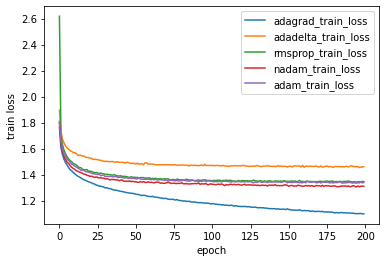

In [ ]:
plt.plot(adagrad_train_loss, label="adagrad_train_loss")
plt.plot(adadelta_train_loss, label="adadelta_train_loss")
plt.plot(rmsprop_train_loss, label="rmsprop_train_loss")
plt.plot(nadam_train_loss, label="nadam_train_loss")
plt.plot(adam_train_loss, label="adam_train_loss")
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.legend()
plt.show()

In [ ]:
adagrad_dropout_train_loss = torch.load("adagrad_dropout_train_loss_history.pkl")
adadelta_dropout_train_loss = torch.load("adadelta_dropout_train_loss_history.pkl")
rmsprop_dropout_train_loss = torch.load("rmsprop_dropout_train_loss_history.pkl")
nadam_dropout_train_loss = torch.load("nadam_dropout_train_loss_history.pkl")
adam_dropout_train_loss = torch.load("adam_dropout_train_loss_history.pkl")

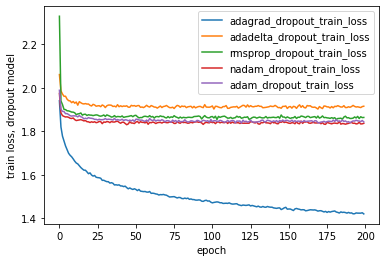

In [ ]:
plt.plot(adagrad_dropout_train_loss, label="adagrad_dropout_train_loss")
plt.plot(adadelta_dropout_train_loss, label="adadelta_dropout_train_loss")
plt.plot(rmsprop_dropout_train_loss, label="rmsprop_dropout_train_loss")
plt.plot(nadam_dropout_train_loss, label="nadam_dropout_train_loss")
plt.plot(adam_dropout_train_loss, label="adam_dropout_train_loss")
plt.xlabel("epoch")
plt.ylabel("train loss, dropout model")
plt.legend()
plt.show()

## Problem 4

Compare the accuracy

In [ ]:
def test(model):
    model.to(device)
    model.eval()
    count = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(test_loader):
        inputs, targets = inputs.to(device), targets.to(device) 
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()  
    print("The test accuracy is: {0:.3f}".format(100. * correct / total))
    return 100. * correct / total

In [ ]:
# model 
adagrad = torch.load("adagrad_net.pkl")
adadelta = torch.load("adadelta_net.pkl")
rmsprop = torch.load("rmsprop_net.pkl")
nadam = torch.load("nadam_net.pkl")
adam = torch.load("adam_net.pkl")

In [ ]:

# model with dropout
adagrad_dropout = torch.load("adagrad_net_dropout.pkl")
adadelta_dropout = torch.load("adadelta_net_dropout.pkl")
rmsprop_dropout = torch.load("rmsprop_net_dropout.pkl")
nadam_dropout = torch.load("nadam_net_dropout.pkl")
adam_dropout = torch.load("adam_net_dropout.pkl")

In [ ]:
models = [adagrad, adadelta, rmsprop, nadam, adam]
models_name = ["adagrad", "adadelta", "rmsprop", "nadam", "adam"]
models_dropout = [adagrad_dropout, adadelta_dropout, rmsprop_dropout, nadam_dropout, adam_dropout]
models_dropout_name = ["adagrad_dropout", "adadelta_dropout", "rmsprop_dropout", "nadam_dropout", "adam_dropout"]
dict_no_dropout = {}
dict_dropout = {}
i = 0
for model in models_dropout:
    
    test_acc = test(model)
    dict_dropout[models_dropout_name[i]] =test_acc
    i += 1

The test accuracy is: 52.100
The test accuracy is: 36.420
The test accuracy is: 34.290
The test accuracy is: 36.940
The test accuracy is: 34.350


In [ ]:
dict_dropout

{'adagrad_dropout': 52.1,
 'adadelta_dropout': 36.42,
 'rmsprop_dropout': 34.29,
 'nadam_dropout': 36.94,
 'adam_dropout': 34.35}

Text(0, 0.5, 'accuracy')

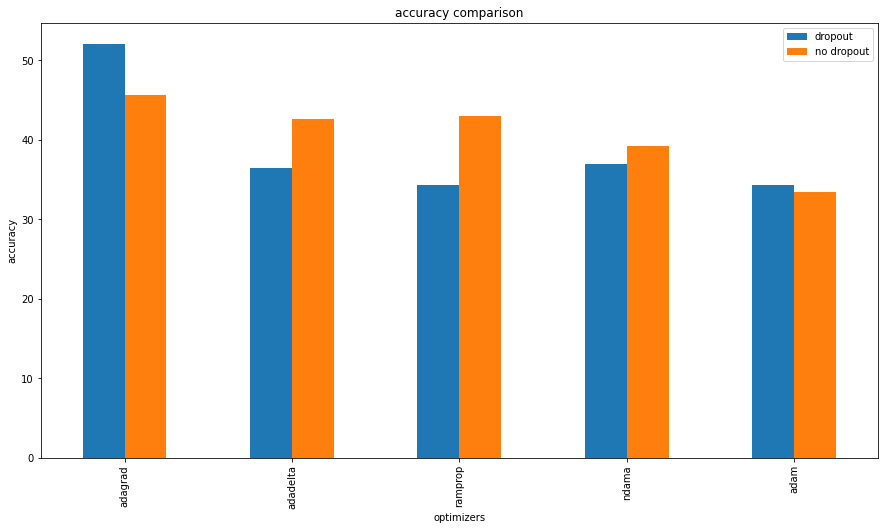

In [2]:
plotdata = pd.DataFrame({

    "dropout":[52.1,36.42,34.29,36.94, 34.35],

    "no dropout":[45.68,42.67,42.96,39.23,33.45]},

    index=["adagrad", "adadelta", "ramprop", "ndama", "adam"])

plotdata.plot(kind="bar",figsize=(15, 8))

plt.title("accuracy comparison")

plt.xlabel("optimizers")

plt.ylabel("accuracy")